In [ ]:
!pip install yfinance
!pip install -U matplotlib
!pip install bnlearn
!pip install h2o
!pip install jupyter_capture_output

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import yfinance as yf
import datetime
import pandas as pd
import numpy as np
import bnlearn
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib as mpl
plt.style.use('fivethirtyeight')


import seaborn as sns
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split

import h2o
from h2o.automl import *

from sklearn.linear_model import SGDClassifier

import plotly.express as px # to plot the time series plot
from sklearn import metrics # for the evaluation
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
import tensorflow as tf 


from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense

from google.colab import drive
drive.mount('/content/gdrive')

from datetime import datetime


Mounted at /content/gdrive


In [ ]:
######## GLOBAL VARS ########

_DATA = "50y"
_WINDOW_SIZE = 252 * 1
_WINDOW_SIZE_TRADE = 15
_MAX_DATE = np.datetime64(datetime(2022,12,15))
_MIN_DATE = np.datetime64(datetime(1993,1,1))
now = datetime.now() # current date and time
_DATE_TIME = now.strftime("%Y%m%d_%Hh%Mm%Ss")
_PATH_OUTPUT = './gdrive/MyDrive/bayes_project/' + _DATE_TIME + '/'
#_ASSET_TARGET = '^STOXX50E'
#_MIN_DATE = np.datetime64(datetime.datetime(2010,1,1))

In [ ]:
!pwd

/content


In [ ]:
#python program to check if a directory exists
import os
# Check whether the specified path exists or not
isExist = os.path.exists(_PATH_OUTPUT)
if not isExist:
   # Create a new directory because it does not exist
   os.makedirs(_PATH_OUTPUT)
   print("The new directory is created!")


The new directory is created!


In [ ]:
def f_get_data_yahoo(_ASSET_TARGET):

  spot_obj_tmp = yf.Ticker(_ASSET_TARGET)
  df_hist_tmp = spot_obj_tmp.history(period=_DATA)

  ######## YAHOO TICKERS ########
  # ^GSPC spx
  # ^VIX vix
  # ^TNX t10y
  # ^DJI dowjones
  # ^IXIC nasdaq

  ######## YAHOO DATA ########
  print(df_hist_tmp.head())
  df_hist_tmp.index = pd.to_datetime(df_hist_tmp.index, errors='ignore', utc=False)
  df_hist_tmp.index = df_hist_tmp.index.astype('datetime64[ns]')

  df_hist_tmp = df_hist_tmp[df_hist_tmp.index<_MAX_DATE]
  df_hist_tmp = df_hist_tmp[df_hist_tmp.index>_MIN_DATE]
  return spot_obj_tmp, df_hist_tmp


In [ ]:
def f_plot_charts(df_in):
    plt.figure(figsize = (12,6))
    plt.plot(df_in['signal_strenght_acc'], label="Signal Strength")
    plt.xlabel("Date")
    plt.ylabel("Signal Strength")
    plt.legend()
    plt.show()

    plt.figure(figsize = (12,6))
    plt.plot(df_in['Close'], label="Price")
    plt.plot(df_in['close_ewma'], label="Price EWMA")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize = (12,6))
    plt.plot(df_in['Close'], label="SPX 500")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

    plt.figure(figsize = (12,6))
    plt.plot(df_in['signal_sign'], 'k-',label="Signal",  linewidth=2)
    plt.xlabel("Date")
    plt.ylabel("signal")
    plt.legend()
    plt.show()

    plt.figure(figsize = (12,6))
    plt.scatter(x=df_in.index, y=df_in['signal_sign'], cmap='gray')
    plt.xlabel("Date")
    plt.ylabel("signal")
    plt.legend()
    plt.show()


In [ ]:
def f_run_model(spot_obj, _WINDOW_SIZE, df_in):
    df_hist = df_in.copy()
    df_hist.index=pd.to_datetime(df_hist.index)
    df_hist['var_abs'] = np.abs(df_hist['Close'] - df_hist['Close'].shift(1))
    df_hist['var'] = df_hist['Close'] - df_hist['Close'].shift(1)
    df_hist['close_ewma'] = df_hist['Close'].ewm(halflife = _WINDOW_SIZE, adjust=False).mean()
    df_hist['vol_ewma'] = df_hist['var_abs'].ewm(halflife = _WINDOW_SIZE, adjust=False).mean()
    df_hist['signal'] = (df_hist['Close'].shift(1) - df_hist['close_ewma'].shift(1)) / (df_hist['vol_ewma'].shift(1))
    df_hist['signal_sign'] = np.sign(df_hist['signal'])
    df_hist['signal_strenght'] = df_hist['signal_sign'] * (df_hist['Close'].shift(-1) - df_hist['Close']) / df_hist['vol_ewma'].shift(1)
    df_hist['signal_strenght_acc'] = df_hist['signal_strenght'].cumsum()
    sharpe_model = (df_hist['signal_strenght'].mean() / df_hist['signal_strenght'].std()) * (252 ** 0.5)
    sharpe_asset = (df_hist['var'].mean() / df_hist['var'].std()) * (252 ** 0.5)
    sharpe_model = round(sharpe_model, 3)
    sharpe_asset = round(sharpe_asset, 3)
    df_out = df_hist.copy()
    return [sharpe_asset, sharpe_model], df_out

In [ ]:
def f_run_model_mod(spot_obj, _WINDOW_SIZE, df_in, df_signal_in):
    df_hist = df_in.copy()
    df_hist.index=pd.to_datetime(df_hist.index)
    df_hist['var_abs'] = np.abs(df_hist['Close'] - df_hist['Close'].shift(1))
    df_hist['var'] = df_hist['Close'] - df_hist['Close'].shift(1)
    df_hist['close_ewma'] = df_hist['Close'].ewm(halflife = _WINDOW_SIZE, adjust=False).mean()
    df_hist['vol_ewma'] = df_hist['var_abs'].ewm(halflife = _WINDOW_SIZE, adjust=False).mean()
    # df_hist['signal'] = (df_hist['Close'].shift(1) - df_hist['close_ewma'].shift(1)) / (df_hist['vol_ewma'].shift(1))
    

    ##################################################
    df_hist = df_hist.merge(df_signal_in, how='left', on='Date')
    df_hist.fillna(method='ffill', inplace = True)
    df_hist.fillna(method='bfill', inplace = True)
    print(df_hist.head())
    ##################################################
    df_hist['signal_sign'] = np.sign(df_hist['signal'])
    df_hist['signal_strenght'] = df_hist['signal_sign'] * (df_hist['Close'].shift(-1) - df_hist['Close']) / df_hist['vol_ewma'].shift(1)
    df_hist['signal_strenght_acc'] = df_hist['signal_strenght'].cumsum()
    sharpe_model = (df_hist['signal_strenght'].mean() / df_hist['signal_strenght'].std()) * (252 ** 0.5)
    sharpe_asset = (df_hist['var'].mean() / df_hist['var'].std()) * (252 ** 0.5)
    sharpe_model = round(sharpe_model, 3)
    sharpe_asset = round(sharpe_asset, 3)
    df_out = df_hist.copy()
    return [sharpe_asset, sharpe_model], df_out

In [ ]:
def f_get_optmized(spot_obj,df_hist):

  lst_agg = []
  for i in range(1, 30):
    _out, df_ = f_run_model(spot_obj, 252 * i, df_hist)
    _out_str = ' '.join(str(e) for e in _out)
    print(str(i) + ' ' + _out_str)
    lst_tmp = [i, _out[0], _out[1]]
    lst_agg.append(lst_tmp)
  out_np = np.array(lst_agg)
  max_sharpe = max(out_np[:,2])
  best_years = out_np[out_np[:,2] == max_sharpe,0]
  _best = best_years[0]
  ###################################################################################################
  _best = 1
  ###################################################################################################
  _out_best, df_best = f_run_model(spot_obj, 252 * _best, df_hist)
  return _out_best, df_best, _best

In [ ]:
def f_get_data_all_tickers(_ASSET_TARGET):

  lst_tickers = [_ASSET_TARGET, "^VIX", "^TNX"]
  df_agg_out = pd.DataFrame()
  for ticker_tmp in lst_tickers:
    spot_obj_lst = yf.Ticker(ticker_tmp)
    df_hist_lst = spot_obj_lst.history(period=_DATA)

  ###############################
    df_hist_lst.index = pd.to_datetime(df_hist_lst.index, errors='ignore', utc=False)
    df_hist_lst.index = df_hist_lst.index.astype('datetime64[ns]')
  ###############################

    df_hist_lst = df_hist_lst[df_hist_lst.index<_MAX_DATE]
    df_hist_lst = df_hist_lst[df_hist_lst.index>_MIN_DATE]
    df_tmp = df_hist_lst[['Close']]
    df_tmp['ticker'] = ticker_tmp
    df_agg_out = df_agg_out.append(df_tmp)
  print(df_agg_out.head())
  df_agg_out.reset_index(drop=False, inplace = True)
  print(df_agg_out.head())

  df_agg_pivot_out = df_agg_out.pivot(index="Date", columns="ticker", values="Close")
  #df_agg_pivot.reset_index(drop=False, inplace = True)
  df_agg_pivot_out = df_agg_pivot_out.reset_index(drop=False).rename_axis(None, axis=1)
  print(df_agg_pivot_out.head())
  df_agg_pivot_out.fillna(method='ffill', inplace = True)
  df_agg_pivot_out.fillna(method='bfill', inplace = True)
  df_agg_pivot_out.set_index('Date',drop=True, inplace = True)
  print(df_agg_pivot_out.head())

  df_agg_pivot_out['variance'] = (df_agg_pivot_out[_ASSET_TARGET] / df_agg_pivot_out[_ASSET_TARGET].shift(1) - 1) ** 2

  df_agg_pivot_out['vol_realized'] = (df_agg_pivot_out['variance'].rolling(_WINDOW_SIZE_TRADE).mean() * 2520000) ** 0.5
  print(df_agg_pivot_out.head())
  df_agg_pivot_out.drop(columns = ['variance'], inplace = True)
  df_agg_pivot_out.fillna(method='ffill', inplace = True)
  df_agg_pivot_out.fillna(method='bfill', inplace = True)
  print(df_agg_pivot_out.head())
  return df_agg_pivot_out

In [ ]:
def f_get_discrete_data(df_in, df_signal_best_in, _ASSET_TARGET):
  df_tmp = df_in.copy()
  for ticker_tmp in list(df_tmp.columns):
      df_tmp[ticker_tmp] = df_tmp[ticker_tmp] - df_tmp[ticker_tmp].shift(1)
      df_tmp.loc[df_tmp[ticker_tmp]>=0, ticker_tmp] = 1
      df_tmp.loc[df_tmp[ticker_tmp]<0, ticker_tmp] = 0

  df_tmp = df_tmp.merge(df_signal_best_in, how='left', on='Date')
  df_tmp.dropna(how='all', inplace = True)

  df_tmp[_ASSET_TARGET + '_shift'] = df_tmp[_ASSET_TARGET].shift(-1)
  print(df_tmp)
  #df_agg_pivot = df_agg_pivot[:-2]
  df_tmp.fillna(method='ffill', inplace = True)
  df_tmp.fillna(method='bfill', inplace = True)
  return df_tmp

In [ ]:
def custom_ts_multi_data_prep(dataset, target, start, end, window, horizon):
     X = []
     y = []
     start = start + window
     if end is None:
         end = len(dataset) - horizon
     for i in range(start, end):
         indices = range(i-window, i)
         X.append(dataset[indices])
         indicey = range(i+1, i+1+horizon)
         y.append(target[indicey])
     return np.array(X), np.array(y) 

In [ ]:

def f_run_rolling_prediction(df_data_in, _ASSET_TARGET):
  # Define the network structure


  edges_0 = [('^TNX', _ASSET_TARGET + '_shift'),
          ('^VIX', _ASSET_TARGET + '_shift'),
          (_ASSET_TARGET, _ASSET_TARGET + '_shift'),
          ('signal_sign', _ASSET_TARGET + '_shift'),
          ('vol_realized', '^VIX')]

  edges = [(_ASSET_TARGET, _ASSET_TARGET + '_shift'),
          (_ASSET_TARGET, '^VIX'),
          ('signal_sign', '^VIX'),
          ('signal_sign', '^TNX'),
          ('vol_realized', '^TNX'),
          ('^VIX', _ASSET_TARGET + '_shift'),
          ('signal_sign', _ASSET_TARGET + '_shift'),
          ('^TNX', _ASSET_TARGET + '_shift')]

  # Make the actual Bayesian DAG
  DAG = bnlearn.make_DAG(edges)
  # Print the CPDs
  bnlearn.print_CPD(DAG)
  # [BNLEARN.print_CPD] No CPDs to print. Use bnlearn.plot(DAG) to make a plot.
  # Plot the DAG
  bnlearn.plot(DAG)


  df_mod_tmp = df_data_in.copy()
  df_mod_tmp.reset_index(drop = False, inplace=True)
  df_mod_tmp['trigger'] = 0.00


  # DAG = bnlearn.parameter_learning.fit(DAG, df_agg_pivot)

  len_df = df_data_in.shape[0]

  # for i in range(100, df_agg_pivot.shape[0]):
  for i in tqdm(range(100, df_data_in.shape[0])):

    # Parameter learning on the user-defined DAG and input data
    DAG = bnlearn.parameter_learning.fit(DAG, df_data_in[:i-1], verbose = 1)

    vix_val = df_data_in.iloc[i]['^VIX']
    tsy_val = df_data_in.iloc[i]['^TNX']
    spx_val = df_data_in.iloc[i][_ASSET_TARGET]
    vol_realized_val = df_data_in.iloc[i]['vol_realized']
    signal_sign_val = df_data_in.iloc[i]['signal_sign']

    date_val = df_mod_tmp.iloc[i]['Date']

    q1 = bnlearn.inference.fit(DAG, variables=[_ASSET_TARGET + '_shift'], evidence={'^VIX':vix_val, '^TNX':tsy_val, _ASSET_TARGET:spx_val, 'vol_realized':vol_realized_val, 'signal_sign':signal_sign_val}, verbose = 1)
    ret = q1.values[1]

    df_mod_tmp.loc[i,'trigger'] = ret
    # print(df_mod.tail())
    # print(q1.values)
    if i%100 ==0:
      print(str(i) + ' / ' + str(len_df))
  df_mod_tmp.set_index('Date',drop=True, inplace = True)
  return df_mod_tmp

In [ ]:
def f_run_rolling_prediction_xgb(df_data_in, _ASSET_TARGET):
 
  df_mod_tmp = df_data_in.copy()
  df_mod_tmp.reset_index(drop = False, inplace=True)
  df_mod_tmp['trigger'] = 0.00

  len_df = df_data_in.shape[0]

  for i in tqdm(range(100, df_data_in.shape[0])):


    X_ = df_data_in[:i-1][[_ASSET_TARGET,'^TNX','vol_realized','signal_sign']]
    Y_ = df_data_in[:i-1][_ASSET_TARGET + '_shift']

    X_all = df_data_in[:i][[_ASSET_TARGET,'^TNX','vol_realized','signal_sign']]
    Y_all = df_data_in[:i][_ASSET_TARGET + '_shift']
  
    X_train, X_test, y_train, y_test = \
          train_test_split(X_, Y_, test_size = 0.15, \
                          random_state = 0, shuffle=False)

    reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators = 3, nthread=24)
    reg.fit(X_train, y_train,
          eval_set=[(X_train, y_train), (X_train, y_train)],
          early_stopping_rounds = 50,
        verbose=False)


    vix_val = df_data_in.iloc[i]['^VIX']
    tsy_val = df_data_in.iloc[i]['^TNX']
    spx_val = df_data_in.iloc[i][_ASSET_TARGET]
    vol_realized_val = df_data_in.iloc[i]['vol_realized']
    signal_sign_val = df_data_in.iloc[i]['signal_sign']

    date_val = df_mod_tmp.iloc[i]['Date']

    ret = reg.predict(X_all[:i].tail(1))[0]


    df_mod_tmp.loc[i,'trigger'] = ret

    if i%100 ==0:
      print(str(i) + ' / ' + str(len_df))
  df_mod_tmp.set_index('Date',drop=True, inplace = True)
  return df_mod_tmp

In [ ]:
def f_run_rolling_prediction_sgd(df_data_in, _ASSET_TARGET):
 
  df_mod_tmp = df_data_in.copy()
  df_mod_tmp.reset_index(drop = False, inplace=True)
  df_mod_tmp['trigger'] = 0.00

  len_df = df_data_in.shape[0]

  for i in tqdm(range(100, df_data_in.shape[0])):


    X_ = df_data_in[:i-1][[_ASSET_TARGET,'^TNX','vol_realized','signal_sign']]
    Y_ = df_data_in[:i-1][_ASSET_TARGET + '_shift']

    X_all = df_data_in[:i][[_ASSET_TARGET,'^TNX','vol_realized','signal_sign']]
    Y_all = df_data_in[:i][_ASSET_TARGET + '_shift']
  
    X_train, X_test, y_train, y_test = \
          train_test_split(X_, Y_, test_size = 0.15, \
                          random_state = 0, shuffle=False)

    #clf = SGDClassifier(loss="modified_huber", penalty = "l2", max_iter = 5)
    clf = SGDClassifier(loss="perceptron", max_iter=5)
    

# loss="hinge": (soft-margin) linear Support Vector Machine,
# loss="modified_huber": smoothed hinge loss,
# loss="log_loss": logistic regression,
# SGDRegressor(loss='squared_error', penalty='l2')



    clf.fit(X_, Y_)

    vix_val = df_data_in.iloc[i]['^VIX']
    tsy_val = df_data_in.iloc[i]['^TNX']
    spx_val = df_data_in.iloc[i][_ASSET_TARGET]
    vol_realized_val = df_data_in.iloc[i]['vol_realized']
    signal_sign_val = df_data_in.iloc[i]['signal_sign']

    date_val = df_mod_tmp.iloc[i]['Date']

    ret = clf.predict(X_all.tail(1))[0]
    df_mod_tmp.loc[i,'trigger'] = ret

    if i%100 ==0:
      print(str(i) + ' / ' + str(len_df))
  df_mod_tmp.set_index('Date',drop=True, inplace = True)
  return df_mod_tmp

In [ ]:
def f_run_rolling_prediction_lstm(df_data_in, _ASSET_TARGET):
 
  df_mod_tmp = df_data_in.copy()
  df_mod_tmp.reset_index(drop = False, inplace=True)
  df_mod_tmp['trigger'] = 0.00

  len_df = df_data_in.shape[0]

  data = df_data_in.copy()

  for i in data.select_dtypes('object').columns:
    le = LabelEncoder().fit(data[i])
    data[i] = le.transform(data[i])

  X_scaler = MinMaxScaler()
  Y_scaler = MinMaxScaler()
  X_data = X_scaler.fit_transform(data[[_ASSET_TARGET,'^TNX','vol_realized','signal_sign']])
  Y_data = Y_scaler.fit_transform(data[[_ASSET_TARGET + '_shift']])

  hist_window = 90
  horizon = 1
  TRAIN_SPLIT = int(2 * len_df / 3)
  TRAIN_SPLIT = 100
  print(TRAIN_SPLIT)

  x_train, y_train = custom_ts_multi_data_prep(X_data, Y_data, 0, TRAIN_SPLIT, hist_window, horizon)
  x_vali, y_vali = custom_ts_multi_data_prep(X_data, Y_data, TRAIN_SPLIT, None, hist_window, horizon)

  x_all, y_all = custom_ts_multi_data_prep(X_data, Y_data, 0, None, hist_window, horizon)
 
  model = Sequential()
  model.add(LSTM(10, activation='relu', return_sequences = True, input_shape = x_train.shape[-2:]))
  model.add(LSTM(10, activation='relu'))
  model.add(Dense(horizon))
  model.compile(optimizer='adam', loss='mse')
  # fit model
  model.fit(x_train, y_train, epochs = 1, verbose = 1)

  yhat_all = model.predict(x_all, verbose = 1)

  # print('x_all.shape')
  # print(x_all.shape)

  # print('yhat_all.shape')
  # print(yhat_all.shape)

  for i in tqdm(range(100, df_data_in.shape[0])):

    X_ = df_data_in[:i-1][[_ASSET_TARGET,'^TNX','vol_realized','signal_sign']]
    Y_ = df_data_in[:i-1][[_ASSET_TARGET + '_shift']]

    X_all = df_data_in[:i][[_ASSET_TARGET,'^TNX','vol_realized','signal_sign']]
    Y_all = df_data_in[:i][[_ASSET_TARGET + '_shift']]

    X_data_tmp_ = X_scaler.fit_transform(X_[[_ASSET_TARGET,'^TNX','vol_realized','signal_sign']])
    Y_data_tmp_ = Y_scaler.fit_transform(Y_[[_ASSET_TARGET + '_shift']])

    X_data_tmp = X_scaler.fit_transform(X_all[[_ASSET_TARGET,'^TNX','vol_realized','signal_sign']])
    Y_data_tmp = Y_scaler.fit_transform(Y_all[[_ASSET_TARGET + '_shift']])

    x_vali, y_vali = custom_ts_multi_data_prep(X_data_tmp, Y_data_tmp, 0, None, hist_window, horizon) 
    x_train_, y_train_ = custom_ts_multi_data_prep(X_data_tmp_, Y_data_tmp_, 0, None, hist_window, horizon) 
    yhat = model.predict(x_vali, verbose = 0)

    # ret = yhat[-1][0]
    ret = yhat_all[i - hist_window - 1][0]

    df_mod_tmp.loc[i,'trigger'] = ret
    date_val = df_mod_tmp.iloc[i]['Date']

    if i%360 ==0:
      print(str(i) + ' / ' + str(len_df))
      model.fit(x_train_[-100:], y_train_[-100:], epochs = 1, verbose = 1)
  df_mod_tmp.set_index('Date', drop=True, inplace = True)
  return df_mod_tmp

In [ ]:

def f_run_rolling_prediction_h2o(df_data_in, _ASSET_TARGET):
  
  h2o.init()

  df_mod_tmp = df_data_in.copy()
  df_data_in_tmp = df_data_in.copy()
  df_mod_tmp.reset_index(drop = False, inplace=True)
  df_mod_tmp['trigger'] = 0.00

  df_data_in_tmp[_ASSET_TARGET + '_shift']  = pd.Categorical(df_data_in_tmp[_ASSET_TARGET + '_shift'] )
  print(df_data_in_tmp.dtypes)

  len_df = df_data_in.shape[0]

  for i in tqdm(range(100, df_data_in_tmp.shape[0])):



    df_data_avaiable = df_data_in_tmp[:i-1]
    df_data_all = df_data_in_tmp[:i]
    
    h2o_df_data_avaiable = h2o.H2OFrame(df_data_avaiable)
    h2o_df_data_all = h2o.H2OFrame(df_data_all)

    h2o_df_data_avaiable[_ASSET_TARGET + '_shift'] = h2o_df_data_avaiable[_ASSET_TARGET + '_shift'].asfactor()
    h2o_df_data_all[_ASSET_TARGET + '_shift'] = h2o_df_data_all[_ASSET_TARGET + '_shift'].asfactor()


    y = _ASSET_TARGET + '_shift'
    ignore = ["X", "Y"]
    x = list(set(h2o_df_data_all.names) - set(ignore))
    H2OAutoML(nfolds=5, max_runtime_secs=3600, max_models=None, stopping_metric='AUTO', stopping_tolerance=None, stopping_rounds=3, seed=None, project_name=None)
    aml = H2OAutoML(max_runtime_secs = 50, 
                    max_models = 3,  
                    seed = 42, 
                    project_name='classification',
                    sort_metric = "AUC")

    %time aml.train(x = x, y = y, training_frame = h2o_df_data_avaiable)

    predict_out = aml.predict(h2o_df_data_all)
    x_ = predict_out.tail(1)
    f = x_.as_data_frame()
    ret_out = f.tail(1).values[0][0]

    date_val = df_mod_tmp.iloc[i]['Date']

    ret = ret_out


    df_mod_tmp.loc[i,'trigger'] = ret

    if i%100 ==0:
      print(str(i) + ' / ' + str(len_df))
  df_mod_tmp.set_index('Date',drop=True, inplace = True)
  return df_mod_tmp

In [ ]:
def f_agg_output(df_agg_prices, df_mod, _ASSET_TARGET):
  df_agg_merged = df_agg_prices.merge(df_mod, how='left', on='Date')
  df_agg_merged['trigger_discr'] = df_agg_merged['trigger']
  df_agg_merged.loc[df_agg_merged['trigger']>0.01,'trigger_discr'] = -1
  df_agg_merged.loc[df_agg_merged['trigger']>=0.50,'trigger_discr'] = 1
  df_agg_merged.loc[df_agg_merged['trigger']==0.00,'trigger_discr'] = 0
  df_agg_merged['signal'] = df_agg_merged['trigger_discr']
  df_agg_merged[_ASSET_TARGET + '_var'] = df_agg_merged[_ASSET_TARGET + '_x'] - df_agg_merged[_ASSET_TARGET + '_x'].shift(1)
  df_agg_merged[_ASSET_TARGET + '_pnl_model'] = df_agg_merged[_ASSET_TARGET + '_var'] * df_agg_merged['trigger_discr'].shift(1)
  df_agg_merged[_ASSET_TARGET + '_pnl_model_acc'] = df_agg_merged[_ASSET_TARGET + '_pnl_model'].cumsum()
  df_agg_merged[_ASSET_TARGET + '_pnl_asset_acc'] = df_agg_merged[_ASSET_TARGET + '_var'].cumsum()
  return df_agg_merged

In [ ]:
def f_compute_sharpe(df_agg_merged, _ASSET_TARGET):
  sharpe_model = (df_agg_merged[_ASSET_TARGET + '_pnl_model'].mean() / df_agg_merged[_ASSET_TARGET + '_pnl_model'].std()) * (252 ** 0.5)
  sharpe_asset = (df_agg_merged[_ASSET_TARGET + '_var'].mean() / df_agg_merged[_ASSET_TARGET + '_var'].std()) * (252 ** 0.5)
  return sharpe_model, sharpe_asset


In [ ]:

def f_plot_comparison(df_best, df_best_mod, df_best_bh, _ASSET_TARGET, title_in = ''):
  file_name_out = _PATH_OUTPUT + _ASSET_TARGET + '.png'
  plt.figure(figsize = (12,6))
  plt.plot(df_best['signal_strenght_acc'], label="Trend Following")
  plt.plot(df_best_mod['signal_strenght_acc'], label="Proposed Model")
  plt.plot(df_best_bh['signal_strenght_acc'], label="Buy and Hold")
  plt.xlabel("Date")
  plt.ylabel("Price")
  plt.title(title_in)
  plt.legend()
  plt.savefig(file_name_out)
  plt.show()
  

In [ ]:
def f_save_outputs(df_in, _ASSET_TARGET):
  file_name_out = _PATH_OUTPUT + _ASSET_TARGET + '.csv'
  df_in.to_csv(file_name_out, sep =';')


In [ ]:
def f_read_outputs(_ASSET_TARGET):
  file_name_out = _PATH_OUTPUT + _ASSET_TARGET + '.csv'
  df_out = pd.read_csv(file_name_out, sep =';')
  return df_out

In [ ]:
def f_plot_signal_tail(df_best, df_best_mod, _ASSET_TARGET):
  file_name_out = _PATH_OUTPUT + _ASSET_TARGET
  df_best_tail = df_best.tail(504)
  df_best_mod_tail = df_best_mod.tail(504)
  plt.figure(figsize = (12,6))
  fig, (ax1, ax2) = plt.subplots(2)
  fig.suptitle('Signal Plots')
  ax1.plot(df_best_tail.index,df_best_tail['signal_sign'], 'k-',label="Signal Trend Following",  linewidth=2)
  ax2.plot(df_best_mod_tail.index,df_best_mod_tail['signal_sign'], 'k-',label="Signal Proposed Model",  linewidth=2)

  plt.xlabel("Date")
  plt.ylabel("Signal")
  plt.legend()
  plt.savefig(file_name_out + 'plot_1.png')
  plt.show()

  fig = plt.figure(figsize = (12,6))
  gs = fig.add_gridspec(2, hspace=0.2)
  axs = gs.subplots(sharex=True, sharey=True)
  #fig.suptitle('Signal Plots')
  axs[0].plot(df_best_tail.index,df_best_tail['signal_sign'], 'k-', label="Signal Trend Following",  linewidth=2)
  axs[1].plot(df_best_mod_tail.index,df_best_mod_tail['signal_sign'], 'k-', label="Signal Proposed Model",  linewidth=2)

  axs[0].set_title("Signal")
  axs[1].set_title("Signal_mod")

  # Hide x labels and tick labels for all but bottom plot.
  for ax in axs:
      ax.label_outer()
  plt.savefig(file_name_out + 'plot_2.png')
  plt.show()

  t = np.array(df_best_tail.index)
  s = np.array(df_best_tail['signal_sign'])
  t_mod = np.array(df_best_mod_tail.index)
  s_mod = np.array(df_best_mod_tail['signal_sign'])
  spx = np.array(df_best_mod_tail['Close'])

  upper = 0.5
  lower = -0.5

  supper = np.ma.masked_where(s < upper, s)
  slower = np.ma.masked_where(s > lower, s)
  smiddle = np.ma.masked_where((s < lower) | (s > upper), s)

  supper_mod = np.ma.masked_where(s_mod < upper, s_mod)
  slower_mod = np.ma.masked_where(s_mod > lower, s_mod)
  smiddle_mod = np.ma.masked_where((s_mod < lower) | (s_mod > upper), s_mod)

  #fig, ax = plt.subplots()
  #ax.plot(t, smiddle, t, slower,'r-', t, supper,'g-')#
  #plt.show()


  fig = plt.figure(figsize = (12,6))
  gs = fig.add_gridspec(3, hspace=0.2)
  axs = gs.subplots(sharex=True)
  #fig.suptitle('Signal Plots')
  axs[0].plot(t, smiddle, t, slower,'rx', t, supper,'g.',label="Signal Trend Following",  linewidth=5)
  axs[1].plot(t, smiddle_mod, t, slower_mod,'rx', t, supper_mod,'g.',label="Signal Proposed Model",  linewidth=5)
  axs[2].plot(t, spx, 'k-', label="SPX500",  linewidth=2)

  axs[0].set_title("Signal Trend Following")
  axs[1].set_title("Signal Proposed Model")
  axs[2].set_title("Financial Asset")

  # Hide x labels and tick labels for all but bottom plot.
  for ax in axs:
      ax.label_outer()
  plt.savefig(file_name_out + 'plot_2.png')
  plt.show()

  t = np.array(df_best_tail.index)
  s = np.array(df_best_tail['signal_sign'])
  t_mod = np.array(df_best_mod_tail.index)
  s_mod = np.array(df_best_mod_tail['signal_sign'])
  spx = np.array(df_best_mod_tail['Close'])

  upper = 0.5
  lower = -0.5

  supper = np.ma.masked_where(s < upper, s)
  slower = np.ma.masked_where(s > lower, s)
  smiddle = np.ma.masked_where((s < lower) | (s > upper), s)

  supper_mod = np.ma.masked_where(s_mod < upper, s_mod)
  slower_mod = np.ma.masked_where(s_mod > lower, s_mod)
  smiddle_mod = np.ma.masked_where((s_mod < lower) | (s_mod > upper), s_mod)

  #fig, ax = plt.subplots()
  #ax.plot(t, smiddle, t, slower,'r-', t, supper,'g-')#
  #plt.show()


  fig = plt.figure(figsize = (12,6))
  gs = fig.add_gridspec(2, hspace=0.2)
  axs = gs.subplots(sharex=True)
  #fig.suptitle('Signal Plots')
  axs[0].plot(t, smiddle, t, slower,'rx', t, supper,'g.',label="Signal",  linewidth=5)
  axs[1].plot(t, spx, 'k-', label="SPX500",  linewidth=2)

  axs[0].set_title("Signal Trend Following")
  axs[1].set_title("Financial Asset")

  # Hide x labels and tick labels for all but bottom plot.
  for ax in axs:
      ax.label_outer()
  plt.savefig(file_name_out + 'plot_3.png')
  plt.show()


  t = np.array(df_best_tail.index)
  s = np.array(df_best_tail['signal_sign'])
  t_mod = np.array(df_best_mod_tail.index)
  s_mod = np.array(df_best_mod_tail['signal_sign'])
  spx = np.array(df_best_mod_tail['Close'])

  upper = 0.5
  lower = -0.5

  supper = np.ma.masked_where(s < upper, s)
  slower = np.ma.masked_where(s > lower, s)
  smiddle = np.ma.masked_where((s < lower) | (s > upper), s)

  supper_mod = np.ma.masked_where(s_mod < upper, s_mod)
  slower_mod = np.ma.masked_where(s_mod > lower, s_mod)
  smiddle_mod = np.ma.masked_where((s_mod < lower) | (s_mod > upper), s_mod)

  #fig, ax = plt.subplots()
  #ax.plot(t, smiddle, t, slower,'r-', t, supper,'g-')#
  #plt.show()


  fig = plt.figure(figsize = (12,6))
  gs = fig.add_gridspec(2, hspace=0.2)
  axs = gs.subplots(sharex=True)
  #fig.suptitle('Signal Plots')

  axs[0].plot(t, smiddle_mod, t, slower_mod,'rx', t, supper_mod,'g.',label="Signal_mod",  linewidth=5)
  axs[1].plot(t, spx, 'k-', label="SPX500",  linewidth=2)

  axs[0].set_title("Signal Proposed Model")
  axs[1].set_title("Financial Asset")

  # Hide x labels and tick labels for all but bottom plot.
  for ax in axs:
      ax.label_outer()
  plt.savefig(file_name_out + 'plot_4.png')
  plt.show()


In [ ]:
def f_plot_assets(df_agg_prices_tmp, _ASSET_TARGET):
  df_agg_prices_tmp = df_agg_prices_tmp.tail(5000)
  t_val = np.array(df_agg_prices_tmp.index)
  spx_val = np.array(df_agg_prices_tmp[_ASSET_TARGET])
  t10y_val = np.array(df_agg_prices_tmp['^TNX'])
  vix_val = np.array(df_agg_prices_tmp['^VIX'])
  vol_real_val = np.array(df_agg_prices_tmp['vol_realized'])
  fig = plt.figure(figsize = (12,6))
  gs = fig.add_gridspec(4, hspace=0.2)
  axs = gs.subplots(sharex=True)
  axs[0].plot(t_val, spx_val, 'k-', label="SPX500",  linewidth=2)
  axs[1].plot(t_val, t10y_val, 'k-', label="T10y",  linewidth=2)
  axs[2].plot(t_val, vix_val, 'k-', label="VIX",  linewidth=2)
  axs[3].plot(t_val, vol_real_val, 'k-', label="Vol",  linewidth=2)

  axs[0].set_title("SPX500")
  axs[1].set_title("T10y")
  axs[2].set_title("VIX")
  axs[3].set_title("Vol")

  # Hide x labels and tick labels for all but bottom plot.
  for ax in axs:
      ax.label_outer()
  plt.show()

In [ ]:

def f_plot_eq_curves(df_best, df_best_mod, df_best_mod_k):
  plt.figure(figsize = (12,6))
  plt.plot(df_best['signal_strenght_acc'], label="Trading")
  plt.plot(df_best_mod['signal_strenght_acc'], label="Trading_mod")
  plt.plot(df_best_mod_k['signal_strenght_acc'], label="Trading_k")
  plt.xlabel("Date")
  plt.ylabel("Price")
  plt.legend()
  plt.show()

  plt.figure(figsize = (12,6))
  plt.plot(df_best['signal_strenght_acc'], label="Trading")
  plt.plot(df_best_mod['signal_strenght_acc'], label="Trading_mod")
  plt.xlabel("Date")
  plt.ylabel("Price")
  plt.legend()
  plt.show()

In [ ]:
def f_compute_metrics_models(df_best, df_best_mod, df_best_mod_k):
  _df_best = df_best.copy()
  _df_best_mod = df_best_mod.copy()
  _df_best_mod_k = df_best_mod_k.copy()
  _df_spx = df_best.copy()

  _df_best['ret'] = _df_best['signal_strenght'] / _df_best['Close']
  _df_best_mod['ret'] = _df_best_mod['signal_strenght'] / _df_best_mod['Close']
  _df_best_mod_k['ret'] = _df_best_mod_k['signal_strenght'] / _df_best_mod_k['Close']
  _df_spx['ret'] = _df_spx['var'] / _df_spx['Close']

  sharpe_best = (_df_best['signal_strenght'].mean() / _df_best['signal_strenght'].std()) * (252 ** 0.5)
  sharpe_best_mod = (_df_best_mod['signal_strenght'].mean() / _df_best_mod['signal_strenght'].std()) * (252 ** 0.5)
  sharpe_best_mod_k = (_df_best_mod_k['signal_strenght'].mean() / _df_best_mod_k['signal_strenght'].std()) * (252 ** 0.5)
  sharpe_spx = (_df_spx['ret'].mean() / _df_spx['ret'].std()) * (252 ** 0.5)


  vol_spx = (_df_spx['ret'].std() ) * (252 ** 0.5)

  ret_best = vol_spx * sharpe_best
  ret_best_mod = vol_spx * sharpe_best_mod
  ret_best_mod_k = vol_spx * sharpe_best_mod_k
  ret_spx = (_df_spx['ret'].mean() ) * (252 )


  len(_df_spx[_df_spx['var']>=0])/(len(_df_spx[_df_spx['var']>=0])+len(_df_spx[_df_spx['var']<0]))
  len(_df_best[_df_best['signal_strenght']>=0])/(len(_df_best[_df_best['signal_strenght']>=0])+len(_df_best[_df_best['signal_strenght']<0]))
  len(_df_best_mod[_df_best_mod['signal_strenght']>=0])/(len(_df_best_mod[_df_best_mod['signal_strenght']>=0])+len(_df_best_mod[_df_best_mod['signal_strenght']<0]))

  _df_best["signal_sign_shift"] = _df_best["signal_sign"].shift(1)
  _df_best["signal_trades"] = 0
  _df_best.loc[ _df_best["signal_sign_shift"]!= _df_best["signal_sign"] ,"signal_trades"] = 1

  _df_best_mod["signal_sign_shift"] = _df_best_mod["signal_sign"].shift(1)
  _df_best_mod["signal_trades"] = 0
  _df_best_mod.loc[ _df_best_mod["signal_sign_shift"]!= _df_best_mod["signal_sign"] ,"signal_trades"] = 1

  _n_trades_model = _df_best["signal_trades"].sum()
  _n_da_model = _df_best["signal_trades"].sum()
  _df_best_mod["signal_trades"].sum()
  _df_best["signal_trades"].count()

  _df_best["signal_sign_shift"] = _df_best["signal_sign"].shift(1)
  _df_best["signal_trades"] = 0
  _df_best.loc[ _df_best["signal_sign_shift"]!= _df_best["signal_sign"] ,"signal_trades"] = 1

  _df_best_mod["signal_sign_shift"] = _df_best_mod["signal_sign"].shift(1)
  _df_best_mod["signal_trades"] = 0
  _df_best_mod.loc[ _df_best_mod["signal_sign_shift"]!= _df_best_mod["signal_sign"] ,"signal_trades"] = 1

  _n_trades_model = _df_best["signal_trades"].sum()
  _n_days_model = _df_best["signal_trades"].count()

  _n_trades_model_mod = _df_best_mod["signal_trades"].sum()
  _n_days_model_mod = _df_best_mod["signal_trades"].count()

  _n_trades_per_year_model = _n_trades_model / _n_days_model * 365
  _n_trades_per_year_model_mod = _n_trades_model_mod / _n_days_model_mod * 365

  _df_spx = _df_best["Close"]
  _df_spx = _df_spx[_df_spx.index<_MAX_DATE]
  _df_spx = _df_spx[_df_spx.index>_MIN_DATE]

  _df_best_conf = _df_best[["var","signal_strenght"]]
  _df_best_mod_conf = _df_best_mod[["var","signal_strenght"]]

  _pos_pos = _df_best_conf[(_df_best_conf["var"] >= 0 ) & (_df_best_conf["signal_strenght"] >= 0 ) ].count()
  _pos_neg = _df_best_conf[(_df_best_conf["var"] >= 0 ) & (_df_best_conf["signal_strenght"] < 0 ) ].count()
  _neg_pos = _df_best_conf[(_df_best_conf["var"] < 0 ) & (_df_best_conf["signal_strenght"] >= 0 ) ].count()
  _neg_neg = _df_best_conf[(_df_best_conf["var"] < 0 ) & (_df_best_conf["signal_strenght"] < 0 ) ].count()
  _total = _df_best_conf.count()

  print(_pos_pos / _total)
  print(_pos_neg / _total)
  print(_neg_pos / _total)
  print(_neg_neg / _total)

  _pos_pos = _df_best_mod_conf[(_df_best_mod_conf["var"] >= 0 ) & (_df_best_mod_conf["signal_strenght"] >= 0 ) ].count()
  _pos_neg = _df_best_mod_conf[(_df_best_mod_conf["var"] >= 0 ) & (_df_best_mod_conf["signal_strenght"] < 0 ) ].count()
  _neg_pos = _df_best_mod_conf[(_df_best_mod_conf["var"] < 0 ) & (_df_best_mod_conf["signal_strenght"] >= 0 ) ].count()
  _neg_neg = _df_best_mod_conf[(_df_best_mod_conf["var"] < 0 ) & (_df_best_mod_conf["signal_strenght"] < 0 ) ].count()
  _total = _df_best_mod_conf.count()

  print(_pos_pos / _total)
  print(_pos_neg / _total)
  print(_neg_pos / _total)
  print(_neg_neg / _total)
  _pos_pos = _df_best_mod_conf[(_df_best_mod_conf["var"] >= 0 ) & (_df_best_mod_conf["signal_strenght"] >= 0 ) ].count()
  _pos_neg = _df_best_mod_conf[(_df_best_mod_conf["var"] >= 0 ) & (_df_best_mod_conf["signal_strenght"] < 0 ) ].count()
  _neg_pos = _df_best_mod_conf[(_df_best_mod_conf["var"] < 0 ) & (_df_best_mod_conf["signal_strenght"] >= 0 ) ].count()
  _neg_neg = _df_best_mod_conf[(_df_best_mod_conf["var"] < 0 ) & (_df_best_mod_conf["signal_strenght"] < 0 ) ].count()
  _total = _df_best_mod_conf.count()

  print(_pos_pos / _total)
  print(_pos_neg / _total)
  print(_neg_pos / _total)
  print(_neg_neg / _total)

  return sharpe_best, sharpe_best_mod, sharpe_best_mod_k, sharpe_spx

In [ ]:
def f_run_prediction_generic(method_in = 'bayes', asset_ticker_in = '^GSPC'):



  spot_obj_in, df_hist_in = f_get_data_yahoo(asset_ticker_in)
  df_agg_pivot = f_get_data_all_tickers(asset_ticker_in)
  df_agg_prices_in = df_agg_pivot.copy()

  _out_best, df_best, _best_in = f_get_optmized(spot_obj_in, df_hist_in)
  df_signal_best = df_best[['signal_sign']]
  f_plot_charts(df_best)

  df_data_model_in = f_get_discrete_data(df_agg_pivot, df_signal_best, asset_ticker_in)
  print('df_data_model')
  print(df_data_model_in.head(10))
  print(df_agg_pivot.tail())


  if method_in == 'bayes':
    df_prediction = f_run_rolling_prediction(df_data_model_in, asset_ticker_in)
  elif method_in == 'xgb':
    df_prediction = f_run_rolling_prediction_xgb(df_data_model_in, asset_ticker_in)
  elif method_in == 'h20':
    df_prediction = f_run_rolling_prediction_xgb(df_data_model_in, asset_ticker_in)
  elif method_in == 'sgd':
    df_prediction = f_run_rolling_prediction_sgd(df_data_model_in, asset_ticker_in)
  elif method_in == 'lstm':
    df_prediction = f_run_rolling_prediction_lstm(df_data_model_in, asset_ticker_in)
  else:
    df_prediction = f_run_rolling_prediction(df_data_model_in, asset_ticker_in)


  df_agg_pred_merged = f_agg_output(df_agg_prices_in, df_prediction, asset_ticker_in)
  df_signal_pred_model = df_agg_pred_merged[['signal']]
  df_signal_bh = df_agg_pred_merged[['signal']]
  df_signal_bh['signal'] = 1
  _out_best, df_best = f_run_model(spot_obj_in, 252 * _best_in, df_hist_in)
  _out_best_pred_mod, df_best_pred_mod = f_run_model_mod(spot_obj_in, 252 * _best_in, df_hist_in, df_signal_pred_model)

  _out_best_bh, df_best_bh = f_run_model_mod(spot_obj_in, 252 * _best_in, df_hist_in, df_signal_bh)
  sharpe_model_pred, sharpe_asset = f_compute_sharpe(df_agg_pred_merged, asset_ticker_in)

  #'[sharpe_asset, sharpe_model], df_out

  print('_out_best')
  print(_out_best)
  print('_out_best_pred_mod')
  print(_out_best_pred_mod)
  print('_out_best_bh')
  print(_out_best_bh)


  print('sharpe_model_pred')
  print(sharpe_model_pred)
  print('sharpe_asset')
  print(sharpe_asset)
  title_out = asset_ticker_in + '_sharpe_asset_' + '{:.2f}'.format(_out_best_pred_mod[0]) + '_trend_' + '{:.2f}'.format(_out_best[1])+ '_model_pred_' + '{:.2f}'.format(_out_best_pred_mod[1])
  f_plot_comparison(df_best, df_best_pred_mod, df_best_bh, asset_ticker_in, title_out)
  f_plot_signal_tail(df_best, df_best_pred_mod, asset_ticker_in)

  #################################### SAVE OUTPUTS ####################################
  f_save_outputs(df_best, asset_ticker_in + '_df_best')
  f_save_outputs(df_best_pred_mod, asset_ticker_in + '_df_best_pred_mod')
  f_save_outputs(df_best_bh, asset_ticker_in + '_df_best_bh')
  #################################### SAVE OUTPUTS ####################################

  return df_prediction, df_signal_pred_model, sharpe_model_pred, sharpe_asset

^GSPC
                           Open        High         Low       Close    Volume  \
Date                                                                            
1972-12-29 00:00:00-05:00   0.0  118.769997  116.699997  118.050003  27550000   
1973-01-02 00:00:00-05:00   0.0  119.900002  118.059998  119.099998  17090000   
1973-01-03 00:00:00-05:00   0.0  120.449997  118.690002  119.570000  20620000   
1973-01-04 00:00:00-05:00   0.0  120.169998  118.120003  119.400002  20230000   
1973-01-05 00:00:00-05:00   0.0  120.709999  118.879997  119.870003  19330000   

                           Dividends  Stock Splits  
Date                                                
1972-12-29 00:00:00-05:00        0.0           0.0  
1973-01-02 00:00:00-05:00        0.0           0.0  
1973-01-03 00:00:00-05:00        0.0           0.0  
1973-01-04 00:00:00-05:00        0.0           0.0  
1973-01-05 00:00:00-05:00        0.0           0.0  
                          Close ticker
Date            

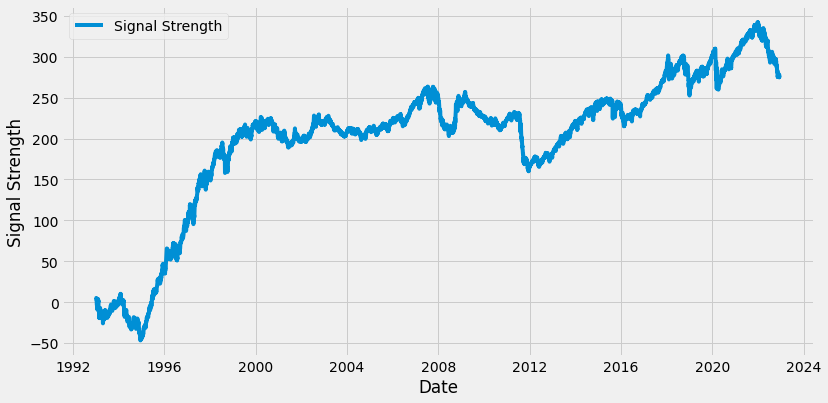

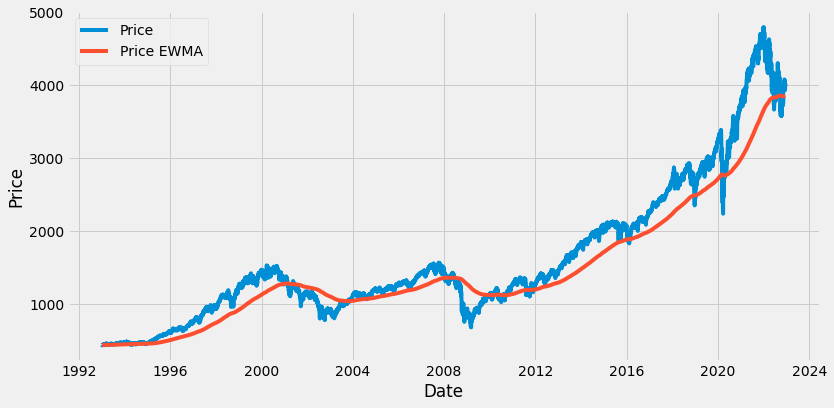

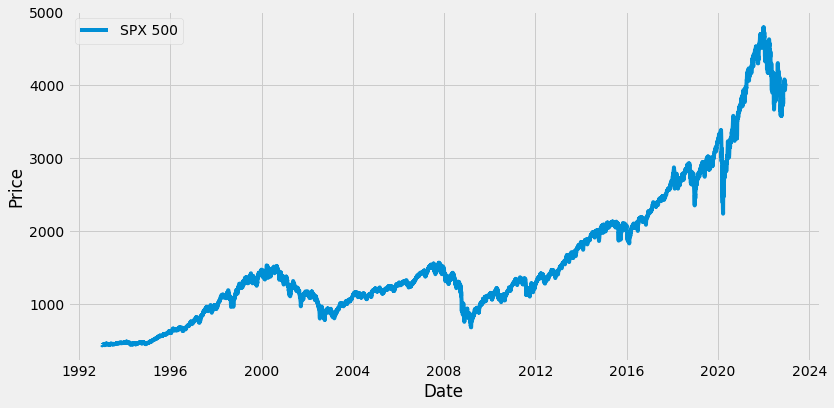

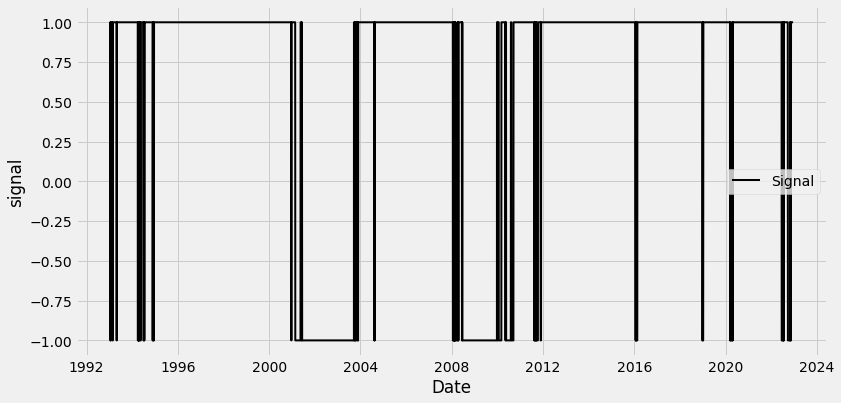

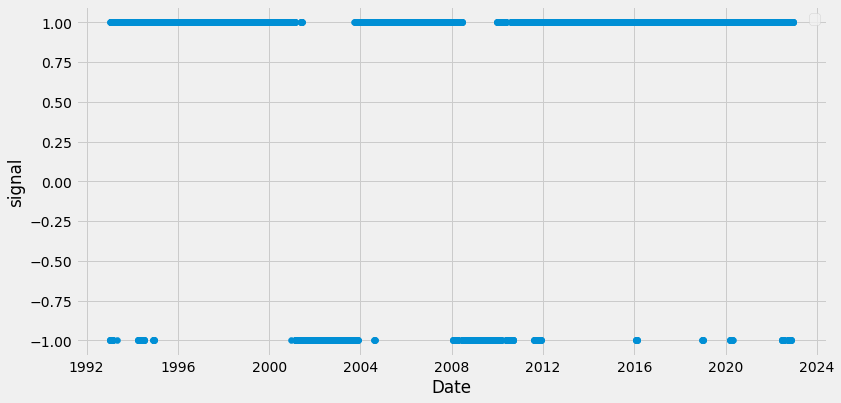

                     ^GSPC  ^TNX  ^VIX  vol_realized  signal_sign  ^GSPC_shift
Date                                                                          
1993-01-05 05:00:00    0.0   1.0   0.0           1.0          NaN          1.0
1993-01-06 05:00:00    1.0   1.0   1.0           1.0         -1.0          0.0
1993-01-07 05:00:00    0.0   1.0   1.0           1.0         -1.0          0.0
1993-01-08 05:00:00    0.0   0.0   0.0           1.0         -1.0          1.0
1993-01-11 05:00:00    1.0   0.0   0.0           1.0         -1.0          1.0
...                    ...   ...   ...           ...          ...          ...
2022-12-08 05:00:00    1.0   1.0   0.0           0.0          1.0          0.0
2022-12-09 05:00:00    0.0   1.0   1.0           1.0          1.0          1.0
2022-12-12 05:00:00    1.0   1.0   1.0           1.0          1.0          1.0
2022-12-13 05:00:00    1.0   0.0   0.0           1.0          1.0          0.0
2022-12-14 05:00:00    0.0   1.0   0.0           0.0

  0%|          | 0/7443 [00:00<?, ?it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 1/7443 [00:00<39:13,  3.16it/s]

100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 2/7443 [00:00<39:09,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 4/7443 [00:01<41:24,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 5/7443 [00:01<43:10,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 6/7443 [00:02<44:03,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 7/7443 [00:02<47:45,  2.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 8/7443 [00:02<49:32,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 9/7443 [00:03<46:29,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 10/7443 [00:03<51:18,  2.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 11/7443 [00:04<52:27,  2.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 12/7443 [00:04<52:09,  2.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 13/7443 [00:05<58:51,  2.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 14/7443 [00:05<58:16,  2.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 15/7443 [00:06<51:41,  2.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 16/7443 [00:06<51:19,  2.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 18/7443 [00:07<43:50,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 19/7443 [00:07<41:19,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 20/7443 [00:07<42:10,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 21/7443 [00:08<45:11,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 23/7443 [00:08<39:02,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 24/7443 [00:08<38:30,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 25/7443 [00:09<39:40,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 26/7443 [00:09<41:30,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 27/7443 [00:09<41:55,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 28/7443 [00:10<40:33,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 30/7443 [00:11<42:45,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 31/7443 [00:11<43:01,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 32/7443 [00:11<43:29,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 33/7443 [00:12<45:22,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 34/7443 [00:12<46:21,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 35/7443 [00:12<47:20,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 36/7443 [00:13<46:59,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 37/7443 [00:13<44:13,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 38/7443 [00:14<48:26,  2.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 39/7443 [00:14<48:41,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 40/7443 [00:14<47:06,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 41/7443 [00:15<46:36,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 42/7443 [00:15<46:43,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 43/7443 [00:16<52:29,  2.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 44/7443 [00:16<59:37,  2.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 45/7443 [00:17<52:25,  2.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 46/7443 [00:17<47:20,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 47/7443 [00:17<44:00,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 49/7443 [00:18<44:28,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 50/7443 [00:19<53:18,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 51/7443 [00:19<51:55,  2.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 52/7443 [00:19<52:53,  2.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 53/7443 [00:20<47:02,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 54/7443 [00:20<44:12,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 55/7443 [00:20<43:40,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 56/7443 [00:21<41:22,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 58/7443 [00:21<38:03,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 59/7443 [00:21<38:39,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 61/7443 [00:22<36:20,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 62/7443 [00:22<37:18,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 63/7443 [00:23<37:01,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 64/7443 [00:24<1:00:23,  2.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 65/7443 [00:24<57:48,  2.13it/s]  

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 66/7443 [00:24<58:20,  2.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 67/7443 [00:25<53:38,  2.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 68/7443 [00:25<49:23,  2.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 69/7443 [00:25<46:41,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 70/7443 [00:26<49:29,  2.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 71/7443 [00:26<48:55,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 72/7443 [00:27<45:41,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 73/7443 [00:27<50:38,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 74/7443 [00:28<52:49,  2.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 75/7443 [00:28<48:51,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 76/7443 [00:28<45:46,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 77/7443 [00:29<44:22,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 78/7443 [00:29<50:45,  2.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 79/7443 [00:30<58:45,  2.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 80/7443 [00:30<53:39,  2.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 81/7443 [00:31<56:48,  2.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 82/7443 [00:31<55:43,  2.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 83/7443 [00:32<58:22,  2.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 84/7443 [00:32<1:05:42,  1.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 85/7443 [00:33<1:03:46,  1.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 87/7443 [00:33<50:38,  2.42it/s]  

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 89/7443 [00:34<35:39,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 91/7443 [00:34<29:46,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 93/7443 [00:35<26:00,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 95/7443 [00:35<23:55,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 97/7443 [00:35<23:03,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 99/7443 [00:36<22:24,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 101/7443 [00:36<22:29,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 103/7443 [00:36<22:29,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 105/7443 [00:37<22:17,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 107/7443 [00:37<21:39,  5.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 109/7443 [00:37<21:38,  5.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 111/7443 [00:38<20:49,  5.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 113/7443 [00:38<21:33,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 115/7443 [00:38<20:24,  5.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 117/7443 [00:39<19:59,  6.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 119/7443 [00:39<19:50,  6.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 121/7443 [00:39<19:57,  6.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 123/7443 [00:40<19:37,  6.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 125/7443 [00:40<20:15,  6.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 127/7443 [00:40<20:30,  5.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 129/7443 [00:41<20:41,  5.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 131/7443 [00:41<20:40,  5.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 133/7443 [00:41<20:25,  5.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 135/7443 [00:42<20:38,  5.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 137/7443 [00:42<21:05,  5.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 139/7443 [00:42<20:22,  5.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 141/7443 [00:43<19:57,  6.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 143/7443 [00:43<19:50,  6.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 145/7443 [00:43<20:58,  5.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 147/7443 [00:44<21:46,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 149/7443 [00:44<22:13,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 151/7443 [00:45<22:48,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 153/7443 [00:45<22:42,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 155/7443 [00:45<22:18,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 157/7443 [00:46<22:45,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 159/7443 [00:46<22:43,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 161/7443 [00:46<22:17,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 163/7443 [00:47<22:23,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 165/7443 [00:47<22:57,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 167/7443 [00:48<22:11,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 169/7443 [00:48<21:55,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 171/7443 [00:48<22:18,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 173/7443 [00:49<21:50,  5.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 175/7443 [00:49<21:33,  5.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 177/7443 [00:49<21:30,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 179/7443 [00:50<21:28,  5.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 181/7443 [00:50<21:57,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 183/7443 [00:50<21:03,  5.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 185/7443 [00:51<20:33,  5.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 187/7443 [00:51<21:34,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 189/7443 [00:52<21:30,  5.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 191/7443 [00:52<21:45,  5.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 193/7443 [00:52<21:40,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 195/7443 [00:53<20:51,  5.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 197/7443 [00:53<20:24,  5.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 199/7443 [00:53<20:53,  5.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 201/7443 [00:54<20:31,  5.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 203/7443 [00:54<20:52,  5.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 205/7443 [00:54<21:26,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 207/7443 [00:55<20:58,  5.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 209/7443 [00:55<33:17,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 211/7443 [00:56<27:06,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 213/7443 [00:56<24:44,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 215/7443 [00:56<23:37,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 217/7443 [00:57<23:09,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 219/7443 [00:57<21:57,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 221/7443 [00:58<22:13,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 223/7443 [00:58<22:36,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 225/7443 [00:58<23:04,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 227/7443 [00:59<24:00,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 229/7443 [00:59<23:07,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 231/7443 [00:59<22:18,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 233/7443 [01:00<21:15,  5.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 235/7443 [01:00<21:08,  5.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 237/7443 [01:00<20:29,  5.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 239/7443 [01:01<20:19,  5.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 241/7443 [01:01<20:48,  5.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 243/7443 [01:02<20:46,  5.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 245/7443 [01:02<20:50,  5.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 247/7443 [01:02<20:56,  5.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 249/7443 [01:03<20:10,  5.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 251/7443 [01:03<20:17,  5.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 253/7443 [01:03<20:28,  5.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 255/7443 [01:04<20:53,  5.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 257/7443 [01:04<20:31,  5.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 259/7443 [01:04<20:24,  5.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 261/7443 [01:05<20:05,  5.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 263/7443 [01:05<20:14,  5.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 265/7443 [01:05<20:23,  5.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 267/7443 [01:06<21:04,  5.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 269/7443 [01:06<20:19,  5.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 271/7443 [01:06<19:55,  6.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 273/7443 [01:07<20:00,  5.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 275/7443 [01:07<20:02,  5.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 277/7443 [01:07<20:32,  5.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 279/7443 [01:08<20:04,  5.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 281/7443 [01:08<20:00,  5.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 283/7443 [01:08<20:47,  5.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 285/7443 [01:09<20:59,  5.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 287/7443 [01:09<20:34,  5.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 289/7443 [01:09<20:42,  5.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 291/7443 [01:10<21:21,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 293/7443 [01:10<21:09,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 295/7443 [01:11<20:40,  5.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 297/7443 [01:11<21:37,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 299/7443 [01:11<21:10,  5.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 301/7443 [01:12<21:02,  5.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 303/7443 [01:12<20:56,  5.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 305/7443 [01:12<21:07,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 307/7443 [01:13<20:48,  5.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 309/7443 [01:13<20:26,  5.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 311/7443 [01:13<20:51,  5.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 313/7443 [01:14<21:19,  5.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 315/7443 [01:14<21:09,  5.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 317/7443 [01:14<20:55,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 319/7443 [01:15<20:46,  5.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 321/7443 [01:15<21:22,  5.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 323/7443 [01:16<21:36,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 325/7443 [01:16<22:49,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 327/7443 [01:16<22:14,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 329/7443 [01:17<21:53,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 331/7443 [01:17<22:14,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 333/7443 [01:17<22:54,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 335/7443 [01:18<22:50,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 337/7443 [01:18<22:46,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 339/7443 [01:19<22:27,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 341/7443 [01:19<22:37,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 343/7443 [01:19<22:15,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 345/7443 [01:20<21:50,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 347/7443 [01:20<21:58,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 349/7443 [01:20<21:26,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 351/7443 [01:21<21:54,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 353/7443 [01:21<21:46,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 355/7443 [01:22<21:55,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 357/7443 [01:22<21:38,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 359/7443 [01:22<21:45,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 361/7443 [01:23<21:46,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 363/7443 [01:23<22:07,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 365/7443 [01:23<21:42,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 367/7443 [01:24<21:04,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 369/7443 [01:24<22:09,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 370/7443 [01:25<32:22,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 372/7443 [01:25<26:45,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 374/7443 [01:25<23:47,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 376/7443 [01:26<21:57,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 378/7443 [01:26<21:21,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 380/7443 [01:26<22:09,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 382/7443 [01:27<21:21,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 384/7443 [01:27<21:17,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 386/7443 [01:27<21:00,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 388/7443 [01:28<21:06,  5.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 390/7443 [01:28<21:25,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 392/7443 [01:29<20:44,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 394/7443 [01:29<21:00,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 396/7443 [01:29<21:21,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 398/7443 [01:30<21:50,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 400/7443 [01:30<21:06,  5.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 402/7443 [01:30<21:09,  5.55it/s]

500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 403/7443 [01:31<21:26,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 405/7443 [01:31<20:37,  5.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 407/7443 [01:31<21:17,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 409/7443 [01:32<20:56,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 411/7443 [01:32<20:54,  5.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 413/7443 [01:32<21:13,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 415/7443 [01:33<21:40,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 417/7443 [01:33<20:50,  5.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 419/7443 [01:33<20:22,  5.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 421/7443 [01:34<21:13,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 423/7443 [01:34<21:00,  5.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 425/7443 [01:35<20:24,  5.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 427/7443 [01:35<20:28,  5.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 429/7443 [01:35<20:30,  5.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 431/7443 [01:36<20:21,  5.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 433/7443 [01:36<20:59,  5.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 435/7443 [01:36<21:17,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 437/7443 [01:37<20:43,  5.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 439/7443 [01:37<21:11,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 441/7443 [01:37<20:53,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 443/7443 [01:38<20:57,  5.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 445/7443 [01:38<20:35,  5.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 447/7443 [01:38<20:24,  5.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 449/7443 [01:39<19:59,  5.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 451/7443 [01:39<20:09,  5.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 453/7443 [01:40<20:32,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 455/7443 [01:40<20:23,  5.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 457/7443 [01:40<20:24,  5.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 459/7443 [01:41<20:40,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 461/7443 [01:41<20:39,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 463/7443 [01:41<21:08,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 465/7443 [01:42<20:44,  5.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 467/7443 [01:42<20:25,  5.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 469/7443 [01:42<20:53,  5.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 471/7443 [01:43<20:19,  5.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 473/7443 [01:43<20:29,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 475/7443 [01:43<20:49,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 477/7443 [01:44<20:55,  5.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 479/7443 [01:44<20:16,  5.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 481/7443 [01:45<20:51,  5.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 483/7443 [01:45<20:46,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 485/7443 [01:45<20:20,  5.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 487/7443 [01:46<20:04,  5.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 489/7443 [01:46<20:22,  5.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 491/7443 [01:46<20:54,  5.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 493/7443 [01:47<20:52,  5.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 495/7443 [01:47<20:50,  5.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 497/7443 [01:47<21:03,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 499/7443 [01:48<20:52,  5.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 501/7443 [01:48<20:42,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 503/7443 [01:48<20:47,  5.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 505/7443 [01:49<21:03,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 507/7443 [01:49<21:10,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 509/7443 [01:50<21:41,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 511/7443 [01:50<21:14,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 513/7443 [01:50<21:13,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 515/7443 [01:51<20:56,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 517/7443 [01:51<20:48,  5.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 519/7443 [01:51<21:18,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 521/7443 [01:52<22:14,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 523/7443 [01:52<21:37,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 525/7443 [01:53<21:23,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 527/7443 [01:53<21:17,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 529/7443 [01:53<20:59,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 531/7443 [01:54<21:08,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 533/7443 [01:54<21:18,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 535/7443 [01:54<21:53,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 537/7443 [01:55<22:17,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 538/7443 [01:55<22:18,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 540/7443 [01:55<22:07,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 542/7443 [01:56<22:24,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 543/7443 [01:56<22:29,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 545/7443 [01:56<22:13,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 546/7443 [01:57<23:05,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 548/7443 [01:57<22:41,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 550/7443 [01:57<22:08,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 551/7443 [01:58<23:15,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 552/7443 [01:58<23:30,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 554/7443 [01:58<22:12,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 556/7443 [01:59<21:40,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 558/7443 [01:59<21:54,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 560/7443 [01:59<21:35,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 562/7443 [02:00<20:50,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 564/7443 [02:00<21:16,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 566/7443 [02:00<21:16,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 568/7443 [02:01<21:23,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 570/7443 [02:01<21:39,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 572/7443 [02:02<32:05,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 574/7443 [02:02<26:41,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 575/7443 [02:02<25:03,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 576/7443 [02:03<32:42,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 577/7443 [02:04<45:51,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 579/7443 [02:04<36:35,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 580/7443 [02:04<38:06,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 581/7443 [02:05<50:26,  2.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 583/7443 [02:06<40:04,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 584/7443 [02:06<45:19,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 586/7443 [02:07<48:39,  2.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 588/7443 [02:08<34:48,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 590/7443 [02:08<27:56,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 592/7443 [02:08<24:43,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 594/7443 [02:09<22:46,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 596/7443 [02:09<22:16,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 598/7443 [02:09<21:45,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 600/7443 [02:10<21:49,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 602/7443 [02:10<21:59,  5.18it/s]

700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 603/7443 [02:10<21:20,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 605/7443 [02:11<22:03,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 607/7443 [02:11<22:04,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 609/7443 [02:11<21:30,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 611/7443 [02:12<21:23,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 613/7443 [02:12<21:13,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 615/7443 [02:13<20:38,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 617/7443 [02:13<20:26,  5.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 619/7443 [02:13<20:11,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 621/7443 [02:14<20:16,  5.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 623/7443 [02:14<19:59,  5.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 625/7443 [02:14<20:35,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 627/7443 [02:15<20:21,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 629/7443 [02:15<20:20,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 631/7443 [02:15<20:42,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 633/7443 [02:16<20:49,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 635/7443 [02:16<20:43,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 637/7443 [02:17<20:16,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 639/7443 [02:17<20:44,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 641/7443 [02:17<21:05,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 642/7443 [02:18<21:37,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 644/7443 [02:18<21:14,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 646/7443 [02:18<21:36,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 648/7443 [02:19<21:29,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 650/7443 [02:19<20:57,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 652/7443 [02:19<21:08,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 654/7443 [02:20<21:13,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 656/7443 [02:20<20:28,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 658/7443 [02:21<20:57,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 660/7443 [02:21<20:45,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 662/7443 [02:21<20:24,  5.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 664/7443 [02:22<21:08,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 666/7443 [02:22<20:32,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 668/7443 [02:22<21:09,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 670/7443 [02:23<20:27,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 672/7443 [02:23<20:22,  5.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 674/7443 [02:23<20:39,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 676/7443 [02:24<20:38,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 678/7443 [02:24<20:24,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 680/7443 [02:25<20:04,  5.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 682/7443 [02:25<20:06,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 684/7443 [02:25<19:59,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 686/7443 [02:26<20:37,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 688/7443 [02:26<20:48,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 690/7443 [02:26<20:24,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 692/7443 [02:27<20:00,  5.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 694/7443 [02:27<19:50,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 696/7443 [02:27<19:46,  5.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 698/7443 [02:28<20:27,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 700/7443 [02:28<20:20,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 702/7443 [02:29<20:35,  5.46it/s]

800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 703/7443 [02:29<20:57,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 705/7443 [02:29<20:52,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 707/7443 [02:29<21:20,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 709/7443 [02:30<21:18,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 711/7443 [02:30<20:45,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 713/7443 [02:31<20:32,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 715/7443 [02:31<20:57,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 717/7443 [02:31<20:20,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 719/7443 [02:32<20:16,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 721/7443 [02:32<20:00,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 723/7443 [02:32<19:48,  5.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 725/7443 [02:33<20:04,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 727/7443 [02:33<20:03,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 729/7443 [02:33<19:29,  5.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 731/7443 [02:34<19:50,  5.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 732/7443 [02:34<21:11,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 734/7443 [02:34<20:45,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 736/7443 [02:35<20:44,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 738/7443 [02:35<20:29,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 740/7443 [02:36<20:42,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 742/7443 [02:36<20:49,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 744/7443 [02:36<20:46,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 746/7443 [02:37<20:10,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 748/7443 [02:37<19:51,  5.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 750/7443 [02:37<19:18,  5.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 752/7443 [02:38<18:38,  5.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 754/7443 [02:38<19:12,  5.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 756/7443 [02:38<19:09,  5.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 758/7443 [02:39<19:55,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 760/7443 [02:39<19:58,  5.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 762/7443 [02:39<20:43,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 764/7443 [02:40<20:52,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 766/7443 [02:40<20:34,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 768/7443 [02:41<20:03,  5.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 770/7443 [02:41<20:25,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 772/7443 [02:41<20:06,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 774/7443 [02:42<19:35,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 776/7443 [02:42<20:04,  5.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 778/7443 [02:42<19:50,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 780/7443 [02:43<19:50,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 782/7443 [02:43<19:33,  5.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 784/7443 [02:43<19:36,  5.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 786/7443 [02:44<19:10,  5.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 788/7443 [02:44<19:41,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 790/7443 [02:44<19:23,  5.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 792/7443 [02:45<18:51,  5.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 794/7443 [02:45<29:23,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 796/7443 [02:46<23:52,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 798/7443 [02:46<22:07,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 800/7443 [02:47<20:44,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 802/7443 [02:47<20:30,  5.40it/s]

900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 803/7443 [02:47<20:30,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 805/7443 [02:47<19:54,  5.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 807/7443 [02:48<20:55,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 808/7443 [02:48<21:04,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 810/7443 [02:48<19:59,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 812/7443 [02:49<19:29,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 814/7443 [02:49<19:55,  5.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 816/7443 [02:49<19:53,  5.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 818/7443 [02:50<20:33,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 820/7443 [02:50<20:13,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 822/7443 [02:51<19:30,  5.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 824/7443 [02:51<20:03,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 826/7443 [02:51<20:01,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 828/7443 [02:52<19:20,  5.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 830/7443 [02:52<19:35,  5.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 832/7443 [02:52<19:42,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 834/7443 [02:53<20:00,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 836/7443 [02:53<19:45,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 838/7443 [02:53<19:24,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 840/7443 [02:54<18:52,  5.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 842/7443 [02:54<19:35,  5.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 844/7443 [02:54<19:08,  5.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 846/7443 [02:55<19:24,  5.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 848/7443 [02:55<20:09,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 850/7443 [02:56<19:39,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 852/7443 [02:56<19:54,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 854/7443 [02:56<20:40,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 856/7443 [02:57<20:05,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 858/7443 [02:57<19:25,  5.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 860/7443 [02:57<20:08,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 862/7443 [02:58<20:26,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 864/7443 [02:58<20:21,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 866/7443 [02:59<19:53,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 868/7443 [02:59<19:51,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 870/7443 [02:59<20:12,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 872/7443 [03:00<19:37,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 874/7443 [03:00<19:48,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 876/7443 [03:00<20:44,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 878/7443 [03:01<20:33,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 880/7443 [03:01<20:17,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 882/7443 [03:02<20:27,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 884/7443 [03:02<20:26,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 886/7443 [03:02<21:07,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 888/7443 [03:03<20:54,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 890/7443 [03:03<20:24,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 892/7443 [03:03<21:04,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 894/7443 [03:04<20:39,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 896/7443 [03:04<20:11,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 898/7443 [03:05<20:34,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 900/7443 [03:05<20:21,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 902/7443 [03:05<20:09,  5.41it/s]

1000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 903/7443 [03:05<20:37,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 905/7443 [03:06<20:24,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 907/7443 [03:06<20:35,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 909/7443 [03:07<20:14,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 911/7443 [03:07<20:03,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 913/7443 [03:07<20:13,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 915/7443 [03:08<20:28,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 917/7443 [03:08<19:59,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 919/7443 [03:08<20:40,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 921/7443 [03:09<20:48,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 923/7443 [03:09<20:45,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 925/7443 [03:10<20:42,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 927/7443 [03:10<20:07,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 929/7443 [03:10<20:00,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 931/7443 [03:11<20:19,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 933/7443 [03:11<20:40,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 935/7443 [03:12<21:30,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 937/7443 [03:12<21:20,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 938/7443 [03:12<21:20,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 939/7443 [03:12<23:47,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 940/7443 [03:13<26:29,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 941/7443 [03:13<29:01,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 942/7443 [03:13<31:13,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 943/7443 [03:14<32:53,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 944/7443 [03:14<34:03,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 945/7443 [03:14<36:05,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 946/7443 [03:15<36:02,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 947/7443 [03:15<35:16,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 948/7443 [03:15<35:00,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 949/7443 [03:16<35:13,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 950/7443 [03:16<34:02,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 951/7443 [03:16<34:05,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 952/7443 [03:17<33:19,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 953/7443 [03:17<33:53,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 954/7443 [03:17<35:54,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 955/7443 [03:18<34:49,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 956/7443 [03:18<35:12,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 957/7443 [03:18<37:09,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 958/7443 [03:19<36:22,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 959/7443 [03:19<36:51,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 960/7443 [03:19<35:45,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 961/7443 [03:20<35:22,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 962/7443 [03:20<35:08,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 963/7443 [03:20<33:47,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 964/7443 [03:21<33:41,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 965/7443 [03:21<32:57,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 966/7443 [03:21<34:37,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 967/7443 [03:22<34:46,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 968/7443 [03:22<34:15,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 969/7443 [03:22<33:59,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 971/7443 [03:23<29:30,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 973/7443 [03:23<24:21,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 975/7443 [03:23<22:00,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 977/7443 [03:24<21:21,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 979/7443 [03:24<20:40,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 981/7443 [03:24<20:28,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 983/7443 [03:25<20:18,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 985/7443 [03:25<20:23,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 987/7443 [03:26<20:07,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 989/7443 [03:26<20:03,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 991/7443 [03:26<20:47,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 993/7443 [03:27<20:03,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 995/7443 [03:27<20:02,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 997/7443 [03:28<19:54,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 999/7443 [03:28<20:08,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 1001/7443 [03:28<20:01,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 1003/7443 [03:29<20:23,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1005/7443 [03:29<19:38,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1007/7443 [03:29<20:06,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1009/7443 [03:30<19:39,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1011/7443 [03:30<20:01,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1013/7443 [03:31<19:58,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1015/7443 [03:31<19:46,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1016/7443 [03:31<20:17,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1018/7443 [03:31<20:02,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1020/7443 [03:32<31:01,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1022/7443 [03:33<25:28,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1024/7443 [03:33<22:55,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1026/7443 [03:33<22:02,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1028/7443 [03:34<21:25,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1030/7443 [03:34<20:07,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1032/7443 [03:34<19:40,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1034/7443 [03:35<18:52,  5.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1036/7443 [03:35<19:08,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1038/7443 [03:36<19:21,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1040/7443 [03:36<19:29,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1042/7443 [03:36<19:47,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1044/7443 [03:37<20:18,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1046/7443 [03:37<19:43,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1048/7443 [03:37<20:03,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1050/7443 [03:38<19:34,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1052/7443 [03:38<19:57,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1054/7443 [03:39<20:08,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1056/7443 [03:39<19:53,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1058/7443 [03:39<19:29,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1060/7443 [03:40<19:23,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1062/7443 [03:40<19:16,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1064/7443 [03:40<19:30,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1066/7443 [03:41<19:32,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1068/7443 [03:41<19:35,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1070/7443 [03:42<19:47,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1072/7443 [03:42<20:04,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1074/7443 [03:42<19:25,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1076/7443 [03:43<20:22,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1078/7443 [03:43<20:00,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1080/7443 [03:43<19:41,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1082/7443 [03:44<19:42,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1084/7443 [03:44<19:14,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1086/7443 [03:45<19:57,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1088/7443 [03:45<19:55,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1090/7443 [03:45<19:37,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1092/7443 [03:46<19:43,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1094/7443 [03:46<20:01,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1096/7443 [03:46<19:45,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1098/7443 [03:47<19:40,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1100/7443 [03:47<18:51,  5.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1102/7443 [03:47<18:51,  5.60it/s]

1200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1103/7443 [03:48<20:00,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1105/7443 [03:48<19:37,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1107/7443 [03:48<19:53,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1109/7443 [03:49<19:54,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1111/7443 [03:49<19:53,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1113/7443 [03:50<20:22,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1115/7443 [03:50<20:48,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1117/7443 [03:50<20:14,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1119/7443 [03:51<20:17,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1121/7443 [03:51<20:10,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1123/7443 [03:52<19:39,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1125/7443 [03:52<20:19,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1127/7443 [03:52<19:51,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1129/7443 [03:53<19:38,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1131/7443 [03:53<20:05,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1133/7443 [03:53<20:02,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1135/7443 [03:54<20:17,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1137/7443 [03:54<20:14,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1139/7443 [03:55<19:34,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1141/7443 [03:55<20:01,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1143/7443 [03:55<19:32,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1145/7443 [03:56<19:19,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1147/7443 [03:56<19:37,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1149/7443 [03:56<19:54,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1151/7443 [03:57<20:25,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1152/7443 [03:57<20:00,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1154/7443 [03:57<19:36,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1156/7443 [03:58<19:28,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1158/7443 [03:58<19:34,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1160/7443 [03:59<19:16,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1162/7443 [03:59<19:48,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1164/7443 [03:59<19:20,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1166/7443 [04:00<19:08,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1168/7443 [04:00<19:33,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1170/7443 [04:00<19:28,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1172/7443 [04:01<19:32,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1174/7443 [04:01<19:52,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1176/7443 [04:02<19:21,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1178/7443 [04:02<20:02,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1180/7443 [04:02<19:50,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1182/7443 [04:03<20:01,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1184/7443 [04:03<19:51,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1186/7443 [04:03<20:12,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1188/7443 [04:04<19:56,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1190/7443 [04:04<20:03,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1192/7443 [04:05<19:29,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1194/7443 [04:05<19:33,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1196/7443 [04:05<19:47,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1198/7443 [04:06<19:32,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1200/7443 [04:06<19:29,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1201/7443 [04:06<20:02,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1203/7443 [04:07<19:28,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1205/7443 [04:07<19:59,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1207/7443 [04:07<19:55,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1209/7443 [04:08<20:02,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1211/7443 [04:08<20:00,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1213/7443 [04:09<19:11,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1215/7443 [04:09<19:16,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1217/7443 [04:09<19:37,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1219/7443 [04:10<19:06,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1221/7443 [04:10<20:00,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1223/7443 [04:11<19:39,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1225/7443 [04:11<19:34,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1227/7443 [04:11<19:51,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1229/7443 [04:12<19:06,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1231/7443 [04:12<19:06,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1233/7443 [04:12<19:23,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1235/7443 [04:13<19:09,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1237/7443 [04:13<19:27,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1239/7443 [04:14<19:11,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1241/7443 [04:14<19:36,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1243/7443 [04:14<19:29,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1244/7443 [04:14<19:48,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1246/7443 [04:15<29:35,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1248/7443 [04:16<24:20,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1250/7443 [04:16<21:52,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1252/7443 [04:16<20:57,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1254/7443 [04:17<19:47,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1256/7443 [04:17<20:05,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1258/7443 [04:17<19:26,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1260/7443 [04:18<19:49,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1262/7443 [04:18<19:38,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1264/7443 [04:19<19:15,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1266/7443 [04:19<18:55,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1268/7443 [04:19<19:39,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1270/7443 [04:20<19:27,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1272/7443 [04:20<19:42,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1274/7443 [04:21<19:28,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1276/7443 [04:21<19:16,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1278/7443 [04:21<19:06,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1280/7443 [04:22<18:44,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1282/7443 [04:22<18:37,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1284/7443 [04:22<18:22,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1286/7443 [04:23<18:55,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1288/7443 [04:23<18:10,  5.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1290/7443 [04:23<19:06,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1292/7443 [04:24<18:49,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1294/7443 [04:24<19:47,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1295/7443 [04:24<19:48,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1297/7443 [04:25<19:08,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1299/7443 [04:25<18:56,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1301/7443 [04:26<19:17,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1303/7443 [04:26<19:22,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1305/7443 [04:26<19:13,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1307/7443 [04:27<19:14,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1309/7443 [04:27<18:48,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1311/7443 [04:27<19:20,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1313/7443 [04:28<19:05,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1315/7443 [04:28<19:03,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1317/7443 [04:29<18:59,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1319/7443 [04:29<18:53,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1321/7443 [04:29<19:08,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1323/7443 [04:30<18:52,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1325/7443 [04:30<18:51,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1327/7443 [04:30<18:56,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1329/7443 [04:31<19:05,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1331/7443 [04:31<18:38,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1333/7443 [04:32<18:50,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1335/7443 [04:32<18:49,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1337/7443 [04:32<18:36,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1339/7443 [04:33<17:58,  5.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1341/7443 [04:33<18:22,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1343/7443 [04:33<18:29,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1345/7443 [04:34<18:43,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1347/7443 [04:34<18:21,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1349/7443 [04:34<18:29,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1351/7443 [04:35<19:05,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1353/7443 [04:35<18:54,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1355/7443 [04:36<18:33,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1357/7443 [04:36<19:12,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1359/7443 [04:36<19:02,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1361/7443 [04:37<18:19,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1363/7443 [04:37<18:54,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1365/7443 [04:37<18:50,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1367/7443 [04:38<18:53,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1369/7443 [04:38<19:08,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1371/7443 [04:39<18:47,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1373/7443 [04:39<18:48,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1375/7443 [04:39<19:42,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1377/7443 [04:40<18:52,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1379/7443 [04:40<19:20,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1381/7443 [04:40<19:04,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1383/7443 [04:41<18:44,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1385/7443 [04:41<18:31,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1387/7443 [04:42<18:40,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1389/7443 [04:42<18:48,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1391/7443 [04:42<19:02,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1393/7443 [04:43<18:48,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1395/7443 [04:43<18:59,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1397/7443 [04:43<18:29,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1399/7443 [04:44<18:55,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1401/7443 [04:44<19:15,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1403/7443 [04:45<19:21,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1405/7443 [04:45<19:32,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1406/7443 [04:45<19:40,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1408/7443 [04:46<19:59,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1410/7443 [04:46<19:40,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1412/7443 [04:46<19:12,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1414/7443 [04:47<18:42,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1416/7443 [04:47<19:25,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1418/7443 [04:48<19:40,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1420/7443 [04:48<19:26,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1422/7443 [04:48<19:16,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1424/7443 [04:49<19:29,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1426/7443 [04:49<19:32,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1428/7443 [04:50<19:23,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1430/7443 [04:50<19:01,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1432/7443 [04:50<18:59,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1434/7443 [04:51<18:36,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1436/7443 [04:51<18:29,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1438/7443 [04:51<18:44,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1440/7443 [04:52<18:41,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1442/7443 [04:52<19:06,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1444/7443 [04:53<18:50,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1446/7443 [04:53<18:21,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1448/7443 [04:53<18:36,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1450/7443 [04:54<18:12,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1452/7443 [04:54<18:03,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1454/7443 [04:54<18:32,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1456/7443 [04:55<18:33,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1458/7443 [04:55<18:56,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1460/7443 [04:56<19:29,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1462/7443 [04:56<18:59,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1464/7443 [04:56<19:21,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1466/7443 [04:57<28:08,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1468/7443 [04:57<23:52,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1470/7443 [04:58<21:09,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1472/7443 [04:58<20:07,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1474/7443 [04:59<19:44,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1476/7443 [04:59<19:16,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1478/7443 [04:59<19:29,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1480/7443 [05:00<19:20,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1481/7443 [05:00<19:26,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1483/7443 [05:00<19:17,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1485/7443 [05:01<18:55,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1487/7443 [05:01<18:55,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1489/7443 [05:01<19:38,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1490/7443 [05:02<19:25,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1492/7443 [05:02<18:49,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1494/7443 [05:02<18:32,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1496/7443 [05:03<18:56,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1498/7443 [05:03<18:43,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1500/7443 [05:04<18:57,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1502/7443 [05:04<19:06,  5.18it/s]

1600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1503/7443 [05:04<19:08,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1505/7443 [05:05<19:03,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1507/7443 [05:05<18:52,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1509/7443 [05:05<18:22,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1511/7443 [05:06<18:13,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1513/7443 [05:06<18:13,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1515/7443 [05:06<18:19,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1517/7443 [05:07<17:52,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1519/7443 [05:07<17:50,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1521/7443 [05:07<17:37,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1523/7443 [05:08<17:20,  5.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1525/7443 [05:08<17:37,  5.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1527/7443 [05:09<17:52,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1529/7443 [05:09<18:07,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1531/7443 [05:09<18:02,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1533/7443 [05:10<18:18,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1535/7443 [05:10<18:23,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1537/7443 [05:10<18:06,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1539/7443 [05:11<18:19,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1541/7443 [05:11<18:25,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1543/7443 [05:11<18:01,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1545/7443 [05:12<18:25,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1547/7443 [05:12<18:02,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1549/7443 [05:13<17:50,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1551/7443 [05:13<17:58,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1553/7443 [05:13<17:46,  5.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1555/7443 [05:14<18:19,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1557/7443 [05:14<18:15,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1559/7443 [05:14<18:05,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1561/7443 [05:15<18:23,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1563/7443 [05:15<18:28,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1565/7443 [05:16<18:07,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1567/7443 [05:16<17:56,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1569/7443 [05:16<18:34,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1571/7443 [05:17<18:34,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1573/7443 [05:17<18:46,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1575/7443 [05:17<18:23,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1577/7443 [05:18<18:15,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1579/7443 [05:18<18:12,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1581/7443 [05:19<17:58,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1583/7443 [05:19<18:26,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1585/7443 [05:19<18:29,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1587/7443 [05:20<18:04,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1589/7443 [05:20<18:57,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1591/7443 [05:21<19:23,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1593/7443 [05:21<19:27,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1595/7443 [05:21<19:12,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1597/7443 [05:22<18:34,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1599/7443 [05:22<18:13,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1601/7443 [05:22<18:07,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1603/7443 [05:23<17:45,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1605/7443 [05:23<17:56,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1607/7443 [05:24<18:32,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1609/7443 [05:24<18:34,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1611/7443 [05:24<18:37,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1613/7443 [05:25<19:07,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1614/7443 [05:25<19:08,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1616/7443 [05:25<18:52,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1618/7443 [05:26<18:41,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1620/7443 [05:26<18:36,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1622/7443 [05:26<18:15,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1624/7443 [05:27<19:04,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1626/7443 [05:27<19:00,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1628/7443 [05:28<18:20,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1630/7443 [05:28<18:13,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1632/7443 [05:28<18:23,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1634/7443 [05:29<19:02,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1635/7443 [05:29<19:13,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1636/7443 [05:29<19:50,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1638/7443 [05:30<19:30,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1640/7443 [05:30<19:03,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1642/7443 [05:30<18:49,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1644/7443 [05:31<18:04,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1646/7443 [05:31<18:50,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1648/7443 [05:32<18:30,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1650/7443 [05:32<18:06,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1652/7443 [05:32<18:31,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1654/7443 [05:33<18:35,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1656/7443 [05:33<18:05,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1658/7443 [05:33<18:30,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1660/7443 [05:34<18:24,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1662/7443 [05:34<19:06,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1663/7443 [05:34<19:13,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1665/7443 [05:35<18:44,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1667/7443 [05:35<18:49,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1668/7443 [05:35<19:22,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1670/7443 [05:36<19:01,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1672/7443 [05:36<18:49,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1674/7443 [05:37<18:45,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1675/7443 [05:37<18:44,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1677/7443 [05:37<19:08,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1678/7443 [05:37<19:08,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1680/7443 [05:38<18:03,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1682/7443 [05:38<18:32,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1684/7443 [05:39<18:39,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1686/7443 [05:39<18:22,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1688/7443 [05:39<18:09,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1690/7443 [05:40<18:41,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1692/7443 [05:40<28:00,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1694/7443 [05:41<22:40,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1696/7443 [05:41<20:30,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1698/7443 [05:42<19:27,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1700/7443 [05:42<18:50,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1702/7443 [05:42<18:43,  5.11it/s]

1800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1703/7443 [05:43<19:05,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1705/7443 [05:43<18:32,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1707/7443 [05:43<18:29,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1709/7443 [05:44<18:58,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1710/7443 [05:44<18:50,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1712/7443 [05:44<18:55,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1714/7443 [05:45<18:42,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1716/7443 [05:45<18:36,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1718/7443 [05:46<18:30,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1719/7443 [05:46<19:00,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1721/7443 [05:46<18:43,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1723/7443 [05:47<17:52,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1725/7443 [05:47<17:41,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1727/7443 [05:47<17:35,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1729/7443 [05:48<18:01,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1730/7443 [05:48<18:28,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1732/7443 [05:48<18:10,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1734/7443 [05:49<17:37,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1736/7443 [05:49<17:39,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1738/7443 [05:49<17:41,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1740/7443 [05:50<18:01,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1741/7443 [05:50<18:24,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1743/7443 [05:50<18:25,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1745/7443 [05:51<18:27,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1747/7443 [05:51<18:12,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1749/7443 [05:51<18:16,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1751/7443 [05:52<18:20,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1753/7443 [05:52<18:38,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1755/7443 [05:53<18:24,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1757/7443 [05:53<18:44,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1759/7443 [05:53<18:21,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1761/7443 [05:54<18:18,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1763/7443 [05:54<18:30,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1765/7443 [05:55<18:03,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1767/7443 [05:55<18:21,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1769/7443 [05:55<19:04,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1771/7443 [05:56<18:18,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1773/7443 [05:56<18:34,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1775/7443 [05:57<18:31,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1777/7443 [05:57<18:18,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1779/7443 [05:57<17:37,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1781/7443 [05:58<17:56,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1783/7443 [05:58<18:20,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1785/7443 [05:58<18:00,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1787/7443 [05:59<17:56,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1789/7443 [05:59<17:49,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1791/7443 [06:00<17:40,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1793/7443 [06:00<18:26,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1795/7443 [06:00<18:05,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1797/7443 [06:01<17:49,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1798/7443 [06:01<18:14,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1800/7443 [06:01<18:20,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1802/7443 [06:02<18:13,  5.16it/s]

1900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1803/7443 [06:02<18:10,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1805/7443 [06:02<17:51,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1807/7443 [06:03<17:33,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1809/7443 [06:03<17:55,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1811/7443 [06:03<17:24,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1813/7443 [06:04<17:17,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1815/7443 [06:04<18:09,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1817/7443 [06:05<17:57,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1819/7443 [06:05<17:52,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1821/7443 [06:05<18:03,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1823/7443 [06:06<18:09,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1825/7443 [06:06<17:44,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1827/7443 [06:07<17:53,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1829/7443 [06:07<17:50,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1831/7443 [06:07<18:04,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1833/7443 [06:08<17:42,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1835/7443 [06:08<17:52,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1837/7443 [06:08<18:08,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1839/7443 [06:09<18:56,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1841/7443 [06:09<18:37,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1843/7443 [06:10<18:15,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1845/7443 [06:10<17:54,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1847/7443 [06:10<17:49,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1849/7443 [06:11<17:16,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1851/7443 [06:11<17:27,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1853/7443 [06:12<17:08,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1855/7443 [06:12<17:30,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1857/7443 [06:12<17:54,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1858/7443 [06:13<18:21,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1860/7443 [06:13<17:57,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1862/7443 [06:13<17:58,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1864/7443 [06:14<18:04,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1866/7443 [06:14<17:44,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1868/7443 [06:14<17:58,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1870/7443 [06:15<17:44,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1872/7443 [06:15<17:24,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1874/7443 [06:16<17:31,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1876/7443 [06:16<17:38,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1878/7443 [06:16<17:32,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1880/7443 [06:17<18:01,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1882/7443 [06:17<17:58,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1883/7443 [06:17<18:31,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1885/7443 [06:18<18:03,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1887/7443 [06:18<17:45,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1889/7443 [06:19<18:05,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1891/7443 [06:19<18:00,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1893/7443 [06:19<18:06,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1895/7443 [06:20<18:25,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1896/7443 [06:20<18:45,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1898/7443 [06:20<18:17,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1900/7443 [06:21<18:43,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1901/7443 [06:21<19:10,  4.82it/s]

2000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1903/7443 [06:21<19:02,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1905/7443 [06:22<27:47,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1907/7443 [06:22<22:33,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1909/7443 [06:23<20:29,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1911/7443 [06:23<19:00,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1913/7443 [06:24<18:39,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1915/7443 [06:24<18:26,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1917/7443 [06:24<18:08,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1919/7443 [06:25<18:45,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1921/7443 [06:25<18:17,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).

 26%|██▌       | 1922/7443 [06:25<18:12,  5.05it/s]


[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1924/7443 [06:26<18:17,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1926/7443 [06:26<18:00,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1928/7443 [06:27<17:55,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1930/7443 [06:27<18:07,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1932/7443 [06:27<18:16,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1934/7443 [06:28<18:05,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1936/7443 [06:28<18:15,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1938/7443 [06:29<17:48,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1940/7443 [06:29<17:52,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1942/7443 [06:29<18:41,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1943/7443 [06:30<18:26,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1945/7443 [06:30<18:12,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1947/7443 [06:30<17:44,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1949/7443 [06:31<18:13,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1950/7443 [06:31<18:02,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1952/7443 [06:31<18:02,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1954/7443 [06:32<18:26,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1955/7443 [06:32<18:20,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1957/7443 [06:32<17:50,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1959/7443 [06:33<18:15,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1961/7443 [06:33<17:10,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1963/7443 [06:34<16:38,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1965/7443 [06:34<16:54,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1967/7443 [06:34<17:12,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1969/7443 [06:35<17:22,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1971/7443 [06:35<17:19,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1973/7443 [06:35<17:15,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1975/7443 [06:36<17:51,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1976/7443 [06:36<17:54,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1978/7443 [06:36<17:58,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1980/7443 [06:37<18:15,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1982/7443 [06:37<17:45,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1984/7443 [06:38<17:09,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1986/7443 [06:38<17:09,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1988/7443 [06:38<17:01,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1990/7443 [06:39<16:32,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1992/7443 [06:39<17:17,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1994/7443 [06:40<17:50,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1996/7443 [06:40<18:27,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1997/7443 [06:40<18:42,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1999/7443 [06:41<18:14,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2001/7443 [06:41<18:28,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2003/7443 [06:41<18:21,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2005/7443 [06:42<17:49,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2007/7443 [06:42<18:39,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2009/7443 [06:43<17:49,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2011/7443 [06:43<17:26,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2013/7443 [06:43<17:06,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2015/7443 [06:44<16:54,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2017/7443 [06:44<16:39,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2018/7443 [06:44<17:44,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2020/7443 [06:45<17:09,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2022/7443 [06:45<16:57,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2024/7443 [06:45<16:56,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2026/7443 [06:46<16:45,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2028/7443 [06:46<16:40,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2030/7443 [06:47<16:32,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2032/7443 [06:47<16:17,  5.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2034/7443 [06:47<16:44,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2036/7443 [06:48<16:18,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2038/7443 [06:48<16:43,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2040/7443 [06:48<16:47,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2042/7443 [06:49<16:30,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2044/7443 [06:49<16:24,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2046/7443 [06:49<16:09,  5.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2048/7443 [06:50<16:07,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2050/7443 [06:50<16:19,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2052/7443 [06:51<17:36,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2054/7443 [06:51<17:10,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2056/7443 [06:51<17:39,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2058/7443 [06:52<18:09,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2059/7443 [06:52<23:19,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2060/7443 [06:52<24:25,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2062/7443 [06:53<25:56,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2064/7443 [06:54<26:08,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2065/7443 [06:54<26:41,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2066/7443 [06:54<27:06,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2067/7443 [06:55<27:53,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2068/7443 [06:55<28:40,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2069/7443 [06:55<29:02,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2071/7443 [06:56<27:16,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2072/7443 [06:56<28:13,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2073/7443 [06:57<27:44,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2074/7443 [06:57<28:48,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2076/7443 [06:58<27:25,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2077/7443 [06:58<27:02,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2078/7443 [06:58<28:41,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2079/7443 [06:59<29:34,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2080/7443 [06:59<29:52,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2081/7443 [06:59<29:27,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2082/7443 [07:00<29:29,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2083/7443 [07:00<29:45,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2084/7443 [07:00<28:41,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2085/7443 [07:00<29:34,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2086/7443 [07:01<28:39,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2087/7443 [07:01<28:33,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2088/7443 [07:01<28:30,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2089/7443 [07:02<27:26,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2090/7443 [07:02<27:54,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2092/7443 [07:03<27:48,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2093/7443 [07:03<26:00,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2095/7443 [07:03<21:34,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2097/7443 [07:04<20:26,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2099/7443 [07:04<22:51,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2101/7443 [07:05<19:28,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2103/7443 [07:05<17:53,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2105/7443 [07:05<17:18,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2107/7443 [07:06<17:13,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2108/7443 [07:06<17:33,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2110/7443 [07:06<17:13,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2112/7443 [07:07<17:05,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2114/7443 [07:07<17:03,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2116/7443 [07:08<17:09,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2118/7443 [07:08<16:46,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2120/7443 [07:08<17:24,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2122/7443 [07:09<16:34,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2124/7443 [07:09<16:34,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2126/7443 [07:09<16:33,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2128/7443 [07:10<16:30,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2130/7443 [07:10<16:17,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2132/7443 [07:11<16:20,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2134/7443 [07:11<16:05,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2136/7443 [07:11<16:51,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2138/7443 [07:12<16:42,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2140/7443 [07:12<16:25,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2142/7443 [07:12<16:36,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2144/7443 [07:13<16:14,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2146/7443 [07:13<16:47,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2148/7443 [07:14<16:38,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2150/7443 [07:14<16:34,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2152/7443 [07:14<16:24,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2154/7443 [07:15<16:42,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2156/7443 [07:15<16:18,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2158/7443 [07:15<16:20,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2160/7443 [07:16<16:05,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2162/7443 [07:16<15:47,  5.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2164/7443 [07:17<16:25,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2166/7443 [07:17<25:25,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2168/7443 [07:18<20:20,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2170/7443 [07:18<18:04,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2172/7443 [07:18<17:07,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2174/7443 [07:19<16:36,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2176/7443 [07:19<16:21,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2178/7443 [07:20<16:29,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2180/7443 [07:20<16:42,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2182/7443 [07:20<16:24,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2184/7443 [07:21<16:20,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2186/7443 [07:21<16:05,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2188/7443 [07:21<16:51,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2189/7443 [07:22<16:42,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2191/7443 [07:22<16:33,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2193/7443 [07:22<16:43,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2195/7443 [07:23<16:29,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2197/7443 [07:23<16:10,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2199/7443 [07:24<16:44,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2201/7443 [07:24<16:27,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2203/7443 [07:24<16:12,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2205/7443 [07:25<16:17,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2207/7443 [07:25<15:53,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2209/7443 [07:25<15:50,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2211/7443 [07:26<16:29,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2213/7443 [07:26<15:44,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2215/7443 [07:26<15:40,  5.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2217/7443 [07:27<15:49,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2219/7443 [07:27<16:01,  5.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2221/7443 [07:28<16:41,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2223/7443 [07:28<16:39,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2225/7443 [07:28<16:17,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2227/7443 [07:29<16:01,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2229/7443 [07:29<16:02,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2231/7443 [07:29<16:06,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2233/7443 [07:30<16:08,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2235/7443 [07:30<15:58,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2237/7443 [07:31<15:44,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2239/7443 [07:31<15:38,  5.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2241/7443 [07:31<15:48,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2243/7443 [07:32<16:14,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2245/7443 [07:32<15:49,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2247/7443 [07:32<16:33,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2249/7443 [07:33<16:24,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2251/7443 [07:33<16:07,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2253/7443 [07:34<16:03,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2255/7443 [07:34<16:13,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2257/7443 [07:34<16:13,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2259/7443 [07:35<16:09,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2261/7443 [07:35<16:01,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2263/7443 [07:35<15:59,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2265/7443 [07:36<16:34,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2267/7443 [07:36<17:17,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2269/7443 [07:37<16:34,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2271/7443 [07:37<17:02,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2273/7443 [07:37<16:54,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2275/7443 [07:38<17:28,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2277/7443 [07:38<16:43,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2279/7443 [07:39<16:15,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2281/7443 [07:39<16:25,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2283/7443 [07:39<16:34,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2285/7443 [07:40<18:13,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2286/7443 [07:40<17:46,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2288/7443 [07:40<16:58,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2290/7443 [07:41<16:59,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2292/7443 [07:41<17:01,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2294/7443 [07:42<16:26,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2296/7443 [07:42<16:49,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2298/7443 [07:42<16:34,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2300/7443 [07:43<16:52,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2301/7443 [07:43<17:07,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2303/7443 [07:43<16:41,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2305/7443 [07:44<16:37,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2307/7443 [07:44<16:46,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2308/7443 [07:44<17:09,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2310/7443 [07:45<17:05,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2312/7443 [07:45<16:36,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2314/7443 [07:46<16:26,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2316/7443 [07:46<16:16,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2318/7443 [07:46<16:12,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2320/7443 [07:47<15:39,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2322/7443 [07:47<15:54,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2324/7443 [07:47<15:49,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2326/7443 [07:48<16:12,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2328/7443 [07:48<16:18,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2330/7443 [07:49<16:14,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2332/7443 [07:49<16:21,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2334/7443 [07:49<16:10,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2336/7443 [07:50<16:12,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2338/7443 [07:50<16:49,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2340/7443 [07:51<16:49,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2342/7443 [07:51<16:40,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2344/7443 [07:51<16:40,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2346/7443 [07:52<16:44,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2347/7443 [07:52<17:08,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2349/7443 [07:52<17:22,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2351/7443 [07:53<16:51,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2353/7443 [07:53<16:30,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2355/7443 [07:54<16:42,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2357/7443 [07:54<16:28,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2359/7443 [07:54<16:36,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2361/7443 [07:55<16:24,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2363/7443 [07:55<16:16,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2365/7443 [07:55<16:25,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2367/7443 [07:56<16:18,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2369/7443 [07:56<16:16,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2371/7443 [07:57<16:00,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2373/7443 [07:57<16:02,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2375/7443 [07:57<16:06,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2377/7443 [07:58<15:56,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2379/7443 [07:58<16:09,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2381/7443 [07:59<16:02,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2383/7443 [07:59<16:12,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2385/7443 [07:59<15:55,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2387/7443 [08:00<16:17,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2389/7443 [08:00<16:05,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2391/7443 [08:00<15:49,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2393/7443 [08:01<15:18,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2395/7443 [08:01<15:39,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2397/7443 [08:02<15:37,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2399/7443 [08:02<15:11,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2401/7443 [08:02<15:16,  5.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2403/7443 [08:03<15:30,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2405/7443 [08:03<15:41,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2407/7443 [08:03<16:10,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2409/7443 [08:04<16:23,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2410/7443 [08:04<17:12,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2412/7443 [08:04<16:36,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2414/7443 [08:05<24:24,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2416/7443 [08:06<20:03,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2418/7443 [08:06<17:53,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2420/7443 [08:06<16:51,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2422/7443 [08:07<16:05,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2424/7443 [08:07<16:05,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2426/7443 [08:07<15:53,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2428/7443 [08:08<16:12,  5.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2430/7443 [08:08<15:58,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2432/7443 [08:09<16:00,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2434/7443 [08:09<15:42,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2436/7443 [08:09<15:43,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2438/7443 [08:10<15:33,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2440/7443 [08:10<15:04,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2442/7443 [08:10<15:38,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2444/7443 [08:11<15:45,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2446/7443 [08:11<15:32,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2448/7443 [08:12<15:47,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2450/7443 [08:12<15:34,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2452/7443 [08:12<15:37,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2454/7443 [08:13<15:39,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2456/7443 [08:13<15:19,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2458/7443 [08:13<15:25,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2460/7443 [08:14<15:22,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2462/7443 [08:14<15:57,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2464/7443 [08:15<16:03,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2466/7443 [08:15<16:02,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2468/7443 [08:15<15:45,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2470/7443 [08:16<15:58,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2471/7443 [08:16<15:58,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2473/7443 [08:16<15:24,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2475/7443 [08:17<15:55,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2477/7443 [08:17<15:29,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2479/7443 [08:17<15:04,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2481/7443 [08:18<15:30,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2483/7443 [08:18<14:52,  5.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2485/7443 [08:19<15:04,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2487/7443 [08:19<15:08,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2489/7443 [08:19<15:36,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2491/7443 [08:20<15:30,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2493/7443 [08:20<15:42,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2495/7443 [08:21<15:51,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2497/7443 [08:21<15:56,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2499/7443 [08:21<15:55,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2501/7443 [08:22<15:40,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2503/7443 [08:22<16:16,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2505/7443 [08:22<16:01,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2507/7443 [08:23<16:09,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2509/7443 [08:23<15:42,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2511/7443 [08:24<15:40,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2513/7443 [08:24<15:45,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2515/7443 [08:24<15:36,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2517/7443 [08:25<15:35,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2519/7443 [08:25<15:37,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2521/7443 [08:26<15:25,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2523/7443 [08:26<15:22,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2525/7443 [08:26<15:23,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2527/7443 [08:27<14:55,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2529/7443 [08:27<15:27,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2531/7443 [08:27<15:37,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2533/7443 [08:28<15:21,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2535/7443 [08:28<15:07,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2537/7443 [08:29<15:06,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2539/7443 [08:29<15:03,  5.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2541/7443 [08:29<15:13,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2543/7443 [08:30<15:03,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2545/7443 [08:30<15:04,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2547/7443 [08:30<15:03,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2549/7443 [08:31<14:43,  5.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2551/7443 [08:31<15:05,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2553/7443 [08:32<15:15,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2555/7443 [08:32<14:55,  5.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2557/7443 [08:32<15:10,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2559/7443 [08:33<14:52,  5.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2561/7443 [08:33<15:04,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2563/7443 [08:33<15:36,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2565/7443 [08:34<15:15,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2567/7443 [08:34<15:09,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2569/7443 [08:35<15:02,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2571/7443 [08:35<14:49,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2573/7443 [08:35<15:38,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2575/7443 [08:36<15:15,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2577/7443 [08:36<15:23,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2579/7443 [08:36<15:17,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2581/7443 [08:37<15:24,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2583/7443 [08:37<15:49,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2585/7443 [08:38<15:20,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2587/7443 [08:38<15:19,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2589/7443 [08:38<15:18,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2591/7443 [08:39<14:57,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2593/7443 [08:39<14:40,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2595/7443 [08:39<14:56,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2597/7443 [08:40<14:49,  5.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2599/7443 [08:40<14:36,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2601/7443 [08:41<14:43,  5.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2603/7443 [08:41<14:25,  5.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2605/7443 [08:41<15:01,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2607/7443 [08:42<15:11,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2609/7443 [08:42<15:16,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2611/7443 [08:42<15:27,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2613/7443 [08:43<15:15,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2615/7443 [08:43<15:03,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2617/7443 [08:44<15:20,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2619/7443 [08:44<15:15,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2621/7443 [08:44<15:30,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2623/7443 [08:45<15:41,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2625/7443 [08:45<15:21,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2627/7443 [08:46<16:27,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2628/7443 [08:46<16:23,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2630/7443 [08:46<15:26,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2632/7443 [08:47<15:18,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2634/7443 [08:47<15:16,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2636/7443 [08:47<15:10,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2638/7443 [08:48<15:18,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2640/7443 [08:48<15:06,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2642/7443 [08:48<15:14,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2644/7443 [08:49<14:52,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2646/7443 [08:49<15:08,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2648/7443 [08:50<15:43,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2650/7443 [08:50<15:44,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2652/7443 [08:51<23:40,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2654/7443 [08:51<19:07,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2656/7443 [08:52<17:16,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2658/7443 [08:52<16:32,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2660/7443 [08:52<16:00,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2662/7443 [08:53<15:30,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2664/7443 [08:53<15:05,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2666/7443 [08:53<15:11,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2668/7443 [08:54<15:18,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2670/7443 [08:54<15:07,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2672/7443 [08:55<15:09,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2674/7443 [08:55<15:13,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2676/7443 [08:55<14:58,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2678/7443 [08:56<14:45,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2680/7443 [08:56<15:01,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2682/7443 [08:57<14:55,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2684/7443 [08:57<14:55,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2686/7443 [08:57<14:43,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2688/7443 [08:58<15:05,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2690/7443 [08:58<14:49,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2692/7443 [08:58<14:42,  5.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2694/7443 [08:59<14:57,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2696/7443 [08:59<14:50,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2698/7443 [09:00<14:50,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2700/7443 [09:00<15:02,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2702/7443 [09:00<14:42,  5.37it/s]

2800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2703/7443 [09:00<14:40,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2705/7443 [09:01<14:43,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2707/7443 [09:01<14:08,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2709/7443 [09:02<14:15,  5.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2711/7443 [09:02<14:43,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2713/7443 [09:02<15:01,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2715/7443 [09:03<14:51,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2717/7443 [09:03<15:10,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2719/7443 [09:04<15:04,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2721/7443 [09:04<15:18,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2722/7443 [09:04<15:33,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2724/7443 [09:05<15:08,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2726/7443 [09:05<15:05,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2728/7443 [09:05<14:44,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2730/7443 [09:06<14:47,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2732/7443 [09:06<15:12,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2734/7443 [09:06<15:29,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2736/7443 [09:07<15:06,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2738/7443 [09:07<14:52,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2740/7443 [09:08<14:48,  5.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2742/7443 [09:08<14:37,  5.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2744/7443 [09:08<14:43,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2746/7443 [09:09<14:15,  5.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2748/7443 [09:09<14:12,  5.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2750/7443 [09:09<14:38,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2752/7443 [09:10<14:54,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2754/7443 [09:10<15:06,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2756/7443 [09:11<15:00,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2758/7443 [09:11<14:42,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2760/7443 [09:11<15:08,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2762/7443 [09:12<15:01,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2764/7443 [09:12<15:02,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2766/7443 [09:13<15:20,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2768/7443 [09:13<15:15,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2770/7443 [09:13<15:03,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2772/7443 [09:14<14:35,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2774/7443 [09:14<14:32,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2776/7443 [09:14<14:25,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2778/7443 [09:15<14:34,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2780/7443 [09:15<15:13,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2782/7443 [09:16<14:36,  5.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2784/7443 [09:16<14:37,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2786/7443 [09:16<14:46,  5.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2788/7443 [09:17<14:24,  5.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2789/7443 [09:17<15:51,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2790/7443 [09:17<15:39,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2792/7443 [09:18<15:05,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2794/7443 [09:18<14:25,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2796/7443 [09:18<14:41,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2798/7443 [09:19<14:17,  5.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2800/7443 [09:19<14:39,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2802/7443 [09:19<15:07,  5.11it/s]

2900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2803/7443 [09:20<14:45,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2805/7443 [09:20<14:30,  5.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2807/7443 [09:20<14:27,  5.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2809/7443 [09:21<14:40,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2811/7443 [09:21<14:33,  5.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2813/7443 [09:22<14:56,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2815/7443 [09:22<14:38,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2817/7443 [09:22<15:10,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2819/7443 [09:23<14:17,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2821/7443 [09:23<13:47,  5.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2823/7443 [09:23<14:14,  5.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2825/7443 [09:24<14:15,  5.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2827/7443 [09:24<14:22,  5.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2829/7443 [09:25<14:42,  5.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2831/7443 [09:25<14:18,  5.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2833/7443 [09:25<14:39,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2835/7443 [09:26<14:42,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2837/7443 [09:26<14:28,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2839/7443 [09:26<14:31,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2841/7443 [09:27<14:31,  5.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2842/7443 [09:27<15:32,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2844/7443 [09:28<15:42,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2846/7443 [09:28<15:12,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2848/7443 [09:28<15:04,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2850/7443 [09:29<14:42,  5.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2852/7443 [09:29<14:38,  5.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2854/7443 [09:29<14:30,  5.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2856/7443 [09:30<14:55,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2858/7443 [09:30<14:54,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2860/7443 [09:31<14:54,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2862/7443 [09:31<15:00,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2864/7443 [09:31<14:54,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2866/7443 [09:32<14:51,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2868/7443 [09:32<14:42,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2870/7443 [09:33<14:57,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2871/7443 [09:33<15:20,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2873/7443 [09:33<14:55,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2875/7443 [09:34<14:50,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2877/7443 [09:34<14:44,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2879/7443 [09:34<14:37,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2881/7443 [09:35<15:07,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2882/7443 [09:35<15:07,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2884/7443 [09:35<15:16,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2886/7443 [09:36<15:18,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2888/7443 [09:36<15:13,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2890/7443 [09:37<14:57,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2892/7443 [09:37<14:49,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2894/7443 [09:37<15:00,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2896/7443 [09:38<15:40,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2897/7443 [09:38<15:22,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2899/7443 [09:38<15:18,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2901/7443 [09:39<15:11,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2903/7443 [09:39<14:45,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2905/7443 [09:40<15:10,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2907/7443 [09:40<22:55,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2909/7443 [09:41<18:31,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2911/7443 [09:41<16:30,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2913/7443 [09:42<15:58,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2915/7443 [09:42<15:40,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2917/7443 [09:42<15:41,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2918/7443 [09:43<15:41,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2920/7443 [09:43<15:21,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2922/7443 [09:43<15:07,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2924/7443 [09:44<15:10,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2926/7443 [09:44<14:56,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2928/7443 [09:45<15:24,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2930/7443 [09:45<15:11,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2932/7443 [09:45<14:57,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2934/7443 [09:46<15:10,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2935/7443 [09:46<15:25,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2937/7443 [09:46<14:59,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2939/7443 [09:47<15:05,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2941/7443 [09:47<14:56,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2943/7443 [09:48<14:40,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2945/7443 [09:48<14:31,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2947/7443 [09:48<14:46,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2949/7443 [09:49<14:43,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2951/7443 [09:49<14:42,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2953/7443 [09:50<14:49,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2955/7443 [09:50<14:40,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2957/7443 [09:50<14:53,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2959/7443 [09:51<14:58,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2961/7443 [09:51<14:47,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2963/7443 [09:52<14:35,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2965/7443 [09:52<14:42,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2967/7443 [09:52<15:18,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2968/7443 [09:53<15:49,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2969/7443 [09:53<15:41,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2971/7443 [09:53<15:16,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2973/7443 [09:54<15:07,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2975/7443 [09:54<14:55,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2977/7443 [09:54<14:55,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2979/7443 [09:55<15:07,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2981/7443 [09:55<14:58,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2982/7443 [09:55<15:11,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2984/7443 [09:56<14:57,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2986/7443 [09:56<15:10,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2988/7443 [09:57<15:30,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2989/7443 [09:57<15:30,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2991/7443 [09:57<15:16,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2992/7443 [09:58<15:25,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2994/7443 [09:58<15:21,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2996/7443 [09:58<15:10,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2998/7443 [09:59<15:57,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3000/7443 [09:59<15:16,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3002/7443 [10:00<15:06,  4.90it/s]

3100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3003/7443 [10:00<15:02,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3005/7443 [10:00<14:46,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3007/7443 [10:01<15:29,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3008/7443 [10:01<15:26,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3010/7443 [10:01<14:58,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3012/7443 [10:02<14:44,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3014/7443 [10:02<14:46,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3016/7443 [10:02<14:44,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3017/7443 [10:03<14:54,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3018/7443 [10:03<15:21,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3019/7443 [10:03<15:08,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3021/7443 [10:03<15:08,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3023/7443 [10:04<14:50,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3025/7443 [10:04<14:22,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3027/7443 [10:05<14:38,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3028/7443 [10:05<15:06,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3030/7443 [10:05<14:44,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3032/7443 [10:06<14:31,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3034/7443 [10:06<14:29,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3036/7443 [10:06<14:21,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3038/7443 [10:07<14:16,  5.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3040/7443 [10:07<14:09,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3042/7443 [10:08<14:29,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3043/7443 [10:08<14:41,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3045/7443 [10:08<14:26,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3047/7443 [10:09<14:12,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3048/7443 [10:09<14:42,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3050/7443 [10:09<15:19,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3052/7443 [10:10<14:53,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3054/7443 [10:10<14:38,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3056/7443 [10:10<14:25,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3058/7443 [10:11<14:37,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3060/7443 [10:11<15:04,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3062/7443 [10:12<14:43,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3064/7443 [10:12<14:23,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3066/7443 [10:12<13:51,  5.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3068/7443 [10:13<14:39,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3069/7443 [10:13<15:00,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3071/7443 [10:14<14:22,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3073/7443 [10:14<14:00,  5.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3075/7443 [10:14<14:02,  5.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3077/7443 [10:15<14:04,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3079/7443 [10:15<14:22,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3081/7443 [10:15<14:10,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3083/7443 [10:16<14:28,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3084/7443 [10:16<14:53,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3086/7443 [10:16<14:17,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3088/7443 [10:17<14:45,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3089/7443 [10:17<14:57,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3090/7443 [10:17<15:17,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3091/7443 [10:18<15:33,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3092/7443 [10:18<15:45,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3093/7443 [10:18<15:28,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3095/7443 [10:18<14:42,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3097/7443 [10:19<14:30,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3099/7443 [10:19<14:33,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3101/7443 [10:20<14:47,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3103/7443 [10:20<14:49,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3105/7443 [10:20<14:30,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3107/7443 [10:21<14:28,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3109/7443 [10:21<14:19,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3110/7443 [10:21<15:09,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3111/7443 [10:22<15:08,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3113/7443 [10:22<15:03,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3115/7443 [10:22<14:30,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3117/7443 [10:23<14:41,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3118/7443 [10:23<15:11,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3119/7443 [10:23<15:12,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3121/7443 [10:24<14:21,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3123/7443 [10:24<14:42,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3125/7443 [10:24<14:06,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3127/7443 [10:25<14:20,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3129/7443 [10:25<14:26,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3131/7443 [10:26<14:28,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3133/7443 [10:26<14:39,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3134/7443 [10:26<14:48,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3135/7443 [10:27<14:58,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3137/7443 [10:27<14:31,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3138/7443 [10:27<15:22,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3139/7443 [10:27<15:34,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3140/7443 [10:28<15:22,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3142/7443 [10:28<14:39,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3144/7443 [10:28<14:45,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3146/7443 [10:29<14:47,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3148/7443 [10:29<14:58,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3150/7443 [10:30<14:46,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3152/7443 [10:30<15:23,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3153/7443 [10:30<15:43,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3154/7443 [10:31<16:09,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3155/7443 [10:31<15:54,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3157/7443 [10:31<16:06,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3158/7443 [10:31<15:44,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3159/7443 [10:32<16:12,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3160/7443 [10:32<18:18,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3161/7443 [10:32<20:21,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3162/7443 [10:33<21:04,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3163/7443 [10:33<21:44,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3164/7443 [10:33<22:50,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3165/7443 [10:34<23:48,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3166/7443 [10:34<24:42,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3167/7443 [10:34<24:48,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3168/7443 [10:35<34:29,  2.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3169/7443 [10:36<31:24,  2.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3170/7443 [10:36<28:57,  2.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3171/7443 [10:36<26:48,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3172/7443 [10:37<26:51,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3173/7443 [10:37<26:11,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3174/7443 [10:37<25:54,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3175/7443 [10:38<24:54,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3176/7443 [10:38<23:59,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3177/7443 [10:38<24:40,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3178/7443 [10:39<23:43,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3179/7443 [10:39<23:58,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3180/7443 [10:39<24:42,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3181/7443 [10:40<25:17,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3182/7443 [10:40<25:27,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3183/7443 [10:40<25:37,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3184/7443 [10:41<26:11,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3185/7443 [10:41<25:06,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3186/7443 [10:42<25:03,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3187/7443 [10:42<24:38,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3188/7443 [10:42<24:23,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3189/7443 [10:43<24:12,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3191/7443 [10:43<23:00,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3192/7443 [10:43<20:43,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3193/7443 [10:44<19:02,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3194/7443 [10:44<18:10,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3195/7443 [10:44<17:24,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3196/7443 [10:44<17:00,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3197/7443 [10:44<16:32,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3199/7443 [10:45<15:47,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3200/7443 [10:45<15:50,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3201/7443 [10:45<15:49,  4.47it/s]

3300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3203/7443 [10:46<15:45,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3204/7443 [10:46<15:35,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3206/7443 [10:46<14:49,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3208/7443 [10:47<14:13,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3210/7443 [10:47<14:40,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3211/7443 [10:47<14:42,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3213/7443 [10:48<14:09,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3215/7443 [10:48<14:35,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3217/7443 [10:49<14:41,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3218/7443 [10:49<15:02,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3219/7443 [10:49<15:18,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3220/7443 [10:49<15:12,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3222/7443 [10:50<15:01,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3223/7443 [10:50<15:17,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3224/7443 [10:50<15:45,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3225/7443 [10:50<16:05,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3226/7443 [10:51<15:44,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3227/7443 [10:51<16:34,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3228/7443 [10:51<16:25,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3229/7443 [10:51<16:15,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3230/7443 [10:52<16:03,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3231/7443 [10:52<15:56,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3232/7443 [10:52<16:07,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3233/7443 [10:52<15:46,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3234/7443 [10:53<16:13,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3235/7443 [10:53<16:07,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3236/7443 [10:53<16:05,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3237/7443 [10:53<16:26,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3238/7443 [10:53<16:08,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3239/7443 [10:54<16:07,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3240/7443 [10:54<15:55,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3241/7443 [10:54<16:12,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3242/7443 [10:54<16:06,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3243/7443 [10:55<15:54,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3244/7443 [10:55<15:48,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3245/7443 [10:55<16:11,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3246/7443 [10:55<16:22,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3247/7443 [10:56<15:52,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3249/7443 [10:56<15:11,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3250/7443 [10:56<15:03,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3251/7443 [10:56<15:21,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3252/7443 [10:57<15:22,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3254/7443 [10:57<15:06,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3256/7443 [10:57<15:04,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3258/7443 [10:58<14:57,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3259/7443 [10:58<14:54,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3261/7443 [10:59<14:22,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3263/7443 [10:59<14:05,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3265/7443 [10:59<14:32,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3266/7443 [11:00<14:49,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3268/7443 [11:00<14:37,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3270/7443 [11:00<14:38,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3271/7443 [11:01<14:22,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3273/7443 [11:01<14:29,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3275/7443 [11:01<15:18,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3277/7443 [11:02<14:47,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3278/7443 [11:02<14:51,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3279/7443 [11:02<15:06,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3280/7443 [11:03<15:06,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3281/7443 [11:03<15:18,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3282/7443 [11:03<15:17,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3283/7443 [11:03<15:29,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3284/7443 [11:03<15:16,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3285/7443 [11:04<15:05,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3287/7443 [11:04<14:56,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3288/7443 [11:04<15:09,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3289/7443 [11:05<15:17,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3290/7443 [11:05<15:38,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3291/7443 [11:05<15:19,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3292/7443 [11:05<15:26,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3293/7443 [11:05<15:27,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3294/7443 [11:06<15:44,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3295/7443 [11:06<15:32,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3296/7443 [11:06<15:37,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3297/7443 [11:06<15:57,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3298/7443 [11:07<15:44,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3299/7443 [11:07<15:21,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3300/7443 [11:07<15:18,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3301/7443 [11:07<15:06,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3400 / 7543


 44%|████▍     | 3302/7443 [11:07<15:15,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3303/7443 [11:08<15:09,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3304/7443 [11:08<15:13,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3306/7443 [11:08<14:59,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3307/7443 [11:09<15:03,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3308/7443 [11:09<15:08,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3309/7443 [11:09<15:02,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3310/7443 [11:09<15:04,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3311/7443 [11:09<15:20,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3312/7443 [11:10<15:37,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3313/7443 [11:10<15:09,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3314/7443 [11:10<15:05,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3315/7443 [11:10<15:01,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3316/7443 [11:11<14:43,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3318/7443 [11:11<14:44,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3320/7443 [11:11<14:42,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3321/7443 [11:12<14:42,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3322/7443 [11:12<15:19,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3323/7443 [11:12<15:07,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3324/7443 [11:12<15:02,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3325/7443 [11:13<15:20,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3326/7443 [11:13<15:30,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3327/7443 [11:13<15:19,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3328/7443 [11:13<15:17,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3329/7443 [11:13<14:55,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3330/7443 [11:14<14:59,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3331/7443 [11:14<14:58,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3332/7443 [11:14<15:01,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3333/7443 [11:14<15:26,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3334/7443 [11:15<15:20,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3335/7443 [11:15<15:07,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3337/7443 [11:15<14:20,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3339/7443 [11:16<13:45,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3341/7443 [11:16<13:45,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3343/7443 [11:16<13:24,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3345/7443 [11:17<13:34,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3347/7443 [11:17<14:12,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3348/7443 [11:17<14:16,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3350/7443 [11:18<13:33,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3352/7443 [11:18<13:59,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3354/7443 [11:19<13:36,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3356/7443 [11:19<13:45,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3358/7443 [11:19<13:42,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3360/7443 [11:20<13:28,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3362/7443 [11:20<13:33,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3364/7443 [11:21<13:18,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3366/7443 [11:21<13:30,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3368/7443 [11:21<13:25,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3370/7443 [11:22<13:30,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3372/7443 [11:22<13:24,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3374/7443 [11:23<13:37,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3376/7443 [11:23<13:33,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3378/7443 [11:23<13:41,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3380/7443 [11:24<13:15,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3382/7443 [11:24<13:26,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3384/7443 [11:25<13:28,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3386/7443 [11:25<13:30,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3388/7443 [11:25<13:23,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3390/7443 [11:26<13:10,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3392/7443 [11:26<13:09,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3393/7443 [11:26<13:27,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3395/7443 [11:27<13:39,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3397/7443 [11:27<14:01,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3398/7443 [11:27<14:25,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3399/7443 [11:28<14:18,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3400/7443 [11:28<14:27,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3401/7443 [11:28<14:17,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3500 / 7543


 46%|████▌     | 3402/7443 [11:28<14:40,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3403/7443 [11:29<14:27,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3404/7443 [11:29<14:12,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3405/7443 [11:29<14:43,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3406/7443 [11:29<14:48,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3407/7443 [11:29<15:03,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3408/7443 [11:30<14:51,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3410/7443 [11:30<14:09,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3411/7443 [11:30<14:43,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3412/7443 [11:31<21:14,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3414/7443 [11:31<17:17,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3416/7443 [11:32<15:14,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3418/7443 [11:32<14:34,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3420/7443 [11:32<14:27,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3421/7443 [11:33<14:16,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3423/7443 [11:33<14:26,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3425/7443 [11:34<14:15,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3426/7443 [11:34<14:48,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3427/7443 [11:34<14:31,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3428/7443 [11:34<14:41,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3429/7443 [11:34<14:53,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3430/7443 [11:35<14:32,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3431/7443 [11:35<14:35,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3433/7443 [11:35<14:02,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3434/7443 [11:35<14:09,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3435/7443 [11:36<14:12,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3436/7443 [11:36<14:20,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3437/7443 [11:36<14:19,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3439/7443 [11:37<13:59,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3440/7443 [11:37<14:12,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3441/7443 [11:37<14:09,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3443/7443 [11:37<14:02,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3444/7443 [11:38<13:59,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3445/7443 [11:38<14:04,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3447/7443 [11:38<14:15,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3448/7443 [11:38<14:27,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3449/7443 [11:39<14:24,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3450/7443 [11:39<14:17,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3452/7443 [11:39<14:07,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3454/7443 [11:40<14:05,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3456/7443 [11:40<14:14,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3457/7443 [11:40<14:29,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3458/7443 [11:41<14:39,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3460/7443 [11:41<14:08,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3461/7443 [11:41<14:32,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3462/7443 [11:42<14:46,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3463/7443 [11:42<14:57,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3465/7443 [11:42<15:26,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3467/7443 [11:43<14:38,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3468/7443 [11:43<14:24,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3470/7443 [11:43<13:57,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3472/7443 [11:44<13:23,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3474/7443 [11:44<13:19,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3476/7443 [11:44<13:15,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3478/7443 [11:45<13:29,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3480/7443 [11:45<13:46,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3482/7443 [11:46<14:15,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3483/7443 [11:46<14:06,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3485/7443 [11:46<13:40,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3486/7443 [11:47<13:50,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3487/7443 [11:47<14:00,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3488/7443 [11:47<14:15,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3489/7443 [11:47<14:24,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3490/7443 [11:47<14:15,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3492/7443 [11:48<13:58,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3493/7443 [11:48<14:07,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3494/7443 [11:48<14:15,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3495/7443 [11:49<14:16,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3497/7443 [11:49<13:55,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3499/7443 [11:49<13:26,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3501/7443 [11:50<13:49,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3600 / 7543


 47%|████▋     | 3502/7443 [11:50<14:06,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3503/7443 [11:50<13:55,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3505/7443 [11:51<13:00,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3507/7443 [11:51<13:17,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3509/7443 [11:51<13:05,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3511/7443 [11:52<13:21,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3512/7443 [11:52<13:32,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3514/7443 [11:52<13:33,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3516/7443 [11:53<13:41,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3518/7443 [11:53<13:21,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3519/7443 [11:54<13:41,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3521/7443 [11:54<13:55,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3523/7443 [11:54<13:10,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3525/7443 [11:55<13:02,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3527/7443 [11:55<13:08,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3529/7443 [11:56<13:06,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3530/7443 [11:56<13:49,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3531/7443 [11:56<14:09,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3532/7443 [11:56<14:18,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3534/7443 [11:57<14:11,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3535/7443 [11:57<14:33,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3536/7443 [11:57<14:16,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3537/7443 [11:57<14:11,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3539/7443 [11:58<13:17,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3541/7443 [11:58<13:16,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3543/7443 [11:59<13:13,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3545/7443 [11:59<13:56,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3546/7443 [11:59<13:50,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3548/7443 [12:00<13:16,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3549/7443 [12:00<13:36,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3550/7443 [12:00<13:52,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3551/7443 [12:00<14:02,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3552/7443 [12:00<13:55,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3554/7443 [12:01<13:26,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3556/7443 [12:01<13:25,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3558/7443 [12:02<13:10,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3560/7443 [12:02<13:14,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3562/7443 [12:03<12:49,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3564/7443 [12:03<13:18,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3566/7443 [12:03<13:23,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3568/7443 [12:04<13:08,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3570/7443 [12:04<13:38,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3571/7443 [12:04<13:36,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3573/7443 [12:05<12:58,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3575/7443 [12:05<13:07,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3576/7443 [12:05<13:30,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3578/7443 [12:06<13:14,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3580/7443 [12:06<13:16,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3582/7443 [12:07<12:58,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3584/7443 [12:07<12:44,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3586/7443 [12:07<13:17,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3587/7443 [12:08<13:31,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3589/7443 [12:08<13:17,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3591/7443 [12:09<13:02,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3593/7443 [12:09<12:54,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3595/7443 [12:09<13:11,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3596/7443 [12:10<13:20,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3598/7443 [12:10<13:08,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3600/7443 [12:10<13:09,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3602/7443 [12:11<12:47,  5.01it/s]

3700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3603/7443 [12:11<12:37,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3605/7443 [12:11<12:47,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3607/7443 [12:12<12:33,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3609/7443 [12:12<12:22,  5.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3611/7443 [12:13<12:18,  5.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3613/7443 [12:13<12:27,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3615/7443 [12:13<12:27,  5.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3617/7443 [12:14<12:44,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3618/7443 [12:14<12:43,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3620/7443 [12:14<12:38,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3622/7443 [12:15<12:59,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3623/7443 [12:15<13:07,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3625/7443 [12:15<12:53,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3627/7443 [12:16<12:50,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3629/7443 [12:16<12:48,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3631/7443 [12:17<12:36,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3633/7443 [12:17<12:30,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3635/7443 [12:17<12:53,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3637/7443 [12:18<12:42,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3639/7443 [12:18<12:28,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3641/7443 [12:19<12:30,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3643/7443 [12:19<12:05,  5.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3645/7443 [12:19<11:54,  5.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3646/7443 [12:20<12:54,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3648/7443 [12:20<19:13,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3650/7443 [12:21<15:39,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3652/7443 [12:21<13:52,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3654/7443 [12:21<12:58,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3656/7443 [12:22<12:30,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3658/7443 [12:22<12:11,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3660/7443 [12:23<12:17,  5.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3662/7443 [12:23<12:22,  5.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3664/7443 [12:23<12:36,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3666/7443 [12:24<12:57,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3668/7443 [12:24<12:45,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3670/7443 [12:25<12:44,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3672/7443 [12:25<12:57,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3673/7443 [12:25<13:10,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3674/7443 [12:26<12:57,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3676/7443 [12:26<12:47,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3678/7443 [12:26<13:05,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3680/7443 [12:27<12:47,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3682/7443 [12:27<12:52,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3684/7443 [12:28<12:39,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3686/7443 [12:28<12:41,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3688/7443 [12:28<12:44,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3690/7443 [12:29<12:33,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3692/7443 [12:29<12:30,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3694/7443 [12:30<12:35,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3696/7443 [12:30<12:44,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3698/7443 [12:30<12:39,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3700/7443 [12:31<12:24,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3702/7443 [12:31<12:17,  5.07it/s]

3800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3703/7443 [12:31<12:32,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3705/7443 [12:32<12:44,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3706/7443 [12:32<12:30,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3708/7443 [12:32<12:42,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3710/7443 [12:33<12:32,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3712/7443 [12:33<12:18,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3713/7443 [12:33<12:44,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3715/7443 [12:34<12:53,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3716/7443 [12:34<12:49,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3717/7443 [12:34<13:11,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3718/7443 [12:35<13:12,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3720/7443 [12:35<13:00,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3721/7443 [12:35<13:09,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3722/7443 [12:35<13:23,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3723/7443 [12:36<13:39,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3724/7443 [12:36<13:49,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3725/7443 [12:36<14:00,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3726/7443 [12:36<13:52,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3727/7443 [12:37<13:39,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3728/7443 [12:37<13:24,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3730/7443 [12:37<13:02,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3732/7443 [12:38<12:47,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3734/7443 [12:38<12:38,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3736/7443 [12:38<12:35,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3737/7443 [12:39<13:03,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3738/7443 [12:39<13:10,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3739/7443 [12:39<13:24,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3740/7443 [12:39<13:23,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3741/7443 [12:39<13:25,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3742/7443 [12:40<13:39,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3743/7443 [12:40<13:18,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3745/7443 [12:40<13:06,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3747/7443 [12:41<12:56,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3749/7443 [12:41<12:57,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3751/7443 [12:42<12:41,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3753/7443 [12:42<12:09,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3755/7443 [12:42<12:09,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3757/7443 [12:43<12:13,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3759/7443 [12:43<12:26,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3760/7443 [12:43<12:52,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3762/7443 [12:44<12:37,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3764/7443 [12:44<12:38,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3765/7443 [12:44<12:44,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3767/7443 [12:45<13:01,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3768/7443 [12:45<13:05,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3770/7443 [12:45<12:50,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3772/7443 [12:46<13:04,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3773/7443 [12:46<13:13,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3774/7443 [12:46<13:18,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3775/7443 [12:47<13:19,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3776/7443 [12:47<13:17,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3778/7443 [12:47<12:38,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3780/7443 [12:48<12:36,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3782/7443 [12:48<12:24,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3783/7443 [12:48<13:22,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3784/7443 [12:48<13:01,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3786/7443 [12:49<12:37,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3788/7443 [12:49<12:16,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3790/7443 [12:50<12:30,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3791/7443 [12:50<12:32,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3792/7443 [12:50<12:43,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3794/7443 [12:51<12:27,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3796/7443 [12:51<12:17,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3798/7443 [12:51<12:32,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3799/7443 [12:52<12:57,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3800/7443 [12:52<12:57,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3801/7443 [12:52<13:01,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3803/7443 [12:52<13:02,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3804/7443 [12:53<13:16,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3805/7443 [12:53<13:18,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3807/7443 [12:53<12:46,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3808/7443 [12:54<12:58,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3809/7443 [12:54<13:06,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3810/7443 [12:54<13:24,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3811/7443 [12:54<13:21,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3813/7443 [12:55<12:39,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3815/7443 [12:55<12:43,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3817/7443 [12:55<12:37,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3818/7443 [12:56<12:30,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3820/7443 [12:56<12:13,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3822/7443 [12:56<12:02,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3823/7443 [12:57<12:56,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3824/7443 [12:57<13:01,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3825/7443 [12:57<13:00,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3826/7443 [12:57<13:17,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3828/7443 [12:58<12:57,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3830/7443 [12:58<12:35,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3831/7443 [12:58<12:42,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3833/7443 [12:59<12:45,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3834/7443 [12:59<12:51,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3835/7443 [12:59<12:54,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3836/7443 [13:00<13:21,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3837/7443 [13:00<13:13,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3838/7443 [13:00<13:20,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3840/7443 [13:00<12:36,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3842/7443 [13:01<12:32,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3844/7443 [13:01<11:59,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3846/7443 [13:02<12:12,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3848/7443 [13:02<12:11,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3850/7443 [13:02<12:30,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3851/7443 [13:03<12:53,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3852/7443 [13:03<13:04,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3853/7443 [13:03<13:12,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3854/7443 [13:03<13:18,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3855/7443 [13:04<13:04,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3856/7443 [13:04<13:27,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3857/7443 [13:04<13:01,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3859/7443 [13:04<12:21,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3861/7443 [13:05<12:17,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3863/7443 [13:05<12:17,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3865/7443 [13:06<12:12,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3866/7443 [13:06<12:46,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3867/7443 [13:06<12:57,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3868/7443 [13:06<12:57,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3869/7443 [13:07<12:59,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3871/7443 [13:07<12:54,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3872/7443 [13:07<12:46,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3873/7443 [13:07<12:52,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3874/7443 [13:08<12:46,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3875/7443 [13:08<12:53,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3876/7443 [13:08<12:56,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3877/7443 [13:08<13:07,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3878/7443 [13:08<12:56,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3880/7443 [13:09<12:32,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3881/7443 [13:09<12:53,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3883/7443 [13:10<12:31,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3884/7443 [13:10<19:19,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3885/7443 [13:10<17:34,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3887/7443 [13:11<14:29,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3889/7443 [13:11<13:09,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3891/7443 [13:12<12:16,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3893/7443 [13:12<12:01,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3895/7443 [13:12<12:09,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3897/7443 [13:13<12:06,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3898/7443 [13:13<12:28,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3899/7443 [13:13<12:54,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3901/7443 [13:14<12:18,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3903/7443 [13:14<12:13,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3904/7443 [13:14<12:24,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3906/7443 [13:15<12:06,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3908/7443 [13:15<11:55,  4.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3909/7443 [13:15<12:25,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3910/7443 [13:15<12:24,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3912/7443 [13:16<12:10,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3914/7443 [13:16<12:04,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3915/7443 [13:17<12:24,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3917/7443 [13:17<12:16,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3919/7443 [13:17<12:50,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3920/7443 [13:18<12:42,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3921/7443 [13:18<12:45,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3922/7443 [13:18<12:41,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3923/7443 [13:18<13:06,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3924/7443 [13:19<12:46,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3926/7443 [13:19<12:17,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3928/7443 [13:19<12:21,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3930/7443 [13:20<12:25,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3931/7443 [13:20<12:26,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3932/7443 [13:20<12:49,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3933/7443 [13:20<12:35,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3934/7443 [13:21<12:47,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3935/7443 [13:21<12:45,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3937/7443 [13:21<12:25,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3938/7443 [13:22<12:26,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3940/7443 [13:22<12:13,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3941/7443 [13:22<12:15,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3942/7443 [13:22<12:43,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3943/7443 [13:23<12:25,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3945/7443 [13:23<11:52,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3947/7443 [13:23<11:58,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3948/7443 [13:24<12:08,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3949/7443 [13:24<12:21,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3951/7443 [13:24<12:17,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3952/7443 [13:24<12:38,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3953/7443 [13:25<12:19,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3955/7443 [13:25<11:57,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3956/7443 [13:25<12:46,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3957/7443 [13:26<12:32,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3959/7443 [13:26<12:10,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3961/7443 [13:26<12:20,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3962/7443 [13:27<12:19,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3964/7443 [13:27<11:59,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3966/7443 [13:27<12:06,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3968/7443 [13:28<12:17,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3969/7443 [13:28<12:20,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3970/7443 [13:28<12:23,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3971/7443 [13:29<12:39,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3972/7443 [13:29<12:34,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3974/7443 [13:29<11:59,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3976/7443 [13:30<12:06,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3978/7443 [13:30<11:56,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3980/7443 [13:30<11:39,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3982/7443 [13:31<11:26,  5.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3984/7443 [13:31<11:31,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3986/7443 [13:32<11:29,  5.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3988/7443 [13:32<11:34,  4.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3990/7443 [13:32<11:33,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3992/7443 [13:33<12:00,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3994/7443 [13:33<11:56,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3995/7443 [13:33<12:18,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3996/7443 [13:34<12:24,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3997/7443 [13:34<12:21,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3999/7443 [13:34<12:02,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4001/7443 [13:35<11:48,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4003/7443 [13:35<11:43,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4005/7443 [13:36<12:01,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4006/7443 [13:36<12:33,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4007/7443 [13:36<12:32,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4008/7443 [13:36<12:42,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4009/7443 [13:36<12:33,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4010/7443 [13:37<12:36,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4011/7443 [13:37<12:35,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4012/7443 [13:37<12:23,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4014/7443 [13:37<11:41,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4016/7443 [13:38<11:39,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4018/7443 [13:38<12:14,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4019/7443 [13:39<12:40,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4020/7443 [13:39<12:57,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4021/7443 [13:39<12:50,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4022/7443 [13:39<12:46,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4023/7443 [13:39<12:32,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4024/7443 [13:40<12:14,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4025/7443 [13:40<12:17,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4027/7443 [13:40<12:18,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4028/7443 [13:41<12:25,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4029/7443 [13:41<12:39,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4030/7443 [13:41<12:21,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4032/7443 [13:41<12:06,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4034/7443 [13:42<11:54,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4036/7443 [13:42<11:45,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4038/7443 [13:43<11:22,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4040/7443 [13:43<11:17,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4041/7443 [13:43<11:54,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4043/7443 [13:44<11:42,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4045/7443 [13:44<11:29,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4047/7443 [13:44<11:33,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4049/7443 [13:45<11:38,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4050/7443 [13:45<11:54,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4051/7443 [13:45<12:08,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4052/7443 [13:46<12:17,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4053/7443 [13:46<12:29,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4054/7443 [13:46<12:22,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4056/7443 [13:46<12:05,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4058/7443 [13:47<11:49,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4060/7443 [13:47<11:45,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4062/7443 [13:48<11:48,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4063/7443 [13:48<11:47,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4064/7443 [13:48<12:02,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4065/7443 [13:48<12:11,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4067/7443 [13:49<12:09,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4068/7443 [13:49<12:30,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4069/7443 [13:49<12:22,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4071/7443 [13:50<11:55,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4073/7443 [13:50<11:57,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4074/7443 [13:50<12:08,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4075/7443 [13:51<12:10,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4076/7443 [13:51<12:18,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4077/7443 [13:51<11:55,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4079/7443 [13:51<11:54,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4081/7443 [13:52<11:29,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4083/7443 [13:52<11:24,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4085/7443 [13:53<11:38,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4086/7443 [13:53<11:35,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4087/7443 [13:53<11:55,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).

 55%|█████▍    | 4088/7443 [13:53<12:01,  4.65it/s]

 55%|█████▍    | 4089/7443 [13:53<12:08,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4090/7443 [13:54<11:52,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4091/7443 [13:54<12:04,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4092/7443 [13:54<12:08,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4093/7443 [13:54<12:24,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4094/7443 [13:55<12:02,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4095/7443 [13:55<12:18,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4097/7443 [13:55<11:57,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4098/7443 [13:55<12:07,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4099/7443 [13:56<11:57,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4100/7443 [13:56<12:20,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4101/7443 [13:56<12:16,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4200 / 7543


 55%|█████▌    | 4102/7443 [13:56<12:21,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4103/7443 [13:57<12:16,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4105/7443 [13:57<12:01,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4107/7443 [13:57<11:59,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4108/7443 [13:58<11:58,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4110/7443 [13:58<11:37,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4111/7443 [13:58<12:01,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4112/7443 [13:58<12:05,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4114/7443 [13:59<11:26,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4116/7443 [13:59<11:56,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4117/7443 [14:00<11:48,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4119/7443 [14:00<11:15,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4121/7443 [14:00<11:14,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4123/7443 [14:01<10:56,  5.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4124/7443 [14:01<11:28,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4125/7443 [14:02<17:37,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4127/7443 [14:02<13:59,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4129/7443 [14:02<12:44,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4131/7443 [14:03<12:04,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4133/7443 [14:03<11:39,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4135/7443 [14:04<11:20,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4137/7443 [14:04<11:09,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4139/7443 [14:04<11:17,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4141/7443 [14:05<11:17,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4143/7443 [14:05<11:01,  4.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4144/7443 [14:05<11:29,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4146/7443 [14:06<11:21,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4148/7443 [14:06<11:14,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4150/7443 [14:07<11:15,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4151/7443 [14:07<11:29,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4153/7443 [14:07<11:03,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4155/7443 [14:08<11:06,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4157/7443 [14:08<11:11,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4159/7443 [14:09<11:04,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4161/7443 [14:09<10:56,  5.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4163/7443 [14:09<11:23,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4165/7443 [14:10<11:47,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4166/7443 [14:10<11:42,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4167/7443 [14:10<11:37,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4168/7443 [14:10<11:33,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4169/7443 [14:11<11:24,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4170/7443 [14:11<11:45,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4171/7443 [14:11<11:22,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4173/7443 [14:11<11:09,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4175/7443 [14:12<11:04,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4177/7443 [14:12<10:39,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4179/7443 [14:13<10:31,  5.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4181/7443 [14:13<10:45,  5.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4183/7443 [14:13<11:18,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4185/7443 [14:14<11:21,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4186/7443 [14:14<11:42,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4187/7443 [14:14<12:07,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4188/7443 [14:15<12:01,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4189/7443 [14:15<12:09,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4190/7443 [14:15<12:11,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4191/7443 [14:15<12:28,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4192/7443 [14:16<13:32,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4193/7443 [14:16<14:36,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4194/7443 [14:16<15:30,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4195/7443 [14:17<15:47,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4196/7443 [14:17<17:39,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4197/7443 [14:17<17:01,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4198/7443 [14:18<16:54,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4199/7443 [14:18<17:23,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4200/7443 [14:18<17:14,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4201/7443 [14:19<17:40,  3.06it/s]

4300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4202/7443 [14:19<18:24,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4203/7443 [14:19<19:27,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4204/7443 [14:20<19:49,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4205/7443 [14:20<19:05,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4206/7443 [14:20<18:16,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4207/7443 [14:21<17:55,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4208/7443 [14:21<18:03,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4209/7443 [14:21<17:20,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4210/7443 [14:22<18:29,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4211/7443 [14:22<18:26,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4212/7443 [14:22<18:42,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4213/7443 [14:23<18:27,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4214/7443 [14:23<18:35,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4215/7443 [14:23<19:22,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4216/7443 [14:24<19:30,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4217/7443 [14:24<19:45,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4218/7443 [14:25<19:32,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4219/7443 [14:25<19:10,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4220/7443 [14:25<19:18,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4221/7443 [14:26<19:35,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4222/7443 [14:26<19:55,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4223/7443 [14:26<19:43,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4224/7443 [14:27<19:25,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4225/7443 [14:27<19:07,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4226/7443 [14:27<18:34,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4228/7443 [14:28<17:36,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4229/7443 [14:28<15:50,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4230/7443 [14:28<14:40,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4232/7443 [14:29<13:08,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4234/7443 [14:29<11:45,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4236/7443 [14:30<11:51,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4237/7443 [14:30<11:39,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4238/7443 [14:30<11:44,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4239/7443 [14:30<11:41,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4240/7443 [14:31<11:46,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4241/7443 [14:31<12:07,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4242/7443 [14:31<12:00,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4243/7443 [14:31<11:54,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4244/7443 [14:32<11:45,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4245/7443 [14:32<12:00,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4246/7443 [14:32<12:00,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4248/7443 [14:32<11:27,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4249/7443 [14:33<11:28,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4250/7443 [14:33<11:47,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4251/7443 [14:33<11:39,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4252/7443 [14:33<11:34,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4253/7443 [14:33<11:33,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4255/7443 [14:34<11:12,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4256/7443 [14:34<11:45,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4257/7443 [14:34<11:40,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4258/7443 [14:35<11:29,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4260/7443 [14:35<11:12,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4262/7443 [14:35<11:18,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4263/7443 [14:36<11:26,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4264/7443 [14:36<11:52,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4265/7443 [14:36<11:44,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4266/7443 [14:36<11:43,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4267/7443 [14:37<11:33,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4268/7443 [14:37<11:35,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4269/7443 [14:37<11:38,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4270/7443 [14:37<11:45,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4271/7443 [14:37<11:48,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4272/7443 [14:38<11:41,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4273/7443 [14:38<11:59,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4274/7443 [14:38<11:33,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4276/7443 [14:39<11:22,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4278/7443 [14:39<10:58,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4280/7443 [14:39<11:04,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4281/7443 [14:40<11:11,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4282/7443 [14:40<11:21,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4283/7443 [14:40<11:34,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4284/7443 [14:40<11:39,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4285/7443 [14:40<11:32,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4286/7443 [14:41<11:35,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4287/7443 [14:41<11:19,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4288/7443 [14:41<11:22,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4290/7443 [14:42<11:19,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4292/7443 [14:42<11:24,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4293/7443 [14:42<11:24,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4294/7443 [14:42<11:31,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4295/7443 [14:43<11:18,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4297/7443 [14:43<11:25,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4299/7443 [14:43<11:09,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4301/7443 [14:44<11:02,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4400 / 7543


 58%|█████▊    | 4302/7443 [14:44<11:29,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4303/7443 [14:44<11:26,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4304/7443 [14:45<11:34,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4305/7443 [14:45<11:27,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4306/7443 [14:45<11:42,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4307/7443 [14:45<11:36,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4308/7443 [14:45<11:36,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4309/7443 [14:46<11:25,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4311/7443 [14:46<11:16,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4312/7443 [14:46<11:18,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4313/7443 [14:47<11:08,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4315/7443 [14:47<10:39,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4317/7443 [14:47<11:07,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4319/7443 [14:48<10:48,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4321/7443 [14:48<10:57,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4323/7443 [14:49<10:36,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4325/7443 [14:49<10:35,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4326/7443 [14:49<10:56,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4327/7443 [14:49<11:01,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4328/7443 [14:50<11:02,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4329/7443 [14:50<11:02,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4331/7443 [14:50<11:07,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4333/7443 [14:51<10:41,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4335/7443 [14:51<10:42,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4336/7443 [14:51<10:50,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4337/7443 [14:52<11:08,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4338/7443 [14:52<11:22,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4339/7443 [14:52<17:13,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4340/7443 [14:53<15:36,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4341/7443 [14:53<14:18,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4343/7443 [14:53<12:21,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4345/7443 [14:54<11:06,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4347/7443 [14:54<10:40,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4349/7443 [14:54<10:31,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4351/7443 [14:55<10:47,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4353/7443 [14:55<10:54,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4354/7443 [14:56<10:52,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4355/7443 [14:56<11:08,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4357/7443 [14:56<10:35,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4359/7443 [14:57<10:29,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4361/7443 [14:57<10:12,  5.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4363/7443 [14:57<10:18,  4.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4365/7443 [14:58<10:13,  5.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4367/7443 [14:58<10:02,  5.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4369/7443 [14:59<10:06,  5.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4371/7443 [14:59<10:00,  5.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4373/7443 [14:59<10:28,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4374/7443 [15:00<10:32,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4376/7443 [15:00<10:19,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4378/7443 [15:00<10:29,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4380/7443 [15:01<10:30,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4382/7443 [15:01<10:26,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4384/7443 [15:02<10:21,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4386/7443 [15:02<10:26,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4388/7443 [15:03<10:48,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4389/7443 [15:03<10:56,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4390/7443 [15:03<10:52,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4391/7443 [15:03<11:16,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4392/7443 [15:03<11:11,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4393/7443 [15:04<11:07,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4395/7443 [15:04<10:53,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4397/7443 [15:05<10:58,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4399/7443 [15:05<10:34,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4401/7443 [15:05<10:36,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4500 / 7543


 59%|█████▉    | 4402/7443 [15:06<10:41,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4403/7443 [15:06<10:54,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4404/7443 [15:06<10:52,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4405/7443 [15:06<10:52,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4406/7443 [15:06<10:49,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4407/7443 [15:07<10:58,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4408/7443 [15:07<10:54,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4409/7443 [15:07<11:02,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4411/7443 [15:07<10:43,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4413/7443 [15:08<10:51,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4415/7443 [15:08<10:36,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4416/7443 [15:09<11:01,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4417/7443 [15:09<11:13,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4418/7443 [15:09<11:42,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4419/7443 [15:09<11:31,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4420/7443 [15:10<11:26,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4421/7443 [15:10<11:40,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4422/7443 [15:10<11:26,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4424/7443 [15:10<10:52,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4426/7443 [15:11<11:09,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4427/7443 [15:11<11:11,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4428/7443 [15:11<11:08,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4429/7443 [15:12<11:17,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4430/7443 [15:12<11:19,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4431/7443 [15:12<11:05,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4432/7443 [15:12<11:05,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4433/7443 [15:12<10:58,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4435/7443 [15:13<10:58,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4437/7443 [15:13<10:30,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4439/7443 [15:14<10:26,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4441/7443 [15:14<10:33,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4442/7443 [15:14<10:55,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4443/7443 [15:15<11:15,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4444/7443 [15:15<11:13,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4445/7443 [15:15<11:04,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4447/7443 [15:15<10:34,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4449/7443 [15:16<10:16,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4451/7443 [15:16<10:13,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4453/7443 [15:17<10:08,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4454/7443 [15:17<10:25,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4455/7443 [15:17<10:39,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4457/7443 [15:17<10:21,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4459/7443 [15:18<10:35,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4460/7443 [15:18<10:27,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4461/7443 [15:18<10:23,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4462/7443 [15:19<10:28,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4463/7443 [15:19<10:56,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4464/7443 [15:19<10:50,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4465/7443 [15:19<10:57,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4466/7443 [15:19<10:59,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4467/7443 [15:20<11:11,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4468/7443 [15:20<11:10,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4469/7443 [15:20<11:13,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4470/7443 [15:20<11:12,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4471/7443 [15:21<11:05,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4472/7443 [15:21<10:55,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4473/7443 [15:21<11:03,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4474/7443 [15:21<10:55,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4475/7443 [15:21<10:54,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4477/7443 [15:22<10:32,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4479/7443 [15:22<10:42,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4480/7443 [15:23<10:49,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4481/7443 [15:23<10:56,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4482/7443 [15:23<10:46,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4483/7443 [15:23<11:23,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4484/7443 [15:23<11:19,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4485/7443 [15:24<11:11,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4486/7443 [15:24<11:06,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4487/7443 [15:24<10:58,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4489/7443 [15:25<10:08,  4.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4491/7443 [15:25<10:14,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4493/7443 [15:25<10:12,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4495/7443 [15:26<10:12,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4496/7443 [15:26<10:17,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4497/7443 [15:26<10:44,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4498/7443 [15:26<10:46,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4500/7443 [15:27<10:20,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4502/7443 [15:27<10:13,  4.79it/s]

4600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4503/7443 [15:27<10:16,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4505/7443 [15:28<10:08,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4507/7443 [15:28<10:13,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4509/7443 [15:29<09:58,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4510/7443 [15:29<10:07,  4.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4511/7443 [15:29<10:31,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4512/7443 [15:29<10:42,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4513/7443 [15:30<10:44,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4514/7443 [15:30<10:43,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4516/7443 [15:30<10:24,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4517/7443 [15:30<10:12,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4518/7443 [15:31<10:24,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4520/7443 [15:31<10:18,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4522/7443 [15:32<10:10,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4523/7443 [15:32<10:24,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4524/7443 [15:32<10:29,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4525/7443 [15:32<10:30,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4526/7443 [15:32<10:35,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4527/7443 [15:33<10:44,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4528/7443 [15:33<10:57,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4529/7443 [15:33<10:43,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4530/7443 [15:33<10:33,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4531/7443 [15:34<10:42,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4532/7443 [15:34<10:53,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4533/7443 [15:34<10:42,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4535/7443 [15:34<10:28,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4536/7443 [15:35<10:32,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4538/7443 [15:35<10:22,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4540/7443 [15:35<10:07,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4542/7443 [15:36<09:56,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4544/7443 [15:36<09:45,  4.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4546/7443 [15:37<09:52,  4.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4548/7443 [15:37<09:30,  5.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4550/7443 [15:37<09:47,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4552/7443 [15:38<09:50,  4.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4554/7443 [15:38<09:48,  4.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4556/7443 [15:39<10:10,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4558/7443 [15:39<09:52,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4560/7443 [15:40<09:41,  4.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4562/7443 [15:40<09:50,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4564/7443 [15:40<09:45,  4.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4566/7443 [15:41<09:52,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4568/7443 [15:41<09:43,  4.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4570/7443 [15:42<09:50,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4571/7443 [15:42<10:07,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4572/7443 [15:42<10:03,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4573/7443 [15:42<09:59,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4574/7443 [15:42<10:14,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4575/7443 [15:43<10:30,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4576/7443 [15:43<10:26,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4577/7443 [15:43<10:33,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4578/7443 [15:43<10:38,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4579/7443 [15:44<10:28,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4580/7443 [15:44<10:43,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4582/7443 [15:44<10:25,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4583/7443 [15:45<15:31,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4585/7443 [15:45<12:39,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4587/7443 [15:46<11:10,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4588/7443 [15:46<10:56,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4589/7443 [15:46<10:43,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4590/7443 [15:46<10:32,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4591/7443 [15:47<10:26,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4592/7443 [15:47<10:20,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4593/7443 [15:47<10:31,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4595/7443 [15:47<10:01,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4597/7443 [15:48<10:18,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4598/7443 [15:48<10:23,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4599/7443 [15:48<10:42,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4600/7443 [15:49<10:33,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4602/7443 [15:49<10:03,  4.70it/s]

4700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4603/7443 [15:49<10:05,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4604/7443 [15:49<10:12,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4605/7443 [15:50<10:12,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4606/7443 [15:50<10:02,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4608/7443 [15:50<09:58,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4610/7443 [15:51<09:42,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4612/7443 [15:51<09:44,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4614/7443 [15:51<10:00,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4616/7443 [15:52<09:58,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4618/7443 [15:52<09:55,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4620/7443 [15:53<09:53,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4621/7443 [15:53<10:00,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4622/7443 [15:53<10:11,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4623/7443 [15:53<10:06,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4624/7443 [15:54<10:07,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4625/7443 [15:54<10:14,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4626/7443 [15:54<10:24,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4627/7443 [15:54<10:29,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4628/7443 [15:54<10:16,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4629/7443 [15:55<10:40,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4630/7443 [15:55<10:31,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4631/7443 [15:55<10:45,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4632/7443 [15:55<10:33,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4633/7443 [15:56<10:20,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4634/7443 [15:56<10:20,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4635/7443 [15:56<10:24,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4636/7443 [15:56<10:20,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4637/7443 [15:57<10:37,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4638/7443 [15:57<10:24,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4639/7443 [15:57<10:44,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4640/7443 [15:57<11:03,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4641/7443 [15:57<10:58,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4642/7443 [15:58<10:50,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4643/7443 [15:58<10:36,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4645/7443 [15:58<10:15,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4647/7443 [15:59<09:57,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4648/7443 [15:59<10:23,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4649/7443 [15:59<10:37,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4650/7443 [15:59<10:22,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4651/7443 [16:00<10:25,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4652/7443 [16:00<10:13,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4653/7443 [16:00<10:25,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4654/7443 [16:00<10:23,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4655/7443 [16:01<10:21,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4656/7443 [16:01<10:17,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4657/7443 [16:01<10:29,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4658/7443 [16:01<10:41,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4659/7443 [16:01<10:33,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4660/7443 [16:02<10:25,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4661/7443 [16:02<10:16,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4663/7443 [16:02<10:11,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4664/7443 [16:03<10:12,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4665/7443 [16:03<10:20,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4666/7443 [16:03<10:17,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4667/7443 [16:03<10:29,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4668/7443 [16:03<10:23,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4669/7443 [16:04<10:16,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4670/7443 [16:04<10:24,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4671/7443 [16:04<10:14,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4672/7443 [16:04<10:23,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4673/7443 [16:05<10:21,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4674/7443 [16:05<10:21,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4675/7443 [16:05<10:36,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4676/7443 [16:05<10:22,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4677/7443 [16:06<10:32,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4678/7443 [16:06<10:36,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4679/7443 [16:06<10:29,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4681/7443 [16:06<09:54,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4682/7443 [16:07<09:56,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4683/7443 [16:07<10:08,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4684/7443 [16:07<10:05,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4685/7443 [16:07<10:02,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4686/7443 [16:08<10:15,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4687/7443 [16:08<10:07,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4689/7443 [16:08<09:45,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4690/7443 [16:08<10:07,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4691/7443 [16:09<10:15,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4692/7443 [16:09<10:21,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4693/7443 [16:09<10:06,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4694/7443 [16:09<10:03,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4695/7443 [16:10<10:21,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4696/7443 [16:10<10:15,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4697/7443 [16:10<10:09,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4698/7443 [16:10<10:11,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4699/7443 [16:10<10:15,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4700/7443 [16:11<10:34,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4701/7443 [16:11<10:22,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4703/7443 [16:11<10:03,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4704/7443 [16:12<10:09,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4705/7443 [16:12<10:09,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4706/7443 [16:12<10:06,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4707/7443 [16:12<10:09,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4708/7443 [16:12<10:08,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4709/7443 [16:13<10:18,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4710/7443 [16:13<10:12,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4711/7443 [16:13<10:04,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4712/7443 [16:13<10:01,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4713/7443 [16:14<10:05,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4714/7443 [16:14<10:10,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4715/7443 [16:14<10:08,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4717/7443 [16:14<09:51,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4719/7443 [16:15<09:28,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4720/7443 [16:15<09:44,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4721/7443 [16:15<09:51,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4722/7443 [16:15<10:01,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4723/7443 [16:16<10:17,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4724/7443 [16:16<10:11,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4726/7443 [16:16<09:41,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4728/7443 [16:17<09:47,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4729/7443 [16:17<09:47,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4730/7443 [16:17<09:44,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4731/7443 [16:17<09:54,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4732/7443 [16:18<10:21,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4733/7443 [16:18<10:16,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4734/7443 [16:18<10:14,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4735/7443 [16:18<10:14,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4736/7443 [16:19<10:22,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4737/7443 [16:19<10:26,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4738/7443 [16:19<10:12,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4739/7443 [16:19<10:06,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4740/7443 [16:20<09:59,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4741/7443 [16:20<10:04,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4742/7443 [16:20<10:21,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4744/7443 [16:20<09:50,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4746/7443 [16:21<09:52,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4747/7443 [16:21<09:47,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4748/7443 [16:21<09:50,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4749/7443 [16:21<09:44,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4751/7443 [16:22<09:51,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4752/7443 [16:22<09:47,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4753/7443 [16:22<09:50,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4754/7443 [16:23<09:45,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4755/7443 [16:23<09:59,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4756/7443 [16:23<09:55,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4757/7443 [16:23<10:04,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4758/7443 [16:23<10:00,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4759/7443 [16:24<10:13,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4760/7443 [16:24<10:05,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4761/7443 [16:24<10:11,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4762/7443 [16:24<10:06,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4763/7443 [16:25<10:02,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4764/7443 [16:25<10:01,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4765/7443 [16:25<10:14,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4766/7443 [16:25<10:31,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4767/7443 [16:26<10:14,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4768/7443 [16:26<10:06,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4769/7443 [16:26<10:41,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4770/7443 [16:26<10:25,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4771/7443 [16:26<10:14,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4772/7443 [16:27<10:04,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4773/7443 [16:27<10:07,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4774/7443 [16:27<10:23,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4775/7443 [16:27<10:09,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4776/7443 [16:28<10:04,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4777/7443 [16:28<09:52,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4779/7443 [16:28<09:24,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4781/7443 [16:29<09:06,  4.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4783/7443 [16:29<09:12,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4784/7443 [16:29<09:32,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4785/7443 [16:30<09:33,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4786/7443 [16:30<09:36,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4787/7443 [16:30<09:53,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4788/7443 [16:30<10:15,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4789/7443 [16:30<10:16,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4790/7443 [16:31<09:59,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4791/7443 [16:31<10:01,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4792/7443 [16:31<10:01,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4793/7443 [16:31<10:01,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4794/7443 [16:32<09:54,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4795/7443 [16:32<09:56,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4796/7443 [16:32<09:46,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4797/7443 [16:32<10:03,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4798/7443 [16:32<09:52,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4799/7443 [16:33<09:53,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4801/7443 [16:33<09:37,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4803/7443 [16:34<09:20,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4805/7443 [16:34<09:15,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4807/7443 [16:34<09:22,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4809/7443 [16:35<09:25,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4811/7443 [16:35<09:42,  4.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4813/7443 [16:36<09:18,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4814/7443 [16:36<14:48,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4815/7443 [16:37<13:11,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4816/7443 [16:37<12:12,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4817/7443 [16:37<11:22,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4818/7443 [16:37<10:49,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4819/7443 [16:37<10:39,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4820/7443 [16:38<10:18,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4821/7443 [16:38<10:08,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4823/7443 [16:38<09:38,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4825/7443 [16:39<09:22,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4827/7443 [16:39<09:12,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4828/7443 [16:39<09:31,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4829/7443 [16:40<09:27,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4830/7443 [16:40<09:31,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4831/7443 [16:40<09:30,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4832/7443 [16:40<09:28,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4833/7443 [16:40<09:53,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4834/7443 [16:41<10:09,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4835/7443 [16:41<09:58,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4836/7443 [16:41<09:58,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4837/7443 [16:41<10:01,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4838/7443 [16:42<09:56,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4839/7443 [16:42<09:42,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4840/7443 [16:42<09:47,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4841/7443 [16:42<09:38,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4843/7443 [16:43<09:07,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4845/7443 [16:43<09:09,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4847/7443 [16:44<09:15,  4.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4849/7443 [16:44<09:05,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4851/7443 [16:44<09:09,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4852/7443 [16:45<09:16,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4853/7443 [16:45<09:27,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4854/7443 [16:45<09:36,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4855/7443 [16:45<09:41,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4856/7443 [16:46<09:56,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4857/7443 [16:46<09:48,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4858/7443 [16:46<09:53,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4859/7443 [16:46<09:52,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4860/7443 [16:46<09:50,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4861/7443 [16:47<10:03,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4862/7443 [16:47<10:05,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4863/7443 [16:47<10:02,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4864/7443 [16:47<09:48,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4865/7443 [16:48<10:00,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4866/7443 [16:48<09:58,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4867/7443 [16:48<09:59,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4868/7443 [16:48<09:52,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4869/7443 [16:49<09:46,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4870/7443 [16:49<09:56,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4871/7443 [16:49<09:40,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4872/7443 [16:49<09:52,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4873/7443 [16:49<09:38,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4874/7443 [16:50<09:46,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4875/7443 [16:50<09:51,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4876/7443 [16:50<09:53,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4877/7443 [16:50<09:40,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4878/7443 [16:51<09:34,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4879/7443 [16:51<09:41,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4880/7443 [16:51<09:37,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4881/7443 [16:51<09:39,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4882/7443 [16:52<09:31,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4883/7443 [16:52<09:54,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4884/7443 [16:52<09:40,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4885/7443 [16:52<09:46,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4886/7443 [16:52<09:41,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4887/7443 [16:53<09:45,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4888/7443 [16:53<10:00,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4889/7443 [16:53<09:45,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4890/7443 [16:53<09:48,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4891/7443 [16:54<09:45,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4892/7443 [16:54<09:47,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4893/7443 [16:54<09:45,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4894/7443 [16:54<09:45,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4895/7443 [16:55<09:33,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4896/7443 [16:55<09:42,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4897/7443 [16:55<09:53,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4898/7443 [16:55<09:57,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4899/7443 [16:55<10:08,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4900/7443 [16:56<10:06,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4901/7443 [16:56<10:03,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5000 / 7543


 66%|██████▌   | 4902/7443 [16:56<09:48,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4903/7443 [16:56<09:47,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4904/7443 [16:57<09:40,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4905/7443 [16:57<09:45,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4906/7443 [16:57<10:06,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4907/7443 [16:57<09:58,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4908/7443 [16:58<09:38,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4909/7443 [16:58<09:40,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4910/7443 [16:58<09:41,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4911/7443 [16:58<09:40,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4912/7443 [16:58<09:39,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4913/7443 [16:59<09:37,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4914/7443 [16:59<09:31,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4915/7443 [16:59<09:35,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4916/7443 [16:59<09:34,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4917/7443 [17:00<09:26,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4918/7443 [17:00<09:25,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4919/7443 [17:00<09:40,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4920/7443 [17:00<09:42,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4921/7443 [17:01<09:35,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4922/7443 [17:01<09:25,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4923/7443 [17:01<09:28,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4924/7443 [17:01<09:29,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4925/7443 [17:01<09:39,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4926/7443 [17:02<09:21,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4927/7443 [17:02<09:20,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4928/7443 [17:02<09:28,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4929/7443 [17:02<09:29,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4930/7443 [17:03<09:19,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4931/7443 [17:03<09:24,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4932/7443 [17:03<09:30,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4933/7443 [17:03<09:31,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4934/7443 [17:03<09:33,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4935/7443 [17:04<09:23,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4936/7443 [17:04<09:21,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4937/7443 [17:04<09:20,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4938/7443 [17:04<09:19,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4939/7443 [17:05<09:23,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4940/7443 [17:05<09:24,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4941/7443 [17:05<09:15,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4942/7443 [17:05<09:39,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4943/7443 [17:05<09:38,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4944/7443 [17:06<09:29,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4945/7443 [17:06<09:25,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4946/7443 [17:06<09:40,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4947/7443 [17:06<09:28,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4948/7443 [17:07<09:25,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4949/7443 [17:07<09:23,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4950/7443 [17:07<09:25,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4951/7443 [17:07<09:24,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4952/7443 [17:08<09:42,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4953/7443 [17:08<09:38,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4954/7443 [17:08<09:18,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4955/7443 [17:08<09:15,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4956/7443 [17:08<09:37,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4957/7443 [17:09<09:34,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4958/7443 [17:09<09:25,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4959/7443 [17:09<09:15,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4960/7443 [17:09<09:23,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4961/7443 [17:10<09:27,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4962/7443 [17:10<09:19,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4963/7443 [17:10<09:19,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4964/7443 [17:10<09:18,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4965/7443 [17:10<09:27,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4966/7443 [17:11<09:23,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4967/7443 [17:11<09:29,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4968/7443 [17:11<09:17,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4969/7443 [17:11<09:20,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4970/7443 [17:12<09:17,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4971/7443 [17:12<09:14,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4972/7443 [17:12<09:17,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4973/7443 [17:12<09:10,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4974/7443 [17:13<09:16,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4975/7443 [17:13<09:22,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4976/7443 [17:13<09:11,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4977/7443 [17:13<09:13,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4978/7443 [17:13<09:12,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4979/7443 [17:14<09:12,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4981/7443 [17:14<08:57,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4982/7443 [17:14<08:53,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4983/7443 [17:15<09:07,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4984/7443 [17:15<09:11,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4985/7443 [17:15<09:09,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4987/7443 [17:15<08:57,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4989/7443 [17:16<08:49,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4991/7443 [17:16<08:43,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4993/7443 [17:17<08:41,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4995/7443 [17:17<08:35,  4.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4997/7443 [17:18<08:37,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4999/7443 [17:18<08:28,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5001/7443 [17:18<08:32,  4.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5100 / 7543


 67%|██████▋   | 5002/7443 [17:19<08:44,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5003/7443 [17:19<08:52,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5004/7443 [17:19<08:58,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5006/7443 [17:19<08:41,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5008/7443 [17:20<08:35,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5009/7443 [17:20<08:50,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5010/7443 [17:20<08:50,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5011/7443 [17:21<08:46,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5012/7443 [17:21<09:12,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5013/7443 [17:21<09:02,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5014/7443 [17:21<09:01,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5015/7443 [17:21<09:03,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5016/7443 [17:22<09:21,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5017/7443 [17:22<09:16,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5018/7443 [17:22<09:19,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5019/7443 [17:22<09:14,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5020/7443 [17:23<09:09,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5021/7443 [17:23<09:14,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5022/7443 [17:23<09:05,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5023/7443 [17:23<09:02,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5024/7443 [17:24<08:53,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5025/7443 [17:24<08:53,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5026/7443 [17:24<09:02,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5027/7443 [17:24<09:00,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5028/7443 [17:24<08:58,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5029/7443 [17:25<08:51,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5030/7443 [17:25<09:10,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5032/7443 [17:25<08:38,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5034/7443 [17:26<08:22,  4.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5035/7443 [17:26<08:43,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5036/7443 [17:26<08:41,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5037/7443 [17:26<08:50,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5038/7443 [17:27<08:45,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5039/7443 [17:27<08:47,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5040/7443 [17:27<08:56,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5041/7443 [17:27<08:57,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5042/7443 [17:28<09:03,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5043/7443 [17:28<08:49,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5044/7443 [17:28<09:05,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5045/7443 [17:28<08:58,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5046/7443 [17:28<09:15,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5047/7443 [17:29<09:05,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5048/7443 [17:29<09:06,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5049/7443 [17:29<09:01,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5050/7443 [17:29<08:57,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5051/7443 [17:30<08:45,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5052/7443 [17:30<08:45,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5053/7443 [17:30<08:57,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5054/7443 [17:30<08:53,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5055/7443 [17:30<08:44,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5056/7443 [17:31<08:42,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5057/7443 [17:31<09:02,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5058/7443 [17:31<13:34,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5060/7443 [17:32<10:44,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5062/7443 [17:32<09:27,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5064/7443 [17:33<08:45,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5066/7443 [17:33<08:44,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5068/7443 [17:34<08:24,  4.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5070/7443 [17:34<08:16,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5071/7443 [17:34<08:40,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5073/7443 [17:35<08:11,  4.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5075/7443 [17:35<08:13,  4.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5077/7443 [17:35<08:09,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5079/7443 [17:36<08:05,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5080/7443 [17:36<08:27,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5081/7443 [17:36<08:27,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5082/7443 [17:37<08:36,  4.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5083/7443 [17:37<08:33,  4.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5084/7443 [17:37<08:34,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5085/7443 [17:37<08:53,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5086/7443 [17:37<08:48,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5088/7443 [17:38<08:36,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5090/7443 [17:38<08:34,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5091/7443 [17:39<08:39,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5092/7443 [17:39<08:45,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5093/7443 [17:39<08:53,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5094/7443 [17:39<08:55,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5095/7443 [17:39<08:55,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5096/7443 [17:40<08:50,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5097/7443 [17:40<08:54,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5098/7443 [17:40<08:55,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5099/7443 [17:40<09:04,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5100/7443 [17:41<08:58,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5101/7443 [17:41<09:14,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5200 / 7543


 69%|██████▊   | 5102/7443 [17:41<09:02,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5104/7443 [17:42<08:30,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5106/7443 [17:42<08:09,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5108/7443 [17:42<08:18,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5109/7443 [17:43<08:22,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5110/7443 [17:43<08:40,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5111/7443 [17:43<08:34,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5112/7443 [17:43<08:42,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5113/7443 [17:44<08:48,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5114/7443 [17:44<08:37,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5115/7443 [17:44<08:46,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5116/7443 [17:44<08:43,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5117/7443 [17:44<08:47,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5118/7443 [17:45<08:43,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5119/7443 [17:45<08:50,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5120/7443 [17:45<08:45,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5121/7443 [17:45<08:50,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5122/7443 [17:46<08:52,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5123/7443 [17:46<08:48,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5124/7443 [17:46<08:43,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5125/7443 [17:46<08:52,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5126/7443 [17:46<08:56,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5127/7443 [17:47<08:47,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5128/7443 [17:47<08:44,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5129/7443 [17:47<08:43,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5130/7443 [17:47<08:42,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5131/7443 [17:48<08:51,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5133/7443 [17:48<08:24,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5134/7443 [17:48<08:39,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5135/7443 [17:48<08:40,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5136/7443 [17:49<08:33,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5137/7443 [17:49<08:22,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5138/7443 [17:49<08:27,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5139/7443 [17:49<08:48,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5140/7443 [17:50<08:49,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5141/7443 [17:50<08:53,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5142/7443 [17:50<08:47,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5143/7443 [17:50<08:48,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5144/7443 [17:51<08:46,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5145/7443 [17:51<08:44,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5146/7443 [17:51<08:31,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5147/7443 [17:51<08:27,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5148/7443 [17:51<08:31,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5149/7443 [17:52<08:49,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5150/7443 [17:52<08:36,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5151/7443 [17:52<08:37,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5152/7443 [17:52<08:34,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5153/7443 [17:53<08:34,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5154/7443 [17:53<08:46,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5155/7443 [17:53<08:41,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5156/7443 [17:53<08:44,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5157/7443 [17:53<08:46,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5158/7443 [17:54<08:39,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5159/7443 [17:54<08:38,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5160/7443 [17:54<08:34,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5161/7443 [17:54<08:37,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5162/7443 [17:55<08:40,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5163/7443 [17:55<08:45,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5164/7443 [17:55<08:48,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5165/7443 [17:55<08:39,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5166/7443 [17:56<08:32,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5167/7443 [17:56<08:40,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5168/7443 [17:56<08:43,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5169/7443 [17:56<08:34,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5170/7443 [17:56<08:33,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5171/7443 [17:57<08:36,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5172/7443 [17:57<08:53,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5173/7443 [17:57<08:43,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5174/7443 [17:57<08:49,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5175/7443 [17:58<08:44,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5176/7443 [17:58<08:52,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5177/7443 [17:58<08:45,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5178/7443 [17:58<08:44,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5179/7443 [17:59<08:46,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5180/7443 [17:59<08:38,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5181/7443 [17:59<08:33,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5182/7443 [17:59<08:21,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5183/7443 [17:59<08:13,  4.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5184/7443 [18:00<08:15,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5185/7443 [18:00<09:24,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5186/7443 [18:00<10:04,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5187/7443 [18:01<10:21,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5188/7443 [18:01<11:18,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5189/7443 [18:01<11:29,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5190/7443 [18:02<11:31,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5191/7443 [18:02<11:51,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5192/7443 [18:02<11:43,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5193/7443 [18:03<12:33,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5194/7443 [18:03<13:00,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5195/7443 [18:03<12:59,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5196/7443 [18:04<12:32,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5197/7443 [18:04<13:00,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5198/7443 [18:04<12:53,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5199/7443 [18:05<13:12,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5200/7443 [18:05<13:20,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5201/7443 [18:05<13:14,  2.82it/s]

5300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5202/7443 [18:06<13:00,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5203/7443 [18:06<12:14,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5204/7443 [18:06<12:43,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5205/7443 [18:07<13:00,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5206/7443 [18:07<12:34,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5207/7443 [18:07<12:25,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5208/7443 [18:08<12:28,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5209/7443 [18:08<12:17,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5210/7443 [18:08<12:14,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5211/7443 [18:09<12:46,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5212/7443 [18:09<12:09,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5213/7443 [18:09<12:11,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5214/7443 [18:10<11:53,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5215/7443 [18:10<11:41,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5216/7443 [18:10<12:01,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5217/7443 [18:11<11:53,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5218/7443 [18:11<12:24,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5219/7443 [18:11<12:24,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5220/7443 [18:12<12:37,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5221/7443 [18:12<13:13,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5222/7443 [18:12<13:14,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5223/7443 [18:13<13:30,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5224/7443 [18:13<13:40,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5225/7443 [18:14<13:15,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5226/7443 [18:14<13:09,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5228/7443 [18:14<11:19,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5229/7443 [18:15<10:21,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5230/7443 [18:15<09:59,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5231/7443 [18:15<09:29,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5232/7443 [18:15<09:13,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5233/7443 [18:16<08:53,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5234/7443 [18:16<08:57,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5235/7443 [18:16<08:51,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5236/7443 [18:16<08:46,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5237/7443 [18:16<08:30,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5238/7443 [18:17<08:24,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5239/7443 [18:17<08:43,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5240/7443 [18:17<08:43,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5241/7443 [18:17<08:38,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5242/7443 [18:18<08:33,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5243/7443 [18:18<08:41,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5244/7443 [18:18<08:28,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5246/7443 [18:19<07:56,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5248/7443 [18:19<07:52,  4.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5250/7443 [18:19<07:45,  4.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5252/7443 [18:20<07:38,  4.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5254/7443 [18:20<07:44,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5255/7443 [18:20<08:02,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5256/7443 [18:21<08:06,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5257/7443 [18:21<08:33,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5258/7443 [18:21<08:28,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5259/7443 [18:21<08:26,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5260/7443 [18:22<08:14,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5261/7443 [18:22<08:32,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5262/7443 [18:22<08:41,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5263/7443 [18:22<08:40,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5264/7443 [18:23<08:26,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5265/7443 [18:23<08:20,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5267/7443 [18:23<08:04,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5269/7443 [18:24<07:48,  4.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5271/7443 [18:24<07:42,  4.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5273/7443 [18:25<07:39,  4.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5275/7443 [18:25<07:39,  4.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5277/7443 [18:25<07:49,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5278/7443 [18:26<07:49,  4.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5279/7443 [18:26<08:03,  4.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5280/7443 [18:26<08:14,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5281/7443 [18:26<08:28,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5282/7443 [18:27<08:22,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5283/7443 [18:27<08:22,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5284/7443 [18:27<08:20,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5285/7443 [18:27<08:33,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5286/7443 [18:28<12:30,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5288/7443 [18:28<09:57,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5290/7443 [18:29<08:42,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5292/7443 [18:29<08:03,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5294/7443 [18:30<07:56,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5295/7443 [18:30<07:58,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5296/7443 [18:30<08:07,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5297/7443 [18:30<08:09,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5298/7443 [18:31<08:11,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5299/7443 [18:31<08:06,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5300/7443 [18:31<08:17,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5301/7443 [18:31<08:22,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5400 / 7543


 71%|███████   | 5302/7443 [18:32<08:53,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5303/7443 [18:32<08:39,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5304/7443 [18:32<08:29,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5305/7443 [18:32<08:32,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5306/7443 [18:32<08:24,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5307/7443 [18:33<08:31,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5308/7443 [18:33<08:13,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5309/7443 [18:33<08:11,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5310/7443 [18:33<08:09,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5311/7443 [18:34<08:09,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5312/7443 [18:34<08:10,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5313/7443 [18:34<08:06,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5314/7443 [18:34<08:03,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5315/7443 [18:35<07:59,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5316/7443 [18:35<08:11,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5317/7443 [18:35<08:15,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5318/7443 [18:35<08:12,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5319/7443 [18:35<08:08,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5320/7443 [18:36<08:16,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5321/7443 [18:36<08:16,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5323/7443 [18:36<07:48,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5325/7443 [18:37<07:38,  4.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5327/7443 [18:37<07:23,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5329/7443 [18:38<07:23,  4.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5330/7443 [18:38<07:44,  4.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5331/7443 [18:38<07:43,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5332/7443 [18:38<07:43,  4.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5333/7443 [18:39<07:53,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5334/7443 [18:39<08:14,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5335/7443 [18:39<08:17,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5336/7443 [18:39<08:18,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5337/7443 [18:39<08:07,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5338/7443 [18:40<08:14,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5339/7443 [18:40<08:07,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5340/7443 [18:40<08:12,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5341/7443 [18:40<08:04,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5342/7443 [18:41<08:09,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5343/7443 [18:41<08:07,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5344/7443 [18:41<08:19,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5345/7443 [18:41<08:18,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5346/7443 [18:42<08:08,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5347/7443 [18:42<08:09,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5348/7443 [18:42<08:16,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5349/7443 [18:42<08:07,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5350/7443 [18:43<08:00,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5351/7443 [18:43<07:53,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5352/7443 [18:43<07:54,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5353/7443 [18:43<07:56,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5354/7443 [18:43<07:53,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5355/7443 [18:44<07:57,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5356/7443 [18:44<08:05,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5357/7443 [18:44<08:05,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5358/7443 [18:44<08:01,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5359/7443 [18:45<07:57,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5360/7443 [18:45<08:02,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5361/7443 [18:45<07:55,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5362/7443 [18:45<07:59,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5363/7443 [18:45<07:53,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5364/7443 [18:46<07:52,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5365/7443 [18:46<08:09,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5366/7443 [18:46<08:07,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5367/7443 [18:46<08:07,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5368/7443 [18:47<08:05,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5369/7443 [18:47<08:07,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5370/7443 [18:47<08:06,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5371/7443 [18:47<07:54,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5372/7443 [18:48<07:54,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5373/7443 [18:48<07:49,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5374/7443 [18:48<08:01,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5375/7443 [18:48<07:54,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5376/7443 [18:49<07:51,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5377/7443 [18:49<07:50,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5378/7443 [18:49<08:03,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5379/7443 [18:49<07:58,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5380/7443 [18:49<08:01,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5381/7443 [18:50<08:04,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5382/7443 [18:50<08:01,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5383/7443 [18:50<08:06,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5384/7443 [18:50<08:02,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5385/7443 [18:51<07:55,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5386/7443 [18:51<07:44,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5387/7443 [18:51<08:02,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5388/7443 [18:51<07:58,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5389/7443 [18:52<07:51,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5390/7443 [18:52<07:53,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5391/7443 [18:52<08:07,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5392/7443 [18:52<08:01,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5393/7443 [18:52<08:13,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5394/7443 [18:53<08:09,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5395/7443 [18:53<08:22,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5396/7443 [18:53<08:09,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5397/7443 [18:53<08:01,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5398/7443 [18:54<08:05,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5399/7443 [18:54<07:57,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5400/7443 [18:54<08:03,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5401/7443 [18:54<07:57,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5500 / 7543


 73%|███████▎  | 5402/7443 [18:55<08:03,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5403/7443 [18:55<08:01,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5404/7443 [18:55<08:09,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5405/7443 [18:55<08:07,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5406/7443 [18:56<08:02,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5407/7443 [18:56<08:14,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5408/7443 [18:56<08:17,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5409/7443 [18:56<08:09,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5410/7443 [18:57<08:07,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5411/7443 [18:57<08:08,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5412/7443 [18:57<08:03,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5413/7443 [18:57<08:12,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5414/7443 [18:58<08:03,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5415/7443 [18:58<07:52,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5417/7443 [18:58<07:35,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5418/7443 [18:58<07:41,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5419/7443 [18:59<07:34,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5420/7443 [18:59<07:36,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5421/7443 [18:59<07:38,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5422/7443 [18:59<07:43,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5423/7443 [19:00<07:34,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5424/7443 [19:00<07:35,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5425/7443 [19:00<07:48,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5426/7443 [19:00<08:09,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5427/7443 [19:00<07:59,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5428/7443 [19:01<08:03,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5429/7443 [19:01<07:55,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5430/7443 [19:01<07:56,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5431/7443 [19:01<07:49,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5432/7443 [19:02<07:49,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5433/7443 [19:02<07:51,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5434/7443 [19:02<07:43,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5435/7443 [19:02<07:54,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5436/7443 [19:03<07:46,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5437/7443 [19:03<07:47,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5438/7443 [19:03<07:58,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5439/7443 [19:03<08:00,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5440/7443 [19:04<07:46,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5441/7443 [19:04<07:43,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5442/7443 [19:04<07:38,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5443/7443 [19:04<07:37,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5444/7443 [19:04<07:44,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5445/7443 [19:05<07:41,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5446/7443 [19:05<07:46,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5447/7443 [19:05<07:41,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5448/7443 [19:05<07:53,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5449/7443 [19:06<07:57,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5450/7443 [19:06<07:57,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5451/7443 [19:06<07:54,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5452/7443 [19:06<07:55,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5453/7443 [19:07<07:55,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5454/7443 [19:07<08:00,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5455/7443 [19:07<07:53,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5456/7443 [19:07<07:52,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5457/7443 [19:08<07:48,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5458/7443 [19:08<07:38,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5459/7443 [19:08<07:39,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5460/7443 [19:08<07:38,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5461/7443 [19:08<07:43,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5462/7443 [19:09<07:44,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5463/7443 [19:09<07:40,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5464/7443 [19:09<07:36,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5465/7443 [19:09<07:32,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5466/7443 [19:10<07:42,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5467/7443 [19:10<07:40,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5468/7443 [19:10<07:33,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5469/7443 [19:10<07:35,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5470/7443 [19:11<07:35,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5471/7443 [19:11<07:37,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5472/7443 [19:11<07:43,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5473/7443 [19:11<07:41,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5474/7443 [19:12<07:49,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5475/7443 [19:12<07:48,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5476/7443 [19:12<07:37,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5477/7443 [19:12<07:36,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5478/7443 [19:12<07:37,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5479/7443 [19:13<07:32,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5480/7443 [19:13<07:34,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5481/7443 [19:13<07:35,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5482/7443 [19:13<07:46,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5483/7443 [19:14<07:57,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5484/7443 [19:14<07:53,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5485/7443 [19:14<07:56,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5486/7443 [19:14<07:49,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5487/7443 [19:15<07:46,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5488/7443 [19:15<07:47,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5489/7443 [19:15<07:39,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5490/7443 [19:15<07:46,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5491/7443 [19:16<07:44,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5492/7443 [19:16<07:47,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5493/7443 [19:16<07:43,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5494/7443 [19:16<07:33,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5495/7443 [19:16<07:39,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5496/7443 [19:17<07:39,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5497/7443 [19:17<08:04,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5498/7443 [19:17<08:13,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5499/7443 [19:17<08:03,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5500/7443 [19:18<07:53,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5501/7443 [19:18<07:48,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5600 / 7543


 74%|███████▍  | 5502/7443 [19:18<07:48,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5503/7443 [19:18<07:37,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5504/7443 [19:19<07:40,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5505/7443 [19:19<07:52,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5506/7443 [19:19<07:41,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5507/7443 [19:19<07:40,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5508/7443 [19:20<07:38,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5509/7443 [19:20<07:40,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5510/7443 [19:20<07:36,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5511/7443 [19:20<07:39,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5512/7443 [19:21<07:32,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5513/7443 [19:21<07:36,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5514/7443 [19:21<07:40,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5515/7443 [19:21<07:36,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5516/7443 [19:22<07:33,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5517/7443 [19:22<07:32,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5518/7443 [19:22<07:42,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5519/7443 [19:22<07:42,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5520/7443 [19:22<07:44,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5521/7443 [19:23<07:34,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5522/7443 [19:23<11:15,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5524/7443 [19:24<09:12,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5525/7443 [19:24<08:53,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5526/7443 [19:24<08:34,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5527/7443 [19:25<08:14,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5528/7443 [19:25<08:08,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5529/7443 [19:25<07:54,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5530/7443 [19:25<07:52,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5531/7443 [19:25<07:42,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5532/7443 [19:26<07:42,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5533/7443 [19:26<07:40,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5534/7443 [19:26<07:44,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5535/7443 [19:26<07:39,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5536/7443 [19:27<07:41,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5537/7443 [19:27<07:43,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5538/7443 [19:27<07:41,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5539/7443 [19:27<07:32,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5540/7443 [19:28<07:22,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5541/7443 [19:28<07:23,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5542/7443 [19:28<07:20,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5543/7443 [19:28<07:23,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5544/7443 [19:29<07:19,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5545/7443 [19:29<07:27,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5546/7443 [19:29<07:24,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5547/7443 [19:29<07:38,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5548/7443 [19:30<07:35,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5549/7443 [19:30<07:34,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5550/7443 [19:30<07:33,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5551/7443 [19:30<07:33,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5552/7443 [19:30<07:28,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5553/7443 [19:31<07:22,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5554/7443 [19:31<07:28,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5555/7443 [19:31<07:22,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5556/7443 [19:31<07:25,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5557/7443 [19:32<07:16,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5558/7443 [19:32<07:22,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5559/7443 [19:32<07:25,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5560/7443 [19:32<07:25,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5561/7443 [19:33<07:31,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5562/7443 [19:33<07:30,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5563/7443 [19:33<07:25,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5564/7443 [19:33<07:27,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5565/7443 [19:34<07:17,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5566/7443 [19:34<07:12,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5567/7443 [19:34<07:17,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5568/7443 [19:34<07:32,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5569/7443 [19:34<07:34,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5570/7443 [19:35<07:32,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5571/7443 [19:35<07:30,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5572/7443 [19:35<07:26,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5573/7443 [19:35<07:24,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5574/7443 [19:36<07:27,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5575/7443 [19:36<07:24,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5576/7443 [19:36<07:27,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5577/7443 [19:36<07:31,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5578/7443 [19:37<07:23,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5579/7443 [19:37<07:27,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5580/7443 [19:37<07:25,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5581/7443 [19:37<07:24,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5582/7443 [19:38<07:28,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5583/7443 [19:38<07:24,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5584/7443 [19:38<07:23,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5585/7443 [19:38<07:24,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5586/7443 [19:39<07:24,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5587/7443 [19:39<07:22,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5588/7443 [19:39<07:20,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5589/7443 [19:39<07:31,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5590/7443 [19:40<07:34,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5591/7443 [19:40<07:37,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5592/7443 [19:40<07:34,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5593/7443 [19:40<07:36,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5594/7443 [19:41<07:29,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5595/7443 [19:41<07:19,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5596/7443 [19:41<07:12,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5597/7443 [19:41<07:08,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5598/7443 [19:41<07:02,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5599/7443 [19:42<07:18,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5600/7443 [19:42<07:15,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5601/7443 [19:42<07:14,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5700 / 7543


 75%|███████▌  | 5602/7443 [19:42<07:12,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5603/7443 [19:43<07:15,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5604/7443 [19:43<07:11,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5605/7443 [19:43<07:13,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5606/7443 [19:43<07:18,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5607/7443 [19:44<07:22,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5608/7443 [19:44<07:29,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5609/7443 [19:44<07:38,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5610/7443 [19:44<07:32,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5611/7443 [19:45<07:32,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5612/7443 [19:45<07:50,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5613/7443 [19:45<07:37,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5614/7443 [19:45<07:28,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5615/7443 [19:46<07:19,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5616/7443 [19:46<07:22,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5617/7443 [19:46<07:16,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5618/7443 [19:46<07:16,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5619/7443 [19:46<07:10,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5620/7443 [19:47<07:18,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5621/7443 [19:47<07:16,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5622/7443 [19:47<07:17,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5623/7443 [19:47<07:15,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5624/7443 [19:48<07:05,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5625/7443 [19:48<07:13,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5626/7443 [19:48<07:19,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5627/7443 [19:48<07:13,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5628/7443 [19:49<07:11,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5629/7443 [19:49<07:16,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5630/7443 [19:49<07:18,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5631/7443 [19:49<07:11,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5632/7443 [19:50<07:07,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5633/7443 [19:50<07:16,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5634/7443 [19:50<07:17,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5635/7443 [19:50<07:17,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5636/7443 [19:51<07:12,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5637/7443 [19:51<07:21,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5638/7443 [19:51<07:11,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5639/7443 [19:51<07:13,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5640/7443 [19:52<07:15,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5641/7443 [19:52<07:18,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5642/7443 [19:52<07:14,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5643/7443 [19:52<07:12,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5644/7443 [19:53<07:08,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5645/7443 [19:53<07:14,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5646/7443 [19:53<07:22,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5647/7443 [19:53<07:22,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5648/7443 [19:53<07:17,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5649/7443 [19:54<07:05,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5650/7443 [19:54<07:05,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5651/7443 [19:54<06:58,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5652/7443 [19:54<06:55,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5653/7443 [19:55<06:56,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5654/7443 [19:55<06:58,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5655/7443 [19:55<07:24,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5656/7443 [19:55<07:25,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5657/7443 [19:56<07:12,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5658/7443 [19:56<07:06,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5659/7443 [19:56<07:06,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5660/7443 [19:56<07:04,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5661/7443 [19:57<06:55,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5662/7443 [19:57<06:57,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5663/7443 [19:57<07:14,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5664/7443 [19:57<07:10,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5665/7443 [19:58<06:57,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5666/7443 [19:58<06:49,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5667/7443 [19:58<06:57,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5668/7443 [19:58<07:02,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5669/7443 [19:58<06:57,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5670/7443 [19:59<06:54,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5671/7443 [19:59<06:55,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5672/7443 [19:59<06:58,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5673/7443 [19:59<07:01,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5674/7443 [20:00<07:00,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5675/7443 [20:00<06:59,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5676/7443 [20:00<07:06,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5677/7443 [20:00<07:09,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5678/7443 [20:01<07:05,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5679/7443 [20:01<07:03,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5680/7443 [20:01<07:00,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5681/7443 [20:01<07:03,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5682/7443 [20:02<06:58,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5683/7443 [20:02<07:03,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5684/7443 [20:02<07:10,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5685/7443 [20:02<07:12,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5686/7443 [20:03<07:07,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5687/7443 [20:03<07:13,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5688/7443 [20:03<07:08,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5689/7443 [20:03<07:13,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5690/7443 [20:04<07:03,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5691/7443 [20:04<07:04,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5692/7443 [20:04<07:00,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5693/7443 [20:04<07:00,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5694/7443 [20:04<06:55,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5695/7443 [20:05<06:42,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5696/7443 [20:05<06:39,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5697/7443 [20:05<06:42,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5698/7443 [20:05<06:52,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5699/7443 [20:06<06:50,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5700/7443 [20:06<06:49,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5701/7443 [20:06<06:49,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5800 / 7543


 77%|███████▋  | 5702/7443 [20:06<06:49,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5703/7443 [20:07<06:54,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5704/7443 [20:07<06:49,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5705/7443 [20:07<06:44,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5706/7443 [20:07<06:51,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5707/7443 [20:08<06:52,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5708/7443 [20:08<06:47,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5709/7443 [20:08<06:49,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5710/7443 [20:08<06:51,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5711/7443 [20:09<07:08,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5712/7443 [20:09<07:05,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5713/7443 [20:09<06:48,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5714/7443 [20:09<06:51,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5715/7443 [20:09<06:54,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5716/7443 [20:10<06:57,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5717/7443 [20:10<06:48,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5718/7443 [20:10<06:50,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5719/7443 [20:10<06:44,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5720/7443 [20:11<06:46,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5721/7443 [20:11<06:47,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5722/7443 [20:11<06:42,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5723/7443 [20:11<06:47,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5724/7443 [20:12<07:04,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5725/7443 [20:12<07:00,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5726/7443 [20:12<06:52,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5727/7443 [20:12<06:50,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5728/7443 [20:13<07:06,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5729/7443 [20:13<06:56,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5730/7443 [20:13<06:46,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5731/7443 [20:13<06:49,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5732/7443 [20:14<06:48,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5733/7443 [20:14<06:59,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5734/7443 [20:14<06:55,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5735/7443 [20:14<06:52,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5736/7443 [20:14<06:43,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5737/7443 [20:15<06:56,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5738/7443 [20:15<06:54,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5739/7443 [20:15<06:50,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5740/7443 [20:15<06:49,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5741/7443 [20:16<06:51,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5742/7443 [20:16<07:02,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5743/7443 [20:16<06:51,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5744/7443 [20:16<06:50,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5745/7443 [20:17<06:55,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5746/7443 [20:17<06:52,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5747/7443 [20:17<06:53,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5748/7443 [20:17<06:54,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5749/7443 [20:18<10:10,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5751/7443 [20:18<08:01,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5753/7443 [20:19<06:58,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5754/7443 [20:19<06:48,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5755/7443 [20:19<06:56,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5756/7443 [20:20<06:51,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5757/7443 [20:20<07:05,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5758/7443 [20:20<06:57,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5759/7443 [20:20<06:55,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5760/7443 [20:21<06:56,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5761/7443 [20:21<07:02,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5762/7443 [20:21<07:08,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5763/7443 [20:21<07:05,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5764/7443 [20:22<07:04,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5765/7443 [20:22<07:04,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5766/7443 [20:22<07:05,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5767/7443 [20:22<06:58,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5768/7443 [20:23<06:52,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5769/7443 [20:23<07:03,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5770/7443 [20:23<06:57,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5771/7443 [20:23<06:58,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5772/7443 [20:24<06:57,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5773/7443 [20:24<06:59,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5774/7443 [20:24<07:03,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5775/7443 [20:24<06:59,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5776/7443 [20:25<06:57,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5777/7443 [20:25<07:06,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5778/7443 [20:25<06:59,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5779/7443 [20:25<06:59,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5780/7443 [20:26<07:01,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5781/7443 [20:26<07:13,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5782/7443 [20:26<07:14,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5783/7443 [20:26<07:16,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5784/7443 [20:27<07:05,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5785/7443 [20:27<06:52,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5786/7443 [20:27<06:59,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5787/7443 [20:27<06:54,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5788/7443 [20:28<06:50,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5789/7443 [20:28<06:48,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5790/7443 [20:28<06:55,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5791/7443 [20:28<06:48,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5792/7443 [20:29<06:47,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5793/7443 [20:29<06:45,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5794/7443 [20:29<06:47,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5795/7443 [20:29<06:50,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5796/7443 [20:30<06:42,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5797/7443 [20:30<06:47,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5798/7443 [20:30<06:50,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5799/7443 [20:30<06:47,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5800/7443 [20:31<06:51,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5801/7443 [20:31<06:48,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5900 / 7543


 78%|███████▊  | 5802/7443 [20:31<06:53,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5803/7443 [20:31<06:49,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5804/7443 [20:32<06:40,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5805/7443 [20:32<06:43,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5806/7443 [20:32<06:41,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5807/7443 [20:32<06:50,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5808/7443 [20:33<06:43,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5809/7443 [20:33<06:42,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5810/7443 [20:33<06:38,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5811/7443 [20:33<06:42,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5812/7443 [20:34<06:34,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5813/7443 [20:34<06:40,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5814/7443 [20:34<06:40,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5815/7443 [20:34<06:53,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5816/7443 [20:35<06:45,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5817/7443 [20:35<06:43,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5818/7443 [20:35<06:39,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5819/7443 [20:35<06:42,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5820/7443 [20:36<06:39,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5821/7443 [20:36<06:29,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5822/7443 [20:36<06:33,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5823/7443 [20:36<06:37,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5824/7443 [20:37<06:29,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5825/7443 [20:37<06:37,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5826/7443 [20:37<06:41,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5827/7443 [20:37<06:34,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5828/7443 [20:38<06:37,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5829/7443 [20:38<06:32,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5830/7443 [20:38<06:26,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5831/7443 [20:38<06:31,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5832/7443 [20:39<06:30,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5833/7443 [20:39<06:21,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5834/7443 [20:39<06:24,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5835/7443 [20:39<06:23,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5836/7443 [20:39<06:24,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5837/7443 [20:40<06:20,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5838/7443 [20:40<06:22,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5839/7443 [20:40<06:23,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5840/7443 [20:40<06:32,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5841/7443 [20:41<06:29,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5842/7443 [20:41<06:29,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5843/7443 [20:41<06:25,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5844/7443 [20:41<06:23,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5845/7443 [20:42<06:22,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5846/7443 [20:42<06:32,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5847/7443 [20:42<06:30,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5848/7443 [20:42<06:32,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5849/7443 [20:43<06:29,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5850/7443 [20:43<06:27,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5851/7443 [20:43<06:18,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5852/7443 [20:43<06:21,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5853/7443 [20:44<06:23,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5854/7443 [20:44<06:17,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5855/7443 [20:44<06:18,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5856/7443 [20:44<06:17,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5857/7443 [20:45<06:12,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5858/7443 [20:45<06:19,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5859/7443 [20:45<06:20,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5860/7443 [20:45<06:24,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5861/7443 [20:46<06:25,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5862/7443 [20:46<06:28,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5863/7443 [20:46<06:25,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5864/7443 [20:46<06:29,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5865/7443 [20:47<06:25,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5866/7443 [20:47<06:24,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5867/7443 [20:47<06:22,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5868/7443 [20:47<06:20,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5869/7443 [20:47<06:27,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5870/7443 [20:48<06:27,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5871/7443 [20:48<06:16,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5872/7443 [20:48<06:15,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5873/7443 [20:48<06:12,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5874/7443 [20:49<06:09,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5875/7443 [20:49<06:04,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5876/7443 [20:49<06:07,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5877/7443 [20:49<06:11,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5878/7443 [20:50<06:08,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5879/7443 [20:50<06:19,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5880/7443 [20:50<06:18,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5881/7443 [20:50<06:19,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5882/7443 [20:51<06:14,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5883/7443 [20:51<06:14,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5884/7443 [20:51<06:21,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5885/7443 [20:51<06:21,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5886/7443 [20:52<06:12,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5887/7443 [20:52<06:10,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5888/7443 [20:52<06:13,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5889/7443 [20:52<06:19,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5890/7443 [20:53<06:11,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5891/7443 [20:53<06:06,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5892/7443 [20:53<06:17,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5893/7443 [20:53<06:11,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5894/7443 [20:53<06:11,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5895/7443 [20:54<06:01,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5896/7443 [20:54<06:03,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5897/7443 [20:54<05:58,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5898/7443 [20:54<06:00,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5899/7443 [20:55<05:51,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5900/7443 [20:55<05:52,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5901/7443 [20:55<05:55,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6000 / 7543


 79%|███████▉  | 5902/7443 [20:55<06:00,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5903/7443 [20:56<06:13,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5904/7443 [20:56<06:11,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5905/7443 [20:56<06:19,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5906/7443 [20:56<06:16,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5907/7443 [20:57<06:22,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5908/7443 [20:57<06:30,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5909/7443 [20:57<06:29,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5910/7443 [20:57<06:26,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5911/7443 [20:58<06:26,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5912/7443 [20:58<06:29,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5913/7443 [20:58<06:27,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5914/7443 [20:58<06:23,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5915/7443 [20:59<06:12,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5916/7443 [20:59<06:11,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5917/7443 [20:59<06:06,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5918/7443 [20:59<06:13,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5919/7443 [21:00<06:19,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5920/7443 [21:00<06:09,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5921/7443 [21:00<06:08,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5922/7443 [21:00<06:12,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5923/7443 [21:01<06:11,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5924/7443 [21:01<06:08,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5925/7443 [21:01<06:08,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5926/7443 [21:01<06:14,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5927/7443 [21:02<06:14,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5928/7443 [21:02<06:14,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5929/7443 [21:02<06:08,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5930/7443 [21:02<06:16,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5931/7443 [21:02<06:12,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5932/7443 [21:03<06:20,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5933/7443 [21:03<06:17,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5934/7443 [21:03<06:16,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5935/7443 [21:03<06:15,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5936/7443 [21:04<06:14,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5937/7443 [21:04<06:12,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5938/7443 [21:04<06:13,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5939/7443 [21:04<06:08,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5940/7443 [21:05<06:11,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5941/7443 [21:05<06:07,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5942/7443 [21:05<06:12,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5943/7443 [21:05<06:13,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5944/7443 [21:06<06:11,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5945/7443 [21:06<06:07,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5946/7443 [21:06<06:10,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5947/7443 [21:06<06:10,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5948/7443 [21:07<06:08,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5949/7443 [21:07<06:10,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5950/7443 [21:07<06:03,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5951/7443 [21:07<06:09,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5952/7443 [21:08<06:03,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5953/7443 [21:08<06:02,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5954/7443 [21:08<06:04,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5956/7443 [21:09<06:20,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5957/7443 [21:09<06:15,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5958/7443 [21:09<06:20,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5959/7443 [21:09<06:15,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5960/7443 [21:10<06:16,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5961/7443 [21:10<06:13,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5962/7443 [21:10<06:10,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5963/7443 [21:10<06:06,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5964/7443 [21:11<06:07,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5965/7443 [21:11<06:09,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5966/7443 [21:11<06:06,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5967/7443 [21:11<06:04,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5968/7443 [21:12<06:15,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5969/7443 [21:12<06:06,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5970/7443 [21:12<06:10,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5971/7443 [21:12<06:08,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5972/7443 [21:13<06:08,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5973/7443 [21:13<06:09,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5974/7443 [21:13<06:05,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5975/7443 [21:13<05:57,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5976/7443 [21:14<06:00,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5977/7443 [21:14<05:56,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5978/7443 [21:14<05:52,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5979/7443 [21:14<05:46,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5980/7443 [21:15<05:43,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5981/7443 [21:15<05:44,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5982/7443 [21:15<05:38,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5983/7443 [21:15<05:37,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5984/7443 [21:16<05:36,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5985/7443 [21:16<05:54,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5986/7443 [21:16<05:54,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5987/7443 [21:16<05:55,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5988/7443 [21:17<05:56,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5989/7443 [21:17<06:09,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5990/7443 [21:17<08:59,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5991/7443 [21:18<08:05,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5992/7443 [21:18<07:39,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5993/7443 [21:18<07:05,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5994/7443 [21:18<06:37,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5995/7443 [21:19<06:29,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5996/7443 [21:19<06:23,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5997/7443 [21:19<06:10,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5998/7443 [21:19<05:58,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5999/7443 [21:20<05:50,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6000/7443 [21:20<05:54,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6001/7443 [21:20<05:54,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6100 / 7543


 81%|████████  | 6002/7443 [21:20<05:50,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6003/7443 [21:21<05:53,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6004/7443 [21:21<05:55,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6005/7443 [21:21<05:57,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6006/7443 [21:21<05:49,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6007/7443 [21:22<05:44,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6008/7443 [21:22<05:40,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6009/7443 [21:22<05:52,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6010/7443 [21:22<05:51,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6011/7443 [21:23<05:43,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6012/7443 [21:23<05:47,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6013/7443 [21:23<05:50,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6014/7443 [21:23<05:49,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6015/7443 [21:24<05:46,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6016/7443 [21:24<05:47,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6017/7443 [21:24<05:46,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6018/7443 [21:24<05:48,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6019/7443 [21:25<05:42,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6020/7443 [21:25<05:41,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6021/7443 [21:25<05:43,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6022/7443 [21:25<06:01,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6023/7443 [21:26<05:54,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6024/7443 [21:26<05:46,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6025/7443 [21:26<06:00,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6026/7443 [21:26<05:52,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6027/7443 [21:27<05:52,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6028/7443 [21:27<05:52,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6029/7443 [21:27<05:47,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6030/7443 [21:27<05:53,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6031/7443 [21:28<05:47,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6032/7443 [21:28<05:47,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6033/7443 [21:28<05:46,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6034/7443 [21:28<05:53,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6035/7443 [21:29<05:50,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6036/7443 [21:29<05:41,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6037/7443 [21:29<05:38,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6038/7443 [21:29<05:57,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6039/7443 [21:30<05:57,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6040/7443 [21:30<05:53,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6041/7443 [21:30<05:41,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6042/7443 [21:30<05:46,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6043/7443 [21:30<05:42,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6044/7443 [21:31<05:39,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6045/7443 [21:31<05:37,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6046/7443 [21:31<05:41,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6047/7443 [21:31<05:41,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6048/7443 [21:32<05:45,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6049/7443 [21:32<05:44,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6050/7443 [21:32<05:39,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6051/7443 [21:32<05:39,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6052/7443 [21:33<05:31,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6053/7443 [21:33<05:34,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6054/7443 [21:33<05:31,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6055/7443 [21:33<05:34,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6056/7443 [21:34<05:30,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6057/7443 [21:34<05:26,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6058/7443 [21:34<05:25,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6060/7443 [21:35<05:11,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6062/7443 [21:35<05:06,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6064/7443 [21:35<05:12,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6065/7443 [21:36<05:14,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6066/7443 [21:36<05:19,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6067/7443 [21:36<05:26,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6068/7443 [21:36<05:34,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6069/7443 [21:37<05:30,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6070/7443 [21:37<05:29,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6071/7443 [21:37<05:28,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6072/7443 [21:37<05:32,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6073/7443 [21:38<05:36,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6074/7443 [21:38<05:35,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6075/7443 [21:38<05:33,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6076/7443 [21:38<05:31,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6077/7443 [21:39<05:33,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6078/7443 [21:39<05:28,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6079/7443 [21:39<05:37,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6080/7443 [21:39<05:35,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6082/7443 [21:40<05:41,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6083/7443 [21:40<05:37,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6084/7443 [21:40<05:39,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6085/7443 [21:41<05:32,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6086/7443 [21:41<05:31,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6087/7443 [21:41<05:27,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6088/7443 [21:41<05:25,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6089/7443 [21:42<05:21,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6090/7443 [21:42<05:24,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6091/7443 [21:42<05:19,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6092/7443 [21:42<05:15,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6093/7443 [21:43<05:28,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6094/7443 [21:43<05:35,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6095/7443 [21:43<05:31,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6096/7443 [21:43<05:29,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6097/7443 [21:43<05:27,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6098/7443 [21:44<05:31,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6099/7443 [21:44<05:29,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6100/7443 [21:44<06:11,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6101/7443 [21:45<06:27,  3.46it/s]

6200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6102/7443 [21:45<06:45,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6103/7443 [21:45<07:39,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6104/7443 [21:46<07:20,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6105/7443 [21:46<07:22,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6106/7443 [21:46<07:36,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6107/7443 [21:47<08:07,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6108/7443 [21:47<08:22,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6109/7443 [21:48<07:49,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6110/7443 [21:48<07:41,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6111/7443 [21:48<07:28,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6112/7443 [21:49<07:37,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6113/7443 [21:49<07:09,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6114/7443 [21:49<07:09,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6115/7443 [21:49<07:17,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6116/7443 [21:50<07:25,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6117/7443 [21:50<07:45,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6118/7443 [21:51<07:41,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6119/7443 [21:51<07:55,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6120/7443 [21:51<07:58,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6121/7443 [21:52<07:48,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6122/7443 [21:52<07:48,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6123/7443 [21:52<07:54,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6124/7443 [21:53<07:47,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6125/7443 [21:53<07:51,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6126/7443 [21:53<07:54,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6127/7443 [21:54<07:43,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6128/7443 [21:54<08:01,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6129/7443 [21:55<07:55,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6130/7443 [21:55<08:13,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6131/7443 [21:55<08:12,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6132/7443 [21:56<08:04,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6133/7443 [21:56<08:20,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6134/7443 [21:56<08:26,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6135/7443 [21:57<08:09,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6136/7443 [21:57<07:59,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6137/7443 [21:58<07:49,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6138/7443 [21:58<07:55,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6139/7443 [21:58<08:03,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6140/7443 [21:59<08:05,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6141/7443 [21:59<08:10,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6143/7443 [22:00<07:14,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6144/7443 [22:00<06:37,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6145/7443 [22:00<06:13,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6146/7443 [22:00<05:59,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6148/7443 [22:01<05:40,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6149/7443 [22:01<05:36,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6150/7443 [22:01<05:34,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6151/7443 [22:02<05:34,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6152/7443 [22:02<05:30,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6153/7443 [22:02<05:19,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6154/7443 [22:02<05:18,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6155/7443 [22:03<05:11,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6156/7443 [22:03<05:18,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6157/7443 [22:03<05:12,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6158/7443 [22:03<05:12,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6159/7443 [22:04<05:11,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6160/7443 [22:04<05:13,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6161/7443 [22:04<05:09,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6163/7443 [22:05<04:51,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6165/7443 [22:05<04:43,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6167/7443 [22:05<04:41,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6168/7443 [22:06<04:45,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6169/7443 [22:06<04:57,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6170/7443 [22:06<04:58,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6171/7443 [22:06<05:02,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6172/7443 [22:07<05:06,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6173/7443 [22:07<05:11,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6174/7443 [22:07<05:07,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6175/7443 [22:07<05:09,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6176/7443 [22:08<05:04,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6177/7443 [22:08<05:05,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6178/7443 [22:08<05:09,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6179/7443 [22:08<05:12,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6180/7443 [22:09<05:14,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6181/7443 [22:09<05:09,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6182/7443 [22:09<05:17,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6183/7443 [22:09<05:12,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6184/7443 [22:10<05:09,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6185/7443 [22:10<05:07,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6186/7443 [22:10<05:10,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6187/7443 [22:10<05:09,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6188/7443 [22:11<05:11,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6189/7443 [22:11<05:10,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6190/7443 [22:11<05:20,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6191/7443 [22:11<05:15,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6192/7443 [22:12<05:11,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6193/7443 [22:12<05:11,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6194/7443 [22:12<05:19,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6195/7443 [22:12<05:15,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6196/7443 [22:13<05:12,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6197/7443 [22:13<05:15,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6198/7443 [22:13<05:10,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6199/7443 [22:13<05:09,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6200/7443 [22:14<05:08,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6201/7443 [22:14<05:06,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6300 / 7543


 83%|████████▎ | 6202/7443 [22:14<05:02,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6203/7443 [22:14<05:09,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6204/7443 [22:15<05:05,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6205/7443 [22:15<05:06,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6206/7443 [22:15<05:04,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6207/7443 [22:15<05:14,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6208/7443 [22:16<05:11,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6209/7443 [22:16<05:05,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6210/7443 [22:16<04:58,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6211/7443 [22:16<05:04,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6212/7443 [22:17<05:05,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6213/7443 [22:17<05:07,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6214/7443 [22:17<05:08,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6215/7443 [22:17<05:11,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6216/7443 [22:18<05:07,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6217/7443 [22:18<05:06,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6218/7443 [22:18<05:06,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6219/7443 [22:18<05:12,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6220/7443 [22:19<05:09,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6221/7443 [22:19<05:06,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6222/7443 [22:19<05:05,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6223/7443 [22:19<05:03,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6224/7443 [22:20<04:54,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6225/7443 [22:20<05:00,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6226/7443 [22:20<07:35,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6227/7443 [22:21<06:46,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6228/7443 [22:21<06:15,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6229/7443 [22:21<05:46,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6230/7443 [22:21<05:37,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6231/7443 [22:22<05:27,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6232/7443 [22:22<05:16,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6233/7443 [22:22<05:06,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6234/7443 [22:22<05:03,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6235/7443 [22:23<05:01,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6236/7443 [22:23<04:57,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6237/7443 [22:23<04:54,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6238/7443 [22:23<04:51,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6239/7443 [22:24<04:58,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6240/7443 [22:24<04:59,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6241/7443 [22:24<04:59,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6242/7443 [22:24<04:58,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6243/7443 [22:25<04:57,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6244/7443 [22:25<05:02,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6245/7443 [22:25<04:55,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6246/7443 [22:25<04:54,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6247/7443 [22:26<04:56,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6248/7443 [22:26<04:57,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6249/7443 [22:26<04:54,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6250/7443 [22:26<04:54,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6251/7443 [22:27<04:55,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6252/7443 [22:27<04:55,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6253/7443 [22:27<04:56,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6254/7443 [22:27<04:57,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6255/7443 [22:28<04:56,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6256/7443 [22:28<04:53,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6257/7443 [22:28<04:51,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6258/7443 [22:28<04:49,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6259/7443 [22:29<04:47,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6260/7443 [22:29<04:51,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6261/7443 [22:29<04:51,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6262/7443 [22:29<04:49,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6263/7443 [22:30<04:46,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6264/7443 [22:30<04:52,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6265/7443 [22:30<04:46,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6266/7443 [22:30<04:49,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6267/7443 [22:31<04:46,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6268/7443 [22:31<04:48,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6269/7443 [22:31<04:51,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6270/7443 [22:31<04:46,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6271/7443 [22:32<04:48,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6272/7443 [22:32<04:57,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6273/7443 [22:32<05:00,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6274/7443 [22:32<04:57,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6275/7443 [22:33<04:53,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6276/7443 [22:33<04:59,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6277/7443 [22:33<04:53,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6278/7443 [22:33<04:50,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6279/7443 [22:34<04:50,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6280/7443 [22:34<04:52,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6281/7443 [22:34<04:51,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6282/7443 [22:34<04:49,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6283/7443 [22:35<04:47,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6284/7443 [22:35<04:44,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6285/7443 [22:35<04:48,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6286/7443 [22:35<04:48,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6287/7443 [22:36<04:48,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6288/7443 [22:36<04:51,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6289/7443 [22:36<04:50,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6290/7443 [22:36<04:47,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6291/7443 [22:37<04:45,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6292/7443 [22:37<04:42,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6293/7443 [22:37<04:41,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6294/7443 [22:37<04:40,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6295/7443 [22:38<04:31,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6296/7443 [22:38<04:30,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6297/7443 [22:38<04:35,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6298/7443 [22:38<04:29,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6299/7443 [22:38<04:31,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6300/7443 [22:39<04:28,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6301/7443 [22:39<04:36,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6400 / 7543


 85%|████████▍ | 6302/7443 [22:39<04:41,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6303/7443 [22:39<04:41,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6304/7443 [22:40<04:39,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6305/7443 [22:40<04:42,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6306/7443 [22:40<04:42,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6307/7443 [22:40<04:42,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6308/7443 [22:41<04:38,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6309/7443 [22:41<04:36,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6310/7443 [22:41<04:43,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6311/7443 [22:41<04:38,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6312/7443 [22:42<04:35,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6313/7443 [22:42<04:34,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6314/7443 [22:42<04:39,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6316/7443 [22:43<04:38,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6317/7443 [22:43<04:45,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6318/7443 [22:43<04:47,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6319/7443 [22:43<04:44,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6320/7443 [22:44<04:42,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6321/7443 [22:44<04:38,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6322/7443 [22:44<04:46,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6323/7443 [22:44<04:48,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6324/7443 [22:45<04:45,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6325/7443 [22:45<04:44,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6326/7443 [22:45<04:41,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6327/7443 [22:45<04:40,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6328/7443 [22:46<04:33,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6329/7443 [22:46<04:31,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6330/7443 [22:46<04:35,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6331/7443 [22:46<04:30,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6332/7443 [22:47<04:31,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6333/7443 [22:47<04:33,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6334/7443 [22:47<04:33,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6335/7443 [22:47<04:36,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6336/7443 [22:48<04:34,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6337/7443 [22:48<04:34,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6338/7443 [22:48<04:36,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6339/7443 [22:48<04:37,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6340/7443 [22:49<04:39,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6341/7443 [22:49<04:38,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6342/7443 [22:49<04:38,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6343/7443 [22:49<04:40,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6344/7443 [22:50<04:33,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6345/7443 [22:50<04:33,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6346/7443 [22:50<04:30,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6347/7443 [22:50<04:31,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6348/7443 [22:51<04:32,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6349/7443 [22:51<04:30,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6350/7443 [22:51<04:30,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6351/7443 [22:51<04:27,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6352/7443 [22:52<04:29,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6353/7443 [22:52<04:28,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6354/7443 [22:52<04:25,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6355/7443 [22:52<04:28,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6356/7443 [22:53<04:31,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6357/7443 [22:53<04:37,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6358/7443 [22:53<04:34,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6359/7443 [22:53<04:32,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6360/7443 [22:54<04:33,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6361/7443 [22:54<04:31,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6362/7443 [22:54<04:31,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6363/7443 [22:54<04:24,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6364/7443 [22:55<04:31,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6365/7443 [22:55<04:24,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6366/7443 [22:55<04:23,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6367/7443 [22:55<04:24,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6368/7443 [22:56<04:23,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6369/7443 [22:56<04:20,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6370/7443 [22:56<04:19,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6371/7443 [22:56<04:17,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6372/7443 [22:57<04:18,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6373/7443 [22:57<04:17,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6374/7443 [22:57<04:19,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6375/7443 [22:57<04:18,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6376/7443 [22:58<04:17,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6377/7443 [22:58<04:25,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6378/7443 [22:58<04:22,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6379/7443 [22:58<04:25,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6380/7443 [22:59<04:22,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6381/7443 [22:59<04:23,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6382/7443 [22:59<04:21,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6383/7443 [22:59<04:22,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6384/7443 [23:00<04:17,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6385/7443 [23:00<04:22,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6386/7443 [23:00<04:16,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6387/7443 [23:00<04:18,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6388/7443 [23:01<04:17,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6389/7443 [23:01<04:26,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6390/7443 [23:01<04:22,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6391/7443 [23:01<04:21,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6392/7443 [23:02<04:18,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6393/7443 [23:02<04:20,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6394/7443 [23:02<04:21,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6395/7443 [23:02<04:17,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6396/7443 [23:03<04:20,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6397/7443 [23:03<04:22,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6398/7443 [23:03<04:15,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6399/7443 [23:03<04:17,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6400/7443 [23:04<04:21,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6401/7443 [23:04<04:18,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6500 / 7543


 86%|████████▌ | 6402/7443 [23:04<04:15,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6403/7443 [23:04<04:20,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6404/7443 [23:04<04:13,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6405/7443 [23:05<04:12,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6406/7443 [23:05<04:18,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6407/7443 [23:05<04:11,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6408/7443 [23:05<04:12,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6409/7443 [23:06<04:09,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6410/7443 [23:06<04:15,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6411/7443 [23:06<04:16,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6412/7443 [23:06<04:16,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6413/7443 [23:07<04:23,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6414/7443 [23:07<04:19,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6415/7443 [23:07<04:16,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6416/7443 [23:07<04:16,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6417/7443 [23:08<04:16,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6418/7443 [23:08<04:14,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6419/7443 [23:08<04:15,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6420/7443 [23:08<04:08,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6421/7443 [23:09<04:11,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6422/7443 [23:09<04:07,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6423/7443 [23:09<04:06,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6424/7443 [23:09<04:09,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6425/7443 [23:10<04:11,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6426/7443 [23:10<04:13,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6427/7443 [23:10<04:16,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6428/7443 [23:10<04:15,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6429/7443 [23:11<04:12,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6430/7443 [23:11<04:06,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6431/7443 [23:11<04:11,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6432/7443 [23:11<04:10,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6433/7443 [23:12<04:10,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6434/7443 [23:12<04:09,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6435/7443 [23:12<04:18,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6436/7443 [23:12<04:16,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6437/7443 [23:13<04:16,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6438/7443 [23:13<04:15,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6439/7443 [23:13<04:15,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6440/7443 [23:13<04:11,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6441/7443 [23:14<04:12,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6442/7443 [23:14<04:18,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6443/7443 [23:14<04:21,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6444/7443 [23:14<04:14,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6445/7443 [23:15<04:13,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6446/7443 [23:15<04:10,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6447/7443 [23:15<04:10,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6448/7443 [23:15<04:07,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6449/7443 [23:16<04:06,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6450/7443 [23:16<04:04,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6451/7443 [23:16<04:00,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6452/7443 [23:16<03:59,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6453/7443 [23:17<03:54,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6454/7443 [23:17<03:56,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6455/7443 [23:17<03:57,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6456/7443 [23:17<04:03,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6457/7443 [23:18<04:04,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6458/7443 [23:18<04:04,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6459/7443 [23:18<04:09,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6460/7443 [23:18<04:09,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6461/7443 [23:19<04:09,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6462/7443 [23:19<06:10,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6463/7443 [23:20<05:31,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6464/7443 [23:20<05:07,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6465/7443 [23:20<04:46,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6466/7443 [23:20<04:35,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6467/7443 [23:21<04:19,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6468/7443 [23:21<04:14,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6469/7443 [23:21<04:09,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6470/7443 [23:21<04:04,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6471/7443 [23:22<04:06,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6472/7443 [23:22<04:05,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6473/7443 [23:22<04:07,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6474/7443 [23:22<04:04,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6475/7443 [23:23<04:04,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6476/7443 [23:23<04:05,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6477/7443 [23:23<04:00,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6478/7443 [23:23<03:59,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6479/7443 [23:24<03:58,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6480/7443 [23:24<03:57,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6481/7443 [23:24<03:57,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6482/7443 [23:24<03:54,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6483/7443 [23:25<03:57,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6484/7443 [23:25<04:00,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6485/7443 [23:25<04:05,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6486/7443 [23:25<04:04,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6487/7443 [23:26<04:04,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6488/7443 [23:26<04:03,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6489/7443 [23:26<04:02,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6490/7443 [23:26<04:02,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6491/7443 [23:27<04:00,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6492/7443 [23:27<03:55,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6493/7443 [23:27<04:01,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6494/7443 [23:27<03:59,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6495/7443 [23:28<03:57,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6496/7443 [23:28<03:56,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6497/7443 [23:28<03:56,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6498/7443 [23:28<03:57,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6499/7443 [23:29<04:02,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6500/7443 [23:29<04:01,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6501/7443 [23:29<03:58,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6600 / 7543


 87%|████████▋ | 6502/7443 [23:29<03:57,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6503/7443 [23:30<03:56,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6504/7443 [23:30<03:58,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6505/7443 [23:30<03:56,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6506/7443 [23:30<03:53,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6507/7443 [23:31<03:52,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6508/7443 [23:31<03:57,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6509/7443 [23:31<03:56,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6510/7443 [23:31<03:54,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6511/7443 [23:32<03:55,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6512/7443 [23:32<03:56,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6513/7443 [23:32<03:55,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6514/7443 [23:32<03:53,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6515/7443 [23:33<03:51,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6516/7443 [23:33<03:51,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6517/7443 [23:33<03:53,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6518/7443 [23:33<03:52,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6519/7443 [23:34<03:50,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6520/7443 [23:34<03:55,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6521/7443 [23:34<03:52,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6522/7443 [23:34<03:57,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6523/7443 [23:35<03:53,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6524/7443 [23:35<03:58,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6526/7443 [23:35<03:56,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6527/7443 [23:36<03:59,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6528/7443 [23:36<04:01,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6529/7443 [23:36<03:58,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6530/7443 [23:37<03:57,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6531/7443 [23:37<03:55,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6532/7443 [23:37<03:53,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6533/7443 [23:37<03:53,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6534/7443 [23:38<03:45,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6535/7443 [23:38<03:44,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6536/7443 [23:38<03:45,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6538/7443 [23:39<03:49,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6539/7443 [23:39<03:47,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6540/7443 [23:39<03:49,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6541/7443 [23:39<03:53,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6542/7443 [23:40<03:50,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6543/7443 [23:40<03:52,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6544/7443 [23:40<03:49,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6545/7443 [23:40<03:49,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6546/7443 [23:41<03:46,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6547/7443 [23:41<03:45,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6548/7443 [23:41<03:48,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6549/7443 [23:41<03:47,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6550/7443 [23:42<03:44,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6551/7443 [23:42<03:41,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6552/7443 [23:42<03:39,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6553/7443 [23:42<03:37,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6554/7443 [23:43<03:36,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6555/7443 [23:43<03:35,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6556/7443 [23:43<03:34,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6557/7443 [23:43<03:45,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6558/7443 [23:44<03:41,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6559/7443 [23:44<03:39,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6560/7443 [23:44<03:37,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6561/7443 [23:44<03:46,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6562/7443 [23:45<03:42,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6563/7443 [23:45<03:41,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6564/7443 [23:45<03:37,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6565/7443 [23:45<03:43,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6566/7443 [23:46<03:44,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6567/7443 [23:46<03:43,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6568/7443 [23:46<03:39,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6569/7443 [23:46<03:39,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6570/7443 [23:47<03:39,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6571/7443 [23:47<03:36,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6572/7443 [23:47<03:32,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6573/7443 [23:47<03:33,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6574/7443 [23:48<03:30,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6575/7443 [23:48<03:31,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6576/7443 [23:48<03:32,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6577/7443 [23:48<03:34,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6578/7443 [23:49<03:33,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6579/7443 [23:49<03:35,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6580/7443 [23:49<03:31,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6581/7443 [23:49<03:32,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6582/7443 [23:50<03:34,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6583/7443 [23:50<03:32,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6584/7443 [23:50<03:31,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6585/7443 [23:50<03:29,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6586/7443 [23:51<03:35,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6587/7443 [23:51<03:34,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6588/7443 [23:51<03:30,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6589/7443 [23:51<03:32,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6590/7443 [23:52<03:34,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6591/7443 [23:52<03:29,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6592/7443 [23:52<03:24,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6593/7443 [23:52<03:32,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6594/7443 [23:53<03:34,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6595/7443 [23:53<03:31,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6596/7443 [23:53<03:31,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6597/7443 [23:53<03:36,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6598/7443 [23:54<03:37,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6599/7443 [23:54<03:31,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6600/7443 [23:54<03:28,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6601/7443 [23:54<03:30,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6700 / 7543


 89%|████████▊ | 6602/7443 [23:54<03:25,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6603/7443 [23:55<03:29,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6604/7443 [23:55<03:27,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6605/7443 [23:55<03:30,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6606/7443 [23:55<03:26,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6607/7443 [23:56<03:31,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6608/7443 [23:56<03:36,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6609/7443 [23:56<03:33,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6610/7443 [23:57<03:34,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6611/7443 [23:57<03:34,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6612/7443 [23:57<03:40,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6613/7443 [23:57<03:37,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6614/7443 [23:58<03:34,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6615/7443 [23:58<03:35,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6616/7443 [23:58<03:35,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6617/7443 [23:58<03:34,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6618/7443 [23:59<03:33,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6619/7443 [23:59<03:33,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6620/7443 [23:59<03:26,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6621/7443 [23:59<03:22,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6622/7443 [24:00<03:20,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6623/7443 [24:00<03:21,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6624/7443 [24:00<03:18,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6625/7443 [24:00<03:18,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6626/7443 [24:01<03:18,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6627/7443 [24:01<03:24,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6628/7443 [24:01<03:21,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6629/7443 [24:01<03:21,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6630/7443 [24:02<03:22,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6631/7443 [24:02<03:23,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6632/7443 [24:02<03:21,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6633/7443 [24:02<03:21,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6634/7443 [24:03<03:21,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6635/7443 [24:03<03:28,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6636/7443 [24:03<03:27,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6637/7443 [24:03<03:27,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6638/7443 [24:04<03:24,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6639/7443 [24:04<03:26,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6640/7443 [24:04<03:21,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6641/7443 [24:04<03:21,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6642/7443 [24:05<03:20,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6643/7443 [24:05<03:23,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6644/7443 [24:05<03:21,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6645/7443 [24:05<03:20,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6646/7443 [24:06<03:18,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6647/7443 [24:06<03:22,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6648/7443 [24:06<03:22,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6649/7443 [24:06<03:26,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6650/7443 [24:07<03:20,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6651/7443 [24:07<03:19,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6652/7443 [24:07<03:18,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6653/7443 [24:07<03:18,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6654/7443 [24:08<03:14,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6655/7443 [24:08<03:17,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6656/7443 [24:08<03:16,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6657/7443 [24:08<03:16,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6658/7443 [24:09<03:14,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6659/7443 [24:09<03:16,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6660/7443 [24:09<03:16,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6661/7443 [24:09<03:15,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6662/7443 [24:10<03:16,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6663/7443 [24:10<03:19,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6664/7443 [24:10<03:19,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6665/7443 [24:10<03:18,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6666/7443 [24:11<03:14,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6667/7443 [24:11<03:16,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6668/7443 [24:11<03:17,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6669/7443 [24:11<03:17,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6670/7443 [24:12<03:20,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6671/7443 [24:12<03:17,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6673/7443 [24:12<03:21,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6674/7443 [24:13<03:17,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6675/7443 [24:13<03:18,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6676/7443 [24:13<03:16,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6677/7443 [24:13<03:14,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6678/7443 [24:14<03:11,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6679/7443 [24:14<03:08,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6680/7443 [24:14<03:05,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6681/7443 [24:14<03:06,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6682/7443 [24:15<03:13,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6683/7443 [24:15<03:12,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6684/7443 [24:15<03:15,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6685/7443 [24:16<03:18,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6686/7443 [24:16<03:15,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6687/7443 [24:16<03:15,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6688/7443 [24:17<04:52,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6689/7443 [24:17<04:33,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6691/7443 [24:18<03:55,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6692/7443 [24:18<03:42,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6694/7443 [24:18<03:30,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6695/7443 [24:19<03:23,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6696/7443 [24:19<03:18,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6697/7443 [24:19<03:15,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6698/7443 [24:19<03:16,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6699/7443 [24:20<03:14,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6700/7443 [24:20<03:12,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6701/7443 [24:20<03:12,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6800 / 7543


 90%|█████████ | 6702/7443 [24:20<03:13,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6703/7443 [24:21<03:13,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6704/7443 [24:21<03:11,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6705/7443 [24:21<03:13,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6706/7443 [24:21<03:15,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6707/7443 [24:22<03:14,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6708/7443 [24:22<03:08,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6709/7443 [24:22<03:07,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6710/7443 [24:22<03:06,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6711/7443 [24:23<03:05,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6712/7443 [24:23<03:04,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6713/7443 [24:23<03:04,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6714/7443 [24:23<03:05,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6715/7443 [24:24<03:03,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6716/7443 [24:24<03:05,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6717/7443 [24:24<03:06,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6718/7443 [24:25<03:07,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6719/7443 [24:25<03:06,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6720/7443 [24:25<03:06,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6721/7443 [24:25<03:09,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6722/7443 [24:26<03:07,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6723/7443 [24:26<03:06,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6724/7443 [24:26<03:07,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6725/7443 [24:26<03:04,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6726/7443 [24:27<03:04,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6727/7443 [24:27<03:02,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6728/7443 [24:27<03:03,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6730/7443 [24:28<03:06,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6731/7443 [24:28<03:05,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6732/7443 [24:28<03:02,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6733/7443 [24:28<03:02,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6734/7443 [24:29<03:01,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6735/7443 [24:29<03:01,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6736/7443 [24:29<02:59,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6737/7443 [24:29<03:00,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6738/7443 [24:30<03:01,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6739/7443 [24:30<02:59,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6740/7443 [24:30<03:00,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6741/7443 [24:30<02:58,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6742/7443 [24:31<02:58,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6743/7443 [24:31<02:59,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6744/7443 [24:31<02:57,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6745/7443 [24:31<02:58,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6746/7443 [24:32<02:58,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6747/7443 [24:32<02:53,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6748/7443 [24:32<02:53,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6749/7443 [24:32<02:55,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6750/7443 [24:33<02:54,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6751/7443 [24:33<02:50,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6752/7443 [24:33<02:48,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6753/7443 [24:33<02:45,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6754/7443 [24:34<02:45,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6755/7443 [24:34<02:47,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6756/7443 [24:34<02:46,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6757/7443 [24:34<02:47,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6758/7443 [24:35<02:49,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6759/7443 [24:35<02:53,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6760/7443 [24:35<02:54,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6761/7443 [24:35<02:56,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6762/7443 [24:36<02:55,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6763/7443 [24:36<02:56,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6764/7443 [24:36<02:55,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6765/7443 [24:36<02:53,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6766/7443 [24:37<02:53,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6767/7443 [24:37<02:52,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6768/7443 [24:37<02:50,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6769/7443 [24:37<02:48,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6771/7443 [24:38<02:54,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6772/7443 [24:38<02:54,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6773/7443 [24:39<02:52,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6774/7443 [24:39<02:51,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6775/7443 [24:39<02:51,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6776/7443 [24:39<02:52,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6777/7443 [24:40<02:48,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6778/7443 [24:40<02:50,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6779/7443 [24:40<02:54,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6780/7443 [24:40<02:51,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6781/7443 [24:41<02:50,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6782/7443 [24:41<02:49,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6783/7443 [24:41<02:50,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6784/7443 [24:41<02:48,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6785/7443 [24:42<02:46,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6786/7443 [24:42<02:46,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6787/7443 [24:42<02:46,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6788/7443 [24:42<02:46,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6789/7443 [24:43<02:46,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6790/7443 [24:43<02:45,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6791/7443 [24:43<02:46,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6792/7443 [24:43<02:44,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6793/7443 [24:44<02:39,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6794/7443 [24:44<02:44,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6795/7443 [24:44<02:43,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6796/7443 [24:44<02:43,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6797/7443 [24:45<02:40,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6798/7443 [24:45<02:42,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6799/7443 [24:45<02:43,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6800/7443 [24:45<02:44,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6801/7443 [24:46<02:43,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6900 / 7543


 91%|█████████▏| 6802/7443 [24:46<02:43,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6803/7443 [24:46<02:40,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6804/7443 [24:46<02:40,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6805/7443 [24:47<02:38,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6806/7443 [24:47<02:40,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6807/7443 [24:47<02:38,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6808/7443 [24:47<02:41,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6809/7443 [24:48<02:37,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6810/7443 [24:48<02:37,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6811/7443 [24:48<02:39,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6812/7443 [24:48<02:42,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6813/7443 [24:49<02:41,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6814/7443 [24:49<02:39,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6815/7443 [24:49<02:37,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6816/7443 [24:49<02:37,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6817/7443 [24:50<02:38,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6818/7443 [24:50<02:38,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6819/7443 [24:50<02:39,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6820/7443 [24:50<02:37,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6821/7443 [24:51<02:35,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6822/7443 [24:51<02:35,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6823/7443 [24:51<02:37,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6824/7443 [24:51<02:38,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6825/7443 [24:52<02:38,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6826/7443 [24:52<02:38,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6827/7443 [24:52<02:36,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6828/7443 [24:52<02:38,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6829/7443 [24:53<02:36,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6830/7443 [24:53<02:38,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6831/7443 [24:53<02:37,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6832/7443 [24:54<02:38,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6833/7443 [24:54<02:34,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6834/7443 [24:54<02:33,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6835/7443 [24:54<02:31,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6836/7443 [24:55<02:32,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6837/7443 [24:55<02:31,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6838/7443 [24:55<02:29,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6839/7443 [24:55<02:30,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6840/7443 [24:56<02:32,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6841/7443 [24:56<02:30,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6842/7443 [24:56<02:31,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6843/7443 [24:56<02:31,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6844/7443 [24:57<02:31,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6845/7443 [24:57<02:30,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6846/7443 [24:57<02:34,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6847/7443 [24:57<02:33,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6848/7443 [24:58<02:35,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6849/7443 [24:58<02:33,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6850/7443 [24:58<02:31,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6851/7443 [24:58<02:30,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6852/7443 [24:59<02:30,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6853/7443 [24:59<02:36,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6854/7443 [24:59<02:36,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6855/7443 [24:59<02:35,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6856/7443 [25:00<02:32,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6857/7443 [25:00<02:29,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6858/7443 [25:00<02:30,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6859/7443 [25:00<02:27,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6860/7443 [25:01<02:25,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6861/7443 [25:01<02:24,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6862/7443 [25:01<02:21,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6863/7443 [25:01<02:22,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6864/7443 [25:02<02:19,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6865/7443 [25:02<02:21,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6866/7443 [25:02<02:21,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6867/7443 [25:02<02:22,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6868/7443 [25:03<02:20,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6869/7443 [25:03<02:21,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6870/7443 [25:03<02:21,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6871/7443 [25:03<02:22,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6872/7443 [25:04<02:20,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6873/7443 [25:04<02:21,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6874/7443 [25:04<02:23,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6875/7443 [25:04<02:24,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6876/7443 [25:05<02:26,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6877/7443 [25:05<02:27,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6878/7443 [25:05<02:26,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6879/7443 [25:05<02:25,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6880/7443 [25:06<02:24,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6881/7443 [25:06<02:25,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6882/7443 [25:06<02:24,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6883/7443 [25:06<02:22,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6884/7443 [25:07<02:21,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6885/7443 [25:07<02:21,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6886/7443 [25:07<02:20,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6887/7443 [25:07<02:19,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6888/7443 [25:08<02:20,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6889/7443 [25:08<02:19,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6890/7443 [25:08<02:19,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6891/7443 [25:08<02:19,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6892/7443 [25:09<02:15,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6893/7443 [25:09<02:15,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6894/7443 [25:09<02:16,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6895/7443 [25:09<02:16,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6896/7443 [25:10<02:14,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6897/7443 [25:10<02:12,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6898/7443 [25:10<02:15,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6899/7443 [25:10<02:16,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6900/7443 [25:11<02:17,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6901/7443 [25:11<02:16,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
7000 / 7543


 93%|█████████▎| 6902/7443 [25:11<02:17,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6903/7443 [25:11<02:18,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6904/7443 [25:12<02:15,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6905/7443 [25:12<02:13,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6906/7443 [25:12<02:14,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6907/7443 [25:12<02:14,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6908/7443 [25:13<02:15,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6909/7443 [25:13<02:12,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6910/7443 [25:13<02:15,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6911/7443 [25:13<02:16,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6912/7443 [25:14<02:15,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6913/7443 [25:14<02:12,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6914/7443 [25:14<02:14,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6915/7443 [25:14<02:14,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6916/7443 [25:15<02:12,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6917/7443 [25:15<02:13,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6918/7443 [25:15<02:14,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6919/7443 [25:15<02:14,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6920/7443 [25:16<02:14,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6921/7443 [25:16<02:11,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6922/7443 [25:16<02:11,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6923/7443 [25:17<02:11,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6924/7443 [25:17<02:09,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6925/7443 [25:17<02:13,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6926/7443 [25:17<02:15,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6927/7443 [25:18<02:17,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6928/7443 [25:18<02:15,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6929/7443 [25:18<03:17,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6930/7443 [25:19<02:54,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6931/7443 [25:19<02:41,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6932/7443 [25:19<02:31,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6933/7443 [25:20<02:27,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6934/7443 [25:20<02:19,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6936/7443 [25:20<02:17,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6937/7443 [25:21<02:17,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6938/7443 [25:21<02:15,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6939/7443 [25:21<02:13,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6940/7443 [25:21<02:12,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6941/7443 [25:22<02:10,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6942/7443 [25:22<02:08,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6943/7443 [25:22<02:08,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6944/7443 [25:22<02:11,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6945/7443 [25:23<02:12,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6946/7443 [25:23<02:08,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6947/7443 [25:23<02:10,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6948/7443 [25:23<02:09,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6949/7443 [25:24<02:17,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6950/7443 [25:24<02:21,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6951/7443 [25:24<02:36,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6952/7443 [25:25<02:39,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6953/7443 [25:25<02:38,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6954/7443 [25:25<02:29,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6955/7443 [25:26<02:25,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6956/7443 [25:26<02:28,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6957/7443 [25:26<02:24,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6958/7443 [25:27<02:21,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6959/7443 [25:27<02:20,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6960/7443 [25:27<02:22,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6961/7443 [25:27<02:33,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6962/7443 [25:28<02:42,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6963/7443 [25:28<02:43,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6964/7443 [25:29<02:49,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6965/7443 [25:29<02:50,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6966/7443 [25:29<02:49,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6967/7443 [25:30<02:51,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6968/7443 [25:30<02:51,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6969/7443 [25:30<02:50,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6970/7443 [25:31<02:49,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6971/7443 [25:31<02:50,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6972/7443 [25:31<02:45,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6973/7443 [25:32<02:46,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6974/7443 [25:32<02:45,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6975/7443 [25:33<02:43,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6976/7443 [25:33<02:48,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6977/7443 [25:33<02:44,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6978/7443 [25:34<02:42,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6979/7443 [25:34<02:43,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6980/7443 [25:34<02:45,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6981/7443 [25:35<02:47,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6982/7443 [25:35<02:47,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6983/7443 [25:35<02:51,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6984/7443 [25:36<02:42,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6985/7443 [25:36<02:49,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6986/7443 [25:37<02:57,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6987/7443 [25:37<02:56,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6988/7443 [25:37<02:51,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6989/7443 [25:38<02:43,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6990/7443 [25:38<02:47,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6991/7443 [25:38<02:50,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6992/7443 [25:39<02:52,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6993/7443 [25:39<02:59,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6995/7443 [25:40<02:36,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6996/7443 [25:40<02:27,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6998/7443 [25:41<02:14,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6999/7443 [25:41<02:11,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7000/7443 [25:41<02:08,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7001/7443 [25:42<02:08,  3.44it/s]

7100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7003/7443 [25:42<01:58,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7004/7443 [25:42<01:56,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7005/7443 [25:43<01:57,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7006/7443 [25:43<01:54,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7007/7443 [25:43<01:53,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7008/7443 [25:43<01:51,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7009/7443 [25:44<01:52,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7010/7443 [25:44<01:50,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7011/7443 [25:44<01:50,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7012/7443 [25:44<01:50,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7013/7443 [25:45<01:49,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7014/7443 [25:45<01:48,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7015/7443 [25:45<01:47,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7016/7443 [25:45<01:46,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7018/7443 [25:46<01:48,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7019/7443 [25:46<01:48,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7020/7443 [25:46<01:46,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7021/7443 [25:47<01:45,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7022/7443 [25:47<01:46,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7023/7443 [25:47<01:46,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7024/7443 [25:47<01:46,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7025/7443 [25:48<01:44,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7026/7443 [25:48<01:45,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7027/7443 [25:48<01:44,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7028/7443 [25:48<01:46,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7029/7443 [25:49<01:43,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7030/7443 [25:49<01:43,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7031/7443 [25:49<01:42,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7032/7443 [25:49<01:42,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7033/7443 [25:50<01:43,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7034/7443 [25:50<01:43,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7035/7443 [25:50<01:44,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7036/7443 [25:50<01:41,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7037/7443 [25:51<01:43,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7038/7443 [25:51<01:43,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7039/7443 [25:51<01:43,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7040/7443 [25:51<01:44,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7041/7443 [25:52<01:42,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7042/7443 [25:52<01:40,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7043/7443 [25:52<01:39,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7044/7443 [25:52<01:40,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7045/7443 [25:53<01:39,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7046/7443 [25:53<01:39,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7047/7443 [25:53<01:39,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7048/7443 [25:53<01:39,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7049/7443 [25:54<01:39,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7050/7443 [25:54<01:39,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7051/7443 [25:54<01:39,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7052/7443 [25:54<01:37,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7053/7443 [25:55<01:34,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7054/7443 [25:55<01:37,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7055/7443 [25:55<01:37,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7056/7443 [25:55<01:37,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7057/7443 [25:56<01:36,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7058/7443 [25:56<01:36,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7059/7443 [25:56<01:34,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7060/7443 [25:56<01:34,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7061/7443 [25:57<01:33,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7062/7443 [25:57<01:35,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7064/7443 [25:58<01:38,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7065/7443 [25:58<01:36,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7066/7443 [25:58<01:38,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7067/7443 [25:58<01:35,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7068/7443 [25:59<01:33,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7069/7443 [25:59<01:32,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7070/7443 [25:59<01:31,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7071/7443 [25:59<01:34,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7072/7443 [26:00<01:34,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7073/7443 [26:00<01:36,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7074/7443 [26:00<01:34,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7075/7443 [26:00<01:35,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7076/7443 [26:01<01:33,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7077/7443 [26:01<01:31,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7078/7443 [26:01<01:31,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7079/7443 [26:01<01:33,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7080/7443 [26:02<01:31,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7081/7443 [26:02<01:30,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7082/7443 [26:02<01:29,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7084/7443 [26:03<01:30,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7085/7443 [26:03<01:29,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7086/7443 [26:03<01:29,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7087/7443 [26:03<01:30,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7088/7443 [26:04<01:29,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7089/7443 [26:04<01:27,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7090/7443 [26:04<01:28,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7091/7443 [26:04<01:29,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7092/7443 [26:05<01:28,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7093/7443 [26:05<01:27,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7094/7443 [26:05<01:27,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7095/7443 [26:05<01:28,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7096/7443 [26:06<01:29,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7097/7443 [26:06<01:28,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7098/7443 [26:06<01:27,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7099/7443 [26:06<01:27,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7100/7443 [26:07<01:25,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7101/7443 [26:07<01:25,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
7200 / 7543


 95%|█████████▌| 7102/7443 [26:07<01:26,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7103/7443 [26:07<01:27,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7104/7443 [26:08<01:25,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7105/7443 [26:08<01:26,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7106/7443 [26:08<01:25,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7107/7443 [26:08<01:26,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7108/7443 [26:09<01:25,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7109/7443 [26:09<01:25,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7110/7443 [26:09<01:26,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7111/7443 [26:09<01:25,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7112/7443 [26:10<01:25,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7113/7443 [26:10<01:23,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7114/7443 [26:10<01:24,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7115/7443 [26:10<01:24,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7116/7443 [26:11<01:23,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7117/7443 [26:11<01:23,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7118/7443 [26:11<01:21,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7119/7443 [26:11<01:22,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7120/7443 [26:12<01:21,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7121/7443 [26:12<01:20,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7122/7443 [26:12<01:19,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7123/7443 [26:12<01:21,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7124/7443 [26:13<01:20,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7125/7443 [26:13<01:18,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7126/7443 [26:13<01:18,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7127/7443 [26:13<01:17,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7128/7443 [26:14<01:18,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7129/7443 [26:14<01:17,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7130/7443 [26:14<01:17,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7131/7443 [26:14<01:17,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7132/7443 [26:15<01:18,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7133/7443 [26:15<01:17,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7134/7443 [26:15<01:18,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7135/7443 [26:15<01:18,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7136/7443 [26:16<01:18,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7137/7443 [26:16<01:18,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7138/7443 [26:16<01:18,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7139/7443 [26:16<01:16,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7141/7443 [26:17<01:17,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7142/7443 [26:17<01:17,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7143/7443 [26:18<01:17,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7144/7443 [26:18<01:17,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7145/7443 [26:18<01:17,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7146/7443 [26:18<01:17,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7147/7443 [26:19<01:14,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7148/7443 [26:19<01:14,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7149/7443 [26:19<01:12,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7150/7443 [26:19<01:12,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7151/7443 [26:20<01:11,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7152/7443 [26:20<01:13,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7153/7443 [26:20<01:13,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7154/7443 [26:20<01:13,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7155/7443 [26:21<01:12,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7156/7443 [26:21<01:12,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7157/7443 [26:21<01:12,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7158/7443 [26:21<01:10,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7159/7443 [26:22<01:11,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7160/7443 [26:22<01:11,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7161/7443 [26:22<01:10,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7162/7443 [26:22<01:11,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7163/7443 [26:23<01:10,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7165/7443 [26:23<01:13,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7166/7443 [26:23<01:12,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7167/7443 [26:24<01:10,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7168/7443 [26:24<01:09,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7169/7443 [26:24<01:11,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7170/7443 [26:24<01:10,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7171/7443 [26:25<01:08,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7172/7443 [26:25<01:42,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7173/7443 [26:26<01:31,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7174/7443 [26:26<01:23,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7175/7443 [26:26<01:18,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7176/7443 [26:26<01:14,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7177/7443 [26:27<01:10,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7178/7443 [26:27<01:08,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7179/7443 [26:27<01:08,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7180/7443 [26:27<01:08,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7181/7443 [26:28<01:07,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7182/7443 [26:28<01:06,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7183/7443 [26:28<01:07,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7184/7443 [26:28<01:06,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7185/7443 [26:29<01:06,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7186/7443 [26:29<01:05,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7187/7443 [26:29<01:05,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7188/7443 [26:29<01:05,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7189/7443 [26:30<01:04,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7190/7443 [26:30<01:05,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7191/7443 [26:30<01:04,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7192/7443 [26:30<01:03,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7193/7443 [26:31<01:03,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7194/7443 [26:31<01:03,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7195/7443 [26:31<01:03,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7196/7443 [26:31<01:03,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7197/7443 [26:32<01:02,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7198/7443 [26:32<01:02,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7199/7443 [26:32<01:01,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7200/7443 [26:32<01:01,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7201/7443 [26:33<01:00,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
7300 / 7543


 97%|█████████▋| 7202/7443 [26:33<01:00,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7203/7443 [26:33<00:59,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7204/7443 [26:33<01:00,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7205/7443 [26:34<01:00,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7206/7443 [26:34<00:59,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7207/7443 [26:34<00:59,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7208/7443 [26:34<00:59,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7209/7443 [26:35<00:58,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7210/7443 [26:35<00:58,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7211/7443 [26:35<00:59,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7212/7443 [26:35<00:58,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7213/7443 [26:36<00:58,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7214/7443 [26:36<00:58,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7215/7443 [26:36<00:58,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7216/7443 [26:36<00:58,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7217/7443 [26:37<00:58,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7218/7443 [26:37<00:56,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7219/7443 [26:37<00:57,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7220/7443 [26:37<00:57,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7221/7443 [26:38<00:57,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7222/7443 [26:38<00:56,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7223/7443 [26:38<00:57,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7224/7443 [26:39<00:56,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7225/7443 [26:39<00:55,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7226/7443 [26:39<00:54,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7227/7443 [26:39<00:54,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7228/7443 [26:40<00:55,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7229/7443 [26:40<00:54,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7230/7443 [26:40<00:53,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7231/7443 [26:40<00:53,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7232/7443 [26:41<00:53,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7233/7443 [26:41<00:53,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7234/7443 [26:41<00:52,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7235/7443 [26:41<00:53,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7236/7443 [26:42<00:52,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7237/7443 [26:42<00:52,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7238/7443 [26:42<00:51,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7239/7443 [26:42<00:51,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7240/7443 [26:43<00:51,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7241/7443 [26:43<00:50,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7242/7443 [26:43<00:50,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7243/7443 [26:43<00:50,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7244/7443 [26:44<00:51,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7245/7443 [26:44<00:50,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7246/7443 [26:44<00:49,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7247/7443 [26:44<00:49,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7248/7443 [26:45<00:49,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7249/7443 [26:45<00:49,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7250/7443 [26:45<00:49,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7251/7443 [26:45<00:48,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7252/7443 [26:46<00:48,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7253/7443 [26:46<00:48,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7254/7443 [26:46<00:47,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7255/7443 [26:46<00:47,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7256/7443 [26:47<00:47,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7257/7443 [26:47<00:46,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7258/7443 [26:47<00:46,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7259/7443 [26:47<00:46,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7260/7443 [26:48<00:45,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7261/7443 [26:48<00:46,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7262/7443 [26:48<00:46,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7263/7443 [26:48<00:46,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7264/7443 [26:49<00:45,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7265/7443 [26:49<00:45,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7266/7443 [26:49<00:45,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7267/7443 [26:49<00:44,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7268/7443 [26:50<00:44,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7269/7443 [26:50<00:44,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7270/7443 [26:50<00:43,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7271/7443 [26:50<00:43,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7272/7443 [26:51<00:43,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7273/7443 [26:51<00:43,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7274/7443 [26:51<00:43,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7275/7443 [26:51<00:42,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7276/7443 [26:52<00:41,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7278/7443 [26:52<00:42,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7279/7443 [26:52<00:41,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7280/7443 [26:53<00:40,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7281/7443 [26:53<00:41,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7282/7443 [26:53<00:41,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7283/7443 [26:53<00:41,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7284/7443 [26:54<00:40,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7285/7443 [26:54<00:41,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7286/7443 [26:54<00:41,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7287/7443 [26:55<00:40,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7288/7443 [26:55<00:40,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7289/7443 [26:55<00:40,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7290/7443 [26:55<00:39,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7291/7443 [26:56<00:38,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7292/7443 [26:56<00:37,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7293/7443 [26:56<00:37,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7294/7443 [26:56<00:36,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7295/7443 [26:57<00:36,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7296/7443 [26:57<00:35,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7297/7443 [26:57<00:36,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7298/7443 [26:57<00:36,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7299/7443 [26:58<00:36,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7300/7443 [26:58<00:35,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7301/7443 [26:58<00:36,  3.90it/s]

7400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7303/7443 [26:59<00:34,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7304/7443 [26:59<00:34,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7305/7443 [26:59<00:35,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7306/7443 [26:59<00:35,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7307/7443 [27:00<00:34,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7308/7443 [27:00<00:33,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7309/7443 [27:00<00:33,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7310/7443 [27:00<00:33,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7311/7443 [27:01<00:33,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7312/7443 [27:01<00:32,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7313/7443 [27:01<00:32,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7314/7443 [27:01<00:32,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7315/7443 [27:02<00:32,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7316/7443 [27:02<00:31,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7317/7443 [27:02<00:31,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7318/7443 [27:02<00:31,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7319/7443 [27:03<00:31,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7320/7443 [27:03<00:31,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7321/7443 [27:03<00:30,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7322/7443 [27:03<00:31,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7323/7443 [27:04<00:30,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7324/7443 [27:04<00:30,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7325/7443 [27:04<00:29,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7326/7443 [27:04<00:29,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7327/7443 [27:05<00:29,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7328/7443 [27:05<00:28,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7329/7443 [27:05<00:28,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7330/7443 [27:05<00:28,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7331/7443 [27:06<00:27,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7332/7443 [27:06<00:28,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7333/7443 [27:06<00:27,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7334/7443 [27:06<00:27,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7335/7443 [27:07<00:27,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7336/7443 [27:07<00:26,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7337/7443 [27:07<00:26,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7338/7443 [27:07<00:26,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7339/7443 [27:08<00:25,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7340/7443 [27:08<00:25,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7341/7443 [27:08<00:25,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7342/7443 [27:08<00:24,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7343/7443 [27:09<00:25,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7344/7443 [27:09<00:24,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7345/7443 [27:09<00:24,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7346/7443 [27:09<00:24,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7347/7443 [27:10<00:24,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7348/7443 [27:10<00:24,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7349/7443 [27:10<00:23,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7350/7443 [27:10<00:23,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7351/7443 [27:11<00:23,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7352/7443 [27:11<00:23,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7353/7443 [27:11<00:22,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7354/7443 [27:11<00:22,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7355/7443 [27:12<00:22,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7356/7443 [27:12<00:22,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7357/7443 [27:12<00:22,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7358/7443 [27:12<00:21,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7359/7443 [27:13<00:21,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7360/7443 [27:13<00:21,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7361/7443 [27:13<00:20,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7362/7443 [27:13<00:20,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7363/7443 [27:14<00:20,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7364/7443 [27:14<00:19,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7365/7443 [27:14<00:19,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7366/7443 [27:14<00:19,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7367/7443 [27:15<00:19,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7368/7443 [27:15<00:19,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7369/7443 [27:15<00:18,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7370/7443 [27:15<00:18,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7371/7443 [27:16<00:18,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7372/7443 [27:16<00:18,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7373/7443 [27:16<00:18,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7374/7443 [27:17<00:18,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7375/7443 [27:17<00:17,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7376/7443 [27:17<00:17,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7377/7443 [27:17<00:17,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7378/7443 [27:18<00:17,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7379/7443 [27:18<00:17,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7380/7443 [27:18<00:16,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7381/7443 [27:18<00:16,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7382/7443 [27:19<00:16,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7383/7443 [27:19<00:15,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7384/7443 [27:19<00:15,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7385/7443 [27:19<00:15,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7386/7443 [27:20<00:14,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7387/7443 [27:20<00:14,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7388/7443 [27:20<00:14,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7389/7443 [27:20<00:14,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7390/7443 [27:21<00:13,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7391/7443 [27:21<00:13,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7392/7443 [27:21<00:13,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7393/7443 [27:21<00:12,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7394/7443 [27:22<00:12,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7396/7443 [27:22<00:12,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7397/7443 [27:23<00:11,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7398/7443 [27:23<00:11,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7399/7443 [27:23<00:11,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7400/7443 [27:23<00:10,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7401/7443 [27:24<00:10,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
7500 / 7543


 99%|█████████▉| 7402/7443 [27:24<00:10,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7403/7443 [27:24<00:10,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7404/7443 [27:24<00:09,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7405/7443 [27:25<00:09,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7406/7443 [27:25<00:09,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7407/7443 [27:25<00:09,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7408/7443 [27:25<00:08,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7409/7443 [27:26<00:08,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7410/7443 [27:26<00:08,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7411/7443 [27:26<00:08,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7412/7443 [27:26<00:07,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7413/7443 [27:27<00:11,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7415/7443 [27:28<00:08,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7416/7443 [27:28<00:07,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7417/7443 [27:28<00:07,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7418/7443 [27:28<00:06,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7419/7443 [27:29<00:06,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7420/7443 [27:29<00:06,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7421/7443 [27:29<00:05,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7422/7443 [27:29<00:05,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7423/7443 [27:30<00:05,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7424/7443 [27:30<00:04,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7425/7443 [27:30<00:04,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7426/7443 [27:30<00:04,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7427/7443 [27:31<00:04,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7428/7443 [27:31<00:03,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7429/7443 [27:31<00:03,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7430/7443 [27:31<00:03,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7431/7443 [27:32<00:03,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7432/7443 [27:32<00:02,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7433/7443 [27:32<00:02,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7434/7443 [27:32<00:02,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7435/7443 [27:33<00:01,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7436/7443 [27:33<00:01,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7437/7443 [27:33<00:01,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7439/7443 [27:34<00:01,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7440/7443 [27:34<00:00,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7441/7443 [27:34<00:00,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7442/7443 [27:34<00:00,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|██████████| 7443/7443 [27:35<00:00,  4.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


                           Open        High         Low       Close  \
Date                                                                  
1993-01-04 05:00:00  435.700012  437.320007  434.480011  435.380005   
1993-01-05 05:00:00  435.380005  435.399994  433.549988  434.339996   
1993-01-06 05:00:00  434.339996  435.170013  432.519989  434.519989   
1993-01-07 05:00:00  434.519989  435.459991  429.760010  430.730011   
1993-01-08 05:00:00  430.730011  430.730011  426.880005  429.049988   

                        Volume  Dividends  Stock Splits   var_abs       var  \
Date                                                                          
1993-01-04 05:00:00  201210000        0.0           0.0  1.040009 -1.040009   
1993-01-05 05:00:00  240350000        0.0           0.0  1.040009 -1.040009   
1993-01-06 05:00:00  295240000        0.0           0.0  0.179993  0.179993   
1993-01-07 05:00:00  304850000        0.0           0.0  3.789978 -3.789978   
1993-01-08 05:00:00  2634700

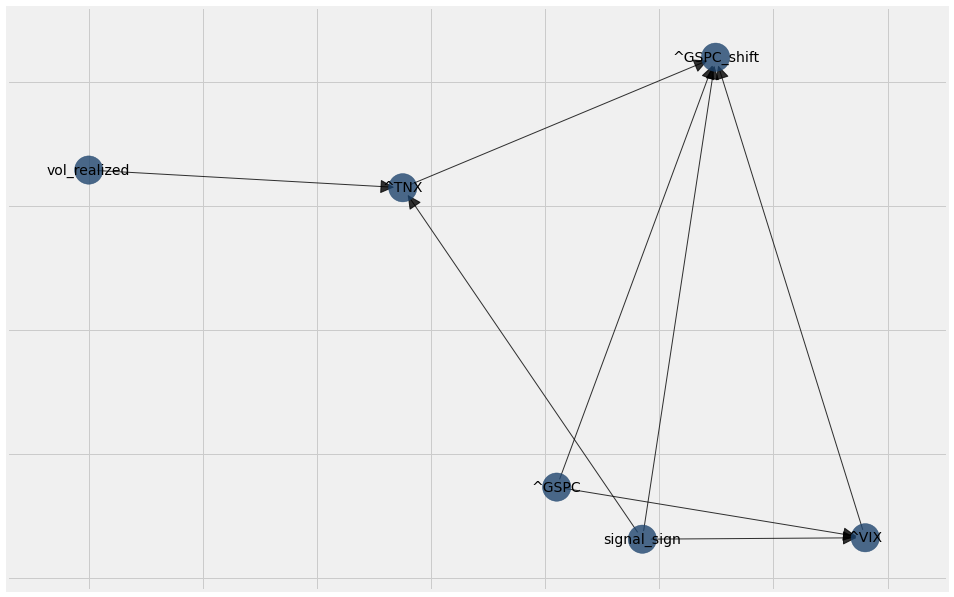

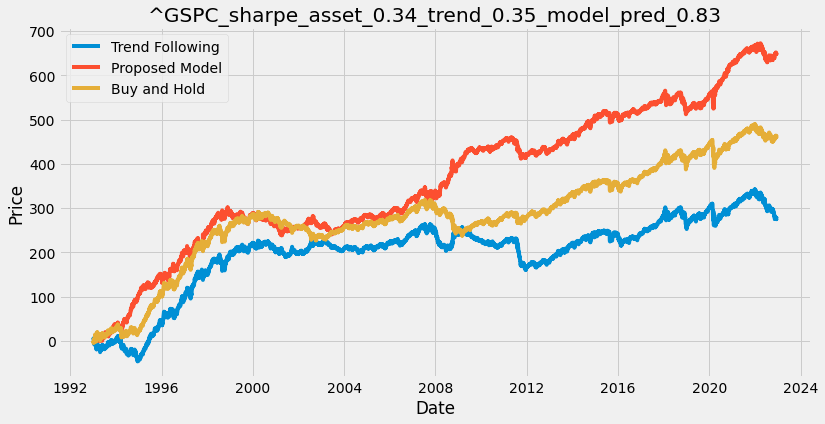

<Figure size 864x432 with 0 Axes>

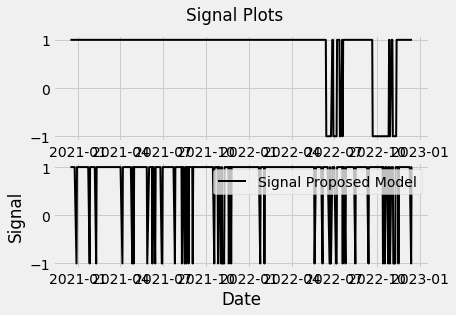

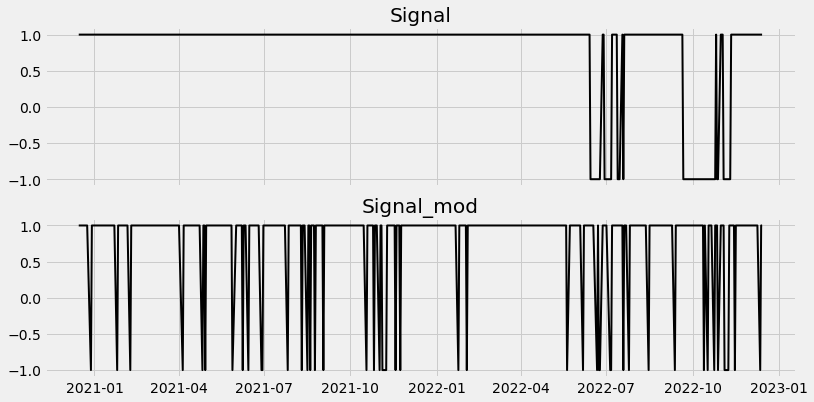

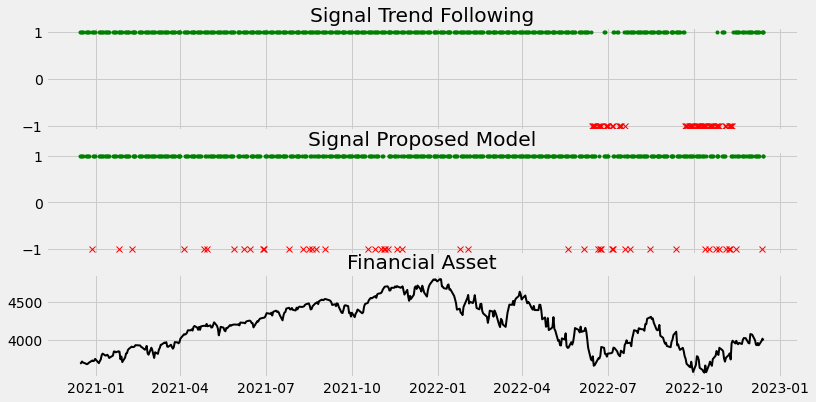

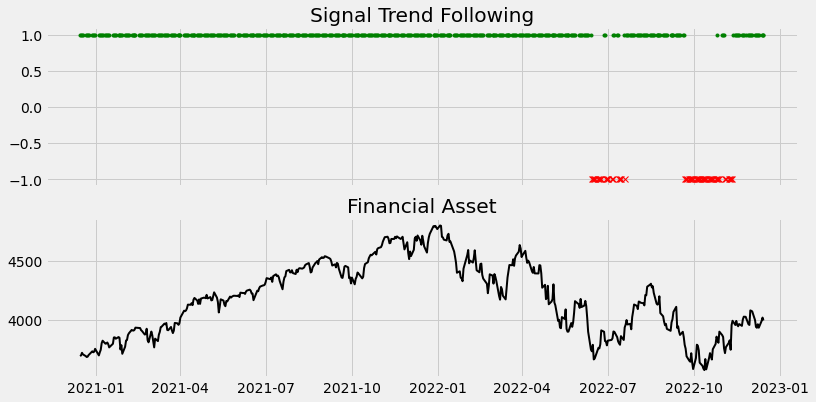

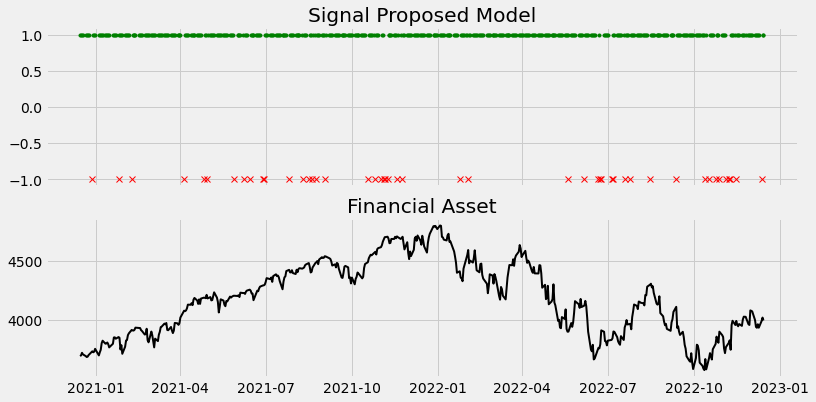

^DJI
                                  Open         High          Low        Close  \
Date                                                                            
1992-01-02 00:00:00-05:00  3152.100098  3172.629883  3139.310059  3172.399902   
1992-01-03 00:00:00-05:00  3172.399902  3210.639893  3165.919922  3201.500000   
1992-01-06 00:00:00-05:00  3201.500000  3213.330078  3191.860107  3200.100098   
1992-01-07 00:00:00-05:00  3200.100098  3210.199951  3184.479980  3204.800049   
1992-01-08 00:00:00-05:00  3204.800049  3229.199951  3185.820068  3203.899902   

                             Volume  Dividends  Stock Splits  
Date                                                          
1992-01-02 00:00:00-05:00  23550000        0.0           0.0  
1992-01-03 00:00:00-05:00  23620000        0.0           0.0  
1992-01-06 00:00:00-05:00  27280000        0.0           0.0  
1992-01-07 00:00:00-05:00  25510000        0.0           0.0  
1992-01-08 00:00:00-05:00  29040000        0.0   

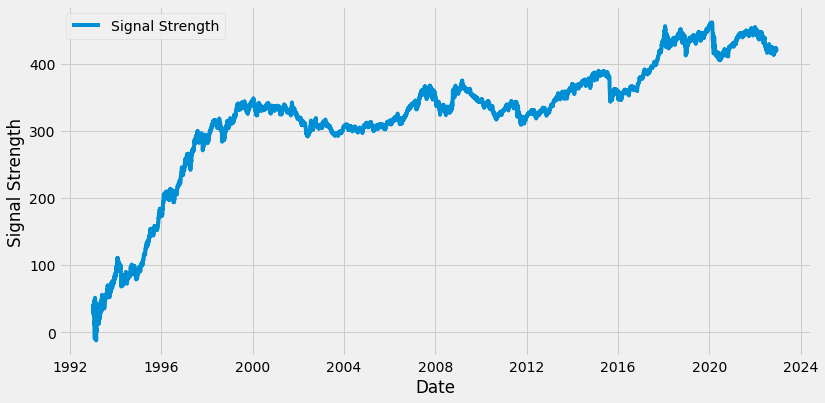

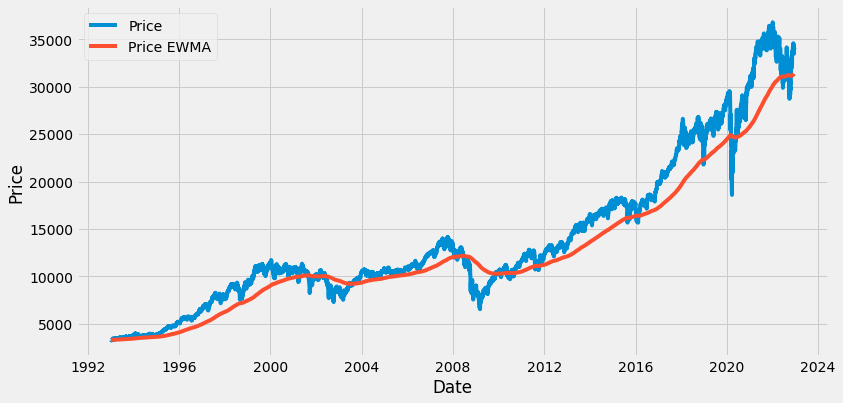

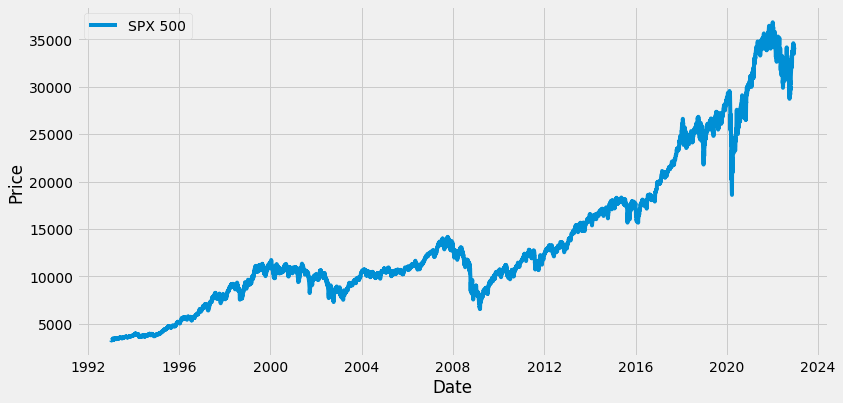

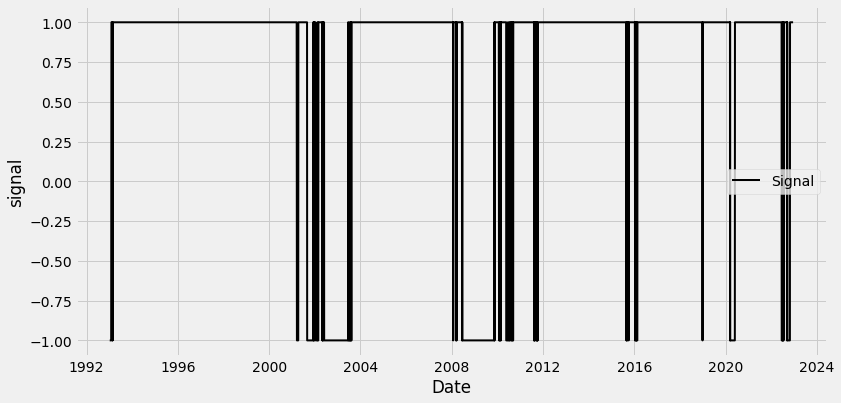

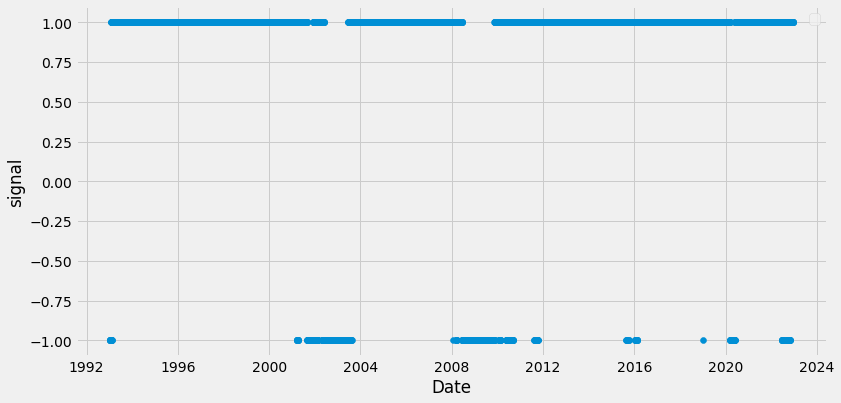

                     ^DJI  ^TNX  ^VIX  vol_realized  signal_sign  ^DJI_shift
Date                                                                        
1993-01-05 05:00:00   0.0   1.0   0.0           1.0          NaN         0.0
1993-01-06 05:00:00   0.0   1.0   1.0           1.0         -1.0         0.0
1993-01-07 05:00:00   0.0   1.0   1.0           1.0         -1.0         0.0
1993-01-08 05:00:00   0.0   0.0   0.0           1.0         -1.0         1.0
1993-01-11 05:00:00   1.0   0.0   0.0           1.0         -1.0         1.0
...                   ...   ...   ...           ...          ...         ...
2022-12-08 05:00:00   1.0   1.0   0.0           1.0          1.0         0.0
2022-12-09 05:00:00   0.0   1.0   1.0           1.0          1.0         1.0
2022-12-12 05:00:00   1.0   1.0   1.0           1.0          1.0         1.0
2022-12-13 05:00:00   1.0   0.0   0.0           1.0          1.0         0.0
2022-12-14 05:00:00   0.0   1.0   0.0           0.0          1.0         NaN

  0%|          | 1/7443 [00:00<33:38,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
100 / 7543


  0%|          | 2/7443 [00:00<30:34,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 3/7443 [00:00<29:51,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 4/7443 [00:00<29:50,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 5/7443 [00:01<29:10,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 6/7443 [00:01<28:55,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 7/7443 [00:01<28:39,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 8/7443 [00:01<29:37,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 9/7443 [00:02<29:36,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 10/7443 [00:02<29:23,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 11/7443 [00:02<29:29,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 12/7443 [00:02<29:50,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 13/7443 [00:03<29:41,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 14/7443 [00:03<29:15,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 15/7443 [00:03<28:38,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 16/7443 [00:03<29:09,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 17/7443 [00:04<29:10,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 18/7443 [00:04<29:29,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 19/7443 [00:04<28:58,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 20/7443 [00:04<28:41,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 21/7443 [00:04<29:22,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 22/7443 [00:05<29:26,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 23/7443 [00:05<28:45,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 24/7443 [00:05<28:27,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 25/7443 [00:05<28:49,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 26/7443 [00:06<28:08,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 27/7443 [00:06<28:33,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 28/7443 [00:06<28:31,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 29/7443 [00:06<28:53,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 30/7443 [00:07<28:29,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 31/7443 [00:07<28:31,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 32/7443 [00:07<28:42,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 33/7443 [00:07<28:11,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 34/7443 [00:07<28:21,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 35/7443 [00:08<28:41,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 36/7443 [00:08<28:55,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 37/7443 [00:08<28:28,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 38/7443 [00:08<28:47,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 39/7443 [00:09<28:48,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 40/7443 [00:09<29:01,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 41/7443 [00:09<28:36,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 42/7443 [00:09<28:56,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 43/7443 [00:10<29:03,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 44/7443 [00:10<29:05,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 45/7443 [00:10<28:34,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 47/7443 [00:10<27:21,  4.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 49/7443 [00:11<26:52,  4.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 51/7443 [00:11<26:19,  4.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 52/7443 [00:12<27:09,  4.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 53/7443 [00:12<27:48,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 54/7443 [00:12<27:39,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 55/7443 [00:12<27:23,  4.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 56/7443 [00:12<27:52,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 57/7443 [00:13<28:32,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 58/7443 [00:13<28:52,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 59/7443 [00:13<28:10,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 60/7443 [00:13<28:05,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 61/7443 [00:14<28:06,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 62/7443 [00:14<28:39,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 63/7443 [00:14<28:51,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 64/7443 [00:14<28:27,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 65/7443 [00:15<29:08,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 67/7443 [00:15<27:07,  4.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 69/7443 [00:15<25:54,  4.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 71/7443 [00:16<25:11,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 73/7443 [00:16<25:31,  4.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 75/7443 [00:17<25:17,  4.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 77/7443 [00:17<25:22,  4.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 79/7443 [00:18<25:09,  4.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 81/7443 [00:18<26:19,  4.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 82/7443 [00:18<26:28,  4.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 83/7443 [00:18<27:33,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 84/7443 [00:19<27:50,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 85/7443 [00:19<27:48,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 86/7443 [00:19<28:26,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 87/7443 [00:19<29:07,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 88/7443 [00:20<28:56,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 89/7443 [00:20<28:27,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 90/7443 [00:20<28:58,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 91/7443 [00:20<28:36,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 92/7443 [00:21<29:06,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 93/7443 [00:21<28:54,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 94/7443 [00:21<29:29,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 95/7443 [00:21<29:04,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 96/7443 [00:22<28:56,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 97/7443 [00:22<28:48,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 98/7443 [00:22<28:59,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 99/7443 [00:22<29:24,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 100/7443 [00:22<29:06,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 101/7443 [00:23<28:34,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
200 / 7543


  1%|▏         | 102/7443 [00:23<28:24,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 103/7443 [00:23<28:55,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 104/7443 [00:23<28:37,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 105/7443 [00:24<28:24,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 106/7443 [00:24<28:04,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 107/7443 [00:24<27:29,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 108/7443 [00:24<27:43,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 109/7443 [00:25<27:58,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 110/7443 [00:25<28:30,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 111/7443 [00:25<28:21,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 112/7443 [00:25<29:06,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 113/7443 [00:25<28:27,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 114/7443 [00:26<28:01,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 115/7443 [00:26<28:11,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 116/7443 [00:26<28:26,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 117/7443 [00:26<28:26,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 118/7443 [00:27<28:46,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 119/7443 [00:27<28:31,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 120/7443 [00:27<28:05,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 121/7443 [00:27<28:36,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 122/7443 [00:28<28:18,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 123/7443 [00:28<28:32,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 124/7443 [00:28<28:03,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 125/7443 [00:28<27:50,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 126/7443 [00:28<28:11,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 127/7443 [00:29<28:02,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 128/7443 [00:29<28:15,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 129/7443 [00:29<28:06,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 130/7443 [00:29<29:12,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 131/7443 [00:30<28:59,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 132/7443 [00:30<28:52,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 133/7443 [00:30<28:28,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 134/7443 [00:30<28:50,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 135/7443 [00:31<29:15,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 136/7443 [00:31<29:53,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 137/7443 [00:31<29:26,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 138/7443 [00:31<29:18,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 139/7443 [00:32<29:35,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 140/7443 [00:32<29:42,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 141/7443 [00:32<29:18,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 142/7443 [00:32<29:29,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 143/7443 [00:33<29:33,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 144/7443 [00:33<29:33,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 145/7443 [00:33<29:25,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 146/7443 [00:33<29:21,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 147/7443 [00:34<29:56,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 148/7443 [00:34<30:10,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 149/7443 [00:34<29:47,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 150/7443 [00:34<29:41,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 151/7443 [00:35<29:53,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 152/7443 [00:35<30:18,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 153/7443 [00:35<30:02,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 154/7443 [00:35<29:44,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 155/7443 [00:36<45:03,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 157/7443 [00:36<34:30,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 159/7443 [00:37<30:14,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 161/7443 [00:37<27:38,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 162/7443 [00:37<28:35,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 163/7443 [00:38<28:40,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 164/7443 [00:38<28:50,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 165/7443 [00:38<28:12,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 166/7443 [00:38<28:22,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 167/7443 [00:39<28:37,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 168/7443 [00:39<29:15,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 169/7443 [00:39<28:43,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 170/7443 [00:39<28:12,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 171/7443 [00:40<28:11,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 172/7443 [00:40<28:15,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 173/7443 [00:40<27:52,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 174/7443 [00:40<27:39,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 175/7443 [00:40<27:58,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 176/7443 [00:41<27:54,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 177/7443 [00:41<28:36,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 178/7443 [00:41<27:57,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 179/7443 [00:41<27:56,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 180/7443 [00:42<28:15,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 181/7443 [00:42<28:37,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 182/7443 [00:42<28:36,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 183/7443 [00:42<28:00,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 184/7443 [00:43<27:43,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 185/7443 [00:43<27:38,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 186/7443 [00:43<28:22,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 187/7443 [00:43<27:39,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 188/7443 [00:43<27:44,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 189/7443 [00:44<28:23,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 190/7443 [00:44<28:26,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 191/7443 [00:44<27:54,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 192/7443 [00:44<28:09,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 193/7443 [00:45<28:15,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 194/7443 [00:45<27:53,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 195/7443 [00:45<28:40,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 196/7443 [00:45<28:23,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 197/7443 [00:46<28:35,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 198/7443 [00:46<28:41,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 199/7443 [00:46<28:45,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 200/7443 [00:46<28:14,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 201/7443 [00:47<29:15,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
300 / 7543


  3%|▎         | 202/7443 [00:47<29:02,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 203/7443 [00:47<28:36,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 204/7443 [00:47<28:25,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 205/7443 [00:47<27:43,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 206/7443 [00:48<27:40,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 207/7443 [00:48<27:49,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 208/7443 [00:48<27:59,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 209/7443 [00:48<27:47,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 210/7443 [00:49<27:43,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 211/7443 [00:49<28:31,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 212/7443 [00:49<28:07,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 213/7443 [00:49<28:41,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 214/7443 [00:50<28:33,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 215/7443 [00:50<28:19,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 216/7443 [00:50<27:54,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 217/7443 [00:50<28:09,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 218/7443 [00:51<27:37,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 219/7443 [00:51<27:22,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 220/7443 [00:51<28:15,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 221/7443 [00:51<28:09,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 222/7443 [00:51<27:49,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 223/7443 [00:52<27:44,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 224/7443 [00:52<27:38,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 225/7443 [00:52<27:44,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 226/7443 [00:52<28:12,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 227/7443 [00:53<28:12,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 228/7443 [00:53<28:35,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 229/7443 [00:53<28:05,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 230/7443 [00:53<27:49,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 231/7443 [00:54<27:12,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 232/7443 [00:54<27:03,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 233/7443 [00:54<27:18,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 234/7443 [00:54<27:01,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 235/7443 [00:54<27:16,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 236/7443 [00:55<27:18,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 237/7443 [00:55<27:02,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 238/7443 [00:55<26:59,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 239/7443 [00:55<27:01,  4.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 240/7443 [00:56<27:04,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 241/7443 [00:56<27:25,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 242/7443 [00:56<27:54,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 243/7443 [00:56<27:45,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 244/7443 [00:56<27:40,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 245/7443 [00:57<27:19,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 246/7443 [00:57<27:16,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 247/7443 [00:57<27:30,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 248/7443 [00:57<27:47,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 249/7443 [00:58<27:52,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 250/7443 [00:58<27:41,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 251/7443 [00:58<28:08,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 252/7443 [00:58<27:51,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 253/7443 [00:59<27:35,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 254/7443 [00:59<28:17,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 255/7443 [00:59<28:46,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 256/7443 [00:59<28:16,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 257/7443 [01:00<28:11,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 258/7443 [01:00<28:25,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 259/7443 [01:00<27:57,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 260/7443 [01:00<27:35,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 261/7443 [01:00<27:24,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 262/7443 [01:01<27:40,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 263/7443 [01:01<28:02,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 264/7443 [01:01<28:08,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 265/7443 [01:01<28:11,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 266/7443 [01:02<27:43,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 267/7443 [01:02<28:11,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 268/7443 [01:02<27:48,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 269/7443 [01:02<27:38,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 270/7443 [01:03<27:38,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 271/7443 [01:03<28:17,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 272/7443 [01:03<27:38,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 273/7443 [01:03<28:54,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 274/7443 [01:04<28:41,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 275/7443 [01:04<28:46,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 276/7443 [01:04<28:33,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 277/7443 [01:04<28:01,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 278/7443 [01:04<27:57,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 279/7443 [01:05<27:52,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 280/7443 [01:05<28:29,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 281/7443 [01:05<29:02,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 282/7443 [01:05<28:18,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 283/7443 [01:06<28:04,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 284/7443 [01:06<28:51,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 285/7443 [01:06<28:25,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 286/7443 [01:06<28:02,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 287/7443 [01:07<28:15,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 288/7443 [01:07<28:13,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 289/7443 [01:07<28:32,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 290/7443 [01:07<28:37,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 291/7443 [01:08<28:23,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 292/7443 [01:08<28:04,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 293/7443 [01:08<28:13,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 294/7443 [01:08<28:09,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 295/7443 [01:08<27:34,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 296/7443 [01:09<27:15,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 297/7443 [01:09<27:34,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 298/7443 [01:09<27:59,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 299/7443 [01:09<27:45,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 300/7443 [01:10<28:01,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 301/7443 [01:10<27:53,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
400 / 7543


  4%|▍         | 302/7443 [01:10<28:21,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 303/7443 [01:10<28:30,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 304/7443 [01:11<28:05,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 305/7443 [01:11<28:15,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 306/7443 [01:11<27:37,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 307/7443 [01:11<27:47,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 308/7443 [01:12<27:54,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 309/7443 [01:12<27:23,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 310/7443 [01:12<27:16,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 311/7443 [01:12<27:31,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 312/7443 [01:12<27:37,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 313/7443 [01:13<27:21,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 314/7443 [01:13<27:44,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 315/7443 [01:13<28:08,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 316/7443 [01:13<28:31,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 317/7443 [01:14<28:02,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 318/7443 [01:14<27:37,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 319/7443 [01:14<27:38,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 320/7443 [01:14<28:19,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 321/7443 [01:15<28:02,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 322/7443 [01:15<28:00,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 323/7443 [01:15<28:24,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 324/7443 [01:15<29:14,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 325/7443 [01:16<28:56,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 326/7443 [01:16<28:55,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 327/7443 [01:16<28:54,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 328/7443 [01:16<29:05,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 329/7443 [01:17<29:22,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 330/7443 [01:17<29:22,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 331/7443 [01:17<28:57,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 332/7443 [01:17<29:16,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 334/7443 [01:18<30:43,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 335/7443 [01:18<30:04,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 336/7443 [01:18<30:40,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 337/7443 [01:19<30:49,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 339/7443 [01:19<32:01,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 340/7443 [01:19<31:47,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 342/7443 [01:20<30:48,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 343/7443 [01:20<32:11,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 344/7443 [01:21<32:26,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 346/7443 [01:21<33:57,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 347/7443 [01:21<33:08,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 349/7443 [01:22<32:52,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 350/7443 [01:22<34:08,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 351/7443 [01:23<37:07,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 352/7443 [01:24<1:01:16,  1.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 353/7443 [01:24<55:15,  2.14it/s]  

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 354/7443 [01:24<50:01,  2.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 355/7443 [01:25<46:44,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 356/7443 [01:25<43:54,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 357/7443 [01:25<42:01,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 358/7443 [01:26<42:21,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 359/7443 [01:26<40:41,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 360/7443 [01:26<38:18,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 361/7443 [01:27<36:24,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 362/7443 [01:27<36:55,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 363/7443 [01:27<37:07,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 364/7443 [01:27<37:00,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 365/7443 [01:28<39:38,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 366/7443 [01:28<39:57,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 367/7443 [01:29<39:45,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 368/7443 [01:29<40:42,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 369/7443 [01:29<40:41,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 370/7443 [01:30<40:11,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 371/7443 [01:30<39:43,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 372/7443 [01:30<41:13,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 373/7443 [01:31<43:45,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 374/7443 [01:31<41:57,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 375/7443 [01:31<41:20,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 376/7443 [01:32<41:43,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 377/7443 [01:32<40:23,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 378/7443 [01:32<40:55,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 379/7443 [01:33<40:21,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 381/7443 [01:33<36:24,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 383/7443 [01:34<32:46,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 384/7443 [01:34<30:54,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 385/7443 [01:34<29:45,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 386/7443 [01:35<29:19,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 387/7443 [01:35<28:55,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 388/7443 [01:35<28:51,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 389/7443 [01:35<28:02,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 390/7443 [01:35<28:28,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 391/7443 [01:36<28:42,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 392/7443 [01:36<28:14,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 393/7443 [01:36<27:52,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 394/7443 [01:36<27:58,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 395/7443 [01:37<28:24,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 396/7443 [01:37<27:52,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 397/7443 [01:37<27:31,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 398/7443 [01:37<28:11,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 399/7443 [01:38<28:25,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 400/7443 [01:38<28:05,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 401/7443 [01:38<27:49,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
500 / 7543


  5%|▌         | 402/7443 [01:38<27:20,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 403/7443 [01:39<27:49,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 404/7443 [01:39<28:00,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 405/7443 [01:39<27:22,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 406/7443 [01:39<27:30,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 407/7443 [01:40<27:34,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 408/7443 [01:40<27:43,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 409/7443 [01:40<27:21,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 410/7443 [01:40<27:15,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 411/7443 [01:40<26:48,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 412/7443 [01:41<26:57,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 413/7443 [01:41<27:17,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 414/7443 [01:41<27:13,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 415/7443 [01:41<27:10,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 416/7443 [01:42<26:52,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 417/7443 [01:42<27:53,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 418/7443 [01:42<27:06,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 419/7443 [01:42<26:58,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 420/7443 [01:42<26:27,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 421/7443 [01:43<26:30,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 422/7443 [01:43<27:22,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 423/7443 [01:43<27:06,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 424/7443 [01:43<27:02,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 425/7443 [01:44<27:26,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 426/7443 [01:44<28:02,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 427/7443 [01:44<27:35,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 428/7443 [01:44<27:57,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 429/7443 [01:45<28:03,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 430/7443 [01:45<28:07,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 431/7443 [01:45<28:42,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 432/7443 [01:45<28:41,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 433/7443 [01:46<28:41,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 434/7443 [01:46<28:23,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 435/7443 [01:46<28:43,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 436/7443 [01:46<29:00,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 437/7443 [01:47<28:57,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 438/7443 [01:47<28:10,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 439/7443 [01:47<28:31,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 440/7443 [01:47<28:05,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 441/7443 [01:48<28:14,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 442/7443 [01:48<29:02,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 443/7443 [01:48<29:16,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 444/7443 [01:48<29:28,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 445/7443 [01:49<29:06,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 446/7443 [01:49<28:58,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 447/7443 [01:49<28:57,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 448/7443 [01:49<29:43,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 449/7443 [01:50<29:42,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 450/7443 [01:50<29:21,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 451/7443 [01:50<28:52,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 452/7443 [01:50<29:06,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 453/7443 [01:51<28:48,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 454/7443 [01:51<28:27,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 455/7443 [01:51<27:45,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 456/7443 [01:51<27:59,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 457/7443 [01:52<28:33,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 458/7443 [01:52<28:26,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 459/7443 [01:52<27:47,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 460/7443 [01:52<28:34,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 461/7443 [01:53<28:14,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 462/7443 [01:53<27:39,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 463/7443 [01:53<27:18,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 464/7443 [01:53<27:18,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 465/7443 [01:53<27:37,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 466/7443 [01:54<27:30,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 467/7443 [01:54<27:50,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 468/7443 [01:54<27:18,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 469/7443 [01:54<27:37,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 470/7443 [01:55<27:46,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 471/7443 [01:55<27:01,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 472/7443 [01:55<26:38,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 473/7443 [01:55<26:51,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 474/7443 [01:56<27:22,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 475/7443 [01:56<27:18,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 476/7443 [01:56<27:14,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 477/7443 [01:56<26:51,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 478/7443 [01:56<27:07,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 479/7443 [01:57<27:04,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 480/7443 [01:57<27:11,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 481/7443 [01:57<27:03,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 482/7443 [01:57<26:45,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 483/7443 [01:58<27:08,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 484/7443 [01:58<26:41,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 485/7443 [01:58<27:17,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 486/7443 [01:58<27:18,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 487/7443 [01:59<27:08,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 488/7443 [01:59<27:31,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 489/7443 [01:59<27:23,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 490/7443 [01:59<27:25,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 491/7443 [02:00<27:01,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 492/7443 [02:00<27:54,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 493/7443 [02:00<27:26,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 494/7443 [02:00<28:09,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 495/7443 [02:01<27:52,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 496/7443 [02:01<27:53,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 497/7443 [02:01<27:28,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 498/7443 [02:01<27:43,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 499/7443 [02:01<27:56,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 500/7443 [02:02<28:38,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 501/7443 [02:02<29:00,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
600 / 7543


  7%|▋         | 502/7443 [02:02<28:32,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 503/7443 [02:02<28:35,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 504/7443 [02:03<28:01,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 505/7443 [02:03<27:52,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 506/7443 [02:03<27:56,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 507/7443 [02:03<27:21,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 508/7443 [02:04<27:42,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 509/7443 [02:04<27:52,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 510/7443 [02:04<27:58,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 511/7443 [02:04<27:29,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 512/7443 [02:05<27:03,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 513/7443 [02:05<26:56,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 514/7443 [02:05<27:48,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 515/7443 [02:05<27:47,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 516/7443 [02:06<27:28,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 517/7443 [02:06<27:20,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 518/7443 [02:06<27:05,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 519/7443 [02:06<27:17,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 520/7443 [02:06<26:39,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 521/7443 [02:07<26:34,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 522/7443 [02:07<27:25,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 523/7443 [02:07<28:08,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 524/7443 [02:07<27:26,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 525/7443 [02:08<28:12,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 526/7443 [02:08<28:17,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 527/7443 [02:08<27:39,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 528/7443 [02:08<27:40,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 529/7443 [02:09<27:40,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 530/7443 [02:09<27:10,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 531/7443 [02:09<27:06,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 532/7443 [02:09<28:05,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 533/7443 [02:10<27:46,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 534/7443 [02:10<27:51,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 535/7443 [02:10<27:37,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 536/7443 [02:10<27:39,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 537/7443 [02:11<27:46,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 538/7443 [02:11<27:57,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 539/7443 [02:11<27:24,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 540/7443 [02:11<26:53,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 541/7443 [02:12<26:46,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 542/7443 [02:12<26:39,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 543/7443 [02:12<26:18,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 544/7443 [02:12<26:07,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 545/7443 [02:12<25:45,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 546/7443 [02:13<25:43,  4.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 547/7443 [02:13<26:22,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 548/7443 [02:13<26:34,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 549/7443 [02:13<26:49,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 550/7443 [02:14<26:55,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 551/7443 [02:14<26:33,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 552/7443 [02:14<26:36,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 553/7443 [02:14<26:35,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 554/7443 [02:15<27:24,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 555/7443 [02:15<46:02,  2.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 556/7443 [02:16<40:12,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 557/7443 [02:16<36:38,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 558/7443 [02:16<34:03,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 559/7443 [02:16<32:40,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 560/7443 [02:17<31:09,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 561/7443 [02:17<29:30,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 562/7443 [02:17<28:33,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 563/7443 [02:17<27:37,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 564/7443 [02:17<28:02,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 565/7443 [02:18<27:07,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 566/7443 [02:18<27:26,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 567/7443 [02:18<27:09,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 568/7443 [02:18<27:42,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 569/7443 [02:19<28:04,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 570/7443 [02:19<28:13,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 571/7443 [02:19<28:19,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 572/7443 [02:19<28:50,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 573/7443 [02:20<28:46,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 574/7443 [02:20<29:02,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 575/7443 [02:20<28:29,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 576/7443 [02:20<28:11,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 577/7443 [02:21<28:07,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 578/7443 [02:21<28:15,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 579/7443 [02:21<27:36,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 580/7443 [02:21<27:45,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 581/7443 [02:22<28:15,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 582/7443 [02:22<28:22,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 583/7443 [02:22<28:36,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 584/7443 [02:22<28:23,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 585/7443 [02:23<28:49,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 586/7443 [02:23<28:28,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 587/7443 [02:23<28:23,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 588/7443 [02:23<28:26,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 589/7443 [02:24<28:26,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 590/7443 [02:24<28:28,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 591/7443 [02:24<27:58,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 592/7443 [02:24<28:04,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 593/7443 [02:25<27:53,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 594/7443 [02:25<28:00,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 595/7443 [02:25<28:18,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 596/7443 [02:25<27:34,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 597/7443 [02:26<27:41,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 598/7443 [02:26<27:39,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 599/7443 [02:26<26:41,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 600/7443 [02:26<26:36,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 601/7443 [02:27<26:51,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
700 / 7543


  8%|▊         | 602/7443 [02:27<27:16,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 603/7443 [02:27<27:11,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 604/7443 [02:27<27:05,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 605/7443 [02:27<26:39,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 606/7443 [02:28<26:38,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 607/7443 [02:28<27:25,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 608/7443 [02:28<27:28,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 609/7443 [02:28<26:47,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 610/7443 [02:29<26:32,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 611/7443 [02:29<27:11,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 612/7443 [02:29<27:15,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 613/7443 [02:29<27:22,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 614/7443 [02:30<27:18,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 615/7443 [02:30<27:50,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 616/7443 [02:30<28:00,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 618/7443 [02:31<28:49,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 619/7443 [02:31<28:59,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 620/7443 [02:31<28:56,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 621/7443 [02:31<29:25,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 622/7443 [02:32<28:55,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 623/7443 [02:32<28:18,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 624/7443 [02:32<28:37,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 625/7443 [02:32<28:24,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 626/7443 [02:33<28:10,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 627/7443 [02:33<27:34,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 628/7443 [02:33<27:51,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 629/7443 [02:33<27:37,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 630/7443 [02:34<27:31,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 631/7443 [02:34<27:32,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 632/7443 [02:34<28:28,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 633/7443 [02:34<28:52,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 634/7443 [02:35<28:47,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 635/7443 [02:35<28:36,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 637/7443 [02:35<28:29,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 638/7443 [02:36<27:55,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 639/7443 [02:36<27:28,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 640/7443 [02:36<27:49,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 641/7443 [02:36<28:39,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 642/7443 [02:37<28:08,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 643/7443 [02:37<28:00,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 644/7443 [02:37<27:42,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 646/7443 [02:38<28:21,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 647/7443 [02:38<28:38,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 648/7443 [02:38<28:13,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 649/7443 [02:38<28:39,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 650/7443 [02:39<28:58,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 651/7443 [02:39<28:15,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 652/7443 [02:39<27:57,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 653/7443 [02:39<28:24,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 654/7443 [02:40<28:26,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 655/7443 [02:40<27:52,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 656/7443 [02:40<27:28,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 657/7443 [02:40<27:46,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 658/7443 [02:41<27:45,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 659/7443 [02:41<27:12,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 660/7443 [02:41<27:00,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 661/7443 [02:41<27:25,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 662/7443 [02:42<27:49,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 663/7443 [02:42<27:50,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 664/7443 [02:42<27:13,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 665/7443 [02:42<27:19,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 666/7443 [02:43<27:39,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 667/7443 [02:43<27:31,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 668/7443 [02:43<27:00,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 669/7443 [02:43<27:19,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 670/7443 [02:44<27:42,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 671/7443 [02:44<28:24,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 672/7443 [02:44<28:25,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 673/7443 [02:44<27:57,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 674/7443 [02:45<27:23,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 675/7443 [02:45<27:30,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 676/7443 [02:45<28:23,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 677/7443 [02:45<28:46,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 678/7443 [02:46<28:05,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 679/7443 [02:46<28:24,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 680/7443 [02:46<27:46,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 681/7443 [02:46<27:26,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 682/7443 [02:47<27:37,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 684/7443 [02:47<28:23,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 685/7443 [02:47<28:41,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 686/7443 [02:48<28:13,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 687/7443 [02:48<28:53,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 688/7443 [02:48<27:32,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 689/7443 [02:48<26:59,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 690/7443 [02:48<26:17,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 691/7443 [02:49<25:58,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 692/7443 [02:49<26:24,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 693/7443 [02:49<26:09,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 694/7443 [02:49<26:15,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 695/7443 [02:50<26:18,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 696/7443 [02:50<26:49,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 697/7443 [02:50<26:30,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 698/7443 [02:50<26:11,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 699/7443 [02:51<26:17,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 700/7443 [02:51<25:53,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 701/7443 [02:51<26:16,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
800 / 7543


  9%|▉         | 702/7443 [02:51<26:00,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 703/7443 [02:51<25:56,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 704/7443 [02:52<26:17,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 705/7443 [02:52<27:09,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 706/7443 [02:52<27:47,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 707/7443 [02:52<27:00,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 708/7443 [02:53<26:44,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 709/7443 [02:53<27:00,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 710/7443 [02:53<27:30,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 711/7443 [02:53<27:37,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 712/7443 [02:54<27:44,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 713/7443 [02:54<28:26,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 714/7443 [02:54<28:32,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 715/7443 [02:54<28:02,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 716/7443 [02:55<27:40,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 717/7443 [02:55<27:51,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 718/7443 [02:55<28:06,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 719/7443 [02:55<27:27,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 720/7443 [02:56<27:36,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 721/7443 [02:56<26:58,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 722/7443 [02:56<27:39,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 723/7443 [02:56<27:02,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 724/7443 [02:57<26:25,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 725/7443 [02:57<26:00,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 726/7443 [02:57<25:46,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 727/7443 [02:57<25:54,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 728/7443 [02:58<26:33,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 729/7443 [02:58<26:35,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 730/7443 [02:58<26:49,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 731/7443 [02:58<27:15,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 732/7443 [02:59<26:55,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 733/7443 [02:59<27:45,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 734/7443 [02:59<27:33,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 735/7443 [02:59<28:29,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 736/7443 [03:00<28:51,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 737/7443 [03:00<28:47,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 738/7443 [03:00<28:36,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 739/7443 [03:00<28:30,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 740/7443 [03:01<28:21,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 741/7443 [03:01<27:32,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 742/7443 [03:01<26:56,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 743/7443 [03:01<27:15,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 744/7443 [03:02<26:38,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 745/7443 [03:02<26:17,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 746/7443 [03:02<26:08,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 747/7443 [03:02<26:10,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 748/7443 [03:03<44:13,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 749/7443 [03:03<38:45,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 750/7443 [03:04<35:55,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 751/7443 [03:04<33:20,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 752/7443 [03:04<30:47,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 753/7443 [03:04<29:29,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 754/7443 [03:04<28:34,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 755/7443 [03:05<27:52,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 756/7443 [03:05<26:51,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 757/7443 [03:05<26:18,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 758/7443 [03:05<26:13,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 759/7443 [03:06<26:18,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 760/7443 [03:06<26:15,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 761/7443 [03:06<26:25,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 762/7443 [03:06<26:36,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 763/7443 [03:07<26:36,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 764/7443 [03:07<26:57,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 765/7443 [03:07<27:14,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 766/7443 [03:07<27:30,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 767/7443 [03:08<28:02,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 768/7443 [03:08<27:54,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 769/7443 [03:08<27:24,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 770/7443 [03:08<27:08,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 771/7443 [03:09<26:12,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 772/7443 [03:09<26:46,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 773/7443 [03:09<26:23,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 774/7443 [03:09<26:21,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 775/7443 [03:10<27:31,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 776/7443 [03:10<27:35,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 777/7443 [03:10<27:20,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 778/7443 [03:10<26:36,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 779/7443 [03:10<26:25,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 780/7443 [03:11<26:02,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 781/7443 [03:11<25:52,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 782/7443 [03:11<25:28,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 783/7443 [03:11<25:56,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 784/7443 [03:12<26:01,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 785/7443 [03:12<26:00,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 786/7443 [03:12<25:33,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 787/7443 [03:12<25:56,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 788/7443 [03:13<25:34,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 789/7443 [03:13<25:54,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 790/7443 [03:13<26:08,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 791/7443 [03:13<26:38,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 792/7443 [03:14<26:34,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 793/7443 [03:14<26:09,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 794/7443 [03:14<26:43,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 795/7443 [03:14<26:01,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 796/7443 [03:14<25:50,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 797/7443 [03:15<25:53,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 798/7443 [03:15<25:54,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 799/7443 [03:15<25:25,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 800/7443 [03:15<25:29,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 801/7443 [03:16<25:32,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
900 / 7543


 11%|█         | 802/7443 [03:16<25:00,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 803/7443 [03:16<25:22,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 804/7443 [03:16<25:16,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 805/7443 [03:16<25:01,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 806/7443 [03:17<24:57,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 807/7443 [03:17<25:23,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 808/7443 [03:17<25:43,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 809/7443 [03:17<25:54,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 810/7443 [03:18<25:25,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 811/7443 [03:18<25:06,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 812/7443 [03:18<24:56,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 813/7443 [03:18<24:48,  4.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 814/7443 [03:19<25:16,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 815/7443 [03:19<26:19,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 816/7443 [03:19<26:51,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 817/7443 [03:19<27:07,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 818/7443 [03:20<26:44,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 819/7443 [03:20<26:30,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 820/7443 [03:20<26:11,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 821/7443 [03:20<26:05,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 822/7443 [03:20<25:57,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 823/7443 [03:21<25:50,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 824/7443 [03:21<26:05,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 825/7443 [03:21<26:33,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 826/7443 [03:21<26:30,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 827/7443 [03:22<27:00,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 828/7443 [03:22<27:14,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 829/7443 [03:22<26:43,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 830/7443 [03:22<27:06,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 831/7443 [03:23<26:26,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 832/7443 [03:23<26:03,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 833/7443 [03:23<25:50,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 834/7443 [03:23<25:51,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 835/7443 [03:24<25:51,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 836/7443 [03:24<26:14,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 837/7443 [03:24<26:41,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 838/7443 [03:24<26:18,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 839/7443 [03:25<26:31,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 840/7443 [03:25<26:22,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 841/7443 [03:25<25:48,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 842/7443 [03:25<25:41,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 843/7443 [03:26<26:12,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 844/7443 [03:26<26:26,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 845/7443 [03:26<26:32,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 846/7443 [03:26<26:27,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 847/7443 [03:26<26:23,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 848/7443 [03:27<26:15,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 849/7443 [03:27<27:05,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 850/7443 [03:27<26:31,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 851/7443 [03:27<27:18,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 852/7443 [03:28<26:41,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 853/7443 [03:28<26:29,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 854/7443 [03:28<25:46,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 855/7443 [03:28<25:27,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 856/7443 [03:29<25:29,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 857/7443 [03:29<25:18,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 858/7443 [03:29<24:54,  4.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 859/7443 [03:29<25:05,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 860/7443 [03:30<25:03,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 861/7443 [03:30<25:53,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 862/7443 [03:30<25:41,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 863/7443 [03:30<25:37,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 864/7443 [03:30<25:27,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 865/7443 [03:31<25:46,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 866/7443 [03:31<26:06,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 867/7443 [03:31<25:28,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 868/7443 [03:31<25:19,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 869/7443 [03:32<25:40,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 870/7443 [03:32<25:20,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 871/7443 [03:32<25:13,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 872/7443 [03:32<26:01,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 874/7443 [03:33<26:39,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 875/7443 [03:33<26:08,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 876/7443 [03:33<26:16,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 877/7443 [03:34<26:26,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 878/7443 [03:34<26:46,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 879/7443 [03:34<26:42,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 880/7443 [03:34<26:57,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 881/7443 [03:35<26:36,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 883/7443 [03:35<27:12,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 884/7443 [03:35<27:02,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 885/7443 [03:36<26:14,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 886/7443 [03:36<26:45,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 887/7443 [03:36<26:32,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 888/7443 [03:36<26:24,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 889/7443 [03:36<25:47,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 890/7443 [03:37<26:00,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 891/7443 [03:37<25:45,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 892/7443 [03:37<25:41,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 893/7443 [03:37<26:38,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 894/7443 [03:38<26:08,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 895/7443 [03:38<26:33,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 896/7443 [03:38<26:18,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 897/7443 [03:38<26:24,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 898/7443 [03:39<26:28,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 899/7443 [03:39<27:08,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 900/7443 [03:39<27:10,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 901/7443 [03:39<26:34,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1000 / 7543


 12%|█▏        | 902/7443 [03:40<26:15,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 903/7443 [03:40<25:57,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 904/7443 [03:40<25:50,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 905/7443 [03:40<26:29,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 906/7443 [03:41<26:27,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 907/7443 [03:41<26:50,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 908/7443 [03:41<27:13,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 909/7443 [03:41<26:34,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 910/7443 [03:42<25:33,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 911/7443 [03:42<25:14,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 912/7443 [03:42<24:55,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 913/7443 [03:42<25:05,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 914/7443 [03:42<24:34,  4.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 915/7443 [03:43<24:56,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 916/7443 [03:43<24:52,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 917/7443 [03:43<24:24,  4.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 918/7443 [03:43<25:14,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 919/7443 [03:44<24:52,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 920/7443 [03:44<25:08,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 921/7443 [03:44<25:23,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 922/7443 [03:44<25:50,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 923/7443 [03:45<25:46,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 924/7443 [03:45<25:37,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 925/7443 [03:45<25:05,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 926/7443 [03:45<26:01,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 927/7443 [03:46<25:57,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 928/7443 [03:46<26:30,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 929/7443 [03:46<26:25,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 930/7443 [03:46<25:41,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 931/7443 [03:46<25:55,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 932/7443 [03:47<25:41,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 933/7443 [03:47<25:40,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 934/7443 [03:47<25:05,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 935/7443 [03:47<25:40,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 936/7443 [03:48<25:22,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 937/7443 [03:48<24:49,  4.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 938/7443 [03:48<24:31,  4.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 939/7443 [03:48<25:38,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 940/7443 [03:49<25:36,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 941/7443 [03:49<25:17,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 942/7443 [03:49<25:00,  4.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 943/7443 [03:49<25:25,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 944/7443 [03:50<25:17,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 945/7443 [03:50<24:50,  4.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 946/7443 [03:50<24:44,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 947/7443 [03:51<42:36,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 948/7443 [03:51<37:28,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 949/7443 [03:51<34:19,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 950/7443 [03:51<31:59,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 951/7443 [03:52<31:11,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 952/7443 [03:52<29:31,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 953/7443 [03:52<27:53,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 954/7443 [03:52<27:16,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 955/7443 [03:53<27:24,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 956/7443 [03:53<26:46,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 957/7443 [03:53<26:36,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 958/7443 [03:53<26:42,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 959/7443 [03:54<26:34,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 960/7443 [03:54<26:54,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 961/7443 [03:54<26:54,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 962/7443 [03:54<26:24,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 963/7443 [03:55<26:28,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 964/7443 [03:55<26:26,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 965/7443 [03:55<25:51,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 966/7443 [03:55<26:11,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 967/7443 [03:56<26:22,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 968/7443 [03:56<26:31,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 969/7443 [03:56<25:46,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 970/7443 [03:56<25:28,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 971/7443 [03:57<25:26,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 972/7443 [03:57<26:36,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 973/7443 [03:57<26:40,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 974/7443 [03:57<26:47,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 975/7443 [03:58<26:19,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 976/7443 [03:58<26:27,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 977/7443 [03:58<26:53,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 978/7443 [03:58<26:10,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 979/7443 [03:59<25:56,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 980/7443 [03:59<26:15,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 981/7443 [03:59<26:10,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 982/7443 [03:59<25:55,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 983/7443 [03:59<25:48,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 984/7443 [04:00<25:55,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 985/7443 [04:00<25:56,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 986/7443 [04:00<25:50,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 987/7443 [04:00<25:14,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 988/7443 [04:01<25:27,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 989/7443 [04:01<26:02,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 990/7443 [04:01<25:46,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 991/7443 [04:01<26:02,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 992/7443 [04:02<25:52,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 993/7443 [04:02<26:01,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 994/7443 [04:02<26:16,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 995/7443 [04:02<26:11,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 996/7443 [04:03<25:41,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 997/7443 [04:03<26:22,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 998/7443 [04:03<26:18,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 999/7443 [04:03<26:27,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 1000/7443 [04:04<26:19,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 1001/7443 [04:04<26:12,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 1003/7443 [04:04<27:18,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 1004/7443 [04:05<27:28,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1005/7443 [04:05<27:04,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1006/7443 [04:05<26:32,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1007/7443 [04:05<26:04,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1008/7443 [04:06<25:22,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1009/7443 [04:06<25:07,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1010/7443 [04:06<25:21,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1011/7443 [04:06<24:51,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1012/7443 [04:06<24:24,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1013/7443 [04:07<25:00,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1014/7443 [04:07<24:58,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1015/7443 [04:07<25:42,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1016/7443 [04:07<25:58,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1017/7443 [04:08<25:35,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1018/7443 [04:08<25:31,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1019/7443 [04:08<24:59,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1020/7443 [04:08<25:02,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1021/7443 [04:09<24:51,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1022/7443 [04:09<25:29,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1023/7443 [04:09<25:04,  4.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1024/7443 [04:09<25:41,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1025/7443 [04:10<25:47,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1026/7443 [04:10<25:50,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1027/7443 [04:10<25:22,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1028/7443 [04:10<25:57,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1029/7443 [04:11<25:49,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1030/7443 [04:11<25:59,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1031/7443 [04:11<26:19,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1032/7443 [04:11<26:19,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1033/7443 [04:12<26:35,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1034/7443 [04:12<26:13,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1035/7443 [04:12<26:01,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1036/7443 [04:12<25:51,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1037/7443 [04:13<25:42,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1038/7443 [04:13<25:38,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1039/7443 [04:13<25:10,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1040/7443 [04:13<24:52,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1041/7443 [04:13<25:09,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1042/7443 [04:14<25:04,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1043/7443 [04:14<25:13,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1044/7443 [04:14<25:19,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1045/7443 [04:14<25:56,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1046/7443 [04:15<26:03,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1047/7443 [04:15<26:05,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1048/7443 [04:15<26:24,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1049/7443 [04:15<25:49,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1050/7443 [04:16<26:28,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1051/7443 [04:16<26:00,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1052/7443 [04:16<26:14,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1053/7443 [04:16<26:17,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1054/7443 [04:17<26:13,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1055/7443 [04:17<25:49,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1056/7443 [04:17<26:11,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1057/7443 [04:17<25:47,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1059/7443 [04:18<26:59,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1060/7443 [04:18<27:04,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1061/7443 [04:18<27:42,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1062/7443 [04:19<27:26,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1063/7443 [04:19<26:43,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1064/7443 [04:19<26:10,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1065/7443 [04:19<25:52,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1066/7443 [04:20<26:09,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1067/7443 [04:20<25:44,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1068/7443 [04:20<25:53,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1069/7443 [04:20<25:56,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1070/7443 [04:21<25:33,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1071/7443 [04:21<25:14,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1072/7443 [04:21<24:48,  4.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1073/7443 [04:21<24:41,  4.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1074/7443 [04:22<25:49,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1075/7443 [04:22<25:59,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1076/7443 [04:22<25:44,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1077/7443 [04:22<26:10,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1078/7443 [04:23<25:44,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1079/7443 [04:23<25:53,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1080/7443 [04:23<26:20,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1081/7443 [04:23<26:01,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1082/7443 [04:24<26:01,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1083/7443 [04:24<26:11,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1084/7443 [04:24<26:15,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1085/7443 [04:24<26:04,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1086/7443 [04:25<25:39,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1087/7443 [04:25<25:29,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1088/7443 [04:25<25:48,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1089/7443 [04:25<25:24,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1090/7443 [04:26<27:19,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1091/7443 [04:26<26:56,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1092/7443 [04:26<26:48,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1093/7443 [04:26<26:30,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1094/7443 [04:27<26:27,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1095/7443 [04:27<26:25,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1096/7443 [04:27<26:24,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1097/7443 [04:27<26:31,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1098/7443 [04:28<26:39,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1099/7443 [04:28<27:05,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1100/7443 [04:28<26:24,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1101/7443 [04:28<26:28,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1200 / 7543


 15%|█▍        | 1102/7443 [04:29<26:17,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1103/7443 [04:29<25:45,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1104/7443 [04:29<26:11,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1105/7443 [04:29<26:02,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1106/7443 [04:30<26:08,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1107/7443 [04:30<26:01,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1108/7443 [04:30<26:02,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1109/7443 [04:30<26:06,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1110/7443 [04:30<26:23,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1111/7443 [04:31<27:29,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1113/7443 [04:31<27:19,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1114/7443 [04:32<27:02,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1115/7443 [04:32<27:26,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1116/7443 [04:32<26:55,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1117/7443 [04:32<26:52,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1118/7443 [04:33<26:41,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1119/7443 [04:33<26:16,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1120/7443 [04:33<26:07,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1121/7443 [04:33<25:44,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1122/7443 [04:34<25:34,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1123/7443 [04:34<25:27,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1124/7443 [04:34<25:03,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1125/7443 [04:34<25:11,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1126/7443 [04:34<25:19,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1127/7443 [04:35<25:47,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1128/7443 [04:35<25:45,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1129/7443 [04:35<25:25,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1130/7443 [04:35<26:01,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1131/7443 [04:36<26:47,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1132/7443 [04:36<26:24,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1133/7443 [04:36<25:44,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1134/7443 [04:36<25:34,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1135/7443 [04:37<26:13,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1136/7443 [04:37<25:48,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1137/7443 [04:37<25:36,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1138/7443 [04:37<25:36,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1139/7443 [04:38<26:27,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1140/7443 [04:38<26:32,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1141/7443 [04:38<26:20,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1142/7443 [04:38<26:33,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1144/7443 [04:39<27:02,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1145/7443 [04:39<26:56,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1146/7443 [04:40<26:55,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1148/7443 [04:40<27:37,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1149/7443 [04:40<27:04,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1150/7443 [04:41<26:41,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1152/7443 [04:41<27:11,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1153/7443 [04:41<26:04,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1154/7443 [04:42<43:47,  2.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1155/7443 [04:42<37:50,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1156/7443 [04:43<33:39,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1157/7443 [04:43<31:24,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1158/7443 [04:43<29:44,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1159/7443 [04:43<28:37,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1160/7443 [04:44<27:35,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1161/7443 [04:44<27:38,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1162/7443 [04:44<27:17,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1163/7443 [04:44<26:20,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1164/7443 [04:45<26:50,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1165/7443 [04:45<26:09,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1166/7443 [04:45<26:37,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1167/7443 [04:45<26:24,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1168/7443 [04:46<25:45,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1169/7443 [04:46<26:28,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1170/7443 [04:46<26:17,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1171/7443 [04:46<26:15,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1172/7443 [04:47<25:35,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1173/7443 [04:47<25:38,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1175/7443 [04:47<26:16,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1176/7443 [04:48<26:29,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1177/7443 [04:48<26:00,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1178/7443 [04:48<26:43,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1179/7443 [04:48<26:32,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1180/7443 [04:49<25:38,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1181/7443 [04:49<25:24,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1182/7443 [04:49<26:52,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1183/7443 [04:49<26:31,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1184/7443 [04:50<25:43,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1185/7443 [04:50<26:01,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1186/7443 [04:50<26:11,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1187/7443 [04:50<26:13,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1188/7443 [04:51<25:55,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1189/7443 [04:51<25:46,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1190/7443 [04:51<25:17,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1191/7443 [04:51<25:33,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1192/7443 [04:52<26:26,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1193/7443 [04:52<26:00,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1194/7443 [04:52<26:17,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1195/7443 [04:52<26:02,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1196/7443 [04:53<25:19,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1197/7443 [04:53<25:40,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1198/7443 [04:53<25:26,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1199/7443 [04:53<25:50,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1200/7443 [04:54<25:28,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1201/7443 [04:54<25:42,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1300 / 7543


 16%|█▌        | 1202/7443 [04:54<26:07,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1203/7443 [04:54<26:17,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1204/7443 [04:55<26:20,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1205/7443 [04:55<26:00,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1207/7443 [04:55<26:53,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1208/7443 [04:56<26:35,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1209/7443 [04:56<27:23,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1210/7443 [04:56<28:32,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1212/7443 [04:57<28:25,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1214/7443 [04:57<27:32,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1215/7443 [04:57<27:11,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1216/7443 [04:58<28:14,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1217/7443 [04:58<30:00,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1218/7443 [04:58<30:54,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1219/7443 [04:59<31:05,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1220/7443 [04:59<31:38,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1221/7443 [04:59<31:34,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1222/7443 [05:00<31:00,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1223/7443 [05:00<31:14,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1224/7443 [05:00<30:43,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1226/7443 [05:01<29:17,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1228/7443 [05:01<29:31,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1229/7443 [05:02<28:22,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1230/7443 [05:02<27:59,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1231/7443 [05:02<27:24,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1232/7443 [05:02<26:48,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1233/7443 [05:03<26:37,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1234/7443 [05:03<27:34,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1236/7443 [05:03<26:54,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1237/7443 [05:04<28:55,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1238/7443 [05:04<29:03,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1239/7443 [05:04<30:02,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1240/7443 [05:05<30:57,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1242/7443 [05:05<29:29,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1243/7443 [05:06<31:34,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1244/7443 [05:06<31:19,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1245/7443 [05:06<33:28,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1246/7443 [05:07<33:51,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1247/7443 [05:07<33:01,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1248/7443 [05:07<34:03,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1249/7443 [05:08<35:08,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1250/7443 [05:08<34:26,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1251/7443 [05:08<34:39,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1252/7443 [05:09<33:52,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1253/7443 [05:09<34:26,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1254/7443 [05:09<35:56,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1255/7443 [05:10<35:26,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1256/7443 [05:10<34:31,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1257/7443 [05:10<34:05,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1258/7443 [05:11<33:21,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1259/7443 [05:11<33:02,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1260/7443 [05:11<32:28,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1262/7443 [05:12<31:08,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1263/7443 [05:12<29:59,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1264/7443 [05:12<28:46,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1265/7443 [05:13<27:57,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1266/7443 [05:13<27:38,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1267/7443 [05:13<27:06,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1268/7443 [05:13<26:25,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1269/7443 [05:14<27:04,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1270/7443 [05:14<26:40,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1271/7443 [05:14<26:39,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1272/7443 [05:14<26:14,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1273/7443 [05:15<26:06,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1274/7443 [05:15<25:19,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1275/7443 [05:15<24:37,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1276/7443 [05:15<24:30,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1277/7443 [05:16<24:33,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1278/7443 [05:16<24:56,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1279/7443 [05:16<25:07,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1280/7443 [05:16<24:52,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1281/7443 [05:17<24:58,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1282/7443 [05:17<25:22,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1283/7443 [05:17<25:15,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1284/7443 [05:17<24:39,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1285/7443 [05:17<24:15,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1286/7443 [05:18<24:14,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1287/7443 [05:18<23:45,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1288/7443 [05:18<23:47,  4.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1289/7443 [05:18<23:38,  4.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1290/7443 [05:19<23:19,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1291/7443 [05:19<23:34,  4.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1292/7443 [05:19<23:18,  4.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1293/7443 [05:19<23:21,  4.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1294/7443 [05:20<23:24,  4.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1295/7443 [05:20<24:04,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1296/7443 [05:20<24:09,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1297/7443 [05:20<24:38,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1298/7443 [05:21<24:50,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1299/7443 [05:21<25:00,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1300/7443 [05:21<25:03,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1301/7443 [05:21<24:43,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1400 / 7543


 17%|█▋        | 1302/7443 [05:21<25:25,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1303/7443 [05:22<25:47,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1304/7443 [05:22<25:36,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1305/7443 [05:22<25:03,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1306/7443 [05:22<24:44,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1307/7443 [05:23<25:25,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1308/7443 [05:23<25:26,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1309/7443 [05:23<25:33,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1310/7443 [05:23<25:19,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1311/7443 [05:24<24:50,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1312/7443 [05:24<25:07,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1313/7443 [05:24<24:53,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1314/7443 [05:24<25:20,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1315/7443 [05:25<25:04,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1316/7443 [05:25<25:14,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1317/7443 [05:25<24:25,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1318/7443 [05:25<24:32,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1319/7443 [05:26<24:31,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1320/7443 [05:26<24:25,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1321/7443 [05:26<24:32,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1322/7443 [05:26<24:16,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1323/7443 [05:27<24:13,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1324/7443 [05:27<24:27,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1325/7443 [05:27<24:28,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1326/7443 [05:27<24:12,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1327/7443 [05:28<24:26,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1328/7443 [05:28<24:38,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1329/7443 [05:28<24:38,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1330/7443 [05:28<24:53,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1331/7443 [05:29<24:50,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1332/7443 [05:29<25:33,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1333/7443 [05:29<25:18,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1334/7443 [05:29<25:11,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1335/7443 [05:30<24:53,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1336/7443 [05:30<25:03,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1337/7443 [05:30<24:22,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1338/7443 [05:30<23:42,  4.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1339/7443 [05:30<24:01,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1340/7443 [05:31<23:54,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1341/7443 [05:31<24:13,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1342/7443 [05:31<24:24,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1343/7443 [05:31<24:11,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1344/7443 [05:32<24:34,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1345/7443 [05:32<25:00,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1347/7443 [05:32<24:46,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1348/7443 [05:33<24:42,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1349/7443 [05:33<25:14,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1350/7443 [05:33<24:54,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1351/7443 [05:34<42:11,  2.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1352/7443 [05:34<37:03,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1353/7443 [05:34<33:05,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1354/7443 [05:35<30:43,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1355/7443 [05:35<28:56,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1356/7443 [05:35<27:05,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1357/7443 [05:35<26:19,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1358/7443 [05:36<25:40,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1359/7443 [05:36<25:38,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1360/7443 [05:36<24:52,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1361/7443 [05:36<24:57,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1362/7443 [05:37<24:35,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1363/7443 [05:37<24:57,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1364/7443 [05:37<25:14,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1365/7443 [05:37<24:48,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1366/7443 [05:38<24:37,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1367/7443 [05:38<24:51,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1368/7443 [05:38<24:07,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1369/7443 [05:38<23:49,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1370/7443 [05:39<23:44,  4.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1371/7443 [05:39<23:49,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1372/7443 [05:39<23:59,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1373/7443 [05:39<23:51,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1374/7443 [05:39<23:25,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1375/7443 [05:40<24:12,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1376/7443 [05:40<24:12,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1377/7443 [05:40<23:55,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1378/7443 [05:40<23:47,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1379/7443 [05:41<24:19,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1380/7443 [05:41<24:16,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1381/7443 [05:41<24:36,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1382/7443 [05:41<25:04,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1383/7443 [05:42<24:59,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1384/7443 [05:42<24:46,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1385/7443 [05:42<24:11,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1386/7443 [05:42<23:43,  4.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1387/7443 [05:43<23:22,  4.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1388/7443 [05:43<24:20,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1389/7443 [05:43<24:07,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1390/7443 [05:43<24:18,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1391/7443 [05:44<24:15,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1393/7443 [05:44<24:22,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1394/7443 [05:44<24:16,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1395/7443 [05:45<24:10,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1396/7443 [05:45<24:43,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1397/7443 [05:45<24:53,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1398/7443 [05:45<24:43,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1399/7443 [05:46<25:24,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1400/7443 [05:46<25:35,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1401/7443 [05:46<25:13,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1500 / 7543


 19%|█▉        | 1402/7443 [05:46<24:47,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1403/7443 [05:47<24:24,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1404/7443 [05:47<24:29,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1405/7443 [05:47<24:56,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1406/7443 [05:47<24:46,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1407/7443 [05:48<25:01,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1408/7443 [05:48<25:09,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1409/7443 [05:48<25:24,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1410/7443 [05:48<25:01,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1411/7443 [05:49<24:17,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1412/7443 [05:49<24:24,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1413/7443 [05:49<25:13,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1414/7443 [05:49<24:52,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1415/7443 [05:50<24:56,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1416/7443 [05:50<25:29,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1417/7443 [05:50<25:43,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1418/7443 [05:50<25:09,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1419/7443 [05:51<25:16,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1420/7443 [05:51<25:15,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1421/7443 [05:51<25:44,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1422/7443 [05:51<25:33,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1423/7443 [05:52<25:10,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1424/7443 [05:52<25:10,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1425/7443 [05:52<25:52,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1426/7443 [05:52<25:41,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1427/7443 [05:53<25:28,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1428/7443 [05:53<24:59,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1429/7443 [05:53<24:30,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1430/7443 [05:53<24:42,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1431/7443 [05:54<24:15,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1432/7443 [05:54<24:02,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1433/7443 [05:54<23:43,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1434/7443 [05:54<23:50,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1435/7443 [05:55<24:54,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1436/7443 [05:55<24:48,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1437/7443 [05:55<24:41,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1438/7443 [05:55<24:37,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1439/7443 [05:55<24:06,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1440/7443 [05:56<24:03,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1441/7443 [05:56<23:45,  4.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1442/7443 [05:56<23:58,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1443/7443 [05:56<24:03,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1444/7443 [05:57<24:49,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1445/7443 [05:57<24:43,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1446/7443 [05:57<24:40,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1447/7443 [05:57<24:47,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1448/7443 [05:58<25:19,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1449/7443 [05:58<25:23,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1450/7443 [05:58<25:29,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1451/7443 [05:59<26:29,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1452/7443 [05:59<25:49,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1453/7443 [05:59<25:34,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1454/7443 [05:59<25:18,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1455/7443 [06:00<25:12,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1456/7443 [06:00<24:33,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1457/7443 [06:00<24:34,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1458/7443 [06:00<24:06,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1459/7443 [06:00<24:33,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1460/7443 [06:01<24:21,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1461/7443 [06:01<23:56,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1462/7443 [06:01<23:50,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1463/7443 [06:01<24:33,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1465/7443 [06:02<25:42,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1466/7443 [06:02<25:24,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1467/7443 [06:02<24:56,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1468/7443 [06:03<25:36,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1469/7443 [06:03<25:21,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1470/7443 [06:03<25:09,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1471/7443 [06:03<25:17,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1473/7443 [06:04<25:19,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1474/7443 [06:04<24:53,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1475/7443 [06:04<24:44,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1476/7443 [06:05<25:02,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1477/7443 [06:05<24:41,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1478/7443 [06:05<24:08,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1479/7443 [06:05<23:44,  4.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1480/7443 [06:06<23:49,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1481/7443 [06:06<24:51,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1482/7443 [06:06<24:24,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1483/7443 [06:06<24:21,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1484/7443 [06:07<24:20,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1485/7443 [06:07<24:26,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1486/7443 [06:07<24:08,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1487/7443 [06:07<23:58,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1488/7443 [06:08<24:07,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1489/7443 [06:08<24:14,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1490/7443 [06:08<24:09,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1491/7443 [06:08<24:27,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1492/7443 [06:09<24:50,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1493/7443 [06:09<24:47,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1494/7443 [06:09<24:58,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1495/7443 [06:09<25:17,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1496/7443 [06:10<25:40,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1497/7443 [06:10<26:01,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1498/7443 [06:10<26:00,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1499/7443 [06:10<25:54,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1500/7443 [06:11<25:35,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1501/7443 [06:11<25:37,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1600 / 7543


 20%|██        | 1502/7443 [06:11<26:10,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1503/7443 [06:12<26:04,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1504/7443 [06:12<25:50,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1506/7443 [06:12<25:17,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1507/7443 [06:13<25:23,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1509/7443 [06:13<25:43,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1511/7443 [06:14<26:24,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1512/7443 [06:14<26:17,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1513/7443 [06:14<25:49,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1514/7443 [06:14<25:57,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1515/7443 [06:15<26:02,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1516/7443 [06:15<26:12,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1517/7443 [06:15<25:54,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1518/7443 [06:15<25:08,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1519/7443 [06:16<24:48,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1520/7443 [06:16<24:48,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1521/7443 [06:16<24:53,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1522/7443 [06:16<25:08,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1523/7443 [06:17<24:56,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1524/7443 [06:17<25:14,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1525/7443 [06:17<25:10,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1526/7443 [06:17<25:18,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1527/7443 [06:18<24:57,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1528/7443 [06:18<24:59,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1529/7443 [06:18<24:55,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1530/7443 [06:19<25:35,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1531/7443 [06:19<25:26,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1532/7443 [06:19<25:41,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1533/7443 [06:19<25:40,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1535/7443 [06:20<25:41,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1536/7443 [06:20<24:38,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1537/7443 [06:20<23:51,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1538/7443 [06:21<23:48,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1539/7443 [06:21<24:23,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1540/7443 [06:21<24:10,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1541/7443 [06:21<24:37,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1542/7443 [06:22<24:41,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1543/7443 [06:22<24:49,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1544/7443 [06:22<24:25,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1545/7443 [06:22<24:16,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1546/7443 [06:23<24:15,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1547/7443 [06:23<24:56,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1548/7443 [06:23<24:50,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1549/7443 [06:23<24:55,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1550/7443 [06:24<25:01,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1551/7443 [06:24<25:10,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1552/7443 [06:24<25:24,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1553/7443 [06:24<24:35,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1554/7443 [06:25<40:19,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1555/7443 [06:25<34:52,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1556/7443 [06:26<31:12,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1557/7443 [06:26<29:29,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1558/7443 [06:26<27:26,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1559/7443 [06:26<26:27,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1560/7443 [06:27<25:48,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1561/7443 [06:27<26:32,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1562/7443 [06:27<25:32,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1563/7443 [06:27<25:16,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1564/7443 [06:28<24:44,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1565/7443 [06:28<24:48,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1566/7443 [06:28<24:34,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1567/7443 [06:28<24:40,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1568/7443 [06:29<24:35,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1569/7443 [06:29<24:48,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1570/7443 [06:29<24:34,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1571/7443 [06:29<24:04,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1573/7443 [06:30<24:01,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1574/7443 [06:30<23:40,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1575/7443 [06:30<23:58,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1576/7443 [06:31<24:38,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1578/7443 [06:31<25:32,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1579/7443 [06:31<25:39,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1580/7443 [06:32<25:35,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1581/7443 [06:32<25:08,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1582/7443 [06:32<25:32,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1583/7443 [06:32<24:51,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1584/7443 [06:33<24:24,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1585/7443 [06:33<24:09,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1586/7443 [06:33<24:51,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1587/7443 [06:33<24:35,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1588/7443 [06:34<24:01,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1589/7443 [06:34<23:47,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1590/7443 [06:34<24:05,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1591/7443 [06:34<23:59,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1592/7443 [06:35<23:36,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1593/7443 [06:35<23:18,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1594/7443 [06:35<23:44,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1595/7443 [06:35<23:47,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1596/7443 [06:36<23:26,  4.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1597/7443 [06:36<23:35,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1598/7443 [06:36<24:00,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1599/7443 [06:36<24:26,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1600/7443 [06:37<24:39,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1601/7443 [06:37<24:16,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1700 / 7543


 22%|██▏       | 1602/7443 [06:37<24:12,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1603/7443 [06:37<24:26,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1604/7443 [06:38<24:13,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1605/7443 [06:38<24:08,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1606/7443 [06:38<24:16,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1607/7443 [06:38<24:50,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1608/7443 [06:39<24:06,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1609/7443 [06:39<23:31,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1610/7443 [06:39<23:08,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1611/7443 [06:39<23:18,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1612/7443 [06:39<23:08,  4.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1613/7443 [06:40<23:14,  4.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1614/7443 [06:40<23:01,  4.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1615/7443 [06:40<23:25,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1616/7443 [06:40<23:25,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1617/7443 [06:41<23:33,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1618/7443 [06:41<23:49,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1619/7443 [06:41<23:43,  4.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1620/7443 [06:41<23:55,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1621/7443 [06:42<23:49,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1622/7443 [06:42<23:31,  4.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1623/7443 [06:42<22:54,  4.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1624/7443 [06:42<22:52,  4.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1625/7443 [06:43<23:35,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1626/7443 [06:43<23:16,  4.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1627/7443 [06:43<23:24,  4.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1628/7443 [06:43<23:20,  4.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1630/7443 [06:44<24:26,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1631/7443 [06:44<24:30,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1632/7443 [06:44<23:56,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1634/7443 [06:45<24:54,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1635/7443 [06:45<25:04,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1636/7443 [06:45<24:43,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1638/7443 [06:46<25:15,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1640/7443 [06:46<24:45,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1641/7443 [06:47<24:44,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1642/7443 [06:47<24:31,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1643/7443 [06:47<24:36,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1644/7443 [06:47<24:20,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1646/7443 [06:48<24:20,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1647/7443 [06:48<24:00,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1648/7443 [06:48<23:28,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1649/7443 [06:49<23:48,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1650/7443 [06:49<23:56,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1651/7443 [06:49<24:21,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1652/7443 [06:49<24:22,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1654/7443 [06:50<24:57,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1655/7443 [06:50<24:47,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1656/7443 [06:51<24:29,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1658/7443 [06:51<24:57,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1659/7443 [06:51<25:15,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1660/7443 [06:52<24:40,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1662/7443 [06:52<24:31,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1663/7443 [06:52<24:28,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1664/7443 [06:53<24:34,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1666/7443 [06:53<25:09,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1667/7443 [06:53<24:52,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1668/7443 [06:54<24:44,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1669/7443 [06:54<24:23,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1670/7443 [06:54<25:06,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1671/7443 [06:54<24:58,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1672/7443 [06:55<24:38,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1673/7443 [06:55<25:22,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1674/7443 [06:55<25:25,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1675/7443 [06:55<24:41,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1676/7443 [06:56<24:29,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1677/7443 [06:56<24:13,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1678/7443 [06:56<24:26,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1679/7443 [06:56<24:51,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1680/7443 [06:57<24:51,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1681/7443 [06:57<24:59,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1682/7443 [06:57<25:21,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1683/7443 [06:58<25:03,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1684/7443 [06:58<24:39,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1685/7443 [06:58<24:37,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1686/7443 [06:58<24:26,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1687/7443 [06:58<23:50,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1688/7443 [06:59<23:41,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1689/7443 [06:59<23:59,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1690/7443 [06:59<24:37,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1691/7443 [07:00<24:09,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1692/7443 [07:00<24:11,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1693/7443 [07:00<24:32,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1694/7443 [07:00<24:41,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1695/7443 [07:01<23:55,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1696/7443 [07:01<23:45,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1697/7443 [07:01<24:11,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1698/7443 [07:01<24:43,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1699/7443 [07:02<24:16,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1700/7443 [07:02<24:13,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1701/7443 [07:02<24:30,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1800 / 7543


 23%|██▎       | 1702/7443 [07:02<23:50,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1703/7443 [07:03<24:04,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1704/7443 [07:03<23:58,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1706/7443 [07:03<24:29,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1707/7443 [07:04<24:24,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1708/7443 [07:04<24:19,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1709/7443 [07:04<24:16,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1710/7443 [07:04<24:32,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1711/7443 [07:05<25:06,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1712/7443 [07:05<24:53,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1714/7443 [07:05<25:19,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1715/7443 [07:06<24:51,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1716/7443 [07:06<24:51,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1718/7443 [07:06<24:43,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1719/7443 [07:07<24:53,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1720/7443 [07:07<24:47,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1721/7443 [07:07<24:31,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1722/7443 [07:08<25:56,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1724/7443 [07:08<25:13,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1725/7443 [07:08<25:06,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1727/7443 [07:09<25:21,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1728/7443 [07:09<24:53,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1729/7443 [07:09<25:22,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1731/7443 [07:10<25:54,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1732/7443 [07:10<25:32,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1733/7443 [07:10<25:19,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1734/7443 [07:11<24:52,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1735/7443 [07:11<24:46,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1736/7443 [07:11<24:56,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1737/7443 [07:11<24:17,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1739/7443 [07:12<25:01,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1740/7443 [07:12<25:16,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1741/7443 [07:13<24:41,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1742/7443 [07:13<25:28,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1743/7443 [07:13<25:10,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1744/7443 [07:13<25:34,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1746/7443 [07:14<25:31,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1747/7443 [07:14<24:33,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1748/7443 [07:14<24:39,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1749/7443 [07:15<24:49,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1751/7443 [07:15<24:55,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1752/7443 [07:16<40:47,  2.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1753/7443 [07:16<36:03,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1754/7443 [07:17<33:08,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1755/7443 [07:17<30:39,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1756/7443 [07:17<29:13,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1758/7443 [07:18<27:00,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1759/7443 [07:18<25:53,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1761/7443 [07:18<24:55,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1762/7443 [07:19<24:25,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1763/7443 [07:19<24:00,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1764/7443 [07:19<25:18,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1766/7443 [07:20<25:59,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1767/7443 [07:20<25:27,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1768/7443 [07:20<24:50,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1769/7443 [07:20<24:49,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1770/7443 [07:21<24:39,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1771/7443 [07:21<24:50,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1772/7443 [07:21<24:54,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1773/7443 [07:22<24:16,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1774/7443 [07:22<24:51,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1775/7443 [07:22<24:31,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1776/7443 [07:22<24:31,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1777/7443 [07:23<24:22,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1778/7443 [07:23<24:01,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1779/7443 [07:23<24:24,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1780/7443 [07:23<24:44,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1782/7443 [07:24<25:09,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1783/7443 [07:24<24:50,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1784/7443 [07:24<25:26,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1786/7443 [07:25<24:59,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1787/7443 [07:25<24:45,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1788/7443 [07:25<24:43,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1789/7443 [07:26<24:50,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1790/7443 [07:26<24:08,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1791/7443 [07:26<24:21,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1792/7443 [07:27<24:22,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1794/7443 [07:27<24:41,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1795/7443 [07:27<24:10,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1796/7443 [07:28<25:17,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1797/7443 [07:28<25:09,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1798/7443 [07:28<24:50,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1799/7443 [07:28<24:23,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1800/7443 [07:29<24:34,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1801/7443 [07:29<25:25,  3.70it/s]

1900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1803/7443 [07:29<25:15,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1804/7443 [07:30<25:43,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1805/7443 [07:30<25:26,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1806/7443 [07:30<25:18,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1807/7443 [07:31<25:24,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1808/7443 [07:31<25:37,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1809/7443 [07:31<25:31,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1810/7443 [07:31<25:32,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1811/7443 [07:32<26:05,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1813/7443 [07:32<25:11,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1814/7443 [07:32<25:45,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1816/7443 [07:33<25:29,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1818/7443 [07:34<25:34,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1819/7443 [07:34<25:36,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1820/7443 [07:34<25:34,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1821/7443 [07:34<26:02,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1822/7443 [07:35<25:43,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1823/7443 [07:35<26:33,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1824/7443 [07:35<26:07,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1825/7443 [07:36<25:53,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1827/7443 [07:36<26:03,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1829/7443 [07:37<25:48,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1830/7443 [07:37<25:44,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1831/7443 [07:37<25:40,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1832/7443 [07:37<25:18,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1833/7443 [07:38<25:22,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1835/7443 [07:38<25:13,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1836/7443 [07:38<24:46,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1837/7443 [07:39<24:28,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1839/7443 [07:39<24:39,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1840/7443 [07:40<23:58,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1841/7443 [07:40<23:49,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1842/7443 [07:40<23:11,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1843/7443 [07:40<24:11,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1844/7443 [07:41<24:08,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1845/7443 [07:41<24:13,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1846/7443 [07:41<24:49,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1847/7443 [07:41<24:45,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1848/7443 [07:42<24:32,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1849/7443 [07:42<24:03,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1850/7443 [07:42<23:43,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1851/7443 [07:42<23:42,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1852/7443 [07:43<23:35,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1853/7443 [07:43<23:42,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1854/7443 [07:43<23:41,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1856/7443 [07:44<23:58,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1857/7443 [07:44<23:53,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1858/7443 [07:44<23:40,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1860/7443 [07:45<24:15,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1861/7443 [07:45<25:01,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1862/7443 [07:45<24:45,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1863/7443 [07:46<24:56,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1864/7443 [07:46<24:54,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1865/7443 [07:46<25:23,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1867/7443 [07:47<25:17,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1868/7443 [07:47<25:23,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1869/7443 [07:47<25:12,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1871/7443 [07:48<24:50,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1872/7443 [07:48<24:27,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1873/7443 [07:48<24:09,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1874/7443 [07:48<23:41,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1875/7443 [07:49<23:16,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1876/7443 [07:49<23:19,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1877/7443 [07:49<23:19,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1879/7443 [07:50<23:44,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1880/7443 [07:50<23:45,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1881/7443 [07:50<23:25,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1882/7443 [07:50<23:18,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1883/7443 [07:51<23:31,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1884/7443 [07:51<23:33,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1885/7443 [07:51<23:46,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1886/7443 [07:51<23:45,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1887/7443 [07:52<23:52,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1888/7443 [07:52<23:39,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1889/7443 [07:52<23:39,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1890/7443 [07:53<23:35,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1891/7443 [07:53<24:02,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1892/7443 [07:53<23:31,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1893/7443 [07:53<23:19,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1894/7443 [07:54<23:23,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1896/7443 [07:54<24:35,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1897/7443 [07:54<24:17,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1898/7443 [07:55<24:24,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1899/7443 [07:55<24:54,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1900/7443 [07:55<24:33,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1901/7443 [07:55<23:56,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2000 / 7543


 26%|██▌       | 1902/7443 [07:56<23:54,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1903/7443 [07:56<24:17,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1904/7443 [07:56<23:44,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1905/7443 [07:56<23:24,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1906/7443 [07:57<23:42,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1908/7443 [07:57<23:41,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1909/7443 [07:57<24:15,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1911/7443 [07:58<24:39,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1913/7443 [07:59<24:22,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1915/7443 [07:59<25:23,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1916/7443 [07:59<24:56,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1918/7443 [08:00<24:52,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1919/7443 [08:00<24:44,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1920/7443 [08:00<24:27,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1921/7443 [08:01<24:18,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1922/7443 [08:01<24:16,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1923/7443 [08:01<24:12,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1924/7443 [08:02<24:07,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1925/7443 [08:02<24:52,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1927/7443 [08:02<24:51,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1928/7443 [08:03<25:43,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1929/7443 [08:03<25:32,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1930/7443 [08:03<25:57,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1932/7443 [08:04<24:58,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1933/7443 [08:04<24:42,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1935/7443 [08:05<24:41,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1936/7443 [08:05<24:11,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1937/7443 [08:05<23:36,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1938/7443 [08:05<23:31,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1939/7443 [08:06<22:59,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1940/7443 [08:06<24:34,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1942/7443 [08:06<25:54,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1943/7443 [08:07<25:31,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1944/7443 [08:07<25:12,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1946/7443 [08:08<25:31,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1947/7443 [08:08<24:59,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1948/7443 [08:08<24:32,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1950/7443 [08:09<23:59,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1951/7443 [08:09<23:36,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1952/7443 [08:09<24:12,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1953/7443 [08:10<40:22,  2.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1954/7443 [08:10<35:37,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1956/7443 [08:11<29:48,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1958/7443 [08:11<27:19,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1960/7443 [08:12<25:45,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1961/7443 [08:12<25:31,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1962/7443 [08:12<24:59,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1964/7443 [08:13<25:13,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1965/7443 [08:13<24:49,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1966/7443 [08:13<24:41,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1967/7443 [08:14<24:37,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1968/7443 [08:14<25:07,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1969/7443 [08:14<24:51,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1971/7443 [08:15<25:16,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1972/7443 [08:15<24:48,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1973/7443 [08:15<24:55,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1974/7443 [08:16<24:36,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1975/7443 [08:16<25:04,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1976/7443 [08:16<24:46,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1977/7443 [08:16<24:16,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1978/7443 [08:17<23:57,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1979/7443 [08:17<24:46,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1981/7443 [08:18<25:10,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1982/7443 [08:18<24:52,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1983/7443 [08:18<24:56,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1984/7443 [08:18<25:03,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1985/7443 [08:19<24:53,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1986/7443 [08:19<24:45,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1987/7443 [08:19<25:19,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1989/7443 [08:20<24:29,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1991/7443 [08:20<24:27,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1992/7443 [08:21<24:41,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1994/7443 [08:21<24:49,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1995/7443 [08:21<25:11,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1996/7443 [08:22<25:08,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1997/7443 [08:22<25:05,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1998/7443 [08:22<25:44,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1999/7443 [08:23<25:24,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2000/7443 [08:23<25:25,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2001/7443 [08:23<25:48,  3.51it/s]

2100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2002/7443 [08:23<25:35,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2003/7443 [08:24<26:24,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2004/7443 [08:24<26:18,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2005/7443 [08:24<27:14,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2006/7443 [08:25<27:33,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2007/7443 [08:25<27:31,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2009/7443 [08:25<26:19,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2010/7443 [08:26<26:27,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2012/7443 [08:26<26:03,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2013/7443 [08:27<25:58,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2015/7443 [08:27<25:24,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2017/7443 [08:28<25:31,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2018/7443 [08:28<25:05,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2019/7443 [08:28<25:59,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2020/7443 [08:29<27:09,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2021/7443 [08:29<28:22,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2022/7443 [08:29<29:49,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2023/7443 [08:30<31:09,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2024/7443 [08:30<31:32,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2025/7443 [08:31<32:29,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2026/7443 [08:31<33:05,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2027/7443 [08:31<33:23,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2028/7443 [08:32<33:19,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2029/7443 [08:32<32:28,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2030/7443 [08:32<32:25,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2031/7443 [08:33<32:43,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2032/7443 [08:33<31:25,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2033/7443 [08:33<29:14,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2034/7443 [08:34<31:06,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2035/7443 [08:34<32:20,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2036/7443 [08:34<33:16,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2037/7443 [08:35<33:09,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2038/7443 [08:35<32:43,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2039/7443 [08:36<32:57,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2040/7443 [08:36<32:59,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2041/7443 [08:36<34:01,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2042/7443 [08:37<34:09,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2043/7443 [08:37<35:01,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2044/7443 [08:38<35:24,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2045/7443 [08:38<34:59,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2046/7443 [08:38<33:59,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2047/7443 [08:39<34:13,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2048/7443 [08:39<34:22,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2049/7443 [08:39<33:41,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2050/7443 [08:40<33:02,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2051/7443 [08:40<32:37,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2052/7443 [08:40<31:44,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2053/7443 [08:41<30:24,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2054/7443 [08:41<29:32,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2055/7443 [08:41<30:40,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2056/7443 [08:42<29:52,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2057/7443 [08:42<31:45,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2058/7443 [08:43<32:49,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2059/7443 [08:43<34:51,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2060/7443 [08:43<34:33,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2061/7443 [08:44<35:52,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2062/7443 [08:44<35:39,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2063/7443 [08:45<36:02,  2.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2064/7443 [08:45<34:37,  2.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2065/7443 [08:45<33:56,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2066/7443 [08:46<33:11,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2067/7443 [08:46<30:57,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2069/7443 [08:46<27:05,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2070/7443 [08:47<26:37,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2072/7443 [08:47<25:04,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2074/7443 [08:48<25:44,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2075/7443 [08:48<25:36,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2076/7443 [08:48<25:13,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2078/7443 [08:49<24:51,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2079/7443 [08:49<24:51,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2080/7443 [08:50<25:47,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2081/7443 [08:50<27:56,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2082/7443 [08:50<27:07,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2083/7443 [08:50<26:36,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2085/7443 [08:51<25:23,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2087/7443 [08:52<24:34,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2089/7443 [08:52<24:29,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2091/7443 [08:53<24:06,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2092/7443 [08:53<25:17,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2093/7443 [08:53<25:01,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2094/7443 [08:54<25:20,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2095/7443 [08:54<25:05,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2097/7443 [08:54<24:45,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2098/7443 [08:55<24:13,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2099/7443 [08:55<24:33,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2101/7443 [08:55<25:00,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2200 / 7543


 28%|██▊       | 2102/7443 [08:56<25:11,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2103/7443 [08:56<24:35,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2104/7443 [08:56<24:34,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2106/7443 [08:57<23:46,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2107/7443 [08:57<23:25,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2108/7443 [08:57<23:02,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2109/7443 [08:58<22:33,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2110/7443 [08:58<22:47,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2111/7443 [08:58<22:56,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2113/7443 [08:59<23:17,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2115/7443 [08:59<23:12,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2116/7443 [08:59<23:15,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2117/7443 [09:00<23:13,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2119/7443 [09:00<24:17,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2120/7443 [09:01<24:42,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2122/7443 [09:01<24:41,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2123/7443 [09:01<24:44,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2124/7443 [09:02<25:34,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2125/7443 [09:02<26:05,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2126/7443 [09:02<25:28,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2127/7443 [09:03<25:58,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2129/7443 [09:03<24:55,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2131/7443 [09:04<24:15,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2132/7443 [09:04<23:42,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2133/7443 [09:04<24:07,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2134/7443 [09:04<24:32,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2136/7443 [09:05<24:35,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2137/7443 [09:05<24:09,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2139/7443 [09:06<23:51,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2140/7443 [09:06<24:48,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2142/7443 [09:07<25:09,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2143/7443 [09:07<25:01,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2144/7443 [09:07<24:58,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2145/7443 [09:08<25:35,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2147/7443 [09:08<24:31,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2148/7443 [09:08<24:55,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2150/7443 [09:09<24:54,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2152/7443 [09:10<24:17,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2153/7443 [09:10<24:44,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2154/7443 [09:10<24:48,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2155/7443 [09:10<25:29,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2156/7443 [09:11<25:51,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2157/7443 [09:11<26:16,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2158/7443 [09:11<26:22,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2159/7443 [09:12<26:04,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2160/7443 [09:12<25:56,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2161/7443 [09:12<25:17,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2162/7443 [09:13<25:49,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2163/7443 [09:13<25:21,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2164/7443 [09:14<41:33,  2.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2165/7443 [09:14<37:15,  2.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2167/7443 [09:15<30:57,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2169/7443 [09:15<27:10,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2171/7443 [09:16<25:26,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2172/7443 [09:16<25:34,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2173/7443 [09:16<25:42,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2174/7443 [09:17<25:07,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2176/7443 [09:17<24:21,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2177/7443 [09:17<24:38,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2178/7443 [09:18<25:13,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2180/7443 [09:18<24:19,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2182/7443 [09:19<23:56,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2183/7443 [09:19<23:58,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2184/7443 [09:19<24:10,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2185/7443 [09:20<23:56,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2187/7443 [09:20<24:10,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2188/7443 [09:20<24:06,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2190/7443 [09:21<24:17,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2191/7443 [09:21<24:00,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2192/7443 [09:21<23:55,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2193/7443 [09:22<24:22,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2195/7443 [09:22<24:04,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2196/7443 [09:23<23:39,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2197/7443 [09:23<23:59,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2199/7443 [09:23<23:42,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2200/7443 [09:24<23:19,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2201/7443 [09:24<22:47,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2300 / 7543


 30%|██▉       | 2202/7443 [09:24<22:36,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2203/7443 [09:24<23:06,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2204/7443 [09:25<22:55,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2205/7443 [09:25<22:28,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2206/7443 [09:25<21:59,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2207/7443 [09:25<22:30,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2208/7443 [09:26<22:41,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2209/7443 [09:26<23:12,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2210/7443 [09:26<23:55,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2211/7443 [09:27<23:34,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2212/7443 [09:27<24:18,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2213/7443 [09:27<24:20,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2214/7443 [09:27<24:54,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2215/7443 [09:28<25:13,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2216/7443 [09:28<25:13,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2217/7443 [09:28<24:43,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2218/7443 [09:29<24:37,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2219/7443 [09:29<24:54,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2220/7443 [09:29<24:40,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2221/7443 [09:29<24:42,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2223/7443 [09:30<23:49,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2224/7443 [09:30<24:46,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2226/7443 [09:31<24:25,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2227/7443 [09:31<24:23,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2228/7443 [09:31<24:37,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2230/7443 [09:32<25:07,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2232/7443 [09:33<23:38,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2233/7443 [09:33<23:44,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2234/7443 [09:33<23:39,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2235/7443 [09:33<24:07,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2237/7443 [09:34<23:32,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2239/7443 [09:34<23:33,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2241/7443 [09:35<23:49,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2242/7443 [09:35<23:23,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2243/7443 [09:36<23:16,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2245/7443 [09:36<24:07,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2246/7443 [09:36<24:31,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2247/7443 [09:37<24:35,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2248/7443 [09:37<24:44,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2249/7443 [09:37<25:03,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2251/7443 [09:38<24:16,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2252/7443 [09:38<24:15,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2253/7443 [09:38<23:57,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2254/7443 [09:39<23:26,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2256/7443 [09:39<23:43,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2258/7443 [09:40<23:39,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2260/7443 [09:40<24:29,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2261/7443 [09:41<24:22,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2262/7443 [09:41<24:26,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2263/7443 [09:41<24:23,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2265/7443 [09:42<23:51,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2266/7443 [09:42<23:19,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2267/7443 [09:42<23:34,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2268/7443 [09:43<24:30,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2269/7443 [09:43<24:37,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2271/7443 [09:43<24:13,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2272/7443 [09:44<24:33,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2273/7443 [09:44<24:33,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2275/7443 [09:45<24:31,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2276/7443 [09:45<24:07,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2277/7443 [09:45<23:47,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2278/7443 [09:45<24:52,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2280/7443 [09:46<24:30,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2282/7443 [09:47<24:45,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2284/7443 [09:47<24:11,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2285/7443 [09:47<24:28,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2286/7443 [09:48<24:15,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2287/7443 [09:48<25:06,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2289/7443 [09:49<25:26,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2290/7443 [09:49<24:54,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2291/7443 [09:49<23:57,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2293/7443 [09:50<23:52,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2294/7443 [09:50<23:14,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2295/7443 [09:50<22:41,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2297/7443 [09:51<22:48,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2298/7443 [09:51<22:36,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2299/7443 [09:51<23:30,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2301/7443 [09:52<24:12,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2400 / 7543


 31%|███       | 2302/7443 [09:52<23:27,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2303/7443 [09:52<23:37,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2304/7443 [09:53<23:33,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2305/7443 [09:53<23:12,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2306/7443 [09:53<23:09,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2307/7443 [09:53<22:52,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2308/7443 [09:54<22:27,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2309/7443 [09:54<22:59,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2310/7443 [09:54<22:46,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2312/7443 [09:55<23:45,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2313/7443 [09:55<22:59,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2314/7443 [09:55<22:39,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2316/7443 [09:56<21:56,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2317/7443 [09:56<21:34,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2318/7443 [09:56<21:53,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2319/7443 [09:57<22:04,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2320/7443 [09:57<22:04,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2321/7443 [09:57<22:10,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2322/7443 [09:57<22:10,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2324/7443 [09:58<22:28,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2325/7443 [09:58<22:51,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2327/7443 [09:59<23:04,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2328/7443 [09:59<22:47,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2329/7443 [09:59<23:05,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2331/7443 [10:00<23:07,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2332/7443 [10:00<22:40,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2333/7443 [10:00<22:32,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2334/7443 [10:01<22:15,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2336/7443 [10:01<22:08,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2337/7443 [10:01<22:03,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2338/7443 [10:02<22:05,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2340/7443 [10:02<22:12,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2341/7443 [10:02<22:05,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2342/7443 [10:03<21:34,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2343/7443 [10:03<22:07,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2344/7443 [10:03<22:20,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2345/7443 [10:04<22:01,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2346/7443 [10:04<23:08,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2347/7443 [10:04<23:39,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2348/7443 [10:04<23:35,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2349/7443 [10:05<22:58,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2350/7443 [10:05<22:49,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2352/7443 [10:05<23:14,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2353/7443 [10:06<23:19,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2354/7443 [10:06<23:25,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2356/7443 [10:07<22:54,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2358/7443 [10:07<23:05,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2359/7443 [10:07<23:13,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2360/7443 [10:08<22:59,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2362/7443 [10:08<23:13,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2363/7443 [10:08<23:34,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2365/7443 [10:09<22:55,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2366/7443 [10:09<22:31,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2367/7443 [10:10<22:05,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2368/7443 [10:10<22:21,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2369/7443 [10:10<21:42,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2371/7443 [10:11<22:09,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2372/7443 [10:11<21:44,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2373/7443 [10:11<21:30,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2374/7443 [10:11<22:00,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2375/7443 [10:12<23:12,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2376/7443 [10:12<22:54,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2377/7443 [10:12<22:20,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2378/7443 [10:12<22:42,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2379/7443 [10:13<22:01,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2380/7443 [10:13<22:02,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2381/7443 [10:13<22:01,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2382/7443 [10:13<22:00,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2383/7443 [10:14<22:08,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2384/7443 [10:14<22:07,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2385/7443 [10:14<22:00,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2387/7443 [10:15<22:23,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2388/7443 [10:15<22:19,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2390/7443 [10:16<22:41,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2391/7443 [10:16<23:37,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2393/7443 [10:16<23:10,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2394/7443 [10:17<22:51,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2395/7443 [10:17<22:35,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2397/7443 [10:18<22:20,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2399/7443 [10:18<21:54,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2400/7443 [10:18<22:13,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2401/7443 [10:19<22:47,  3.69it/s]

2500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2403/7443 [10:19<22:02,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2404/7443 [10:19<22:14,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2406/7443 [10:20<22:32,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2408/7443 [10:20<23:05,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2409/7443 [10:21<38:10,  2.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2410/7443 [10:22<32:54,  2.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2412/7443 [10:22<27:56,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2413/7443 [10:22<26:16,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2414/7443 [10:23<25:02,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2415/7443 [10:23<24:16,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2416/7443 [10:23<23:26,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2417/7443 [10:24<23:02,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2418/7443 [10:24<23:06,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2419/7443 [10:24<23:11,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2420/7443 [10:24<23:05,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2421/7443 [10:25<23:24,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2422/7443 [10:25<23:29,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2423/7443 [10:25<23:42,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2424/7443 [10:25<23:42,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2426/7443 [10:26<23:04,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2427/7443 [10:26<22:43,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2428/7443 [10:27<23:13,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2430/7443 [10:27<23:15,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2431/7443 [10:27<23:03,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2432/7443 [10:28<22:47,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2433/7443 [10:28<23:07,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2434/7443 [10:28<22:54,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2435/7443 [10:28<22:21,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2436/7443 [10:29<21:55,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2437/7443 [10:29<21:24,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2438/7443 [10:29<21:02,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2439/7443 [10:29<21:37,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2440/7443 [10:30<21:25,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2441/7443 [10:30<21:08,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2443/7443 [10:31<22:01,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2444/7443 [10:31<22:24,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2445/7443 [10:31<22:15,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2447/7443 [10:32<22:52,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2448/7443 [10:32<22:32,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2449/7443 [10:32<22:44,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2451/7443 [10:33<22:41,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2453/7443 [10:33<21:59,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2454/7443 [10:34<22:15,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2456/7443 [10:34<22:06,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2458/7443 [10:35<22:14,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2459/7443 [10:35<21:44,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2460/7443 [10:35<21:25,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2462/7443 [10:36<22:47,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2463/7443 [10:36<22:13,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2464/7443 [10:36<21:56,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2465/7443 [10:36<22:31,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2467/7443 [10:37<22:14,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2468/7443 [10:37<21:59,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2469/7443 [10:38<21:43,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2470/7443 [10:38<21:37,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2471/7443 [10:38<21:40,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2472/7443 [10:38<21:38,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2474/7443 [10:39<22:06,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2475/7443 [10:39<22:03,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2476/7443 [10:39<22:48,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2477/7443 [10:40<23:19,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2478/7443 [10:40<23:00,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2480/7443 [10:41<22:44,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2481/7443 [10:41<23:29,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2482/7443 [10:41<22:53,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2483/7443 [10:41<22:54,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2485/7443 [10:42<23:10,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2486/7443 [10:42<22:43,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2487/7443 [10:42<22:26,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2488/7443 [10:43<22:51,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2489/7443 [10:43<23:15,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2491/7443 [10:44<22:58,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2493/7443 [10:44<22:44,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2494/7443 [10:44<22:34,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2496/7443 [10:45<22:47,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2497/7443 [10:45<22:26,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2498/7443 [10:46<22:08,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2499/7443 [10:46<22:17,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2501/7443 [10:46<22:44,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2600 / 7543


 34%|███▎      | 2502/7443 [10:47<22:29,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2503/7443 [10:47<22:45,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2504/7443 [10:47<22:53,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2505/7443 [10:47<23:00,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2506/7443 [10:48<23:20,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2508/7443 [10:48<23:02,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2509/7443 [10:49<22:53,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2510/7443 [10:49<23:05,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2511/7443 [10:49<23:00,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2513/7443 [10:50<23:00,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2514/7443 [10:50<22:32,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2515/7443 [10:50<22:17,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2517/7443 [10:51<22:12,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2518/7443 [10:51<21:51,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2519/7443 [10:51<21:40,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2520/7443 [10:52<21:37,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2521/7443 [10:52<21:37,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2522/7443 [10:52<22:28,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2524/7443 [10:53<21:58,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2525/7443 [10:53<22:04,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2527/7443 [10:54<22:10,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2528/7443 [10:54<21:46,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2529/7443 [10:54<22:05,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2530/7443 [10:54<22:33,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2532/7443 [10:55<22:29,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2533/7443 [10:55<22:37,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2534/7443 [10:55<22:59,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2536/7443 [10:56<22:24,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2537/7443 [10:56<21:59,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2538/7443 [10:57<22:30,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2539/7443 [10:57<22:21,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2540/7443 [10:57<22:12,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2542/7443 [10:58<22:27,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2543/7443 [10:58<22:12,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2544/7443 [10:58<22:04,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2546/7443 [10:59<22:01,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2548/7443 [10:59<21:49,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2550/7443 [11:00<21:57,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2551/7443 [11:00<22:12,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2552/7443 [11:00<22:10,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2554/7443 [11:01<21:58,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2556/7443 [11:01<22:29,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2557/7443 [11:02<23:03,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2559/7443 [11:02<22:41,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2561/7443 [11:03<22:37,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2562/7443 [11:03<23:35,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2563/7443 [11:03<23:08,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2565/7443 [11:04<22:02,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2566/7443 [11:04<21:35,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2567/7443 [11:04<21:17,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2569/7443 [11:05<22:07,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2570/7443 [11:05<21:54,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2571/7443 [11:06<21:31,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2573/7443 [11:06<21:54,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2574/7443 [11:06<22:05,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2575/7443 [11:07<21:56,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2576/7443 [11:07<22:18,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2577/7443 [11:07<21:48,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2578/7443 [11:07<21:29,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2579/7443 [11:08<21:22,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2580/7443 [11:08<21:43,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2582/7443 [11:09<21:44,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2584/7443 [11:09<23:09,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2586/7443 [11:10<23:13,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2588/7443 [11:10<22:47,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2589/7443 [11:11<22:32,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2590/7443 [11:11<22:40,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2591/7443 [11:11<22:52,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2593/7443 [11:12<21:46,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2594/7443 [11:12<21:19,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2595/7443 [11:12<21:29,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2597/7443 [11:13<21:24,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2599/7443 [11:13<22:06,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2600/7443 [11:14<22:08,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2601/7443 [11:14<22:18,  3.62it/s]

2700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2603/7443 [11:14<21:55,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2604/7443 [11:15<21:26,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2606/7443 [11:15<21:29,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2607/7443 [11:15<22:14,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2608/7443 [11:16<21:48,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2609/7443 [11:16<21:14,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2610/7443 [11:16<20:40,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2611/7443 [11:17<21:27,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2612/7443 [11:17<21:44,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2614/7443 [11:17<22:26,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2615/7443 [11:18<21:57,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2616/7443 [11:18<21:58,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2617/7443 [11:18<21:42,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2618/7443 [11:18<21:22,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2619/7443 [11:19<21:12,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2620/7443 [11:19<21:16,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2621/7443 [11:19<21:47,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2622/7443 [11:20<22:00,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2624/7443 [11:20<21:43,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2625/7443 [11:20<21:39,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2626/7443 [11:21<22:24,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2627/7443 [11:21<22:26,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2629/7443 [11:21<21:50,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2631/7443 [11:22<22:19,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2632/7443 [11:22<21:45,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2634/7443 [11:23<21:37,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2635/7443 [11:24<36:03,  2.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2636/7443 [11:24<31:08,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2637/7443 [11:24<28:03,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2638/7443 [11:24<25:33,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2640/7443 [11:25<23:49,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2642/7443 [11:26<22:13,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2643/7443 [11:26<21:39,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2644/7443 [11:26<21:43,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2646/7443 [11:27<21:37,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2647/7443 [11:27<22:19,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2648/7443 [11:27<22:07,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2650/7443 [11:28<22:01,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2652/7443 [11:28<21:51,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2653/7443 [11:29<22:01,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2654/7443 [11:29<21:52,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2655/7443 [11:29<22:07,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2657/7443 [11:30<21:43,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2659/7443 [11:30<21:28,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2660/7443 [11:30<22:10,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2661/7443 [11:31<22:52,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2662/7443 [11:31<22:21,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2664/7443 [11:32<21:53,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2666/7443 [11:32<21:48,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2668/7443 [11:33<21:44,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2670/7443 [11:33<21:46,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2671/7443 [11:34<21:23,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2672/7443 [11:34<21:20,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2673/7443 [11:34<21:13,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2674/7443 [11:34<21:25,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2675/7443 [11:35<22:27,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2676/7443 [11:35<22:18,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2677/7443 [11:35<21:49,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2679/7443 [11:36<21:00,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2680/7443 [11:36<20:42,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2682/7443 [11:36<21:00,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2683/7443 [11:37<21:52,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2685/7443 [11:37<22:09,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2686/7443 [11:38<21:38,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2687/7443 [11:38<21:22,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2688/7443 [11:38<21:04,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2689/7443 [11:38<21:38,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2690/7443 [11:39<21:44,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2692/7443 [11:39<21:25,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2694/7443 [11:40<21:48,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2695/7443 [11:40<21:56,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2696/7443 [11:40<22:47,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2697/7443 [11:41<22:20,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2698/7443 [11:41<22:12,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2700/7443 [11:41<21:33,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2701/7443 [11:42<21:29,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2800 / 7543


 36%|███▋      | 2702/7443 [11:42<21:17,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2703/7443 [11:42<21:22,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2704/7443 [11:43<21:51,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2706/7443 [11:43<22:09,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2707/7443 [11:43<21:59,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2708/7443 [11:44<21:44,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2709/7443 [11:44<21:16,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2710/7443 [11:44<21:20,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2711/7443 [11:44<21:01,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2713/7443 [11:45<21:07,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2715/7443 [11:46<21:30,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2716/7443 [11:46<21:06,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2717/7443 [11:46<20:43,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2718/7443 [11:46<20:50,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2720/7443 [11:47<21:14,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2721/7443 [11:47<21:02,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2722/7443 [11:47<21:04,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2723/7443 [11:48<21:18,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2725/7443 [11:48<21:40,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2726/7443 [11:49<21:05,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2727/7443 [11:49<21:15,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2728/7443 [11:49<22:12,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2729/7443 [11:49<22:24,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2730/7443 [11:50<22:27,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2731/7443 [11:50<22:39,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2733/7443 [11:51<21:28,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2735/7443 [11:51<21:12,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2736/7443 [11:51<20:54,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2737/7443 [11:52<20:40,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2738/7443 [11:52<20:45,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2739/7443 [11:52<21:20,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2740/7443 [11:52<21:36,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2741/7443 [11:53<21:48,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2742/7443 [11:53<22:06,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2744/7443 [11:54<21:33,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2745/7443 [11:54<21:31,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2746/7443 [11:54<21:43,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2747/7443 [11:54<21:41,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2749/7443 [11:55<21:31,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2750/7443 [11:55<21:59,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2751/7443 [11:55<22:24,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2752/7443 [11:56<22:48,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2754/7443 [11:56<22:25,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2755/7443 [11:57<22:33,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2756/7443 [11:57<22:21,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2757/7443 [11:57<23:03,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2758/7443 [11:58<23:43,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2759/7443 [11:58<23:19,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2760/7443 [11:58<24:04,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2761/7443 [11:58<23:59,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2762/7443 [11:59<23:46,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2763/7443 [11:59<23:33,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2764/7443 [11:59<23:16,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2765/7443 [12:00<22:22,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2767/7443 [12:00<21:42,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2768/7443 [12:00<21:22,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2770/7443 [12:01<21:03,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2771/7443 [12:01<22:06,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2772/7443 [12:02<22:50,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2774/7443 [12:02<21:55,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2775/7443 [12:02<22:39,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2776/7443 [12:03<23:44,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2777/7443 [12:03<24:54,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2778/7443 [12:03<24:34,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2779/7443 [12:04<24:27,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2780/7443 [12:04<24:39,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2781/7443 [12:04<25:04,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2782/7443 [12:05<26:18,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2783/7443 [12:05<26:42,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2784/7443 [12:06<28:03,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2785/7443 [12:06<28:40,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2786/7443 [12:06<26:41,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2787/7443 [12:07<27:53,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2788/7443 [12:07<27:46,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2789/7443 [12:07<27:35,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2790/7443 [12:08<27:26,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2791/7443 [12:08<28:23,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2792/7443 [12:08<27:50,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2793/7443 [12:09<27:46,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2794/7443 [12:09<26:53,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2795/7443 [12:10<28:03,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2796/7443 [12:10<28:34,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2797/7443 [12:10<29:03,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2798/7443 [12:11<28:23,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2799/7443 [12:11<28:05,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2800/7443 [12:11<27:19,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2801/7443 [12:12<27:46,  2.79it/s]

2900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2802/7443 [12:12<27:28,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2803/7443 [12:12<28:37,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2804/7443 [12:13<28:26,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2805/7443 [12:13<28:10,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2806/7443 [12:14<29:03,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2807/7443 [12:14<28:12,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2808/7443 [12:14<28:21,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2809/7443 [12:15<28:52,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2810/7443 [12:15<27:54,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2811/7443 [12:15<28:16,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2812/7443 [12:16<27:51,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2813/7443 [12:16<27:20,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2814/7443 [12:16<27:39,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2815/7443 [12:17<26:58,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2816/7443 [12:17<26:16,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2817/7443 [12:17<26:55,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2818/7443 [12:18<27:56,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2819/7443 [12:18<28:53,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2820/7443 [12:19<29:56,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2822/7443 [12:19<27:44,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2823/7443 [12:20<26:33,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2825/7443 [12:20<23:29,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2826/7443 [12:20<22:54,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2827/7443 [12:21<22:18,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2828/7443 [12:21<22:12,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2830/7443 [12:22<21:24,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2831/7443 [12:22<20:48,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2832/7443 [12:22<20:30,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2833/7443 [12:22<20:46,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2834/7443 [12:23<20:22,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2835/7443 [12:23<20:14,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2837/7443 [12:23<20:59,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2838/7443 [12:24<20:40,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2839/7443 [12:24<20:23,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2841/7443 [12:25<20:54,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2843/7443 [12:25<21:02,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2844/7443 [12:25<20:40,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2845/7443 [12:26<20:18,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2846/7443 [12:26<20:40,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2847/7443 [12:26<19:55,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2849/7443 [12:27<19:36,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2850/7443 [12:27<20:25,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2852/7443 [12:27<20:47,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2854/7443 [12:28<20:43,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2855/7443 [12:28<20:24,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2856/7443 [12:29<20:17,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2857/7443 [12:29<20:38,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2858/7443 [12:29<21:25,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2859/7443 [12:29<21:19,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2861/7443 [12:30<20:51,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2862/7443 [12:30<21:03,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2863/7443 [12:31<22:13,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2864/7443 [12:31<22:38,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2865/7443 [12:31<22:55,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2867/7443 [12:32<32:57,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2869/7443 [12:33<27:26,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2871/7443 [12:34<24:44,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2872/7443 [12:34<23:13,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2873/7443 [12:34<22:09,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2874/7443 [12:34<21:33,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2876/7443 [12:35<21:36,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2878/7443 [12:35<21:37,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2879/7443 [12:36<21:40,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2880/7443 [12:36<21:48,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2881/7443 [12:36<22:40,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2882/7443 [12:37<22:16,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2884/7443 [12:37<21:50,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2885/7443 [12:38<22:11,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2886/7443 [12:38<22:39,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2887/7443 [12:38<22:29,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2888/7443 [12:38<22:24,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2890/7443 [12:39<21:37,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2892/7443 [12:40<20:55,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2894/7443 [12:40<20:41,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2895/7443 [12:40<21:11,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2897/7443 [12:41<21:13,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2898/7443 [12:41<20:38,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2899/7443 [12:41<20:16,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2900/7443 [12:42<20:39,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2901/7443 [12:42<20:58,  3.61it/s]

3000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2903/7443 [12:43<20:05,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2905/7443 [12:43<20:52,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2906/7443 [12:43<20:22,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2907/7443 [12:44<20:57,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2909/7443 [12:44<21:06,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2910/7443 [12:44<20:49,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2912/7443 [12:45<20:44,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2914/7443 [12:46<20:40,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2915/7443 [12:46<21:28,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2916/7443 [12:46<21:47,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2917/7443 [12:46<21:32,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2918/7443 [12:47<21:24,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2919/7443 [12:47<21:51,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2920/7443 [12:47<21:09,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2921/7443 [12:48<21:31,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2923/7443 [12:48<20:49,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2924/7443 [12:48<20:53,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2925/7443 [12:49<21:06,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2926/7443 [12:49<21:54,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2927/7443 [12:49<22:12,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2928/7443 [12:50<22:17,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2930/7443 [12:50<22:10,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2932/7443 [12:51<21:25,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2934/7443 [12:51<21:27,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2935/7443 [12:52<21:27,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2936/7443 [12:52<21:10,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2938/7443 [12:52<20:23,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2940/7443 [12:53<20:15,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2941/7443 [12:53<20:00,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2942/7443 [12:54<19:46,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2943/7443 [12:54<19:54,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2944/7443 [12:54<21:23,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2946/7443 [12:55<20:48,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2947/7443 [12:55<21:13,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2948/7443 [12:55<20:55,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2949/7443 [12:56<21:14,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2950/7443 [12:56<21:23,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2952/7443 [12:56<21:03,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2954/7443 [12:57<20:37,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2955/7443 [12:57<20:50,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2957/7443 [12:58<20:24,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2958/7443 [12:58<20:25,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2959/7443 [12:58<20:16,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2960/7443 [12:59<20:24,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2962/7443 [12:59<20:37,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2963/7443 [12:59<20:11,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2964/7443 [13:00<20:37,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2965/7443 [13:00<20:14,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2966/7443 [13:00<20:45,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2967/7443 [13:01<21:14,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2969/7443 [13:01<21:10,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2970/7443 [13:01<21:16,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2972/7443 [13:02<21:37,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2973/7443 [13:02<21:42,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2974/7443 [13:03<21:45,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2975/7443 [13:03<21:40,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2976/7443 [13:03<21:39,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2977/7443 [13:03<21:10,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2979/7443 [13:04<20:45,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2980/7443 [13:04<20:32,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2981/7443 [13:05<21:28,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2983/7443 [13:05<20:52,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2984/7443 [13:05<21:00,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2985/7443 [13:06<20:52,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2986/7443 [13:06<21:19,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2988/7443 [13:07<20:57,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2990/7443 [13:07<20:39,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2991/7443 [13:07<21:06,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2992/7443 [13:08<21:17,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2993/7443 [13:08<22:30,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2994/7443 [13:08<21:56,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2995/7443 [13:09<21:39,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2997/7443 [13:09<21:12,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2998/7443 [13:09<21:20,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3000/7443 [13:10<21:33,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3001/7443 [13:10<21:10,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3002/7443 [13:11<21:47,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3004/7443 [13:11<20:49,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3005/7443 [13:11<21:06,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3006/7443 [13:12<21:21,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3007/7443 [13:12<21:37,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3009/7443 [13:13<21:00,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3010/7443 [13:13<21:13,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3012/7443 [13:13<21:30,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3013/7443 [13:14<21:11,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3014/7443 [13:14<20:51,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3015/7443 [13:14<21:30,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3016/7443 [13:15<21:01,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3017/7443 [13:15<20:41,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3018/7443 [13:15<20:34,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3020/7443 [13:16<20:19,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3021/7443 [13:16<20:07,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3023/7443 [13:17<20:03,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3024/7443 [13:17<19:58,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3025/7443 [13:17<20:19,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3027/7443 [13:18<19:56,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3028/7443 [13:18<19:42,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3029/7443 [13:18<19:35,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3031/7443 [13:19<20:06,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3032/7443 [13:19<20:19,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3034/7443 [13:20<20:27,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3035/7443 [13:20<20:05,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3036/7443 [13:20<19:47,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3037/7443 [13:20<19:26,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3038/7443 [13:21<19:28,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3039/7443 [13:21<19:39,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3040/7443 [13:21<19:40,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3041/7443 [13:21<20:09,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3042/7443 [13:22<20:20,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3043/7443 [13:22<20:55,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3044/7443 [13:22<20:46,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3045/7443 [13:23<21:27,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3046/7443 [13:23<20:48,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3048/7443 [13:23<20:29,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3049/7443 [13:24<20:26,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3050/7443 [13:24<20:01,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3051/7443 [13:24<19:25,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3052/7443 [13:25<20:01,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3053/7443 [13:25<20:24,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3055/7443 [13:25<19:54,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3056/7443 [13:26<20:31,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3057/7443 [13:26<20:15,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3059/7443 [13:26<19:52,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3061/7443 [13:27<19:57,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3062/7443 [13:27<19:36,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3063/7443 [13:28<20:16,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3064/7443 [13:28<20:55,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3065/7443 [13:28<20:48,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3066/7443 [13:28<20:51,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3067/7443 [13:29<20:52,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3068/7443 [13:29<21:06,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3070/7443 [13:30<20:29,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3071/7443 [13:30<20:21,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3073/7443 [13:30<19:58,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3074/7443 [13:31<20:01,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3075/7443 [13:31<19:50,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3077/7443 [13:31<20:16,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3078/7443 [13:32<19:47,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3080/7443 [13:32<19:35,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3081/7443 [13:33<19:55,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3082/7443 [13:33<20:10,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3083/7443 [13:33<20:41,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3084/7443 [13:33<20:34,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3085/7443 [13:34<20:17,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3086/7443 [13:34<20:16,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3088/7443 [13:35<20:07,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3089/7443 [13:35<20:48,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3091/7443 [13:35<20:37,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3093/7443 [13:36<20:56,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3095/7443 [13:37<20:30,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3097/7443 [13:37<20:17,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3098/7443 [13:37<19:54,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3099/7443 [13:38<19:23,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3100/7443 [13:38<19:09,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3101/7443 [13:38<18:55,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3103/7443 [13:39<19:45,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3104/7443 [13:39<19:48,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3106/7443 [13:40<20:11,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3107/7443 [13:40<20:22,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3109/7443 [13:41<31:17,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3110/7443 [13:41<28:28,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3111/7443 [13:42<26:01,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3112/7443 [13:42<24:12,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3113/7443 [13:42<23:16,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3114/7443 [13:43<22:35,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3116/7443 [13:43<21:28,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3117/7443 [13:43<21:38,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3118/7443 [13:44<20:59,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3119/7443 [13:44<20:55,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3120/7443 [13:44<20:56,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3122/7443 [13:45<20:25,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3123/7443 [13:45<20:03,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3124/7443 [13:45<19:52,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3125/7443 [13:46<21:21,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3126/7443 [13:46<21:16,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3127/7443 [13:46<20:51,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3129/7443 [13:47<20:23,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3130/7443 [13:47<20:46,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3131/7443 [13:47<20:34,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3133/7443 [13:48<20:16,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3134/7443 [13:48<20:09,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3136/7443 [13:49<19:37,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3137/7443 [13:49<19:34,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3138/7443 [13:49<19:40,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3140/7443 [13:50<19:43,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3141/7443 [13:50<19:37,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3142/7443 [13:50<19:07,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3143/7443 [13:51<19:01,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3144/7443 [13:51<18:45,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3145/7443 [13:51<19:36,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3146/7443 [13:52<19:42,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3147/7443 [13:52<20:08,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3149/7443 [13:52<19:39,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3150/7443 [13:53<19:39,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3151/7443 [13:53<19:51,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3152/7443 [13:53<20:24,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3153/7443 [13:54<20:16,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3155/7443 [13:54<20:06,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3156/7443 [13:54<19:52,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3157/7443 [13:55<20:07,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3159/7443 [13:55<19:50,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3160/7443 [13:55<19:18,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3161/7443 [13:56<19:22,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3163/7443 [13:56<19:35,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3164/7443 [13:57<19:15,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3166/7443 [13:57<19:14,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3168/7443 [13:58<19:19,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3169/7443 [13:58<19:26,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3171/7443 [13:59<19:31,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3172/7443 [13:59<20:27,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3173/7443 [13:59<20:31,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3174/7443 [13:59<21:00,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3175/7443 [14:00<20:55,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3177/7443 [14:00<20:28,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3178/7443 [14:01<20:22,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3180/7443 [14:01<19:43,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3181/7443 [14:01<20:01,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3183/7443 [14:02<19:40,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3185/7443 [14:03<19:37,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3186/7443 [14:03<19:41,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3187/7443 [14:03<19:32,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3189/7443 [14:04<19:43,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3190/7443 [14:04<19:53,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3191/7443 [14:04<20:05,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3192/7443 [14:05<20:53,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3193/7443 [14:05<21:05,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3194/7443 [14:05<20:54,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3195/7443 [14:05<21:08,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3197/7443 [14:06<20:09,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3198/7443 [14:06<20:45,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3200/7443 [14:07<20:05,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3201/7443 [14:07<19:28,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3300 / 7543


 43%|████▎     | 3202/7443 [14:07<19:34,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3204/7443 [14:08<19:30,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3205/7443 [14:08<20:08,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3207/7443 [14:09<20:16,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3208/7443 [14:09<19:52,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3209/7443 [14:09<19:46,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3211/7443 [14:10<19:31,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3213/7443 [14:10<19:33,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3215/7443 [14:11<19:26,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3216/7443 [14:11<19:50,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3217/7443 [14:12<19:37,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3219/7443 [14:12<19:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3221/7443 [14:13<19:17,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3222/7443 [14:13<19:16,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3223/7443 [14:13<19:07,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3225/7443 [14:14<19:34,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3226/7443 [14:14<18:55,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3228/7443 [14:15<19:00,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3230/7443 [14:15<19:07,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3232/7443 [14:16<19:11,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3234/7443 [14:16<19:53,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3235/7443 [14:17<19:48,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3236/7443 [14:17<19:12,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3237/7443 [14:17<19:21,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3238/7443 [14:17<19:08,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3239/7443 [14:18<19:36,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3241/7443 [14:18<18:52,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3242/7443 [14:19<19:10,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3243/7443 [14:19<19:18,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3245/7443 [14:19<19:14,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3247/7443 [14:20<19:30,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3248/7443 [14:20<19:34,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3250/7443 [14:21<19:23,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3251/7443 [14:21<19:51,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3252/7443 [14:21<19:49,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3254/7443 [14:22<19:31,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3256/7443 [14:22<19:39,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3258/7443 [14:23<19:22,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3259/7443 [14:23<19:34,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3261/7443 [14:24<19:18,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3262/7443 [14:24<19:00,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3263/7443 [14:24<19:26,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3264/7443 [14:25<19:16,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3266/7443 [14:25<19:11,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3267/7443 [14:26<20:26,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3268/7443 [14:26<20:21,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3269/7443 [14:26<19:59,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3271/7443 [14:27<19:23,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3272/7443 [14:27<19:28,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3273/7443 [14:27<19:23,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3275/7443 [14:28<19:30,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3276/7443 [14:28<19:32,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3278/7443 [14:29<19:08,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3280/7443 [14:29<18:50,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3281/7443 [14:29<19:22,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3283/7443 [14:30<19:12,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3284/7443 [14:30<18:44,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3285/7443 [14:31<18:59,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3286/7443 [14:31<19:06,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3287/7443 [14:31<19:29,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3288/7443 [14:31<19:12,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3289/7443 [14:32<19:36,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3290/7443 [14:32<19:37,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3292/7443 [14:33<18:32,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3294/7443 [14:33<19:09,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3295/7443 [14:33<19:15,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3296/7443 [14:34<19:24,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3297/7443 [14:34<19:11,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3298/7443 [14:34<18:57,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3299/7443 [14:34<19:32,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3300/7443 [14:35<19:28,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3301/7443 [14:35<19:32,  3.53it/s]

3400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3302/7443 [14:35<19:27,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3303/7443 [14:36<19:51,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3304/7443 [14:36<19:50,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3305/7443 [14:36<20:09,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3306/7443 [14:37<20:02,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3307/7443 [14:37<20:08,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3308/7443 [14:37<19:52,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3310/7443 [14:38<19:41,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3311/7443 [14:38<20:13,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3312/7443 [14:38<20:05,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3313/7443 [14:39<19:42,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3314/7443 [14:39<20:06,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3315/7443 [14:39<20:39,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3316/7443 [14:39<20:12,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3317/7443 [14:40<20:08,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3319/7443 [14:40<19:43,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3320/7443 [14:41<19:28,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3321/7443 [14:41<19:40,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3322/7443 [14:41<19:35,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3324/7443 [14:42<20:18,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3325/7443 [14:42<20:11,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3327/7443 [14:43<19:27,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3328/7443 [14:43<19:09,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3329/7443 [14:43<19:44,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3330/7443 [14:43<19:53,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3331/7443 [14:44<19:34,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3332/7443 [14:44<19:18,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3334/7443 [14:45<18:55,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3335/7443 [14:45<18:45,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3336/7443 [14:45<18:51,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3337/7443 [14:45<19:31,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3338/7443 [14:46<19:30,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3339/7443 [14:46<19:53,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3341/7443 [14:47<19:59,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3343/7443 [14:47<19:14,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3345/7443 [14:48<19:39,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3347/7443 [14:48<19:26,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3348/7443 [14:49<20:55,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3349/7443 [14:49<20:39,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3351/7443 [14:50<29:35,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3352/7443 [14:51<27:09,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3354/7443 [14:51<23:19,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3355/7443 [14:51<22:53,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3356/7443 [14:52<22:07,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3357/7443 [14:52<21:09,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3359/7443 [14:53<20:09,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3361/7443 [14:53<20:04,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3362/7443 [14:53<19:58,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3364/7443 [14:54<20:03,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3366/7443 [14:55<19:24,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3367/7443 [14:55<20:22,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3368/7443 [14:55<20:03,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3369/7443 [14:56<19:57,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3370/7443 [14:56<20:26,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3371/7443 [14:56<20:39,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3372/7443 [14:56<20:37,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3373/7443 [14:57<20:06,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3375/7443 [14:57<19:19,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3376/7443 [14:58<18:37,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3377/7443 [14:58<18:40,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3379/7443 [14:58<18:31,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3380/7443 [14:59<19:19,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3381/7443 [14:59<19:45,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3383/7443 [15:00<18:43,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3384/7443 [15:00<19:12,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3385/7443 [15:00<19:46,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3387/7443 [15:01<18:55,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3388/7443 [15:01<18:33,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3390/7443 [15:02<19:08,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3391/7443 [15:02<19:18,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3392/7443 [15:02<19:31,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3393/7443 [15:02<19:35,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3395/7443 [15:03<19:21,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3396/7443 [15:03<19:50,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3398/7443 [15:04<19:31,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3400/7443 [15:04<19:44,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3401/7443 [15:05<19:30,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3402/7443 [15:05<20:07,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3403/7443 [15:05<19:53,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3404/7443 [15:06<19:59,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3405/7443 [15:06<19:26,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3406/7443 [15:06<19:33,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3408/7443 [15:07<18:55,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3409/7443 [15:07<19:03,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3410/7443 [15:07<19:07,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3411/7443 [15:08<19:03,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3412/7443 [15:08<19:38,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3413/7443 [15:08<20:39,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3414/7443 [15:09<20:53,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3415/7443 [15:09<20:33,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3416/7443 [15:09<20:26,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3418/7443 [15:10<20:03,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3419/7443 [15:10<19:55,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3420/7443 [15:10<19:26,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3421/7443 [15:11<19:27,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3423/7443 [15:11<18:28,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3424/7443 [15:11<18:03,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3425/7443 [15:12<17:59,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3426/7443 [15:12<17:36,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3427/7443 [15:12<17:54,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3428/7443 [15:13<18:21,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3429/7443 [15:13<18:51,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3430/7443 [15:13<19:05,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3431/7443 [15:13<18:49,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3432/7443 [15:14<19:18,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3434/7443 [15:14<18:31,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3435/7443 [15:14<18:10,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3436/7443 [15:15<18:01,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3437/7443 [15:15<19:06,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3439/7443 [15:16<19:05,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3440/7443 [15:16<18:30,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3442/7443 [15:16<18:06,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3443/7443 [15:17<17:54,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3445/7443 [15:17<18:16,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3447/7443 [15:18<18:11,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3448/7443 [15:18<18:10,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3449/7443 [15:18<18:19,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3451/7443 [15:19<18:12,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3452/7443 [15:19<18:11,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3453/7443 [15:19<17:49,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3454/7443 [15:20<18:18,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3455/7443 [15:20<18:33,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3457/7443 [15:21<18:30,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3458/7443 [15:21<18:50,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3460/7443 [15:21<18:18,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3462/7443 [15:22<18:08,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3463/7443 [15:22<19:00,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3464/7443 [15:23<19:01,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3465/7443 [15:23<19:00,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3466/7443 [15:23<19:24,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3467/7443 [15:23<19:11,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3468/7443 [15:24<19:02,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3470/7443 [15:24<18:41,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3471/7443 [15:25<18:36,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3472/7443 [15:25<18:30,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3473/7443 [15:25<18:23,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3475/7443 [15:26<18:07,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3476/7443 [15:26<17:52,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3477/7443 [15:26<18:05,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3478/7443 [15:27<18:25,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3479/7443 [15:27<18:33,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3480/7443 [15:27<18:46,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3481/7443 [15:27<18:55,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3482/7443 [15:28<19:00,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3483/7443 [15:28<18:38,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3484/7443 [15:28<18:48,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3486/7443 [15:29<18:55,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3487/7443 [15:29<18:36,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3488/7443 [15:29<18:28,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3490/7443 [15:30<18:22,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3491/7443 [15:30<17:45,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3492/7443 [15:30<17:52,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3493/7443 [15:31<18:39,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3495/7443 [15:31<18:10,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3496/7443 [15:32<17:59,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3497/7443 [15:32<18:02,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3498/7443 [15:32<18:13,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3500/7443 [15:33<18:04,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3501/7443 [15:33<17:42,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3502/7443 [15:33<17:47,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3504/7443 [15:34<18:54,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3505/7443 [15:34<18:45,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3507/7443 [15:35<18:11,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3508/7443 [15:35<18:35,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3509/7443 [15:35<19:26,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3510/7443 [15:36<19:24,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3511/7443 [15:36<19:27,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3512/7443 [15:36<19:30,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3513/7443 [15:36<19:30,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3514/7443 [15:37<19:14,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3515/7443 [15:37<19:39,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3516/7443 [15:37<21:11,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3517/7443 [15:38<22:34,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3518/7443 [15:38<23:16,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3519/7443 [15:39<24:12,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3520/7443 [15:39<23:53,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3521/7443 [15:39<24:26,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3522/7443 [15:40<25:31,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3523/7443 [15:40<25:10,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3524/7443 [15:41<24:29,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3525/7443 [15:41<23:31,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3526/7443 [15:41<23:17,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3527/7443 [15:42<23:18,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3528/7443 [15:42<24:23,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3529/7443 [15:42<23:26,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3530/7443 [15:43<23:48,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3531/7443 [15:43<24:04,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3532/7443 [15:43<24:23,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3533/7443 [15:44<23:19,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3534/7443 [15:44<23:03,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3535/7443 [15:44<23:20,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3536/7443 [15:45<23:13,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3537/7443 [15:45<24:11,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3538/7443 [15:46<24:36,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3539/7443 [15:46<23:44,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3540/7443 [15:46<24:03,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3541/7443 [15:47<23:59,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3542/7443 [15:47<23:44,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3543/7443 [15:47<23:05,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3544/7443 [15:48<23:17,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3545/7443 [15:48<23:49,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3546/7443 [15:48<23:20,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3547/7443 [15:49<23:54,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3548/7443 [15:49<23:32,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3549/7443 [15:50<23:02,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3550/7443 [15:50<24:02,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3551/7443 [15:50<24:07,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3552/7443 [15:51<24:06,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3553/7443 [15:51<25:08,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3554/7443 [15:52<24:48,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3555/7443 [15:52<25:17,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3556/7443 [15:52<24:46,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3557/7443 [15:53<24:50,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3558/7443 [15:53<24:20,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3559/7443 [15:53<24:09,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3560/7443 [15:54<23:30,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3561/7443 [15:54<23:03,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3562/7443 [15:54<22:34,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3563/7443 [15:55<22:24,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3565/7443 [15:55<21:09,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3566/7443 [15:56<20:44,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3567/7443 [15:56<20:22,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3569/7443 [15:57<19:16,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3570/7443 [15:57<19:14,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3571/7443 [15:57<19:06,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3572/7443 [15:57<19:24,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3573/7443 [15:58<19:21,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3574/7443 [15:58<19:40,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3575/7443 [15:58<19:34,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3576/7443 [15:59<19:36,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3577/7443 [15:59<20:18,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3578/7443 [15:59<20:07,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3579/7443 [16:00<20:11,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3580/7443 [16:00<19:49,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3581/7443 [16:00<19:34,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3582/7443 [16:01<19:26,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3583/7443 [16:01<19:14,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3584/7443 [16:01<19:35,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3585/7443 [16:01<19:23,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3586/7443 [16:02<19:12,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3588/7443 [16:02<18:47,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3589/7443 [16:03<19:35,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3590/7443 [16:03<19:24,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3591/7443 [16:03<19:03,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3592/7443 [16:04<19:11,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3593/7443 [16:04<19:04,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3594/7443 [16:04<19:03,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3595/7443 [16:04<19:15,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3596/7443 [16:05<19:30,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3597/7443 [16:05<19:53,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3598/7443 [16:05<19:23,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3599/7443 [16:06<19:29,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3600/7443 [16:06<19:09,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3601/7443 [16:06<19:03,  3.36it/s]

3700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3602/7443 [16:07<19:50,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3604/7443 [16:07<18:57,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3605/7443 [16:07<18:32,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3606/7443 [16:08<30:55,  2.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3607/7443 [16:09<26:39,  2.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3608/7443 [16:09<24:18,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3609/7443 [16:09<22:35,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3610/7443 [16:09<21:19,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3611/7443 [16:10<20:11,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3612/7443 [16:10<19:37,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3613/7443 [16:10<19:32,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3614/7443 [16:11<19:24,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3615/7443 [16:11<19:47,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3617/7443 [16:12<18:51,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3618/7443 [16:12<18:49,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3619/7443 [16:12<19:17,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3620/7443 [16:12<18:48,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3621/7443 [16:13<19:04,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3623/7443 [16:13<18:07,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3624/7443 [16:14<18:56,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3625/7443 [16:14<19:09,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3627/7443 [16:14<18:20,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3628/7443 [16:15<18:20,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3629/7443 [16:15<18:18,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3630/7443 [16:15<18:53,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3631/7443 [16:16<19:17,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3632/7443 [16:16<18:48,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3633/7443 [16:16<18:39,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3634/7443 [16:17<18:36,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3636/7443 [16:17<18:18,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3637/7443 [16:17<18:57,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3638/7443 [16:18<19:05,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3640/7443 [16:18<18:20,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3641/7443 [16:19<18:02,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3643/7443 [16:19<17:53,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3644/7443 [16:19<17:56,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3645/7443 [16:20<18:07,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3647/7443 [16:20<18:06,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3648/7443 [16:21<18:19,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3650/7443 [16:21<17:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3651/7443 [16:21<17:39,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3652/7443 [16:22<18:00,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3653/7443 [16:22<18:20,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3654/7443 [16:22<18:25,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3655/7443 [16:23<18:27,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3656/7443 [16:23<17:56,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3657/7443 [16:23<18:07,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3658/7443 [16:23<17:42,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3659/7443 [16:24<17:56,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3660/7443 [16:24<17:48,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3661/7443 [16:24<17:59,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3663/7443 [16:25<17:47,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3664/7443 [16:25<17:20,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3665/7443 [16:25<17:27,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3666/7443 [16:26<17:43,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3667/7443 [16:26<17:47,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3668/7443 [16:26<17:27,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3669/7443 [16:27<17:26,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3671/7443 [16:27<18:01,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3672/7443 [16:27<17:27,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3673/7443 [16:28<17:13,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3674/7443 [16:28<17:19,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3675/7443 [16:28<17:12,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3676/7443 [16:28<17:12,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3677/7443 [16:29<17:27,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3678/7443 [16:29<17:09,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3680/7443 [16:30<17:16,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3681/7443 [16:30<18:06,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3682/7443 [16:30<18:24,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3684/7443 [16:31<18:01,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3686/7443 [16:31<18:00,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3688/7443 [16:32<17:27,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3689/7443 [16:32<17:56,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3690/7443 [16:33<18:58,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3691/7443 [16:33<19:33,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3692/7443 [16:33<19:19,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3693/7443 [16:33<18:55,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3694/7443 [16:34<18:48,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3695/7443 [16:34<19:01,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3697/7443 [16:35<18:05,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3698/7443 [16:35<17:35,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3699/7443 [16:35<17:12,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3700/7443 [16:35<17:15,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3701/7443 [16:36<17:02,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3800 / 7543


 50%|████▉     | 3702/7443 [16:36<16:49,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3704/7443 [16:37<17:01,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3705/7443 [16:37<17:33,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3706/7443 [16:37<17:32,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3707/7443 [16:37<17:49,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3709/7443 [16:38<16:56,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3710/7443 [16:38<16:44,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3712/7443 [16:39<17:14,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3713/7443 [16:39<17:06,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3714/7443 [16:39<17:13,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3715/7443 [16:40<17:33,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3717/7443 [16:40<17:12,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3718/7443 [16:40<17:35,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3720/7443 [16:41<17:17,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3721/7443 [16:41<17:32,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3723/7443 [16:42<17:43,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3724/7443 [16:42<17:20,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3726/7443 [16:43<18:08,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3727/7443 [16:43<18:03,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3728/7443 [16:43<18:13,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3729/7443 [16:44<18:03,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3730/7443 [16:44<17:53,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3732/7443 [16:44<17:24,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3733/7443 [16:45<17:29,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3734/7443 [16:45<17:46,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3735/7443 [16:45<17:26,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3737/7443 [16:46<17:27,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3738/7443 [16:46<17:32,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3739/7443 [16:46<17:39,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3740/7443 [16:47<17:41,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3741/7443 [16:47<17:34,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3742/7443 [16:47<17:35,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3744/7443 [16:48<17:20,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3745/7443 [16:48<17:12,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3746/7443 [16:48<17:23,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3747/7443 [16:49<17:51,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3748/7443 [16:49<17:30,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3750/7443 [16:50<17:56,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3752/7443 [16:50<17:14,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3753/7443 [16:50<16:53,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3755/7443 [16:51<17:36,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3756/7443 [16:51<17:14,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3757/7443 [16:52<17:58,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3758/7443 [16:52<18:04,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3760/7443 [16:52<17:11,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3761/7443 [16:53<17:09,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3762/7443 [16:53<17:59,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3763/7443 [16:53<17:33,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3764/7443 [16:54<17:21,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3766/7443 [16:54<17:16,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3767/7443 [16:54<17:38,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3768/7443 [16:55<17:49,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3769/7443 [16:55<17:45,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3771/7443 [16:56<17:10,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3772/7443 [16:56<17:26,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3774/7443 [16:56<17:43,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3776/7443 [16:57<17:05,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3777/7443 [16:57<17:16,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3779/7443 [16:58<17:20,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3780/7443 [16:58<17:18,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3781/7443 [16:58<17:13,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3782/7443 [16:59<17:02,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3783/7443 [16:59<17:22,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3785/7443 [17:00<17:19,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3786/7443 [17:00<16:38,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3787/7443 [17:00<16:48,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3788/7443 [17:00<17:16,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3790/7443 [17:01<17:04,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3791/7443 [17:01<17:22,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3792/7443 [17:02<17:39,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3793/7443 [17:02<17:23,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3794/7443 [17:02<18:05,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3795/7443 [17:02<17:37,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3796/7443 [17:03<17:31,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3797/7443 [17:03<17:41,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3799/7443 [17:04<17:43,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3800/7443 [17:04<17:21,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3801/7443 [17:04<17:31,  3.46it/s]

3900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3803/7443 [17:05<16:37,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3804/7443 [17:05<16:23,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3805/7443 [17:05<17:19,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3806/7443 [17:06<17:40,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3808/7443 [17:06<17:08,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3809/7443 [17:06<17:30,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3811/7443 [17:07<17:07,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3812/7443 [17:07<17:26,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3814/7443 [17:08<17:05,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3815/7443 [17:08<16:58,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3816/7443 [17:08<17:39,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3817/7443 [17:09<17:49,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3819/7443 [17:09<17:00,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3820/7443 [17:10<16:27,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3822/7443 [17:10<16:20,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3823/7443 [17:10<16:18,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3825/7443 [17:11<16:25,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3826/7443 [17:11<16:02,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3828/7443 [17:12<15:52,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3829/7443 [17:12<15:49,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3830/7443 [17:12<15:42,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3831/7443 [17:12<15:57,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3832/7443 [17:13<15:59,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3833/7443 [17:13<16:21,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3834/7443 [17:13<16:49,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3835/7443 [17:14<17:13,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3837/7443 [17:15<24:39,  2.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3839/7443 [17:15<20:40,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3840/7443 [17:16<18:58,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3841/7443 [17:16<17:38,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3842/7443 [17:16<17:08,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3843/7443 [17:16<16:36,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3844/7443 [17:17<16:25,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3845/7443 [17:17<16:09,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3846/7443 [17:17<16:17,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3847/7443 [17:18<16:50,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3849/7443 [17:18<16:55,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3850/7443 [17:18<16:43,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3851/7443 [17:19<16:56,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3852/7443 [17:19<17:14,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3853/7443 [17:19<17:40,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3854/7443 [17:20<17:29,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3855/7443 [17:20<17:28,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3856/7443 [17:20<17:18,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3857/7443 [17:20<17:09,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3858/7443 [17:21<17:03,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3859/7443 [17:21<16:50,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3860/7443 [17:21<17:14,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3861/7443 [17:22<17:04,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3863/7443 [17:22<17:16,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3864/7443 [17:22<17:04,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3865/7443 [17:23<17:12,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3866/7443 [17:23<16:55,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3868/7443 [17:24<16:37,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3869/7443 [17:24<16:13,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3870/7443 [17:24<16:21,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3871/7443 [17:24<16:18,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3872/7443 [17:25<16:24,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3873/7443 [17:25<16:36,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3874/7443 [17:25<17:22,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3875/7443 [17:26<17:20,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3876/7443 [17:26<17:23,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3878/7443 [17:26<17:05,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3879/7443 [17:27<17:08,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3880/7443 [17:27<17:18,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3881/7443 [17:27<17:12,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3882/7443 [17:28<17:29,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3883/7443 [17:28<17:26,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3884/7443 [17:28<17:15,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3885/7443 [17:28<17:08,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3886/7443 [17:29<17:18,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3888/7443 [17:29<16:24,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3889/7443 [17:29<15:58,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3891/7443 [17:30<16:09,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3892/7443 [17:30<16:49,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3894/7443 [17:31<17:03,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3895/7443 [17:31<16:27,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3896/7443 [17:32<16:58,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3898/7443 [17:32<17:01,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3899/7443 [17:32<16:38,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3900/7443 [17:33<16:54,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3901/7443 [17:33<17:04,  3.46it/s]

4000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3902/7443 [17:33<16:57,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3903/7443 [17:34<17:01,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3904/7443 [17:34<17:16,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3905/7443 [17:34<17:25,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3906/7443 [17:34<17:10,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3907/7443 [17:35<17:08,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3909/7443 [17:35<16:31,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3910/7443 [17:36<16:11,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3912/7443 [17:36<16:05,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3914/7443 [17:37<16:16,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3915/7443 [17:37<15:56,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3917/7443 [17:37<16:02,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3918/7443 [17:38<15:50,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3919/7443 [17:38<15:37,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3920/7443 [17:38<15:44,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3922/7443 [17:39<15:44,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3923/7443 [17:39<15:33,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3924/7443 [17:39<16:15,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3925/7443 [17:40<16:09,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3926/7443 [17:40<15:52,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3927/7443 [17:40<16:21,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3928/7443 [17:40<16:13,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3930/7443 [17:41<16:06,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3931/7443 [17:41<16:13,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3933/7443 [17:42<16:11,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3934/7443 [17:42<16:10,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3936/7443 [17:43<16:56,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3937/7443 [17:43<16:33,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3938/7443 [17:43<16:13,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3939/7443 [17:44<16:21,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3940/7443 [17:44<16:08,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3941/7443 [17:44<15:46,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3942/7443 [17:44<15:24,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3943/7443 [17:45<15:49,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3944/7443 [17:45<15:58,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3945/7443 [17:45<16:00,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3946/7443 [17:45<16:44,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3947/7443 [17:46<16:44,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3948/7443 [17:46<16:36,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3949/7443 [17:46<16:42,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3950/7443 [17:47<16:36,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3951/7443 [17:47<16:40,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3953/7443 [17:47<15:53,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3954/7443 [17:48<15:45,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3955/7443 [17:48<15:52,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3956/7443 [17:48<16:24,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3958/7443 [17:49<16:27,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3959/7443 [17:49<16:22,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3960/7443 [17:49<16:20,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3962/7443 [17:50<16:17,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3964/7443 [17:51<16:13,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3966/7443 [17:51<16:00,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3967/7443 [17:51<16:50,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3968/7443 [17:52<17:02,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3969/7443 [17:52<17:31,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3970/7443 [17:52<17:01,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3971/7443 [17:53<16:43,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3973/7443 [17:53<16:20,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3974/7443 [17:53<16:07,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3975/7443 [17:54<16:19,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3977/7443 [17:54<16:10,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3978/7443 [17:55<16:10,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3979/7443 [17:55<16:09,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3980/7443 [17:55<16:10,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3982/7443 [17:56<16:31,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3983/7443 [17:56<16:56,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3984/7443 [17:56<16:29,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3985/7443 [17:57<16:34,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3986/7443 [17:57<16:55,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3987/7443 [17:57<16:53,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3988/7443 [17:57<17:09,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3989/7443 [17:58<16:50,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3990/7443 [17:58<16:56,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3991/7443 [17:58<16:45,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3992/7443 [17:59<16:58,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3994/7443 [17:59<16:46,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3995/7443 [17:59<16:31,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3996/7443 [18:00<16:33,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3998/7443 [18:00<16:08,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3999/7443 [18:01<15:50,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4001/7443 [18:01<15:55,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4003/7443 [18:02<16:16,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4004/7443 [18:02<15:52,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4005/7443 [18:02<16:08,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4006/7443 [18:03<16:02,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4007/7443 [18:03<15:51,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4008/7443 [18:03<15:58,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4009/7443 [18:03<16:06,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4010/7443 [18:04<16:13,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4012/7443 [18:04<15:30,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4014/7443 [18:05<16:00,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4015/7443 [18:05<16:09,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4017/7443 [18:06<16:03,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4018/7443 [18:06<16:09,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4019/7443 [18:06<16:24,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4020/7443 [18:07<16:37,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4021/7443 [18:07<16:42,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4022/7443 [18:07<17:03,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4023/7443 [18:07<16:39,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4025/7443 [18:08<16:08,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4026/7443 [18:08<15:57,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4027/7443 [18:09<17:30,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4029/7443 [18:09<16:12,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4030/7443 [18:09<16:32,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4031/7443 [18:10<17:04,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4033/7443 [18:10<16:27,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4035/7443 [18:11<16:30,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4036/7443 [18:11<16:07,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4037/7443 [18:11<16:37,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4038/7443 [18:12<17:27,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4039/7443 [18:12<16:55,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4041/7443 [18:13<16:30,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4042/7443 [18:13<15:58,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4044/7443 [18:13<15:34,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4046/7443 [18:14<15:18,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4047/7443 [18:14<15:10,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4048/7443 [18:15<15:38,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4050/7443 [18:15<15:41,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4052/7443 [18:16<15:34,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4053/7443 [18:16<15:37,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4055/7443 [18:17<15:33,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4057/7443 [18:17<16:12,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4059/7443 [18:18<15:50,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4060/7443 [18:18<15:55,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4061/7443 [18:18<15:28,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4063/7443 [18:19<15:59,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4064/7443 [18:19<15:51,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4066/7443 [18:20<15:53,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4067/7443 [18:20<15:27,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4069/7443 [18:20<14:54,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4070/7443 [18:21<14:48,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4071/7443 [18:21<14:49,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4072/7443 [18:21<15:22,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4074/7443 [18:22<15:24,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4075/7443 [18:22<15:09,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4076/7443 [18:22<15:25,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4077/7443 [18:23<15:56,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4079/7443 [18:24<23:33,  2.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4080/7443 [18:24<21:08,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4081/7443 [18:24<19:27,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4083/7443 [18:25<17:17,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4085/7443 [18:26<16:33,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4087/7443 [18:26<16:00,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4088/7443 [18:26<15:38,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4089/7443 [18:27<15:45,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4091/7443 [18:27<15:37,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4093/7443 [18:28<15:45,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4094/7443 [18:28<16:06,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4095/7443 [18:28<15:57,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4096/7443 [18:29<15:51,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4097/7443 [18:29<15:59,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4098/7443 [18:29<15:59,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4099/7443 [18:30<16:42,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4100/7443 [18:30<16:47,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4101/7443 [18:30<16:43,  3.33it/s]

4200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4102/7443 [18:30<16:23,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4103/7443 [18:31<16:14,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4105/7443 [18:31<15:29,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4106/7443 [18:32<15:28,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4107/7443 [18:32<15:21,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4109/7443 [18:32<15:01,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4110/7443 [18:33<15:04,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4111/7443 [18:33<15:04,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4112/7443 [18:33<14:47,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4113/7443 [18:33<14:29,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4114/7443 [18:34<14:20,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4115/7443 [18:34<15:01,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4116/7443 [18:34<15:01,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4117/7443 [18:35<15:13,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4119/7443 [18:35<15:16,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4120/7443 [18:35<15:20,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4121/7443 [18:36<15:15,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4122/7443 [18:36<15:15,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4124/7443 [18:36<15:04,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4125/7443 [18:37<15:01,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4127/7443 [18:37<14:41,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4128/7443 [18:38<14:47,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4129/7443 [18:38<15:03,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4130/7443 [18:38<15:36,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4131/7443 [18:38<15:27,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4133/7443 [18:39<15:29,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4134/7443 [18:39<15:19,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4135/7443 [18:39<14:59,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4136/7443 [18:40<14:43,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4137/7443 [18:40<14:28,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4138/7443 [18:40<14:33,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4139/7443 [18:41<14:37,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4140/7443 [18:41<14:52,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4141/7443 [18:41<15:12,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4142/7443 [18:41<15:21,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4143/7443 [18:42<15:41,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4144/7443 [18:42<16:10,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4145/7443 [18:42<16:33,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4147/7443 [18:43<15:45,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4148/7443 [18:43<16:01,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4150/7443 [18:44<15:23,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4151/7443 [18:44<15:12,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4153/7443 [18:45<15:10,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4155/7443 [18:45<14:58,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4157/7443 [18:46<15:25,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4158/7443 [18:46<15:02,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4159/7443 [18:46<14:56,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4160/7443 [18:46<15:15,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4162/7443 [18:47<14:47,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4163/7443 [18:47<14:27,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4164/7443 [18:48<15:11,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4165/7443 [18:48<15:53,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4166/7443 [18:48<15:38,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4167/7443 [18:48<16:13,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4168/7443 [18:49<16:11,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4169/7443 [18:49<15:57,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4170/7443 [18:49<15:52,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4171/7443 [18:50<16:06,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4172/7443 [18:50<15:49,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4173/7443 [18:50<15:41,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4174/7443 [18:51<15:34,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4175/7443 [18:51<15:30,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4177/7443 [18:51<14:54,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4178/7443 [18:52<15:08,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4179/7443 [18:52<15:19,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4180/7443 [18:52<15:03,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4181/7443 [18:52<15:09,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4183/7443 [18:53<15:11,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4184/7443 [18:53<15:14,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4186/7443 [18:54<15:41,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4187/7443 [18:54<15:30,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4188/7443 [18:54<15:39,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4190/7443 [18:55<15:32,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4191/7443 [18:55<15:31,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4192/7443 [18:56<15:34,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4193/7443 [18:56<16:01,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4194/7443 [18:56<15:45,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4195/7443 [18:57<16:01,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4196/7443 [18:57<16:15,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4197/7443 [18:57<15:57,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4198/7443 [18:57<15:31,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4199/7443 [18:58<15:15,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4200/7443 [18:58<15:19,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4201/7443 [18:58<15:08,  3.57it/s]

4300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4202/7443 [18:58<14:40,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4203/7443 [18:59<15:09,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4204/7443 [18:59<15:11,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4205/7443 [18:59<15:30,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4206/7443 [19:00<15:15,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4207/7443 [19:00<15:05,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4209/7443 [19:00<14:45,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4210/7443 [19:01<15:03,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4211/7443 [19:01<15:20,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4212/7443 [19:01<15:32,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4213/7443 [19:02<15:31,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4214/7443 [19:02<15:34,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4215/7443 [19:02<16:00,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4216/7443 [19:03<16:10,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4217/7443 [19:03<16:00,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4218/7443 [19:03<15:57,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4219/7443 [19:03<15:51,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4220/7443 [19:04<15:32,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4222/7443 [19:04<14:59,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4223/7443 [19:05<14:53,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4224/7443 [19:05<15:07,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4226/7443 [19:05<14:43,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4227/7443 [19:06<14:38,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4229/7443 [19:06<14:49,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4231/7443 [19:07<14:47,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4233/7443 [19:07<14:36,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4234/7443 [19:08<15:43,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4235/7443 [19:08<15:33,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4236/7443 [19:08<15:10,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4238/7443 [19:09<15:06,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4239/7443 [19:09<14:55,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4241/7443 [19:10<14:48,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4242/7443 [19:10<14:45,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4243/7443 [19:10<14:58,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4244/7443 [19:10<14:58,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4245/7443 [19:11<15:07,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4247/7443 [19:11<15:13,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4248/7443 [19:12<15:26,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4250/7443 [19:12<15:23,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4251/7443 [19:12<16:05,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4252/7443 [19:13<17:13,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4253/7443 [19:13<17:30,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4254/7443 [19:14<17:41,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4255/7443 [19:14<18:14,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4256/7443 [19:14<18:07,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4257/7443 [19:15<18:09,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4258/7443 [19:15<17:35,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4259/7443 [19:15<17:41,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4260/7443 [19:16<18:34,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4261/7443 [19:16<18:08,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4262/7443 [19:16<17:56,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4263/7443 [19:17<17:57,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4264/7443 [19:17<18:41,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4265/7443 [19:17<18:54,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4266/7443 [19:18<19:39,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4267/7443 [19:18<19:25,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4268/7443 [19:19<19:56,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4269/7443 [19:19<20:32,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4270/7443 [19:19<20:35,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4271/7443 [19:20<20:26,  2.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4272/7443 [19:20<20:08,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4273/7443 [19:20<19:43,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4274/7443 [19:21<18:33,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4275/7443 [19:21<17:51,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4276/7443 [19:21<18:45,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4277/7443 [19:22<18:03,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4278/7443 [19:22<17:55,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4279/7443 [19:22<18:05,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4280/7443 [19:23<17:19,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4281/7443 [19:23<17:55,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4282/7443 [19:23<18:08,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4283/7443 [19:24<18:18,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4284/7443 [19:24<18:37,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4285/7443 [19:25<18:42,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4286/7443 [19:25<19:01,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4287/7443 [19:25<18:46,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4288/7443 [19:26<20:02,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4289/7443 [19:26<20:34,  2.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4290/7443 [19:26<20:01,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4291/7443 [19:27<19:56,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4292/7443 [19:27<19:43,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4293/7443 [19:28<20:46,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4294/7443 [19:28<19:56,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4295/7443 [19:28<20:00,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4296/7443 [19:29<19:54,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4297/7443 [19:29<19:49,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4298/7443 [19:29<18:52,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4300/7443 [19:30<17:08,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4301/7443 [19:30<16:07,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4302/7443 [19:31<15:30,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4304/7443 [19:31<15:03,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4305/7443 [19:31<14:40,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4306/7443 [19:32<15:01,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4308/7443 [19:32<14:22,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4309/7443 [19:33<14:05,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4310/7443 [19:33<13:53,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4312/7443 [19:33<14:20,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4313/7443 [19:34<14:27,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4314/7443 [19:34<14:24,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4315/7443 [19:34<14:10,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4316/7443 [19:34<14:14,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4317/7443 [19:35<24:55,  2.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4319/7443 [19:36<19:40,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4320/7443 [19:36<18:09,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4322/7443 [19:37<16:02,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4324/7443 [19:37<15:08,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4326/7443 [19:38<14:42,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4327/7443 [19:38<15:03,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4328/7443 [19:38<15:14,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4329/7443 [19:39<15:06,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4331/7443 [19:39<15:40,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4332/7443 [19:40<15:23,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4333/7443 [19:40<14:59,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4334/7443 [19:40<15:10,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4335/7443 [19:41<15:03,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4336/7443 [19:41<15:35,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4337/7443 [19:41<15:34,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4338/7443 [19:41<15:28,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4340/7443 [19:42<14:39,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4342/7443 [19:43<14:22,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4344/7443 [19:43<14:10,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4346/7443 [19:44<14:07,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4347/7443 [19:44<14:18,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4348/7443 [19:44<14:03,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4349/7443 [19:45<14:41,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4350/7443 [19:45<15:06,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4351/7443 [19:45<15:27,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4353/7443 [19:46<15:01,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4354/7443 [19:46<15:00,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4355/7443 [19:46<15:10,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4357/7443 [19:47<14:18,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4358/7443 [19:47<14:28,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4359/7443 [19:47<14:29,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4360/7443 [19:48<14:45,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4362/7443 [19:48<14:26,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4363/7443 [19:49<14:14,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4364/7443 [19:49<14:16,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4365/7443 [19:49<14:12,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4366/7443 [19:49<14:53,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4367/7443 [19:50<15:27,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4368/7443 [19:50<15:09,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4369/7443 [19:50<14:50,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4370/7443 [19:51<15:15,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4371/7443 [19:51<15:15,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4372/7443 [19:51<15:07,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4374/7443 [19:52<15:23,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4375/7443 [19:52<15:20,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4377/7443 [19:53<14:38,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4379/7443 [19:53<14:36,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4381/7443 [19:54<13:46,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4383/7443 [19:54<13:31,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4384/7443 [19:55<13:49,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4386/7443 [19:55<13:45,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4387/7443 [19:55<13:55,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4389/7443 [19:56<13:57,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4390/7443 [19:56<13:52,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4391/7443 [19:56<14:05,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4392/7443 [19:57<14:37,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4393/7443 [19:57<14:33,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4394/7443 [19:57<14:45,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4396/7443 [19:58<14:49,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4397/7443 [19:58<14:52,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4398/7443 [19:59<14:46,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4399/7443 [19:59<14:51,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4400/7443 [19:59<14:39,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4401/7443 [19:59<14:49,  3.42it/s]

4500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4403/7443 [20:00<14:29,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4404/7443 [20:00<14:44,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4406/7443 [20:01<14:21,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4407/7443 [20:01<13:58,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4409/7443 [20:02<13:39,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4410/7443 [20:02<13:20,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4411/7443 [20:02<13:06,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4413/7443 [20:03<13:11,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4414/7443 [20:03<12:58,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4415/7443 [20:03<12:52,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4417/7443 [20:04<13:22,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4419/7443 [20:04<13:35,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4420/7443 [20:05<13:53,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4422/7443 [20:05<13:21,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4423/7443 [20:05<13:04,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4424/7443 [20:06<13:12,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4425/7443 [20:06<12:56,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4426/7443 [20:06<13:07,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4427/7443 [20:06<13:21,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4428/7443 [20:07<13:30,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4429/7443 [20:07<13:37,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4430/7443 [20:07<13:52,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4432/7443 [20:08<14:14,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4433/7443 [20:08<14:08,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4434/7443 [20:08<14:31,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4435/7443 [20:09<14:36,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4436/7443 [20:09<14:47,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4437/7443 [20:09<14:38,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4438/7443 [20:10<14:41,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4439/7443 [20:10<14:38,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4441/7443 [20:10<14:20,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4442/7443 [20:11<14:49,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4443/7443 [20:11<14:31,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4444/7443 [20:11<14:21,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4446/7443 [20:12<14:17,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4447/7443 [20:12<13:53,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4448/7443 [20:12<13:49,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4450/7443 [20:13<13:51,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4451/7443 [20:13<13:57,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4452/7443 [20:14<13:20,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4453/7443 [20:14<13:12,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4454/7443 [20:14<13:24,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4455/7443 [20:14<13:14,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4456/7443 [20:15<13:32,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4457/7443 [20:15<13:31,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4458/7443 [20:15<13:53,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4459/7443 [20:15<13:59,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4460/7443 [20:16<14:17,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4461/7443 [20:16<14:16,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4463/7443 [20:17<14:20,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4464/7443 [20:17<14:15,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4466/7443 [20:17<13:57,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4467/7443 [20:18<13:57,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4468/7443 [20:18<14:04,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4469/7443 [20:18<14:17,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4471/7443 [20:19<13:51,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4473/7443 [20:19<14:04,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4474/7443 [20:20<14:15,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4475/7443 [20:20<14:17,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4476/7443 [20:20<14:46,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4478/7443 [20:21<14:11,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4479/7443 [20:21<14:16,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4480/7443 [20:22<14:19,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4482/7443 [20:22<14:01,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4484/7443 [20:23<13:55,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4485/7443 [20:23<13:55,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4487/7443 [20:24<14:16,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4488/7443 [20:24<14:09,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4489/7443 [20:24<14:01,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4490/7443 [20:24<14:32,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4491/7443 [20:25<14:22,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4492/7443 [20:25<14:17,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4493/7443 [20:25<14:05,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4494/7443 [20:26<14:13,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4496/7443 [20:26<13:41,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4497/7443 [20:26<14:05,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4498/7443 [20:27<14:10,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4499/7443 [20:27<14:04,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4500/7443 [20:27<14:08,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4501/7443 [20:28<14:29,  3.38it/s]

4600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4502/7443 [20:28<14:21,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4503/7443 [20:28<14:14,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4504/7443 [20:28<14:03,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4506/7443 [20:29<14:14,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4507/7443 [20:29<14:13,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4509/7443 [20:30<13:49,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4510/7443 [20:30<13:56,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4511/7443 [20:30<13:56,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4513/7443 [20:31<14:03,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4514/7443 [20:31<13:47,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4515/7443 [20:32<13:43,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4516/7443 [20:32<13:48,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4518/7443 [20:32<13:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4519/7443 [20:33<13:20,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4520/7443 [20:33<13:33,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4521/7443 [20:33<13:36,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4522/7443 [20:34<13:33,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4524/7443 [20:34<13:27,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4525/7443 [20:34<13:49,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4526/7443 [20:35<14:03,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4528/7443 [20:35<13:51,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4530/7443 [20:36<13:21,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4531/7443 [20:36<13:54,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4533/7443 [20:37<13:41,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4534/7443 [20:37<13:13,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4535/7443 [20:37<12:52,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4536/7443 [20:37<12:49,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4538/7443 [20:38<12:49,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4539/7443 [20:38<12:35,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4540/7443 [20:38<12:42,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4541/7443 [20:39<12:40,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4542/7443 [20:39<12:38,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4544/7443 [20:40<12:49,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4545/7443 [20:40<13:16,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4546/7443 [20:40<13:04,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4547/7443 [20:40<13:34,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4548/7443 [20:41<13:42,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4549/7443 [20:41<14:09,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4551/7443 [20:42<13:38,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4552/7443 [20:42<13:56,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4553/7443 [20:42<13:44,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4554/7443 [20:42<14:25,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4555/7443 [20:43<14:08,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4556/7443 [20:43<13:47,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4558/7443 [20:44<23:42,  2.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4559/7443 [20:45<20:35,  2.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4560/7443 [20:45<18:29,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4561/7443 [20:45<17:08,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4563/7443 [20:46<15:14,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4564/7443 [20:46<14:37,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4565/7443 [20:46<14:17,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4567/7443 [20:47<13:39,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4568/7443 [20:47<13:19,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4569/7443 [20:47<12:53,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4570/7443 [20:48<13:04,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4571/7443 [20:48<12:41,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4572/7443 [20:48<12:32,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4573/7443 [20:48<12:24,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4574/7443 [20:49<12:45,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4575/7443 [20:49<12:57,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4576/7443 [20:49<13:17,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4577/7443 [20:50<13:37,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4578/7443 [20:50<13:55,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4579/7443 [20:50<13:36,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4580/7443 [20:50<13:44,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4582/7443 [20:51<13:29,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4583/7443 [20:51<13:17,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4584/7443 [20:51<13:10,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4585/7443 [20:52<13:15,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4587/7443 [20:52<13:14,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4588/7443 [20:53<13:04,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4589/7443 [20:53<13:02,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4591/7443 [20:53<12:59,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4592/7443 [20:54<12:43,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4593/7443 [20:54<12:39,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4594/7443 [20:54<12:33,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4595/7443 [20:54<12:26,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4596/7443 [20:55<12:18,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4597/7443 [20:55<12:18,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4598/7443 [20:55<12:16,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4599/7443 [20:55<12:18,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4600/7443 [20:56<12:59,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4601/7443 [20:56<13:13,  3.58it/s]

4700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4603/7443 [20:57<12:43,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4604/7443 [20:57<12:26,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4605/7443 [20:57<12:31,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4606/7443 [20:57<12:58,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4607/7443 [20:58<12:45,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4608/7443 [20:58<12:29,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4609/7443 [20:58<12:25,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4610/7443 [20:58<12:26,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4611/7443 [20:59<12:21,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4612/7443 [20:59<12:03,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4613/7443 [20:59<12:23,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4614/7443 [20:59<12:08,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4615/7443 [21:00<11:53,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4616/7443 [21:00<12:00,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4618/7443 [21:01<11:57,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4619/7443 [21:01<11:47,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4620/7443 [21:01<11:39,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4622/7443 [21:02<12:05,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4624/7443 [21:02<12:05,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4625/7443 [21:02<12:07,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4626/7443 [21:03<12:18,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4627/7443 [21:03<12:34,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4628/7443 [21:03<12:42,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4629/7443 [21:03<12:58,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4631/7443 [21:04<12:42,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4632/7443 [21:04<12:38,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4634/7443 [21:05<13:00,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4635/7443 [21:05<12:47,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4636/7443 [21:05<12:27,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4638/7443 [21:06<12:34,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4639/7443 [21:06<12:10,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4640/7443 [21:06<12:12,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4641/7443 [21:07<12:35,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4642/7443 [21:07<12:38,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4643/7443 [21:07<12:17,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4644/7443 [21:07<12:01,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4645/7443 [21:08<12:05,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4646/7443 [21:08<11:59,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4647/7443 [21:08<12:09,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4648/7443 [21:08<12:11,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4650/7443 [21:09<12:19,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4651/7443 [21:09<12:15,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4652/7443 [21:10<12:04,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4654/7443 [21:10<12:02,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4655/7443 [21:10<12:00,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4656/7443 [21:11<12:08,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4657/7443 [21:11<13:06,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4658/7443 [21:11<12:59,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4660/7443 [21:12<12:36,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4661/7443 [21:12<12:23,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4663/7443 [21:12<12:19,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4665/7443 [21:13<12:19,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4666/7443 [21:13<12:16,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4667/7443 [21:14<12:03,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4669/7443 [21:14<12:10,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4670/7443 [21:14<12:06,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4671/7443 [21:15<12:26,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4672/7443 [21:15<12:49,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4673/7443 [21:15<12:51,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4675/7443 [21:16<13:11,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4676/7443 [21:16<13:14,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4677/7443 [21:16<13:21,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4678/7443 [21:17<13:56,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4680/7443 [21:17<13:43,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4681/7443 [21:18<13:38,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4682/7443 [21:18<13:25,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4683/7443 [21:18<13:12,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4684/7443 [21:18<13:21,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4686/7443 [21:19<13:19,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4688/7443 [21:20<13:01,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4689/7443 [21:20<12:42,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4690/7443 [21:20<12:47,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4691/7443 [21:20<12:40,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4693/7443 [21:21<12:22,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4694/7443 [21:21<12:11,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4695/7443 [21:21<12:17,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4696/7443 [21:22<12:07,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4697/7443 [21:22<12:09,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4698/7443 [21:22<12:37,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4699/7443 [21:23<13:40,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4700/7443 [21:23<13:29,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4701/7443 [21:23<14:02,  3.25it/s]

4800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4702/7443 [21:24<13:33,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4704/7443 [21:24<12:59,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4705/7443 [21:24<12:47,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4706/7443 [21:25<12:43,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4708/7443 [21:25<12:39,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4709/7443 [21:26<13:02,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4710/7443 [21:26<12:51,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4711/7443 [21:26<12:47,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4712/7443 [21:26<12:56,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4713/7443 [21:27<12:43,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4715/7443 [21:27<12:11,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4716/7443 [21:27<12:21,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4717/7443 [21:28<12:27,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4719/7443 [21:28<12:05,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4720/7443 [21:29<12:21,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4722/7443 [21:29<12:22,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4723/7443 [21:29<12:33,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4725/7443 [21:30<12:34,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4727/7443 [21:30<12:23,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4728/7443 [21:31<12:57,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4729/7443 [21:31<12:56,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4731/7443 [21:32<12:26,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4733/7443 [21:32<12:34,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4734/7443 [21:32<12:12,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4735/7443 [21:33<12:17,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4736/7443 [21:33<12:06,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4738/7443 [21:33<12:05,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4740/7443 [21:34<12:06,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4741/7443 [21:34<12:18,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4742/7443 [21:35<12:23,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4744/7443 [21:35<12:02,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4745/7443 [21:35<11:53,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4747/7443 [21:36<12:14,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4748/7443 [21:36<12:04,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4749/7443 [21:36<11:53,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4750/7443 [21:37<11:54,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4752/7443 [21:37<11:51,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4753/7443 [21:37<11:43,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4754/7443 [21:38<11:49,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4756/7443 [21:38<11:41,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4757/7443 [21:39<12:02,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4758/7443 [21:39<11:44,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4759/7443 [21:39<11:30,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4760/7443 [21:39<11:21,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4761/7443 [21:40<11:27,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4762/7443 [21:40<11:20,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4763/7443 [21:40<11:18,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4764/7443 [21:40<11:38,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4765/7443 [21:41<11:54,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4766/7443 [21:41<12:39,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4767/7443 [21:41<12:48,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4769/7443 [21:42<12:36,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4770/7443 [21:42<12:24,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4771/7443 [21:42<12:15,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4772/7443 [21:43<12:40,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4774/7443 [21:43<12:12,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4775/7443 [21:43<12:01,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4776/7443 [21:44<11:54,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4777/7443 [21:44<11:33,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4778/7443 [21:44<11:33,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4779/7443 [21:44<11:17,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4780/7443 [21:45<11:37,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4781/7443 [21:45<11:46,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4782/7443 [21:45<11:36,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4783/7443 [21:46<11:25,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4784/7443 [21:46<11:26,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4785/7443 [21:46<11:11,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4786/7443 [21:46<11:17,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4787/7443 [21:47<11:10,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4788/7443 [21:47<11:07,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4789/7443 [21:47<11:02,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4790/7443 [21:47<11:04,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4791/7443 [21:48<11:12,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4792/7443 [21:48<11:31,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4794/7443 [21:48<11:45,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4795/7443 [21:49<20:09,  2.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4797/7443 [21:50<15:57,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4798/7443 [21:50<14:36,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4799/7443 [21:50<13:40,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4801/7443 [21:51<12:18,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4900 / 7543


 65%|██████▍   | 4802/7443 [21:51<11:44,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4803/7443 [21:51<11:48,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4804/7443 [21:52<11:56,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4806/7443 [21:52<11:34,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4807/7443 [21:52<11:31,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4808/7443 [21:53<11:45,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4809/7443 [21:53<12:21,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4811/7443 [21:54<12:05,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4812/7443 [21:54<12:06,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4814/7443 [21:54<11:50,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4815/7443 [21:55<11:38,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4816/7443 [21:55<11:36,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4817/7443 [21:55<11:47,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4818/7443 [21:55<11:51,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4819/7443 [21:56<12:09,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4821/7443 [21:56<11:54,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4822/7443 [21:57<11:48,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4823/7443 [21:57<12:06,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4825/7443 [21:57<12:14,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4826/7443 [21:58<12:11,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4827/7443 [21:58<12:40,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4828/7443 [21:58<12:53,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4829/7443 [21:59<12:48,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4830/7443 [21:59<12:58,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4831/7443 [21:59<13:07,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4833/7443 [22:00<12:56,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4835/7443 [22:00<12:21,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4836/7443 [22:01<11:52,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4837/7443 [22:01<11:34,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4838/7443 [22:01<11:41,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4839/7443 [22:01<11:45,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4840/7443 [22:02<11:44,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4841/7443 [22:02<11:42,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4843/7443 [22:02<11:51,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4844/7443 [22:03<11:38,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4845/7443 [22:03<11:36,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4846/7443 [22:03<12:17,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4848/7443 [22:04<11:46,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4849/7443 [22:04<11:49,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4850/7443 [22:04<12:04,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4852/7443 [22:05<11:53,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4853/7443 [22:05<12:01,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4854/7443 [22:06<12:06,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4855/7443 [22:06<12:00,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4856/7443 [22:06<12:22,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4858/7443 [22:07<11:48,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4860/7443 [22:07<11:46,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4861/7443 [22:07<11:43,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4863/7443 [22:08<11:38,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4864/7443 [22:08<11:34,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4865/7443 [22:09<11:52,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4866/7443 [22:09<12:00,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4867/7443 [22:09<12:01,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4869/7443 [22:10<11:53,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4870/7443 [22:10<11:42,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4872/7443 [22:10<11:45,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4873/7443 [22:11<11:51,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4874/7443 [22:11<11:45,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4875/7443 [22:11<11:55,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4877/7443 [22:12<12:08,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4878/7443 [22:12<11:56,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4879/7443 [22:12<12:01,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4880/7443 [22:13<11:44,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4882/7443 [22:13<11:25,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4883/7443 [22:14<11:19,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4884/7443 [22:14<11:20,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4885/7443 [22:14<11:20,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4886/7443 [22:14<11:14,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4887/7443 [22:15<10:59,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4888/7443 [22:15<11:03,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4889/7443 [22:15<11:01,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4890/7443 [22:15<11:06,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4891/7443 [22:16<10:52,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4892/7443 [22:16<11:08,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4894/7443 [22:16<11:01,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4895/7443 [22:17<10:49,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4897/7443 [22:17<11:06,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4898/7443 [22:17<11:07,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4899/7443 [22:18<11:05,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4900/7443 [22:18<11:50,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4901/7443 [22:18<11:57,  3.54it/s]

5000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4903/7443 [22:19<11:30,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4904/7443 [22:19<11:33,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4905/7443 [22:19<11:19,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4906/7443 [22:20<11:18,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4907/7443 [22:20<11:32,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4908/7443 [22:20<11:44,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4909/7443 [22:20<11:50,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4910/7443 [22:21<11:58,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4911/7443 [22:21<12:00,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4913/7443 [22:22<11:38,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4914/7443 [22:22<11:45,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4915/7443 [22:22<11:33,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4916/7443 [22:22<11:36,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4917/7443 [22:23<11:30,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4919/7443 [22:23<11:21,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4920/7443 [22:24<11:38,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4921/7443 [22:24<11:39,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4923/7443 [22:24<11:29,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4925/7443 [22:25<11:41,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4926/7443 [22:25<11:41,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4927/7443 [22:25<11:36,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4928/7443 [22:26<11:33,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4929/7443 [22:26<11:20,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4930/7443 [22:26<11:26,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4932/7443 [22:27<11:33,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4933/7443 [22:27<11:30,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4934/7443 [22:27<11:40,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4935/7443 [22:28<12:02,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4936/7443 [22:28<12:17,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4937/7443 [22:28<12:04,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4938/7443 [22:29<11:57,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4939/7443 [22:29<12:01,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4940/7443 [22:29<12:15,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4941/7443 [22:29<12:18,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4942/7443 [22:30<12:02,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4943/7443 [22:30<12:05,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4944/7443 [22:30<12:12,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4945/7443 [22:31<12:20,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4946/7443 [22:31<12:02,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4948/7443 [22:31<11:56,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4949/7443 [22:32<11:44,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4950/7443 [22:32<11:46,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4951/7443 [22:32<11:49,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4952/7443 [22:33<11:52,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4953/7443 [22:33<12:01,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4955/7443 [22:33<11:44,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4956/7443 [22:34<11:46,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4957/7443 [22:34<11:40,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4958/7443 [22:34<11:23,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4959/7443 [22:35<11:45,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4960/7443 [22:35<11:31,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4961/7443 [22:35<11:30,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4962/7443 [22:35<11:35,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4963/7443 [22:36<11:48,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4965/7443 [22:36<11:34,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4966/7443 [22:37<11:26,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4967/7443 [22:37<11:56,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4969/7443 [22:37<11:58,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4971/7443 [22:38<11:55,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4972/7443 [22:38<11:47,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4973/7443 [22:39<11:23,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4975/7443 [22:39<11:08,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4977/7443 [22:40<11:06,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4978/7443 [22:40<11:03,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4979/7443 [22:40<11:02,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4980/7443 [22:40<10:56,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4982/7443 [22:41<11:13,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4983/7443 [22:41<11:14,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4985/7443 [22:42<11:16,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4987/7443 [22:42<11:00,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4988/7443 [22:43<11:01,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4989/7443 [22:43<11:19,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4990/7443 [22:43<11:36,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4991/7443 [22:44<12:07,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4992/7443 [22:44<12:30,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4993/7443 [22:44<12:54,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4994/7443 [22:45<13:51,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4995/7443 [22:45<14:09,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4996/7443 [22:45<14:22,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4997/7443 [22:46<14:46,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4998/7443 [22:46<14:29,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4999/7443 [22:46<14:33,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5000/7443 [22:47<14:44,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5001/7443 [22:47<13:58,  2.91it/s]

5100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5002/7443 [22:47<13:46,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5003/7443 [22:48<13:48,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5004/7443 [22:48<13:57,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5005/7443 [22:48<13:51,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5006/7443 [22:49<13:57,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5007/7443 [22:49<13:59,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5008/7443 [22:50<14:34,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5009/7443 [22:50<14:31,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5010/7443 [22:50<14:28,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5011/7443 [22:51<14:21,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5012/7443 [22:51<14:07,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5013/7443 [22:51<13:44,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5014/7443 [22:52<13:27,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5015/7443 [22:52<13:41,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5016/7443 [22:52<13:35,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5017/7443 [22:53<13:38,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5018/7443 [22:53<13:39,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5019/7443 [22:53<13:42,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5020/7443 [22:54<13:57,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5021/7443 [22:54<13:55,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5022/7443 [22:54<13:53,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5023/7443 [22:55<14:29,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5024/7443 [22:55<13:52,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5025/7443 [22:55<13:44,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5026/7443 [22:56<14:03,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5027/7443 [22:56<14:40,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5028/7443 [22:56<14:33,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5029/7443 [22:57<14:14,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5030/7443 [22:57<15:17,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5031/7443 [22:58<14:24,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5032/7443 [22:58<14:10,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5033/7443 [22:58<14:20,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5034/7443 [22:59<15:02,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5035/7443 [22:59<15:17,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5036/7443 [23:00<24:22,  1.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5037/7443 [23:01<21:15,  1.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5039/7443 [23:01<16:14,  2.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5040/7443 [23:01<14:54,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5042/7443 [23:02<12:38,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5044/7443 [23:03<12:05,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5045/7443 [23:03<11:33,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5047/7443 [23:03<11:08,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5048/7443 [23:04<11:25,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5049/7443 [23:04<11:33,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5050/7443 [23:04<11:28,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5052/7443 [23:05<11:13,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5053/7443 [23:05<11:02,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5054/7443 [23:05<10:52,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5056/7443 [23:06<10:55,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5058/7443 [23:06<11:10,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5059/7443 [23:07<11:44,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5060/7443 [23:07<11:35,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5061/7443 [23:07<11:54,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5062/7443 [23:08<11:52,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5063/7443 [23:08<11:42,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5065/7443 [23:09<11:20,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5067/7443 [23:09<11:00,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5069/7443 [23:10<11:04,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5070/7443 [23:10<10:49,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5071/7443 [23:10<10:32,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5073/7443 [23:11<10:33,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5074/7443 [23:11<10:30,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5075/7443 [23:11<10:42,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5076/7443 [23:12<10:34,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5077/7443 [23:12<11:09,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5078/7443 [23:12<11:29,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5079/7443 [23:12<11:21,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5080/7443 [23:13<11:19,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5081/7443 [23:13<11:36,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5083/7443 [23:14<11:18,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5084/7443 [23:14<11:18,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5086/7443 [23:14<11:01,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5087/7443 [23:15<11:13,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5088/7443 [23:15<11:15,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5089/7443 [23:15<11:30,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5090/7443 [23:16<11:46,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5091/7443 [23:16<11:35,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5093/7443 [23:16<11:08,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5094/7443 [23:17<11:11,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5095/7443 [23:17<11:24,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5097/7443 [23:18<11:05,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5098/7443 [23:18<11:00,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5099/7443 [23:18<11:10,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5100/7443 [23:18<11:02,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5101/7443 [23:19<11:08,  3.50it/s]

5200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5102/7443 [23:19<11:10,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5104/7443 [23:20<10:46,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5105/7443 [23:20<10:39,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5106/7443 [23:20<10:33,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5107/7443 [23:20<10:53,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5108/7443 [23:21<10:48,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5109/7443 [23:21<11:11,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5111/7443 [23:22<10:56,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5113/7443 [23:22<10:28,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5115/7443 [23:23<09:59,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5116/7443 [23:23<09:59,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5117/7443 [23:23<10:00,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5118/7443 [23:23<09:56,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5119/7443 [23:24<10:00,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5120/7443 [23:24<10:01,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5121/7443 [23:24<10:19,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5122/7443 [23:24<10:12,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5123/7443 [23:25<10:21,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5124/7443 [23:25<10:43,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5125/7443 [23:25<11:19,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5126/7443 [23:26<11:35,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5128/7443 [23:26<11:03,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5129/7443 [23:26<11:02,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5131/7443 [23:27<10:25,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5133/7443 [23:27<10:05,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5135/7443 [23:28<10:04,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5136/7443 [23:28<10:13,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5137/7443 [23:29<10:05,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5138/7443 [23:29<10:13,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5139/7443 [23:29<10:07,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5140/7443 [23:29<10:18,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5142/7443 [23:30<10:13,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5143/7443 [23:30<10:00,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5144/7443 [23:30<10:45,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5146/7443 [23:31<10:39,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5147/7443 [23:31<10:35,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5148/7443 [23:32<10:33,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5150/7443 [23:32<10:10,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5151/7443 [23:32<10:08,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5152/7443 [23:33<10:16,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5153/7443 [23:33<10:23,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5154/7443 [23:33<10:24,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5155/7443 [23:33<10:41,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5156/7443 [23:34<10:35,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5158/7443 [23:34<10:22,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5160/7443 [23:35<10:11,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5161/7443 [23:35<10:42,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5162/7443 [23:35<10:45,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5163/7443 [23:36<10:55,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5165/7443 [23:36<10:29,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5166/7443 [23:37<10:23,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5167/7443 [23:37<10:10,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5169/7443 [23:37<10:26,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5170/7443 [23:38<10:16,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5171/7443 [23:38<10:11,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5173/7443 [23:38<10:07,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5174/7443 [23:39<09:58,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5175/7443 [23:39<10:20,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5176/7443 [23:39<10:24,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5177/7443 [23:40<10:40,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5178/7443 [23:40<10:38,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5179/7443 [23:40<10:37,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5181/7443 [23:41<10:27,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5182/7443 [23:41<10:32,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5184/7443 [23:41<10:21,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5185/7443 [23:42<10:22,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5186/7443 [23:42<10:18,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5187/7443 [23:42<10:18,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5188/7443 [23:43<10:37,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5189/7443 [23:43<10:56,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5190/7443 [23:43<11:11,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5191/7443 [23:44<11:45,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5193/7443 [23:44<11:08,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5194/7443 [23:44<11:15,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5195/7443 [23:45<11:07,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5196/7443 [23:45<11:02,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5198/7443 [23:46<10:27,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5199/7443 [23:46<10:34,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5200/7443 [23:46<10:36,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5201/7443 [23:46<10:49,  3.45it/s]

5300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5202/7443 [23:47<10:57,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5203/7443 [23:47<10:47,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5204/7443 [23:47<10:49,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5206/7443 [23:48<10:24,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5207/7443 [23:48<10:38,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5208/7443 [23:48<10:47,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5209/7443 [23:49<11:10,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5210/7443 [23:49<11:25,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5211/7443 [23:49<11:20,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5212/7443 [23:50<11:16,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5213/7443 [23:50<11:11,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5215/7443 [23:51<10:34,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5216/7443 [23:51<10:47,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5217/7443 [23:51<11:00,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5218/7443 [23:51<10:58,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5219/7443 [23:52<11:00,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5220/7443 [23:52<10:57,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5221/7443 [23:52<10:53,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5223/7443 [23:53<10:35,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5224/7443 [23:53<10:10,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5225/7443 [23:53<09:54,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5226/7443 [23:54<09:56,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5227/7443 [23:54<10:03,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5229/7443 [23:54<09:50,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5231/7443 [23:55<09:51,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5232/7443 [23:55<09:44,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5233/7443 [23:56<09:47,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5234/7443 [23:56<09:53,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5235/7443 [23:56<09:58,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5236/7443 [23:56<10:11,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5237/7443 [23:57<10:07,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5239/7443 [23:57<09:53,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5240/7443 [23:57<10:04,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5242/7443 [23:58<09:52,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5243/7443 [23:58<09:44,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5244/7443 [23:59<09:39,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5245/7443 [23:59<09:49,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5246/7443 [23:59<09:51,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5247/7443 [23:59<09:55,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5249/7443 [24:00<09:59,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5250/7443 [24:00<10:08,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5251/7443 [24:00<10:19,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5252/7443 [24:01<10:35,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5253/7443 [24:01<10:32,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5255/7443 [24:02<10:09,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5256/7443 [24:02<10:21,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5258/7443 [24:02<10:11,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5259/7443 [24:03<09:51,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5260/7443 [24:03<09:59,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5261/7443 [24:03<10:09,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5262/7443 [24:04<10:12,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5264/7443 [24:04<09:46,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5265/7443 [24:04<09:43,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5266/7443 [24:05<09:33,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5267/7443 [24:05<09:24,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5268/7443 [24:05<09:15,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5269/7443 [24:05<09:19,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5270/7443 [24:06<09:43,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5272/7443 [24:06<09:39,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5273/7443 [24:07<10:01,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5275/7443 [24:07<10:03,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5276/7443 [24:07<10:03,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5278/7443 [24:08<10:20,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5280/7443 [24:09<17:21,  2.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5282/7443 [24:10<13:26,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5283/7443 [24:10<12:11,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5284/7443 [24:10<11:36,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5285/7443 [24:11<11:12,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5286/7443 [24:11<11:09,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5287/7443 [24:11<10:46,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5288/7443 [24:11<10:33,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5290/7443 [24:12<10:14,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5292/7443 [24:13<10:07,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5294/7443 [24:13<10:16,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5295/7443 [24:13<10:15,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5297/7443 [24:14<10:00,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5299/7443 [24:14<09:52,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5301/7443 [24:15<10:16,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5400 / 7543


 71%|███████   | 5302/7443 [24:15<10:18,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5304/7443 [24:16<10:17,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5305/7443 [24:16<10:15,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5306/7443 [24:17<10:13,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5307/7443 [24:17<10:32,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5308/7443 [24:17<10:12,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5309/7443 [24:17<10:06,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5311/7443 [24:18<10:05,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5312/7443 [24:18<10:10,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5314/7443 [24:19<10:03,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5315/7443 [24:19<10:18,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5316/7443 [24:19<10:06,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5318/7443 [24:20<10:08,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5319/7443 [24:20<10:08,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5320/7443 [24:21<10:17,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5321/7443 [24:21<10:14,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5322/7443 [24:21<10:02,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5323/7443 [24:21<09:59,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5324/7443 [24:22<10:07,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5326/7443 [24:22<09:46,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5327/7443 [24:23<09:47,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5329/7443 [24:23<09:40,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5330/7443 [24:23<09:36,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5331/7443 [24:24<09:33,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5332/7443 [24:24<09:45,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5334/7443 [24:24<09:44,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5335/7443 [24:25<09:33,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5336/7443 [24:25<09:32,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5337/7443 [24:25<09:39,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5338/7443 [24:26<09:42,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5340/7443 [24:26<09:52,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5341/7443 [24:26<10:04,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5342/7443 [24:27<10:05,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5343/7443 [24:27<09:58,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5345/7443 [24:28<09:46,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5346/7443 [24:28<09:44,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5348/7443 [24:28<09:32,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5349/7443 [24:29<09:28,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5350/7443 [24:29<09:24,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5352/7443 [24:29<09:44,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5353/7443 [24:30<09:23,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5354/7443 [24:30<09:08,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5355/7443 [24:30<09:22,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5356/7443 [24:31<09:28,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5357/7443 [24:31<10:01,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5358/7443 [24:31<10:24,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5360/7443 [24:32<10:11,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5361/7443 [24:32<09:58,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5363/7443 [24:33<09:43,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5364/7443 [24:33<09:47,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5365/7443 [24:33<09:56,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5366/7443 [24:33<09:54,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5368/7443 [24:34<09:37,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5370/7443 [24:35<09:27,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5371/7443 [24:35<09:20,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5373/7443 [24:35<09:08,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5374/7443 [24:36<09:06,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5375/7443 [24:36<08:59,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5376/7443 [24:36<08:59,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5377/7443 [24:36<09:25,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5378/7443 [24:37<09:22,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5379/7443 [24:37<09:55,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5380/7443 [24:37<09:58,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5381/7443 [24:38<09:55,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5382/7443 [24:38<09:53,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5383/7443 [24:38<09:35,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5384/7443 [24:38<09:30,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5385/7443 [24:39<09:43,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5386/7443 [24:39<09:40,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5388/7443 [24:40<09:26,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5389/7443 [24:40<09:28,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5390/7443 [24:40<09:45,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5391/7443 [24:40<09:55,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5392/7443 [24:41<09:59,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5394/7443 [24:41<09:39,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5395/7443 [24:42<09:49,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5396/7443 [24:42<09:54,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5397/7443 [24:42<10:06,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5398/7443 [24:42<10:27,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5399/7443 [24:43<10:17,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5400/7443 [24:43<10:27,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5401/7443 [24:43<10:32,  3.23it/s]

5500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5402/7443 [24:44<10:31,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5403/7443 [24:44<10:51,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5404/7443 [24:44<10:54,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5405/7443 [24:45<10:53,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5406/7443 [24:45<10:47,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5407/7443 [24:45<10:51,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5408/7443 [24:46<10:32,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5409/7443 [24:46<10:12,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5410/7443 [24:46<10:22,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5411/7443 [24:47<10:17,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5412/7443 [24:47<10:19,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5413/7443 [24:47<10:08,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5414/7443 [24:47<10:20,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5415/7443 [24:48<10:12,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5416/7443 [24:48<10:12,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5417/7443 [24:48<10:07,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5418/7443 [24:49<09:47,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5420/7443 [24:49<09:30,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5421/7443 [24:49<09:52,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5422/7443 [24:50<10:07,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5423/7443 [24:50<10:17,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5424/7443 [24:50<10:20,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5426/7443 [24:51<10:13,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5427/7443 [24:51<10:16,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5429/7443 [24:52<09:57,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5430/7443 [24:52<09:39,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5431/7443 [24:52<09:41,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5432/7443 [24:53<09:29,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5433/7443 [24:53<09:26,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5434/7443 [24:53<09:22,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5435/7443 [24:54<09:30,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5436/7443 [24:54<09:26,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5437/7443 [24:54<09:49,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5438/7443 [24:55<10:10,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5440/7443 [24:55<10:04,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5441/7443 [24:55<09:48,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5442/7443 [24:56<10:10,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5443/7443 [24:56<10:05,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5445/7443 [24:57<09:34,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5447/7443 [24:57<09:15,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5448/7443 [24:57<09:14,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5449/7443 [24:58<09:35,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5450/7443 [24:58<09:40,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5451/7443 [24:58<09:42,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5452/7443 [24:59<09:39,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5453/7443 [24:59<09:39,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5454/7443 [24:59<09:34,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5455/7443 [24:59<09:31,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5456/7443 [25:00<09:43,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5458/7443 [25:00<09:27,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5459/7443 [25:01<09:28,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5460/7443 [25:01<09:37,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5461/7443 [25:01<09:39,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5462/7443 [25:02<09:32,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5464/7443 [25:02<09:43,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5465/7443 [25:02<09:47,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5466/7443 [25:03<09:41,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5468/7443 [25:03<09:51,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5469/7443 [25:04<09:43,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5470/7443 [25:04<09:28,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5471/7443 [25:04<09:31,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5472/7443 [25:04<09:33,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5473/7443 [25:05<09:32,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5474/7443 [25:05<09:56,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5476/7443 [25:06<09:44,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5477/7443 [25:06<09:46,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5479/7443 [25:07<09:27,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5480/7443 [25:07<09:20,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5481/7443 [25:07<09:30,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5482/7443 [25:07<09:42,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5483/7443 [25:08<09:34,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5484/7443 [25:08<09:29,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5485/7443 [25:08<09:26,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5486/7443 [25:09<09:15,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5487/7443 [25:09<09:09,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5488/7443 [25:09<09:14,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5489/7443 [25:09<09:25,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5491/7443 [25:10<09:04,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5492/7443 [25:10<08:58,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5493/7443 [25:11<09:11,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5494/7443 [25:11<09:18,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5495/7443 [25:11<09:42,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5496/7443 [25:11<09:52,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5498/7443 [25:12<09:29,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5499/7443 [25:12<09:17,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5501/7443 [25:13<09:27,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5600 / 7543


 74%|███████▍  | 5502/7443 [25:13<09:13,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5503/7443 [25:13<09:31,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5504/7443 [25:14<09:20,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5505/7443 [25:14<09:23,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5506/7443 [25:14<09:25,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5507/7443 [25:15<09:22,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5509/7443 [25:15<09:06,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5510/7443 [25:15<09:16,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5512/7443 [25:16<09:09,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5513/7443 [25:16<09:11,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5514/7443 [25:17<09:17,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5515/7443 [25:17<09:26,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5516/7443 [25:17<09:32,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5517/7443 [25:18<09:45,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5519/7443 [25:18<09:29,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5521/7443 [25:19<09:43,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5523/7443 [25:20<16:11,  1.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5524/7443 [25:20<13:58,  2.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5525/7443 [25:21<12:35,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5526/7443 [25:21<11:30,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5527/7443 [25:21<10:54,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5528/7443 [25:22<10:28,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5529/7443 [25:22<10:06,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5530/7443 [25:22<10:11,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5531/7443 [25:22<10:03,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5532/7443 [25:23<09:54,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5533/7443 [25:23<09:51,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5534/7443 [25:23<09:30,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5536/7443 [25:24<09:03,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5537/7443 [25:24<09:02,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5538/7443 [25:24<09:08,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5539/7443 [25:25<09:13,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5541/7443 [25:25<08:55,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5542/7443 [25:26<09:05,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5543/7443 [25:26<09:03,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5545/7443 [25:26<08:53,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5546/7443 [25:27<09:22,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5547/7443 [25:27<09:17,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5548/7443 [25:27<09:24,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5549/7443 [25:28<09:39,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5550/7443 [25:28<09:42,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5551/7443 [25:28<09:26,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5552/7443 [25:29<09:11,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5554/7443 [25:29<09:23,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5555/7443 [25:29<09:30,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5557/7443 [25:30<08:55,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5558/7443 [25:30<09:20,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5559/7443 [25:31<09:15,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5560/7443 [25:31<09:12,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5561/7443 [25:31<09:12,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5562/7443 [25:31<09:06,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5563/7443 [25:32<09:07,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5564/7443 [25:32<09:07,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5565/7443 [25:32<09:12,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5566/7443 [25:33<09:08,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5567/7443 [25:33<09:07,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5568/7443 [25:33<08:54,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5569/7443 [25:33<08:46,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5570/7443 [25:34<09:03,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5571/7443 [25:34<09:09,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5572/7443 [25:34<09:16,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5573/7443 [25:35<09:20,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5574/7443 [25:35<09:36,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5575/7443 [25:35<09:18,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5576/7443 [25:36<09:14,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5577/7443 [25:36<09:14,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5578/7443 [25:36<09:05,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5579/7443 [25:36<08:56,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5580/7443 [25:37<09:03,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5581/7443 [25:37<09:15,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5582/7443 [25:37<09:07,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5583/7443 [25:38<09:28,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5584/7443 [25:38<09:35,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5585/7443 [25:38<09:36,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5586/7443 [25:39<09:29,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5587/7443 [25:39<09:39,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5589/7443 [25:40<09:15,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5591/7443 [25:40<08:52,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5592/7443 [25:40<08:40,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5593/7443 [25:41<08:29,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5595/7443 [25:41<08:17,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5596/7443 [25:41<08:25,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5597/7443 [25:42<08:26,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5599/7443 [25:42<08:14,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5600/7443 [25:42<08:02,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5601/7443 [25:43<08:16,  3.71it/s]

5700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5603/7443 [25:43<08:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5604/7443 [25:44<08:18,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5605/7443 [25:44<08:34,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5606/7443 [25:44<08:57,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5607/7443 [25:45<08:56,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5608/7443 [25:45<09:03,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5609/7443 [25:45<09:06,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5610/7443 [25:45<09:05,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5611/7443 [25:46<08:59,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5612/7443 [25:46<09:09,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5613/7443 [25:46<09:19,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5614/7443 [25:47<09:13,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5615/7443 [25:47<09:05,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5616/7443 [25:47<08:55,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5618/7443 [25:48<08:36,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5619/7443 [25:48<08:55,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5620/7443 [25:48<08:46,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5621/7443 [25:49<08:46,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5622/7443 [25:49<08:57,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5623/7443 [25:49<08:48,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5624/7443 [25:50<08:55,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5625/7443 [25:50<09:04,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5626/7443 [25:50<09:10,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5627/7443 [25:50<09:13,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5629/7443 [25:51<08:40,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5631/7443 [25:52<08:57,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5632/7443 [25:52<08:30,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5633/7443 [25:52<08:17,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5634/7443 [25:52<08:53,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5636/7443 [25:53<08:46,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5637/7443 [25:53<08:54,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5638/7443 [25:54<08:48,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5640/7443 [25:54<08:47,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5641/7443 [25:55<09:07,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5642/7443 [25:55<09:00,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5643/7443 [25:55<08:45,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5644/7443 [25:55<08:44,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5646/7443 [25:56<08:24,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5647/7443 [25:56<08:49,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5648/7443 [25:57<08:41,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5649/7443 [25:57<09:00,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5650/7443 [25:57<08:53,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5651/7443 [25:57<08:43,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5652/7443 [25:58<09:00,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5653/7443 [25:58<09:00,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5654/7443 [25:58<08:43,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5655/7443 [25:59<08:36,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5656/7443 [25:59<08:41,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5658/7443 [25:59<08:19,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5660/7443 [26:00<08:11,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5661/7443 [26:00<08:12,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5662/7443 [26:01<08:16,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5663/7443 [26:01<08:27,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5665/7443 [26:01<08:13,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5666/7443 [26:02<08:15,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5667/7443 [26:02<08:14,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5668/7443 [26:02<08:30,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5669/7443 [26:03<08:29,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5670/7443 [26:03<08:32,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5672/7443 [26:03<08:21,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5673/7443 [26:04<08:13,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5675/7443 [26:04<08:04,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5676/7443 [26:05<08:10,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5677/7443 [26:05<08:26,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5678/7443 [26:05<08:26,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5679/7443 [26:05<08:30,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5680/7443 [26:06<08:19,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5681/7443 [26:06<08:18,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5682/7443 [26:06<08:27,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5683/7443 [26:07<08:19,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5684/7443 [26:07<08:25,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5685/7443 [26:07<08:36,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5686/7443 [26:07<08:39,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5687/7443 [26:08<09:01,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5688/7443 [26:08<09:14,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5689/7443 [26:08<09:19,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5690/7443 [26:09<09:51,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5691/7443 [26:09<09:44,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5692/7443 [26:09<09:46,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5693/7443 [26:10<09:24,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5695/7443 [26:10<08:37,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5696/7443 [26:11<08:44,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5697/7443 [26:11<08:45,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5698/7443 [26:11<08:45,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5699/7443 [26:12<08:54,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5700/7443 [26:12<08:54,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5701/7443 [26:12<08:43,  3.33it/s]

5800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5702/7443 [26:12<08:40,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5703/7443 [26:13<08:43,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5704/7443 [26:13<08:52,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5705/7443 [26:13<08:45,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5706/7443 [26:14<08:49,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5707/7443 [26:14<08:44,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5708/7443 [26:14<08:44,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5709/7443 [26:15<08:43,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5710/7443 [26:15<08:32,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5712/7443 [26:15<08:34,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5713/7443 [26:16<08:41,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5714/7443 [26:16<08:39,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5715/7443 [26:16<09:09,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5716/7443 [26:17<09:17,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5717/7443 [26:17<09:25,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5718/7443 [26:17<09:18,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5719/7443 [26:18<09:25,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5720/7443 [26:18<09:22,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5721/7443 [26:18<08:50,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5722/7443 [26:19<08:40,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5723/7443 [26:19<08:51,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5724/7443 [26:19<08:33,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5725/7443 [26:20<09:15,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5726/7443 [26:20<09:48,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5727/7443 [26:20<10:08,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5728/7443 [26:21<10:10,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5729/7443 [26:21<10:30,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5730/7443 [26:21<10:09,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5731/7443 [26:22<10:26,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5732/7443 [26:22<09:53,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5733/7443 [26:22<09:42,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5734/7443 [26:23<09:43,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5735/7443 [26:23<10:08,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5736/7443 [26:24<10:11,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5737/7443 [26:24<10:12,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5738/7443 [26:24<10:30,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5739/7443 [26:25<10:43,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5740/7443 [26:25<10:53,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5741/7443 [26:25<10:42,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5742/7443 [26:26<10:51,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5743/7443 [26:26<10:28,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5744/7443 [26:27<10:49,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5745/7443 [26:28<17:22,  1.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5746/7443 [26:28<15:26,  1.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5747/7443 [26:29<14:03,  2.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5748/7443 [26:29<13:03,  2.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5749/7443 [26:29<12:35,  2.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5750/7443 [26:30<12:10,  2.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5751/7443 [26:30<12:04,  2.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5752/7443 [26:31<11:35,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5753/7443 [26:31<11:52,  2.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5754/7443 [26:31<11:33,  2.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5755/7443 [26:32<11:25,  2.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5756/7443 [26:32<11:18,  2.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5757/7443 [26:33<11:03,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5758/7443 [26:33<11:26,  2.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5759/7443 [26:33<11:05,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5760/7443 [26:34<10:51,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5761/7443 [26:34<10:27,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5762/7443 [26:34<10:25,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5763/7443 [26:35<09:47,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5764/7443 [26:35<09:16,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5765/7443 [26:35<08:48,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5766/7443 [26:36<08:41,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5768/7443 [26:36<08:18,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5769/7443 [26:36<08:16,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5770/7443 [26:37<08:21,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5771/7443 [26:37<08:22,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5772/7443 [26:37<08:33,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5773/7443 [26:38<08:38,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5774/7443 [26:38<08:31,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5775/7443 [26:38<08:24,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5776/7443 [26:39<08:14,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5777/7443 [26:39<08:24,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5778/7443 [26:39<08:40,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5779/7443 [26:40<08:49,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5780/7443 [26:40<08:47,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5781/7443 [26:40<08:39,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5782/7443 [26:40<08:35,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5784/7443 [26:41<08:13,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5785/7443 [26:41<08:12,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5786/7443 [26:42<08:04,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5787/7443 [26:42<07:59,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5788/7443 [26:42<08:01,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5789/7443 [26:42<08:00,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5790/7443 [26:43<08:05,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5791/7443 [26:43<07:58,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5792/7443 [26:43<08:07,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5793/7443 [26:44<08:03,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5794/7443 [26:44<08:08,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5796/7443 [26:45<07:52,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5797/7443 [26:45<08:03,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5798/7443 [26:45<07:54,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5799/7443 [26:45<07:59,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5800/7443 [26:46<08:04,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5801/7443 [26:46<08:20,  3.28it/s]

5900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5802/7443 [26:46<08:26,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5803/7443 [26:47<08:06,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5804/7443 [26:47<08:06,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5805/7443 [26:47<08:09,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5806/7443 [26:48<08:05,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5807/7443 [26:48<08:04,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5808/7443 [26:48<07:51,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5809/7443 [26:48<07:43,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5810/7443 [26:49<07:47,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5811/7443 [26:49<08:01,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5812/7443 [26:49<08:00,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5813/7443 [26:50<08:16,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5814/7443 [26:50<08:10,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5816/7443 [26:50<08:00,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5818/7443 [26:51<07:35,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5819/7443 [26:51<07:49,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5820/7443 [26:52<07:57,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5821/7443 [26:52<07:47,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5822/7443 [26:52<07:51,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5823/7443 [26:53<07:53,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5824/7443 [26:53<07:58,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5825/7443 [26:53<08:12,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5826/7443 [26:53<08:06,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5827/7443 [26:54<08:07,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5828/7443 [26:54<07:59,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5829/7443 [26:54<08:08,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5830/7443 [26:55<08:05,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5831/7443 [26:55<08:04,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5832/7443 [26:55<08:02,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5833/7443 [26:55<07:49,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5834/7443 [26:56<08:01,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5835/7443 [26:56<07:55,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5836/7443 [26:56<08:09,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5837/7443 [26:57<08:00,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5838/7443 [26:57<08:05,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5839/7443 [26:57<08:04,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5840/7443 [26:58<08:04,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5841/7443 [26:58<07:58,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5842/7443 [26:58<07:52,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5843/7443 [26:58<07:48,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5844/7443 [26:59<07:57,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5845/7443 [26:59<07:48,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5846/7443 [26:59<07:53,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5848/7443 [27:00<07:40,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5849/7443 [27:00<07:45,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5850/7443 [27:01<07:40,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5851/7443 [27:01<07:39,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5852/7443 [27:01<07:32,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5853/7443 [27:01<07:49,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5854/7443 [27:02<07:54,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5855/7443 [27:02<07:52,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5856/7443 [27:02<07:59,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5857/7443 [27:03<08:02,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5858/7443 [27:03<08:01,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5859/7443 [27:03<08:04,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5860/7443 [27:04<08:04,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5861/7443 [27:04<08:08,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5862/7443 [27:04<08:08,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5863/7443 [27:04<08:09,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5864/7443 [27:05<08:15,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5865/7443 [27:05<08:11,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5866/7443 [27:05<08:06,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5867/7443 [27:06<08:03,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5868/7443 [27:06<07:58,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5870/7443 [27:07<07:46,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5871/7443 [27:07<08:06,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5872/7443 [27:07<08:04,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5873/7443 [27:08<08:06,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5874/7443 [27:08<08:03,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5875/7443 [27:08<08:00,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5876/7443 [27:08<08:05,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5877/7443 [27:09<08:13,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5878/7443 [27:09<08:05,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5879/7443 [27:09<08:03,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5880/7443 [27:10<07:56,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5881/7443 [27:10<07:45,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5882/7443 [27:10<07:39,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5883/7443 [27:11<07:50,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5884/7443 [27:11<08:11,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5885/7443 [27:11<08:01,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5886/7443 [27:12<07:59,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5887/7443 [27:12<08:01,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5888/7443 [27:12<07:56,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5890/7443 [27:13<07:47,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5891/7443 [27:13<07:40,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5892/7443 [27:13<07:32,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5894/7443 [27:14<07:17,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5895/7443 [27:14<07:08,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5896/7443 [27:14<07:08,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5897/7443 [27:15<07:12,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5899/7443 [27:15<07:15,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5900/7443 [27:16<07:19,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5901/7443 [27:16<07:35,  3.39it/s]

6000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5902/7443 [27:16<07:31,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5903/7443 [27:16<07:27,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5904/7443 [27:17<07:22,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5905/7443 [27:17<07:27,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5906/7443 [27:17<07:32,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5907/7443 [27:18<07:28,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5908/7443 [27:18<07:44,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5909/7443 [27:18<07:41,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5910/7443 [27:19<07:41,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5912/7443 [27:19<07:21,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5913/7443 [27:19<07:30,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5914/7443 [27:20<07:36,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5915/7443 [27:20<07:29,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5916/7443 [27:20<07:33,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5917/7443 [27:21<07:33,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5918/7443 [27:21<07:39,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5920/7443 [27:22<07:26,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5921/7443 [27:22<07:30,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5922/7443 [27:22<07:32,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5923/7443 [27:22<07:50,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5924/7443 [27:23<07:49,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5925/7443 [27:23<08:00,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5926/7443 [27:23<07:51,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5927/7443 [27:24<07:35,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5928/7443 [27:24<07:31,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5929/7443 [27:24<07:38,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5930/7443 [27:25<07:48,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5931/7443 [27:25<07:47,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5932/7443 [27:25<07:27,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5933/7443 [27:26<07:44,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5934/7443 [27:26<07:47,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5935/7443 [27:26<07:42,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5936/7443 [27:26<07:31,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5937/7443 [27:27<07:24,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5938/7443 [27:27<07:24,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5939/7443 [27:27<07:20,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5940/7443 [27:28<07:20,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5941/7443 [27:28<07:24,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5942/7443 [27:28<07:24,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5943/7443 [27:28<07:38,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5944/7443 [27:29<08:02,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5945/7443 [27:29<07:57,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5946/7443 [27:29<07:50,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5947/7443 [27:30<07:47,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5948/7443 [27:30<08:04,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5949/7443 [27:30<08:02,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5950/7443 [27:31<08:10,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5951/7443 [27:31<08:20,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5952/7443 [27:31<08:11,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5953/7443 [27:32<08:12,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5954/7443 [27:32<07:53,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5955/7443 [27:32<07:38,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5956/7443 [27:33<07:29,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5957/7443 [27:33<07:31,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5958/7443 [27:33<07:28,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5959/7443 [27:34<07:24,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5960/7443 [27:34<07:23,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5961/7443 [27:34<07:20,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5962/7443 [27:34<07:30,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5963/7443 [27:35<07:25,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5965/7443 [27:35<07:01,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5966/7443 [27:36<07:07,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5967/7443 [27:36<07:13,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5968/7443 [27:37<12:22,  1.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5969/7443 [27:37<10:38,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5970/7443 [27:37<09:45,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5971/7443 [27:38<08:52,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5972/7443 [27:38<08:12,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5973/7443 [27:38<08:09,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5974/7443 [27:39<07:43,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5975/7443 [27:39<07:28,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5976/7443 [27:39<07:24,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5977/7443 [27:39<07:21,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5978/7443 [27:40<07:22,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5979/7443 [27:40<07:25,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5980/7443 [27:40<07:24,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5981/7443 [27:41<07:21,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5982/7443 [27:41<07:18,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5983/7443 [27:41<07:18,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5984/7443 [27:42<07:07,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5985/7443 [27:42<07:11,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5986/7443 [27:42<07:10,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5987/7443 [27:43<07:34,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5988/7443 [27:43<07:29,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5989/7443 [27:43<07:35,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5990/7443 [27:43<07:32,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5991/7443 [27:44<07:30,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5992/7443 [27:44<07:29,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5993/7443 [27:44<07:16,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5994/7443 [27:45<07:10,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5995/7443 [27:45<07:16,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5996/7443 [27:45<07:09,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5997/7443 [27:46<07:11,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5998/7443 [27:46<07:11,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5999/7443 [27:46<07:29,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6000/7443 [27:46<07:18,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6001/7443 [27:47<07:13,  3.32it/s]

6100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6002/7443 [27:47<07:00,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6003/7443 [27:47<06:58,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6004/7443 [27:48<06:53,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6005/7443 [27:48<06:47,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6006/7443 [27:48<06:50,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6007/7443 [27:48<06:55,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6008/7443 [27:49<06:54,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6009/7443 [27:49<06:50,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6010/7443 [27:49<06:59,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6011/7443 [27:50<07:09,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6012/7443 [27:50<07:02,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6013/7443 [27:50<07:09,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6014/7443 [27:51<07:06,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6015/7443 [27:51<07:11,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6016/7443 [27:51<07:09,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6017/7443 [27:51<07:10,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6018/7443 [27:52<07:15,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6020/7443 [27:52<06:57,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6021/7443 [27:53<07:08,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6022/7443 [27:53<07:10,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6023/7443 [27:53<07:11,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6024/7443 [27:54<07:27,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6025/7443 [27:54<07:17,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6026/7443 [27:54<07:10,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6027/7443 [27:55<07:10,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6029/7443 [27:55<07:12,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6030/7443 [27:55<07:22,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6031/7443 [27:56<07:38,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6032/7443 [27:56<07:24,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6033/7443 [27:56<07:11,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6034/7443 [27:57<07:06,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6035/7443 [27:57<06:59,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6036/7443 [27:57<07:18,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6037/7443 [27:58<07:19,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6038/7443 [27:58<07:16,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6039/7443 [27:58<07:05,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6040/7443 [27:59<07:12,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6041/7443 [27:59<07:17,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6042/7443 [27:59<07:05,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6043/7443 [27:59<07:01,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6044/7443 [28:00<07:02,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6045/7443 [28:00<06:57,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6046/7443 [28:00<07:01,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6047/7443 [28:01<06:54,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6048/7443 [28:01<06:56,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6049/7443 [28:01<07:16,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6050/7443 [28:02<07:19,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6051/7443 [28:02<07:19,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6052/7443 [28:02<07:06,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6053/7443 [28:02<07:00,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6054/7443 [28:03<06:56,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6055/7443 [28:03<06:47,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6056/7443 [28:03<06:41,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6057/7443 [28:04<06:38,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6058/7443 [28:04<06:49,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6060/7443 [28:05<06:39,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6061/7443 [28:05<06:45,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6062/7443 [28:05<06:57,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6063/7443 [28:05<06:55,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6064/7443 [28:06<06:57,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6065/7443 [28:06<07:02,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6066/7443 [28:06<07:03,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6068/7443 [28:07<06:53,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6070/7443 [28:08<06:34,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6071/7443 [28:08<06:38,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6072/7443 [28:08<06:35,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6073/7443 [28:08<06:35,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6074/7443 [28:09<06:44,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6075/7443 [28:09<06:57,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6076/7443 [28:09<07:01,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6077/7443 [28:10<06:53,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6079/7443 [28:10<06:40,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6080/7443 [28:10<06:37,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6081/7443 [28:11<06:39,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6082/7443 [28:11<06:40,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6084/7443 [28:12<06:30,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6085/7443 [28:12<06:44,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6086/7443 [28:12<06:35,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6088/7443 [28:13<06:31,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6089/7443 [28:13<06:23,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6090/7443 [28:13<06:43,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6091/7443 [28:14<06:36,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6092/7443 [28:14<06:48,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6093/7443 [28:14<06:42,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6094/7443 [28:15<07:00,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6095/7443 [28:15<07:12,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6096/7443 [28:15<07:23,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6097/7443 [28:16<07:14,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6098/7443 [28:16<07:22,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6099/7443 [28:16<07:13,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6100/7443 [28:17<07:16,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6101/7443 [28:17<07:06,  3.15it/s]

6200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6102/7443 [28:17<06:56,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6103/7443 [28:18<06:46,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6104/7443 [28:18<06:50,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6106/7443 [28:18<06:36,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6107/7443 [28:19<06:45,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6108/7443 [28:19<06:42,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6109/7443 [28:19<06:40,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6110/7443 [28:20<06:57,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6111/7443 [28:20<06:51,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6112/7443 [28:20<06:47,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6113/7443 [28:21<06:49,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6114/7443 [28:21<06:57,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6115/7443 [28:21<07:04,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6116/7443 [28:22<07:04,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6117/7443 [28:22<06:51,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6118/7443 [28:22<06:47,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6120/7443 [28:23<06:27,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6121/7443 [28:23<06:30,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6122/7443 [28:23<06:27,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6123/7443 [28:24<06:19,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6124/7443 [28:24<06:14,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6125/7443 [28:24<06:26,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6126/7443 [28:24<06:20,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6127/7443 [28:25<06:24,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6128/7443 [28:25<06:24,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6129/7443 [28:25<06:28,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6130/7443 [28:26<06:30,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6131/7443 [28:26<06:23,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6132/7443 [28:26<06:29,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6133/7443 [28:27<06:34,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6134/7443 [28:27<06:46,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6135/7443 [28:27<06:46,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6136/7443 [28:27<06:44,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6137/7443 [28:28<06:43,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6138/7443 [28:28<06:33,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6139/7443 [28:28<06:45,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6140/7443 [28:29<06:33,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6141/7443 [28:29<06:21,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6142/7443 [28:29<06:17,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6143/7443 [28:30<06:19,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6144/7443 [28:30<06:19,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6145/7443 [28:30<06:28,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6146/7443 [28:30<06:28,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6147/7443 [28:31<06:41,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6148/7443 [28:31<06:41,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6149/7443 [28:31<06:51,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6150/7443 [28:32<06:39,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6151/7443 [28:32<06:33,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6152/7443 [28:32<06:42,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6153/7443 [28:33<06:57,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6154/7443 [28:33<06:53,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6155/7443 [28:33<06:40,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6156/7443 [28:34<06:26,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6157/7443 [28:34<06:39,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6158/7443 [28:34<06:35,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6159/7443 [28:35<06:52,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6160/7443 [28:35<06:50,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6161/7443 [28:35<06:43,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6162/7443 [28:36<06:44,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6163/7443 [28:36<06:41,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6164/7443 [28:36<06:43,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6165/7443 [28:36<06:55,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6166/7443 [28:37<06:51,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6167/7443 [28:37<06:37,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6168/7443 [28:37<06:39,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6169/7443 [28:38<06:39,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6170/7443 [28:38<06:29,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6171/7443 [28:38<06:29,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6172/7443 [28:39<06:46,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6173/7443 [28:39<06:49,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6174/7443 [28:39<06:53,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6175/7443 [28:40<06:45,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6176/7443 [28:40<06:41,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6177/7443 [28:40<06:30,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6178/7443 [28:41<06:21,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6179/7443 [28:41<06:22,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6180/7443 [28:41<06:13,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6181/7443 [28:41<06:25,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6182/7443 [28:42<06:20,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6184/7443 [28:42<06:05,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6185/7443 [28:43<06:02,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6186/7443 [28:43<06:10,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6187/7443 [28:43<06:09,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6188/7443 [28:43<06:08,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6189/7443 [28:44<06:03,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6190/7443 [28:44<06:01,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6191/7443 [28:44<06:07,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6192/7443 [28:45<06:09,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6193/7443 [28:45<06:15,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6194/7443 [28:45<06:23,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6195/7443 [28:46<06:31,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6196/7443 [28:46<06:27,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6197/7443 [28:46<06:30,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6198/7443 [28:47<06:25,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6199/7443 [28:47<06:27,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6200/7443 [28:47<06:24,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6201/7443 [28:47<06:27,  3.20it/s]

6300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6202/7443 [28:48<06:21,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6203/7443 [28:48<06:15,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6205/7443 [28:49<06:10,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6206/7443 [28:49<06:06,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6207/7443 [28:49<06:07,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6208/7443 [28:50<05:58,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6209/7443 [28:51<10:32,  1.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6210/7443 [28:51<09:03,  2.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6211/7443 [28:51<08:13,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6212/7443 [28:51<07:31,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6213/7443 [28:52<07:02,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6214/7443 [28:52<06:41,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6215/7443 [28:52<06:36,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6216/7443 [28:53<06:15,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6217/7443 [28:53<06:05,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6218/7443 [28:53<06:05,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6219/7443 [28:53<05:59,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6220/7443 [28:54<05:57,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6221/7443 [28:54<05:48,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6222/7443 [28:54<05:44,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6223/7443 [28:55<05:44,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6224/7443 [28:55<05:46,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6225/7443 [28:55<05:50,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6226/7443 [28:55<05:57,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6227/7443 [28:56<05:55,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6228/7443 [28:56<05:59,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6229/7443 [28:56<05:55,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6230/7443 [28:57<06:02,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6231/7443 [28:57<05:55,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6232/7443 [28:57<05:47,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6233/7443 [28:57<05:43,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6234/7443 [28:58<06:00,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6235/7443 [28:58<06:08,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6236/7443 [28:58<06:12,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6238/7443 [28:59<06:00,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6239/7443 [28:59<06:02,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6240/7443 [29:00<06:15,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6241/7443 [29:00<06:10,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6242/7443 [29:00<06:02,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6243/7443 [29:01<06:04,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6245/7443 [29:01<05:48,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6246/7443 [29:01<05:57,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6247/7443 [29:02<05:55,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6248/7443 [29:02<05:53,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6249/7443 [29:02<05:54,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6250/7443 [29:03<05:58,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6251/7443 [29:03<05:55,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6252/7443 [29:03<05:55,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6253/7443 [29:04<05:54,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6254/7443 [29:04<05:48,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6256/7443 [29:04<05:45,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6257/7443 [29:05<05:53,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6258/7443 [29:05<05:58,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6259/7443 [29:05<05:57,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6260/7443 [29:06<05:56,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6261/7443 [29:06<05:55,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6262/7443 [29:06<05:52,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6263/7443 [29:06<05:53,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6264/7443 [29:07<06:02,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6265/7443 [29:07<06:05,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6266/7443 [29:07<06:02,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6267/7443 [29:08<05:56,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6268/7443 [29:08<05:48,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6269/7443 [29:08<05:42,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6270/7443 [29:09<05:35,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6271/7443 [29:09<05:47,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6272/7443 [29:09<05:42,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6273/7443 [29:10<05:57,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6274/7443 [29:10<05:53,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6275/7443 [29:10<05:58,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6276/7443 [29:10<06:03,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6277/7443 [29:11<05:50,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6278/7443 [29:11<05:51,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6279/7443 [29:11<05:49,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6280/7443 [29:12<05:52,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6281/7443 [29:12<05:52,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6282/7443 [29:12<05:44,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6283/7443 [29:13<05:44,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6285/7443 [29:13<05:27,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6287/7443 [29:14<05:25,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6288/7443 [29:14<05:26,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6289/7443 [29:14<05:38,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6290/7443 [29:15<05:44,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6291/7443 [29:15<05:46,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6292/7443 [29:15<05:38,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6293/7443 [29:15<05:37,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6294/7443 [29:16<05:42,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6295/7443 [29:16<05:46,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6296/7443 [29:16<05:46,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6297/7443 [29:17<06:01,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6298/7443 [29:17<06:05,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6299/7443 [29:17<05:53,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6301/7443 [29:18<05:44,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
6400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6302/7443 [29:18<05:42,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6303/7443 [29:18<05:37,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6305/7443 [29:19<05:36,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6306/7443 [29:19<05:51,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6307/7443 [29:20<05:53,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6308/7443 [29:20<05:53,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6309/7443 [29:20<05:44,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6310/7443 [29:21<05:33,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6311/7443 [29:21<05:33,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6312/7443 [29:21<05:26,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6313/7443 [29:21<05:26,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6314/7443 [29:22<05:39,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6315/7443 [29:22<05:41,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6316/7443 [29:22<05:45,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6317/7443 [29:23<05:40,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6318/7443 [29:23<05:49,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6319/7443 [29:23<05:50,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6320/7443 [29:24<05:45,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6321/7443 [29:24<06:02,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6322/7443 [29:24<05:46,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6323/7443 [29:25<05:41,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6324/7443 [29:25<05:43,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6325/7443 [29:25<05:46,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6326/7443 [29:25<05:37,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6327/7443 [29:26<05:38,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6328/7443 [29:26<05:47,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6330/7443 [29:27<05:32,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6331/7443 [29:27<05:42,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6332/7443 [29:27<05:34,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6333/7443 [29:28<05:25,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6334/7443 [29:28<05:27,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6335/7443 [29:28<05:28,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6336/7443 [29:28<05:28,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6337/7443 [29:29<05:26,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6338/7443 [29:29<05:26,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6339/7443 [29:29<05:32,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6340/7443 [29:30<05:29,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6341/7443 [29:30<05:31,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6342/7443 [29:30<05:26,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6343/7443 [29:31<05:37,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6344/7443 [29:31<05:42,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6345/7443 [29:31<05:32,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6346/7443 [29:32<05:36,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6347/7443 [29:32<05:33,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6348/7443 [29:32<05:30,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6350/7443 [29:33<05:21,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6351/7443 [29:33<05:20,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6352/7443 [29:33<05:22,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6353/7443 [29:34<05:21,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6354/7443 [29:34<05:20,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6355/7443 [29:34<05:24,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6356/7443 [29:35<05:35,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6357/7443 [29:35<05:28,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6358/7443 [29:35<05:21,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6359/7443 [29:35<05:22,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6360/7443 [29:36<05:26,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6361/7443 [29:36<05:26,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6362/7443 [29:36<05:27,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6363/7443 [29:37<05:32,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6364/7443 [29:37<05:39,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6365/7443 [29:37<05:46,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6366/7443 [29:38<05:42,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6367/7443 [29:38<05:35,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6368/7443 [29:38<05:29,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6369/7443 [29:38<05:22,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6370/7443 [29:39<05:22,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6371/7443 [29:39<05:20,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6372/7443 [29:39<05:22,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6373/7443 [29:40<05:20,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6374/7443 [29:40<05:15,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6375/7443 [29:40<05:09,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6376/7443 [29:41<05:15,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6377/7443 [29:41<05:24,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6378/7443 [29:41<05:16,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6379/7443 [29:41<05:17,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6380/7443 [29:42<05:11,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6381/7443 [29:42<05:03,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6382/7443 [29:42<05:10,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6383/7443 [29:43<05:25,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6384/7443 [29:43<05:26,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6385/7443 [29:43<05:30,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6386/7443 [29:44<05:18,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6387/7443 [29:44<05:21,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6388/7443 [29:44<05:30,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6389/7443 [29:45<05:32,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6390/7443 [29:45<05:26,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6391/7443 [29:45<05:15,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6392/7443 [29:45<05:22,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6393/7443 [29:46<05:25,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6394/7443 [29:46<05:36,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6395/7443 [29:46<05:48,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6396/7443 [29:47<06:03,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6397/7443 [29:47<06:06,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6398/7443 [29:48<06:12,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6399/7443 [29:48<06:13,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6400/7443 [29:48<06:15,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6401/7443 [29:49<06:38,  2.62it/s]

6500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6402/7443 [29:49<06:22,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6403/7443 [29:49<06:12,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6404/7443 [29:50<06:33,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6405/7443 [29:50<06:29,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6406/7443 [29:51<06:22,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6407/7443 [29:51<06:30,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6408/7443 [29:51<06:38,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6409/7443 [29:52<06:44,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6410/7443 [29:52<06:27,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6411/7443 [29:52<06:10,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6412/7443 [29:53<06:16,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6413/7443 [29:53<06:02,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6414/7443 [29:53<06:07,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6415/7443 [29:54<06:24,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6416/7443 [29:54<06:15,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6417/7443 [29:55<06:24,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6418/7443 [29:55<06:21,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6419/7443 [29:55<06:21,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6420/7443 [29:56<06:22,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6421/7443 [29:56<06:23,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6422/7443 [29:56<06:16,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6423/7443 [29:57<06:27,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6424/7443 [29:57<06:27,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6425/7443 [29:58<06:21,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6426/7443 [29:58<06:12,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6427/7443 [29:58<06:07,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6428/7443 [29:59<06:15,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6429/7443 [29:59<06:15,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6430/7443 [29:59<06:24,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6431/7443 [30:00<06:43,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6432/7443 [30:00<06:39,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6433/7443 [30:01<06:46,  2.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6434/7443 [30:01<06:40,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6435/7443 [30:02<06:54,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6436/7443 [30:02<07:07,  2.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6437/7443 [30:02<06:47,  2.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6438/7443 [30:03<06:17,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6439/7443 [30:03<05:46,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6440/7443 [30:03<05:32,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6441/7443 [30:04<05:33,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6442/7443 [30:04<05:28,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6443/7443 [30:04<05:30,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6444/7443 [30:05<05:30,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6445/7443 [30:05<05:18,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6446/7443 [30:05<05:09,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6447/7443 [30:05<05:07,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6448/7443 [30:06<05:06,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6449/7443 [30:06<05:10,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6450/7443 [30:06<05:06,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6451/7443 [30:07<05:05,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6452/7443 [30:07<05:09,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6453/7443 [30:07<05:05,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6454/7443 [30:08<05:05,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6455/7443 [30:08<05:01,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6456/7443 [30:08<04:55,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6457/7443 [30:09<05:06,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6458/7443 [30:09<05:05,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6459/7443 [30:09<05:01,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6460/7443 [30:10<05:12,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6462/7443 [30:10<04:56,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6463/7443 [30:10<05:01,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6464/7443 [30:11<05:07,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6465/7443 [30:11<05:10,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6466/7443 [30:11<05:07,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6467/7443 [30:12<05:13,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6468/7443 [30:12<05:08,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6469/7443 [30:13<08:31,  1.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6470/7443 [30:13<07:20,  2.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6471/7443 [30:14<06:39,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6472/7443 [30:14<06:11,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6473/7443 [30:14<05:49,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6474/7443 [30:15<05:33,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6475/7443 [30:15<05:22,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6476/7443 [30:15<05:07,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6477/7443 [30:15<04:59,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6478/7443 [30:16<04:56,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6479/7443 [30:16<04:57,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6480/7443 [30:16<04:59,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6481/7443 [30:17<05:02,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6482/7443 [30:17<04:55,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6483/7443 [30:17<04:54,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6484/7443 [30:18<04:56,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6485/7443 [30:18<04:53,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6487/7443 [30:18<04:49,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6488/7443 [30:19<04:55,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6489/7443 [30:19<05:03,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6490/7443 [30:19<04:50,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6491/7443 [30:20<04:55,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6492/7443 [30:20<04:49,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6493/7443 [30:20<04:48,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6494/7443 [30:21<04:46,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6495/7443 [30:21<04:54,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6496/7443 [30:21<04:48,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6497/7443 [30:22<04:43,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6498/7443 [30:22<04:37,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6499/7443 [30:22<04:32,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6500/7443 [30:22<04:41,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6501/7443 [30:23<04:37,  3.40it/s]

6600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6502/7443 [30:23<04:48,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6503/7443 [30:23<04:42,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6504/7443 [30:24<04:51,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6505/7443 [30:24<04:45,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6506/7443 [30:24<04:46,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6507/7443 [30:25<04:45,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6508/7443 [30:25<04:38,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6509/7443 [30:25<04:44,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6510/7443 [30:25<04:46,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6511/7443 [30:26<04:37,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6512/7443 [30:26<04:42,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6513/7443 [30:26<04:45,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6514/7443 [30:27<04:40,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6515/7443 [30:27<04:47,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6516/7443 [30:27<04:52,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6517/7443 [30:28<04:45,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6518/7443 [30:28<04:50,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6519/7443 [30:28<04:47,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6520/7443 [30:29<04:55,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6521/7443 [30:29<04:54,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6523/7443 [30:29<04:33,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6524/7443 [30:30<04:34,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6525/7443 [30:30<04:35,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6526/7443 [30:30<04:36,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6528/7443 [30:31<04:25,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6529/7443 [30:31<04:26,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6530/7443 [30:32<04:32,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6531/7443 [30:32<04:42,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6532/7443 [30:32<04:39,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6533/7443 [30:33<04:45,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6534/7443 [30:33<04:39,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6535/7443 [30:33<04:30,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6536/7443 [30:33<04:34,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6537/7443 [30:34<04:34,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6538/7443 [30:34<04:41,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6539/7443 [30:34<04:38,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6540/7443 [30:35<04:41,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6541/7443 [30:35<04:37,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6542/7443 [30:35<04:31,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6543/7443 [30:36<04:30,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6545/7443 [30:36<04:20,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6546/7443 [30:36<04:20,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6547/7443 [30:37<04:17,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6548/7443 [30:37<04:17,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6549/7443 [30:37<04:22,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6550/7443 [30:38<04:21,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6551/7443 [30:38<04:37,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6552/7443 [30:38<04:29,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6553/7443 [30:39<04:30,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6554/7443 [30:39<04:39,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6555/7443 [30:39<04:40,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6556/7443 [30:39<04:43,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6557/7443 [30:40<04:45,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6558/7443 [30:40<04:38,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6559/7443 [30:40<04:38,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6560/7443 [30:41<04:38,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6561/7443 [30:41<04:35,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6562/7443 [30:41<04:27,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6563/7443 [30:42<04:30,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6564/7443 [30:42<04:33,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6566/7443 [30:43<04:23,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6567/7443 [30:43<04:20,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6568/7443 [30:43<04:20,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6569/7443 [30:43<04:16,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6570/7443 [30:44<04:18,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6571/7443 [30:44<04:24,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6572/7443 [30:44<04:21,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6573/7443 [30:45<04:25,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6574/7443 [30:45<04:20,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6575/7443 [30:45<04:33,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6576/7443 [30:46<04:30,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6577/7443 [30:46<04:26,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6578/7443 [30:46<04:29,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6579/7443 [30:47<04:24,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6580/7443 [30:47<04:20,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6581/7443 [30:47<04:16,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6582/7443 [30:47<04:15,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6583/7443 [30:48<04:16,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6584/7443 [30:48<04:19,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6585/7443 [30:48<04:20,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6586/7443 [30:49<04:27,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6587/7443 [30:49<04:23,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6589/7443 [30:50<04:10,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6590/7443 [30:50<04:09,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6591/7443 [30:50<04:03,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6592/7443 [30:50<04:08,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6593/7443 [30:51<04:14,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6594/7443 [30:51<04:12,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6596/7443 [30:52<04:05,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6597/7443 [30:52<04:11,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6598/7443 [30:52<04:13,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6599/7443 [30:52<04:13,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6600/7443 [30:53<04:14,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6601/7443 [30:53<04:15,  3.30it/s]

6700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6602/7443 [30:53<04:24,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6603/7443 [30:54<04:21,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6604/7443 [30:54<04:20,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6605/7443 [30:54<04:15,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6607/7443 [30:55<04:05,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6608/7443 [30:55<04:02,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6609/7443 [30:55<03:59,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6610/7443 [30:56<04:02,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6611/7443 [30:56<04:02,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6612/7443 [30:56<03:58,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6613/7443 [30:57<04:07,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6614/7443 [30:57<04:10,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6616/7443 [30:58<04:03,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6617/7443 [30:58<04:02,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6618/7443 [30:58<03:57,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6619/7443 [30:58<03:53,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6620/7443 [30:59<03:56,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6621/7443 [30:59<03:54,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6622/7443 [30:59<03:50,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6623/7443 [30:59<03:47,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6624/7443 [31:00<03:49,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6626/7443 [31:00<03:56,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6627/7443 [31:01<03:52,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6628/7443 [31:01<03:54,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6629/7443 [31:01<03:55,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6630/7443 [31:02<04:02,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6631/7443 [31:02<04:04,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6633/7443 [31:02<04:02,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6634/7443 [31:03<04:05,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6635/7443 [31:03<04:10,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6636/7443 [31:03<04:07,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6637/7443 [31:04<04:11,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6638/7443 [31:04<04:10,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6639/7443 [31:04<04:00,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6640/7443 [31:05<03:57,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6641/7443 [31:05<03:52,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6642/7443 [31:05<03:50,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6643/7443 [31:05<03:46,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6644/7443 [31:06<03:47,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6645/7443 [31:06<03:48,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6647/7443 [31:07<03:50,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6648/7443 [31:07<03:51,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6649/7443 [31:07<03:51,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6650/7443 [31:07<03:46,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6651/7443 [31:08<03:45,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6652/7443 [31:08<03:51,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6653/7443 [31:08<03:52,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6654/7443 [31:09<03:54,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6655/7443 [31:09<03:59,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6656/7443 [31:09<04:06,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6657/7443 [31:10<04:05,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6658/7443 [31:10<04:05,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6659/7443 [31:10<04:05,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6660/7443 [31:11<03:58,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6661/7443 [31:11<03:56,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6662/7443 [31:11<03:51,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6663/7443 [31:11<03:54,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6664/7443 [31:12<03:51,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6665/7443 [31:12<03:56,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6666/7443 [31:12<03:56,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6667/7443 [31:13<03:51,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6668/7443 [31:13<03:52,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6669/7443 [31:13<03:54,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6670/7443 [31:14<04:03,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6671/7443 [31:14<04:00,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6672/7443 [31:14<03:51,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6673/7443 [31:14<03:57,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6674/7443 [31:15<03:56,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6675/7443 [31:15<04:04,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6676/7443 [31:15<04:13,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6677/7443 [31:16<04:10,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6678/7443 [31:16<04:03,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6679/7443 [31:16<04:07,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6680/7443 [31:17<04:07,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6682/7443 [31:17<03:50,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6683/7443 [31:18<03:56,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6684/7443 [31:18<03:54,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6685/7443 [31:18<03:51,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6686/7443 [31:19<03:46,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6687/7443 [31:19<03:52,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6689/7443 [31:19<03:41,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6690/7443 [31:20<03:38,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6691/7443 [31:20<03:34,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6692/7443 [31:20<03:39,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6693/7443 [31:21<03:47,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6694/7443 [31:21<03:42,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6695/7443 [31:21<03:43,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6696/7443 [31:22<03:41,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6697/7443 [31:22<03:41,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6698/7443 [31:22<03:39,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6699/7443 [31:22<03:43,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6700/7443 [31:23<06:20,  1.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6701/7443 [31:24<05:32,  2.23it/s]

6800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6702/7443 [31:24<05:03,  2.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6703/7443 [31:24<04:37,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6704/7443 [31:25<04:18,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6705/7443 [31:25<04:07,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6706/7443 [31:25<04:00,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6707/7443 [31:26<03:54,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6708/7443 [31:26<03:48,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6709/7443 [31:26<03:45,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6710/7443 [31:26<03:40,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6711/7443 [31:27<03:38,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6712/7443 [31:27<03:43,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6713/7443 [31:27<03:44,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6714/7443 [31:28<03:39,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6716/7443 [31:28<03:50,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6717/7443 [31:29<03:46,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6718/7443 [31:29<03:43,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6719/7443 [31:29<03:42,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6720/7443 [31:30<03:47,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6721/7443 [31:30<03:44,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6722/7443 [31:30<03:42,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6723/7443 [31:30<03:46,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6724/7443 [31:31<03:49,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6725/7443 [31:31<03:47,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6726/7443 [31:31<03:45,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6727/7443 [31:32<03:46,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6728/7443 [31:32<03:42,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6729/7443 [31:32<03:37,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6730/7443 [31:33<03:41,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6731/7443 [31:33<03:43,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6732/7443 [31:33<03:34,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6733/7443 [31:34<03:31,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6734/7443 [31:34<03:36,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6735/7443 [31:34<03:36,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6736/7443 [31:34<03:32,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6737/7443 [31:35<03:31,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6738/7443 [31:35<03:32,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6739/7443 [31:35<03:36,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6740/7443 [31:36<03:40,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6741/7443 [31:36<03:35,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6742/7443 [31:36<03:32,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6743/7443 [31:37<03:41,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6744/7443 [31:37<03:37,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6745/7443 [31:37<03:38,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6746/7443 [31:38<03:34,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6747/7443 [31:38<03:37,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6748/7443 [31:38<03:31,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6749/7443 [31:38<03:32,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6750/7443 [31:39<03:33,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6751/7443 [31:39<03:35,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6752/7443 [31:39<03:36,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6753/7443 [31:40<03:34,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6754/7443 [31:40<03:31,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6755/7443 [31:40<03:31,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6756/7443 [31:41<03:31,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6757/7443 [31:41<03:38,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6758/7443 [31:41<03:34,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6759/7443 [31:42<03:30,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6760/7443 [31:42<03:31,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6761/7443 [31:42<03:31,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6762/7443 [31:43<03:31,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6763/7443 [31:43<03:31,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6765/7443 [31:43<03:26,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6767/7443 [31:44<03:22,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6768/7443 [31:44<03:17,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6769/7443 [31:45<03:22,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6770/7443 [31:45<03:22,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6771/7443 [31:45<03:18,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6772/7443 [31:46<03:20,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6773/7443 [31:46<03:21,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6774/7443 [31:46<03:24,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6775/7443 [31:46<03:24,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6776/7443 [31:47<03:18,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6777/7443 [31:47<03:18,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6778/7443 [31:47<03:17,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6779/7443 [31:48<03:17,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6780/7443 [31:48<03:18,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6781/7443 [31:48<03:21,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6782/7443 [31:49<03:18,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6784/7443 [31:49<03:06,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6785/7443 [31:49<03:06,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6786/7443 [31:50<03:09,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6787/7443 [31:50<03:06,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6788/7443 [31:50<03:16,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6789/7443 [31:51<03:11,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6791/7443 [31:51<03:04,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6792/7443 [31:51<03:08,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6793/7443 [31:52<03:09,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6795/7443 [31:52<02:59,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6796/7443 [31:53<03:07,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6797/7443 [31:53<03:10,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6798/7443 [31:53<03:11,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6800/7443 [31:54<03:08,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6801/7443 [31:54<03:09,  3.39it/s]

6900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6802/7443 [31:54<03:06,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6803/7443 [31:55<03:09,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6804/7443 [31:55<03:07,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6805/7443 [31:55<03:07,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6806/7443 [31:56<03:13,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6807/7443 [31:56<03:10,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6808/7443 [31:56<03:14,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6809/7443 [31:56<03:18,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6810/7443 [31:57<03:17,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6811/7443 [31:57<03:14,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6812/7443 [31:57<03:10,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6813/7443 [31:58<03:09,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6814/7443 [31:58<03:08,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6815/7443 [31:58<03:08,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6816/7443 [31:59<03:12,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6817/7443 [31:59<03:15,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6818/7443 [31:59<03:13,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6819/7443 [32:00<03:13,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6820/7443 [32:00<03:12,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6821/7443 [32:00<03:04,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6822/7443 [32:00<03:07,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6823/7443 [32:01<03:09,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6824/7443 [32:01<03:05,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6825/7443 [32:01<03:06,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6826/7443 [32:02<03:03,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6827/7443 [32:02<03:00,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6829/7443 [32:02<02:58,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6830/7443 [32:03<02:56,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6831/7443 [32:03<03:03,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6832/7443 [32:03<03:01,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6833/7443 [32:04<03:01,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6834/7443 [32:04<03:04,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6835/7443 [32:04<03:01,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6836/7443 [32:05<02:59,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6837/7443 [32:05<03:00,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6838/7443 [32:05<02:58,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6839/7443 [32:05<02:58,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6840/7443 [32:06<02:56,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6841/7443 [32:06<02:58,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6842/7443 [32:06<03:08,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6843/7443 [32:07<03:07,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6844/7443 [32:07<03:09,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6845/7443 [32:07<03:08,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6846/7443 [32:08<03:06,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6847/7443 [32:08<03:03,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6848/7443 [32:08<03:02,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6849/7443 [32:09<03:04,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6850/7443 [32:09<03:06,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6851/7443 [32:09<03:01,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6852/7443 [32:09<03:02,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6853/7443 [32:10<02:55,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6854/7443 [32:10<02:56,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6855/7443 [32:10<02:54,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6856/7443 [32:11<02:59,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6857/7443 [32:11<03:01,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6858/7443 [32:11<03:02,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6859/7443 [32:12<03:07,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6860/7443 [32:12<03:08,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6861/7443 [32:12<03:11,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6862/7443 [32:13<03:04,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6863/7443 [32:13<03:01,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6864/7443 [32:13<03:00,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6865/7443 [32:14<03:06,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6866/7443 [32:14<03:06,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6867/7443 [32:14<03:01,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6868/7443 [32:15<03:00,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6869/7443 [32:15<02:53,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6870/7443 [32:15<02:47,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6871/7443 [32:15<02:42,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6872/7443 [32:16<02:44,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6873/7443 [32:16<02:46,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6874/7443 [32:16<02:50,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6875/7443 [32:17<02:50,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6876/7443 [32:17<02:53,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6877/7443 [32:17<03:01,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6878/7443 [32:18<03:04,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6879/7443 [32:18<03:00,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6880/7443 [32:18<02:58,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6881/7443 [32:18<02:57,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6882/7443 [32:19<02:55,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6883/7443 [32:19<02:51,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6884/7443 [32:19<02:51,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6885/7443 [32:20<02:52,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6886/7443 [32:20<02:47,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6888/7443 [32:21<02:40,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6889/7443 [32:21<02:42,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6890/7443 [32:21<02:50,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6891/7443 [32:21<02:50,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6892/7443 [32:22<02:55,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6893/7443 [32:22<02:52,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6894/7443 [32:22<02:52,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6895/7443 [32:23<02:50,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6896/7443 [32:23<02:50,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6897/7443 [32:23<02:45,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6898/7443 [32:24<02:45,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6899/7443 [32:24<02:49,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6900/7443 [32:24<02:45,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6901/7443 [32:25<02:50,  3.17it/s]

7000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6902/7443 [32:25<02:54,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6903/7443 [32:25<02:48,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6904/7443 [32:26<02:48,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6905/7443 [32:26<02:50,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6906/7443 [32:26<02:47,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6907/7443 [32:27<02:53,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6908/7443 [32:27<02:53,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6909/7443 [32:27<02:54,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6910/7443 [32:28<02:56,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6911/7443 [32:28<02:52,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6912/7443 [32:28<02:44,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6913/7443 [32:28<02:41,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6914/7443 [32:29<02:44,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6915/7443 [32:29<02:44,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6916/7443 [32:29<02:42,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6917/7443 [32:30<02:41,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6918/7443 [32:30<02:36,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6919/7443 [32:30<02:40,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6920/7443 [32:31<02:43,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6921/7443 [32:31<02:45,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6922/7443 [32:31<02:41,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6923/7443 [32:32<02:43,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6924/7443 [32:32<02:48,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6925/7443 [32:32<02:48,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6926/7443 [32:33<02:45,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6927/7443 [32:33<02:49,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6928/7443 [32:33<02:40,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6929/7443 [32:33<02:43,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6930/7443 [32:34<02:43,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6931/7443 [32:34<02:42,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6932/7443 [32:34<02:39,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6933/7443 [32:35<02:45,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6934/7443 [32:35<02:43,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6935/7443 [32:35<02:40,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6936/7443 [32:36<02:40,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6937/7443 [32:36<02:37,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6938/7443 [32:36<02:35,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6939/7443 [32:37<02:32,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6940/7443 [32:37<02:34,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6941/7443 [32:37<02:32,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6942/7443 [32:38<02:35,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6943/7443 [32:38<02:32,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6944/7443 [32:39<04:28,  1.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6945/7443 [32:39<03:56,  2.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6946/7443 [32:40<03:33,  2.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6947/7443 [32:40<03:14,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6948/7443 [32:40<02:59,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6949/7443 [32:40<02:54,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6950/7443 [32:41<02:52,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6951/7443 [32:41<02:45,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6952/7443 [32:41<02:46,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6953/7443 [32:42<02:45,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6954/7443 [32:42<02:39,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6955/7443 [32:42<02:41,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6956/7443 [32:43<02:44,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6957/7443 [32:43<02:42,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6958/7443 [32:44<02:47,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6959/7443 [32:44<02:44,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6960/7443 [32:44<02:41,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6961/7443 [32:44<02:41,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6962/7443 [32:45<02:35,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6964/7443 [32:45<02:29,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6965/7443 [32:46<02:24,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6966/7443 [32:46<02:23,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6967/7443 [32:46<02:21,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6968/7443 [32:47<02:21,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6969/7443 [32:47<02:24,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6970/7443 [32:47<02:24,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6971/7443 [32:47<02:24,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6972/7443 [32:48<02:22,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6973/7443 [32:48<02:24,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6974/7443 [32:48<02:22,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6975/7443 [32:49<02:24,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6976/7443 [32:49<02:23,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6977/7443 [32:49<02:22,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6978/7443 [32:50<02:23,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6979/7443 [32:50<02:25,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6980/7443 [32:50<02:21,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6981/7443 [32:51<02:17,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6982/7443 [32:51<02:18,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6983/7443 [32:51<02:15,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6984/7443 [32:51<02:15,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6985/7443 [32:52<02:14,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6986/7443 [32:52<02:16,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6987/7443 [32:52<02:15,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6988/7443 [32:53<02:12,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6989/7443 [32:53<02:09,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6990/7443 [32:53<02:08,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6991/7443 [32:53<02:08,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6992/7443 [32:54<02:07,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6993/7443 [32:54<02:06,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6994/7443 [32:54<02:07,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6995/7443 [32:55<02:15,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6997/7443 [32:55<02:11,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6998/7443 [32:56<02:14,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6999/7443 [32:56<02:13,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7000/7443 [32:56<02:15,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7001/7443 [32:56<02:14,  3.28it/s]

7100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7002/7443 [32:57<02:17,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7003/7443 [32:57<02:16,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7004/7443 [32:57<02:19,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7005/7443 [32:58<02:17,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7007/7443 [32:58<02:09,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7008/7443 [32:59<02:13,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7009/7443 [32:59<02:15,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7010/7443 [32:59<02:11,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7011/7443 [33:00<02:13,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7012/7443 [33:00<02:14,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7013/7443 [33:00<02:12,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7014/7443 [33:00<02:10,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7015/7443 [33:01<02:08,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7016/7443 [33:01<02:07,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7017/7443 [33:01<02:04,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7018/7443 [33:02<02:08,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7019/7443 [33:02<02:11,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7020/7443 [33:02<02:05,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7021/7443 [33:03<02:08,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7022/7443 [33:03<02:09,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7023/7443 [33:03<02:08,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7024/7443 [33:03<02:08,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7025/7443 [33:04<02:13,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7026/7443 [33:04<02:09,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7027/7443 [33:04<02:06,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7028/7443 [33:05<02:04,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7029/7443 [33:05<02:07,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7030/7443 [33:05<02:11,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7031/7443 [33:06<02:10,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7032/7443 [33:06<02:11,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7033/7443 [33:06<02:09,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7034/7443 [33:07<02:08,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7035/7443 [33:07<02:14,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7036/7443 [33:07<02:12,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7037/7443 [33:08<02:10,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7038/7443 [33:08<02:08,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7039/7443 [33:08<02:05,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7040/7443 [33:08<02:01,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7041/7443 [33:09<02:02,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7042/7443 [33:09<02:07,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7043/7443 [33:09<02:06,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7044/7443 [33:10<02:11,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7045/7443 [33:10<02:12,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7046/7443 [33:10<02:08,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7047/7443 [33:11<02:09,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7048/7443 [33:11<02:08,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7049/7443 [33:11<02:02,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7050/7443 [33:12<02:03,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7051/7443 [33:12<02:01,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7052/7443 [33:12<02:02,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7053/7443 [33:13<01:59,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7054/7443 [33:13<01:56,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7055/7443 [33:13<01:55,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7056/7443 [33:14<01:55,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7057/7443 [33:14<02:00,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7058/7443 [33:14<02:03,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7059/7443 [33:15<02:01,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7060/7443 [33:15<01:58,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7061/7443 [33:15<01:56,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7062/7443 [33:15<01:55,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7063/7443 [33:16<01:57,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7064/7443 [33:16<02:02,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7065/7443 [33:16<02:09,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7066/7443 [33:17<02:18,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7067/7443 [33:17<02:19,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7068/7443 [33:18<02:09,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7069/7443 [33:18<02:12,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7070/7443 [33:18<02:18,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7071/7443 [33:19<02:19,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7072/7443 [33:19<02:19,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7073/7443 [33:19<02:16,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7074/7443 [33:20<02:16,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7075/7443 [33:20<02:18,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7076/7443 [33:21<02:12,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7077/7443 [33:21<02:13,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7078/7443 [33:21<02:21,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7079/7443 [33:22<02:26,  2.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7080/7443 [33:22<02:20,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7081/7443 [33:22<02:15,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7082/7443 [33:23<02:07,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7083/7443 [33:23<02:17,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7084/7443 [33:24<02:13,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7085/7443 [33:24<02:16,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7086/7443 [33:24<02:17,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7087/7443 [33:25<02:14,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7088/7443 [33:25<02:14,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7089/7443 [33:25<02:06,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7090/7443 [33:26<02:03,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7091/7443 [33:26<02:07,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7092/7443 [33:27<02:06,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7093/7443 [33:27<02:07,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7094/7443 [33:27<02:11,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7095/7443 [33:28<02:10,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7096/7443 [33:28<02:13,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7097/7443 [33:28<02:17,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7098/7443 [33:29<02:21,  2.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7099/7443 [33:29<02:28,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7100/7443 [33:30<02:27,  2.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7101/7443 [33:30<02:20,  2.44it/s]

7200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7102/7443 [33:31<02:28,  2.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7103/7443 [33:31<02:24,  2.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7104/7443 [33:32<02:26,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7105/7443 [33:32<02:26,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7106/7443 [33:33<02:44,  2.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7107/7443 [33:33<02:33,  2.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7108/7443 [33:33<02:20,  2.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7109/7443 [33:34<02:11,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7110/7443 [33:34<01:59,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7111/7443 [33:34<01:54,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7112/7443 [33:35<01:52,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7113/7443 [33:35<01:46,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7114/7443 [33:35<01:43,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7115/7443 [33:35<01:40,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7116/7443 [33:36<01:43,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7117/7443 [33:36<01:40,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7118/7443 [33:36<01:40,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7119/7443 [33:37<01:38,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7120/7443 [33:37<01:37,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7122/7443 [33:38<01:32,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7123/7443 [33:38<01:34,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7124/7443 [33:38<01:36,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7125/7443 [33:38<01:36,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7126/7443 [33:39<01:34,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7127/7443 [33:39<01:35,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7128/7443 [33:39<01:35,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7129/7443 [33:40<01:32,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7130/7443 [33:40<01:32,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7131/7443 [33:40<01:33,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7132/7443 [33:41<01:35,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7133/7443 [33:41<01:34,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7134/7443 [33:41<01:33,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7135/7443 [33:41<01:31,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7136/7443 [33:42<01:33,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7137/7443 [33:42<01:35,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7138/7443 [33:42<01:32,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7139/7443 [33:43<01:32,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7140/7443 [33:43<01:30,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7141/7443 [33:43<01:31,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7142/7443 [33:44<01:27,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7143/7443 [33:44<01:32,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7144/7443 [33:44<01:31,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7145/7443 [33:45<01:30,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7146/7443 [33:45<01:30,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7147/7443 [33:45<01:31,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7148/7443 [33:45<01:31,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7149/7443 [33:46<01:29,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7150/7443 [33:46<01:30,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7152/7443 [33:47<01:27,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7153/7443 [33:47<01:29,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7154/7443 [33:47<01:29,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7155/7443 [33:48<01:28,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7156/7443 [33:48<01:28,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7157/7443 [33:48<01:30,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7158/7443 [33:49<01:30,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7159/7443 [33:49<01:30,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7160/7443 [33:49<01:29,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7161/7443 [33:49<01:27,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7162/7443 [33:50<01:29,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7163/7443 [33:50<01:30,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7164/7443 [33:51<02:26,  1.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7165/7443 [33:51<02:08,  2.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7166/7443 [33:52<01:53,  2.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7167/7443 [33:52<01:42,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7168/7443 [33:52<01:35,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7169/7443 [33:53<01:32,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7170/7443 [33:53<01:29,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7171/7443 [33:53<01:28,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7172/7443 [33:54<01:30,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7173/7443 [33:54<01:29,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7174/7443 [33:54<01:26,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7175/7443 [33:55<01:24,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7176/7443 [33:55<01:23,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7177/7443 [33:55<01:20,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7178/7443 [33:55<01:22,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7179/7443 [33:56<01:21,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7180/7443 [33:56<01:19,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7181/7443 [33:56<01:21,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7182/7443 [33:57<01:21,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7183/7443 [33:57<01:21,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7184/7443 [33:57<01:17,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7185/7443 [33:58<01:18,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7187/7443 [33:58<01:17,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7188/7443 [33:58<01:16,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7189/7443 [33:59<01:16,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7190/7443 [33:59<01:15,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7191/7443 [33:59<01:13,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7192/7443 [34:00<01:13,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7193/7443 [34:00<01:13,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7194/7443 [34:00<01:15,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7195/7443 [34:01<01:13,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7196/7443 [34:01<01:13,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7197/7443 [34:01<01:11,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7198/7443 [34:01<01:09,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7199/7443 [34:02<01:10,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7200/7443 [34:02<01:09,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7201/7443 [34:02<01:08,  3.51it/s]

7300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7202/7443 [34:03<01:07,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7203/7443 [34:03<01:07,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7205/7443 [34:03<01:07,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7206/7443 [34:04<01:07,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7207/7443 [34:04<01:06,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7208/7443 [34:04<01:08,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7209/7443 [34:05<01:07,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7210/7443 [34:05<01:06,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7211/7443 [34:05<01:05,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7212/7443 [34:05<01:06,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7213/7443 [34:06<01:07,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7214/7443 [34:06<01:09,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7215/7443 [34:06<01:11,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7216/7443 [34:07<01:10,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7217/7443 [34:07<01:09,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7218/7443 [34:07<01:10,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7219/7443 [34:08<01:11,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7220/7443 [34:08<01:11,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7222/7443 [34:09<01:09,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7223/7443 [34:09<01:10,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7224/7443 [34:09<01:09,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7225/7443 [34:10<01:10,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7226/7443 [34:10<01:07,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7227/7443 [34:10<01:04,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7228/7443 [34:10<01:06,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7229/7443 [34:11<01:05,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7230/7443 [34:11<01:04,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7231/7443 [34:11<01:06,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7232/7443 [34:12<01:05,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7233/7443 [34:12<01:04,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7234/7443 [34:12<01:03,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7235/7443 [34:13<01:02,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7237/7443 [34:13<01:00,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7238/7443 [34:13<01:01,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7239/7443 [34:14<00:59,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7240/7443 [34:14<00:59,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7241/7443 [34:14<00:59,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7242/7443 [34:15<00:59,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7243/7443 [34:15<00:59,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7244/7443 [34:15<00:57,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7245/7443 [34:16<00:59,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7246/7443 [34:16<00:58,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7247/7443 [34:16<00:58,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7248/7443 [34:16<00:59,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7249/7443 [34:17<00:58,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7250/7443 [34:17<00:58,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7251/7443 [34:17<00:57,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7252/7443 [34:18<00:57,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7253/7443 [34:18<01:00,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7254/7443 [34:18<00:58,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7255/7443 [34:19<01:00,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7256/7443 [34:19<00:58,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7257/7443 [34:19<00:59,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7258/7443 [34:20<00:58,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7259/7443 [34:20<00:57,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7260/7443 [34:20<00:57,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7261/7443 [34:20<00:55,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7262/7443 [34:21<00:57,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7263/7443 [34:21<00:56,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7264/7443 [34:21<00:56,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7265/7443 [34:22<00:55,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7266/7443 [34:22<00:54,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7267/7443 [34:22<00:52,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7268/7443 [34:23<00:51,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7269/7443 [34:23<00:53,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7270/7443 [34:23<00:53,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7271/7443 [34:24<00:53,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7272/7443 [34:24<00:53,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7273/7443 [34:24<00:52,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7274/7443 [34:25<00:52,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7275/7443 [34:25<00:52,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7276/7443 [34:25<00:50,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7277/7443 [34:25<00:51,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7278/7443 [34:26<00:50,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7279/7443 [34:26<00:49,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7280/7443 [34:26<00:49,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7281/7443 [34:27<00:48,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7282/7443 [34:27<00:48,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7283/7443 [34:27<00:48,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7284/7443 [34:28<00:47,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7285/7443 [34:28<00:47,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7286/7443 [34:28<00:47,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7287/7443 [34:28<00:46,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7288/7443 [34:29<00:46,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7289/7443 [34:29<00:46,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7290/7443 [34:29<00:46,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7291/7443 [34:30<00:46,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7292/7443 [34:30<00:45,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7293/7443 [34:30<00:46,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7294/7443 [34:31<00:46,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7295/7443 [34:31<00:45,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7296/7443 [34:31<00:44,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7297/7443 [34:32<00:46,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7299/7443 [34:32<00:43,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7300/7443 [34:32<00:45,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7301/7443 [34:33<00:44,  3.19it/s]

7400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7302/7443 [34:33<00:42,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7303/7443 [34:33<00:42,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7304/7443 [34:34<00:42,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7306/7443 [34:34<00:39,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7307/7443 [34:35<00:41,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7308/7443 [34:35<00:40,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7309/7443 [34:35<00:40,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7310/7443 [34:35<00:41,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7311/7443 [34:36<00:39,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7312/7443 [34:36<00:38,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7313/7443 [34:36<00:37,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7314/7443 [34:37<00:37,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7315/7443 [34:37<00:37,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7316/7443 [34:37<00:37,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7317/7443 [34:38<00:38,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7318/7443 [34:38<00:37,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7319/7443 [34:38<00:37,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7320/7443 [34:38<00:38,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7321/7443 [34:39<00:38,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7322/7443 [34:39<00:37,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7323/7443 [34:39<00:36,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7324/7443 [34:40<00:35,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7325/7443 [34:40<00:35,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7326/7443 [34:40<00:35,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7327/7443 [34:41<00:35,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7328/7443 [34:41<00:34,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7329/7443 [34:41<00:34,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7330/7443 [34:42<00:34,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7331/7443 [34:42<00:35,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7332/7443 [34:42<00:34,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7333/7443 [34:42<00:34,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7334/7443 [34:43<00:34,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7335/7443 [34:43<00:33,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7336/7443 [34:43<00:33,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7338/7443 [34:44<00:31,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7339/7443 [34:44<00:30,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7340/7443 [34:45<00:31,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7341/7443 [34:45<00:31,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7342/7443 [34:45<00:31,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7343/7443 [34:46<00:31,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7344/7443 [34:46<00:30,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7345/7443 [34:46<00:29,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7346/7443 [34:46<00:29,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7347/7443 [34:47<00:28,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7348/7443 [34:47<00:28,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7349/7443 [34:47<00:27,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7350/7443 [34:48<00:26,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7351/7443 [34:48<00:26,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7352/7443 [34:48<00:26,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7353/7443 [34:48<00:25,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7354/7443 [34:49<00:25,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7355/7443 [34:49<00:25,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7356/7443 [34:49<00:25,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7357/7443 [34:50<00:25,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7358/7443 [34:50<00:24,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7359/7443 [34:50<00:25,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7360/7443 [34:51<00:24,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7361/7443 [34:51<00:25,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7362/7443 [34:51<00:24,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7363/7443 [34:51<00:23,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7364/7443 [34:52<00:23,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7365/7443 [34:52<00:22,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7366/7443 [34:52<00:23,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7367/7443 [34:53<00:22,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7368/7443 [34:53<00:22,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7369/7443 [34:53<00:22,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7370/7443 [34:54<00:22,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7371/7443 [34:54<00:22,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7372/7443 [34:54<00:21,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7373/7443 [34:54<00:21,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7374/7443 [34:55<00:21,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7375/7443 [34:55<00:21,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7376/7443 [34:55<00:20,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7377/7443 [34:56<00:21,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7378/7443 [34:56<00:20,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7379/7443 [34:56<00:20,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7380/7443 [34:57<00:19,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7381/7443 [34:57<00:19,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7382/7443 [34:57<00:19,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7383/7443 [34:58<00:18,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7384/7443 [34:58<00:18,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7385/7443 [34:58<00:17,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7386/7443 [34:59<00:17,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7387/7443 [34:59<00:17,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7388/7443 [34:59<00:16,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7389/7443 [35:00<00:17,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7390/7443 [35:00<00:16,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7391/7443 [35:00<00:16,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7392/7443 [35:00<00:15,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7393/7443 [35:01<00:15,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7394/7443 [35:01<00:15,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7395/7443 [35:01<00:15,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7396/7443 [35:02<00:15,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7397/7443 [35:02<00:14,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7398/7443 [35:02<00:14,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7399/7443 [35:03<00:14,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7400/7443 [35:03<00:14,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7401/7443 [35:03<00:13,  3.09it/s]

7500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7402/7443 [35:04<00:13,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7403/7443 [35:04<00:13,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7404/7443 [35:04<00:12,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7405/7443 [35:05<00:11,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7406/7443 [35:05<00:11,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7407/7443 [35:05<00:10,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7408/7443 [35:06<00:10,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7409/7443 [35:06<00:10,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7410/7443 [35:06<00:10,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7411/7443 [35:06<00:09,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7412/7443 [35:07<00:09,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7413/7443 [35:07<00:09,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7414/7443 [35:07<00:09,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7415/7443 [35:08<00:08,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7416/7443 [35:08<00:08,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7417/7443 [35:08<00:07,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7418/7443 [35:09<00:07,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7419/7443 [35:09<00:07,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7420/7443 [35:09<00:07,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7421/7443 [35:10<00:07,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7422/7443 [35:10<00:06,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7423/7443 [35:10<00:06,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7424/7443 [35:11<00:10,  1.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7425/7443 [35:11<00:08,  2.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7426/7443 [35:12<00:07,  2.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7427/7443 [35:12<00:06,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7428/7443 [35:12<00:05,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7429/7443 [35:13<00:04,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7430/7443 [35:13<00:04,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7431/7443 [35:13<00:03,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7432/7443 [35:14<00:03,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7433/7443 [35:14<00:03,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7434/7443 [35:14<00:02,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7435/7443 [35:15<00:02,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7436/7443 [35:15<00:02,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7437/7443 [35:15<00:01,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7438/7443 [35:15<00:01,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7439/7443 [35:16<00:01,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7440/7443 [35:16<00:00,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7441/7443 [35:16<00:00,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7442/7443 [35:17<00:00,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|██████████| 7443/7443 [35:17<00:00,  3.51it/s]


                            Open         High          Low        Close  \
Date                                                                      
1993-01-04 05:00:00  3301.100098  3319.209961  3298.679932  3309.199951   
1993-01-05 05:00:00  3309.199951  3320.830078  3300.570068  3307.899902   
1993-01-06 05:00:00  3307.899902  3312.189941  3290.580078  3305.199951   
1993-01-07 05:00:00  3305.199951  3313.270020  3260.860107  3269.000000   
1993-01-08 05:00:00  3269.000000  3269.000000  3231.949951  3251.699951   

                       Volume  Dividends  Stock Splits    var_abs        var  \
Date                                                                           
1993-01-04 05:00:00  21400000        0.0           0.0   1.300049  -1.300049   
1993-01-05 05:00:00  28060000        0.0           0.0   1.300049  -1.300049   
1993-01-06 05:00:00  35790000        0.0           0.0   2.699951  -2.699951   
1993-01-07 05:00:00  36820000        0.0           0.0  36.199951 -36.1999

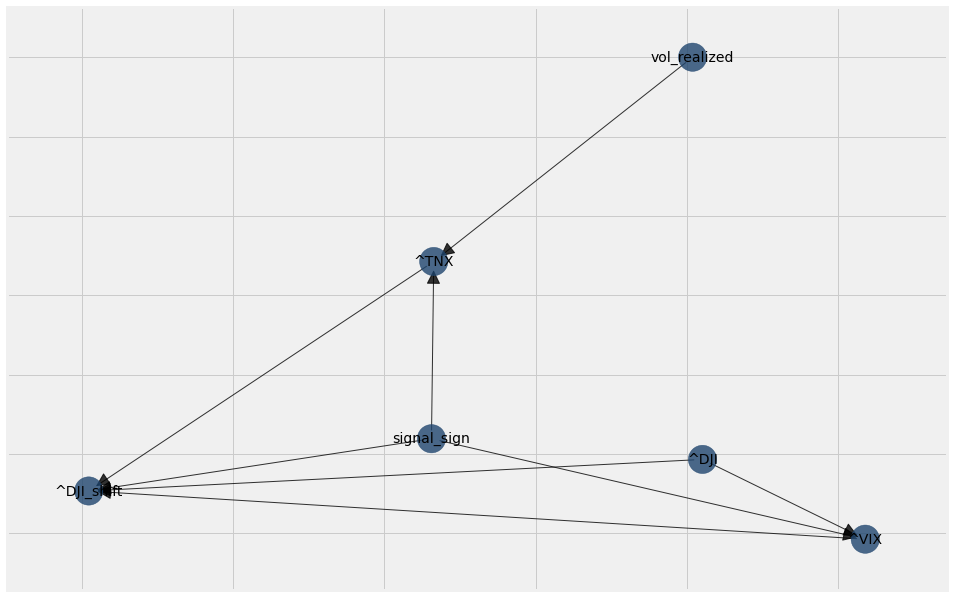

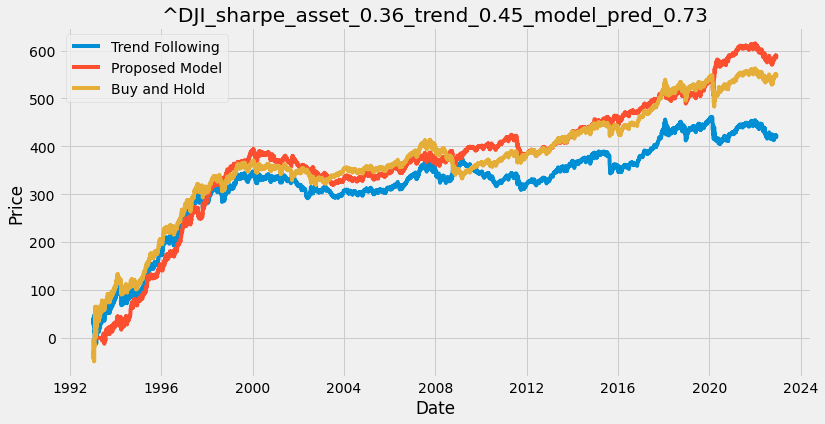

<Figure size 864x432 with 0 Axes>

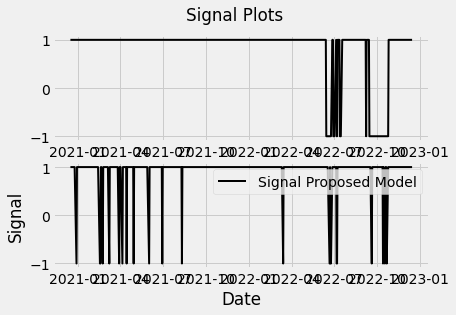

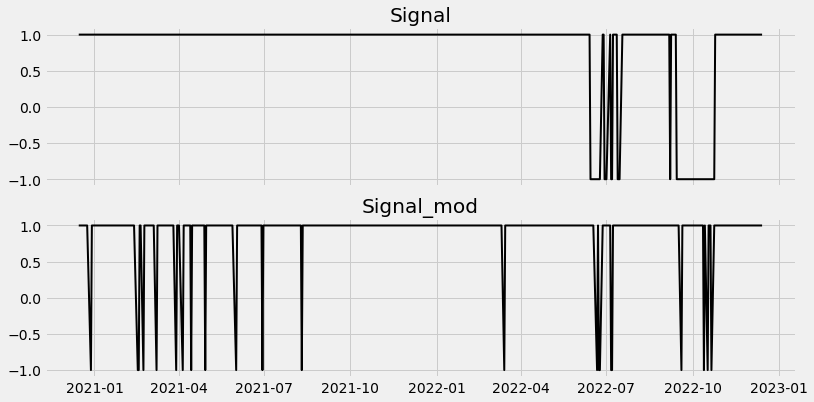

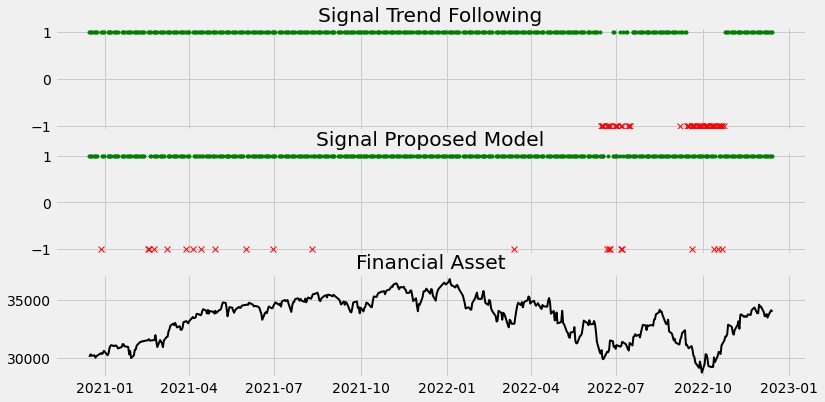

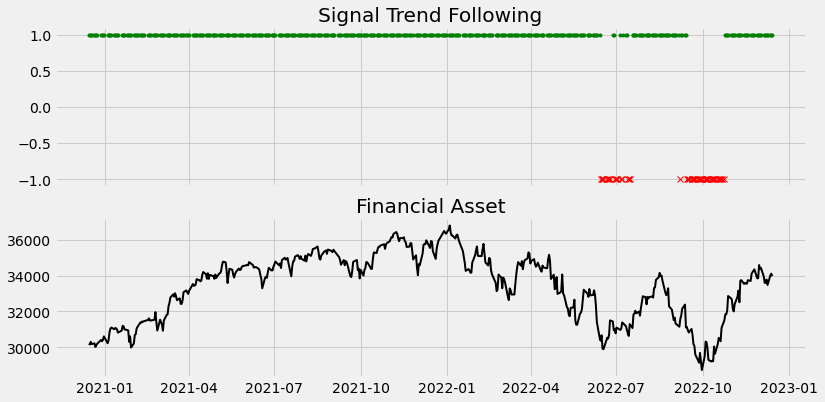

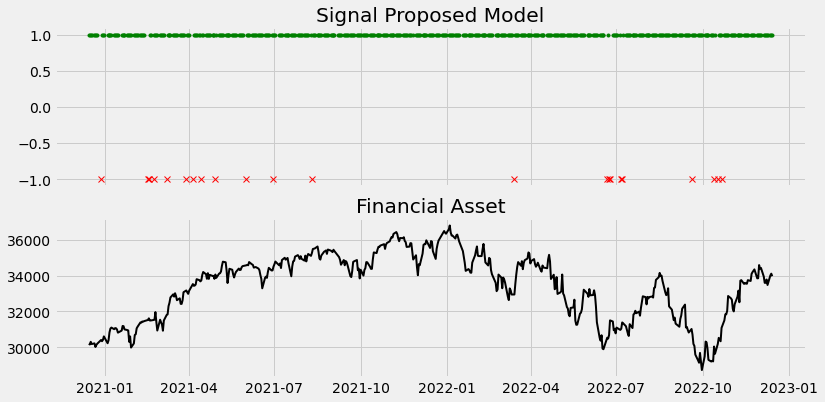

^IXIC
                                 Open        High         Low       Close  \
Date                                                                        
1973-01-02 00:00:00-05:00  134.630005  134.630005  134.630005  134.630005   
1973-01-03 00:00:00-05:00  135.380005  135.380005  135.380005  135.380005   
1973-01-04 00:00:00-05:00  135.440002  135.440002  135.440002  135.440002   
1973-01-05 00:00:00-05:00  135.910004  135.910004  135.910004  135.910004   
1973-01-08 00:00:00-05:00  136.020004  136.020004  136.020004  136.020004   

                           Volume  Dividends  Stock Splits  
Date                                                        
1973-01-02 00:00:00-05:00       0        0.0           0.0  
1973-01-03 00:00:00-05:00       0        0.0           0.0  
1973-01-04 00:00:00-05:00       0        0.0           0.0  
1973-01-05 00:00:00-05:00       0        0.0           0.0  
1973-01-08 00:00:00-05:00       0        0.0           0.0  
                          C

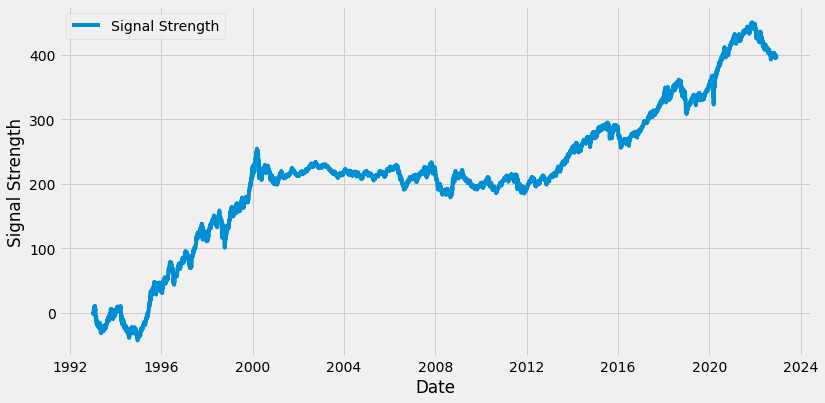

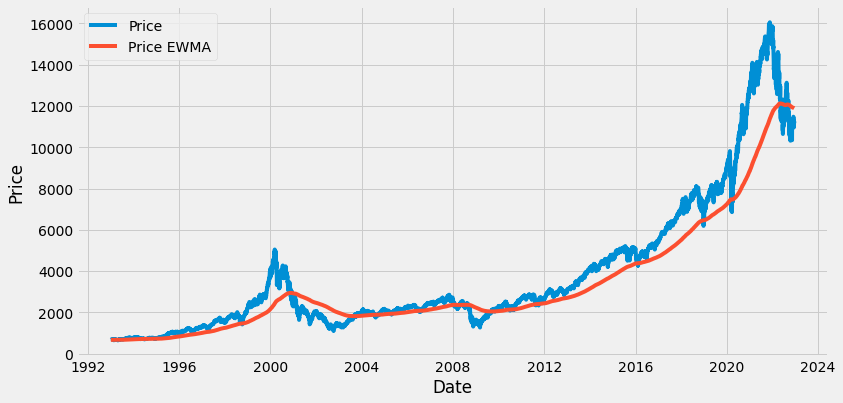

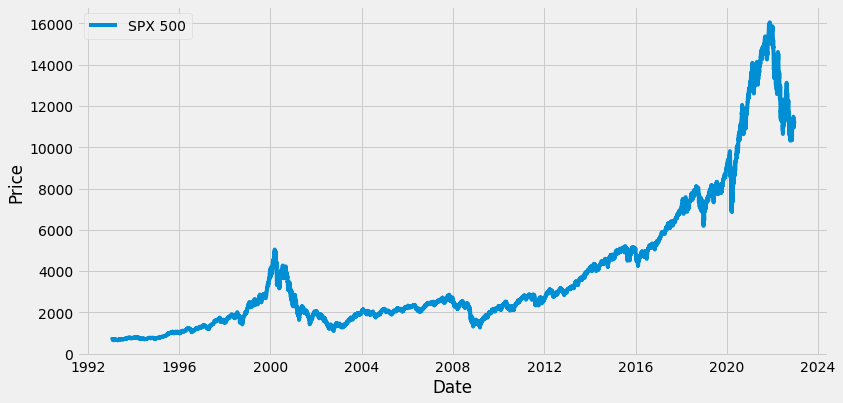

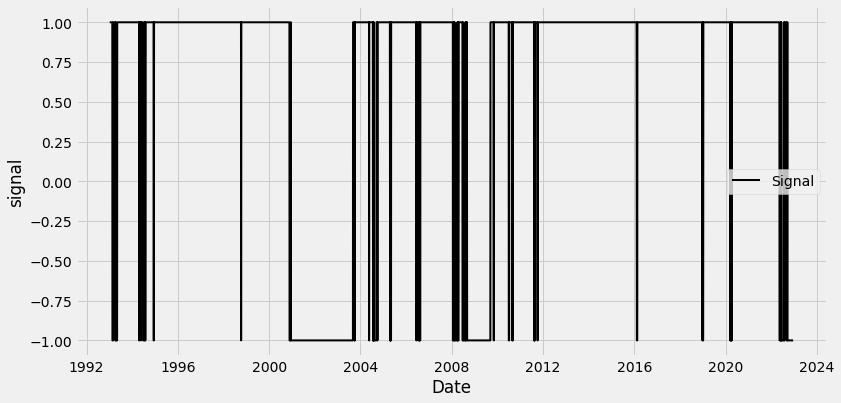

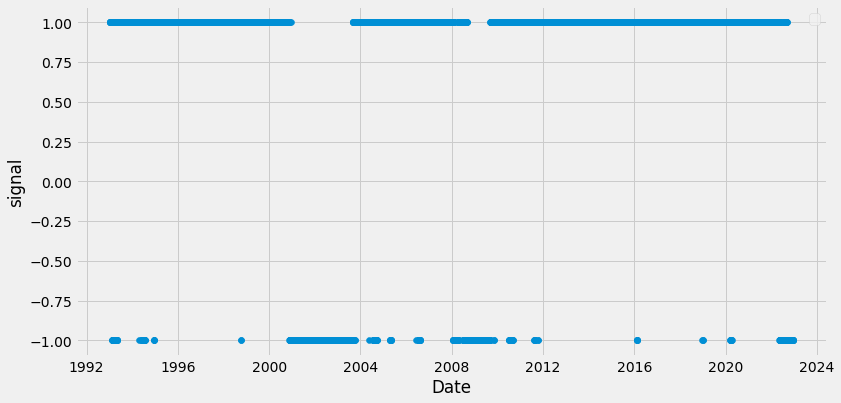

                     ^IXIC  ^TNX  ^VIX  vol_realized  signal_sign  ^IXIC_shift
Date                                                                          
1993-01-05 05:00:00    1.0   1.0   0.0           1.0          NaN          1.0
1993-01-06 05:00:00    1.0   1.0   1.0           1.0          1.0          0.0
1993-01-07 05:00:00    0.0   1.0   1.0           1.0          1.0          0.0
1993-01-08 05:00:00    0.0   0.0   0.0           1.0          1.0          1.0
1993-01-11 05:00:00    1.0   0.0   0.0           1.0          1.0          0.0
...                    ...   ...   ...           ...          ...          ...
2022-12-08 05:00:00    1.0   1.0   0.0           0.0         -1.0          0.0
2022-12-09 05:00:00    0.0   1.0   1.0           1.0         -1.0          1.0
2022-12-12 05:00:00    1.0   1.0   1.0           1.0         -1.0          1.0
2022-12-13 05:00:00    1.0   0.0   0.0           0.0         -1.0          0.0
2022-12-14 05:00:00    0.0   1.0   0.0           0.0

  0%|          | 1/7443 [00:00<32:16,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
100 / 7543


  0%|          | 2/7443 [00:00<31:50,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 3/7443 [00:00<31:53,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 4/7443 [00:01<33:20,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 5/7443 [00:01<32:56,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 6/7443 [00:01<34:57,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 8/7443 [00:02<33:58,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 9/7443 [00:02<35:07,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 10/7443 [00:02<33:22,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 11/7443 [00:02<32:28,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 13/7443 [00:03<33:29,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 14/7443 [00:04<1:03:56,  1.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 15/7443 [00:04<53:53,  2.30it/s]  

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 16/7443 [00:05<46:37,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 17/7443 [00:05<41:30,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 18/7443 [00:05<38:34,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 19/7443 [00:05<35:59,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 20/7443 [00:06<33:59,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 21/7443 [00:06<33:54,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 23/7443 [00:06<32:06,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 24/7443 [00:07<30:47,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 26/7443 [00:07<31:45,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 27/7443 [00:07<32:10,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 28/7443 [00:08<31:37,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 29/7443 [00:08<31:35,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 31/7443 [00:08<32:06,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 32/7443 [00:09<31:52,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 34/7443 [00:09<32:14,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  0%|          | 36/7443 [00:10<31:49,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 38/7443 [00:10<31:47,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 39/7443 [00:11<33:11,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 40/7443 [00:11<32:44,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 41/7443 [00:11<32:21,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 42/7443 [00:11<33:44,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 44/7443 [00:12<32:56,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 45/7443 [00:12<33:19,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 47/7443 [00:13<32:26,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 48/7443 [00:13<32:03,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 49/7443 [00:13<31:40,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 50/7443 [00:13<32:25,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 52/7443 [00:14<33:52,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 54/7443 [00:15<33:39,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 55/7443 [00:15<32:31,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 56/7443 [00:15<31:35,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 57/7443 [00:15<31:42,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 58/7443 [00:16<31:27,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 59/7443 [00:16<31:03,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 60/7443 [00:16<30:11,  4.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 61/7443 [00:16<30:28,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 63/7443 [00:17<32:57,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 64/7443 [00:17<32:46,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 65/7443 [00:17<32:03,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 66/7443 [00:18<31:50,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 67/7443 [00:18<31:50,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 68/7443 [00:18<32:02,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 69/7443 [00:18<32:50,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 71/7443 [00:19<31:58,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 72/7443 [00:19<31:51,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 73/7443 [00:19<32:18,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 75/7443 [00:20<32:24,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 76/7443 [00:20<34:01,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 78/7443 [00:21<34:19,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 79/7443 [00:21<32:51,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 81/7443 [00:22<31:57,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 82/7443 [00:22<31:26,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 83/7443 [00:22<30:44,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 85/7443 [00:23<32:14,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 86/7443 [00:23<32:33,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 87/7443 [00:23<32:00,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 88/7443 [00:23<32:05,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 89/7443 [00:24<31:06,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 91/7443 [00:24<31:20,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 92/7443 [00:24<31:32,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|          | 93/7443 [00:25<30:35,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 95/7443 [00:25<31:26,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 96/7443 [00:25<31:30,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 97/7443 [00:26<31:08,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 98/7443 [00:26<31:11,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 99/7443 [00:26<31:24,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 100/7443 [00:27<32:02,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 101/7443 [00:27<33:38,  3.64it/s]

200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 103/7443 [00:27<32:38,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 105/7443 [00:28<31:57,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 106/7443 [00:28<33:09,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 107/7443 [00:28<32:08,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 108/7443 [00:29<32:07,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 109/7443 [00:29<31:40,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 110/7443 [00:29<31:48,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  1%|▏         | 111/7443 [00:29<30:59,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 112/7443 [00:30<31:03,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 113/7443 [00:30<30:25,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 115/7443 [00:30<31:37,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 116/7443 [00:31<31:56,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 117/7443 [00:31<30:43,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 118/7443 [00:31<30:44,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 119/7443 [00:31<30:35,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 120/7443 [00:32<31:54,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 122/7443 [00:32<31:23,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 123/7443 [00:33<31:31,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 124/7443 [00:33<31:21,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 125/7443 [00:33<30:50,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 126/7443 [00:33<30:56,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 127/7443 [00:34<30:42,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 128/7443 [00:34<31:01,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 129/7443 [00:34<31:46,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 130/7443 [00:34<33:22,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 132/7443 [00:35<32:32,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 133/7443 [00:35<32:26,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 135/7443 [00:36<31:49,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 136/7443 [00:36<32:40,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 137/7443 [00:36<31:35,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 138/7443 [00:36<31:24,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 139/7443 [00:37<31:40,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 140/7443 [00:37<31:22,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 142/7443 [00:38<32:23,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 143/7443 [00:38<32:07,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 144/7443 [00:38<32:01,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 145/7443 [00:38<33:09,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 147/7443 [00:39<32:36,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 148/7443 [00:39<32:03,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 149/7443 [00:39<31:33,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 150/7443 [00:40<30:40,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 151/7443 [00:40<30:52,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 152/7443 [00:40<30:00,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 153/7443 [00:40<29:26,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 154/7443 [00:41<29:35,  4.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 155/7443 [00:41<30:16,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 156/7443 [00:41<31:06,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 157/7443 [00:41<32:57,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 159/7443 [00:42<32:22,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 161/7443 [00:42<31:33,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 162/7443 [00:43<31:48,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 163/7443 [00:43<31:25,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 164/7443 [00:43<31:05,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 165/7443 [00:43<30:29,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 166/7443 [00:44<31:34,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 168/7443 [00:44<32:34,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 169/7443 [00:45<33:09,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 171/7443 [00:45<32:04,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 172/7443 [00:45<31:20,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 173/7443 [00:46<30:38,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 174/7443 [00:46<30:38,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 175/7443 [00:46<31:15,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 176/7443 [00:46<31:29,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 177/7443 [00:47<31:28,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 179/7443 [00:47<31:44,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 180/7443 [00:47<32:19,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 182/7443 [00:48<32:12,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 183/7443 [00:48<32:03,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 184/7443 [00:48<31:04,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  2%|▏         | 185/7443 [00:49<30:32,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 187/7443 [00:49<31:28,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 189/7443 [00:50<30:40,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 191/7443 [00:50<32:16,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 192/7443 [00:51<32:37,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 193/7443 [00:51<32:00,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 195/7443 [00:51<32:42,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 196/7443 [00:52<31:32,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 197/7443 [00:52<31:55,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 199/7443 [00:52<31:38,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 201/7443 [00:53<31:13,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 203/7443 [00:54<32:27,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 204/7443 [00:54<33:28,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 205/7443 [00:54<33:22,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 207/7443 [00:55<32:57,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 208/7443 [00:55<33:06,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 209/7443 [00:55<32:52,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 211/7443 [00:56<31:49,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 212/7443 [00:56<31:35,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 213/7443 [00:56<31:10,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 214/7443 [00:56<30:56,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 215/7443 [00:57<30:31,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 216/7443 [00:57<31:36,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 217/7443 [00:57<32:06,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 219/7443 [00:58<32:25,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 220/7443 [00:58<33:06,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 222/7443 [00:59<33:04,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 223/7443 [00:59<32:25,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 224/7443 [00:59<31:14,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 225/7443 [00:59<30:10,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 226/7443 [01:00<30:25,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 227/7443 [01:00<30:01,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 228/7443 [01:00<30:44,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 229/7443 [01:00<30:41,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 230/7443 [01:01<30:46,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 231/7443 [01:01<30:41,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 232/7443 [01:01<30:06,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 233/7443 [01:01<30:18,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 234/7443 [01:02<31:34,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 235/7443 [01:02<30:22,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 236/7443 [01:02<29:44,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 237/7443 [01:02<31:01,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 239/7443 [01:03<32:00,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 241/7443 [01:04<31:35,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 243/7443 [01:04<31:25,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 244/7443 [01:04<31:01,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 245/7443 [01:05<30:17,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 246/7443 [01:05<29:37,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 247/7443 [01:05<29:30,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 248/7443 [01:05<29:45,  4.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 249/7443 [01:06<56:38,  2.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 250/7443 [01:07<48:59,  2.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 251/7443 [01:07<44:23,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 252/7443 [01:07<41:30,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 254/7443 [01:08<36:31,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 256/7443 [01:08<33:35,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 257/7443 [01:08<33:01,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 258/7443 [01:09<32:20,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 259/7443 [01:09<32:39,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  3%|▎         | 260/7443 [01:09<31:41,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 261/7443 [01:09<32:23,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 263/7443 [01:10<32:05,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 264/7443 [01:10<32:33,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 265/7443 [01:11<32:00,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 266/7443 [01:11<31:39,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 267/7443 [01:11<31:57,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 269/7443 [01:12<31:57,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 270/7443 [01:12<31:27,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 271/7443 [01:12<31:25,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 272/7443 [01:12<33:06,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 273/7443 [01:13<35:17,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 274/7443 [01:13<36:05,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 275/7443 [01:13<38:45,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 276/7443 [01:14<38:01,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 277/7443 [01:14<37:25,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▎         | 279/7443 [01:15<37:01,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 280/7443 [01:15<39:00,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 281/7443 [01:15<40:34,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 282/7443 [01:16<40:38,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 283/7443 [01:16<40:39,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 284/7443 [01:16<40:51,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 285/7443 [01:17<40:58,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 286/7443 [01:17<40:38,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 287/7443 [01:17<40:52,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 288/7443 [01:18<39:04,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 289/7443 [01:18<40:32,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 290/7443 [01:19<42:02,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 291/7443 [01:19<42:35,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 292/7443 [01:19<41:33,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 293/7443 [01:20<40:50,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 294/7443 [01:20<41:06,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 295/7443 [01:20<40:34,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 296/7443 [01:21<40:37,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 297/7443 [01:21<40:40,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 298/7443 [01:21<42:14,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 299/7443 [01:22<41:40,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 300/7443 [01:22<41:26,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 301/7443 [01:22<41:28,  2.87it/s]

400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 302/7443 [01:23<39:49,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 303/7443 [01:23<39:56,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 304/7443 [01:23<40:59,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 305/7443 [01:24<41:15,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 306/7443 [01:24<41:42,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 307/7443 [01:24<40:43,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 308/7443 [01:25<40:38,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 309/7443 [01:25<40:47,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 310/7443 [01:25<42:26,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 311/7443 [01:26<45:07,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 312/7443 [01:26<44:46,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 313/7443 [01:27<44:07,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 314/7443 [01:27<42:37,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 315/7443 [01:27<40:42,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 316/7443 [01:28<43:55,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 317/7443 [01:28<42:13,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 319/7443 [01:29<38:26,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 320/7443 [01:29<36:45,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 321/7443 [01:29<34:58,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 322/7443 [01:29<33:16,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 323/7443 [01:30<31:59,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 324/7443 [01:30<31:51,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 326/7443 [01:30<31:34,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 327/7443 [01:31<31:21,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 328/7443 [01:31<32:01,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 330/7443 [01:32<32:31,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 331/7443 [01:32<32:40,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 332/7443 [01:32<32:30,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  4%|▍         | 333/7443 [01:32<32:50,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 335/7443 [01:33<31:54,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 336/7443 [01:33<31:43,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 337/7443 [01:33<32:14,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 338/7443 [01:34<32:21,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 339/7443 [01:34<31:56,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 340/7443 [01:34<31:08,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 341/7443 [01:35<30:59,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 343/7443 [01:35<31:24,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 344/7443 [01:35<32:03,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 346/7443 [01:36<31:29,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 347/7443 [01:36<32:30,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 349/7443 [01:37<32:23,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 350/7443 [01:37<32:51,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 351/7443 [01:37<31:49,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 352/7443 [01:37<31:04,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 353/7443 [01:38<31:26,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 354/7443 [01:38<30:47,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 355/7443 [01:38<30:48,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 356/7443 [01:39<30:26,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 357/7443 [01:39<30:06,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 358/7443 [01:39<30:29,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 359/7443 [01:39<30:11,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 360/7443 [01:40<29:31,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 362/7443 [01:40<31:17,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 363/7443 [01:40<31:39,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 364/7443 [01:41<30:30,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 365/7443 [01:41<30:45,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 366/7443 [01:41<29:58,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 367/7443 [01:41<29:35,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 368/7443 [01:42<29:34,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 370/7443 [01:42<30:51,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 371/7443 [01:42<31:28,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▍         | 372/7443 [01:43<30:53,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 373/7443 [01:43<31:13,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 374/7443 [01:43<32:11,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 375/7443 [01:44<33:20,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 377/7443 [01:44<32:03,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 378/7443 [01:44<30:54,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 379/7443 [01:45<30:18,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 380/7443 [01:45<29:29,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 381/7443 [01:45<30:14,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 382/7443 [01:45<29:52,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 383/7443 [01:46<30:03,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 385/7443 [01:46<31:15,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 386/7443 [01:46<30:25,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 387/7443 [01:47<31:22,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 388/7443 [01:47<31:21,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 389/7443 [01:47<30:51,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 390/7443 [01:47<31:40,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 392/7443 [01:48<31:40,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 393/7443 [01:48<33:00,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 395/7443 [01:49<31:11,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 397/7443 [01:49<30:46,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 398/7443 [01:50<30:17,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 399/7443 [01:50<30:19,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 400/7443 [01:50<30:30,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 401/7443 [01:50<31:38,  3.71it/s]

500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 402/7443 [01:51<30:40,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 403/7443 [01:51<31:32,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 405/7443 [01:51<31:40,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 406/7443 [01:52<32:38,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 407/7443 [01:52<32:46,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  5%|▌         | 408/7443 [01:52<31:45,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 410/7443 [01:53<31:15,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 411/7443 [01:53<31:39,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 412/7443 [01:53<32:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 413/7443 [01:54<31:29,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 414/7443 [01:54<31:28,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 416/7443 [01:54<31:08,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 417/7443 [01:55<30:39,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 418/7443 [01:55<30:09,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 419/7443 [01:55<30:51,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 420/7443 [01:56<30:53,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 421/7443 [01:56<30:08,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 422/7443 [01:56<29:38,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 423/7443 [01:56<29:29,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 424/7443 [01:57<29:36,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 425/7443 [01:57<31:24,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 426/7443 [01:57<30:02,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 427/7443 [01:57<29:54,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 428/7443 [01:58<32:18,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 430/7443 [01:58<31:07,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 431/7443 [01:58<32:06,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 433/7443 [01:59<32:37,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 434/7443 [01:59<31:36,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 436/7443 [02:00<30:13,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 438/7443 [02:00<29:53,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 439/7443 [02:01<31:18,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 440/7443 [02:01<31:01,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 441/7443 [02:01<30:44,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 442/7443 [02:01<31:07,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 444/7443 [02:02<30:59,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 446/7443 [02:02<31:09,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 447/7443 [02:03<31:45,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 448/7443 [02:03<30:58,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 449/7443 [02:03<31:15,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 450/7443 [02:04<31:10,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 451/7443 [02:04<31:18,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 453/7443 [02:04<30:56,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 455/7443 [02:05<32:16,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 456/7443 [02:05<31:54,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 457/7443 [02:05<31:17,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 458/7443 [02:06<30:09,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 459/7443 [02:06<30:28,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 460/7443 [02:06<30:43,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 461/7443 [02:06<30:03,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 462/7443 [02:07<29:42,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▌         | 464/7443 [02:07<29:30,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 466/7443 [02:08<30:10,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 467/7443 [02:08<30:57,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 468/7443 [02:08<30:51,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 469/7443 [02:09<30:18,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 470/7443 [02:09<31:23,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 472/7443 [02:09<31:42,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 473/7443 [02:10<31:19,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 475/7443 [02:10<31:49,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 476/7443 [02:10<30:46,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 477/7443 [02:11<30:04,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 478/7443 [02:11<29:54,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 479/7443 [02:11<31:03,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 481/7443 [02:13<58:17,  1.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  6%|▋         | 483/7443 [02:13<43:21,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 484/7443 [02:13<39:02,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 485/7443 [02:14<35:34,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 486/7443 [02:14<33:43,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 487/7443 [02:14<31:52,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 488/7443 [02:14<31:08,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 489/7443 [02:15<30:19,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 490/7443 [02:15<29:46,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 491/7443 [02:15<30:23,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 493/7443 [02:16<30:05,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 494/7443 [02:16<29:48,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 496/7443 [02:16<31:02,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 497/7443 [02:17<31:30,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 498/7443 [02:17<30:58,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 499/7443 [02:17<31:29,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 501/7443 [02:18<31:00,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 503/7443 [02:18<30:54,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 504/7443 [02:19<32:09,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 506/7443 [02:19<31:09,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 507/7443 [02:19<30:31,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 508/7443 [02:20<30:35,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 509/7443 [02:20<30:02,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 510/7443 [02:20<30:12,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 511/7443 [02:20<29:57,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 513/7443 [02:21<30:07,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 514/7443 [02:21<30:37,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 516/7443 [02:22<31:08,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 517/7443 [02:22<32:40,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 519/7443 [02:23<31:24,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 520/7443 [02:23<31:35,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 522/7443 [02:23<31:35,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 523/7443 [02:24<31:28,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 525/7443 [02:24<31:06,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 526/7443 [02:24<30:11,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 527/7443 [02:25<29:52,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 528/7443 [02:25<29:42,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 529/7443 [02:25<31:04,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 530/7443 [02:26<30:59,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 531/7443 [02:26<32:05,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 533/7443 [02:26<31:12,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 534/7443 [02:27<31:04,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 535/7443 [02:27<30:57,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 537/7443 [02:27<29:50,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 538/7443 [02:28<30:28,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 539/7443 [02:28<32:39,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 540/7443 [02:28<33:12,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 542/7443 [02:29<32:02,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 544/7443 [02:29<31:20,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 545/7443 [02:30<31:58,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 546/7443 [02:30<30:35,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 548/7443 [02:30<31:00,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 549/7443 [02:31<30:42,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 551/7443 [02:31<31:37,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 552/7443 [02:32<31:26,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 554/7443 [02:32<31:17,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 556/7443 [02:33<30:30,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 557/7443 [02:33<29:48,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  7%|▋         | 558/7443 [02:33<31:05,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 560/7443 [02:34<31:04,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 561/7443 [02:34<31:12,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 562/7443 [02:34<31:12,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 564/7443 [02:35<30:49,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 565/7443 [02:35<31:39,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 567/7443 [02:36<30:28,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 568/7443 [02:36<30:37,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 569/7443 [02:36<29:38,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 570/7443 [02:36<30:52,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 571/7443 [02:37<31:48,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 572/7443 [02:37<31:31,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 573/7443 [02:37<32:20,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 575/7443 [02:38<32:48,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 576/7443 [02:38<31:57,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 577/7443 [02:38<31:25,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 578/7443 [02:39<32:13,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 580/7443 [02:39<31:37,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 582/7443 [02:40<32:12,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 583/7443 [02:40<31:06,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 584/7443 [02:40<30:14,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 585/7443 [02:41<31:14,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 587/7443 [02:41<30:54,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 588/7443 [02:41<30:45,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 589/7443 [02:42<31:01,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 591/7443 [02:42<29:53,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 592/7443 [02:43<30:02,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 594/7443 [02:43<30:04,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 595/7443 [02:43<31:09,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 596/7443 [02:44<30:47,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 598/7443 [02:44<31:18,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 600/7443 [02:45<29:57,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 601/7443 [02:45<31:31,  3.62it/s]

700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 603/7443 [02:46<31:51,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 605/7443 [02:46<32:30,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 606/7443 [02:46<31:35,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 607/7443 [02:47<31:02,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 609/7443 [02:47<31:23,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 610/7443 [02:48<31:29,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 611/7443 [02:48<30:32,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 612/7443 [02:48<30:57,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 613/7443 [02:48<31:25,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 614/7443 [02:49<31:21,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 615/7443 [02:49<30:58,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 616/7443 [02:49<31:54,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 618/7443 [02:50<31:51,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 620/7443 [02:50<33:11,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 621/7443 [02:51<32:49,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 623/7443 [02:51<32:23,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 624/7443 [02:51<32:16,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 625/7443 [02:52<31:21,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 626/7443 [02:52<30:54,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 627/7443 [02:52<30:38,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 628/7443 [02:52<30:19,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 629/7443 [02:53<29:46,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 630/7443 [02:53<29:08,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  8%|▊         | 631/7443 [02:53<30:31,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 633/7443 [02:54<29:55,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 635/7443 [02:54<30:26,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 636/7443 [02:55<29:45,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 637/7443 [02:55<29:30,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 638/7443 [02:55<29:36,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 640/7443 [02:56<30:28,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 641/7443 [02:56<30:24,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 643/7443 [02:57<30:59,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 645/7443 [02:57<30:34,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 647/7443 [02:58<30:49,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 648/7443 [02:58<30:27,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 649/7443 [02:58<31:02,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▊         | 651/7443 [02:59<30:42,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 652/7443 [02:59<29:38,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 653/7443 [02:59<29:47,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 654/7443 [02:59<29:40,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 655/7443 [03:00<30:19,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 656/7443 [03:00<29:39,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 657/7443 [03:00<30:40,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 658/7443 [03:01<32:10,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 659/7443 [03:01<32:43,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 660/7443 [03:01<33:02,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 662/7443 [03:02<31:57,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 664/7443 [03:02<31:19,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 666/7443 [03:03<30:58,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 668/7443 [03:03<30:29,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 669/7443 [03:04<30:24,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 670/7443 [03:04<29:44,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 671/7443 [03:04<28:55,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 672/7443 [03:04<29:02,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 674/7443 [03:05<30:20,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 675/7443 [03:05<29:13,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 676/7443 [03:05<29:16,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 678/7443 [03:06<29:54,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 679/7443 [03:06<30:57,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 680/7443 [03:07<31:21,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 682/7443 [03:07<30:31,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 683/7443 [03:07<29:50,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 684/7443 [03:08<28:48,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 685/7443 [03:08<29:22,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 686/7443 [03:08<29:01,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 687/7443 [03:08<29:02,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 688/7443 [03:09<28:29,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 689/7443 [03:09<28:36,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 690/7443 [03:09<28:51,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 692/7443 [03:10<29:13,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 693/7443 [03:10<28:35,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 694/7443 [03:10<28:21,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 695/7443 [03:10<28:48,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 696/7443 [03:11<29:18,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 697/7443 [03:11<30:23,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 699/7443 [03:12<29:49,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 700/7443 [03:12<30:13,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 701/7443 [03:12<29:41,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
800 / 7543


  9%|▉         | 702/7443 [03:12<28:58,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 703/7443 [03:13<30:10,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 704/7443 [03:13<31:35,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 706/7443 [03:13<31:29,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


  9%|▉         | 707/7443 [03:14<31:54,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 708/7443 [03:14<31:16,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 709/7443 [03:14<30:53,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 710/7443 [03:15<30:14,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 712/7443 [03:15<29:59,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 713/7443 [03:15<31:57,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 715/7443 [03:17<48:42,  2.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 717/7443 [03:17<39:43,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 719/7443 [03:18<34:25,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 720/7443 [03:18<33:33,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 722/7443 [03:19<31:14,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 723/7443 [03:19<31:41,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 725/7443 [03:19<30:36,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 727/7443 [03:20<30:12,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 728/7443 [03:20<29:47,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 729/7443 [03:20<29:33,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 730/7443 [03:21<29:40,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 731/7443 [03:21<29:23,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 732/7443 [03:21<30:40,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 734/7443 [03:22<29:54,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 736/7443 [03:22<29:21,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 738/7443 [03:23<29:38,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 739/7443 [03:23<29:44,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 740/7443 [03:23<29:05,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 741/7443 [03:24<29:17,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 743/7443 [03:24<29:08,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|▉         | 744/7443 [03:24<29:21,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 746/7443 [03:25<30:20,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 747/7443 [03:25<30:17,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 748/7443 [03:26<30:21,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 749/7443 [03:26<29:33,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 750/7443 [03:26<29:11,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 751/7443 [03:26<28:13,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 752/7443 [03:27<28:44,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 753/7443 [03:27<30:15,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 754/7443 [03:27<30:06,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 756/7443 [03:28<31:38,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 757/7443 [03:28<31:01,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 758/7443 [03:28<30:20,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 759/7443 [03:29<29:17,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 760/7443 [03:29<29:53,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 762/7443 [03:29<29:52,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 764/7443 [03:30<30:39,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 766/7443 [03:30<30:06,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 768/7443 [03:31<29:29,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 769/7443 [03:31<29:18,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 771/7443 [03:32<29:49,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 772/7443 [03:32<30:32,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 774/7443 [03:33<30:08,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 775/7443 [03:33<29:52,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 777/7443 [03:33<29:37,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 778/7443 [03:34<29:25,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 779/7443 [03:34<28:38,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 780/7443 [03:34<28:17,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 10%|█         | 781/7443 [03:34<28:22,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 782/7443 [03:35<28:39,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 784/7443 [03:35<29:42,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 785/7443 [03:36<28:57,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 787/7443 [03:36<28:56,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 789/7443 [03:37<29:40,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 790/7443 [03:37<29:23,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 791/7443 [03:37<30:52,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 793/7443 [03:38<31:55,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 794/7443 [03:38<31:50,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 796/7443 [03:39<31:42,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 797/7443 [03:39<31:09,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 799/7443 [03:39<29:58,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 801/7443 [03:40<30:05,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
900 / 7543


 11%|█         | 802/7443 [03:40<29:25,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 803/7443 [03:40<29:26,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 804/7443 [03:41<29:01,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 805/7443 [03:41<28:56,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 806/7443 [03:41<29:26,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 808/7443 [03:42<29:12,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 809/7443 [03:42<29:13,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 810/7443 [03:42<28:40,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 811/7443 [03:43<30:23,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 813/7443 [03:43<30:24,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 814/7443 [03:43<29:19,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 815/7443 [03:44<30:27,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 817/7443 [03:44<31:37,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 819/7443 [03:45<31:12,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 821/7443 [03:45<29:50,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 822/7443 [03:46<28:48,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 823/7443 [03:46<29:31,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 824/7443 [03:46<29:11,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 825/7443 [03:46<29:59,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 826/7443 [03:47<29:23,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 827/7443 [03:47<29:04,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 828/7443 [03:47<28:04,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 829/7443 [03:47<28:22,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 831/7443 [03:48<29:42,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 833/7443 [03:49<29:14,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 834/7443 [03:49<29:06,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 835/7443 [03:49<28:20,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 836/7443 [03:49<28:08,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█         | 837/7443 [03:50<27:43,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 838/7443 [03:50<27:35,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 840/7443 [03:50<28:36,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 842/7443 [03:51<28:13,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 843/7443 [03:51<29:26,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 845/7443 [03:52<29:28,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 846/7443 [03:52<28:58,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 848/7443 [03:53<28:42,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 849/7443 [03:53<29:28,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 851/7443 [03:53<29:05,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 852/7443 [03:54<28:22,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 853/7443 [03:54<28:27,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 11%|█▏        | 855/7443 [03:54<29:21,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 856/7443 [03:55<28:12,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 857/7443 [03:55<27:18,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 858/7443 [03:55<27:35,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 859/7443 [03:55<27:50,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 860/7443 [03:56<27:34,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 861/7443 [03:56<27:30,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 862/7443 [03:56<27:45,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 864/7443 [03:57<29:08,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 865/7443 [03:57<29:13,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 867/7443 [03:58<30:23,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 868/7443 [03:58<28:56,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 869/7443 [03:58<29:55,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 870/7443 [03:58<30:49,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 871/7443 [03:59<31:09,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 873/7443 [03:59<29:52,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 874/7443 [03:59<29:44,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 875/7443 [04:00<28:57,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 876/7443 [04:00<28:45,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 878/7443 [04:01<29:49,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 879/7443 [04:01<30:10,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 880/7443 [04:01<30:17,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 881/7443 [04:01<31:35,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 882/7443 [04:02<31:03,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 883/7443 [04:02<31:39,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 885/7443 [04:03<31:00,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 887/7443 [04:03<30:43,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 888/7443 [04:03<31:21,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 890/7443 [04:04<29:39,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 892/7443 [04:04<29:21,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 893/7443 [04:05<30:03,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 894/7443 [04:05<30:02,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 895/7443 [04:05<30:19,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 896/7443 [04:06<31:41,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 897/7443 [04:06<32:17,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 898/7443 [04:06<31:07,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 900/7443 [04:07<29:46,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1000 / 7543

 12%|█▏        | 901/7443 [04:07<29:51,  3.65it/s]


[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 903/7443 [04:08<29:35,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 904/7443 [04:08<31:43,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 905/7443 [04:08<33:05,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 906/7443 [04:08<32:01,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 908/7443 [04:09<30:43,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 909/7443 [04:09<29:28,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 910/7443 [04:10<29:08,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 911/7443 [04:10<28:44,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 912/7443 [04:10<28:37,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 913/7443 [04:10<28:44,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 914/7443 [04:11<30:13,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 915/7443 [04:11<31:00,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 916/7443 [04:11<31:37,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 917/7443 [04:11<30:50,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 918/7443 [04:12<31:29,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 919/7443 [04:12<30:33,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 921/7443 [04:13<29:52,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 922/7443 [04:13<29:15,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 924/7443 [04:13<29:29,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 926/7443 [04:14<28:41,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 927/7443 [04:14<28:57,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 12%|█▏        | 929/7443 [04:15<28:45,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 931/7443 [04:15<29:57,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 932/7443 [04:16<31:02,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 933/7443 [04:16<31:10,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 935/7443 [04:16<30:41,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 937/7443 [04:17<29:55,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 938/7443 [04:18<53:54,  2.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 939/7443 [04:18<46:56,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 941/7443 [04:19<37:56,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 942/7443 [04:19<36:38,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 944/7443 [04:20<33:31,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 945/7443 [04:20<31:27,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 946/7443 [04:20<30:28,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 947/7443 [04:21<30:52,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 948/7443 [04:21<31:20,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 949/7443 [04:21<30:55,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 951/7443 [04:22<30:51,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 952/7443 [04:22<29:42,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 953/7443 [04:22<28:34,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 954/7443 [04:22<27:48,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 955/7443 [04:23<28:26,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 956/7443 [04:23<27:13,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 957/7443 [04:23<26:59,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 958/7443 [04:23<26:34,  4.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 959/7443 [04:24<26:40,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 961/7443 [04:24<27:47,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 963/7443 [04:25<28:56,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 964/7443 [04:25<28:58,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 966/7443 [04:26<29:45,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 967/7443 [04:26<30:11,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 969/7443 [04:26<29:43,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 971/7443 [04:27<29:58,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 972/7443 [04:27<29:49,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 973/7443 [04:28<30:53,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 975/7443 [04:28<30:24,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 976/7443 [04:28<30:56,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 978/7443 [04:29<29:13,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 979/7443 [04:29<29:23,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 980/7443 [04:30<29:45,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 981/7443 [04:30<29:59,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 982/7443 [04:30<29:55,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 983/7443 [04:30<30:48,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 984/7443 [04:31<30:41,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 985/7443 [04:31<30:04,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 986/7443 [04:31<30:36,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 988/7443 [04:32<30:25,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 989/7443 [04:32<30:56,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 990/7443 [04:32<30:53,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 992/7443 [04:33<29:58,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 994/7443 [04:34<30:59,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 996/7443 [04:34<30:52,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 998/7443 [04:35<30:06,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 999/7443 [04:35<29:18,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 1001/7443 [04:35<29:50,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1100 / 7543


 13%|█▎        | 1002/7443 [04:36<28:58,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 13%|█▎        | 1003/7443 [04:36<28:27,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1005/7443 [04:37<29:10,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1006/7443 [04:37<28:59,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1007/7443 [04:37<28:50,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1008/7443 [04:37<28:43,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1009/7443 [04:38<29:23,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1010/7443 [04:38<30:45,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1012/7443 [04:39<30:18,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1014/7443 [04:39<30:29,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1015/7443 [04:39<31:04,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1016/7443 [04:40<31:15,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1017/7443 [04:40<30:44,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1018/7443 [04:40<31:19,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1019/7443 [04:41<30:58,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1020/7443 [04:41<34:33,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1021/7443 [04:41<34:08,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1022/7443 [04:42<33:22,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▎        | 1023/7443 [04:42<33:35,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1024/7443 [04:42<32:53,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1025/7443 [04:43<33:43,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1026/7443 [04:43<33:12,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1027/7443 [04:43<34:42,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1028/7443 [04:44<35:59,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1029/7443 [04:44<36:29,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1030/7443 [04:44<36:40,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1031/7443 [04:45<36:38,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1032/7443 [04:45<36:03,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1033/7443 [04:45<37:26,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1034/7443 [04:46<37:20,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1035/7443 [04:46<37:00,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1036/7443 [04:46<38:02,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1037/7443 [04:47<38:57,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1038/7443 [04:47<38:28,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1039/7443 [04:47<38:22,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1040/7443 [04:48<37:20,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1041/7443 [04:48<38:47,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1042/7443 [04:49<37:19,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1043/7443 [04:49<36:58,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1044/7443 [04:49<36:58,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1045/7443 [04:50<36:25,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1046/7443 [04:50<36:23,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1047/7443 [04:50<35:28,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1048/7443 [04:50<34:56,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1049/7443 [04:51<35:50,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1050/7443 [04:51<35:08,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1051/7443 [04:52<35:44,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1052/7443 [04:52<37:02,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1053/7443 [04:52<38:07,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1054/7443 [04:53<38:15,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1055/7443 [04:53<38:26,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1056/7443 [04:53<39:13,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1057/7443 [04:54<38:43,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1058/7443 [04:54<38:44,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1059/7443 [04:54<39:43,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1060/7443 [04:55<39:36,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1061/7443 [04:55<38:57,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1062/7443 [04:56<39:03,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1063/7443 [04:56<41:03,  2.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1064/7443 [04:56<39:55,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1065/7443 [04:57<39:40,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1066/7443 [04:57<40:20,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1067/7443 [04:57<39:13,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1068/7443 [04:58<37:51,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1069/7443 [04:58<35:56,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1070/7443 [04:58<35:41,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1071/7443 [04:59<34:37,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1072/7443 [04:59<33:58,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1073/7443 [04:59<33:08,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1074/7443 [05:00<32:55,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1075/7443 [05:00<32:14,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1076/7443 [05:00<31:04,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1077/7443 [05:00<31:25,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 14%|█▍        | 1079/7443 [05:01<30:27,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1080/7443 [05:01<29:22,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1081/7443 [05:02<30:07,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1082/7443 [05:02<29:28,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1084/7443 [05:02<29:28,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1085/7443 [05:03<29:19,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1086/7443 [05:03<30:07,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1087/7443 [05:03<30:19,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1088/7443 [05:04<29:47,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1090/7443 [05:04<29:09,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1092/7443 [05:05<28:52,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1093/7443 [05:05<30:25,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1094/7443 [05:05<30:23,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1095/7443 [05:06<29:47,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1097/7443 [05:06<29:44,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1098/7443 [05:06<30:10,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1099/7443 [05:07<30:41,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1101/7443 [05:07<30:29,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1103/7443 [05:08<30:47,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1105/7443 [05:08<28:54,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1107/7443 [05:09<28:01,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1109/7443 [05:09<27:54,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1110/7443 [05:10<28:42,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1111/7443 [05:10<28:39,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1112/7443 [05:10<28:51,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1113/7443 [05:11<29:41,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1115/7443 [05:11<29:10,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▍        | 1116/7443 [05:11<30:22,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1117/7443 [05:12<30:46,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1118/7443 [05:12<30:56,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1120/7443 [05:13<31:03,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1121/7443 [05:13<30:19,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1122/7443 [05:13<30:40,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1123/7443 [05:14<31:28,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1124/7443 [05:14<31:32,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1125/7443 [05:14<30:48,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1126/7443 [05:14<31:55,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1127/7443 [05:15<31:21,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1129/7443 [05:15<30:52,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1131/7443 [05:16<30:40,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1132/7443 [05:16<31:01,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1134/7443 [05:17<29:43,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1136/7443 [05:17<30:06,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1137/7443 [05:18<31:17,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1138/7443 [05:18<30:37,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1140/7443 [05:18<29:09,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1142/7443 [05:19<29:34,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1143/7443 [05:19<29:02,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1144/7443 [05:20<28:01,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1145/7443 [05:20<27:41,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1147/7443 [05:20<27:02,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1148/7443 [05:21<28:00,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1149/7443 [05:21<28:40,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1150/7443 [05:21<29:47,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1151/7443 [05:21<29:22,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 15%|█▌        | 1152/7443 [05:22<31:07,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1154/7443 [05:22<30:41,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1155/7443 [05:23<29:58,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1157/7443 [05:23<29:48,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1158/7443 [05:23<29:18,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1160/7443 [05:24<29:47,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1161/7443 [05:24<30:12,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1162/7443 [05:25<29:51,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1163/7443 [05:26<54:36,  1.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1164/7443 [05:26<47:28,  2.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1165/7443 [05:26<42:50,  2.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1166/7443 [05:27<38:52,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1167/7443 [05:27<36:33,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1169/7443 [05:27<32:28,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1170/7443 [05:28<30:46,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1171/7443 [05:28<29:30,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1173/7443 [05:29<28:21,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1174/7443 [05:29<27:20,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1175/7443 [05:29<26:56,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1177/7443 [05:30<27:29,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1178/7443 [05:30<28:21,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1180/7443 [05:30<28:33,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1181/7443 [05:31<28:24,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1182/7443 [05:31<28:13,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1184/7443 [05:31<28:09,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1185/7443 [05:32<28:45,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1186/7443 [05:32<29:39,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1187/7443 [05:32<30:42,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1188/7443 [05:33<30:45,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1190/7443 [05:33<29:40,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1192/7443 [05:34<28:56,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1193/7443 [05:34<29:29,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1195/7443 [05:35<29:48,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1196/7443 [05:35<29:28,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1197/7443 [05:35<28:57,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1198/7443 [05:36<29:55,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1199/7443 [05:36<29:56,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1200/7443 [05:36<29:52,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1201/7443 [05:36<31:13,  3.33it/s]

1300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1202/7443 [05:37<31:28,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1204/7443 [05:37<29:16,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1206/7443 [05:38<28:13,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1208/7443 [05:38<27:30,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▌        | 1209/7443 [05:39<29:07,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1211/7443 [05:39<28:03,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1212/7443 [05:39<27:56,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1213/7443 [05:40<27:36,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1215/7443 [05:40<28:06,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1216/7443 [05:41<29:07,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1218/7443 [05:41<28:26,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1219/7443 [05:41<29:59,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1220/7443 [05:42<29:37,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1221/7443 [05:42<30:44,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1222/7443 [05:42<30:52,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1223/7443 [05:43<31:30,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1224/7443 [05:43<31:04,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1225/7443 [05:43<31:39,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 16%|█▋        | 1227/7443 [05:44<28:58,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1229/7443 [05:44<28:08,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1230/7443 [05:44<27:08,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1231/7443 [05:45<26:56,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1233/7443 [05:45<26:54,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1234/7443 [05:46<26:13,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1235/7443 [05:46<26:24,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1237/7443 [05:46<27:36,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1238/7443 [05:47<27:38,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1239/7443 [05:47<28:07,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1241/7443 [05:47<29:42,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1243/7443 [05:48<28:50,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1244/7443 [05:48<31:02,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1245/7443 [05:49<30:30,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1246/7443 [05:49<30:21,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1247/7443 [05:49<31:36,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1248/7443 [05:50<30:53,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1250/7443 [05:50<28:46,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1251/7443 [05:50<28:49,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1252/7443 [05:51<29:04,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1253/7443 [05:51<29:03,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1254/7443 [05:51<29:25,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1256/7443 [05:52<29:11,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1257/7443 [05:52<29:08,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1258/7443 [05:52<28:10,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1259/7443 [05:53<28:37,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1261/7443 [05:53<27:58,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1263/7443 [05:54<27:30,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1264/7443 [05:54<26:58,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1265/7443 [05:54<27:01,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1266/7443 [05:55<28:34,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1268/7443 [05:55<29:23,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1269/7443 [05:55<30:58,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1271/7443 [05:56<30:11,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1272/7443 [05:56<30:36,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1273/7443 [05:57<30:00,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1275/7443 [05:57<30:17,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1276/7443 [05:57<29:35,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1277/7443 [05:58<29:07,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1278/7443 [05:58<28:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1279/7443 [05:58<28:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1281/7443 [05:59<28:21,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1282/7443 [05:59<27:16,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1283/7443 [05:59<26:49,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1284/7443 [06:00<26:52,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1286/7443 [06:00<27:47,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1287/7443 [06:00<28:05,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1289/7443 [06:01<29:11,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1290/7443 [06:01<29:09,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1292/7443 [06:02<29:12,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1293/7443 [06:02<29:37,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1294/7443 [06:02<28:20,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1295/7443 [06:03<27:42,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1296/7443 [06:03<27:55,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1297/7443 [06:03<28:17,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1298/7443 [06:04<27:58,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1299/7443 [06:04<27:27,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 17%|█▋        | 1300/7443 [06:04<26:36,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1400 / 7543

 17%|█▋        | 1301/7443 [06:04<27:59,  3.66it/s]


[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1303/7443 [06:05<27:11,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1304/7443 [06:05<26:53,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1305/7443 [06:05<27:20,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1306/7443 [06:06<28:24,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1307/7443 [06:06<28:32,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1309/7443 [06:07<27:53,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1310/7443 [06:07<28:12,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1312/7443 [06:07<28:16,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1313/7443 [06:08<27:46,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1314/7443 [06:08<27:37,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1315/7443 [06:08<28:50,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1317/7443 [06:09<28:42,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1318/7443 [06:09<29:09,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1319/7443 [06:09<28:39,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1320/7443 [06:10<28:08,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1321/7443 [06:10<28:04,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1322/7443 [06:10<29:05,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1324/7443 [06:11<27:20,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1325/7443 [06:11<26:59,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1327/7443 [06:11<27:19,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1329/7443 [06:12<27:36,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1330/7443 [06:12<29:07,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1332/7443 [06:13<27:59,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1334/7443 [06:13<27:18,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1335/7443 [06:14<27:29,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1336/7443 [06:14<27:03,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1337/7443 [06:14<27:09,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1339/7443 [06:15<27:54,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1340/7443 [06:15<29:11,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1342/7443 [06:16<29:40,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1344/7443 [06:16<28:32,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1345/7443 [06:17<29:22,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1347/7443 [06:17<28:59,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1348/7443 [06:17<29:05,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1350/7443 [06:18<28:21,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1351/7443 [06:18<27:59,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1353/7443 [06:19<27:55,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1354/7443 [06:19<27:24,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1355/7443 [06:19<27:09,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1356/7443 [06:20<27:41,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1357/7443 [06:20<27:45,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1358/7443 [06:20<28:20,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1359/7443 [06:20<28:17,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1361/7443 [06:21<27:59,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1362/7443 [06:21<27:34,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1363/7443 [06:22<28:33,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1364/7443 [06:22<29:08,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1365/7443 [06:22<30:02,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1366/7443 [06:22<29:20,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1367/7443 [06:23<29:40,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1369/7443 [06:23<27:55,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1371/7443 [06:24<27:19,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1372/7443 [06:24<26:12,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1373/7443 [06:24<26:35,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1374/7443 [06:25<27:31,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 18%|█▊        | 1376/7443 [06:25<26:30,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1377/7443 [06:25<26:20,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1378/7443 [06:26<26:06,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1380/7443 [06:26<27:20,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1382/7443 [06:27<27:28,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1383/7443 [06:27<28:46,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1384/7443 [06:27<29:31,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1386/7443 [06:28<28:41,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1387/7443 [06:28<29:34,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1388/7443 [06:29<53:26,  1.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1390/7443 [06:30<39:42,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1391/7443 [06:30<35:31,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1392/7443 [06:30<32:17,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1394/7443 [06:31<30:04,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▊        | 1395/7443 [06:31<30:10,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1397/7443 [06:32<28:41,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1398/7443 [06:32<27:59,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1399/7443 [06:32<27:45,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1401/7443 [06:33<27:37,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1402/7443 [06:33<28:21,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1403/7443 [06:33<27:58,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1405/7443 [06:34<28:09,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1406/7443 [06:34<29:10,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1408/7443 [06:35<28:25,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1409/7443 [06:35<29:31,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1410/7443 [06:35<28:50,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1412/7443 [06:36<28:03,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1414/7443 [06:37<27:25,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1415/7443 [06:37<27:29,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1416/7443 [06:37<26:38,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1418/7443 [06:38<27:41,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1420/7443 [06:38<28:15,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1421/7443 [06:39<29:27,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1423/7443 [06:39<29:35,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1424/7443 [06:39<29:14,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1426/7443 [06:40<28:25,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1428/7443 [06:41<28:34,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1430/7443 [06:41<28:27,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1431/7443 [06:41<28:39,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1432/7443 [06:42<28:12,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1434/7443 [06:42<29:29,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1435/7443 [06:43<28:23,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1436/7443 [06:43<28:29,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1437/7443 [06:43<29:35,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1439/7443 [06:44<28:34,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1440/7443 [06:44<28:24,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1441/7443 [06:44<29:22,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1442/7443 [06:45<28:50,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1444/7443 [06:45<27:59,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1445/7443 [06:45<26:48,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1446/7443 [06:46<26:25,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1448/7443 [06:46<25:47,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1449/7443 [06:46<26:15,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1450/7443 [06:47<27:26,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 19%|█▉        | 1451/7443 [06:47<27:25,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1452/7443 [06:47<28:14,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1454/7443 [06:48<30:17,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1456/7443 [06:49<29:22,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1457/7443 [06:49<28:51,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1458/7443 [06:49<29:00,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1460/7443 [06:50<28:11,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1461/7443 [06:50<28:18,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1463/7443 [06:51<28:40,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1464/7443 [06:51<28:39,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1465/7443 [06:51<27:37,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1466/7443 [06:51<28:41,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1468/7443 [06:52<27:52,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1469/7443 [06:52<27:34,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1470/7443 [06:53<28:42,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1472/7443 [06:53<27:25,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1474/7443 [06:54<26:43,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1475/7443 [06:54<28:07,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1476/7443 [06:54<27:35,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1478/7443 [06:55<28:12,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1479/7443 [06:55<28:04,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1480/7443 [06:55<27:29,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1481/7443 [06:56<27:21,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1482/7443 [06:56<27:12,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1483/7443 [06:56<26:46,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1484/7443 [06:56<26:44,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1485/7443 [06:57<26:31,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|█▉        | 1487/7443 [06:57<26:24,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1489/7443 [06:58<26:34,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1491/7443 [06:58<27:05,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1492/7443 [06:59<28:21,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1493/7443 [06:59<27:53,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1495/7443 [06:59<28:10,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1496/7443 [07:00<27:22,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1498/7443 [07:00<27:41,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1499/7443 [07:01<28:33,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1501/7443 [07:01<28:22,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1503/7443 [07:02<27:09,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1505/7443 [07:02<27:33,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1506/7443 [07:03<27:10,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1508/7443 [07:03<26:50,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1510/7443 [07:04<27:33,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1512/7443 [07:04<27:17,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1513/7443 [07:04<26:51,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1514/7443 [07:05<26:31,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1515/7443 [07:05<26:45,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1516/7443 [07:05<26:43,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1517/7443 [07:06<27:24,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1518/7443 [07:06<26:50,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1520/7443 [07:06<27:01,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1521/7443 [07:07<26:54,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1522/7443 [07:07<28:13,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1523/7443 [07:07<29:16,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 20%|██        | 1525/7443 [07:08<27:37,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1526/7443 [07:08<27:24,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1527/7443 [07:08<28:29,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1528/7443 [07:09<28:42,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1529/7443 [07:09<28:12,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1530/7443 [07:09<28:46,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1532/7443 [07:10<27:51,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1533/7443 [07:10<26:42,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1534/7443 [07:10<26:34,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1535/7443 [07:11<25:48,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1537/7443 [07:11<25:45,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1538/7443 [07:11<27:02,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1539/7443 [07:12<27:41,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1541/7443 [07:12<27:13,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1542/7443 [07:13<27:30,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1544/7443 [07:13<27:33,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1546/7443 [07:14<28:55,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1548/7443 [07:14<28:15,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1549/7443 [07:15<28:10,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1550/7443 [07:15<26:52,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1551/7443 [07:15<28:05,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1553/7443 [07:16<27:08,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1555/7443 [07:16<27:12,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1556/7443 [07:17<27:19,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1558/7443 [07:17<26:45,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1559/7443 [07:17<26:23,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1561/7443 [07:18<25:56,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1563/7443 [07:18<26:29,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1564/7443 [07:19<27:33,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1566/7443 [07:19<28:24,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1568/7443 [07:20<28:11,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1570/7443 [07:20<27:47,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1572/7443 [07:21<26:34,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1574/7443 [07:22<26:19,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1576/7443 [07:22<26:12,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1577/7443 [07:22<25:55,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1578/7443 [07:23<25:30,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1580/7443 [07:23<25:55,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██        | 1581/7443 [07:23<25:41,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1582/7443 [07:24<25:06,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1584/7443 [07:24<25:11,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1585/7443 [07:24<25:26,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1586/7443 [07:25<25:07,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1587/7443 [07:25<25:37,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1589/7443 [07:25<26:40,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1590/7443 [07:26<26:22,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1591/7443 [07:26<26:37,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1593/7443 [07:27<26:01,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1594/7443 [07:27<27:05,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1596/7443 [07:27<26:16,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1597/7443 [07:28<25:38,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1598/7443 [07:28<25:27,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1599/7443 [07:28<25:37,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 21%|██▏       | 1600/7443 [07:28<25:30,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1601/7443 [07:29<24:51,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1700 / 7543


 22%|██▏       | 1602/7443 [07:29<24:55,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1603/7443 [07:29<25:09,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1604/7443 [07:30<26:58,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1605/7443 [07:30<27:29,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1607/7443 [07:30<27:18,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1609/7443 [07:31<26:13,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1611/7443 [07:31<26:20,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1612/7443 [07:32<26:58,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1613/7443 [07:32<26:58,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1615/7443 [07:33<26:05,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1616/7443 [07:33<25:30,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1617/7443 [07:33<25:06,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1619/7443 [07:34<25:42,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1620/7443 [07:34<25:25,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1621/7443 [07:34<26:24,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1623/7443 [07:35<26:59,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1624/7443 [07:36<50:08,  1.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1625/7443 [07:36<42:48,  2.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1626/7443 [07:36<37:53,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1627/7443 [07:37<34:31,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1628/7443 [07:37<32:28,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1629/7443 [07:37<31:03,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1630/7443 [07:37<29:40,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1631/7443 [07:38<29:09,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1633/7443 [07:38<29:09,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1635/7443 [07:39<28:17,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1637/7443 [07:39<27:14,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1639/7443 [07:40<27:05,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1640/7443 [07:40<26:29,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1641/7443 [07:41<26:32,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1643/7443 [07:41<27:04,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1645/7443 [07:42<26:11,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1647/7443 [07:42<26:06,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1648/7443 [07:43<26:29,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1649/7443 [07:43<25:37,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1650/7443 [07:43<26:41,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1652/7443 [07:44<26:03,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1653/7443 [07:44<28:00,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1654/7443 [07:44<27:59,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1655/7443 [07:45<27:51,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1657/7443 [07:45<27:46,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1658/7443 [07:45<26:30,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1660/7443 [07:46<26:11,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1661/7443 [07:46<26:06,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1662/7443 [07:46<25:15,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1663/7443 [07:47<25:26,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1664/7443 [07:47<26:49,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1666/7443 [07:48<26:19,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1667/7443 [07:48<26:59,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1669/7443 [07:48<26:44,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1670/7443 [07:49<27:22,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1671/7443 [07:49<27:31,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1672/7443 [07:49<27:50,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 22%|██▏       | 1674/7443 [07:50<27:54,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1675/7443 [07:50<27:30,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1676/7443 [07:50<27:52,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1678/7443 [07:51<27:16,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1680/7443 [07:52<26:21,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1682/7443 [07:52<25:40,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1684/7443 [07:53<25:22,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1685/7443 [07:53<24:49,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1686/7443 [07:53<24:33,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1688/7443 [07:54<24:29,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1689/7443 [07:54<24:07,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1690/7443 [07:54<24:02,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1692/7443 [07:55<24:59,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1693/7443 [07:55<24:33,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1694/7443 [07:55<24:22,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1696/7443 [07:56<25:22,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1697/7443 [07:56<25:31,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1698/7443 [07:56<25:47,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1699/7443 [07:57<26:36,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1700/7443 [07:57<26:47,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1701/7443 [07:57<27:10,  3.52it/s]

1800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1702/7443 [07:57<27:44,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1703/7443 [07:58<27:35,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1704/7443 [07:58<27:45,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1705/7443 [07:58<28:32,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1707/7443 [07:59<27:35,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1708/7443 [07:59<27:01,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1709/7443 [07:59<27:00,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1710/7443 [08:00<26:37,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1712/7443 [08:00<26:53,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1714/7443 [08:01<26:32,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1715/7443 [08:01<26:25,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1716/7443 [08:01<25:54,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1717/7443 [08:02<25:51,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1719/7443 [08:02<25:42,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1720/7443 [08:02<26:16,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1721/7443 [08:03<26:30,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1723/7443 [08:03<26:26,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1724/7443 [08:04<26:35,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1725/7443 [08:04<27:17,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1727/7443 [08:04<27:17,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1728/7443 [08:05<27:05,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1730/7443 [08:05<27:28,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1731/7443 [08:06<26:16,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1732/7443 [08:06<25:34,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1734/7443 [08:06<25:20,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1735/7443 [08:07<25:50,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1736/7443 [08:07<25:45,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1737/7443 [08:07<25:45,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1739/7443 [08:08<26:10,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1740/7443 [08:08<27:13,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1742/7443 [08:09<27:31,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1743/7443 [08:09<26:35,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1744/7443 [08:09<27:52,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1745/7443 [08:10<29:37,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1746/7443 [08:10<30:28,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1747/7443 [08:10<30:01,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1748/7443 [08:11<30:39,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 23%|██▎       | 1749/7443 [08:11<30:54,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1750/7443 [08:11<30:14,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1751/7443 [08:11<29:45,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1752/7443 [08:12<29:20,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1753/7443 [08:12<27:55,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1754/7443 [08:12<27:44,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1755/7443 [08:13<28:43,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1756/7443 [08:13<27:54,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1758/7443 [08:13<27:35,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1759/7443 [08:14<26:57,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1760/7443 [08:14<28:49,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1761/7443 [08:14<30:55,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1762/7443 [08:15<32:13,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1763/7443 [08:15<31:58,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1764/7443 [08:16<32:31,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1766/7443 [08:16<29:41,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▎       | 1767/7443 [08:16<27:59,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1768/7443 [08:17<27:06,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1769/7443 [08:17<26:52,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1770/7443 [08:17<30:06,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1771/7443 [08:18<29:14,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1772/7443 [08:18<30:48,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1773/7443 [08:18<31:56,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1774/7443 [08:19<31:52,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1775/7443 [08:19<32:16,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1776/7443 [08:19<33:10,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1777/7443 [08:20<31:47,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1778/7443 [08:20<32:56,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1779/7443 [08:20<32:10,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1780/7443 [08:21<34:00,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1781/7443 [08:21<34:51,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1782/7443 [08:22<34:35,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1783/7443 [08:22<34:25,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1784/7443 [08:22<35:13,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1785/7443 [08:23<33:29,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1786/7443 [08:23<32:44,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1787/7443 [08:23<34:33,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1788/7443 [08:24<35:55,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1789/7443 [08:24<36:05,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1790/7443 [08:25<35:45,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1791/7443 [08:25<34:50,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1792/7443 [08:25<36:35,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1793/7443 [08:26<35:00,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1794/7443 [08:26<33:10,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1796/7443 [08:27<31:59,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1798/7443 [08:27<28:30,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1799/7443 [08:27<27:55,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1801/7443 [08:28<26:14,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
1900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1802/7443 [08:28<26:38,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1804/7443 [08:29<25:50,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1806/7443 [08:29<25:29,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1808/7443 [08:30<25:55,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1810/7443 [08:30<25:16,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1811/7443 [08:31<24:39,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1812/7443 [08:31<24:32,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1813/7443 [08:31<24:37,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1814/7443 [08:31<24:00,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1815/7443 [08:32<25:08,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1817/7443 [08:32<25:30,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1819/7443 [08:33<25:23,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1821/7443 [08:33<25:25,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1822/7443 [08:34<25:39,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 24%|██▍       | 1823/7443 [08:34<27:19,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1825/7443 [08:35<26:49,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1827/7443 [08:35<25:43,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1829/7443 [08:36<25:44,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1830/7443 [08:36<26:35,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1832/7443 [08:37<25:15,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1833/7443 [08:37<24:37,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1834/7443 [08:37<24:45,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1836/7443 [08:38<24:50,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1838/7443 [08:38<25:22,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1840/7443 [08:39<25:57,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1841/7443 [08:39<25:19,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1842/7443 [08:39<26:34,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1843/7443 [08:40<26:46,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1844/7443 [08:40<27:14,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1846/7443 [08:40<26:47,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1847/7443 [08:41<26:31,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1848/7443 [08:41<26:24,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1849/7443 [08:41<26:05,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1851/7443 [08:42<25:13,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1852/7443 [08:42<24:28,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1853/7443 [08:42<24:01,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1855/7443 [08:43<24:31,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1856/7443 [08:43<25:26,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1858/7443 [08:44<25:15,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▍       | 1860/7443 [08:44<25:05,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1861/7443 [08:45<24:36,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1863/7443 [08:45<24:26,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1864/7443 [08:45<25:44,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1866/7443 [08:47<47:01,  1.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1867/7443 [08:47<40:00,  2.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1869/7443 [08:47<32:24,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1871/7443 [08:48<28:36,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1872/7443 [08:48<28:40,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1874/7443 [08:49<27:06,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1876/7443 [08:49<26:15,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1878/7443 [08:50<25:57,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1879/7443 [08:50<26:23,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1880/7443 [08:51<25:56,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1882/7443 [08:51<25:26,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1883/7443 [08:51<26:07,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1885/7443 [08:52<25:43,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1886/7443 [08:52<25:21,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1887/7443 [08:53<25:21,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1889/7443 [08:53<25:34,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1890/7443 [08:53<25:14,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1891/7443 [08:54<25:35,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1893/7443 [08:54<25:22,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1894/7443 [08:54<24:50,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1895/7443 [08:55<26:57,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 25%|██▌       | 1897/7443 [08:55<26:10,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1899/7443 [08:56<25:16,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1901/7443 [08:56<24:24,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2000 / 7543


 26%|██▌       | 1902/7443 [08:57<24:02,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1904/7443 [08:57<24:11,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1905/7443 [08:57<25:44,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1906/7443 [08:58<26:15,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1907/7443 [08:58<26:09,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1909/7443 [08:59<25:54,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1910/7443 [08:59<27:02,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1912/7443 [08:59<26:12,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1913/7443 [09:00<26:22,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1915/7443 [09:00<25:11,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1916/7443 [09:01<24:59,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1917/7443 [09:01<25:11,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1919/7443 [09:01<24:13,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1921/7443 [09:02<23:54,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1922/7443 [09:02<23:45,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1923/7443 [09:02<23:55,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1924/7443 [09:03<23:46,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1925/7443 [09:03<24:09,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1926/7443 [09:03<24:18,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1927/7443 [09:03<23:57,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1929/7443 [09:04<24:19,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1930/7443 [09:04<24:34,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1932/7443 [09:05<25:26,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1934/7443 [09:05<25:12,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1935/7443 [09:06<25:19,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1936/7443 [09:06<25:49,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1938/7443 [09:06<24:11,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1939/7443 [09:07<23:23,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1940/7443 [09:07<23:11,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1942/7443 [09:07<23:43,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1944/7443 [09:08<23:40,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1946/7443 [09:09<24:25,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1948/7443 [09:09<24:08,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1949/7443 [09:09<25:07,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1951/7443 [09:10<24:28,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1952/7443 [09:10<24:13,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▌       | 1953/7443 [09:10<24:49,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1954/7443 [09:11<24:59,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1955/7443 [09:11<25:56,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1957/7443 [09:12<25:20,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1958/7443 [09:12<24:09,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1959/7443 [09:12<25:23,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1960/7443 [09:12<24:45,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1961/7443 [09:13<24:27,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1962/7443 [09:13<23:54,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1963/7443 [09:13<24:23,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1964/7443 [09:13<24:36,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1966/7443 [09:14<25:48,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1967/7443 [09:14<24:37,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1968/7443 [09:14<23:27,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1969/7443 [09:15<23:12,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1970/7443 [09:15<22:43,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 26%|██▋       | 1972/7443 [09:15<23:04,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1974/7443 [09:16<23:17,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1975/7443 [09:16<24:58,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1976/7443 [09:17<24:36,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1977/7443 [09:17<25:03,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1978/7443 [09:17<26:24,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1979/7443 [09:17<25:57,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1981/7443 [09:18<25:35,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1982/7443 [09:18<25:20,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1983/7443 [09:19<25:42,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1985/7443 [09:19<25:16,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1987/7443 [09:20<25:37,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1989/7443 [09:20<25:29,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1990/7443 [09:21<25:20,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1991/7443 [09:21<24:10,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1992/7443 [09:21<24:01,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1994/7443 [09:22<24:27,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1996/7443 [09:22<24:52,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1997/7443 [09:22<24:56,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 1998/7443 [09:23<26:11,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2000/7443 [09:23<26:24,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2001/7443 [09:24<25:26,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2100 / 7543


 27%|██▋       | 2002/7443 [09:24<26:06,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2004/7443 [09:24<25:45,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2005/7443 [09:25<25:45,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2007/7443 [09:25<25:41,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2008/7443 [09:26<25:49,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2010/7443 [09:26<25:04,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2012/7443 [09:27<24:52,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2013/7443 [09:27<24:27,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2015/7443 [09:27<23:37,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2016/7443 [09:28<24:31,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2017/7443 [09:28<24:41,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2018/7443 [09:28<25:09,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2019/7443 [09:29<25:24,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2021/7443 [09:29<26:06,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2023/7443 [09:30<25:30,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2025/7443 [09:30<25:14,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2026/7443 [09:31<24:32,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2027/7443 [09:31<23:53,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2028/7443 [09:31<24:16,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2030/7443 [09:32<24:40,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2031/7443 [09:32<24:06,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2032/7443 [09:32<24:33,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2034/7443 [09:33<24:42,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2035/7443 [09:33<24:02,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2037/7443 [09:34<24:10,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2038/7443 [09:34<23:58,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2039/7443 [09:34<23:20,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2040/7443 [09:34<24:37,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2042/7443 [09:35<24:03,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2043/7443 [09:35<24:11,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2044/7443 [09:35<24:12,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2045/7443 [09:36<23:56,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 27%|██▋       | 2046/7443 [09:36<25:18,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2047/7443 [09:36<24:54,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2048/7443 [09:37<24:17,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2049/7443 [09:37<24:47,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2051/7443 [09:37<24:28,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2053/7443 [09:38<24:00,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2055/7443 [09:38<24:06,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2056/7443 [09:39<25:08,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2058/7443 [09:39<25:09,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2059/7443 [09:40<24:43,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2060/7443 [09:40<24:33,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2061/7443 [09:40<23:48,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2062/7443 [09:40<23:37,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2063/7443 [09:41<23:18,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2065/7443 [09:41<23:21,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2066/7443 [09:41<23:19,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2067/7443 [09:42<24:03,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2068/7443 [09:42<24:15,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2069/7443 [09:42<24:04,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2071/7443 [09:43<24:23,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2073/7443 [09:43<24:09,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2074/7443 [09:44<24:44,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2076/7443 [09:44<24:04,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2078/7443 [09:45<23:56,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2080/7443 [09:45<24:06,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2082/7443 [09:46<23:04,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2083/7443 [09:46<23:16,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2085/7443 [09:46<22:55,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2086/7443 [09:47<23:44,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2087/7443 [09:47<23:34,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2088/7443 [09:47<23:11,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2089/7443 [09:48<23:49,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2090/7443 [09:48<23:36,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2091/7443 [09:48<23:29,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2093/7443 [09:49<23:23,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2094/7443 [09:49<22:27,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2095/7443 [09:49<22:54,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2096/7443 [09:49<22:49,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2097/7443 [09:50<22:42,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2098/7443 [09:50<22:54,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2099/7443 [09:50<22:54,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2101/7443 [09:51<23:23,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2200 / 7543


 28%|██▊       | 2102/7443 [09:51<22:45,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2103/7443 [09:51<23:34,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2104/7443 [09:51<23:10,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2105/7443 [09:52<23:09,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2106/7443 [09:52<22:13,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2107/7443 [09:52<22:28,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2109/7443 [09:53<22:41,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2110/7443 [09:53<22:27,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2111/7443 [09:53<22:39,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2113/7443 [09:54<23:45,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2114/7443 [09:54<24:01,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2115/7443 [09:54<24:42,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2117/7443 [09:55<24:40,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2118/7443 [09:55<24:05,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2119/7443 [09:55<23:35,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 28%|██▊       | 2120/7443 [09:56<23:12,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2122/7443 [09:56<22:57,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2123/7443 [09:57<24:15,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2124/7443 [09:57<24:29,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2126/7443 [09:58<38:54,  2.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2127/7443 [09:58<35:15,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2128/7443 [09:59<32:32,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2129/7443 [09:59<30:16,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2131/7443 [10:00<27:02,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2132/7443 [10:00<27:21,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2133/7443 [10:00<27:12,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2134/7443 [10:01<27:22,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2135/7443 [10:01<26:25,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2137/7443 [10:01<25:40,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2138/7443 [10:02<24:38,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▊       | 2139/7443 [10:02<24:03,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2141/7443 [10:02<24:28,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2142/7443 [10:03<25:05,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2144/7443 [10:03<24:57,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2146/7443 [10:04<23:32,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2147/7443 [10:04<22:49,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2148/7443 [10:04<23:30,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2150/7443 [10:05<23:50,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2151/7443 [10:05<23:27,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2152/7443 [10:05<23:38,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2153/7443 [10:06<23:47,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2154/7443 [10:06<23:59,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2156/7443 [10:07<24:37,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2157/7443 [10:07<25:36,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2158/7443 [10:07<25:40,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2160/7443 [10:08<25:30,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2161/7443 [10:08<24:17,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2162/7443 [10:08<26:02,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2164/7443 [10:09<24:02,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2165/7443 [10:09<24:56,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2167/7443 [10:10<23:38,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2169/7443 [10:10<22:56,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2171/7443 [10:11<23:39,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2172/7443 [10:11<25:05,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2174/7443 [10:12<24:26,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2176/7443 [10:12<24:17,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2177/7443 [10:12<25:06,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2178/7443 [10:13<25:08,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2180/7443 [10:13<25:10,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2181/7443 [10:14<26:03,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2183/7443 [10:14<24:42,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2184/7443 [10:15<25:18,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2186/7443 [10:15<24:54,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2187/7443 [10:15<25:02,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2188/7443 [10:16<24:37,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2189/7443 [10:16<24:20,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2191/7443 [10:16<24:03,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2193/7443 [10:17<23:34,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 29%|██▉       | 2195/7443 [10:18<23:50,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2197/7443 [10:18<23:50,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2198/7443 [10:18<24:14,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2199/7443 [10:19<24:12,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2200/7443 [10:19<24:48,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2201/7443 [10:19<25:30,  3.43it/s]

2300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2202/7443 [10:20<25:33,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2204/7443 [10:20<24:58,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2205/7443 [10:20<24:53,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2207/7443 [10:21<25:23,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2208/7443 [10:21<26:17,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2209/7443 [10:22<25:57,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2210/7443 [10:22<25:56,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2211/7443 [10:22<25:55,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2212/7443 [10:22<25:46,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2213/7443 [10:23<25:01,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2215/7443 [10:23<24:56,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2216/7443 [10:24<24:42,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2217/7443 [10:24<24:48,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2218/7443 [10:24<24:52,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2219/7443 [10:24<25:05,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2221/7443 [10:25<24:13,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2222/7443 [10:25<24:42,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2224/7443 [10:26<24:33,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2225/7443 [10:26<26:08,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2226/7443 [10:27<25:37,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2227/7443 [10:27<25:47,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2229/7443 [10:27<25:34,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2230/7443 [10:28<26:03,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2231/7443 [10:28<26:41,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|██▉       | 2232/7443 [10:28<26:09,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2233/7443 [10:29<26:15,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2234/7443 [10:29<26:11,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2236/7443 [10:30<25:27,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2237/7443 [10:30<24:45,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2238/7443 [10:30<25:01,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2239/7443 [10:30<26:04,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2240/7443 [10:31<26:41,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2242/7443 [10:31<25:57,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2243/7443 [10:32<25:04,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2244/7443 [10:32<25:20,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2245/7443 [10:32<24:30,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2246/7443 [10:32<25:49,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2247/7443 [10:33<26:03,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2248/7443 [10:33<25:28,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2250/7443 [10:34<24:33,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2251/7443 [10:34<25:11,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2252/7443 [10:34<24:45,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2254/7443 [10:35<24:42,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2255/7443 [10:35<23:33,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2256/7443 [10:35<23:31,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2257/7443 [10:36<23:09,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2258/7443 [10:36<22:39,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2259/7443 [10:36<23:04,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2260/7443 [10:36<22:55,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2261/7443 [10:37<23:23,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2263/7443 [10:37<24:20,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2264/7443 [10:38<25:15,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2265/7443 [10:38<25:44,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2266/7443 [10:38<26:14,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2267/7443 [10:38<26:28,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2268/7443 [10:39<26:02,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2269/7443 [10:39<26:13,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 30%|███       | 2270/7443 [10:39<26:06,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2272/7443 [10:40<24:06,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2273/7443 [10:40<23:54,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2274/7443 [10:40<24:34,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2276/7443 [10:41<24:09,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2277/7443 [10:41<25:33,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2278/7443 [10:42<26:02,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2280/7443 [10:42<25:04,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2281/7443 [10:43<24:32,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2283/7443 [10:43<23:37,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2284/7443 [10:43<24:39,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2285/7443 [10:44<24:46,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2287/7443 [10:44<24:13,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2288/7443 [10:45<25:05,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2289/7443 [10:45<25:38,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2290/7443 [10:45<26:02,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2291/7443 [10:45<25:37,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2293/7443 [10:46<24:14,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2295/7443 [10:47<23:53,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2296/7443 [10:47<23:56,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2297/7443 [10:47<24:20,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2299/7443 [10:48<23:44,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2300/7443 [10:48<23:16,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2301/7443 [10:48<22:45,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2400 / 7543


 31%|███       | 2302/7443 [10:48<22:29,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2304/7443 [10:49<22:53,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2306/7443 [10:50<23:23,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2307/7443 [10:50<24:52,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2309/7443 [10:50<23:45,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2310/7443 [10:51<24:12,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2311/7443 [10:51<24:05,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2312/7443 [10:51<24:15,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2314/7443 [10:52<23:43,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2315/7443 [10:52<23:30,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2316/7443 [10:52<23:16,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2317/7443 [10:53<23:02,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2318/7443 [10:53<23:09,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2319/7443 [10:53<22:44,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2320/7443 [10:53<22:16,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2321/7443 [10:54<21:56,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2322/7443 [10:54<22:33,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2324/7443 [10:54<22:59,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███       | 2325/7443 [10:55<22:55,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2326/7443 [10:55<23:47,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2328/7443 [10:56<23:36,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2329/7443 [10:56<24:12,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2331/7443 [10:56<23:30,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2332/7443 [10:57<23:02,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2333/7443 [10:57<22:46,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2335/7443 [10:58<22:52,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2336/7443 [10:58<23:02,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2338/7443 [10:58<23:56,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2339/7443 [10:59<23:58,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2340/7443 [10:59<23:44,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2342/7443 [10:59<23:22,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2343/7443 [11:00<23:40,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 31%|███▏      | 2344/7443 [11:00<23:40,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2345/7443 [11:00<22:47,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2347/7443 [11:01<22:45,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2348/7443 [11:01<22:31,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2349/7443 [11:01<22:22,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2351/7443 [11:02<22:24,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2352/7443 [11:02<21:51,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2353/7443 [11:02<21:45,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2354/7443 [11:03<21:28,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2355/7443 [11:03<21:49,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2356/7443 [11:03<21:43,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2357/7443 [11:03<23:19,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2359/7443 [11:04<23:19,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2360/7443 [11:04<23:18,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2361/7443 [11:05<22:24,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2362/7443 [11:05<22:41,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2363/7443 [11:06<43:42,  1.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2365/7443 [11:06<32:50,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2366/7443 [11:07<30:03,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2368/7443 [11:07<25:33,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2369/7443 [11:07<23:48,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2370/7443 [11:08<22:29,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2372/7443 [11:08<22:19,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2373/7443 [11:08<22:27,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2375/7443 [11:09<22:39,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2376/7443 [11:09<22:49,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2377/7443 [11:10<22:19,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2378/7443 [11:10<23:15,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2379/7443 [11:10<24:29,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2381/7443 [11:11<24:07,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2383/7443 [11:11<23:53,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2384/7443 [11:12<23:33,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2385/7443 [11:12<23:00,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2387/7443 [11:12<23:20,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2388/7443 [11:13<23:16,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2389/7443 [11:13<23:21,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2390/7443 [11:13<22:53,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2391/7443 [11:14<23:21,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2392/7443 [11:14<22:35,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2393/7443 [11:14<22:18,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2394/7443 [11:14<22:08,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2395/7443 [11:15<21:24,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2396/7443 [11:15<21:07,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2397/7443 [11:15<20:42,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2398/7443 [11:15<20:47,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2400/7443 [11:16<22:41,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2401/7443 [11:16<23:34,  3.56it/s]

2500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2403/7443 [11:17<23:26,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2405/7443 [11:17<23:31,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2406/7443 [11:18<23:47,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2408/7443 [11:18<24:19,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2409/7443 [11:18<24:05,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2411/7443 [11:19<25:02,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2412/7443 [11:19<24:09,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2413/7443 [11:20<24:48,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2415/7443 [11:20<22:52,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2416/7443 [11:20<23:07,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 32%|███▏      | 2417/7443 [11:21<23:28,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2419/7443 [11:21<22:56,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2420/7443 [11:22<22:50,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2421/7443 [11:22<22:28,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2422/7443 [11:22<21:28,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2423/7443 [11:22<20:50,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2424/7443 [11:22<20:16,  4.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2425/7443 [11:23<21:18,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2427/7443 [11:23<21:29,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2428/7443 [11:24<21:24,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2429/7443 [11:24<21:19,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2431/7443 [11:24<22:12,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2432/7443 [11:25<22:34,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2433/7443 [11:25<23:07,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2434/7443 [11:25<24:06,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2435/7443 [11:26<24:01,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2436/7443 [11:26<24:16,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2438/7443 [11:26<23:45,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2439/7443 [11:27<23:28,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2441/7443 [11:27<23:10,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2443/7443 [11:28<22:17,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2445/7443 [11:28<22:56,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2446/7443 [11:29<22:12,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2448/7443 [11:29<23:24,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2450/7443 [11:30<23:13,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2452/7443 [11:30<22:42,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2454/7443 [11:31<22:20,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2455/7443 [11:31<23:46,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2457/7443 [11:32<23:28,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2458/7443 [11:32<22:54,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2460/7443 [11:32<23:15,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2461/7443 [11:33<23:39,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2462/7443 [11:33<23:22,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2464/7443 [11:34<22:58,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2466/7443 [11:34<23:10,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2467/7443 [11:35<24:55,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2468/7443 [11:35<26:51,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2469/7443 [11:35<27:05,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2470/7443 [11:36<28:49,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2471/7443 [11:36<29:11,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2472/7443 [11:36<29:17,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2473/7443 [11:37<29:13,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2474/7443 [11:37<29:13,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2475/7443 [11:37<28:46,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2476/7443 [11:38<28:59,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2477/7443 [11:38<29:10,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2478/7443 [11:38<29:10,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2479/7443 [11:39<29:16,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2480/7443 [11:39<28:29,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2481/7443 [11:39<28:10,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2482/7443 [11:40<27:56,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2483/7443 [11:40<28:25,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2484/7443 [11:41<28:34,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2485/7443 [11:41<28:44,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2486/7443 [11:41<28:14,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2487/7443 [11:42<28:04,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2488/7443 [11:42<29:07,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2489/7443 [11:42<29:52,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2490/7443 [11:43<29:27,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2491/7443 [11:43<28:38,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2492/7443 [11:43<30:32,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 33%|███▎      | 2493/7443 [11:44<29:06,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2494/7443 [11:44<28:59,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2495/7443 [11:44<28:49,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2496/7443 [11:45<29:15,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2497/7443 [11:45<29:01,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2498/7443 [11:45<28:55,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2499/7443 [11:46<27:51,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2500/7443 [11:46<28:39,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2501/7443 [11:46<27:55,  2.95it/s]

2600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2502/7443 [11:47<29:46,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2503/7443 [11:47<29:34,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2504/7443 [11:48<28:28,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2505/7443 [11:48<29:09,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2506/7443 [11:48<29:23,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2507/7443 [11:49<29:17,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2508/7443 [11:49<28:47,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2509/7443 [11:49<29:33,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2510/7443 [11:50<29:52,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2511/7443 [11:50<29:02,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▎      | 2512/7443 [11:50<28:20,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2514/7443 [11:51<26:29,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2515/7443 [11:51<24:31,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2516/7443 [11:52<24:30,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2517/7443 [11:52<23:33,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2518/7443 [11:52<24:39,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2520/7443 [11:53<23:41,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2521/7443 [11:53<22:53,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2522/7443 [11:53<23:15,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2523/7443 [11:53<22:46,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2524/7443 [11:54<23:21,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2525/7443 [11:54<23:35,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2527/7443 [11:55<23:32,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2529/7443 [11:55<23:32,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2530/7443 [11:55<23:14,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2531/7443 [11:56<22:56,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2533/7443 [11:56<22:38,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2535/7443 [11:57<22:31,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2536/7443 [11:57<21:58,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2537/7443 [11:57<21:52,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2539/7443 [11:58<21:35,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2541/7443 [11:58<21:58,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2542/7443 [11:59<22:34,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2544/7443 [11:59<23:17,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2545/7443 [12:00<22:22,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2546/7443 [12:00<22:50,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2548/7443 [12:00<21:52,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2549/7443 [12:01<21:53,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2551/7443 [12:01<22:14,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2553/7443 [12:02<21:52,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2555/7443 [12:02<22:00,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2556/7443 [12:03<22:41,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2557/7443 [12:03<22:57,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2558/7443 [12:03<23:24,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2560/7443 [12:04<23:23,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2562/7443 [12:04<23:25,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2563/7443 [12:05<23:25,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2564/7443 [12:05<22:38,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2565/7443 [12:05<23:37,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 34%|███▍      | 2567/7443 [12:06<23:08,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2568/7443 [12:06<22:13,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2569/7443 [12:06<22:41,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2570/7443 [12:07<21:42,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2571/7443 [12:07<21:45,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2572/7443 [12:07<21:07,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2573/7443 [12:07<21:14,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2574/7443 [12:08<20:32,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2575/7443 [12:08<20:31,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2576/7443 [12:08<20:28,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2577/7443 [12:08<21:14,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2578/7443 [12:09<22:22,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2579/7443 [12:09<22:18,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2580/7443 [12:09<22:54,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2581/7443 [12:10<23:32,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2582/7443 [12:10<23:12,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2583/7443 [12:10<23:37,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2584/7443 [12:10<23:09,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2586/7443 [12:11<22:41,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2588/7443 [12:12<22:03,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2590/7443 [12:12<21:55,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2591/7443 [12:12<22:36,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2592/7443 [12:13<22:26,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2593/7443 [12:13<22:31,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2595/7443 [12:13<23:02,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2597/7443 [12:14<22:43,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2598/7443 [12:14<23:20,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2600/7443 [12:15<22:57,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2601/7443 [12:15<23:20,  3.46it/s]

2700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2602/7443 [12:16<23:07,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2603/7443 [12:16<23:34,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▍      | 2605/7443 [12:16<22:53,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2606/7443 [12:17<22:12,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2607/7443 [12:17<22:51,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2608/7443 [12:17<22:16,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2609/7443 [12:17<21:10,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2610/7443 [12:18<39:57,  2.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2611/7443 [12:19<35:30,  2.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2612/7443 [12:19<31:49,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2613/7443 [12:19<29:25,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2614/7443 [12:20<27:52,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2615/7443 [12:20<26:10,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2617/7443 [12:21<24:14,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2618/7443 [12:21<25:02,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2619/7443 [12:21<24:16,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2621/7443 [12:22<23:20,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2623/7443 [12:22<22:25,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2624/7443 [12:22<21:57,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2625/7443 [12:23<21:52,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2626/7443 [12:23<22:23,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2628/7443 [12:24<22:34,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2629/7443 [12:24<23:42,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2630/7443 [12:24<23:08,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2631/7443 [12:25<24:04,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2632/7443 [12:25<24:21,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2634/7443 [12:25<22:21,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2635/7443 [12:26<21:15,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2636/7443 [12:26<20:50,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2637/7443 [12:26<20:33,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2638/7443 [12:26<20:31,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2639/7443 [12:27<20:29,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2640/7443 [12:27<21:07,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 35%|███▌      | 2642/7443 [12:27<21:56,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2643/7443 [12:28<23:07,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2644/7443 [12:28<23:12,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2645/7443 [12:28<23:57,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2646/7443 [12:29<23:57,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2647/7443 [12:29<23:40,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2649/7443 [12:30<22:37,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2651/7443 [12:30<21:27,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2653/7443 [12:31<21:28,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2654/7443 [12:31<22:00,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2656/7443 [12:31<22:12,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2657/7443 [12:32<21:41,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2658/7443 [12:32<21:32,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2660/7443 [12:33<22:17,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2661/7443 [12:33<21:28,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2662/7443 [12:33<21:56,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2664/7443 [12:34<22:43,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2665/7443 [12:34<23:15,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2666/7443 [12:34<24:11,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2668/7443 [12:35<23:19,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2669/7443 [12:35<23:19,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2671/7443 [12:36<22:55,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2672/7443 [12:36<22:14,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2673/7443 [12:36<21:36,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2675/7443 [12:37<21:32,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2676/7443 [12:37<20:50,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2678/7443 [12:38<20:21,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2679/7443 [12:38<20:23,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2680/7443 [12:38<21:11,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2681/7443 [12:38<21:11,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2682/7443 [12:39<20:53,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2683/7443 [12:39<20:26,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2684/7443 [12:39<20:25,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2685/7443 [12:39<20:19,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2686/7443 [12:40<20:25,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2687/7443 [12:40<21:39,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2688/7443 [12:40<22:19,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2689/7443 [12:41<22:14,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2690/7443 [12:41<22:21,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2692/7443 [12:41<21:55,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2693/7443 [12:42<21:33,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2694/7443 [12:42<22:15,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2695/7443 [12:42<21:45,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2696/7443 [12:43<21:23,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▌      | 2697/7443 [12:43<22:18,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2699/7443 [12:43<22:21,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2700/7443 [12:44<22:01,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2701/7443 [12:44<21:49,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2800 / 7543


 36%|███▋      | 2702/7443 [12:44<21:27,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2703/7443 [12:44<21:17,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2704/7443 [12:45<21:07,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2705/7443 [12:45<21:28,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2706/7443 [12:45<21:51,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2708/7443 [12:46<21:19,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2710/7443 [12:46<21:36,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2711/7443 [12:47<21:38,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2712/7443 [12:47<22:25,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2714/7443 [12:48<22:19,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2715/7443 [12:48<21:44,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 36%|███▋      | 2716/7443 [12:48<21:27,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2717/7443 [12:48<22:37,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2719/7443 [12:49<21:54,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2721/7443 [12:50<22:28,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2723/7443 [12:50<22:12,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2725/7443 [12:51<22:20,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2727/7443 [12:51<21:52,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2728/7443 [12:52<22:10,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2730/7443 [12:52<22:09,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2731/7443 [12:52<22:20,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2733/7443 [12:53<21:32,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2734/7443 [12:53<21:28,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2736/7443 [12:54<21:20,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2737/7443 [12:54<21:21,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2738/7443 [12:54<20:47,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2740/7443 [12:55<21:08,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2741/7443 [12:55<21:09,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2742/7443 [12:55<21:45,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2744/7443 [12:56<21:26,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2745/7443 [12:56<21:04,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2746/7443 [12:56<20:31,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2747/7443 [12:57<20:26,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2748/7443 [12:57<20:19,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2749/7443 [12:57<20:25,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2750/7443 [12:57<20:05,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2752/7443 [12:58<20:43,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2753/7443 [12:58<20:07,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2755/7443 [12:59<20:32,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2756/7443 [12:59<20:31,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2757/7443 [12:59<20:36,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2758/7443 [13:00<20:05,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2760/7443 [13:00<20:39,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2761/7443 [13:00<20:42,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2762/7443 [13:01<20:37,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2763/7443 [13:01<20:59,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2765/7443 [13:01<20:32,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2766/7443 [13:02<20:21,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2768/7443 [13:02<21:08,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2770/7443 [13:03<21:21,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2771/7443 [13:03<21:18,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2772/7443 [13:03<21:19,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2773/7443 [13:04<21:12,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2774/7443 [13:04<20:53,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2775/7443 [13:04<20:34,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2776/7443 [13:04<20:13,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2778/7443 [13:05<21:07,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2779/7443 [13:05<21:59,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2781/7443 [13:06<22:01,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2783/7443 [13:06<22:05,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2785/7443 [13:07<21:58,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2787/7443 [13:08<21:28,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2788/7443 [13:08<21:14,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2789/7443 [13:08<22:18,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 37%|███▋      | 2791/7443 [13:09<21:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2792/7443 [13:09<21:43,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2793/7443 [13:09<21:22,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2794/7443 [13:09<20:55,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2795/7443 [13:10<21:24,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2796/7443 [13:10<21:26,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2797/7443 [13:10<22:31,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2799/7443 [13:11<21:36,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2801/7443 [13:11<21:49,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
2900 / 7543


 38%|███▊      | 2802/7443 [13:12<21:33,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2803/7443 [13:12<21:24,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2805/7443 [13:13<20:49,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2807/7443 [13:13<21:05,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2808/7443 [13:13<20:29,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2809/7443 [13:14<20:02,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2811/7443 [13:14<19:56,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2813/7443 [13:15<20:36,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2815/7443 [13:15<21:13,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2817/7443 [13:16<20:56,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2818/7443 [13:16<20:22,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2819/7443 [13:16<21:10,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2821/7443 [13:17<20:56,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2822/7443 [13:17<21:52,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2823/7443 [13:17<21:32,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2824/7443 [13:18<22:10,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2825/7443 [13:18<22:13,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2826/7443 [13:18<22:21,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2828/7443 [13:19<21:25,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2830/7443 [13:19<21:35,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2831/7443 [13:20<21:04,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2833/7443 [13:20<20:52,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2834/7443 [13:21<21:46,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2835/7443 [13:21<21:51,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2836/7443 [13:21<22:13,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2837/7443 [13:21<21:50,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2839/7443 [13:22<21:31,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2840/7443 [13:22<21:44,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2841/7443 [13:23<21:16,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2843/7443 [13:23<21:07,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2844/7443 [13:23<20:27,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2845/7443 [13:24<19:50,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2846/7443 [13:24<20:18,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2848/7443 [13:25<33:01,  2.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2850/7443 [13:26<27:15,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2852/7443 [13:26<24:16,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2853/7443 [13:27<24:03,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2854/7443 [13:27<23:12,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2856/7443 [13:27<21:50,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2857/7443 [13:28<21:03,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2858/7443 [13:28<20:41,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2860/7443 [13:29<21:20,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2861/7443 [13:29<21:45,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2862/7443 [13:29<21:51,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2863/7443 [13:29<22:26,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2864/7443 [13:30<21:43,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 38%|███▊      | 2865/7443 [13:30<21:36,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2867/7443 [13:31<21:09,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2868/7443 [13:31<20:41,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2869/7443 [13:31<20:22,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2870/7443 [13:31<20:57,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2871/7443 [13:32<20:27,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2873/7443 [13:32<20:50,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2875/7443 [13:33<20:56,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2877/7443 [13:33<21:00,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2878/7443 [13:34<21:43,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2879/7443 [13:34<21:20,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2881/7443 [13:34<20:48,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2882/7443 [13:35<20:16,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2883/7443 [13:35<20:17,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▊      | 2884/7443 [13:35<20:51,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2885/7443 [13:36<20:49,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2887/7443 [13:36<21:19,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2889/7443 [13:37<21:33,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2890/7443 [13:37<22:38,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2892/7443 [13:38<22:18,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2894/7443 [13:38<21:40,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2895/7443 [13:38<22:11,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2896/7443 [13:39<21:56,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2897/7443 [13:39<21:35,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2898/7443 [13:39<21:26,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2899/7443 [13:40<22:11,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2901/7443 [13:40<21:34,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2902/7443 [13:40<21:27,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2903/7443 [13:41<21:08,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2905/7443 [13:41<21:03,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2906/7443 [13:42<21:11,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2908/7443 [13:42<21:21,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2909/7443 [13:42<22:01,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2911/7443 [13:43<21:41,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2912/7443 [13:43<21:28,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2913/7443 [13:44<21:44,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2915/7443 [13:44<21:41,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2916/7443 [13:44<21:19,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2917/7443 [13:45<20:35,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2918/7443 [13:45<21:08,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2920/7443 [13:46<20:27,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2921/7443 [13:46<20:37,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2922/7443 [13:46<20:38,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2923/7443 [13:46<20:35,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2925/7443 [13:47<20:05,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2927/7443 [13:47<20:05,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2928/7443 [13:48<20:23,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2929/7443 [13:48<20:56,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2931/7443 [13:49<20:40,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2932/7443 [13:49<20:11,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2933/7443 [13:49<20:05,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2935/7443 [13:50<20:47,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2936/7443 [13:50<20:51,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2938/7443 [13:50<20:22,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 39%|███▉      | 2939/7443 [13:51<20:27,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2940/7443 [13:51<20:05,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2941/7443 [13:51<19:51,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2942/7443 [13:52<19:40,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2943/7443 [13:52<19:22,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2944/7443 [13:52<19:04,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2946/7443 [13:53<19:54,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2947/7443 [13:53<19:56,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2948/7443 [13:53<19:42,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2950/7443 [13:54<20:27,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2952/7443 [13:54<19:49,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2954/7443 [13:55<20:20,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2955/7443 [13:55<20:12,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2956/7443 [13:55<19:51,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2957/7443 [13:56<20:18,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2959/7443 [13:56<21:00,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2960/7443 [13:56<21:04,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2961/7443 [13:57<20:50,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2962/7443 [13:57<20:31,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2963/7443 [13:57<20:52,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2965/7443 [13:58<21:33,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2966/7443 [13:58<21:29,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2968/7443 [13:59<21:02,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2969/7443 [13:59<21:43,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2970/7443 [13:59<21:22,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2971/7443 [14:00<22:24,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2973/7443 [14:00<21:28,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2974/7443 [14:00<21:27,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2975/7443 [14:01<21:10,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|███▉      | 2977/7443 [14:01<20:21,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2978/7443 [14:02<20:28,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2980/7443 [14:02<20:53,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2981/7443 [14:02<20:13,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2982/7443 [14:03<20:42,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2984/7443 [14:03<20:45,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2985/7443 [14:03<19:43,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2986/7443 [14:04<19:16,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2988/7443 [14:04<18:53,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2989/7443 [14:04<18:37,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2990/7443 [14:05<18:20,  4.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2992/7443 [14:05<19:45,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2993/7443 [14:06<19:35,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2994/7443 [14:06<19:48,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2996/7443 [14:06<20:39,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 2998/7443 [14:07<20:11,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3000/7443 [14:07<19:59,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3001/7443 [14:08<20:23,  3.63it/s]

3100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3002/7443 [14:08<19:46,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3004/7443 [14:09<20:00,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3005/7443 [14:09<20:37,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3007/7443 [14:09<20:24,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3008/7443 [14:10<19:42,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3009/7443 [14:10<19:10,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3011/7443 [14:10<19:47,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 40%|████      | 3013/7443 [14:11<19:56,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3015/7443 [14:11<19:34,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3016/7443 [14:12<20:31,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3018/7443 [14:12<20:19,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3020/7443 [14:13<19:43,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3022/7443 [14:13<19:47,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3024/7443 [14:14<19:54,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3026/7443 [14:15<20:24,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3028/7443 [14:15<19:44,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3029/7443 [14:15<19:31,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3030/7443 [14:16<19:35,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3031/7443 [14:16<20:24,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3032/7443 [14:16<19:50,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3034/7443 [14:17<19:35,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3035/7443 [14:17<20:29,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3036/7443 [14:17<20:51,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3038/7443 [14:18<21:01,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3039/7443 [14:18<20:10,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3040/7443 [14:18<20:31,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3042/7443 [14:19<20:55,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3043/7443 [14:19<20:25,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3044/7443 [14:19<19:49,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3045/7443 [14:20<19:12,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3046/7443 [14:20<19:05,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3047/7443 [14:20<18:44,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3048/7443 [14:20<18:58,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3050/7443 [14:21<19:36,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3051/7443 [14:21<19:14,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3052/7443 [14:22<19:01,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3054/7443 [14:22<19:08,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3055/7443 [14:22<18:45,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3056/7443 [14:23<19:17,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3058/7443 [14:23<19:00,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3060/7443 [14:24<19:27,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3062/7443 [14:24<19:30,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3063/7443 [14:24<18:51,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3064/7443 [14:25<18:27,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3065/7443 [14:25<18:33,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3066/7443 [14:25<18:13,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3067/7443 [14:25<18:01,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3068/7443 [14:26<18:09,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3069/7443 [14:26<18:09,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████      | 3070/7443 [14:26<18:26,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3071/7443 [14:26<18:13,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3072/7443 [14:27<18:28,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3074/7443 [14:27<18:39,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3075/7443 [14:28<19:26,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3077/7443 [14:28<19:48,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3078/7443 [14:28<20:19,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3079/7443 [14:29<19:56,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3081/7443 [14:29<20:41,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3082/7443 [14:30<20:14,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3083/7443 [14:30<19:55,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3085/7443 [14:30<20:34,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3086/7443 [14:31<36:59,  1.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 41%|████▏     | 3087/7443 [14:32<31:24,  2.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3089/7443 [14:32<24:58,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3090/7443 [14:32<22:52,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3091/7443 [14:33<21:10,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3092/7443 [14:33<20:34,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3093/7443 [14:33<20:17,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3095/7443 [14:34<20:02,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3096/7443 [14:34<20:27,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3097/7443 [14:34<20:47,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3098/7443 [14:35<20:46,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3099/7443 [14:35<20:42,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3100/7443 [14:35<20:42,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3101/7443 [14:36<21:18,  3.39it/s]

3200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3103/7443 [14:36<19:49,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3104/7443 [14:36<20:40,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3106/7443 [14:37<20:24,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3107/7443 [14:37<19:40,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3108/7443 [14:37<20:07,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3109/7443 [14:38<19:55,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3111/7443 [14:38<19:35,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3113/7443 [14:39<19:23,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3114/7443 [14:39<19:32,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3116/7443 [14:40<19:50,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3117/7443 [14:40<20:05,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3119/7443 [14:40<20:06,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3120/7443 [14:41<21:18,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3122/7443 [14:41<19:52,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3123/7443 [14:42<19:14,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3124/7443 [14:42<18:51,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3125/7443 [14:42<18:48,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3126/7443 [14:42<19:18,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3127/7443 [14:43<18:43,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3129/7443 [14:43<19:03,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3130/7443 [14:43<19:09,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3131/7443 [14:44<18:49,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3132/7443 [14:44<19:37,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3133/7443 [14:44<19:34,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3135/7443 [14:45<19:43,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3137/7443 [14:45<19:57,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3138/7443 [14:46<19:21,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3139/7443 [14:46<19:54,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3141/7443 [14:46<19:54,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3142/7443 [14:47<21:03,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3144/7443 [14:47<20:34,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3145/7443 [14:48<20:17,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3146/7443 [14:48<20:01,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3148/7443 [14:48<19:17,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3149/7443 [14:49<18:45,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3150/7443 [14:49<19:02,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3152/7443 [14:50<18:55,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3153/7443 [14:50<18:43,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3154/7443 [14:50<18:13,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3155/7443 [14:50<18:21,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3156/7443 [14:51<18:06,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3157/7443 [14:51<18:31,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3158/7443 [14:51<18:03,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3159/7443 [14:51<18:40,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3161/7443 [14:52<19:25,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 42%|████▏     | 3163/7443 [14:52<19:34,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3165/7443 [14:53<19:22,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3167/7443 [14:54<19:33,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3169/7443 [14:54<19:13,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3170/7443 [14:54<19:24,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3171/7443 [14:55<19:47,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3172/7443 [14:55<19:15,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3173/7443 [14:55<19:52,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3174/7443 [14:55<20:15,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3175/7443 [14:56<20:37,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3177/7443 [14:56<19:43,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3179/7443 [14:57<19:04,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3180/7443 [14:57<18:43,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3181/7443 [14:57<18:55,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3182/7443 [14:58<19:22,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3183/7443 [14:58<19:06,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3184/7443 [14:58<20:10,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3185/7443 [14:59<20:21,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3186/7443 [14:59<21:22,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3187/7443 [14:59<20:47,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3188/7443 [14:59<20:52,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3189/7443 [15:00<21:46,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3190/7443 [15:00<22:36,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3191/7443 [15:00<23:02,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3192/7443 [15:01<24:04,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3193/7443 [15:01<24:37,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3194/7443 [15:02<24:40,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3195/7443 [15:02<24:56,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3196/7443 [15:02<24:11,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3197/7443 [15:03<24:18,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3198/7443 [15:03<24:11,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3199/7443 [15:03<24:33,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3200/7443 [15:04<23:20,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3201/7443 [15:04<24:19,  2.91it/s]

3300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3202/7443 [15:04<23:45,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3203/7443 [15:05<24:21,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3204/7443 [15:05<24:26,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3205/7443 [15:05<24:00,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3206/7443 [15:06<24:44,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3207/7443 [15:06<24:09,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3208/7443 [15:06<24:15,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3209/7443 [15:07<24:44,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3210/7443 [15:07<24:12,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3211/7443 [15:07<24:40,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3212/7443 [15:08<25:09,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3213/7443 [15:08<24:45,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3214/7443 [15:08<24:10,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3215/7443 [15:09<24:00,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3216/7443 [15:09<24:19,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3217/7443 [15:09<23:54,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3218/7443 [15:10<23:42,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3219/7443 [15:10<23:53,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3220/7443 [15:10<24:24,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3221/7443 [15:11<23:35,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3222/7443 [15:11<22:59,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3223/7443 [15:11<23:04,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3224/7443 [15:12<24:17,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3225/7443 [15:12<24:24,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3226/7443 [15:13<25:04,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3227/7443 [15:13<26:34,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3228/7443 [15:13<25:46,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3229/7443 [15:14<25:12,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3230/7443 [15:14<25:30,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3231/7443 [15:14<26:10,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3232/7443 [15:15<25:35,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3233/7443 [15:15<25:41,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3235/7443 [15:16<22:22,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3236/7443 [15:16<21:54,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 43%|████▎     | 3237/7443 [15:16<21:08,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3238/7443 [15:17<20:57,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3240/7443 [15:17<21:27,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3241/7443 [15:17<20:01,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3242/7443 [15:18<19:25,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3243/7443 [15:18<18:57,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3245/7443 [15:18<18:46,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3247/7443 [15:19<18:29,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3248/7443 [15:19<19:13,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3249/7443 [15:20<19:16,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3250/7443 [15:20<20:01,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3252/7443 [15:20<19:46,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3253/7443 [15:21<20:19,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▎     | 3255/7443 [15:21<19:44,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3257/7443 [15:22<19:15,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3258/7443 [15:22<18:56,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3259/7443 [15:22<18:36,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3260/7443 [15:23<18:53,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3261/7443 [15:23<18:53,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3263/7443 [15:24<19:32,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3265/7443 [15:24<19:30,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3266/7443 [15:24<19:00,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3267/7443 [15:25<18:41,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3268/7443 [15:25<18:09,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3269/7443 [15:25<17:47,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3270/7443 [15:25<17:38,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3271/7443 [15:26<17:28,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3272/7443 [15:26<17:42,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3273/7443 [15:26<19:02,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3274/7443 [15:26<19:31,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3276/7443 [15:27<18:47,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3278/7443 [15:28<19:16,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3280/7443 [15:28<19:23,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3281/7443 [15:28<19:08,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3282/7443 [15:29<18:34,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3284/7443 [15:29<18:32,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3286/7443 [15:30<19:03,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3287/7443 [15:30<19:00,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3288/7443 [15:30<18:51,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3290/7443 [15:31<18:54,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3292/7443 [15:31<18:32,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3293/7443 [15:32<18:10,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3294/7443 [15:32<18:09,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3295/7443 [15:32<17:59,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3296/7443 [15:32<18:07,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3297/7443 [15:33<17:58,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3298/7443 [15:33<18:23,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3299/7443 [15:33<17:56,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3300/7443 [15:33<17:33,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3301/7443 [15:34<17:49,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3400 / 7543


 44%|████▍     | 3302/7443 [15:34<18:11,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3303/7443 [15:34<17:53,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3304/7443 [15:35<18:17,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3305/7443 [15:35<18:28,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3307/7443 [15:35<18:28,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3308/7443 [15:36<17:52,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3309/7443 [15:36<18:10,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 44%|████▍     | 3311/7443 [15:36<18:58,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3313/7443 [15:37<19:33,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3314/7443 [15:37<19:57,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3315/7443 [15:38<20:11,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3316/7443 [15:38<20:32,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3317/7443 [15:38<21:05,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3318/7443 [15:39<20:07,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3320/7443 [15:39<19:54,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3321/7443 [15:39<20:29,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3323/7443 [15:40<19:38,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3324/7443 [15:40<19:07,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3325/7443 [15:41<18:34,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3326/7443 [15:41<18:09,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3328/7443 [15:41<18:29,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3330/7443 [15:42<18:20,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3331/7443 [15:42<18:13,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3332/7443 [15:42<18:22,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3334/7443 [15:43<18:29,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3335/7443 [15:43<19:29,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3337/7443 [15:44<18:53,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3339/7443 [15:44<19:01,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3341/7443 [15:46<29:44,  2.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3342/7443 [15:46<26:00,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3344/7443 [15:46<21:48,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3346/7443 [15:47<20:06,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3347/7443 [15:47<20:47,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▍     | 3349/7443 [15:48<19:41,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3350/7443 [15:48<20:04,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3352/7443 [15:49<19:11,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3353/7443 [15:49<18:48,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3355/7443 [15:50<19:09,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3356/7443 [15:50<19:13,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3357/7443 [15:50<18:59,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3358/7443 [15:50<19:02,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3360/7443 [15:51<18:40,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3361/7443 [15:51<18:50,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3362/7443 [15:52<18:58,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3364/7443 [15:52<18:34,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3365/7443 [15:52<18:50,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3366/7443 [15:53<18:41,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3368/7443 [15:53<18:17,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3369/7443 [15:53<17:37,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3370/7443 [15:54<17:36,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3372/7443 [15:54<17:57,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3373/7443 [15:54<18:15,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3374/7443 [15:55<18:19,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3376/7443 [15:55<18:48,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3378/7443 [15:56<18:55,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3379/7443 [15:56<19:24,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3380/7443 [15:56<18:38,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3381/7443 [15:57<18:15,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3382/7443 [15:57<17:48,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3384/7443 [15:57<17:50,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 45%|████▌     | 3386/7443 [15:58<18:03,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3388/7443 [15:59<18:42,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3389/7443 [15:59<18:30,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3390/7443 [15:59<18:42,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3391/7443 [15:59<18:27,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3392/7443 [16:00<18:04,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3394/7443 [16:00<18:20,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3395/7443 [16:01<18:53,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3397/7443 [16:01<18:39,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3399/7443 [16:02<18:13,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3400/7443 [16:02<17:43,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3401/7443 [16:02<17:45,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3403/7443 [16:03<17:17,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3405/7443 [16:03<17:23,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3407/7443 [16:04<17:30,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3408/7443 [16:04<17:16,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3409/7443 [16:04<17:23,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3410/7443 [16:04<17:48,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3411/7443 [16:05<18:05,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3413/7443 [16:05<18:17,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3414/7443 [16:06<18:06,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3415/7443 [16:06<19:03,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3417/7443 [16:06<18:18,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3418/7443 [16:07<18:10,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3419/7443 [16:07<18:56,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3420/7443 [16:07<19:08,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3422/7443 [16:08<18:30,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3423/7443 [16:08<18:45,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3425/7443 [16:09<18:39,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3426/7443 [16:09<19:19,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3427/7443 [16:09<19:13,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3428/7443 [16:10<19:16,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3429/7443 [16:10<18:52,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3430/7443 [16:10<18:45,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3432/7443 [16:11<17:55,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3434/7443 [16:11<18:02,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3435/7443 [16:11<18:19,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3436/7443 [16:12<18:12,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3438/7443 [16:12<18:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3439/7443 [16:13<19:01,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▌     | 3441/7443 [16:13<18:29,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3443/7443 [16:14<18:47,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3444/7443 [16:14<18:14,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3445/7443 [16:14<17:46,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3446/7443 [16:15<17:37,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3448/7443 [16:15<17:48,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3450/7443 [16:16<17:22,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3451/7443 [16:16<16:49,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3452/7443 [16:16<16:23,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3453/7443 [16:16<16:22,  4.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3454/7443 [16:17<16:13,  4.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3455/7443 [16:17<16:32,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3456/7443 [16:17<16:33,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3457/7443 [16:17<17:00,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3458/7443 [16:18<17:34,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 46%|████▋     | 3459/7443 [16:18<17:34,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3461/7443 [16:18<17:42,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3462/7443 [16:19<17:33,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3463/7443 [16:19<17:38,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3464/7443 [16:19<17:30,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3466/7443 [16:20<17:14,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3467/7443 [16:20<17:23,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3468/7443 [16:20<17:15,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3469/7443 [16:20<17:18,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3470/7443 [16:21<17:01,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3471/7443 [16:21<16:42,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3472/7443 [16:21<16:43,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3473/7443 [16:22<17:11,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3474/7443 [16:22<17:07,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3475/7443 [16:22<17:09,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3477/7443 [16:23<17:12,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3478/7443 [16:23<17:07,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3479/7443 [16:23<17:10,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3480/7443 [16:23<16:35,  3.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3481/7443 [16:24<16:47,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3483/7443 [16:24<17:45,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3484/7443 [16:24<18:08,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3485/7443 [16:25<17:44,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3486/7443 [16:25<18:31,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3488/7443 [16:26<18:16,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3489/7443 [16:26<18:13,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3491/7443 [16:26<18:12,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3492/7443 [16:27<17:35,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3493/7443 [16:27<18:16,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3494/7443 [16:27<17:47,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3495/7443 [16:27<17:47,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3496/7443 [16:28<17:19,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3497/7443 [16:28<16:51,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3499/7443 [16:28<16:50,  3.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3500/7443 [16:29<17:14,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3501/7443 [16:29<17:10,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3600 / 7543


 47%|████▋     | 3502/7443 [16:29<18:00,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3503/7443 [16:30<17:22,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3505/7443 [16:30<17:22,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3506/7443 [16:30<17:53,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3508/7443 [16:31<17:31,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3510/7443 [16:31<17:30,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3511/7443 [16:32<18:34,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3512/7443 [16:32<18:17,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3514/7443 [16:33<17:32,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3515/7443 [16:33<17:52,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3517/7443 [16:33<17:46,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3518/7443 [16:34<17:15,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3519/7443 [16:34<17:57,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3520/7443 [16:34<18:45,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3522/7443 [16:35<18:33,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3523/7443 [16:35<18:11,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3524/7443 [16:35<17:38,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3525/7443 [16:36<17:14,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3526/7443 [16:36<16:46,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3527/7443 [16:36<16:14,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3528/7443 [16:36<16:08,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3529/7443 [16:37<16:26,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3531/7443 [16:37<17:04,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3532/7443 [16:37<17:13,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3534/7443 [16:38<17:44,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 47%|████▋     | 3535/7443 [16:38<18:23,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3537/7443 [16:39<18:03,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3538/7443 [16:39<18:10,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3540/7443 [16:40<17:49,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3542/7443 [16:40<17:39,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3543/7443 [16:40<17:29,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3544/7443 [16:41<17:31,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3545/7443 [16:41<18:21,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3546/7443 [16:41<18:05,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3548/7443 [16:42<18:03,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3549/7443 [16:42<18:30,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3551/7443 [16:43<17:27,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3553/7443 [16:43<17:11,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3554/7443 [16:43<17:47,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3556/7443 [16:44<18:15,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3558/7443 [16:45<18:07,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3560/7443 [16:45<17:51,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3562/7443 [16:46<17:36,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3563/7443 [16:46<17:17,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3564/7443 [16:46<16:56,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3565/7443 [16:46<16:22,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3566/7443 [16:47<16:51,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3567/7443 [16:47<16:38,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3568/7443 [16:47<16:55,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3569/7443 [16:48<17:00,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3570/7443 [16:48<16:43,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3571/7443 [16:48<16:43,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3572/7443 [16:48<17:05,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3574/7443 [16:49<17:09,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3576/7443 [16:49<17:18,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3578/7443 [16:50<17:12,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3580/7443 [16:50<17:20,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3581/7443 [16:51<18:16,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3582/7443 [16:52<32:51,  1.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3583/7443 [16:52<28:29,  2.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3585/7443 [16:53<23:18,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3586/7443 [16:53<21:23,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3587/7443 [16:53<20:27,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3588/7443 [16:54<19:50,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3589/7443 [16:54<19:35,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3590/7443 [16:54<18:35,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3592/7443 [16:55<17:27,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3593/7443 [16:55<17:19,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3594/7443 [16:55<17:00,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3595/7443 [16:55<18:26,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3596/7443 [16:56<18:38,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3598/7443 [16:56<18:15,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3599/7443 [16:57<18:23,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3601/7443 [16:57<17:35,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
3700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3603/7443 [16:58<17:56,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3604/7443 [16:58<17:18,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3605/7443 [16:58<17:43,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3607/7443 [16:59<18:01,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 48%|████▊     | 3609/7443 [16:59<17:44,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3611/7443 [17:00<17:36,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3612/7443 [17:00<17:59,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3613/7443 [17:01<17:52,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3615/7443 [17:01<17:22,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3616/7443 [17:01<17:05,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3617/7443 [17:02<17:12,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3618/7443 [17:02<17:26,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3620/7443 [17:02<17:26,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3621/7443 [17:03<17:08,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3623/7443 [17:03<16:43,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3624/7443 [17:03<16:54,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3626/7443 [17:04<16:54,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3627/7443 [17:04<16:43,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▊     | 3628/7443 [17:05<16:33,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3629/7443 [17:05<16:35,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3630/7443 [17:05<16:27,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3631/7443 [17:05<16:38,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3633/7443 [17:06<17:35,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3634/7443 [17:06<17:51,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3636/7443 [17:07<18:25,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3638/7443 [17:07<17:54,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3640/7443 [17:08<17:34,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3641/7443 [17:08<18:17,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3642/7443 [17:08<17:58,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3644/7443 [17:09<17:47,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3645/7443 [17:09<17:54,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3647/7443 [17:10<17:27,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3649/7443 [17:10<17:43,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3650/7443 [17:11<17:27,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3651/7443 [17:11<17:39,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3653/7443 [17:12<17:16,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3654/7443 [17:12<17:49,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3655/7443 [17:12<18:01,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3656/7443 [17:12<18:46,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3657/7443 [17:13<18:54,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3658/7443 [17:13<19:02,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3660/7443 [17:14<18:13,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3662/7443 [17:14<17:58,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3664/7443 [17:15<17:32,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3665/7443 [17:15<18:14,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3667/7443 [17:16<17:52,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3669/7443 [17:16<17:03,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3671/7443 [17:17<17:10,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3673/7443 [17:17<17:05,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3674/7443 [17:18<16:44,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3675/7443 [17:18<16:38,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3676/7443 [17:18<17:03,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3678/7443 [17:19<16:56,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3679/7443 [17:19<16:56,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3681/7443 [17:19<17:00,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3682/7443 [17:20<16:49,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 49%|████▉     | 3683/7443 [17:20<16:35,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3685/7443 [17:20<17:05,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3687/7443 [17:21<17:31,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3689/7443 [17:22<17:51,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3690/7443 [17:22<17:36,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3691/7443 [17:22<17:37,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3692/7443 [17:22<17:07,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3693/7443 [17:23<17:57,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3694/7443 [17:23<17:37,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3696/7443 [17:24<17:13,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3697/7443 [17:24<16:45,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3699/7443 [17:24<17:01,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3700/7443 [17:25<17:51,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3701/7443 [17:25<17:48,  3.50it/s]

3800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3703/7443 [17:26<16:44,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3704/7443 [17:26<16:59,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3705/7443 [17:26<17:32,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3706/7443 [17:26<17:13,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3707/7443 [17:27<17:38,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3708/7443 [17:27<17:51,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3709/7443 [17:27<18:25,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3711/7443 [17:28<18:18,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3712/7443 [17:28<18:12,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3714/7443 [17:29<18:09,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3715/7443 [17:29<17:30,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3716/7443 [17:29<18:27,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3717/7443 [17:30<18:21,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3718/7443 [17:30<18:07,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3720/7443 [17:30<17:51,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|████▉     | 3721/7443 [17:31<17:23,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3722/7443 [17:31<17:22,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3724/7443 [17:32<17:54,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3725/7443 [17:32<18:29,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3726/7443 [17:32<18:16,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3728/7443 [17:33<17:34,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3729/7443 [17:33<17:54,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3731/7443 [17:34<17:15,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3732/7443 [17:34<17:09,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3733/7443 [17:34<16:34,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3734/7443 [17:34<16:44,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3736/7443 [17:35<16:51,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3737/7443 [17:35<17:13,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3739/7443 [17:36<17:12,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3740/7443 [17:36<16:57,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3742/7443 [17:37<17:05,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3744/7443 [17:37<18:45,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3746/7443 [17:38<18:41,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3747/7443 [17:38<18:05,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3748/7443 [17:38<17:51,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3750/7443 [17:39<17:49,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3751/7443 [17:39<18:53,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3752/7443 [17:40<18:22,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3753/7443 [17:40<18:35,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3755/7443 [17:41<17:11,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 50%|█████     | 3757/7443 [17:41<16:54,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3759/7443 [17:42<16:30,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3760/7443 [17:42<16:43,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3762/7443 [17:42<16:19,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3764/7443 [17:43<16:51,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3765/7443 [17:43<17:48,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3766/7443 [17:44<17:55,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3767/7443 [17:44<17:53,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3769/7443 [17:45<18:02,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3771/7443 [17:45<16:58,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3772/7443 [17:45<17:13,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3774/7443 [17:46<17:09,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3775/7443 [17:46<16:48,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3777/7443 [17:47<16:48,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3778/7443 [17:47<16:57,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3780/7443 [17:48<17:02,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3781/7443 [17:48<16:55,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3783/7443 [17:48<16:54,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3785/7443 [17:49<16:52,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3787/7443 [17:49<16:19,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3788/7443 [17:50<17:01,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3790/7443 [17:50<16:32,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3791/7443 [17:51<17:24,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3792/7443 [17:51<17:13,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3794/7443 [17:51<17:09,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3795/7443 [17:52<17:01,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3796/7443 [17:52<17:24,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3798/7443 [17:53<17:13,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3800/7443 [17:53<16:52,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3801/7443 [17:54<18:15,  3.32it/s]

3900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3803/7443 [17:54<17:47,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3804/7443 [17:54<17:21,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3805/7443 [17:55<17:59,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3807/7443 [17:55<17:00,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3808/7443 [17:56<16:51,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3809/7443 [17:56<16:45,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3810/7443 [17:56<16:28,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3811/7443 [17:56<16:38,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3812/7443 [17:57<17:11,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████     | 3813/7443 [17:57<17:10,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3815/7443 [17:57<16:46,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3817/7443 [17:58<16:50,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3818/7443 [17:58<17:25,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3820/7443 [17:59<17:29,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3821/7443 [17:59<17:09,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3822/7443 [18:00<32:24,  1.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3824/7443 [18:01<24:47,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3826/7443 [18:01<20:33,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3828/7443 [18:02<18:36,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3829/7443 [18:02<18:10,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3830/7443 [18:03<18:21,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3832/7443 [18:03<18:02,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 51%|█████▏    | 3833/7443 [18:03<17:36,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3835/7443 [18:04<17:20,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3836/7443 [18:04<17:10,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3837/7443 [18:05<16:30,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3838/7443 [18:05<16:15,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3839/7443 [18:05<15:49,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3841/7443 [18:06<15:43,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3843/7443 [18:06<15:49,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3845/7443 [18:07<16:06,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3846/7443 [18:07<16:14,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3848/7443 [18:08<16:21,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3849/7443 [18:08<16:01,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3851/7443 [18:08<15:56,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3852/7443 [18:09<15:56,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3853/7443 [18:09<15:24,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3854/7443 [18:09<15:29,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3855/7443 [18:09<15:18,  3.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3856/7443 [18:10<15:25,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3857/7443 [18:10<15:29,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3858/7443 [18:10<15:36,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3860/7443 [18:11<16:17,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3862/7443 [18:11<16:24,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3863/7443 [18:12<16:51,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3865/7443 [18:12<17:15,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3867/7443 [18:13<17:11,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3869/7443 [18:13<17:05,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3870/7443 [18:14<16:56,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3871/7443 [18:14<16:32,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3872/7443 [18:14<17:10,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3874/7443 [18:15<17:39,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3875/7443 [18:15<17:39,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3876/7443 [18:15<17:33,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3878/7443 [18:16<17:00,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3879/7443 [18:16<17:02,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3880/7443 [18:16<16:47,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3881/7443 [18:17<17:01,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3882/7443 [18:17<16:51,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3883/7443 [18:17<17:13,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3885/7443 [18:18<16:41,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3886/7443 [18:18<16:27,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3887/7443 [18:18<16:09,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3889/7443 [18:19<16:15,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3890/7443 [18:19<15:56,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3892/7443 [18:20<15:37,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3894/7443 [18:20<15:38,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3896/7443 [18:21<16:39,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3897/7443 [18:21<17:16,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3898/7443 [18:21<16:51,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3900/7443 [18:22<16:58,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3901/7443 [18:22<17:02,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3902/7443 [18:23<16:48,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3903/7443 [18:23<17:16,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3905/7443 [18:24<16:55,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 52%|█████▏    | 3907/7443 [18:24<16:12,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3908/7443 [18:24<16:34,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3910/7443 [18:25<16:36,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3911/7443 [18:25<17:24,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3912/7443 [18:26<18:53,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3913/7443 [18:26<19:53,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3914/7443 [18:26<20:09,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3915/7443 [18:27<20:08,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3916/7443 [18:27<20:09,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3917/7443 [18:27<20:54,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3918/7443 [18:28<20:48,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3919/7443 [18:28<21:00,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3920/7443 [18:28<20:40,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3921/7443 [18:29<19:48,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3922/7443 [18:29<20:04,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3923/7443 [18:30<20:37,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3924/7443 [18:30<20:25,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3925/7443 [18:30<20:02,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3926/7443 [18:31<20:21,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3927/7443 [18:31<19:51,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3928/7443 [18:31<20:06,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3929/7443 [18:32<19:13,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3930/7443 [18:32<19:39,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3931/7443 [18:32<19:53,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3932/7443 [18:33<19:14,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3933/7443 [18:33<19:53,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3934/7443 [18:33<20:32,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3935/7443 [18:34<19:41,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3937/7443 [18:34<18:19,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3938/7443 [18:34<18:26,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3939/7443 [18:35<18:49,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3940/7443 [18:35<19:17,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3941/7443 [18:36<20:01,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3942/7443 [18:36<19:53,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3943/7443 [18:36<19:48,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3944/7443 [18:37<20:04,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3945/7443 [18:37<20:44,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3946/7443 [18:37<20:33,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3947/7443 [18:38<20:14,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3948/7443 [18:38<20:30,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3949/7443 [18:38<20:06,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3950/7443 [18:39<20:59,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3951/7443 [18:39<20:47,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3952/7443 [18:39<20:51,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3953/7443 [18:40<20:55,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3954/7443 [18:40<21:02,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3955/7443 [18:40<20:26,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3956/7443 [18:41<20:21,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3957/7443 [18:41<20:07,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3958/7443 [18:42<21:10,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3959/7443 [18:42<21:27,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3960/7443 [18:42<21:07,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3962/7443 [18:43<18:40,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3963/7443 [18:43<17:29,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3964/7443 [18:43<16:39,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3965/7443 [18:44<16:29,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3966/7443 [18:44<16:36,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3967/7443 [18:44<16:30,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3968/7443 [18:44<16:04,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3969/7443 [18:45<16:00,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3970/7443 [18:45<15:37,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3972/7443 [18:46<15:35,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3974/7443 [18:46<15:32,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3975/7443 [18:46<15:12,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3976/7443 [18:47<15:21,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3977/7443 [18:47<16:25,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3979/7443 [18:48<16:32,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3981/7443 [18:48<16:24,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 53%|█████▎    | 3982/7443 [18:48<16:00,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3983/7443 [18:49<15:59,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3984/7443 [18:49<15:41,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3986/7443 [18:49<16:14,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3987/7443 [18:50<15:47,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3988/7443 [18:50<15:37,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3989/7443 [18:50<15:43,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3990/7443 [18:51<15:19,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3991/7443 [18:51<15:07,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3993/7443 [18:51<15:24,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3995/7443 [18:52<15:24,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3997/7443 [18:52<15:39,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3998/7443 [18:53<15:27,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 3999/7443 [18:53<15:54,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▎    | 4000/7443 [18:53<15:44,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4001/7443 [18:54<16:07,  3.56it/s]

4100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4003/7443 [18:54<15:57,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4004/7443 [18:54<15:40,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4005/7443 [18:55<15:26,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4007/7443 [18:55<15:38,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4008/7443 [18:55<15:57,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4009/7443 [18:56<15:31,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4010/7443 [18:56<15:16,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4012/7443 [18:57<15:34,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4014/7443 [18:57<15:51,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4016/7443 [18:58<15:46,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4017/7443 [18:58<15:46,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4018/7443 [18:58<15:50,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4019/7443 [18:59<15:59,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4021/7443 [18:59<16:02,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4022/7443 [18:59<16:29,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4023/7443 [19:00<16:13,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4025/7443 [19:00<16:10,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4026/7443 [19:01<16:44,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4027/7443 [19:01<16:19,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4028/7443 [19:01<16:03,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4029/7443 [19:01<15:54,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4031/7443 [19:02<16:09,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4033/7443 [19:03<15:35,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4034/7443 [19:03<15:20,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4035/7443 [19:03<14:55,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4036/7443 [19:03<14:41,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4037/7443 [19:04<15:00,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4038/7443 [19:04<14:58,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4039/7443 [19:04<15:09,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4041/7443 [19:05<14:47,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4042/7443 [19:05<15:19,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4044/7443 [19:06<15:58,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4045/7443 [19:06<16:35,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4047/7443 [19:06<15:49,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4048/7443 [19:07<16:01,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4050/7443 [19:07<15:48,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4051/7443 [19:08<16:14,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4052/7443 [19:08<16:08,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4053/7443 [19:08<16:11,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4054/7443 [19:08<16:34,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 54%|█████▍    | 4055/7443 [19:09<16:19,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4057/7443 [19:09<15:35,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4059/7443 [19:10<15:52,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4061/7443 [19:10<16:12,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4062/7443 [19:11<15:49,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4063/7443 [19:11<15:48,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4065/7443 [19:11<15:48,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4066/7443 [19:12<15:33,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4067/7443 [19:12<15:32,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4069/7443 [19:13<15:18,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4071/7443 [19:13<15:33,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4072/7443 [19:13<15:07,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4073/7443 [19:14<14:51,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4074/7443 [19:14<14:49,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4075/7443 [19:14<14:31,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4076/7443 [19:14<14:25,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4078/7443 [19:15<14:29,  3.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4079/7443 [19:15<14:14,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4080/7443 [19:15<15:16,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4081/7443 [19:16<15:47,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4082/7443 [19:16<16:01,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4083/7443 [19:16<15:46,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4084/7443 [19:17<29:57,  1.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4085/7443 [19:18<26:15,  2.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4086/7443 [19:18<23:16,  2.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4088/7443 [19:19<19:12,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4090/7443 [19:19<17:03,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4091/7443 [19:19<16:29,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▍    | 4093/7443 [19:20<16:07,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4094/7443 [19:20<15:49,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4095/7443 [19:21<15:51,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4096/7443 [19:21<15:39,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4098/7443 [19:21<15:39,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4099/7443 [19:22<16:02,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4101/7443 [19:22<15:42,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4200 / 7543


 55%|█████▌    | 4102/7443 [19:23<15:27,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4104/7443 [19:23<15:28,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4105/7443 [19:23<16:03,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4107/7443 [19:24<15:58,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4108/7443 [19:24<15:58,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4109/7443 [19:25<16:04,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4110/7443 [19:25<15:49,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4111/7443 [19:25<16:20,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4112/7443 [19:25<16:01,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4114/7443 [19:26<15:54,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4115/7443 [19:26<16:01,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4116/7443 [19:27<15:38,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4118/7443 [19:27<15:38,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4119/7443 [19:27<15:47,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4120/7443 [19:28<16:00,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4122/7443 [19:28<14:59,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4123/7443 [19:29<14:31,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4124/7443 [19:29<14:00,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4125/7443 [19:29<14:39,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4127/7443 [19:30<14:27,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4128/7443 [19:30<14:25,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 55%|█████▌    | 4129/7443 [19:30<15:29,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4131/7443 [19:31<15:07,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4132/7443 [19:31<14:40,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4134/7443 [19:31<14:38,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4136/7443 [19:32<14:23,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4137/7443 [19:32<14:19,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4138/7443 [19:33<14:19,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4139/7443 [19:33<14:03,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4140/7443 [19:33<13:52,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4142/7443 [19:34<13:55,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4143/7443 [19:34<13:52,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4144/7443 [19:34<13:41,  4.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4145/7443 [19:34<13:45,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4146/7443 [19:35<13:50,  3.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4147/7443 [19:35<13:41,  4.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4148/7443 [19:35<14:01,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4149/7443 [19:35<14:00,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4150/7443 [19:36<13:43,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4151/7443 [19:36<13:51,  3.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4152/7443 [19:36<13:45,  3.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4153/7443 [19:36<14:16,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4154/7443 [19:37<14:42,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4155/7443 [19:37<14:49,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4156/7443 [19:37<14:52,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4157/7443 [19:37<14:53,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4159/7443 [19:38<15:02,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4160/7443 [19:38<14:53,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4161/7443 [19:39<16:01,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4162/7443 [19:39<15:43,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4163/7443 [19:39<16:14,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4165/7443 [19:40<16:03,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4166/7443 [19:40<15:14,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4167/7443 [19:40<15:00,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4169/7443 [19:41<15:08,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4170/7443 [19:41<14:39,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4171/7443 [19:41<15:00,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4172/7443 [19:42<15:46,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4173/7443 [19:42<16:00,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4174/7443 [19:42<16:01,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4175/7443 [19:43<15:40,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4176/7443 [19:43<15:55,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4177/7443 [19:43<15:42,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4178/7443 [19:43<15:41,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4180/7443 [19:44<15:51,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4181/7443 [19:44<15:55,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4182/7443 [19:45<15:48,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4184/7443 [19:45<15:40,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4185/7443 [19:46<16:31,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▌    | 4186/7443 [19:46<16:03,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4188/7443 [19:46<15:24,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4189/7443 [19:47<15:24,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4190/7443 [19:47<15:31,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4192/7443 [19:47<15:11,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4194/7443 [19:48<15:33,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4195/7443 [19:48<15:07,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4196/7443 [19:49<15:34,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4197/7443 [19:49<15:39,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4199/7443 [19:49<15:04,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4200/7443 [19:50<15:45,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4201/7443 [19:50<15:38,  3.45it/s]

4300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4203/7443 [19:51<15:34,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 56%|█████▋    | 4205/7443 [19:51<15:15,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4206/7443 [19:52<15:15,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4207/7443 [19:52<15:47,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4208/7443 [19:52<15:33,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4210/7443 [19:53<15:14,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4211/7443 [19:53<15:26,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4212/7443 [19:53<15:28,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4214/7443 [19:54<15:28,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4216/7443 [19:54<15:16,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4217/7443 [19:55<15:29,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4219/7443 [19:55<15:32,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4220/7443 [19:56<15:45,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4221/7443 [19:56<15:44,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4223/7443 [19:56<15:35,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4225/7443 [19:57<15:00,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4227/7443 [19:58<14:36,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4228/7443 [19:58<14:10,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4229/7443 [19:58<14:23,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4230/7443 [19:58<14:02,  3.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4231/7443 [19:59<14:32,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4233/7443 [19:59<14:38,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4235/7443 [20:00<14:45,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4236/7443 [20:00<15:02,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4237/7443 [20:00<15:12,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4238/7443 [20:01<15:09,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4240/7443 [20:01<14:41,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4241/7443 [20:01<14:33,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4243/7443 [20:02<14:48,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4244/7443 [20:02<14:37,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4245/7443 [20:03<14:21,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4246/7443 [20:03<14:15,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4247/7443 [20:03<14:06,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4248/7443 [20:03<13:49,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4249/7443 [20:04<13:31,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4250/7443 [20:04<13:59,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4251/7443 [20:04<14:52,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4253/7443 [20:05<15:04,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4255/7443 [20:05<14:39,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4256/7443 [20:06<14:23,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4258/7443 [20:06<14:14,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4259/7443 [20:06<14:28,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4261/7443 [20:07<14:29,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4263/7443 [20:07<15:23,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4264/7443 [20:08<15:43,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4265/7443 [20:08<16:20,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4267/7443 [20:09<15:19,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4269/7443 [20:09<15:14,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4271/7443 [20:10<14:36,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4272/7443 [20:10<15:01,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4274/7443 [20:11<15:01,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4275/7443 [20:11<14:32,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4276/7443 [20:11<15:03,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4278/7443 [20:12<15:05,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 57%|█████▋    | 4279/7443 [20:12<14:40,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4281/7443 [20:13<14:23,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4282/7443 [20:13<14:17,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4283/7443 [20:13<14:12,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4284/7443 [20:13<13:53,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4285/7443 [20:14<13:42,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4286/7443 [20:14<13:20,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4287/7443 [20:14<13:24,  3.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4288/7443 [20:14<13:08,  4.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4289/7443 [20:15<13:31,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4290/7443 [20:15<13:17,  3.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4291/7443 [20:15<13:00,  4.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4292/7443 [20:15<13:37,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4293/7443 [20:16<13:28,  3.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4294/7443 [20:16<13:21,  3.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4296/7443 [20:16<13:39,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4298/7443 [20:17<13:54,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4299/7443 [20:17<14:08,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4301/7443 [20:18<14:03,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4400 / 7543


 58%|█████▊    | 4302/7443 [20:18<13:42,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4304/7443 [20:19<13:44,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4305/7443 [20:19<14:07,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4306/7443 [20:19<14:22,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4307/7443 [20:19<14:26,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4308/7443 [20:20<14:58,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4310/7443 [20:20<14:26,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4311/7443 [20:21<14:34,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4313/7443 [20:21<14:21,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4315/7443 [20:22<14:15,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4316/7443 [20:22<14:56,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4317/7443 [20:22<14:51,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4318/7443 [20:23<15:20,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4320/7443 [20:23<14:18,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4321/7443 [20:23<14:00,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4323/7443 [20:24<14:18,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4325/7443 [20:25<14:38,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4327/7443 [20:26<27:13,  1.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4329/7443 [20:27<21:11,  2.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4330/7443 [20:27<19:23,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4332/7443 [20:27<17:19,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4333/7443 [20:28<16:50,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4334/7443 [20:28<16:33,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4335/7443 [20:28<16:13,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4337/7443 [20:29<15:21,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4338/7443 [20:29<15:02,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4340/7443 [20:30<14:55,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4342/7443 [20:30<14:56,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4344/7443 [20:31<14:40,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4345/7443 [20:31<14:33,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4346/7443 [20:31<14:10,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4347/7443 [20:32<13:52,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4349/7443 [20:32<14:13,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4350/7443 [20:33<14:05,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4351/7443 [20:33<14:31,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4353/7443 [20:33<13:57,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 58%|█████▊    | 4354/7443 [20:34<13:50,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4355/7443 [20:34<14:23,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4356/7443 [20:34<14:27,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4358/7443 [20:35<14:31,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4359/7443 [20:35<15:43,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4360/7443 [20:35<15:29,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4362/7443 [20:36<14:55,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4364/7443 [20:37<15:05,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4365/7443 [20:37<15:22,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4367/7443 [20:37<14:59,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4368/7443 [20:38<14:24,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4369/7443 [20:38<15:20,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4370/7443 [20:38<15:56,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4371/7443 [20:39<15:23,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▊    | 4372/7443 [20:39<15:18,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4374/7443 [20:40<15:00,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4375/7443 [20:40<15:00,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4376/7443 [20:40<14:58,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4378/7443 [20:41<15:05,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4379/7443 [20:41<16:00,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4380/7443 [20:41<15:30,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4381/7443 [20:42<16:30,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4383/7443 [20:42<15:20,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4385/7443 [20:43<14:57,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4386/7443 [20:43<14:30,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4387/7443 [20:43<14:13,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4388/7443 [20:44<14:24,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4390/7443 [20:44<14:04,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4391/7443 [20:45<13:43,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4392/7443 [20:45<13:43,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4393/7443 [20:45<13:33,  3.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4394/7443 [20:45<13:55,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4395/7443 [20:46<14:49,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4396/7443 [20:46<14:38,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4397/7443 [20:46<15:22,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4398/7443 [20:47<15:09,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4399/7443 [20:47<15:40,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4400/7443 [20:47<15:02,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4401/7443 [20:48<15:35,  3.25it/s]

4500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4402/7443 [20:48<15:31,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4403/7443 [20:48<15:54,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4404/7443 [20:48<15:39,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4405/7443 [20:49<16:21,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4406/7443 [20:49<16:09,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4407/7443 [20:49<15:53,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4408/7443 [20:50<15:45,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4409/7443 [20:50<15:39,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4410/7443 [20:50<15:45,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4411/7443 [20:51<15:23,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4412/7443 [20:51<15:18,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4414/7443 [20:52<15:02,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4415/7443 [20:52<16:03,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4417/7443 [20:53<15:28,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4418/7443 [20:53<16:01,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4419/7443 [20:53<15:51,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4420/7443 [20:54<16:27,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4421/7443 [20:54<15:56,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4422/7443 [20:54<16:29,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4423/7443 [20:54<15:41,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4424/7443 [20:55<16:09,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4425/7443 [20:55<15:32,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4426/7443 [20:55<15:23,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4427/7443 [20:56<14:42,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 59%|█████▉    | 4428/7443 [20:56<14:39,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4429/7443 [20:56<14:46,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4430/7443 [20:57<15:06,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4431/7443 [20:57<14:58,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4432/7443 [20:57<14:39,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4433/7443 [20:57<14:54,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4434/7443 [20:58<15:30,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4435/7443 [20:58<15:28,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4436/7443 [20:58<15:54,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4437/7443 [20:59<16:35,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4438/7443 [20:59<15:56,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4440/7443 [21:00<15:29,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4442/7443 [21:00<15:01,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4443/7443 [21:01<15:00,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4444/7443 [21:01<14:27,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4446/7443 [21:01<14:11,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4447/7443 [21:02<14:09,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4448/7443 [21:02<14:04,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4449/7443 [21:02<13:56,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4450/7443 [21:02<13:51,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4451/7443 [21:03<14:01,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4452/7443 [21:03<13:46,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4453/7443 [21:03<14:03,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4454/7443 [21:04<14:31,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4455/7443 [21:04<14:40,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4456/7443 [21:04<14:46,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4457/7443 [21:05<14:53,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4458/7443 [21:05<15:03,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4460/7443 [21:05<14:21,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4462/7443 [21:06<14:13,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4464/7443 [21:07<14:27,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|█████▉    | 4465/7443 [21:07<14:43,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4466/7443 [21:07<14:56,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4467/7443 [21:08<15:13,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4468/7443 [21:08<15:26,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4469/7443 [21:08<15:25,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4470/7443 [21:08<15:08,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4471/7443 [21:09<14:44,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4472/7443 [21:09<14:25,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4474/7443 [21:10<13:55,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4476/7443 [21:10<13:53,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4478/7443 [21:11<13:51,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4479/7443 [21:11<14:08,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4481/7443 [21:12<13:47,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4482/7443 [21:12<14:34,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4484/7443 [21:12<14:14,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4485/7443 [21:13<14:22,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4486/7443 [21:13<14:00,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4487/7443 [21:13<14:37,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4488/7443 [21:14<14:26,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4489/7443 [21:14<14:42,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4490/7443 [21:14<14:15,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4491/7443 [21:15<14:44,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4492/7443 [21:15<14:25,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4493/7443 [21:15<15:22,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4494/7443 [21:15<15:19,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4495/7443 [21:16<15:53,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4496/7443 [21:16<15:26,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4497/7443 [21:16<15:46,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4498/7443 [21:17<16:04,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4499/7443 [21:17<15:42,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4500/7443 [21:17<15:44,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4501/7443 [21:18<15:22,  3.19it/s]

4600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4502/7443 [21:18<15:24,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 60%|██████    | 4503/7443 [21:18<14:55,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4505/7443 [21:19<14:30,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4507/7443 [21:19<13:47,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4508/7443 [21:20<13:39,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4509/7443 [21:20<13:45,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4510/7443 [21:20<14:08,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4511/7443 [21:21<14:27,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4512/7443 [21:21<14:39,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4513/7443 [21:21<14:19,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4514/7443 [21:22<15:17,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4515/7443 [21:22<15:13,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4516/7443 [21:22<14:52,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4517/7443 [21:22<14:55,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4518/7443 [21:23<14:44,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4519/7443 [21:23<14:26,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4520/7443 [21:23<14:21,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4522/7443 [21:24<13:50,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4524/7443 [21:24<13:22,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4526/7443 [21:25<13:10,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4527/7443 [21:25<12:54,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4528/7443 [21:26<12:47,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4530/7443 [21:26<12:50,  3.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4532/7443 [21:27<13:02,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4533/7443 [21:27<13:19,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4534/7443 [21:27<13:26,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4535/7443 [21:27<13:47,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4537/7443 [21:28<13:43,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4538/7443 [21:28<13:27,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4539/7443 [21:29<13:41,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4540/7443 [21:29<14:01,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4541/7443 [21:29<14:33,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4543/7443 [21:30<13:43,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4545/7443 [21:30<13:26,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4546/7443 [21:31<13:11,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4548/7443 [21:31<13:35,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4549/7443 [21:31<14:02,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4550/7443 [21:32<13:45,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4551/7443 [21:32<14:15,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4553/7443 [21:33<14:03,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4554/7443 [21:33<13:41,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4556/7443 [21:33<13:19,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4557/7443 [21:34<12:54,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████    | 4558/7443 [21:34<13:03,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4560/7443 [21:35<13:31,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4562/7443 [21:35<13:48,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4564/7443 [21:36<13:31,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4565/7443 [21:36<13:39,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4566/7443 [21:36<13:43,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4568/7443 [21:37<13:08,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4569/7443 [21:37<13:13,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4570/7443 [21:37<13:58,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4571/7443 [21:38<13:55,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4572/7443 [21:38<13:46,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4573/7443 [21:38<14:17,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4575/7443 [21:39<13:38,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 61%|██████▏   | 4576/7443 [21:39<13:51,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4578/7443 [21:40<13:08,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4579/7443 [21:40<13:21,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4581/7443 [21:41<13:29,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4582/7443 [21:41<13:47,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4583/7443 [21:41<13:27,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4585/7443 [21:42<13:37,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4586/7443 [21:42<13:44,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4587/7443 [21:42<14:25,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4588/7443 [21:43<14:43,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4590/7443 [21:44<22:55,  2.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4591/7443 [21:44<20:17,  2.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4592/7443 [21:45<18:46,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4593/7443 [21:45<17:53,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4594/7443 [21:45<16:35,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4596/7443 [21:46<15:15,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4597/7443 [21:46<14:51,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4598/7443 [21:47<14:53,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4599/7443 [21:47<14:39,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4601/7443 [21:47<14:15,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
4700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4602/7443 [21:48<14:48,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4603/7443 [21:48<15:18,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4604/7443 [21:48<14:38,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4605/7443 [21:49<15:09,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4606/7443 [21:49<14:39,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4607/7443 [21:49<14:34,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4608/7443 [21:50<14:41,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4609/7443 [21:50<14:35,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4610/7443 [21:50<15:02,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4611/7443 [21:51<14:23,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4612/7443 [21:51<14:55,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4613/7443 [21:51<14:45,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4614/7443 [21:52<15:09,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4615/7443 [21:52<14:43,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4616/7443 [21:52<15:07,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4617/7443 [21:53<14:58,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4618/7443 [21:53<15:27,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4619/7443 [21:53<16:38,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4620/7443 [21:54<16:55,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4621/7443 [21:54<16:50,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4622/7443 [21:54<17:01,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4623/7443 [21:55<16:47,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4624/7443 [21:55<16:44,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4625/7443 [21:55<16:46,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4626/7443 [21:56<16:51,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4627/7443 [21:56<16:08,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4628/7443 [21:57<16:40,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4629/7443 [21:57<16:13,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4630/7443 [21:57<16:11,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4631/7443 [21:58<15:49,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4632/7443 [21:58<15:53,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4633/7443 [21:58<16:50,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4634/7443 [21:59<16:37,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4635/7443 [21:59<16:35,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4636/7443 [21:59<17:01,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4637/7443 [22:00<17:03,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4638/7443 [22:00<17:18,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4639/7443 [22:00<16:44,  2.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4640/7443 [22:01<16:56,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4641/7443 [22:01<17:10,  2.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4642/7443 [22:02<16:46,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4643/7443 [22:02<17:04,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4644/7443 [22:02<16:47,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4645/7443 [22:03<16:34,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4646/7443 [22:03<16:20,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4647/7443 [22:03<17:12,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4648/7443 [22:04<17:11,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4649/7443 [22:04<17:02,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4650/7443 [22:04<17:04,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 62%|██████▏   | 4651/7443 [22:05<16:57,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4652/7443 [22:05<17:52,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4653/7443 [22:06<17:51,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4654/7443 [22:06<19:24,  2.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4655/7443 [22:06<18:27,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4656/7443 [22:07<18:00,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4657/7443 [22:07<18:30,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4658/7443 [22:08<17:56,  2.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4659/7443 [22:08<17:44,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4660/7443 [22:08<18:24,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4661/7443 [22:09<17:47,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4663/7443 [22:09<16:12,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4664/7443 [22:10<15:23,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4665/7443 [22:10<15:05,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4666/7443 [22:10<14:45,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4668/7443 [22:11<14:29,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4670/7443 [22:12<13:59,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4671/7443 [22:12<14:15,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4672/7443 [22:12<14:15,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4673/7443 [22:12<14:02,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4674/7443 [22:13<13:45,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4675/7443 [22:13<14:12,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4676/7443 [22:13<13:41,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4677/7443 [22:14<13:59,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4678/7443 [22:14<13:43,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4679/7443 [22:14<13:55,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4680/7443 [22:15<14:04,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4681/7443 [22:15<13:45,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4682/7443 [22:15<13:42,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4683/7443 [22:15<13:59,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4684/7443 [22:16<13:41,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4685/7443 [22:16<13:50,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4686/7443 [22:16<14:21,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4687/7443 [22:17<14:06,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4688/7443 [22:17<14:24,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4690/7443 [22:18<13:22,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4692/7443 [22:18<12:59,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4693/7443 [22:18<13:25,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4694/7443 [22:19<13:03,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4695/7443 [22:19<13:36,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4696/7443 [22:19<13:27,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4697/7443 [22:20<13:58,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4698/7443 [22:20<13:57,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4699/7443 [22:20<14:07,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4700/7443 [22:21<13:52,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4701/7443 [22:21<13:44,  3.33it/s]

4800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4702/7443 [22:21<13:13,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4703/7443 [22:21<13:36,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4704/7443 [22:22<13:22,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4705/7443 [22:22<13:35,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4706/7443 [22:22<13:25,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4708/7443 [22:23<12:54,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4709/7443 [22:23<13:10,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4710/7443 [22:23<13:29,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4711/7443 [22:24<13:35,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4712/7443 [22:24<13:30,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4713/7443 [22:24<13:06,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4714/7443 [22:25<13:12,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4716/7443 [22:25<12:45,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4717/7443 [22:25<12:23,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4718/7443 [22:26<12:34,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4719/7443 [22:26<12:36,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4721/7443 [22:27<12:24,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4722/7443 [22:27<12:50,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4723/7443 [22:27<12:45,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4724/7443 [22:27<13:07,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4725/7443 [22:28<12:58,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 63%|██████▎   | 4726/7443 [22:28<13:17,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4727/7443 [22:28<13:15,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4728/7443 [22:29<13:35,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4729/7443 [22:29<13:32,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4730/7443 [22:29<14:16,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4731/7443 [22:30<14:19,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4732/7443 [22:30<13:44,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4733/7443 [22:30<13:20,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4734/7443 [22:30<13:18,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4735/7443 [22:31<13:29,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4736/7443 [22:31<13:17,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4737/7443 [22:31<13:17,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4738/7443 [22:32<13:03,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4739/7443 [22:32<12:43,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4740/7443 [22:32<13:14,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4741/7443 [22:32<12:50,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4743/7443 [22:33<12:50,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▎   | 4744/7443 [22:33<12:44,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4745/7443 [22:34<12:12,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4747/7443 [22:34<12:13,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4749/7443 [22:35<12:11,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4750/7443 [22:35<12:03,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4751/7443 [22:35<12:19,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4752/7443 [22:36<12:47,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4753/7443 [22:36<12:59,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4754/7443 [22:36<13:40,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4755/7443 [22:36<13:47,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4756/7443 [22:37<13:20,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4757/7443 [22:37<13:31,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4758/7443 [22:37<13:59,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4759/7443 [22:38<13:40,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4760/7443 [22:38<14:18,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4761/7443 [22:38<14:10,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4762/7443 [22:39<13:58,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4763/7443 [22:39<13:50,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4764/7443 [22:39<14:52,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4765/7443 [22:40<14:11,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4766/7443 [22:40<13:57,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4767/7443 [22:40<13:48,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4768/7443 [22:41<13:44,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4769/7443 [22:41<14:07,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4770/7443 [22:41<14:02,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4772/7443 [22:42<13:21,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4774/7443 [22:42<12:47,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4775/7443 [22:43<13:05,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4777/7443 [22:43<12:18,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4778/7443 [22:43<12:15,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4779/7443 [22:44<13:21,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4780/7443 [22:44<13:45,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4781/7443 [22:44<13:37,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4782/7443 [22:45<13:43,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4783/7443 [22:45<13:11,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4784/7443 [22:45<13:07,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4785/7443 [22:46<12:45,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4786/7443 [22:46<13:23,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4787/7443 [22:46<13:29,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4788/7443 [22:47<13:47,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4790/7443 [22:47<13:31,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4791/7443 [22:47<13:03,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4792/7443 [22:48<13:45,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4794/7443 [22:48<13:12,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4795/7443 [22:49<13:44,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4796/7443 [22:49<14:17,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4797/7443 [22:49<13:45,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4798/7443 [22:50<13:23,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4799/7443 [22:50<13:21,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 64%|██████▍   | 4800/7443 [22:50<13:40,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4801/7443 [22:51<13:19,  3.30it/s]

4900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4803/7443 [22:51<12:47,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4805/7443 [22:52<12:34,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4806/7443 [22:52<12:28,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4808/7443 [22:53<12:34,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4809/7443 [22:53<12:36,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4810/7443 [22:53<13:17,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4811/7443 [22:53<13:12,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4812/7443 [22:54<13:25,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4813/7443 [22:54<13:02,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4814/7443 [22:54<12:47,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4815/7443 [22:55<12:28,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4816/7443 [22:55<12:48,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4818/7443 [22:55<12:30,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4819/7443 [22:56<12:15,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4820/7443 [22:56<13:13,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4821/7443 [22:56<12:56,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4822/7443 [22:57<13:19,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4823/7443 [22:57<13:07,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4825/7443 [22:58<12:59,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4826/7443 [22:58<12:29,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4827/7443 [22:58<12:27,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4829/7443 [22:59<12:33,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4830/7443 [22:59<13:06,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4832/7443 [23:00<12:00,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4833/7443 [23:00<11:44,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4834/7443 [23:00<11:32,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4835/7443 [23:00<11:26,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4836/7443 [23:01<11:18,  3.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▍   | 4837/7443 [23:01<11:43,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4838/7443 [23:01<11:38,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4839/7443 [23:01<12:17,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4841/7443 [23:02<12:06,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4842/7443 [23:02<12:07,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4843/7443 [23:03<11:59,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4845/7443 [23:03<12:02,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4847/7443 [23:04<11:49,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4848/7443 [23:04<11:44,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4850/7443 [23:05<11:52,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4851/7443 [23:05<11:39,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4852/7443 [23:05<11:37,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4853/7443 [23:05<11:38,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4854/7443 [23:06<11:46,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4856/7443 [23:06<12:06,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4857/7443 [23:06<12:23,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4858/7443 [23:07<12:17,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4859/7443 [23:08<23:37,  1.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4860/7443 [23:08<20:16,  2.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4861/7443 [23:09<18:05,  2.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4862/7443 [23:09<16:50,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4863/7443 [23:09<15:55,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4864/7443 [23:09<15:04,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4865/7443 [23:10<14:03,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4866/7443 [23:10<13:28,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4868/7443 [23:11<13:21,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4869/7443 [23:11<13:26,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4870/7443 [23:11<12:51,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4871/7443 [23:11<12:23,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4872/7443 [23:12<12:09,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4874/7443 [23:12<11:55,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 65%|██████▌   | 4875/7443 [23:13<11:40,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4876/7443 [23:13<11:32,  3.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4877/7443 [23:13<11:28,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4878/7443 [23:13<11:14,  3.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4879/7443 [23:14<11:16,  3.79it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4881/7443 [23:14<11:19,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4882/7443 [23:14<11:07,  3.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4883/7443 [23:15<11:26,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4885/7443 [23:15<11:20,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4886/7443 [23:15<11:24,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4887/7443 [23:16<11:18,  3.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4888/7443 [23:16<11:30,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4889/7443 [23:16<11:49,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4890/7443 [23:17<11:52,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4891/7443 [23:17<11:55,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4892/7443 [23:17<12:15,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4893/7443 [23:17<12:13,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4895/7443 [23:18<12:12,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4896/7443 [23:18<12:14,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4897/7443 [23:19<12:06,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4898/7443 [23:19<12:54,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4899/7443 [23:19<12:45,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4900/7443 [23:20<13:05,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4901/7443 [23:20<13:13,  3.21it/s]

5000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4902/7443 [23:20<12:52,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4903/7443 [23:21<12:37,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4904/7443 [23:21<12:21,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4905/7443 [23:21<12:02,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4907/7443 [23:22<12:15,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4908/7443 [23:22<11:58,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4909/7443 [23:22<11:59,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4910/7443 [23:23<12:37,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4912/7443 [23:23<12:07,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4913/7443 [23:23<12:27,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4914/7443 [23:24<12:22,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4915/7443 [23:24<12:44,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4916/7443 [23:24<12:27,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4917/7443 [23:25<12:11,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4918/7443 [23:25<12:15,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4920/7443 [23:25<11:57,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4921/7443 [23:26<12:41,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4923/7443 [23:26<12:17,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4924/7443 [23:27<12:11,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4926/7443 [23:27<11:31,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4928/7443 [23:28<11:29,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4929/7443 [23:28<11:21,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▌   | 4930/7443 [23:28<11:07,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4932/7443 [23:29<11:14,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4934/7443 [23:29<11:24,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4936/7443 [23:30<12:05,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4937/7443 [23:30<11:32,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4938/7443 [23:30<11:32,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4939/7443 [23:31<12:19,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4940/7443 [23:31<12:04,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4941/7443 [23:31<12:36,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4942/7443 [23:32<12:15,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4943/7443 [23:32<12:38,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4944/7443 [23:32<13:13,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4945/7443 [23:33<12:51,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4946/7443 [23:33<13:34,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4947/7443 [23:33<13:19,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 66%|██████▋   | 4948/7443 [23:34<12:55,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4950/7443 [23:34<13:19,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4952/7443 [23:35<12:45,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4953/7443 [23:35<13:12,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4954/7443 [23:35<12:44,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4955/7443 [23:36<12:59,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4956/7443 [23:36<12:36,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4957/7443 [23:36<12:45,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4958/7443 [23:37<12:26,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4959/7443 [23:37<12:05,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4961/7443 [23:38<12:20,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4962/7443 [23:38<12:10,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4963/7443 [23:38<12:35,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4964/7443 [23:39<12:36,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4965/7443 [23:39<12:18,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4966/7443 [23:39<12:59,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4967/7443 [23:39<12:45,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4969/7443 [23:40<12:34,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4971/7443 [23:41<11:59,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4972/7443 [23:41<11:39,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4973/7443 [23:41<11:45,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4974/7443 [23:41<11:32,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4976/7443 [23:42<10:58,  3.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4977/7443 [23:42<10:41,  3.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4978/7443 [23:42<10:38,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4979/7443 [23:43<10:38,  3.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4980/7443 [23:43<10:34,  3.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4981/7443 [23:43<10:24,  3.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4983/7443 [23:44<10:53,  3.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4985/7443 [23:44<11:00,  3.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4987/7443 [23:45<11:06,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4988/7443 [23:45<11:26,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4989/7443 [23:45<11:08,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4990/7443 [23:46<11:25,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4991/7443 [23:46<11:21,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4992/7443 [23:46<11:09,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4994/7443 [23:47<11:14,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4995/7443 [23:47<11:22,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4996/7443 [23:47<12:00,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4998/7443 [23:48<11:55,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 4999/7443 [23:48<12:24,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5000/7443 [23:49<11:59,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5001/7443 [23:49<12:07,  3.36it/s]

5100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5002/7443 [23:49<12:04,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5003/7443 [23:50<12:42,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5004/7443 [23:50<12:32,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5005/7443 [23:50<12:23,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5006/7443 [23:50<12:10,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5007/7443 [23:51<12:42,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5008/7443 [23:51<12:07,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5009/7443 [23:51<12:15,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5010/7443 [23:52<12:15,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5011/7443 [23:52<12:29,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5012/7443 [23:52<12:11,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5013/7443 [23:53<12:50,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5014/7443 [23:53<12:35,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5015/7443 [23:53<12:19,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5016/7443 [23:54<12:15,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5018/7443 [23:54<12:26,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5019/7443 [23:54<12:08,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5021/7443 [23:55<11:48,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5022/7443 [23:55<11:33,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5023/7443 [23:56<11:11,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 67%|██████▋   | 5024/7443 [23:56<11:07,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5025/7443 [23:56<11:41,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5026/7443 [23:56<11:46,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5028/7443 [23:57<11:32,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5029/7443 [23:57<11:44,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5030/7443 [23:58<11:26,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5031/7443 [23:58<11:48,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5032/7443 [23:58<12:27,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5033/7443 [23:59<12:46,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5034/7443 [23:59<12:51,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5035/7443 [23:59<12:51,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5036/7443 [24:00<12:33,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5038/7443 [24:00<11:35,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5039/7443 [24:00<12:17,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5040/7443 [24:01<12:08,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5042/7443 [24:01<11:49,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5043/7443 [24:02<12:13,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5044/7443 [24:02<11:57,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5045/7443 [24:02<11:47,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5047/7443 [24:03<10:55,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5048/7443 [24:03<11:00,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5049/7443 [24:03<10:50,  3.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5050/7443 [24:04<10:49,  3.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5051/7443 [24:04<10:53,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5052/7443 [24:04<11:34,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5053/7443 [24:04<11:22,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5054/7443 [24:05<11:46,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5056/7443 [24:05<11:10,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5057/7443 [24:06<10:51,  3.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5058/7443 [24:06<10:58,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5059/7443 [24:06<11:26,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5060/7443 [24:06<11:29,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5061/7443 [24:07<11:16,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5063/7443 [24:07<11:06,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5064/7443 [24:07<10:47,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5065/7443 [24:08<11:14,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5066/7443 [24:08<11:00,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5067/7443 [24:08<11:13,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5068/7443 [24:09<11:00,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5069/7443 [24:09<11:24,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5070/7443 [24:09<11:19,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5071/7443 [24:10<11:28,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5072/7443 [24:10<11:24,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5073/7443 [24:10<11:53,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5074/7443 [24:10<11:34,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5075/7443 [24:11<11:57,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5077/7443 [24:11<12:07,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5078/7443 [24:12<11:28,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5080/7443 [24:12<11:17,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5081/7443 [24:12<11:00,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5082/7443 [24:13<10:46,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5083/7443 [24:13<11:10,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5085/7443 [24:14<11:02,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5086/7443 [24:14<11:01,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5087/7443 [24:14<11:08,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5089/7443 [24:15<11:16,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5090/7443 [24:15<11:17,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5092/7443 [24:16<10:59,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5093/7443 [24:16<10:59,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5094/7443 [24:16<10:55,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5095/7443 [24:16<11:38,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5096/7443 [24:17<11:24,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5097/7443 [24:17<12:02,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 68%|██████▊   | 5098/7443 [24:17<12:07,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5099/7443 [24:18<11:37,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5101/7443 [24:18<11:30,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5102/7443 [24:19<11:47,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5103/7443 [24:19<11:35,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5104/7443 [24:19<11:33,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5105/7443 [24:19<11:34,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5106/7443 [24:20<12:12,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5107/7443 [24:21<22:44,  1.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5108/7443 [24:21<19:11,  2.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5110/7443 [24:22<14:58,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5111/7443 [24:22<14:27,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5112/7443 [24:23<13:34,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5113/7443 [24:23<13:28,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5114/7443 [24:23<12:48,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5116/7443 [24:24<12:12,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▊   | 5117/7443 [24:24<11:38,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5118/7443 [24:24<11:12,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5120/7443 [24:25<10:49,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5122/7443 [24:25<10:57,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5123/7443 [24:26<10:56,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5124/7443 [24:26<11:23,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5126/7443 [24:27<10:46,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5127/7443 [24:27<10:36,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5128/7443 [24:27<10:31,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5129/7443 [24:27<10:25,  3.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5130/7443 [24:28<10:37,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5131/7443 [24:28<11:00,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5132/7443 [24:28<10:52,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5133/7443 [24:28<10:42,  3.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5134/7443 [24:29<10:54,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5136/7443 [24:29<10:46,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5137/7443 [24:30<10:45,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5139/7443 [24:30<10:38,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5140/7443 [24:30<10:16,  3.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5141/7443 [24:31<10:02,  3.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5143/7443 [24:31<10:43,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5144/7443 [24:32<10:30,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5145/7443 [24:32<10:36,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5147/7443 [24:32<10:28,  3.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5148/7443 [24:33<10:35,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5149/7443 [24:33<10:46,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5150/7443 [24:33<10:52,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5151/7443 [24:34<10:45,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5152/7443 [24:34<11:15,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5153/7443 [24:34<11:12,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5154/7443 [24:34<11:03,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5155/7443 [24:35<11:04,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5157/7443 [24:35<11:01,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5158/7443 [24:36<11:16,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5159/7443 [24:36<11:07,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5161/7443 [24:36<11:03,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5163/7443 [24:37<10:54,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5165/7443 [24:38<10:50,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5166/7443 [24:38<11:35,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5167/7443 [24:38<11:24,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5168/7443 [24:39<11:48,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5169/7443 [24:39<11:30,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5170/7443 [24:39<11:46,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5171/7443 [24:40<11:41,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 69%|██████▉   | 5172/7443 [24:40<11:22,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5173/7443 [24:40<11:34,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5174/7443 [24:40<11:13,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5176/7443 [24:41<11:11,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5177/7443 [24:41<11:22,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5178/7443 [24:42<11:26,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5179/7443 [24:42<11:28,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5180/7443 [24:42<11:06,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5181/7443 [24:42<11:03,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5182/7443 [24:43<10:48,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5183/7443 [24:43<11:09,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5184/7443 [24:43<11:03,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5185/7443 [24:44<11:29,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5186/7443 [24:44<11:10,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5187/7443 [24:44<11:17,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5188/7443 [24:45<10:58,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5189/7443 [24:45<10:43,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5190/7443 [24:45<11:08,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5191/7443 [24:45<11:02,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5192/7443 [24:46<10:54,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5193/7443 [24:46<11:33,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5194/7443 [24:46<11:09,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5195/7443 [24:47<11:39,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5196/7443 [24:47<11:19,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5197/7443 [24:47<11:42,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5198/7443 [24:48<11:49,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5199/7443 [24:48<11:44,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5200/7443 [24:48<11:35,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
5300 / 7543

 70%|██████▉   | 5201/7443 [24:49<11:11,  3.34it/s]


[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5202/7443 [24:49<11:05,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5204/7443 [24:49<11:02,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5206/7443 [24:50<10:24,  3.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5208/7443 [24:51<10:43,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5209/7443 [24:51<11:17,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|██████▉   | 5210/7443 [24:51<10:52,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5211/7443 [24:51<11:16,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5213/7443 [24:52<10:56,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5214/7443 [24:52<10:51,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5215/7443 [24:53<11:07,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5216/7443 [24:53<10:47,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5217/7443 [24:53<10:50,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5218/7443 [24:54<11:07,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5219/7443 [24:54<10:48,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5220/7443 [24:54<10:52,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5221/7443 [24:54<10:45,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5223/7443 [24:55<10:23,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5224/7443 [24:55<10:24,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5225/7443 [24:55<10:12,  3.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5226/7443 [24:56<10:45,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5228/7443 [24:56<10:27,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5229/7443 [24:57<11:05,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5230/7443 [24:57<10:42,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5232/7443 [24:58<10:53,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5233/7443 [24:58<11:04,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5234/7443 [24:58<10:54,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5235/7443 [24:58<10:50,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5237/7443 [24:59<10:30,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5238/7443 [24:59<10:38,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5239/7443 [25:00<10:39,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5240/7443 [25:00<10:41,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5241/7443 [25:00<10:44,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5242/7443 [25:01<10:58,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5243/7443 [25:01<10:46,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5244/7443 [25:01<11:11,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5245/7443 [25:01<11:08,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5246/7443 [25:02<11:01,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 70%|███████   | 5247/7443 [25:02<10:53,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5249/7443 [25:03<10:25,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5250/7443 [25:03<10:53,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5251/7443 [25:03<10:37,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5252/7443 [25:03<10:43,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5254/7443 [25:04<10:20,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5256/7443 [25:05<10:24,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5257/7443 [25:05<10:17,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5258/7443 [25:05<10:17,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5259/7443 [25:06<10:52,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5260/7443 [25:06<10:41,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5261/7443 [25:06<10:43,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5262/7443 [25:06<10:48,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5263/7443 [25:07<10:43,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5265/7443 [25:07<10:40,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5266/7443 [25:08<10:38,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5267/7443 [25:08<10:31,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5268/7443 [25:08<11:06,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5269/7443 [25:08<10:45,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5270/7443 [25:09<10:57,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5271/7443 [25:09<10:47,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5272/7443 [25:09<11:02,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5273/7443 [25:10<10:40,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5274/7443 [25:10<10:41,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5275/7443 [25:10<10:33,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5276/7443 [25:11<10:55,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5277/7443 [25:11<10:40,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5279/7443 [25:11<10:44,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5280/7443 [25:12<10:47,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5281/7443 [25:12<11:08,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5282/7443 [25:12<10:51,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5283/7443 [25:13<10:54,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5284/7443 [25:13<11:05,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5285/7443 [25:13<11:09,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5286/7443 [25:14<11:13,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5287/7443 [25:14<11:19,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5288/7443 [25:14<11:21,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5289/7443 [25:15<11:23,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5291/7443 [25:15<10:41,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5292/7443 [25:15<10:37,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5293/7443 [25:16<10:28,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5294/7443 [25:16<11:05,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5295/7443 [25:16<10:41,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5296/7443 [25:17<11:25,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5297/7443 [25:17<11:26,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5298/7443 [25:17<11:28,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5299/7443 [25:18<11:08,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5300/7443 [25:18<11:43,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5301/7443 [25:18<12:16,  2.91it/s]

5400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5302/7443 [25:19<12:18,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████   | 5303/7443 [25:19<12:26,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5304/7443 [25:19<12:22,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5305/7443 [25:20<12:34,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5306/7443 [25:20<12:33,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5307/7443 [25:21<12:31,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5308/7443 [25:21<12:31,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5309/7443 [25:21<12:14,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5310/7443 [25:22<12:04,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5311/7443 [25:22<11:54,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5312/7443 [25:22<12:03,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5313/7443 [25:23<12:18,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5314/7443 [25:23<12:12,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5315/7443 [25:23<12:40,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5316/7443 [25:24<12:27,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5317/7443 [25:24<11:56,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5318/7443 [25:24<11:24,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5319/7443 [25:25<11:36,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5320/7443 [25:25<12:38,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 71%|███████▏  | 5321/7443 [25:25<12:38,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5322/7443 [25:26<12:42,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5323/7443 [25:26<13:06,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5324/7443 [25:26<12:18,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5325/7443 [25:27<12:16,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5326/7443 [25:27<12:40,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5327/7443 [25:28<12:49,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5328/7443 [25:28<12:36,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5329/7443 [25:28<13:31,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5330/7443 [25:29<13:28,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5331/7443 [25:29<13:11,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5332/7443 [25:29<12:53,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5333/7443 [25:30<13:05,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5334/7443 [25:30<12:59,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5335/7443 [25:31<13:10,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5336/7443 [25:31<13:01,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5337/7443 [25:31<14:05,  2.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5338/7443 [25:32<13:56,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5339/7443 [25:32<13:48,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5340/7443 [25:33<13:44,  2.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5341/7443 [25:33<13:59,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5342/7443 [25:33<13:45,  2.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5343/7443 [25:34<14:22,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5344/7443 [25:34<13:52,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5346/7443 [25:35<12:09,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5347/7443 [25:35<12:12,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5348/7443 [25:35<11:29,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5349/7443 [25:36<11:17,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5350/7443 [25:36<10:50,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5351/7443 [25:36<11:08,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5352/7443 [25:37<10:33,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5353/7443 [25:37<10:17,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5354/7443 [25:37<10:10,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5355/7443 [25:37<10:14,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5356/7443 [25:38<10:06,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5357/7443 [25:38<10:04,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5359/7443 [25:39<09:57,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5360/7443 [25:39<10:21,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5362/7443 [25:39<09:51,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5364/7443 [25:40<09:27,  3.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5366/7443 [25:41<09:44,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5367/7443 [25:42<19:13,  1.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5368/7443 [25:42<16:37,  2.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5369/7443 [25:42<14:47,  2.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5370/7443 [25:43<14:01,  2.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5371/7443 [25:43<12:44,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5372/7443 [25:43<12:31,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5373/7443 [25:44<11:47,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5374/7443 [25:44<11:10,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5375/7443 [25:44<10:45,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5376/7443 [25:45<10:55,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5377/7443 [25:45<10:36,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5378/7443 [25:45<10:55,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5380/7443 [25:46<10:22,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5381/7443 [25:46<10:35,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5382/7443 [25:46<10:52,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5383/7443 [25:47<11:03,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5384/7443 [25:47<11:11,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5385/7443 [25:47<10:41,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5386/7443 [25:48<10:47,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5387/7443 [25:48<10:32,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5388/7443 [25:48<10:42,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5389/7443 [25:49<10:35,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5390/7443 [25:49<10:41,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5391/7443 [25:49<11:04,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5392/7443 [25:50<10:36,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5393/7443 [25:50<10:53,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5394/7443 [25:50<10:33,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5395/7443 [25:51<10:51,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 72%|███████▏  | 5396/7443 [25:51<11:05,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5397/7443 [25:51<11:17,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5398/7443 [25:52<10:57,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5400/7443 [25:52<10:48,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5401/7443 [25:52<10:59,  3.10it/s]

5500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5402/7443 [25:53<11:02,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5404/7443 [25:53<10:20,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5405/7443 [25:54<09:48,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5406/7443 [25:54<09:49,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5407/7443 [25:54<10:21,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5408/7443 [25:55<10:11,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5409/7443 [25:55<10:26,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5410/7443 [25:55<10:35,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5411/7443 [25:56<10:26,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5412/7443 [25:56<10:31,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5413/7443 [25:56<10:37,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5414/7443 [25:56<10:27,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5415/7443 [25:57<10:54,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5416/7443 [25:57<11:05,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5417/7443 [25:58<11:15,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5418/7443 [25:58<11:29,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5419/7443 [25:58<11:59,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5420/7443 [25:59<11:54,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5421/7443 [25:59<11:28,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5422/7443 [25:59<11:05,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5423/7443 [26:00<11:00,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5424/7443 [26:00<10:37,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5425/7443 [26:00<11:02,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5426/7443 [26:01<11:00,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5427/7443 [26:01<10:40,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5429/7443 [26:01<09:57,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5430/7443 [26:02<09:43,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5431/7443 [26:02<10:21,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5432/7443 [26:02<10:02,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5433/7443 [26:03<10:36,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5434/7443 [26:03<10:23,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5435/7443 [26:03<10:38,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5436/7443 [26:04<10:23,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5437/7443 [26:04<10:13,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5438/7443 [26:04<10:31,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5439/7443 [26:04<10:20,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5440/7443 [26:05<10:43,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5441/7443 [26:05<10:54,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5442/7443 [26:05<10:31,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5443/7443 [26:06<10:24,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5444/7443 [26:06<10:01,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5445/7443 [26:06<10:01,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5446/7443 [26:07<09:46,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5447/7443 [26:07<09:58,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5448/7443 [26:07<10:14,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5449/7443 [26:08<10:22,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5450/7443 [26:08<11:01,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5451/7443 [26:08<10:53,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5452/7443 [26:09<10:43,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5453/7443 [26:09<10:41,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5454/7443 [26:09<10:50,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5455/7443 [26:10<10:24,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5456/7443 [26:10<10:59,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5457/7443 [26:10<10:56,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5458/7443 [26:11<11:08,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5459/7443 [26:11<10:54,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5460/7443 [26:11<10:50,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5461/7443 [26:11<10:22,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5462/7443 [26:12<10:37,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5463/7443 [26:12<10:29,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5464/7443 [26:12<10:07,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5465/7443 [26:13<10:10,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5466/7443 [26:13<10:09,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5467/7443 [26:13<10:15,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5468/7443 [26:14<10:32,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5469/7443 [26:14<10:26,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 73%|███████▎  | 5470/7443 [26:14<10:40,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5471/7443 [26:15<10:29,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5472/7443 [26:15<10:33,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5473/7443 [26:15<10:20,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5474/7443 [26:16<10:05,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5475/7443 [26:16<09:55,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5476/7443 [26:16<09:53,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5477/7443 [26:16<09:53,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5478/7443 [26:17<09:57,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5479/7443 [26:17<09:56,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5480/7443 [26:17<09:35,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5482/7443 [26:18<09:13,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5483/7443 [26:18<09:19,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5484/7443 [26:18<09:22,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5485/7443 [26:19<09:43,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5486/7443 [26:19<09:31,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5487/7443 [26:19<09:34,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5488/7443 [26:20<09:36,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▎  | 5489/7443 [26:20<10:15,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5490/7443 [26:20<10:05,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5491/7443 [26:21<10:01,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5492/7443 [26:21<09:49,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5493/7443 [26:21<10:06,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5494/7443 [26:22<10:02,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5495/7443 [26:22<10:11,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5496/7443 [26:22<09:59,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5497/7443 [26:22<09:58,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5498/7443 [26:23<09:41,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5499/7443 [26:23<09:42,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5500/7443 [26:23<09:40,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5501/7443 [26:24<09:47,  3.31it/s]

5600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5502/7443 [26:24<09:35,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5503/7443 [26:24<09:36,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5504/7443 [26:25<09:35,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5506/7443 [26:25<09:16,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5507/7443 [26:25<09:34,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5508/7443 [26:26<09:38,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5509/7443 [26:26<09:45,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5510/7443 [26:26<09:37,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5511/7443 [26:27<09:58,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5512/7443 [26:27<10:03,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5513/7443 [26:27<10:09,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5514/7443 [26:28<10:20,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5515/7443 [26:28<10:13,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5516/7443 [26:28<10:18,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5517/7443 [26:29<10:02,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5518/7443 [26:29<10:27,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5520/7443 [26:30<09:43,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5521/7443 [26:30<09:42,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5523/7443 [26:30<09:12,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5524/7443 [26:31<09:15,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5525/7443 [26:31<09:41,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5526/7443 [26:31<09:35,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5527/7443 [26:32<09:45,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5528/7443 [26:32<10:02,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5529/7443 [26:32<10:12,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5530/7443 [26:33<10:07,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5531/7443 [26:33<09:45,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5532/7443 [26:33<09:55,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5533/7443 [26:33<09:36,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5534/7443 [26:34<09:26,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5535/7443 [26:34<09:34,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5536/7443 [26:34<10:10,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5537/7443 [26:35<10:15,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5538/7443 [26:35<10:20,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5539/7443 [26:35<10:18,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5540/7443 [26:36<09:56,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5541/7443 [26:36<10:20,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5542/7443 [26:36<10:04,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5543/7443 [26:37<10:01,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5544/7443 [26:37<09:48,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 74%|███████▍  | 5545/7443 [26:38<13:18,  2.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5546/7443 [26:38<16:05,  1.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5547/7443 [26:39<15:44,  2.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5548/7443 [26:39<13:49,  2.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5549/7443 [26:39<13:00,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5550/7443 [26:40<11:58,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5551/7443 [26:40<11:04,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5552/7443 [26:40<10:50,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5553/7443 [26:41<10:36,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5554/7443 [26:41<10:10,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5555/7443 [26:41<10:08,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5557/7443 [26:42<09:40,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5558/7443 [26:42<09:32,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5559/7443 [26:43<09:23,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5561/7443 [26:43<09:02,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5562/7443 [26:43<09:05,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5563/7443 [26:44<09:28,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5564/7443 [26:44<09:39,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5565/7443 [26:44<09:38,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5566/7443 [26:45<09:49,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5567/7443 [26:45<10:00,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5568/7443 [26:45<09:51,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5569/7443 [26:46<09:54,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5570/7443 [26:46<09:47,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5571/7443 [26:46<09:47,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5572/7443 [26:47<09:39,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5573/7443 [26:47<10:19,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5574/7443 [26:47<09:56,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5575/7443 [26:48<10:03,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5576/7443 [26:48<09:56,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5577/7443 [26:48<10:04,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5578/7443 [26:48<09:48,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5579/7443 [26:49<09:54,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5581/7443 [26:49<09:16,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▍  | 5582/7443 [26:50<09:10,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5583/7443 [26:50<09:37,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5584/7443 [26:50<09:42,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5585/7443 [26:51<09:50,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5586/7443 [26:51<09:33,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5587/7443 [26:51<09:43,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5588/7443 [26:52<10:02,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5589/7443 [26:52<09:37,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5590/7443 [26:52<09:42,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5591/7443 [26:52<09:28,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5592/7443 [26:53<09:10,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5593/7443 [26:53<09:09,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5594/7443 [26:53<09:09,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5595/7443 [26:54<09:29,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5596/7443 [26:54<09:30,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5597/7443 [26:54<09:35,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5598/7443 [26:55<09:27,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5599/7443 [26:55<09:44,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5600/7443 [26:55<09:25,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5601/7443 [26:56<09:12,  3.34it/s]

5700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5602/7443 [26:56<08:59,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5603/7443 [26:56<08:58,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5604/7443 [26:56<08:44,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5605/7443 [26:57<08:42,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5606/7443 [26:57<08:46,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5607/7443 [26:57<08:55,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5608/7443 [26:58<08:51,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5609/7443 [26:58<09:02,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5610/7443 [26:58<09:40,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5611/7443 [26:59<09:50,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5612/7443 [26:59<09:57,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5613/7443 [26:59<09:45,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5614/7443 [26:59<09:40,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5615/7443 [27:00<09:25,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5616/7443 [27:00<09:42,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5617/7443 [27:00<09:31,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5618/7443 [27:01<09:12,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 75%|███████▌  | 5619/7443 [27:01<09:13,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5620/7443 [27:01<09:42,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5621/7443 [27:02<09:16,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5622/7443 [27:02<09:13,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5623/7443 [27:02<09:03,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5624/7443 [27:03<09:02,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5625/7443 [27:03<09:03,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5626/7443 [27:03<09:32,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5627/7443 [27:03<09:20,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5628/7443 [27:04<09:23,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5629/7443 [27:04<09:43,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5630/7443 [27:04<09:20,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5632/7443 [27:05<09:05,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5634/7443 [27:06<09:07,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5635/7443 [27:07<17:15,  1.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5636/7443 [27:07<14:47,  2.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5637/7443 [27:08<13:44,  2.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5638/7443 [27:08<12:24,  2.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5639/7443 [27:08<11:41,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5640/7443 [27:08<11:11,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5641/7443 [27:09<10:30,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5642/7443 [27:09<10:26,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5643/7443 [27:09<10:08,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5644/7443 [27:10<10:03,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5645/7443 [27:10<09:48,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5646/7443 [27:10<09:46,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5647/7443 [27:11<10:07,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5648/7443 [27:11<10:25,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5649/7443 [27:11<10:29,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5650/7443 [27:12<10:52,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5651/7443 [27:12<10:32,  2.83it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5652/7443 [27:13<10:12,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5653/7443 [27:13<09:58,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5654/7443 [27:13<10:09,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5655/7443 [27:13<09:43,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5656/7443 [27:14<09:48,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5657/7443 [27:14<09:50,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5658/7443 [27:14<09:52,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5659/7443 [27:15<09:22,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5660/7443 [27:15<09:43,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5661/7443 [27:15<09:27,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5663/7443 [27:16<08:38,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5664/7443 [27:16<09:05,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5665/7443 [27:17<08:53,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5666/7443 [27:17<09:04,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5667/7443 [27:17<08:56,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5668/7443 [27:18<09:08,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5669/7443 [27:18<08:48,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5670/7443 [27:18<08:42,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5671/7443 [27:18<09:01,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5672/7443 [27:19<08:59,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5673/7443 [27:19<08:50,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5674/7443 [27:19<08:50,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▌  | 5675/7443 [27:20<08:53,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5677/7443 [27:20<08:44,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5678/7443 [27:20<08:47,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5679/7443 [27:21<08:57,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5680/7443 [27:21<08:50,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5681/7443 [27:21<08:59,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5682/7443 [27:22<09:20,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5683/7443 [27:22<08:58,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5684/7443 [27:22<09:28,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5685/7443 [27:23<09:12,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5686/7443 [27:23<09:08,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5687/7443 [27:23<08:53,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5688/7443 [27:24<09:10,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5689/7443 [27:24<09:13,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5690/7443 [27:24<09:13,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5691/7443 [27:25<09:42,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5692/7443 [27:25<09:32,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 76%|███████▋  | 5693/7443 [27:25<09:48,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5694/7443 [27:26<09:30,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5695/7443 [27:26<09:21,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5696/7443 [27:26<09:08,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5697/7443 [27:27<08:48,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5698/7443 [27:27<08:41,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5699/7443 [27:27<08:39,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5700/7443 [27:27<09:02,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5701/7443 [27:28<08:54,  3.26it/s]

5800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5702/7443 [27:28<08:35,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5703/7443 [27:28<08:27,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5704/7443 [27:29<08:47,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5705/7443 [27:29<08:43,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5706/7443 [27:29<08:42,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5707/7443 [27:29<08:23,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5708/7443 [27:30<08:25,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5709/7443 [27:30<08:34,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5710/7443 [27:30<08:43,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5711/7443 [27:31<08:35,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5712/7443 [27:31<08:47,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5713/7443 [27:31<08:35,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5714/7443 [27:32<08:49,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5715/7443 [27:32<08:48,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5716/7443 [27:32<09:12,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5717/7443 [27:33<09:08,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5718/7443 [27:33<09:18,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5719/7443 [27:33<09:02,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5720/7443 [27:34<09:15,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5721/7443 [27:34<08:48,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5722/7443 [27:34<08:42,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5723/7443 [27:34<08:37,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5724/7443 [27:35<08:29,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5725/7443 [27:35<08:35,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5727/7443 [27:36<08:25,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5728/7443 [27:36<08:24,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5729/7443 [27:36<08:26,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5730/7443 [27:37<09:01,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5731/7443 [27:37<08:49,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5733/7443 [27:37<08:22,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5734/7443 [27:38<08:29,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5735/7443 [27:38<08:31,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5736/7443 [27:38<08:58,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5737/7443 [27:39<08:59,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5738/7443 [27:39<08:55,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5739/7443 [27:39<08:51,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5740/7443 [27:40<08:50,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5741/7443 [27:40<08:43,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5742/7443 [27:40<08:54,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5743/7443 [27:41<08:50,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5744/7443 [27:41<08:57,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5745/7443 [27:41<08:47,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5747/7443 [27:42<08:46,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5748/7443 [27:42<08:56,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5749/7443 [27:42<08:35,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5750/7443 [27:43<08:41,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5752/7443 [27:43<08:18,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5753/7443 [27:44<08:33,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5754/7443 [27:44<08:31,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5755/7443 [27:44<08:35,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5756/7443 [27:45<08:44,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5757/7443 [27:45<08:49,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5758/7443 [27:45<08:45,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5759/7443 [27:45<08:29,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5760/7443 [27:46<08:50,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5761/7443 [27:46<08:45,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5762/7443 [27:46<08:51,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5763/7443 [27:47<08:35,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5764/7443 [27:47<08:37,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5766/7443 [27:48<08:15,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5767/7443 [27:48<08:16,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 77%|███████▋  | 5768/7443 [27:48<08:31,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5769/7443 [27:49<08:22,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5770/7443 [27:49<08:46,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5771/7443 [27:49<08:47,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5772/7443 [27:49<08:33,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5773/7443 [27:50<08:13,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5774/7443 [27:50<08:03,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5775/7443 [27:50<08:04,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5776/7443 [27:51<08:16,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5777/7443 [27:51<08:06,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5778/7443 [27:51<08:34,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5779/7443 [27:52<08:20,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5780/7443 [27:52<08:44,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5781/7443 [27:52<08:42,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5782/7443 [27:53<08:59,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5783/7443 [27:53<09:09,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5784/7443 [27:53<08:55,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5785/7443 [27:54<08:59,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5786/7443 [27:54<08:42,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5787/7443 [27:54<08:24,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5788/7443 [27:54<08:30,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5789/7443 [27:55<08:25,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5790/7443 [27:55<08:10,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5791/7443 [27:55<08:08,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5792/7443 [27:56<07:58,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5793/7443 [27:56<07:59,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5794/7443 [27:56<08:07,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5795/7443 [27:57<08:37,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5796/7443 [27:57<08:29,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5797/7443 [27:57<08:34,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5798/7443 [27:57<08:38,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5799/7443 [27:58<08:24,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5800/7443 [27:58<08:36,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5801/7443 [27:58<08:32,  3.20it/s]

5900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5802/7443 [27:59<08:17,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5803/7443 [27:59<08:09,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5804/7443 [27:59<08:28,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5805/7443 [28:00<08:23,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5806/7443 [28:00<08:45,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5807/7443 [28:00<08:37,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5808/7443 [28:01<08:50,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5809/7443 [28:01<08:30,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5810/7443 [28:01<08:44,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5811/7443 [28:02<08:40,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5812/7443 [28:02<08:44,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5813/7443 [28:02<08:39,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5814/7443 [28:03<08:56,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5815/7443 [28:03<08:44,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5816/7443 [28:03<09:03,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5817/7443 [28:03<08:44,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5818/7443 [28:04<08:49,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5819/7443 [28:04<08:47,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5820/7443 [28:04<08:56,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5821/7443 [28:05<08:49,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5822/7443 [28:05<08:41,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5823/7443 [28:05<08:22,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5824/7443 [28:06<08:42,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5825/7443 [28:06<08:24,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5826/7443 [28:06<08:49,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5827/7443 [28:07<08:37,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5828/7443 [28:07<08:51,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5829/7443 [28:07<08:35,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5830/7443 [28:08<08:39,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5831/7443 [28:08<08:29,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5832/7443 [28:08<08:33,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5833/7443 [28:09<08:46,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5834/7443 [28:09<08:31,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5835/7443 [28:09<08:26,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5836/7443 [28:10<08:11,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5837/7443 [28:10<08:18,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5838/7443 [28:10<08:17,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5839/7443 [28:10<08:03,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5840/7443 [28:11<08:05,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5841/7443 [28:11<08:03,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 78%|███████▊  | 5842/7443 [28:11<08:17,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5843/7443 [28:12<08:19,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5844/7443 [28:12<08:15,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5845/7443 [28:12<08:06,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5846/7443 [28:13<07:53,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5847/7443 [28:13<07:51,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5848/7443 [28:13<08:12,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5849/7443 [28:13<07:57,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5850/7443 [28:14<08:17,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5851/7443 [28:14<08:18,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5852/7443 [28:14<08:18,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5853/7443 [28:15<08:06,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5854/7443 [28:15<08:22,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5856/7443 [28:16<08:03,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5857/7443 [28:16<08:02,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5858/7443 [28:16<07:59,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5859/7443 [28:17<08:22,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5860/7443 [28:17<08:02,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▊  | 5861/7443 [28:17<08:24,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5862/7443 [28:18<08:09,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5863/7443 [28:18<08:16,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5864/7443 [28:18<08:06,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5865/7443 [28:18<08:09,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5866/7443 [28:19<08:02,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5867/7443 [28:19<08:08,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5868/7443 [28:19<08:05,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5869/7443 [28:20<07:54,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5870/7443 [28:20<07:47,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5871/7443 [28:20<07:40,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5872/7443 [28:21<08:00,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5873/7443 [28:21<07:51,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5874/7443 [28:21<07:50,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5875/7443 [28:21<07:52,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5876/7443 [28:22<08:07,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5877/7443 [28:22<08:14,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5878/7443 [28:22<08:15,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5879/7443 [28:23<08:09,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5880/7443 [28:23<08:15,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5881/7443 [28:23<08:11,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5882/7443 [28:24<08:06,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5883/7443 [28:24<08:29,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5885/7443 [28:25<07:40,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5886/7443 [28:25<07:46,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5887/7443 [28:25<07:26,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5888/7443 [28:25<07:31,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5889/7443 [28:26<07:30,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5890/7443 [28:26<07:45,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5891/7443 [28:26<07:39,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5892/7443 [28:27<07:51,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5893/7443 [28:27<07:57,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5894/7443 [28:28<14:46,  1.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5895/7443 [28:29<12:49,  2.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5896/7443 [28:29<11:55,  2.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5897/7443 [28:29<10:58,  2.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5898/7443 [28:30<10:05,  2.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5899/7443 [28:30<09:37,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5900/7443 [28:30<09:20,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5901/7443 [28:31<08:52,  2.90it/s]

6000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5902/7443 [28:31<08:31,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5903/7443 [28:31<08:20,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5904/7443 [28:31<08:22,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5905/7443 [28:32<08:06,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5906/7443 [28:32<08:09,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5908/7443 [28:33<07:33,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5909/7443 [28:33<07:24,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5910/7443 [28:33<07:31,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5911/7443 [28:34<07:54,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5912/7443 [28:34<07:43,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5913/7443 [28:34<08:02,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5914/7443 [28:35<08:04,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5915/7443 [28:35<08:01,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5916/7443 [28:35<08:13,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 79%|███████▉  | 5917/7443 [28:35<07:58,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5919/7443 [28:36<07:53,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5920/7443 [28:36<08:01,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5921/7443 [28:37<07:47,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5922/7443 [28:37<07:59,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5923/7443 [28:37<07:37,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5924/7443 [28:38<07:52,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5925/7443 [28:38<07:49,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5926/7443 [28:38<07:50,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5927/7443 [28:39<08:00,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5928/7443 [28:39<07:46,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5929/7443 [28:39<08:03,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5930/7443 [28:40<07:53,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5931/7443 [28:40<07:30,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5932/7443 [28:40<07:38,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5933/7443 [28:40<07:49,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5934/7443 [28:41<08:04,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5935/7443 [28:41<08:10,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5936/7443 [28:41<08:11,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5937/7443 [28:42<08:31,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5938/7443 [28:42<09:22,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5939/7443 [28:43<09:05,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5940/7443 [28:43<09:27,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5941/7443 [28:43<09:23,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5942/7443 [28:44<08:52,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5943/7443 [28:44<09:12,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5944/7443 [28:45<09:32,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5945/7443 [28:45<09:04,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5946/7443 [28:45<09:05,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5947/7443 [28:46<09:01,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5948/7443 [28:46<08:51,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5949/7443 [28:46<09:04,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5950/7443 [28:47<09:27,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5951/7443 [28:47<09:40,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5952/7443 [28:47<09:35,  2.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5953/7443 [28:48<09:38,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|███████▉  | 5954/7443 [28:48<09:43,  2.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5955/7443 [28:49<09:50,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5956/7443 [28:49<09:52,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5957/7443 [28:49<09:46,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5958/7443 [28:50<09:53,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5959/7443 [28:50<09:38,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5960/7443 [28:51<09:38,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5961/7443 [28:51<09:45,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5962/7443 [28:51<09:35,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5963/7443 [28:52<09:10,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5964/7443 [28:52<09:15,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5965/7443 [28:53<09:25,  2.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5966/7443 [28:53<08:53,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5967/7443 [28:53<08:40,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5968/7443 [28:54<09:01,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5969/7443 [28:54<08:54,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5970/7443 [28:54<09:29,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5971/7443 [28:55<09:45,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5972/7443 [28:55<09:26,  2.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5973/7443 [28:56<09:42,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5974/7443 [28:56<10:19,  2.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5975/7443 [28:56<10:03,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5976/7443 [28:57<10:01,  2.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5977/7443 [28:57<09:51,  2.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5978/7443 [28:58<10:00,  2.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5979/7443 [28:58<09:44,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5980/7443 [28:58<09:55,  2.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5981/7443 [28:59<09:28,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5982/7443 [28:59<09:04,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5983/7443 [29:00<08:59,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5984/7443 [29:00<08:43,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5985/7443 [29:00<08:17,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5986/7443 [29:01<08:22,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5987/7443 [29:01<08:24,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5988/7443 [29:01<08:06,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5989/7443 [29:01<07:41,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5990/7443 [29:02<07:33,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 80%|████████  | 5991/7443 [29:02<07:50,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5992/7443 [29:02<07:43,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5993/7443 [29:03<07:29,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5994/7443 [29:03<07:28,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5995/7443 [29:03<07:22,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5996/7443 [29:04<07:22,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5997/7443 [29:04<07:20,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5998/7443 [29:04<07:30,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 5999/7443 [29:05<07:38,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6000/7443 [29:05<07:28,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6001/7443 [29:05<07:29,  3.21it/s]

6100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6002/7443 [29:05<07:38,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6003/7443 [29:06<07:24,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6004/7443 [29:06<07:56,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6005/7443 [29:06<07:33,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6006/7443 [29:07<07:21,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6007/7443 [29:07<07:16,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6008/7443 [29:07<07:22,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6010/7443 [29:08<07:22,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6011/7443 [29:08<07:36,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6012/7443 [29:09<07:24,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6013/7443 [29:09<07:29,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6014/7443 [29:09<07:42,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6015/7443 [29:10<07:37,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6016/7443 [29:10<07:30,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6018/7443 [29:10<07:08,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6019/7443 [29:11<06:51,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6020/7443 [29:11<07:02,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6021/7443 [29:11<06:56,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6022/7443 [29:12<07:03,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6023/7443 [29:12<07:08,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6024/7443 [29:12<07:33,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6025/7443 [29:13<07:46,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6026/7443 [29:13<07:35,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6027/7443 [29:13<07:36,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6028/7443 [29:14<07:31,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6029/7443 [29:14<07:39,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6030/7443 [29:14<07:21,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6031/7443 [29:15<07:32,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6032/7443 [29:15<07:27,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6033/7443 [29:15<07:36,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6034/7443 [29:15<07:19,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6035/7443 [29:16<07:15,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6036/7443 [29:16<07:00,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6037/7443 [29:16<07:13,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6038/7443 [29:17<07:03,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6039/7443 [29:17<06:54,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6040/7443 [29:17<06:48,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6041/7443 [29:18<06:38,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6042/7443 [29:18<06:47,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6043/7443 [29:18<06:41,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6044/7443 [29:18<06:37,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6045/7443 [29:19<06:34,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6046/7443 [29:19<06:41,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████  | 6047/7443 [29:19<06:53,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6048/7443 [29:20<06:59,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6049/7443 [29:20<07:14,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6050/7443 [29:20<07:26,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6051/7443 [29:21<07:17,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6052/7443 [29:21<07:43,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6053/7443 [29:21<07:21,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6054/7443 [29:22<07:06,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6055/7443 [29:22<06:57,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6056/7443 [29:22<07:02,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6057/7443 [29:22<06:54,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6058/7443 [29:23<07:01,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6059/7443 [29:23<06:55,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6060/7443 [29:23<07:14,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6061/7443 [29:24<06:58,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6062/7443 [29:24<07:20,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6063/7443 [29:24<07:30,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6064/7443 [29:25<07:23,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6065/7443 [29:25<07:29,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 81%|████████▏ | 6066/7443 [29:25<07:26,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6067/7443 [29:26<07:11,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6068/7443 [29:26<07:08,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6069/7443 [29:26<07:08,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6070/7443 [29:27<07:19,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6071/7443 [29:27<07:06,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6072/7443 [29:27<07:21,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6073/7443 [29:27<07:09,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6074/7443 [29:28<06:59,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6075/7443 [29:28<06:53,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6076/7443 [29:28<07:21,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6077/7443 [29:29<07:10,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6078/7443 [29:29<07:27,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6079/7443 [29:29<07:19,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6081/7443 [29:30<07:03,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6082/7443 [29:30<07:05,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6083/7443 [29:31<07:19,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6084/7443 [29:31<07:06,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6085/7443 [29:31<07:14,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6086/7443 [29:32<07:13,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6087/7443 [29:32<07:23,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6088/7443 [29:32<07:17,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6089/7443 [29:33<07:10,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6090/7443 [29:33<07:10,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6091/7443 [29:33<06:59,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6092/7443 [29:33<06:54,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6093/7443 [29:34<06:51,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6094/7443 [29:34<07:17,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6095/7443 [29:34<07:10,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6096/7443 [29:35<07:22,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6097/7443 [29:35<07:05,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6098/7443 [29:35<06:52,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6099/7443 [29:36<06:53,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6100/7443 [29:36<06:46,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6101/7443 [29:36<06:44,  3.32it/s]

6200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6102/7443 [29:37<07:01,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6103/7443 [29:37<07:02,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6104/7443 [29:37<07:11,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6105/7443 [29:38<07:02,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6106/7443 [29:38<07:22,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6107/7443 [29:38<07:11,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6108/7443 [29:39<07:22,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6109/7443 [29:39<07:05,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6110/7443 [29:39<06:51,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6111/7443 [29:39<06:50,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6112/7443 [29:40<06:56,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6113/7443 [29:40<06:56,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6114/7443 [29:40<06:42,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6115/7443 [29:41<06:41,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6116/7443 [29:41<06:38,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6117/7443 [29:41<06:55,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6118/7443 [29:42<06:48,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6119/7443 [29:42<07:00,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6121/7443 [29:43<06:38,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6122/7443 [29:43<06:31,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6123/7443 [29:43<06:31,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6124/7443 [29:43<06:47,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6125/7443 [29:44<06:35,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6126/7443 [29:44<06:37,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6127/7443 [29:44<07:01,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6128/7443 [29:45<06:52,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6129/7443 [29:45<07:23,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6130/7443 [29:45<07:06,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6131/7443 [29:46<07:01,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6132/7443 [29:46<07:01,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6133/7443 [29:46<06:51,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6134/7443 [29:47<06:34,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6135/7443 [29:47<06:27,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6136/7443 [29:47<06:25,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6137/7443 [29:47<06:14,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6139/7443 [29:48<06:01,  3.61it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 82%|████████▏ | 6140/7443 [29:48<06:17,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6141/7443 [29:49<06:13,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6142/7443 [29:49<06:26,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6143/7443 [29:49<06:29,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6145/7443 [29:50<06:29,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6146/7443 [29:50<06:35,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6147/7443 [29:50<06:44,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6148/7443 [29:51<06:46,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6149/7443 [29:51<06:45,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6150/7443 [29:51<06:56,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6151/7443 [29:52<06:44,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6152/7443 [29:52<07:05,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6153/7443 [29:52<06:49,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6154/7443 [29:54<12:31,  1.72it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6155/7443 [29:54<10:37,  2.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6156/7443 [29:54<09:10,  2.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6157/7443 [29:54<08:19,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6158/7443 [29:55<07:45,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6159/7443 [29:55<07:16,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6160/7443 [29:55<06:54,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6161/7443 [29:56<07:04,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6162/7443 [29:56<06:51,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6163/7443 [29:56<06:59,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6164/7443 [29:57<06:43,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6165/7443 [29:57<06:58,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6166/7443 [29:57<06:46,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6167/7443 [29:58<06:59,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6169/7443 [29:58<06:33,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6171/7443 [29:59<06:08,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6172/7443 [29:59<06:07,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6173/7443 [29:59<06:17,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6175/7443 [30:00<06:09,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6176/7443 [30:00<06:02,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6177/7443 [30:00<05:56,  3.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6179/7443 [30:01<05:47,  3.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6180/7443 [30:01<06:08,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6181/7443 [30:02<06:00,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6182/7443 [30:02<06:07,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6183/7443 [30:02<06:06,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6184/7443 [30:03<06:11,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6185/7443 [30:03<06:14,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6186/7443 [30:03<06:08,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6187/7443 [30:03<06:09,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6188/7443 [30:04<06:16,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6189/7443 [30:04<06:35,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6190/7443 [30:04<06:18,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6191/7443 [30:05<06:29,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6192/7443 [30:05<06:15,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6193/7443 [30:05<06:03,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6194/7443 [30:05<05:59,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6195/7443 [30:06<06:06,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6196/7443 [30:06<06:20,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6197/7443 [30:06<06:20,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6198/7443 [30:07<06:13,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6199/7443 [30:07<06:05,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6200/7443 [30:07<06:11,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6201/7443 [30:08<05:58,  3.46it/s]

6300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6202/7443 [30:08<06:19,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6203/7443 [30:08<06:13,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6204/7443 [30:08<06:07,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6205/7443 [30:09<05:57,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6206/7443 [30:09<06:21,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6207/7443 [30:09<06:10,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6209/7443 [30:10<06:00,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6210/7443 [30:10<06:00,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6211/7443 [30:11<05:57,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6212/7443 [30:11<05:58,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6213/7443 [30:11<06:06,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 83%|████████▎ | 6214/7443 [30:11<06:07,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6216/7443 [30:12<05:59,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6218/7443 [30:13<05:53,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6220/7443 [30:13<05:53,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6221/7443 [30:14<06:06,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6222/7443 [30:14<06:12,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6223/7443 [30:14<06:18,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6224/7443 [30:14<06:17,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6225/7443 [30:15<06:26,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6226/7443 [30:15<06:20,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6227/7443 [30:15<06:36,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6228/7443 [30:16<06:29,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6229/7443 [30:16<06:43,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6230/7443 [30:16<06:36,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6231/7443 [30:17<06:48,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6232/7443 [30:17<06:29,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▎ | 6233/7443 [30:17<06:19,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6234/7443 [30:18<06:11,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6235/7443 [30:18<06:23,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6236/7443 [30:18<06:18,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6237/7443 [30:19<06:29,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6238/7443 [30:19<06:35,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6239/7443 [30:19<06:16,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6240/7443 [30:20<06:25,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6241/7443 [30:20<06:18,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6242/7443 [30:20<06:15,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6243/7443 [30:21<06:10,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6244/7443 [30:21<06:07,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6245/7443 [30:21<06:14,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6246/7443 [30:22<06:28,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6247/7443 [30:22<06:23,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6248/7443 [30:22<06:23,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6249/7443 [30:22<06:09,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6250/7443 [30:23<06:26,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6251/7443 [30:23<06:27,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6252/7443 [30:23<06:34,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6253/7443 [30:24<06:35,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6254/7443 [30:24<06:12,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6255/7443 [30:24<06:03,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6256/7443 [30:25<06:15,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6257/7443 [30:25<06:14,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6258/7443 [30:25<06:19,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6259/7443 [30:26<06:06,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6260/7443 [30:26<06:24,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6261/7443 [30:26<06:26,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6262/7443 [30:27<06:19,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6263/7443 [30:27<06:17,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6264/7443 [30:27<06:29,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6265/7443 [30:28<06:24,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6267/7443 [30:28<06:00,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6268/7443 [30:29<06:05,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6269/7443 [30:29<06:05,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6270/7443 [30:29<06:13,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6271/7443 [30:29<06:11,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6272/7443 [30:30<06:10,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6273/7443 [30:30<05:58,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6274/7443 [30:30<06:09,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6275/7443 [30:31<06:04,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6276/7443 [30:31<06:14,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6277/7443 [30:31<06:27,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6278/7443 [30:32<06:17,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6279/7443 [30:32<06:13,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6280/7443 [30:32<06:31,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6281/7443 [30:33<06:21,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6282/7443 [30:33<06:17,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6283/7443 [30:33<06:12,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6284/7443 [30:34<06:24,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6285/7443 [30:34<06:22,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6286/7443 [30:34<06:23,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6287/7443 [30:35<06:18,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6288/7443 [30:35<06:31,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 84%|████████▍ | 6289/7443 [30:35<06:18,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6290/7443 [30:36<06:23,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6291/7443 [30:36<06:20,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6292/7443 [30:36<06:30,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6293/7443 [30:37<06:16,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6295/7443 [30:37<05:53,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6296/7443 [30:38<05:49,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6297/7443 [30:38<05:54,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6298/7443 [30:38<05:55,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6299/7443 [30:38<05:44,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6300/7443 [30:39<05:40,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6301/7443 [30:39<05:47,  3.28it/s]

6400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6302/7443 [30:39<05:36,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6303/7443 [30:40<05:36,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6305/7443 [30:40<05:28,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6306/7443 [30:40<05:22,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6307/7443 [30:41<05:29,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6308/7443 [30:41<05:36,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6309/7443 [30:41<05:31,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6310/7443 [30:42<05:48,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6311/7443 [30:42<05:44,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6312/7443 [30:42<05:53,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6313/7443 [30:43<05:38,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6315/7443 [30:43<05:33,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6316/7443 [30:44<05:28,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6318/7443 [30:44<05:24,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6320/7443 [30:45<05:11,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6322/7443 [30:45<05:20,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6323/7443 [30:46<05:17,  3.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6324/7443 [30:46<05:33,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▍ | 6326/7443 [30:46<05:35,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6327/7443 [30:47<05:32,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6328/7443 [30:47<05:53,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6330/7443 [30:48<05:50,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6331/7443 [30:48<05:52,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6332/7443 [30:48<05:45,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6333/7443 [30:49<05:40,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6334/7443 [30:49<05:38,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6335/7443 [30:49<05:40,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6336/7443 [30:50<05:33,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6337/7443 [30:50<05:30,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6338/7443 [30:50<05:21,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6339/7443 [30:50<05:18,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6340/7443 [30:51<05:28,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6341/7443 [30:51<05:21,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6342/7443 [30:51<05:38,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6343/7443 [30:52<05:40,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6344/7443 [30:52<05:32,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6345/7443 [30:52<05:57,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6346/7443 [30:53<05:48,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6347/7443 [30:53<05:55,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6348/7443 [30:53<05:52,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6349/7443 [30:54<05:45,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6350/7443 [30:54<05:47,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6351/7443 [30:54<06:03,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6352/7443 [30:55<05:57,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6353/7443 [30:55<05:58,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6354/7443 [30:55<05:46,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6355/7443 [30:56<06:04,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6356/7443 [30:56<05:48,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6357/7443 [30:56<05:54,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6358/7443 [30:57<05:47,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6359/7443 [30:57<05:55,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6360/7443 [30:57<05:44,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6361/7443 [30:57<05:39,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6362/7443 [30:58<05:52,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 85%|████████▌ | 6363/7443 [30:58<05:56,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6364/7443 [30:59<06:08,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6365/7443 [30:59<06:07,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6366/7443 [30:59<06:02,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6367/7443 [30:59<05:52,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6368/7443 [31:00<05:51,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6369/7443 [31:00<05:42,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6370/7443 [31:00<05:46,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6371/7443 [31:01<05:43,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6372/7443 [31:01<05:51,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6373/7443 [31:01<05:37,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6374/7443 [31:02<05:43,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6375/7443 [31:02<05:41,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6376/7443 [31:02<05:50,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6377/7443 [31:03<05:36,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6378/7443 [31:03<05:44,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6379/7443 [31:03<05:37,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6380/7443 [31:04<05:35,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6381/7443 [31:04<05:27,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6382/7443 [31:04<05:19,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6383/7443 [31:04<05:16,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6384/7443 [31:05<05:23,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6385/7443 [31:05<05:36,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6386/7443 [31:05<05:27,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6387/7443 [31:06<05:36,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6388/7443 [31:06<05:27,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6389/7443 [31:06<05:38,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6390/7443 [31:07<05:30,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6391/7443 [31:07<05:46,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6392/7443 [31:07<05:27,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6393/7443 [31:08<05:16,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6394/7443 [31:08<05:09,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6395/7443 [31:08<05:18,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6396/7443 [31:09<05:26,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6397/7443 [31:09<05:13,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6398/7443 [31:09<05:08,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6399/7443 [31:09<05:14,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6400/7443 [31:10<05:26,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6401/7443 [31:10<05:17,  3.28it/s]

6500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6402/7443 [31:10<05:21,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6403/7443 [31:11<05:19,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6404/7443 [31:11<05:24,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6405/7443 [31:11<05:38,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6406/7443 [31:12<05:29,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6407/7443 [31:12<05:41,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6408/7443 [31:12<05:39,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6409/7443 [31:13<05:33,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6410/7443 [31:13<05:40,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6411/7443 [31:13<05:59,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6412/7443 [31:14<05:54,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6413/7443 [31:14<05:53,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6414/7443 [31:14<05:45,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6415/7443 [31:15<05:38,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6416/7443 [31:15<05:45,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6417/7443 [31:15<05:34,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6418/7443 [31:16<05:48,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▌ | 6419/7443 [31:16<05:35,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6420/7443 [31:16<05:53,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6421/7443 [31:17<05:54,  2.89it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6422/7443 [31:18<10:42,  1.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6423/7443 [31:18<08:57,  1.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6424/7443 [31:19<07:49,  2.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6425/7443 [31:19<07:14,  2.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6426/7443 [31:19<06:41,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6427/7443 [31:20<06:12,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6428/7443 [31:20<05:48,  2.91it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6429/7443 [31:20<05:36,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6430/7443 [31:21<05:24,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6431/7443 [31:21<05:15,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6432/7443 [31:21<05:12,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6433/7443 [31:21<05:14,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6434/7443 [31:22<05:07,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6435/7443 [31:22<05:16,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6436/7443 [31:22<05:27,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6437/7443 [31:23<05:49,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 86%|████████▋ | 6438/7443 [31:23<05:52,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6439/7443 [31:23<05:38,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6440/7443 [31:24<05:44,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6441/7443 [31:24<05:30,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6442/7443 [31:24<05:30,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6443/7443 [31:25<05:15,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6444/7443 [31:25<05:23,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6445/7443 [31:25<05:16,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6446/7443 [31:26<05:28,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6447/7443 [31:26<05:25,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6448/7443 [31:26<05:14,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6449/7443 [31:27<05:11,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6450/7443 [31:27<05:06,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6451/7443 [31:27<05:06,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6452/7443 [31:28<05:09,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6453/7443 [31:28<05:23,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6454/7443 [31:28<05:25,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6455/7443 [31:29<05:26,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6456/7443 [31:29<05:13,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6457/7443 [31:29<05:10,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6458/7443 [31:29<04:59,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6459/7443 [31:30<04:50,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6460/7443 [31:30<04:45,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6461/7443 [31:30<04:59,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6462/7443 [31:31<05:04,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6463/7443 [31:31<04:54,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6464/7443 [31:31<04:55,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6465/7443 [31:32<04:47,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6466/7443 [31:32<04:51,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6467/7443 [31:32<04:46,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6468/7443 [31:32<05:00,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6469/7443 [31:33<04:56,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6470/7443 [31:33<05:07,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6471/7443 [31:33<05:02,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6473/7443 [31:34<04:48,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6474/7443 [31:34<05:14,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6476/7443 [31:35<05:01,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6477/7443 [31:35<05:11,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6478/7443 [31:36<05:01,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6479/7443 [31:36<05:09,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6480/7443 [31:36<05:00,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6481/7443 [31:37<04:59,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6482/7443 [31:37<04:59,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6483/7443 [31:37<05:07,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6484/7443 [31:38<05:03,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6485/7443 [31:38<05:13,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6486/7443 [31:38<05:04,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6487/7443 [31:38<04:59,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6488/7443 [31:39<05:09,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6489/7443 [31:39<04:59,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6490/7443 [31:39<04:54,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6491/7443 [31:40<04:59,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6492/7443 [31:40<05:02,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6493/7443 [31:40<05:00,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6494/7443 [31:41<04:59,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6495/7443 [31:41<05:17,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6496/7443 [31:41<05:04,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6497/7443 [31:42<05:01,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6498/7443 [31:42<04:55,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6499/7443 [31:42<05:02,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6500/7443 [31:43<04:58,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6501/7443 [31:43<04:56,  3.18it/s]

6600 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6502/7443 [31:43<04:52,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6503/7443 [31:44<04:44,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6504/7443 [31:44<05:05,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6505/7443 [31:44<04:53,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6506/7443 [31:45<04:57,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6507/7443 [31:45<04:53,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6508/7443 [31:45<04:57,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6509/7443 [31:45<04:52,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6510/7443 [31:46<04:48,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6511/7443 [31:46<04:37,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 87%|████████▋ | 6512/7443 [31:46<04:33,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6513/7443 [31:47<04:44,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6514/7443 [31:47<04:36,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6515/7443 [31:47<04:50,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6516/7443 [31:48<04:44,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6517/7443 [31:48<04:44,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6518/7443 [31:48<04:39,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6519/7443 [31:48<04:37,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6520/7443 [31:49<04:32,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6521/7443 [31:49<04:32,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6522/7443 [31:49<04:32,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6523/7443 [31:50<04:47,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6524/7443 [31:50<04:44,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6525/7443 [31:50<04:38,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6526/7443 [31:51<04:34,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6527/7443 [31:51<04:36,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6528/7443 [31:51<04:48,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6529/7443 [31:52<04:37,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6530/7443 [31:52<04:31,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6531/7443 [31:52<04:23,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6532/7443 [31:52<04:34,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6533/7443 [31:53<04:30,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6534/7443 [31:53<04:27,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6535/7443 [31:53<04:29,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6537/7443 [31:54<04:19,  3.49it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6538/7443 [31:54<04:21,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6539/7443 [31:54<04:24,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6540/7443 [31:55<04:23,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6541/7443 [31:55<04:40,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6542/7443 [31:55<04:41,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6543/7443 [31:56<04:34,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6544/7443 [31:56<04:32,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6545/7443 [31:56<04:43,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6546/7443 [31:57<04:38,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6547/7443 [31:57<04:48,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6548/7443 [31:57<04:37,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6549/7443 [31:58<04:37,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6550/7443 [31:58<04:39,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6551/7443 [31:58<04:50,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6552/7443 [31:59<04:48,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6553/7443 [31:59<04:49,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6554/7443 [31:59<04:41,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6555/7443 [31:59<04:40,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6556/7443 [32:00<04:44,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6557/7443 [32:00<04:52,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6558/7443 [32:00<04:36,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6559/7443 [32:01<04:32,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6560/7443 [32:01<04:36,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6561/7443 [32:01<04:33,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6562/7443 [32:02<04:34,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6563/7443 [32:02<04:34,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6564/7443 [32:02<04:46,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6565/7443 [32:03<04:41,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6566/7443 [32:03<04:54,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6567/7443 [32:03<04:57,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6568/7443 [32:04<05:08,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6569/7443 [32:04<05:33,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6570/7443 [32:05<05:22,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6571/7443 [32:05<05:28,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6572/7443 [32:05<05:30,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6573/7443 [32:06<05:48,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6574/7443 [32:06<05:45,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6575/7443 [32:07<05:43,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6576/7443 [32:07<05:38,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6577/7443 [32:07<05:36,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6578/7443 [32:08<05:37,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6579/7443 [32:08<05:29,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6580/7443 [32:08<05:35,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6581/7443 [32:09<05:40,  2.53it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6582/7443 [32:09<05:38,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6583/7443 [32:10<05:30,  2.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6584/7443 [32:10<05:41,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6585/7443 [32:10<05:35,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6586/7443 [32:11<05:26,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 88%|████████▊ | 6587/7443 [32:11<05:39,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6588/7443 [32:12<05:29,  2.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6589/7443 [32:12<05:31,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6590/7443 [32:12<05:30,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6591/7443 [32:13<05:34,  2.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6592/7443 [32:13<05:34,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6593/7443 [32:14<05:20,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6594/7443 [32:14<05:16,  2.69it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6595/7443 [32:14<05:28,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6596/7443 [32:15<05:29,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6597/7443 [32:15<05:26,  2.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6598/7443 [32:16<05:37,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6599/7443 [32:16<05:42,  2.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6600/7443 [32:16<05:34,  2.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6601/7443 [32:17<05:23,  2.60it/s]

6700 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6602/7443 [32:17<05:21,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6603/7443 [32:17<05:27,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6604/7443 [32:18<05:36,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▊ | 6605/7443 [32:18<05:35,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6606/7443 [32:19<05:25,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6607/7443 [32:19<05:34,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6608/7443 [32:19<05:44,  2.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6609/7443 [32:20<05:44,  2.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6610/7443 [32:20<05:44,  2.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6611/7443 [32:21<05:23,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6612/7443 [32:21<05:09,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6613/7443 [32:21<04:51,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6614/7443 [32:22<04:40,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6615/7443 [32:22<04:49,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6616/7443 [32:22<04:41,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6617/7443 [32:23<04:38,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6618/7443 [32:23<04:33,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6619/7443 [32:23<05:01,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6620/7443 [32:24<04:57,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6621/7443 [32:24<05:00,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6622/7443 [32:24<04:47,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6623/7443 [32:25<04:55,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6624/7443 [32:25<04:45,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6625/7443 [32:25<04:47,  2.85it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6626/7443 [32:26<04:35,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6627/7443 [32:26<04:33,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6628/7443 [32:26<04:29,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6629/7443 [32:27<04:31,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6630/7443 [32:27<04:21,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6631/7443 [32:27<04:29,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6632/7443 [32:28<04:19,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6633/7443 [32:28<04:23,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6634/7443 [32:28<04:23,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6635/7443 [32:29<04:29,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6636/7443 [32:29<04:25,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6637/7443 [32:29<04:19,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6638/7443 [32:30<04:18,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6639/7443 [32:30<04:09,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6640/7443 [32:30<04:02,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6641/7443 [32:31<03:58,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6642/7443 [32:31<03:59,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6643/7443 [32:31<04:00,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6644/7443 [32:32<04:13,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6645/7443 [32:32<04:08,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6646/7443 [32:32<04:11,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6647/7443 [32:32<04:08,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6648/7443 [32:33<04:03,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6649/7443 [32:33<04:03,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6650/7443 [32:33<04:02,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6651/7443 [32:34<04:07,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6652/7443 [32:34<04:12,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6653/7443 [32:34<04:15,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6654/7443 [32:35<04:11,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6655/7443 [32:35<04:26,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6656/7443 [32:35<04:13,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6657/7443 [32:36<04:27,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6658/7443 [32:36<04:18,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6659/7443 [32:36<04:23,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6660/7443 [32:37<04:19,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 89%|████████▉ | 6661/7443 [32:37<04:21,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6662/7443 [32:37<04:15,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6663/7443 [32:38<04:07,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6664/7443 [32:38<04:06,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6665/7443 [32:38<04:13,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6666/7443 [32:39<04:05,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6667/7443 [32:39<04:12,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6668/7443 [32:39<04:03,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6669/7443 [32:39<03:56,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6670/7443 [32:40<03:56,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6671/7443 [32:40<03:59,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6672/7443 [32:40<04:06,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6673/7443 [32:41<04:13,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6674/7443 [32:41<04:17,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6675/7443 [32:41<04:07,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6676/7443 [32:42<04:00,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6677/7443 [32:42<04:00,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6678/7443 [32:42<03:55,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6679/7443 [32:43<04:04,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6681/7443 [32:43<03:55,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6682/7443 [32:44<07:06,  1.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6683/7443 [32:45<05:59,  2.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6684/7443 [32:45<05:20,  2.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6685/7443 [32:45<05:03,  2.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6686/7443 [32:46<04:39,  2.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6687/7443 [32:46<04:40,  2.70it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6688/7443 [32:46<04:24,  2.86it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6689/7443 [32:47<04:22,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6690/7443 [32:47<04:15,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6691/7443 [32:47<04:13,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6692/7443 [32:48<04:15,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6693/7443 [32:48<04:18,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6694/7443 [32:48<04:20,  2.87it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6695/7443 [32:49<04:10,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6696/7443 [32:49<04:17,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6697/7443 [32:49<04:09,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|████████▉ | 6698/7443 [32:50<04:10,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6699/7443 [32:50<04:01,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6700/7443 [32:50<04:09,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6701/7443 [32:51<04:00,  3.09it/s]

6800 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6702/7443 [32:51<03:58,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6703/7443 [32:51<03:56,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6704/7443 [32:52<03:48,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6705/7443 [32:52<03:43,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6706/7443 [32:52<03:43,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6707/7443 [32:53<03:47,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6708/7443 [32:53<03:48,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6709/7443 [32:53<03:49,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6710/7443 [32:54<03:58,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6711/7443 [32:54<03:54,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6712/7443 [32:54<04:10,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6713/7443 [32:55<04:07,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6714/7443 [32:55<03:54,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6715/7443 [32:55<03:45,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6717/7443 [32:56<03:41,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6719/7443 [32:56<03:38,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6720/7443 [32:57<03:42,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6721/7443 [32:57<03:37,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6722/7443 [32:57<03:40,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6723/7443 [32:58<03:42,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6724/7443 [32:58<03:46,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6725/7443 [32:58<03:46,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6726/7443 [32:59<03:42,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6727/7443 [32:59<03:55,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6728/7443 [32:59<03:51,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6729/7443 [33:00<03:49,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6730/7443 [33:00<03:57,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6731/7443 [33:00<03:51,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6732/7443 [33:01<03:58,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6733/7443 [33:01<03:53,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6734/7443 [33:01<03:57,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 90%|█████████ | 6735/7443 [33:02<03:49,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6736/7443 [33:02<03:51,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6737/7443 [33:02<03:48,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6738/7443 [33:03<03:56,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6739/7443 [33:03<03:52,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6740/7443 [33:03<03:50,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6741/7443 [33:03<03:43,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6742/7443 [33:04<03:38,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6743/7443 [33:04<03:42,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6744/7443 [33:04<03:41,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6745/7443 [33:05<03:46,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6746/7443 [33:05<03:53,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6747/7443 [33:05<03:54,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6748/7443 [33:06<03:47,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6749/7443 [33:06<03:55,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6750/7443 [33:06<03:52,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6751/7443 [33:07<03:52,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6752/7443 [33:07<03:48,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6753/7443 [33:07<03:35,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6754/7443 [33:08<03:32,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6755/7443 [33:08<03:35,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6756/7443 [33:08<03:37,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6757/7443 [33:09<03:35,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6758/7443 [33:09<03:44,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6759/7443 [33:09<03:38,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6760/7443 [33:10<03:35,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6761/7443 [33:10<03:37,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6762/7443 [33:10<03:34,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6763/7443 [33:11<03:35,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6764/7443 [33:11<03:39,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6765/7443 [33:11<03:39,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6766/7443 [33:11<03:33,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6767/7443 [33:12<03:32,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6768/7443 [33:12<03:38,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6769/7443 [33:12<03:38,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6770/7443 [33:13<03:45,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6771/7443 [33:13<03:46,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6772/7443 [33:13<03:42,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6773/7443 [33:14<03:40,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6774/7443 [33:14<03:31,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6775/7443 [33:14<03:30,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6776/7443 [33:15<03:38,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6777/7443 [33:15<03:28,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6778/7443 [33:15<03:31,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6779/7443 [33:16<03:26,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6780/7443 [33:16<03:25,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6781/7443 [33:16<03:20,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6782/7443 [33:17<03:15,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6783/7443 [33:17<03:16,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6784/7443 [33:17<03:15,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6785/7443 [33:18<03:27,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6786/7443 [33:18<03:25,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6787/7443 [33:18<03:22,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6788/7443 [33:18<03:19,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6789/7443 [33:19<03:23,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6790/7443 [33:19<03:21,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████ | 6791/7443 [33:19<03:35,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6792/7443 [33:20<03:35,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6793/7443 [33:20<03:38,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6794/7443 [33:20<03:36,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6795/7443 [33:21<03:29,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6796/7443 [33:21<03:27,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6797/7443 [33:21<03:30,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6798/7443 [33:22<03:28,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6799/7443 [33:22<03:33,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6800/7443 [33:22<03:35,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6801/7443 [33:23<03:28,  3.09it/s]

6900 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6802/7443 [33:23<03:27,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6803/7443 [33:23<03:23,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6804/7443 [33:24<03:34,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6805/7443 [33:24<03:32,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6806/7443 [33:24<03:35,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6807/7443 [33:25<03:22,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6808/7443 [33:25<03:20,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6809/7443 [33:25<03:16,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 91%|█████████▏| 6810/7443 [33:26<03:18,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6811/7443 [33:26<03:14,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6812/7443 [33:26<03:19,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6813/7443 [33:27<03:23,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6814/7443 [33:27<03:21,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6815/7443 [33:27<03:21,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6816/7443 [33:27<03:14,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6817/7443 [33:28<03:10,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6818/7443 [33:28<03:09,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6819/7443 [33:28<03:21,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6820/7443 [33:29<03:14,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6821/7443 [33:29<03:13,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6822/7443 [33:29<03:11,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6823/7443 [33:30<03:21,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6824/7443 [33:30<03:17,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6825/7443 [33:30<03:18,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6826/7443 [33:31<03:10,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6827/7443 [33:31<03:07,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6828/7443 [33:31<03:09,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6829/7443 [33:32<03:12,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6830/7443 [33:32<03:10,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6831/7443 [33:32<03:16,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6833/7443 [33:33<03:04,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6834/7443 [33:33<02:57,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6835/7443 [33:33<03:00,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6836/7443 [33:34<03:05,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6837/7443 [33:34<03:11,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6838/7443 [33:34<03:07,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6839/7443 [33:35<03:07,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6840/7443 [33:35<03:14,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6841/7443 [33:35<03:06,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6842/7443 [33:36<03:07,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6843/7443 [33:36<03:05,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6844/7443 [33:36<03:08,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6845/7443 [33:37<03:09,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6846/7443 [33:37<03:05,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6847/7443 [33:37<03:13,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6848/7443 [33:37<03:10,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6849/7443 [33:38<03:15,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6850/7443 [33:38<03:10,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6851/7443 [33:38<03:08,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6852/7443 [33:39<03:03,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6853/7443 [33:39<03:03,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6854/7443 [33:39<02:59,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6855/7443 [33:40<02:59,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6856/7443 [33:40<02:59,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6857/7443 [33:40<02:55,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6858/7443 [33:41<03:00,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6859/7443 [33:41<03:01,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6860/7443 [33:41<03:00,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6861/7443 [33:41<02:58,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6862/7443 [33:42<03:03,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6863/7443 [33:42<03:08,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6864/7443 [33:42<03:01,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6865/7443 [33:43<03:07,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6867/7443 [33:43<02:51,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6868/7443 [33:44<02:55,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6869/7443 [33:44<02:54,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6870/7443 [33:44<02:57,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6871/7443 [33:45<02:55,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6872/7443 [33:45<03:07,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6873/7443 [33:45<03:02,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6874/7443 [33:46<03:08,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6875/7443 [33:46<03:06,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6876/7443 [33:46<03:07,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6877/7443 [33:47<02:58,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6878/7443 [33:47<03:04,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6879/7443 [33:47<03:00,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6881/7443 [33:48<02:54,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6882/7443 [33:48<02:48,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 92%|█████████▏| 6884/7443 [33:49<02:42,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6885/7443 [33:49<02:49,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6886/7443 [33:49<02:54,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6887/7443 [33:50<02:46,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6888/7443 [33:50<02:44,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6889/7443 [33:50<02:50,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6890/7443 [33:51<02:50,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6891/7443 [33:51<02:54,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6892/7443 [33:51<02:56,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6893/7443 [33:52<02:54,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6894/7443 [33:52<03:00,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6895/7443 [33:52<02:53,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6896/7443 [33:53<03:01,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6897/7443 [33:53<02:57,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6898/7443 [33:53<02:52,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6899/7443 [33:53<02:48,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6900/7443 [33:54<02:54,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6901/7443 [33:54<02:47,  3.23it/s]

7000 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6903/7443 [33:55<02:43,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6904/7443 [33:55<02:43,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6905/7443 [33:55<02:45,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6906/7443 [33:56<02:44,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6907/7443 [33:56<02:54,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6908/7443 [33:56<02:49,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6909/7443 [33:57<02:57,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6910/7443 [33:57<02:51,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6911/7443 [33:57<02:50,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6912/7443 [33:58<02:49,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6913/7443 [33:58<02:59,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6914/7443 [33:58<02:53,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6916/7443 [33:59<02:42,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6917/7443 [33:59<02:39,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6918/7443 [33:59<02:45,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6919/7443 [34:00<02:44,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6920/7443 [34:00<02:52,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6921/7443 [34:00<02:45,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6922/7443 [34:01<02:51,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6923/7443 [34:01<02:44,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6924/7443 [34:01<02:44,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6926/7443 [34:02<02:38,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6927/7443 [34:02<02:44,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6928/7443 [34:03<02:36,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6929/7443 [34:03<02:39,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6930/7443 [34:03<02:39,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6931/7443 [34:04<02:47,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6932/7443 [34:04<02:45,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6933/7443 [34:04<02:49,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6934/7443 [34:05<02:41,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6935/7443 [34:05<02:38,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6936/7443 [34:05<02:38,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6937/7443 [34:06<02:41,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6938/7443 [34:06<02:40,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6939/7443 [34:06<02:45,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6940/7443 [34:06<02:41,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6941/7443 [34:07<02:48,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6942/7443 [34:07<02:53,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6943/7443 [34:08<02:46,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6944/7443 [34:08<02:45,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6945/7443 [34:08<02:42,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6946/7443 [34:09<02:43,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6947/7443 [34:09<02:38,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6948/7443 [34:09<02:37,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6949/7443 [34:09<02:33,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6950/7443 [34:10<02:31,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6951/7443 [34:11<04:48,  1.71it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6952/7443 [34:11<04:02,  2.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6953/7443 [34:12<03:31,  2.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6954/7443 [34:12<03:09,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6955/7443 [34:12<02:54,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6956/7443 [34:12<02:44,  2.96it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6957/7443 [34:13<02:37,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6958/7443 [34:13<02:30,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 93%|█████████▎| 6959/7443 [34:13<02:26,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6960/7443 [34:14<02:23,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6961/7443 [34:14<02:24,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6962/7443 [34:14<02:25,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6963/7443 [34:14<02:27,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6964/7443 [34:15<02:33,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6965/7443 [34:15<02:31,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6966/7443 [34:15<02:34,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6967/7443 [34:16<02:30,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6968/7443 [34:16<02:39,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6969/7443 [34:16<02:37,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6970/7443 [34:17<02:39,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6971/7443 [34:17<02:36,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6972/7443 [34:17<02:37,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6973/7443 [34:18<02:39,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6974/7443 [34:18<02:32,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6975/7443 [34:18<02:26,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6976/7443 [34:19<02:34,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▎| 6977/7443 [34:19<02:36,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6978/7443 [34:19<02:32,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6979/7443 [34:20<02:33,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6980/7443 [34:20<02:30,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6981/7443 [34:20<02:26,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6982/7443 [34:21<02:32,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6983/7443 [34:21<02:33,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6984/7443 [34:21<02:27,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6985/7443 [34:22<02:29,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6986/7443 [34:22<02:27,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6987/7443 [34:22<02:21,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6988/7443 [34:23<02:16,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6989/7443 [34:23<02:16,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6990/7443 [34:23<02:25,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6991/7443 [34:24<02:26,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6992/7443 [34:24<02:24,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6993/7443 [34:24<02:22,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6994/7443 [34:25<02:20,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6995/7443 [34:25<02:19,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6996/7443 [34:25<02:18,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6997/7443 [34:25<02:17,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6998/7443 [34:26<02:24,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 6999/7443 [34:26<02:22,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7000/7443 [34:26<02:27,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7001/7443 [34:27<02:22,  3.11it/s]

7100 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7002/7443 [34:27<02:25,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7003/7443 [34:27<02:19,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7004/7443 [34:28<02:21,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7005/7443 [34:28<02:19,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7006/7443 [34:28<02:19,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7007/7443 [34:29<02:20,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7008/7443 [34:29<02:17,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7009/7443 [34:29<02:24,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7010/7443 [34:30<02:22,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7011/7443 [34:30<02:28,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7012/7443 [34:30<02:22,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7013/7443 [34:31<02:22,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7014/7443 [34:31<02:19,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7015/7443 [34:31<02:24,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7016/7443 [34:32<02:19,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7017/7443 [34:32<02:18,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7018/7443 [34:32<02:21,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7019/7443 [34:33<02:22,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7020/7443 [34:33<02:15,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7022/7443 [34:34<02:11,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7023/7443 [34:34<02:12,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7024/7443 [34:34<02:05,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7025/7443 [34:35<02:10,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7026/7443 [34:35<02:06,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7027/7443 [34:35<02:09,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7028/7443 [34:35<02:12,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7029/7443 [34:36<02:19,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7030/7443 [34:36<02:14,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7031/7443 [34:36<02:15,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7032/7443 [34:37<02:10,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 94%|█████████▍| 7033/7443 [34:37<02:10,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7034/7443 [34:37<02:08,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7035/7443 [34:38<02:10,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7036/7443 [34:38<02:05,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7037/7443 [34:38<02:03,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7039/7443 [34:39<02:01,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7040/7443 [34:39<02:05,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7041/7443 [34:40<02:01,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7042/7443 [34:40<02:04,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7043/7443 [34:40<02:05,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7044/7443 [34:40<02:02,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7045/7443 [34:41<02:02,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7046/7443 [34:41<01:59,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7047/7443 [34:41<01:59,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7048/7443 [34:42<02:06,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7049/7443 [34:42<02:04,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7050/7443 [34:42<02:09,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7051/7443 [34:43<02:05,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7052/7443 [34:43<02:05,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7053/7443 [34:43<02:03,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7054/7443 [34:44<02:02,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7055/7443 [34:44<02:03,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7056/7443 [34:44<02:01,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7057/7443 [34:45<02:07,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7058/7443 [34:45<02:04,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7059/7443 [34:45<02:07,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7060/7443 [34:46<02:03,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7061/7443 [34:46<02:06,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7062/7443 [34:46<02:05,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7063/7443 [34:47<02:09,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7064/7443 [34:47<02:06,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7065/7443 [34:47<02:09,  2.93it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7066/7443 [34:48<02:03,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7067/7443 [34:48<02:07,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7068/7443 [34:48<02:03,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7069/7443 [34:49<01:59,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▍| 7070/7443 [34:49<01:54,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7071/7443 [34:49<01:56,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7072/7443 [34:49<01:52,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7073/7443 [34:50<01:49,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7074/7443 [34:50<01:57,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7075/7443 [34:50<01:53,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7076/7443 [34:51<01:59,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7077/7443 [34:51<01:55,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7078/7443 [34:51<01:55,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7079/7443 [34:52<01:51,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7080/7443 [34:52<01:51,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7081/7443 [34:52<01:52,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7082/7443 [34:53<01:51,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7083/7443 [34:53<01:57,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7084/7443 [34:53<01:56,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7085/7443 [34:54<01:54,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7086/7443 [34:54<01:58,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7087/7443 [34:54<01:56,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7088/7443 [34:55<01:57,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7089/7443 [34:55<01:52,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7090/7443 [34:55<01:51,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7092/7443 [34:56<01:46,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7093/7443 [34:56<01:43,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7094/7443 [34:56<01:42,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7095/7443 [34:57<01:43,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7096/7443 [34:57<01:40,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7097/7443 [34:57<01:44,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7098/7443 [34:58<01:44,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7099/7443 [34:58<01:43,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7100/7443 [34:58<01:45,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7101/7443 [34:59<01:45,  3.25it/s]

7200 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7102/7443 [34:59<01:48,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7103/7443 [34:59<01:46,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7104/7443 [34:59<01:42,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7105/7443 [35:00<01:42,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7106/7443 [35:00<01:41,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7107/7443 [35:00<01:40,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 95%|█████████▌| 7108/7443 [35:01<01:40,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7109/7443 [35:01<01:44,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7110/7443 [35:01<01:44,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7111/7443 [35:02<01:49,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7112/7443 [35:02<01:46,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7113/7443 [35:02<01:48,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7114/7443 [35:03<01:47,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7115/7443 [35:03<01:46,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7116/7443 [35:03<01:48,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7117/7443 [35:04<01:45,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7118/7443 [35:04<01:47,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7119/7443 [35:04<01:48,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7120/7443 [35:05<01:43,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7121/7443 [35:05<01:40,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7122/7443 [35:05<01:44,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7123/7443 [35:06<01:40,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7124/7443 [35:06<01:40,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7125/7443 [35:06<01:40,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7126/7443 [35:07<01:43,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7127/7443 [35:07<01:39,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7128/7443 [35:07<01:43,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7129/7443 [35:07<01:42,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7130/7443 [35:08<01:43,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7131/7443 [35:08<01:42,  3.06it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7132/7443 [35:08<01:40,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7134/7443 [35:09<01:30,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7135/7443 [35:09<01:31,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7136/7443 [35:10<01:29,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7137/7443 [35:10<01:33,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7138/7443 [35:10<01:32,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7139/7443 [35:11<01:33,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7140/7443 [35:11<01:30,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7141/7443 [35:11<01:32,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7143/7443 [35:12<01:25,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7144/7443 [35:12<01:23,  3.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7145/7443 [35:12<01:28,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7146/7443 [35:13<01:27,  3.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7147/7443 [35:13<01:26,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7148/7443 [35:13<01:30,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7149/7443 [35:13<01:26,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7150/7443 [35:14<01:25,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7151/7443 [35:14<01:25,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7152/7443 [35:14<01:29,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7153/7443 [35:15<01:31,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7154/7443 [35:15<01:31,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7155/7443 [35:15<01:31,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7156/7443 [35:16<01:33,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7157/7443 [35:16<01:30,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7158/7443 [35:16<01:31,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7159/7443 [35:17<01:33,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7160/7443 [35:17<01:29,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7161/7443 [35:17<01:31,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7162/7443 [35:18<01:28,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▌| 7163/7443 [35:18<01:28,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7164/7443 [35:18<01:26,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7165/7443 [35:18<01:24,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7166/7443 [35:19<01:24,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7167/7443 [35:19<01:24,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7168/7443 [35:19<01:26,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7169/7443 [35:20<01:25,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7170/7443 [35:20<01:24,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7171/7443 [35:20<01:23,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7172/7443 [35:21<01:28,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7173/7443 [35:21<01:26,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7174/7443 [35:21<01:28,  3.03it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7175/7443 [35:22<01:29,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7176/7443 [35:22<01:30,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7177/7443 [35:22<01:30,  2.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7178/7443 [35:23<01:26,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7179/7443 [35:23<01:23,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7181/7443 [35:24<01:22,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 96%|█████████▋| 7182/7443 [35:24<01:25,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7183/7443 [35:24<01:26,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7184/7443 [35:25<01:25,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7185/7443 [35:25<01:26,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7186/7443 [35:25<01:27,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7187/7443 [35:26<01:24,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7188/7443 [35:26<01:25,  2.97it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7189/7443 [35:26<01:26,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7190/7443 [35:27<01:26,  2.92it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7191/7443 [35:27<01:25,  2.94it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7192/7443 [35:27<01:29,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7193/7443 [35:28<01:31,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7194/7443 [35:28<01:32,  2.68it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7195/7443 [35:29<01:33,  2.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7196/7443 [35:29<01:35,  2.58it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7197/7443 [35:29<01:36,  2.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7198/7443 [35:30<01:35,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7199/7443 [35:30<01:36,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7200/7443 [35:31<01:31,  2.65it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7201/7443 [35:31<01:32,  2.61it/s]

7300 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7202/7443 [35:31<01:31,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7203/7443 [35:32<01:31,  2.63it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7204/7443 [35:32<01:33,  2.57it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7205/7443 [35:32<01:29,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7206/7443 [35:33<01:30,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7207/7443 [35:33<01:25,  2.77it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7208/7443 [35:33<01:22,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7209/7443 [35:34<01:25,  2.75it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7210/7443 [35:34<01:23,  2.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7211/7443 [35:35<01:22,  2.81it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7212/7443 [35:35<01:22,  2.80it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7213/7443 [35:35<01:21,  2.82it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7214/7443 [35:36<01:20,  2.84it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7215/7443 [35:36<01:23,  2.73it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7216/7443 [35:36<01:22,  2.76it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7217/7443 [35:37<01:22,  2.74it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7218/7443 [35:37<01:24,  2.67it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7219/7443 [35:38<01:24,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7220/7443 [35:38<01:25,  2.62it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7221/7443 [35:38<01:28,  2.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7222/7443 [35:39<01:26,  2.55it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7223/7443 [35:40<02:39,  1.38it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7224/7443 [35:41<02:17,  1.59it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7225/7443 [35:41<02:02,  1.78it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7226/7443 [35:41<01:51,  1.95it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7227/7443 [35:42<01:40,  2.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7228/7443 [35:42<01:37,  2.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7229/7443 [35:43<01:30,  2.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7230/7443 [35:43<01:26,  2.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7231/7443 [35:43<01:23,  2.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7232/7443 [35:44<01:19,  2.66it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7233/7443 [35:44<01:12,  2.88it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7235/7443 [35:44<01:04,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7236/7443 [35:45<01:03,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7237/7443 [35:45<01:01,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7239/7443 [35:46<00:58,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7240/7443 [35:46<01:01,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7241/7443 [35:46<01:00,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7243/7443 [35:47<00:59,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7244/7443 [35:47<01:00,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7245/7443 [35:47<01:00,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7246/7443 [35:48<00:59,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7247/7443 [35:48<00:58,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7248/7443 [35:48<00:59,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7249/7443 [35:49<00:56,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7250/7443 [35:49<00:56,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7251/7443 [35:49<00:55,  3.48it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7252/7443 [35:50<00:57,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7253/7443 [35:50<00:57,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7254/7443 [35:50<00:58,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7255/7443 [35:50<00:56,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 97%|█████████▋| 7256/7443 [35:51<00:55,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7257/7443 [35:51<00:53,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7258/7443 [35:51<00:53,  3.45it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7259/7443 [35:52<00:52,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7260/7443 [35:52<00:51,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7261/7443 [35:52<00:51,  3.50it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7262/7443 [35:52<00:52,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7264/7443 [35:53<00:52,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7265/7443 [35:53<00:51,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7267/7443 [35:54<00:48,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7268/7443 [35:54<00:48,  3.64it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7270/7443 [35:55<00:48,  3.60it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7271/7443 [35:55<00:51,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7272/7443 [35:55<00:51,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7273/7443 [35:56<00:52,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7274/7443 [35:56<00:52,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7275/7443 [35:56<00:51,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7277/7443 [35:57<00:50,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7278/7443 [35:57<00:50,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7279/7443 [35:57<00:48,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7280/7443 [35:58<00:49,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7281/7443 [35:58<00:49,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7282/7443 [35:58<00:50,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7283/7443 [35:59<00:51,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7284/7443 [35:59<00:50,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7285/7443 [35:59<00:48,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7286/7443 [36:00<00:49,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7287/7443 [36:00<00:47,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7288/7443 [36:00<00:47,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7289/7443 [36:01<00:46,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7290/7443 [36:01<00:45,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7291/7443 [36:01<00:46,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7292/7443 [36:02<00:46,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7293/7443 [36:02<00:45,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7294/7443 [36:02<00:47,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7295/7443 [36:02<00:46,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7296/7443 [36:03<00:45,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7297/7443 [36:03<00:44,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7298/7443 [36:03<00:44,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7299/7443 [36:04<00:43,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7300/7443 [36:04<00:44,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7301/7443 [36:04<00:43,  3.26it/s]

7400 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7302/7443 [36:05<00:43,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7303/7443 [36:05<00:42,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7304/7443 [36:05<00:43,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7305/7443 [36:06<00:42,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7306/7443 [36:06<00:40,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7308/7443 [36:06<00:39,  3.46it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7310/7443 [36:07<00:37,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7312/7443 [36:08<00:37,  3.52it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7313/7443 [36:08<00:36,  3.56it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7314/7443 [36:08<00:37,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7315/7443 [36:08<00:36,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7316/7443 [36:09<00:37,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7317/7443 [36:09<00:36,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7318/7443 [36:09<00:36,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7319/7443 [36:10<00:36,  3.36it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7320/7443 [36:10<00:37,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7321/7443 [36:10<00:37,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7322/7443 [36:11<00:37,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7323/7443 [36:11<00:37,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7324/7443 [36:11<00:36,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7325/7443 [36:11<00:36,  3.20it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7326/7443 [36:12<00:37,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7327/7443 [36:12<00:36,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7328/7443 [36:12<00:37,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7329/7443 [36:13<00:36,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7330/7443 [36:13<00:36,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 98%|█████████▊| 7331/7443 [36:13<00:35,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7332/7443 [36:14<00:35,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7333/7443 [36:14<00:34,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7334/7443 [36:14<00:34,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7335/7443 [36:15<00:33,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7336/7443 [36:15<00:34,  3.08it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7337/7443 [36:15<00:33,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7338/7443 [36:16<00:34,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7339/7443 [36:16<00:33,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7340/7443 [36:16<00:33,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7341/7443 [36:17<00:31,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7342/7443 [36:17<00:31,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7343/7443 [36:17<00:30,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7344/7443 [36:17<00:29,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7345/7443 [36:18<00:30,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7346/7443 [36:18<00:30,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7347/7443 [36:18<00:31,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7348/7443 [36:19<00:30,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▊| 7349/7443 [36:19<00:31,  3.02it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7350/7443 [36:19<00:29,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7351/7443 [36:20<00:30,  3.01it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7352/7443 [36:20<00:29,  3.09it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7353/7443 [36:20<00:30,  2.98it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7354/7443 [36:21<00:28,  3.13it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7355/7443 [36:21<00:27,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7356/7443 [36:21<00:28,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7357/7443 [36:22<00:29,  2.90it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7358/7443 [36:22<00:28,  2.99it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7359/7443 [36:22<00:27,  3.00it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7360/7443 [36:23<00:26,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7361/7443 [36:23<00:26,  3.05it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7362/7443 [36:23<00:26,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7363/7443 [36:24<00:25,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7364/7443 [36:24<00:24,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7365/7443 [36:24<00:23,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7366/7443 [36:25<00:23,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7367/7443 [36:25<00:23,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7368/7443 [36:25<00:23,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7369/7443 [36:25<00:22,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7370/7443 [36:26<00:21,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7372/7443 [36:26<00:20,  3.44it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7373/7443 [36:27<00:21,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7374/7443 [36:27<00:20,  3.34it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7375/7443 [36:27<00:21,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7376/7443 [36:28<00:20,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7377/7443 [36:28<00:19,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7378/7443 [36:28<00:20,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7379/7443 [36:29<00:20,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7380/7443 [36:29<00:19,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7381/7443 [36:29<00:19,  3.24it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7382/7443 [36:29<00:19,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7384/7443 [36:30<00:17,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7385/7443 [36:30<00:17,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7386/7443 [36:31<00:17,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7387/7443 [36:31<00:17,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7388/7443 [36:31<00:17,  3.15it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7389/7443 [36:32<00:17,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7390/7443 [36:32<00:16,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7391/7443 [36:32<00:16,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7392/7443 [36:33<00:15,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7393/7443 [36:33<00:15,  3.17it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7394/7443 [36:33<00:15,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7395/7443 [36:34<00:15,  3.14it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7396/7443 [36:34<00:14,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7397/7443 [36:34<00:14,  3.23it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7398/7443 [36:34<00:13,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7399/7443 [36:35<00:14,  3.12it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7400/7443 [36:35<00:13,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7401/7443 [36:35<00:13,  3.14it/s]

7500 / 7543
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7403/7443 [36:36<00:11,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7404/7443 [36:36<00:11,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


 99%|█████████▉| 7405/7443 [36:37<00:11,  3.25it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7406/7443 [36:37<00:10,  3.39it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7407/7443 [36:37<00:10,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7408/7443 [36:37<00:10,  3.30it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7409/7443 [36:38<00:10,  3.33it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7411/7443 [36:38<00:09,  3.47it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7412/7443 [36:39<00:08,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7413/7443 [36:39<00:08,  3.43it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7414/7443 [36:39<00:08,  3.51it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7415/7443 [36:39<00:07,  3.54it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7416/7443 [36:40<00:07,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7417/7443 [36:40<00:07,  3.29it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7418/7443 [36:40<00:07,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7419/7443 [36:41<00:07,  3.42it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7420/7443 [36:41<00:07,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7421/7443 [36:41<00:06,  3.31it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7422/7443 [36:42<00:06,  3.37it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7423/7443 [36:42<00:05,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7424/7443 [36:42<00:05,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7425/7443 [36:43<00:05,  3.27it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7426/7443 [36:43<00:05,  3.21it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7427/7443 [36:43<00:04,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7428/7443 [36:43<00:04,  3.28it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7429/7443 [36:44<00:04,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7430/7443 [36:44<00:04,  3.16it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7431/7443 [36:44<00:03,  3.04it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7432/7443 [36:45<00:03,  3.10it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7433/7443 [36:45<00:03,  3.07it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7434/7443 [36:45<00:02,  3.19it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7435/7443 [36:46<00:02,  3.18it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7436/7443 [36:46<00:02,  3.32it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7437/7443 [36:46<00:01,  3.41it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7438/7443 [36:47<00:01,  3.35it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7439/7443 [36:47<00:01,  3.40it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7440/7443 [36:47<00:00,  3.22it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7441/7443 [36:47<00:00,  3.26it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|█████████▉| 7442/7443 [36:48<00:00,  3.11it/s]

[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).


100%|██████████| 7443/7443 [36:48<00:00,  3.37it/s]


                           Open        High         Low       Close  \
Date                                                                  
1993-01-04 05:00:00  675.309998  676.780029  671.419983  671.799988   
1993-01-05 05:00:00  670.520020  674.349976  670.510010  674.340027   
1993-01-06 05:00:00  678.440002  681.890015  676.729980  681.849976   
1993-01-07 05:00:00  681.559998  685.299988  677.820007  678.210022   
1993-01-08 05:00:00  677.190002  677.859985  672.679993  677.210022   

                        Volume  Dividends  Stock Splits   var_abs       var  \
Date                                                                          
1993-01-04 05:00:00  188870000        0.0           0.0  2.540039  2.540039   
1993-01-05 05:00:00  229400000        0.0           0.0  2.540039  2.540039   
1993-01-06 05:00:00  270020000        0.0           0.0  7.509949  7.509949   
1993-01-07 05:00:00  296930000        0.0           0.0  3.639954 -3.639954   
1993-01-08 05:00:00  2328200

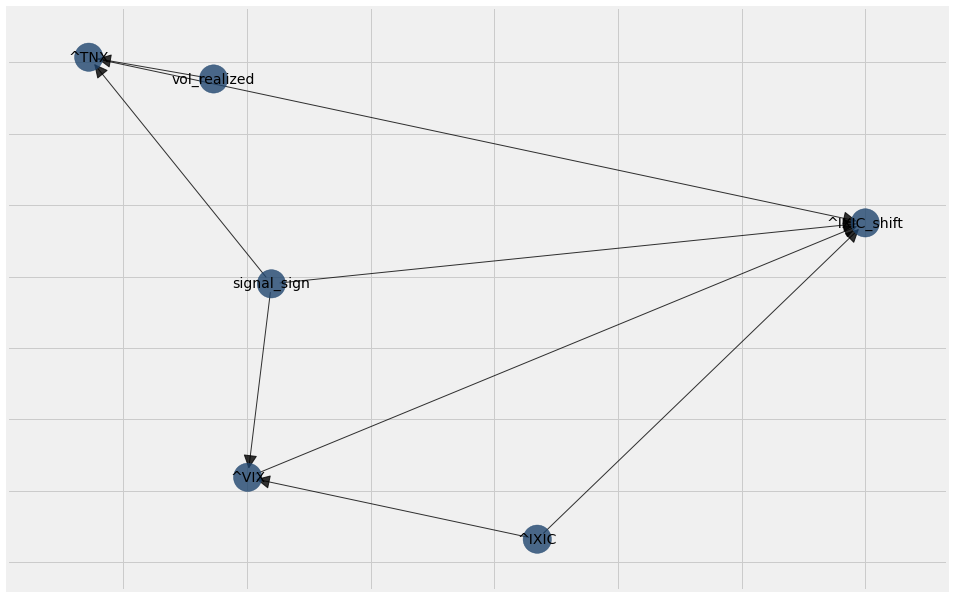

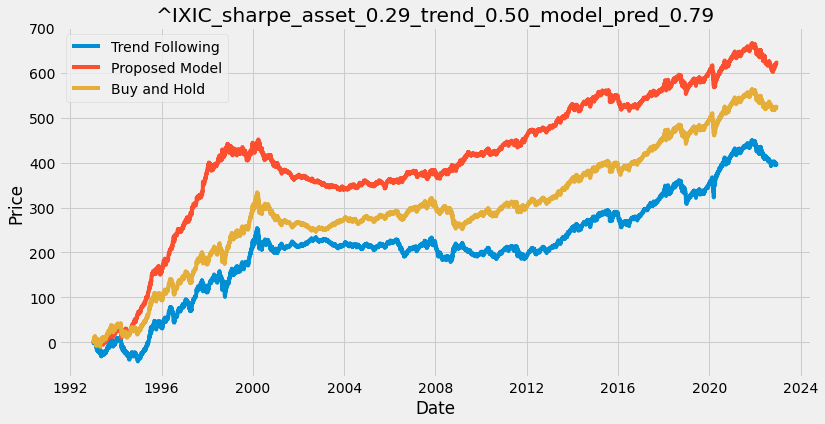

<Figure size 864x432 with 0 Axes>

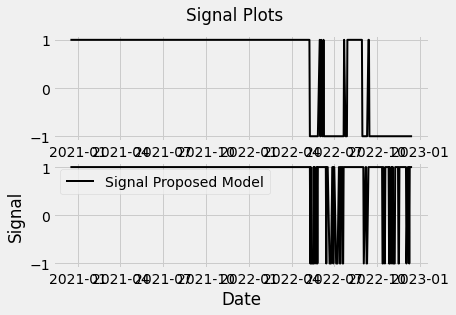

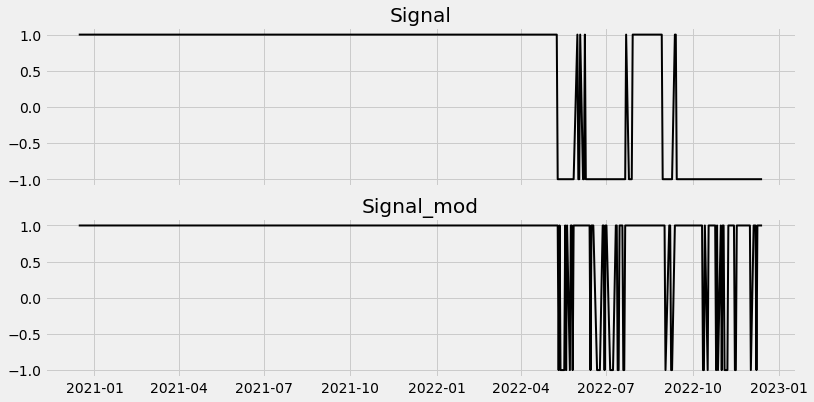

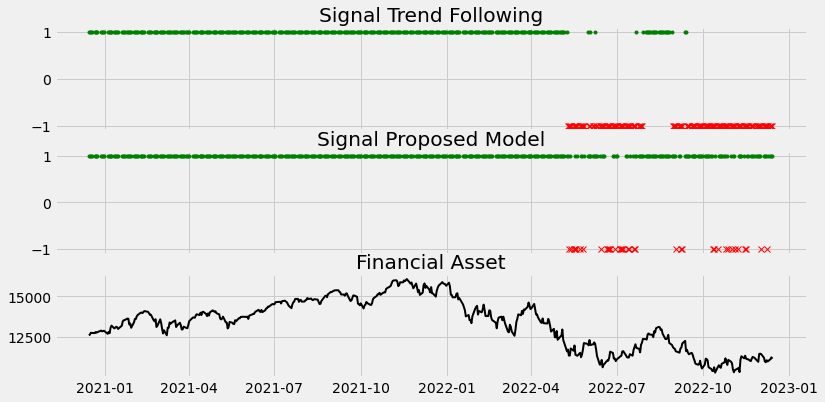

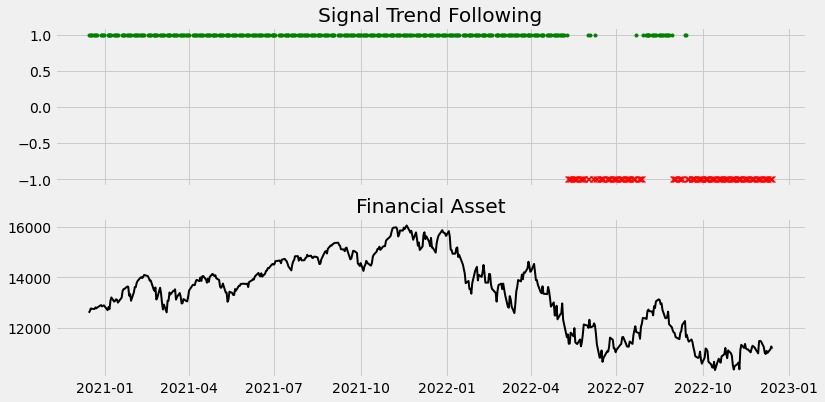

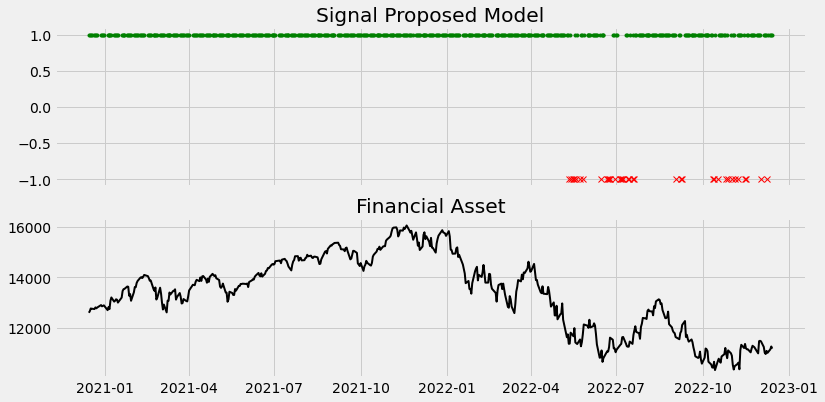

In [ ]:


ticker_list = ['^GSPC','^DJI','^IXIC','^BUK100P','^RUT','^VIX','^FTSE','^GDAXI','^FCHI','^STOXX50E','^N100','^BFX','^N225','^HSI','^STI','^AXJO','^BVSP','^MXX']

ticker_list = ['^GSPC','^DJI','^IXIC']

#ticker_list = ['XLE','XLF','XLU','XLI','XLK','XLV','XLY','XLP','XLB','XOP','IYR','XHB','ITB','VNQ','GDXJ','IYE','OIH','XME','XRT','SMH','IBB','KBE','KRE','XTL']
#ticker_list = ['XOP','IYR','XHB','ITB','VNQ','GDXJ','IYE','OIH','XME','XRT','SMH','IBB','KBE','KRE','XTL']
#ticker_list = ['XLK','XLV','XLF','XLY','XLI','XLP','XLC','XLE','XLRE','XLU','XLB']
# ticker_list = ['^GSPC','^DJI']
for ticker_tmp in ticker_list:
  print(ticker_tmp)
  # df_out, df_signal_model_out, sharpe_model_out, sharpe_asset = f_run_prediction_generic(method_in = 'bayes', asset_ticker_in = ticker_tmp)
  try:
    df_out, df_signal_model_out, sharpe_model_out, sharpe_asset = f_run_prediction_generic(method_in = 'bayes', asset_ticker_in = ticker_tmp)
  except:
    pass


In [ ]:
_PATH_OUTPUT

'./gdrive/MyDrive/bayes_project/20221229_20h35m35s/'

In [ ]:
for ticker_tmp in ticker_list:
  print(ticker_tmp)

^GSPC
^DJI
^IXIC


In [ ]:
  #################################### READ OUTPUTS ####################################
  df_best_spx = f_read_outputs( '^GSPC' + '_df_best')
  df_best_pred_mod_spx = f_read_outputs( '^GSPC' + '_df_best_pred_mod')
  df_best_bh_spx = f_read_outputs( '^GSPC' + '_df_best_bh')

  df_best_spx['Date'] = pd.to_datetime(df_best_spx['Date'], errors='coerce')
  df_best_pred_mod_spx['Date'] = pd.to_datetime(df_best_pred_mod_spx['Date'], errors='coerce')
  df_best_bh_spx['Date'] = pd.to_datetime(df_best_bh_spx['Date'], errors='coerce')

  #################################### READ OUTPUTS ####################################

In [ ]:
  #################################### READ OUTPUTS ####################################
  df_best_dji = f_read_outputs( '^DJI' + '_df_best')
  df_best_pred_mod_dji = f_read_outputs( '^DJI' + '_df_best_pred_mod')
  df_best_bh_dji = f_read_outputs( '^DJI' + '_df_best_bh')

  df_best_dji['Date'] = pd.to_datetime(df_best_dji['Date'], errors='coerce')
  df_best_pred_mod_dji['Date'] = pd.to_datetime(df_best_pred_mod_dji['Date'], errors='coerce')
  df_best_bh_dji['Date'] = pd.to_datetime(df_best_bh_dji['Date'], errors='coerce')
  #################################### READ OUTPUTS ####################################

In [ ]:
  #################################### READ OUTPUTS ####################################
  df_best_ndx = f_read_outputs( '^IXIC' + '_df_best')
  df_best_pred_mod_ndx = f_read_outputs( '^IXIC' + '_df_best_pred_mod')
  df_best_bh_ndx = f_read_outputs( '^IXIC' + '_df_best_bh')

  df_best_ndx['Date'] = pd.to_datetime(df_best_ndx['Date'], errors='coerce')
  df_best_pred_mod_ndx['Date'] = pd.to_datetime(df_best_pred_mod_ndx['Date'], errors='coerce')
  df_best_bh_ndx['Date'] = pd.to_datetime(df_best_bh_ndx['Date'], errors='coerce')
  #################################### READ OUTPUTS ####################################

In [ ]:
  df_best_bh_ndx.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,var_abs,var,close_ewma,vol_ewma,signal,signal_sign,signal_strenght,signal_strenght_acc
0,1993-01-04 05:00:00,675.309998,676.780029,671.419983,671.799988,188870000,0.0,0.0,2.540039,2.540039,671.799988,2.540039,1,1,NaN,NaN
1,1993-01-05 05:00:00,670.520020,674.349976,670.510010,674.340027,229400000,0.0,0.0,2.540039,2.540039,671.806965,2.540039,1,1,2.956627,2.956627
2,1993-01-06 05:00:00,678.440002,681.890015,676.729980,681.849976,270020000,0.0,0.0,7.509949,7.509949,671.834551,2.553690,1,1,-1.433031,1.523597
3,1993-01-07 05:00:00,681.559998,685.299988,677.820007,678.210022,296930000,0.0,0.0,3.639954,-3.639954,671.852063,2.556674,1,1,-0.391590,1.132007
4,1993-01-08 05:00:00,677.190002,677.859985,672.679993,677.210022,232820000,0.0,0.0,1.000000,-1.000000,671.866780,2.552398,1,1,2.029982,3.161988


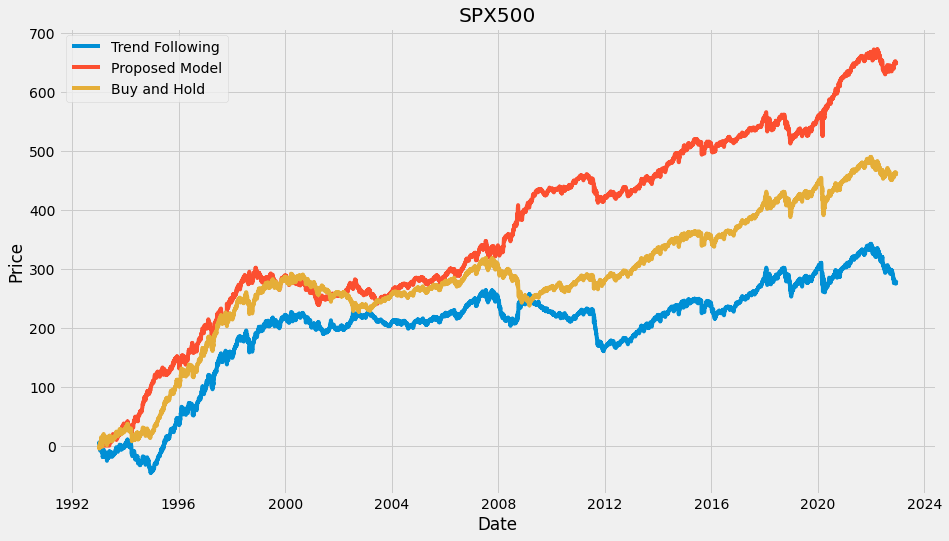

In [ ]:
  file_name_out = _PATH_OUTPUT + 'SPX500_all' + '.png'
  plt.figure(figsize = (14, 8))
  plt.plot(df_best_spx['Date'], df_best_spx['signal_strenght_acc'], label="Trend Following")
  plt.plot(df_best_pred_mod_spx['Date'], df_best_pred_mod_spx['signal_strenght_acc'], label="Proposed Model")
  plt.plot(df_best_bh_spx['Date'], df_best_bh_spx['signal_strenght_acc'], label="Buy and Hold")
  plt.xlabel("Date")
  plt.ylabel("Price")
  plt.title('SPX500')
  plt.legend()
  plt.savefig(file_name_out)
  plt.show()

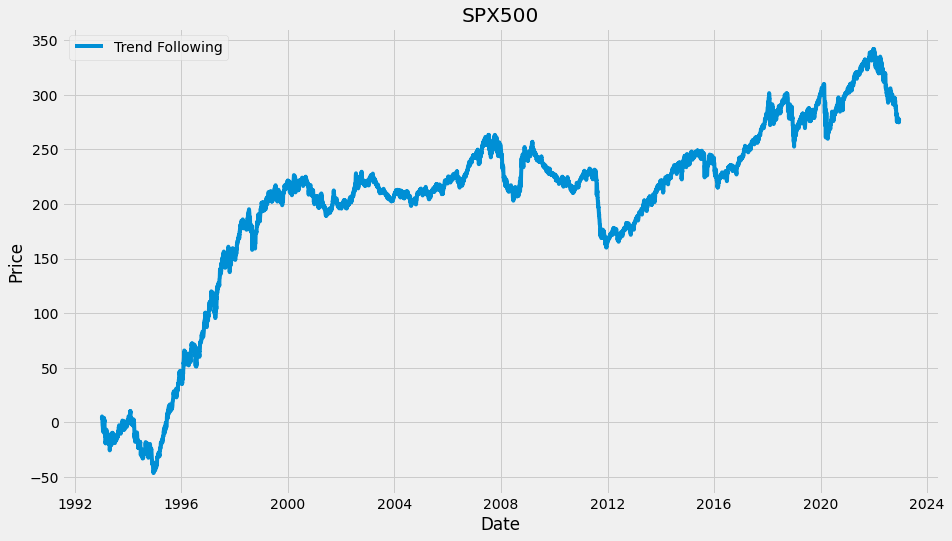

In [ ]:
  file_name_out = _PATH_OUTPUT + 'SPX500_trend' + '.png'
  plt.figure(figsize = (14, 8))
  plt.plot(df_best_spx['Date'], df_best_spx['signal_strenght_acc'], label="Trend Following")
  plt.xlabel("Date")
  plt.ylabel("Price")
  plt.title('SPX500')
  plt.legend()
  plt.savefig(file_name_out)
  plt.show()

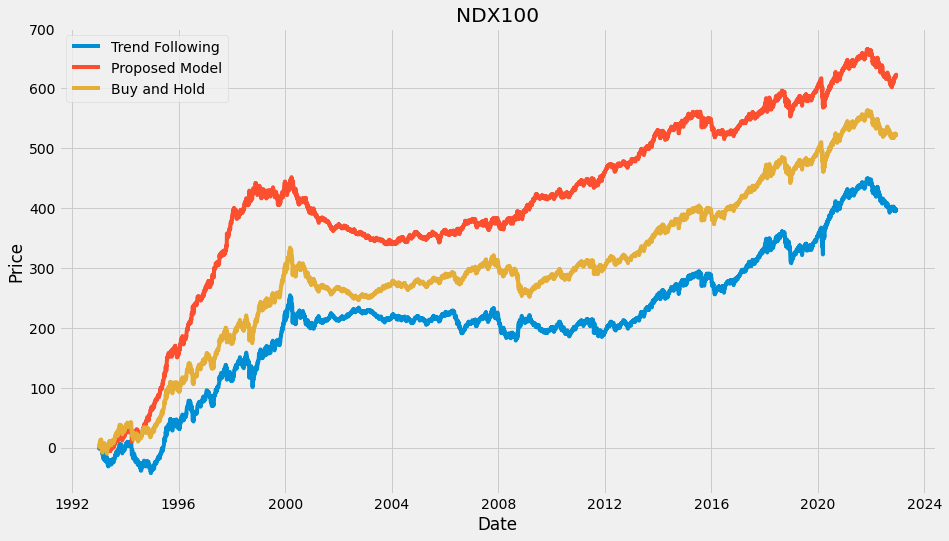

In [ ]:

  file_name_out = _PATH_OUTPUT + 'NDX100_all' + '.png'
  plt.figure(figsize = (14, 8))
  plt.plot(df_best_ndx['Date'], df_best_ndx['signal_strenght_acc'], label="Trend Following")
  plt.plot(df_best_pred_mod_ndx['Date'], df_best_pred_mod_ndx['signal_strenght_acc'], label="Proposed Model")
  plt.plot(df_best_bh_ndx['Date'], df_best_bh_ndx['signal_strenght_acc'], label="Buy and Hold")
  plt.xlabel("Date")
  plt.ylabel("Price")
  plt.title('NDX100')
  plt.legend()
  plt.savefig(file_name_out)
  plt.show()



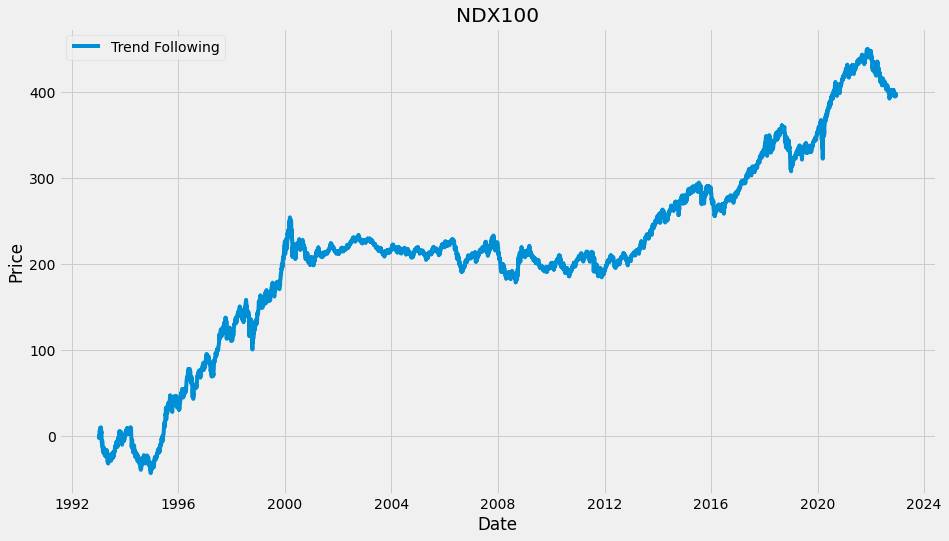

In [ ]:
  file_name_out = _PATH_OUTPUT + 'NDX100_trend' + '.png'
  plt.figure(figsize = (14, 8))
  plt.plot(df_best_ndx['Date'], df_best_ndx['signal_strenght_acc'], label="Trend Following")
  plt.xlabel("Date")
  plt.ylabel("Price")
  plt.title('NDX100')
  plt.legend()
  plt.savefig(file_name_out)
  plt.show()

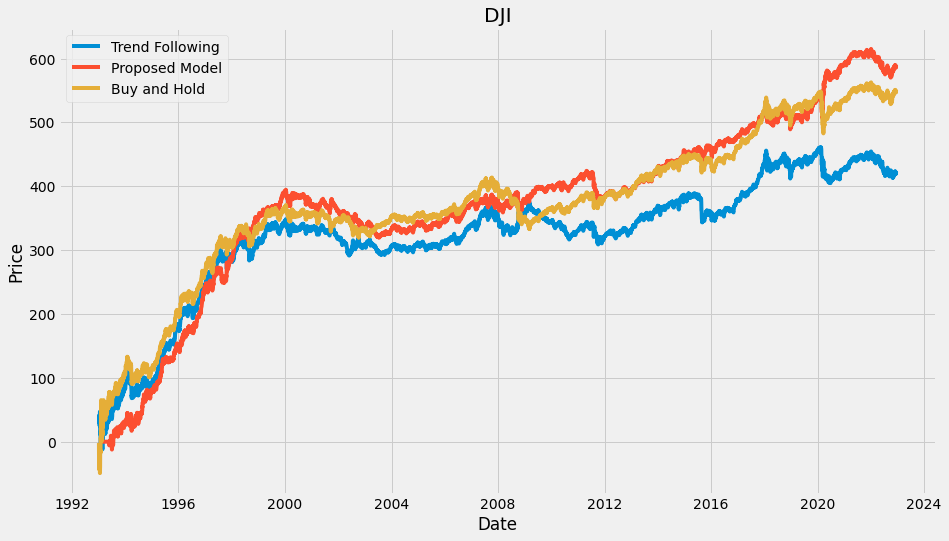

In [ ]:
  file_name_out = _PATH_OUTPUT + 'DJI_all' + '.png'
  plt.figure(figsize = (14, 8))
  plt.plot(df_best_dji['Date'], df_best_dji['signal_strenght_acc'], label="Trend Following")
  plt.plot(df_best_pred_mod_dji['Date'], df_best_pred_mod_dji['signal_strenght_acc'], label="Proposed Model")
  plt.plot(df_best_bh_dji['Date'], df_best_bh_dji['signal_strenght_acc'], label="Buy and Hold")
  plt.xlabel("Date")
  plt.ylabel("Price")
  plt.title('DJI')
  plt.legend()
  plt.savefig(file_name_out)
  plt.show()

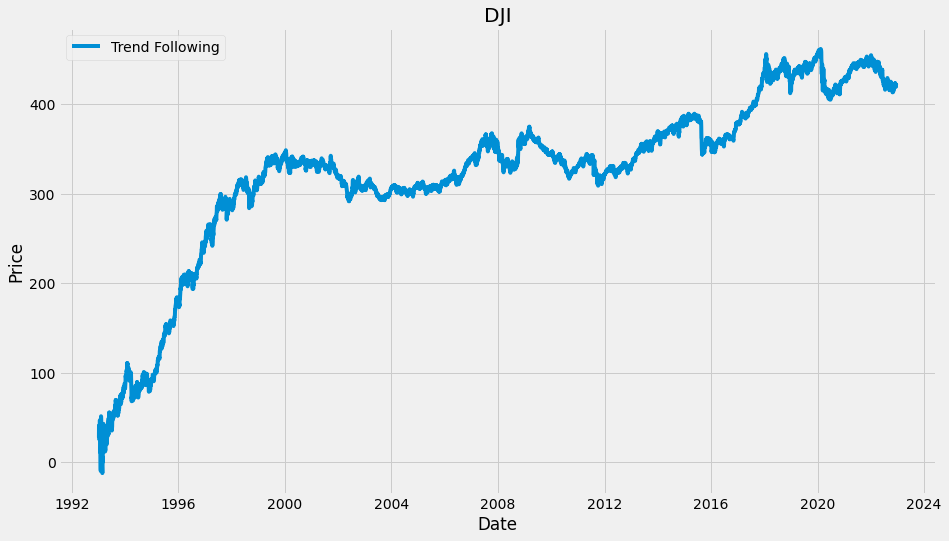

In [ ]:
  file_name_out = _PATH_OUTPUT + 'DJI_trend' + '.png'
  plt.figure(figsize = (14, 8))
  plt.plot(df_best_dji['Date'], df_best_dji['signal_strenght_acc'], label="Trend Following")
  plt.xlabel("Date")
  plt.ylabel("Price")
  plt.title('DJI')
  plt.legend()
  plt.savefig(file_name_out)
  plt.show()